In [6]:
import pandas as pd
import numpy as np
%config inlineBackend.figure_format='svg'
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

%run DLMO.ipynb
# plt.rcParams['font.family'] = 'Helvetica'


In [7]:
sleep_sample, activity_sample, phone_sample, user_id_mapping = importing_datasets()

Number of rows:  30963297
Unique users:  112928


In [ ]:
sleep_sample.head(n=2)

In [ ]:
phone_sample.head(n=2)

In [ ]:
activity_sample.head(n=2)

## Calculating sleep duration median and skew

In [8]:
_skew = sleep_sample[['user_id','sleep_duration_round']].groupby('user_id').skew()
_skew = _skew.reset_index()
_skew.rename(columns={'sleep_duration_round':'sleep_duration_skew'},inplace=True)

_avg = sleep_sample[['user_id','sleep_duration_round']].groupby('user_id').mean()
_avg = _avg.reset_index()
_avg.rename(columns={'sleep_duration_round':'sleep_duration_avg'},inplace=True)

_med = sleep_sample[['user_id','sleep_duration_round']].groupby('user_id').median()
_med = _med.reset_index()
_med.rename(columns = {'sleep_duration_round':'sleep_duration_median'},inplace=True)
_skew = _skew.merge(_med,how='left', left_on='user_id',right_on='user_id')
_skew['sleep_dur_median_bucket']= np.round(_skew['sleep_duration_median']*2)/2
_skew.sort_values(by='sleep_duration_skew',ascending=False, inplace=True)

_skew = _skew.merge(_avg, how='left',left_on = 'user_id',right_on='user_id')
_skew

,user_id,sleep_duration_skew,sleep_duration_median,sleep_dur_median_bucket,sleep_duration_avg
0,1211,2.319075,6.73,6.5,6.937147
1,1182,1.966655,5.77,6.0,6.052583
2,2039,1.953479,5.32,5.5,5.736361
3,1901,1.937355,5.43,5.5,6.015566
4,67,1.808291,6.15,6.0,6.394125
...,...,...,...,...,...
3379,2070,-2.659640,6.90,7.0,6.827136
3380,733,-2.727773,8.57,8.5,8.444496
3381,2798,-2.840200,6.88,7.0,6.715773
3382,2567,-3.460372,7.72,7.5,7.602108


## Identifying streaks of sleep ( not just the longest one)

In [9]:
sleep_sample, SleepContInnings_df, sleep_sample_ContOnly = sleep_streaks(sleep_sample)
print("Count of sleep streaks: ", len(SleepContInnings_df))
# sleep_sample_ContOnly['count'].unique()

len sleep_sample_ContOnly:  904449
Count of sleep streaks:  17160


In [10]:
%run DLMO.ipynb
print("initial len ph: ", len(phone_sample))
phone_sample = minimumcriteria(phone_sample,'duration')
print("final len ph: ", len(phone_sample))
print("initial len act: ", len(activity_sample))
activity_sample = minimumcriteria(activity_sample,'steps')
print("final len act: ", len(activity_sample))


initial len ph:  58578768
final len ph:  53715853
initial len act:  48559848
final len act:  42847013


In [25]:
%run DLMO.ipynb
import warnings
warnings.filterwarnings("ignore")
unique_users = list(SleepContInnings_df['user_id'].unique())

old_user = 999999999
starting_user = 1
for i_num in range(starting_user, len(unique_users)):
# for i_num in range(1):
    chosen_user = unique_users[i_num]
#     chosen_user = 3
    print("------------chosen user: ", chosen_user, " ------------------------")

    _user_sleep_stat = SleepContInnings_df[SleepContInnings_df['user_id']==chosen_user].reset_index()
    _user_sleep_stat.drop(columns={'index'},inplace=True)
    print("count of streaks: ",len(_user_sleep_stat))
    PredictedVsActual_all = pd.DataFrame()

    for z in range(len(_user_sleep_stat)):
#     for z in range(1):
#         z=8
        ph_flag = 0
        act_flag = 0
        ph_act_flag = 0
        print("streak: ",z)
        #resetting these flags after every streak evaluation

        chosen_user_streak_start = pd.to_datetime(_user_sleep_stat['sleep_streak_start_date'].iloc[z])

        chosen_user_streak_length = _user_sleep_stat['count'].iloc[z]-1
        chosen_user_streak_end =  chosen_user_streak_start+np.timedelta64(chosen_user_streak_length, 'D')
        print("sleep streaks: ", chosen_user_streak_start,chosen_user_streak_end, " count of days: ",
             chosen_user_streak_length)
        cc = sleep_nights(chosen_user, sleep_sample, chosen_user_streak_start,chosen_user_streak_length)
        dates_to_be_dropped = drop_dates(cc)
        date_sleep_combo,time_vals = create_combo(cc,dates_to_be_dropped,'sleep_start_shift')
        date_sleep_combo.columns = ["sleep_start", "start_time_num_round_25","start_time_num_round"]
        sleep_times = event_times(cc)
        date_sleep_combo = date_sleep_combo.merge(sleep_times,how = 'left',
                                                  left_on = ["sleep_start", "start_time_num_round_25"],
                                                  right_on = ["sleep_start", "start_time_num_round_25"])
        date_sleep_combo["asleep_0_awake_300"] = np.where(date_sleep_combo["user_id"].isna(), 300,0)
        cc2 = cc[cc['sleep_start_shift'].isin(list(date_sleep_combo['sleep_start'].unique()))]
        SleepingDates_48hr, weekend = SleepingDates(cc2)   
        print("length of date sleep combo: ", len(date_sleep_combo)," unique days: ",
              len(date_sleep_combo['sleep_start'].unique()))
        pp = phone_sample[(phone_sample['user_id']== chosen_user) &
                      (phone_sample["day_label_dt"]>=  chosen_user_streak_start) &
                      (phone_sample["day_label_dt"] <=  chosen_user_streak_end)]
        if len(pp) > 96: #atleast one day data
            pp['sleep_start'] = pp['day_label_dt'] #just to keep identical joining column names
            print("phone min date: ", np.min(pp['sleep_start'])," max date: ",np.max(pp['sleep_start']))
            date_phone_combo,time_vals = create_combo(pp,dates_to_be_dropped,'sleep_start')
            date_phone_combo = date_phone_combo.merge(pp,how='left',
                                                      left_on=['sleep_start','start_time_num_round'],
                                                      right_on=['sleep_start','start_time_num_round'])
            date_phone_combo['duration'] = date_phone_combo['duration'].fillna(0)
            ph_flag = 1
            print("length of date phone combo: ", len(date_phone_combo)," unique days: ",
                  len(date_phone_combo['sleep_start'].unique()))
        vv = activity_sample[(activity_sample['user_id']== chosen_user) &
                      (activity_sample["day_label_dt"]>=  chosen_user_streak_start) &
                      (activity_sample["day_label_dt"] <=  chosen_user_streak_end)]
        
        if len(vv) > 96:
            vv['sleep_start'] = vv['day_label_dt'] #just to keep identical joining column names
            print("activity min date: ", np.min(vv['sleep_start'])," max date: ",np.max(vv['sleep_start']))
            date_activity_combo,time_vals = create_combo(vv,dates_to_be_dropped,'sleep_start')
            date_activity_combo = date_activity_combo.merge(vv,how='left',
                                                      left_on=['sleep_start','start_time_num_round'],
                                                      right_on=['sleep_start','start_time_num_round'])

            date_activity_combo['steps'] = date_activity_combo['steps'].fillna(0)
            act_flag = 1
            print("length of date activity combo: ", len(date_activity_combo)," unique days: ",
                  len(date_activity_combo['sleep_start'].unique()))
        if (act_flag == 1) & (ph_flag ==1):
            print("BOTH phone and activity found")
            date_phone_activity_combo = CombinePhoneActivityForSleepStreaks(chosen_user,
                                                                            date_sleep_combo,
                                                                            date_phone_combo,
                                                                            date_activity_combo,
                                                                            chosen_user_streak_start,
                                                                            chosen_user_streak_end)
            date_phone_activity_combo = PhoneActivityStreak(chosen_user, date_phone_activity_combo)
            if isinstance(date_phone_activity_combo, pd.DataFrame):
                ph_act_flag = 1
            
        elif (act_flag == 1) & (ph_flag == 0):
            print("activity found BUT phone NOT found")
            date_activity_combo = GetStreak(chosen_user, date_activity_combo, date_sleep_combo, 'steps')
            if isinstance(date_activity_combo, pd.DataFrame):
                date_phone_activity_combo = date_activity_combo.copy(deep=True)
                date_phone_activity_combo.rename(columns={'steps_norm':'duration_steps_combo'},inplace=True)

                ph_act_flag = 1
            
        elif (act_flag == 0) & (ph_flag == 1):
            print("phone found BUT activity NOT found")
            date_phone_combo = GetStreak(chosen_user, date_phone_combo, date_sleep_combo, 'duration')
            if isinstance(date_phone_combo, pd.DataFrame):
                date_phone_activity_combo = date_phone_combo.copy(deep=True)
                date_phone_activity_combo.rename(columns={'dur_norm':'duration_steps_combo'},inplace=True) 

                ph_act_flag = 1
        
        if ph_act_flag == 1:
            
            first_date_phone_activity_available = np.min(pd.to_datetime(date_phone_activity_combo['sleep_start']))
            last_date_phone_activity_available = np.max(pd.to_datetime(date_phone_activity_combo['sleep_start']))
            print("first ph act date: ",first_date_phone_activity_available, " last ph act date: ",
                 last_date_phone_activity_available, " count of days: ", 
                  len(date_phone_activity_combo['sleep_start'].unique()))
            
            
            SleepingDates_48hr_phone_activity = SleepingDates_48hr[(SleepingDates_48hr['sleep_start_shift']>=
                                                                first_date_phone_activity_available) & 
                                                               (SleepingDates_48hr['sleep_start_shift']<=
                                                                last_date_phone_activity_available)]

            phone_activity_values = np.array(date_phone_activity_combo["duration_steps_combo"])
            time_array = np.arange(0,len(phone_activity_values))
            hr24marker = int(len(phone_activity_values)/(24*4))
            ts = np.arange(0, 24*hr24marker, 0.25)   
            initial_conditions_kj,sol = initial_conditions_loop(SleepingDates_48hr_phone_activity,ts,
                                                                    light_est=phone_activity_values, num_loops=1)

            show_plot='no'
            dlmo_kj = dlmos(sol,show_plot)
            dlmo_kj2 = clean_dlmo(dlmo_kj)

#             print("dlmo kj2: ",dlmo_kj2)
            PredictedVsActual = Predicted_And_Actual(SleepingDates_48hr_phone_activity, dlmo_kj2)
            PredictedVsActual['sleep_start_shift'] = pd.to_datetime(PredictedVsActual['sleep_start_shift'])
            PredictedVsActual = PredictedVsActual.merge(SleepingDates_48hr[['sleep_start_shift','sleep_duration_round']],
                                                   how='left',left_on = 'sleep_start_shift',
                                                    right_on='sleep_start_shift')


            PredictedVsActual['instance_id'] = z
            PredictedVsActual['user_id'] = chosen_user
            PredictedVsActual_all = pd.concat([PredictedVsActual_all,PredictedVsActual])
        else:
            print("Streak: ",z," for user: ", chosen_user, " not inserted")
    
    old_user = chosen_user
    if old_user != chosen_user:
        print(i_num, " users complete")
#     if chosen_user%100 == 0:
    fname = "/data/work/shared/s210142/datasets3/"+str(chosen_user)+".csv"
    PredictedVsActual_all.to_csv(fname)
    print("user ",chosen_user," written to file")

        


------------chosen user:  2  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2017-01-15 00:00:00 2017-03-31 00:00:00  count of days:  75
length of date sleep combo:  7200  unique days:  75
phone min date:  2017-01-15 00:00:00  max date:  2017-03-31 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2017-01-16 00:00:00  max date:  2017-03-31 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2017-03-12 00:00:00  last ph act date:  2017-03-30 00:00:00  count of days:  19
streak:  1
sleep streaks:  2017-04-03 00:00:00 2017-06-02 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2017-04-03 00:00:00  max date:  2017-06-02 00:00:00
length of date phone combo:  3364  unique days:  35
activity min date:  2017-04-03 00:00:00  max date:  2017-06-02 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activi

length of date sleep combo:  4704  unique days:  49
phone min date:  2017-06-01 00:00:00  max date:  2017-07-13 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2017-05-26 00:00:00  max date:  2017-07-14 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2017-05-29 00:00:00  last ph act date:  2017-06-23 00:00:00  count of days:  26
streak:  7
sleep streaks:  2018-03-05 00:00:00 2018-04-07 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2018-03-05 00:00:00  max date:  2018-03-31 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2018-03-05 00:00:00  max date:  2018-04-06 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2018-03-12 00:00:00  last ph act date:  2018-03-27 00:00:00  count of days:  16
streak:  8
sleep streaks:  2018-04-20 00:00:00 2018-05-

length of date sleep combo:  12384  unique days:  129
phone min date:  2016-07-07 00:00:00  max date:  2016-10-25 00:00:00
length of date phone combo:  10464  unique days:  109
activity min date:  2016-06-18 00:00:00  max date:  2016-10-25 00:00:00
length of date activity combo:  11808  unique days:  123
BOTH phone and activity found
first ph act date:  2016-06-20 00:00:00  last ph act date:  2016-10-24 00:00:00  count of days:  127
streak:  1
sleep streaks:  2016-11-22 00:00:00 2017-03-10 00:00:00  count of days:  108
length of date sleep combo:  10272  unique days:  107
phone min date:  2016-11-22 00:00:00  max date:  2017-03-10 00:00:00
length of date phone combo:  10272  unique days:  107
activity min date:  2016-11-22 00:00:00  max date:  2017-03-10 00:00:00
length of date activity combo:  10080  unique days:  105
BOTH phone and activity found
first ph act date:  2016-11-23 00:00:00  last ph act date:  2017-03-09 00:00:00  count of days:  107
streak:  2
sleep streaks:  2017-03-13 

user  9  written to file
------------chosen user:  10  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-03-23 00:00:00 2016-06-23 00:00:00  count of days:  92
length of date sleep combo:  8928  unique days:  93
phone min date:  2016-03-23 00:00:00  max date:  2016-06-23 00:00:00
length of date phone combo:  8832  unique days:  92
activity min date:  2016-03-23 00:00:00  max date:  2016-06-22 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2016-03-23 00:00:00  last ph act date:  2016-06-23 00:00:00  count of days:  93
streak:  1
sleep streaks:  2016-07-11 00:00:00 2016-08-13 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2016-07-11 00:00:00  max date:  2016-08-13 00:00:00
length of date phone combo:  3173  unique days:  33
activity min date:  2016-07-12 00:00:00  max date:  2016-08-13 00:00:00
length of date activity combo:  2592  unique days:

length of date sleep combo:  11808  unique days:  123
phone min date:  2016-06-01 00:00:00  max date:  2016-10-01 00:00:00
length of date phone combo:  10187  unique days:  106
activity min date:  2016-05-31 00:00:00  max date:  2016-10-01 00:00:00
length of date activity combo:  11808  unique days:  123
BOTH phone and activity found
first ph act date:  2016-06-01 00:00:00  last ph act date:  2016-09-16 00:00:00  count of days:  108
streak:  3
sleep streaks:  2016-10-06 00:00:00 2017-03-29 00:00:00  count of days:  174
length of date sleep combo:  16704  unique days:  174
phone min date:  2016-10-06 00:00:00  max date:  2017-03-29 00:00:00
length of date phone combo:  16224  unique days:  169
activity min date:  2016-10-06 00:00:00  max date:  2017-03-29 00:00:00
length of date activity combo:  16704  unique days:  174
BOTH phone and activity found
first ph act date:  2016-10-07 00:00:00  last ph act date:  2017-03-29 00:00:00  count of days:  174
streak:  4
sleep streaks:  2017-04-11 

streak:  1
sleep streaks:  2017-05-20 00:00:00 2017-09-18 00:00:00  count of days:  121
length of date sleep combo:  11520  unique days:  120
activity min date:  2017-05-22 00:00:00  max date:  2017-09-18 00:00:00
length of date activity combo:  10272  unique days:  107
activity found BUT phone NOT found
len of date_combo_ContOnly:  10272
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-07-16                     0.00                  0.00      NaN   
1     2017-07-16                     0.25                  0.15      NaN   
2     2017-07-16                     0.50                  0.30      NaN   
3     2017-07-16                     0.75                  0.45      NaN   
4     2017-07-16                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1915  2017-08-04                    22.75                 22.45      NaN   
1916  2017-08-04             

activity min date:  2015-09-08 00:00:00  max date:  2015-11-06 00:00:00
length of date activity combo:  5664  unique days:  59
activity found BUT phone NOT found
len of date_combo_ContOnly:  5664
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-09-08                     0.00                  0.00      NaN   
1     2015-09-08                     0.25                  0.15      NaN   
2     2015-09-08                     0.50                  0.30     15.0   
3     2015-09-08                     0.75                  0.45     15.0   
4     2015-09-08                     1.00                  1.00     15.0   
...          ...                      ...                   ...      ...   
5179  2015-10-31                    22.75                 22.45     15.0   
5180  2015-10-31                    23.00                 23.00     15.0   
5181  2015-10-31                    23.25                 23.15     15.0   
5182  2015-10-31      

activity min date:  2016-06-01 00:00:00  max date:  2017-03-05 00:00:00
length of date activity combo:  23808  unique days:  248
BOTH phone and activity found
first ph act date:  2017-02-05 00:00:00  last ph act date:  2017-03-04 00:00:00  count of days:  28
streak:  2
sleep streaks:  2017-03-08 00:00:00 2017-06-22 00:00:00  count of days:  106
length of date sleep combo:  10176  unique days:  106
activity min date:  2017-03-08 00:00:00  max date:  2017-06-22 00:00:00
length of date activity combo:  10176  unique days:  106
activity found BUT phone NOT found
len of date_combo_ContOnly:  10176
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-03-08                     0.00                  0.00      NaN   
1      2017-03-08                     0.25                  0.15      NaN   
2      2017-03-08                     0.50                  0.30      NaN   
3      2017-03-08                     0.75                  0.45      

streak:  2
sleep streaks:  2016-11-25 00:00:00 2017-03-26 00:00:00  count of days:  121
length of date sleep combo:  11616  unique days:  121
phone min date:  2016-12-24 00:00:00  max date:  2017-03-24 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2016-11-25 00:00:00  max date:  2017-03-26 00:00:00
length of date activity combo:  10944  unique days:  114
BOTH phone and activity found
first ph act date:  2016-12-18 00:00:00  last ph act date:  2017-02-02 00:00:00  count of days:  47
streak:  3
sleep streaks:  2017-04-15 00:00:00 2017-07-05 00:00:00  count of days:  81
length of date sleep combo:  7776  unique days:  81
activity min date:  2017-04-15 00:00:00  max date:  2017-07-05 00:00:00
length of date activity combo:  7680  unique days:  80
activity found BUT phone NOT found
len of date_combo_ContOnly:  7680
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-16                     0.00    

phone min date:  2016-06-23 00:00:00  max date:  2016-10-01 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2016-06-13 00:00:00  max date:  2016-10-13 00:00:00
length of date activity combo:  11232  unique days:  117
BOTH phone and activity found
first ph act date:  2016-06-20 00:00:00  last ph act date:  2016-08-21 00:00:00  count of days:  63
user  19  written to file
------------chosen user:  20  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2015-11-06 00:00:00 2015-12-16 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2015-11-07 00:00:00  max date:  2015-12-14 00:00:00
length of date activity combo:  1824  unique days:  19
activity found BUT phone NOT found
len of date_combo_ContOnly:  1824
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-12-01                     0.00                  0.00      NaN   
1    2015-1

streak:  3
sleep streaks:  2018-01-11 00:00:00 2018-03-09 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
activity min date:  2018-01-11 00:00:00  max date:  2018-03-09 00:00:00
length of date activity combo:  5280  unique days:  55
activity found BUT phone NOT found
len of date_combo_ContOnly:  5280
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-30                     0.00                  0.00      NaN   
1     2018-01-30                     0.25                  0.15      NaN   
2     2018-01-30                     0.50                  0.30      NaN   
3     2018-01-30                     0.75                  0.45     21.0   
4     2018-01-30                     1.00                  1.00     21.0   
...          ...                      ...                   ...      ...   
2779  2018-02-27                    22.75                 22.45      NaN   
2780  2018-02-27                   

length of date sleep combo:  7488  unique days:  78
activity min date:  2016-07-06 00:00:00  max date:  2016-09-21 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-07-08                     0.00                  0.00      NaN   
1    2016-07-08                     0.25                  0.15      NaN   
2    2016-07-08                     0.50                  0.30      NaN   
3    2016-07-08                     0.75                  0.45      NaN   
4    2016-07-08                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
571  2016-07-13                    22.75                 22.45      NaN   
572  2016-07-13                    23.00                 23.00      NaN   
573  2016-07-13                    23.25               

streak:  1
sleep streaks:  2018-12-18 00:00:00 2019-03-12 00:00:00  count of days:  84
length of date sleep combo:  8064  unique days:  84
activity min date:  2018-12-18 00:00:00  max date:  2019-03-12 00:00:00
length of date activity combo:  7488  unique days:  78
activity found BUT phone NOT found
len of date_combo_ContOnly:  7488
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-01-12                     0.00                  0.00      NaN   
1     2019-01-12                     0.25                  0.15     24.0   
2     2019-01-12                     0.50                  0.30     24.0   
3     2019-01-12                     0.75                  0.45     24.0   
4     2019-01-12                     1.00                  1.00     24.0   
...          ...                      ...                   ...      ...   
2107  2019-02-02                    22.75                 22.45      NaN   
2108  2019-02-02                   

streak:  3
sleep streaks:  2017-09-01 00:00:00 2017-10-06 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2017-09-01 00:00:00  max date:  2017-10-06 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2017-09-01 00:00:00  max date:  2017-10-06 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-09-02 00:00:00  last ph act date:  2017-10-06 00:00:00  count of days:  35
streak:  4
sleep streaks:  2017-10-24 00:00:00 2017-11-29 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2017-10-24 00:00:00  max date:  2017-11-29 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2017-10-24 00:00:00  max date:  2017-11-29 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-10-25 00:00:00  last ph act date:  2017-1

length of date sleep combo:  4320  unique days:  45
phone min date:  2016-09-01 00:00:00  max date:  2016-09-11 00:00:00
length of date phone combo:  384  unique days:  4
activity min date:  2016-08-29 00:00:00  max date:  2016-10-13 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2016-09-05 00:00:00  last ph act date:  2016-10-07 00:00:00  count of days:  33
streak:  2
sleep streaks:  2017-01-04 00:00:00 2017-02-11 00:00:00  count of days:  38
length of date sleep combo:  3552  unique days:  37
activity min date:  2017-01-05 00:00:00  max date:  2017-02-10 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-20                     0.00                  0.00     28.0   
1     2017-01-20                     0.25                  0.15

length of date sleep combo:  4800  unique days:  50
phone min date:  2018-12-13 00:00:00  max date:  2019-01-15 00:00:00
length of date phone combo:  1056  unique days:  11
activity min date:  2018-12-10 00:00:00  max date:  2019-01-29 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2018-12-26 00:00:00  last ph act date:  2019-01-12 00:00:00  count of days:  18
streak:  9
sleep streaks:  2019-03-20 00:00:00 2019-04-21 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
Streak:  9  for user:  28  not inserted
user  28  written to file
------------chosen user:  29  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-04-05 00:00:00 2017-03-06 00:00:00  count of days:  335
length of date sleep combo:  32160  unique days:  335
phone min date:  2016-04-05 00:00:00  max date:  2017-03-06 00:00:00
length of date phone combo:  6624  unique days:  69
activity min date:  2016-0

length of date sleep combo:  2784  unique days:  29
activity min date:  2017-04-12 00:00:00  max date:  2017-05-06 00:00:00
length of date activity combo:  1440  unique days:  15
activity found BUT phone NOT found
len of date_combo_ContOnly:  1440
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-04-25                     0.00                  0.00     31.0   
1    2017-04-25                     0.25                  0.15     31.0   
2    2017-04-25                     0.50                  0.30     31.0   
3    2017-04-25                     0.75                  0.45     31.0   
4    2017-04-25                     1.00                  1.00     31.0   
..          ...                      ...                   ...      ...   
475  2017-04-29                    22.75                 22.45      NaN   
476  2017-04-29                    23.00                 23.00      NaN   
477  2017-04-29                    23.25               

streak:  2
sleep streaks:  2016-04-14 00:00:00 2016-05-20 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-04-16 00:00:00  max date:  2016-05-19 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2016-04-14 00:00:00  max date:  2016-05-20 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-04-18 00:00:00  last ph act date:  2016-05-04 00:00:00  count of days:  17
streak:  3
sleep streaks:  2016-05-23 00:00:00 2016-07-11 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
phone min date:  2016-05-24 00:00:00  max date:  2016-07-11 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2016-05-23 00:00:00  max date:  2016-07-11 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2016-06-09 00:00:00  last ph act date:  2016-0

length of date sleep combo:  2880  unique days:  30
activity min date:  2016-02-12 00:00:00  max date:  2016-03-13 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-23                     0.00                  0.00      NaN   
1     2016-02-23                     0.25                  0.15      NaN   
2     2016-02-23                     0.50                  0.30      NaN   
3     2016-02-23                     0.75                  0.45      NaN   
4     2016-02-23                     1.00                  1.00     33.0   
...          ...                      ...                   ...      ...   
1243  2016-03-06                    22.75                 22.45      NaN   
1244  2016-03-06                    23.00                 23.00      NaN   
1245  2016-03-06                    23.25     

streak:  2
sleep streaks:  2016-08-12 00:00:00 2016-12-06 00:00:00  count of days:  116
length of date sleep combo:  11136  unique days:  116
phone min date:  2016-08-22 00:00:00  max date:  2016-12-06 00:00:00
length of date phone combo:  9889  unique days:  103
activity min date:  2016-08-12 00:00:00  max date:  2016-12-06 00:00:00
length of date activity combo:  10080  unique days:  105
BOTH phone and activity found
first ph act date:  2016-09-11 00:00:00  last ph act date:  2016-11-05 00:00:00  count of days:  56
streak:  3
sleep streaks:  2016-12-22 00:00:00 2017-03-22 00:00:00  count of days:  90
length of date sleep combo:  8544  unique days:  89
phone min date:  2016-12-22 00:00:00  max date:  2017-03-22 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2016-12-22 00:00:00  max date:  2017-03-20 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2017-01-15 00:00:00  last ph act date:  

user  36  written to file
------------chosen user:  37  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2017-04-25 00:00:00 2017-06-29 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
phone min date:  2017-06-21 00:00:00  max date:  2017-06-29 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2017-04-25 00:00:00  max date:  2017-06-29 00:00:00
length of date activity combo:  5760  unique days:  60
BOTH phone and activity found
first ph act date:  2017-06-04 00:00:00  last ph act date:  2017-06-28 00:00:00  count of days:  25
streak:  1
sleep streaks:  2017-08-20 00:00:00 2017-10-30 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
phone min date:  2017-08-20 00:00:00  max date:  2017-10-28 00:00:00
length of date phone combo:  6720  unique days:  70
activity min date:  2017-08-20 00:00:00  max date:  2017-10-29 00:00:00
length of date activity combo:  6432  unique days: 

length of date sleep combo:  4608  unique days:  48
phone min date:  2017-04-11 00:00:00  max date:  2017-05-23 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-04-10 00:00:00  max date:  2017-05-28 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2017-04-10 00:00:00  last ph act date:  2017-05-09 00:00:00  count of days:  30
streak:  5
sleep streaks:  2017-06-24 00:00:00 2017-10-20 00:00:00  count of days:  118
length of date sleep combo:  11328  unique days:  118
phone min date:  2017-06-24 00:00:00  max date:  2017-10-16 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2017-06-25 00:00:00  max date:  2017-10-20 00:00:00
length of date activity combo:  9888  unique days:  103
BOTH phone and activity found
first ph act date:  2017-06-24 00:00:00  last ph act date:  2017-07-26 00:00:00  count of days:  33
streak:  6
sleep streaks:  2017-10-23 00:00:00 20

streak:  4
sleep streaks:  2017-03-05 00:00:00 2017-06-29 00:00:00  count of days:  116
length of date sleep combo:  11136  unique days:  116
phone min date:  2017-03-05 00:00:00  max date:  2017-06-29 00:00:00
length of date phone combo:  11040  unique days:  115
activity min date:  2017-03-05 00:00:00  max date:  2017-06-29 00:00:00
length of date activity combo:  11136  unique days:  116
BOTH phone and activity found
first ph act date:  2017-03-06 00:00:00  last ph act date:  2017-06-29 00:00:00  count of days:  116
streak:  5
sleep streaks:  2017-07-23 00:00:00 2017-09-06 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2017-07-23 00:00:00  max date:  2017-09-06 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2017-07-23 00:00:00  max date:  2017-09-06 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2017-07-24 00:00:00  last ph act date:

activity min date:  2017-09-11 00:00:00  max date:  2017-11-14 00:00:00
length of date activity combo:  5376  unique days:  56
activity found BUT phone NOT found
len of date_combo_ContOnly:  5376
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-04                     0.00                  0.00     44.0   
1     2017-10-04                     0.25                  0.15     44.0   
2     2017-10-04                     0.50                  0.30     44.0   
3     2017-10-04                     0.75                  0.45     44.0   
4     2017-10-04                     1.00                  1.00     44.0   
...          ...                      ...                   ...      ...   
2683  2017-10-31                    22.75                 22.45      NaN   
2684  2017-10-31                    23.00                 23.00     44.0   
2685  2017-10-31                    23.25                 23.15     44.0   
2686  2017-10-31      

streak:  9
sleep streaks:  2017-12-14 00:00:00 2018-02-06 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
activity min date:  2017-12-14 00:00:00  max date:  2018-02-06 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-09                     0.00                  0.00     46.0   
1     2018-01-09                     0.25                  0.15     46.0   
2     2018-01-09                     0.50                  0.30     46.0   
3     2018-01-09                     0.75                  0.45     46.0   
4     2018-01-09                     1.00                  1.00     46.0   
...          ...                      ...                   ...      ...   
1819  2018-01-27                    22.75                 22.45     46.0   
1820  2018-01-27                   

streak:  1
sleep streaks:  2016-09-26 00:00:00 2016-10-30 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2016-09-26 00:00:00  max date:  2016-10-30 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-10                     0.00                  0.00     48.0   
1     2016-10-10                     0.25                  0.15     48.0   
2     2016-10-10                     0.50                  0.30     48.0   
3     2016-10-10                     0.75                  0.45     48.0   
4     2016-10-10                     1.00                  1.00     48.0   
...          ...                      ...                   ...      ...   
2011  2016-10-30                    22.75                 22.45     48.0   
2012  2016-10-30                   

streak:  6
sleep streaks:  2017-09-17 00:00:00 2017-11-09 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
activity min date:  2017-09-17 00:00:00  max date:  2017-11-09 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-18                     0.00                  0.00      NaN   
1     2017-09-18                     0.25                  0.15      NaN   
2     2017-09-18                     0.50                  0.30      NaN   
3     2017-09-18                     0.75                  0.45      NaN   
4     2017-09-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5083  2017-11-09                    22.75                 22.45     48.0   
5084  2017-11-09                   

length of date sleep combo:  21312  unique days:  222
activity min date:  2017-07-06 00:00:00  max date:  2018-02-13 00:00:00
length of date activity combo:  21216  unique days:  221
activity found BUT phone NOT found
len of date_combo_ContOnly:  21216
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-07-07                     0.00                  0.00     49.0   
1      2017-07-07                     0.25                  0.15     49.0   
2      2017-07-07                     0.50                  0.30     49.0   
3      2017-07-07                     0.75                  0.45     49.0   
4      2017-07-07                     1.00                  1.00     49.0   
...           ...                      ...                   ...      ...   
13051  2017-11-19                    22.75                 22.45     49.0   
13052  2017-11-19                    23.00                 23.00     49.0   
13053  2017-11-19               

streak:  3
sleep streaks:  2016-07-28 00:00:00 2016-10-24 00:00:00  count of days:  88
length of date sleep combo:  8448  unique days:  88
phone min date:  2016-07-28 00:00:00  max date:  2016-10-24 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2016-07-28 00:00:00  max date:  2016-10-24 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2016-07-28 00:00:00  last ph act date:  2016-10-23 00:00:00  count of days:  88
streak:  4
sleep streaks:  2016-10-27 00:00:00 2017-01-15 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
phone min date:  2016-10-27 00:00:00  max date:  2017-01-13 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2016-10-27 00:00:00  max date:  2017-01-15 00:00:00
length of date activity combo:  7584  unique days:  79
BOTH phone and activity found
first ph act date:  2016-11-24 00:00:00  last ph act date:  2017-0

streak:  3
sleep streaks:  2017-11-24 00:00:00 2017-12-28 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2017-11-24 00:00:00  max date:  2017-12-28 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-12-20                     0.00                  0.00     53.0   
1    2017-12-20                     0.25                  0.15     53.0   
2    2017-12-20                     0.50                  0.30     53.0   
3    2017-12-20                     0.75                  0.45     53.0   
4    2017-12-20                     1.00                  1.00     53.0   
..          ...                      ...                   ...      ...   
859  2017-12-28                    22.75                 22.45     53.0   
860  2017-12-28                    23.00   

streak:  3
sleep streaks:  2017-03-03 00:00:00 2017-10-15 00:00:00  count of days:  226
length of date sleep combo:  21600  unique days:  225
phone min date:  2017-03-03 00:00:00  max date:  2017-10-15 00:00:00
length of date phone combo:  21600  unique days:  225
activity min date:  2017-03-04 00:00:00  max date:  2017-09-17 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2017-03-04 00:00:00  last ph act date:  2017-10-14 00:00:00  count of days:  225
streak:  4
sleep streaks:  2017-10-18 00:00:00 2017-11-25 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-10-18 00:00:00  max date:  2017-11-25 00:00:00
length of date phone combo:  3552  unique days:  37
phone found BUT activity NOT found
len of date_combo_ContOnly:  3552
first ph act date:  2017-10-18 00:00:00  last ph act date:  2017-11-07 00:00:00  count of days:  21
streak:  5
sleep streaks:  2017-11-28 00:00:00 2

activity min date:  2017-06-19 00:00:00  max date:  2017-08-01 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-06-18 00:00:00  last ph act date:  2017-07-31 00:00:00  count of days:  44
streak:  1
sleep streaks:  2017-08-03 00:00:00 2018-04-18 00:00:00  count of days:  258
length of date sleep combo:  24672  unique days:  257
phone min date:  2017-08-03 00:00:00  max date:  2018-04-18 00:00:00
length of date phone combo:  24672  unique days:  257
activity min date:  2017-08-03 00:00:00  max date:  2018-04-18 00:00:00
length of date activity combo:  15552  unique days:  162
BOTH phone and activity found
first ph act date:  2017-08-04 00:00:00  last ph act date:  2018-04-17 00:00:00  count of days:  257
streak:  2
sleep streaks:  2018-04-21 00:00:00 2018-06-06 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2018-04-21 00:00:00  max date:  2018-06-06 00:00:00
length of 

activity min date:  2018-08-26 00:00:00  max date:  2018-09-27 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2018-08-26 00:00:00  last ph act date:  2018-09-26 00:00:00  count of days:  32
streak:  6
sleep streaks:  2018-09-30 00:00:00 2018-11-04 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2018-10-09 00:00:00  max date:  2018-11-02 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2018-09-30 00:00:00  max date:  2018-11-04 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2018-09-30 00:00:00  last ph act date:  2018-11-03 00:00:00  count of days:  35
streak:  7
sleep streaks:  2018-11-08 00:00:00 2018-12-25 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2018-11-13 00:00:00  max date:  2018-12-21 00:00:00
length of date phone

user  65  written to file
------------chosen user:  66  ------------------------
count of streaks:  13
streak:  0
sleep streaks:  2016-02-17 00:00:00 2016-04-06 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
phone min date:  2016-02-19 00:00:00  max date:  2016-04-06 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2016-02-18 00:00:00  max date:  2016-04-06 00:00:00
length of date activity combo:  1920  unique days:  20
BOTH phone and activity found
first ph act date:  2016-02-18 00:00:00  last ph act date:  2016-04-03 00:00:00  count of days:  46
streak:  1
sleep streaks:  2016-04-09 00:00:00 2016-07-11 00:00:00  count of days:  93
length of date sleep combo:  8928  unique days:  93
phone min date:  2016-04-09 00:00:00  max date:  2016-07-11 00:00:00
length of date phone combo:  8448  unique days:  88
activity min date:  2016-04-10 00:00:00  max date:  2016-07-10 00:00:00
length of date activity combo:  4992  unique day

length of date sleep combo:  5472  unique days:  57
activity min date:  2018-04-26 00:00:00  max date:  2018-06-22 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-05-10                     0.00                  0.00     66.0   
1    2018-05-10                     0.25                  0.15     66.0   
2    2018-05-10                     0.50                  0.30     66.0   
3    2018-05-10                     0.75                  0.45     66.0   
4    2018-05-10                     1.00                  1.00     66.0   
..          ...                      ...                   ...      ...   
379  2018-05-13                    22.75                 22.45      NaN   
380  2018-05-13                    23.00                 23.00      NaN   
381  2018-05-13                    23.25               

length of date sleep combo:  5952  unique days:  62
Streak:  1  for user:  67  not inserted
streak:  2
sleep streaks:  2016-11-04 00:00:00 2017-03-04 00:00:00  count of days:  120
length of date sleep combo:  11520  unique days:  120
phone min date:  2016-11-08 00:00:00  max date:  2017-02-27 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-11-04 00:00:00  max date:  2017-03-03 00:00:00
length of date activity combo:  8736  unique days:  91
BOTH phone and activity found
first ph act date:  2017-02-05 00:00:00  last ph act date:  2017-02-22 00:00:00  count of days:  18
streak:  3
sleep streaks:  2017-04-19 00:00:00 2017-05-26 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2017-04-24 00:00:00  max date:  2017-05-26 00:00:00
length of date phone combo:  2592  unique days:  27
phone found BUT activity NOT found
len of date_combo_ContOnly:  2592
first ph act date:  2017-05-12 00:00:00  last ph act date: 

first ph act date:  2017-07-13 00:00:00  last ph act date:  2017-08-09 00:00:00  count of days:  28
streak:  4
sleep streaks:  2017-09-27 00:00:00 2017-12-07 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
activity min date:  2017-09-27 00:00:00  max date:  2017-12-07 00:00:00
length of date activity combo:  5856  unique days:  61
activity found BUT phone NOT found
len of date_combo_ContOnly:  5856
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-11-19                     0.00                  0.00     68.0   
1    2017-11-19                     0.25                  0.15     68.0   
2    2017-11-19                     0.50                  0.30     68.0   
3    2017-11-19                     0.75                  0.45     68.0   
4    2017-11-19                     1.00                  1.00     68.0   
..          ...                      ...                   ...      ...   
955  2017-11-28   

streak:  3
sleep streaks:  2017-07-24 00:00:00 2017-08-28 00:00:00  count of days:  35
length of date sleep combo:  3264  unique days:  34
activity min date:  2017-07-24 00:00:00  max date:  2017-08-27 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-07-25                     0.00                  0.00      NaN   
1     2017-07-25                     0.25                  0.15      NaN   
2     2017-07-25                     0.50                  0.30      NaN   
3     2017-07-25                     0.75                  0.45      NaN   
4     2017-07-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3259  2017-08-27                    22.75                 22.45      NaN   
3260  2017-08-27                   

user  71  written to file
------------chosen user:  72  ------------------------
count of streaks:  13
streak:  0
sleep streaks:  2016-12-05 00:00:00 2017-01-09 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-12-05 00:00:00  max date:  2017-01-09 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-12-05 00:00:00  max date:  2017-01-09 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-12-06 00:00:00  last ph act date:  2017-01-09 00:00:00  count of days:  35
streak:  1
sleep streaks:  2017-01-12 00:00:00 2017-02-11 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-01-12 00:00:00  max date:  2017-02-11 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2017-01-12 00:00:00  max date:  2017-02-11 00:00:00
length of date activity combo:  2880  unique day

length of date sleep combo:  9600  unique days:  100
activity min date:  2016-11-01 00:00:00  max date:  2017-02-08 00:00:00
length of date activity combo:  4224  unique days:  44
activity found BUT phone NOT found
len of date_combo_ContOnly:  4224
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-11-04                     0.00                  0.00      NaN   
1    2016-11-04                     0.25                  0.15      NaN   
2    2016-11-04                     0.50                  0.30      NaN   
3    2016-11-04                     0.75                  0.45      NaN   
4    2016-11-04                     1.00                  1.00     73.0   
..          ...                      ...                   ...      ...   
379  2016-11-07                    22.75                 22.45      NaN   
380  2016-11-07                    23.00                 23.00      NaN   
381  2016-11-07                    23.25              

activity min date:  2017-07-18 00:00:00  max date:  2017-08-16 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2017-07-17 00:00:00  last ph act date:  2017-08-15 00:00:00  count of days:  30
streak:  2
sleep streaks:  2017-09-15 00:00:00 2017-11-14 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2017-09-15 00:00:00  max date:  2017-11-14 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2017-09-16 00:00:00  max date:  2017-11-14 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2017-09-15 00:00:00  last ph act date:  2017-11-13 00:00:00  count of days:  60
user  75  written to file
------------chosen user:  76  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-03-19 00:00:00 2016-04-29 00:00:00  count of days:  41
length of date sleep combo:  3936  un

length of date sleep combo:  2880  unique days:  30
activity min date:  2018-09-24 00:00:00  max date:  2018-10-23 00:00:00
length of date activity combo:  2112  unique days:  22
activity found BUT phone NOT found
len of date_combo_ContOnly:  2112
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-14                     0.00                  0.00      NaN   
1    2018-10-14                     0.25                  0.15      NaN   
2    2018-10-14                     0.50                  0.30      NaN   
3    2018-10-14                     0.75                  0.45      NaN   
4    2018-10-14                     1.00                  1.00     76.0   
..          ...                      ...                   ...      ...   
571  2018-10-19                    22.75                 22.45      NaN   
572  2018-10-19                    23.00                 23.00      NaN   
573  2018-10-19                    23.25               

user  79  written to file
------------chosen user:  80  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-03-01 00:00:00 2016-05-27 00:00:00  count of days:  87
length of date sleep combo:  8352  unique days:  87
phone min date:  2016-03-01 00:00:00  max date:  2016-05-27 00:00:00
length of date phone combo:  7104  unique days:  74
activity min date:  2016-03-01 00:00:00  max date:  2016-05-27 00:00:00
length of date activity combo:  7008  unique days:  73
BOTH phone and activity found
first ph act date:  2016-03-01 00:00:00  last ph act date:  2016-04-10 00:00:00  count of days:  41
streak:  1
sleep streaks:  2016-08-07 00:00:00 2016-09-13 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2016-08-07 00:00:00  max date:  2016-09-13 00:00:00
length of date phone combo:  3553  unique days:  37
activity min date:  2016-08-07 00:00:00  max date:  2016-09-13 00:00:00
length of date activity combo:  2976  unique days

streak:  3
sleep streaks:  2017-09-18 00:00:00 2017-10-19 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2017-09-18 00:00:00  max date:  2017-10-19 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-01                     0.00                  0.00      NaN   
1     2017-10-01                     0.25                  0.15      NaN   
2     2017-10-01                     0.50                  0.30      NaN   
3     2017-10-01                     0.75                  0.45     81.0   
4     2017-10-01                     1.00                  1.00     81.0   
...          ...                      ...                   ...      ...   
1243  2017-10-13                    22.75                 22.45      NaN   
1244  2017-10-13                   

streak:  3
sleep streaks:  2017-05-06 00:00:00 2017-09-18 00:00:00  count of days:  135
length of date sleep combo:  12960  unique days:  135
phone min date:  2017-05-06 00:00:00  max date:  2017-09-18 00:00:00
length of date phone combo:  12001  unique days:  125
activity min date:  2017-05-06 00:00:00  max date:  2017-09-18 00:00:00
length of date activity combo:  12960  unique days:  135
BOTH phone and activity found
first ph act date:  2017-06-03 00:00:00  last ph act date:  2017-09-18 00:00:00  count of days:  108
streak:  4
sleep streaks:  2017-09-21 00:00:00 2017-11-13 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2017-09-21 00:00:00  max date:  2017-11-13 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2017-09-21 00:00:00  max date:  2017-11-13 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2017-09-22 00:00:00  last ph act date:

phone min date:  2017-08-17 00:00:00  max date:  2017-11-03 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2017-08-17 00:00:00  max date:  2017-11-03 00:00:00
length of date activity combo:  5760  unique days:  60
BOTH phone and activity found
first ph act date:  2017-08-17 00:00:00  last ph act date:  2017-10-08 00:00:00  count of days:  53
streak:  3
sleep streaks:  2017-11-06 00:00:00 2017-12-28 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2017-11-06 00:00:00  max date:  2017-12-28 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2017-11-06 00:00:00  max date:  2017-12-28 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2017-11-06 00:00:00  last ph act date:  2017-12-16 00:00:00  count of days:  41
streak:  4
sleep streaks:  2018-01-03 00:00:00 2018-11-23 00:00:00  count of days:  324
length of date sl

streak:  3
sleep streaks:  2016-08-15 00:00:00 2017-03-29 00:00:00  count of days:  226
length of date sleep combo:  21696  unique days:  226
phone min date:  2016-09-17 00:00:00  max date:  2017-03-29 00:00:00
length of date phone combo:  15648  unique days:  163
activity min date:  2016-08-15 00:00:00  max date:  2017-03-29 00:00:00
length of date activity combo:  21696  unique days:  226
BOTH phone and activity found
first ph act date:  2016-08-16 00:00:00  last ph act date:  2017-03-29 00:00:00  count of days:  226
streak:  4
sleep streaks:  2017-05-28 00:00:00 2017-08-25 00:00:00  count of days:  89
length of date sleep combo:  8544  unique days:  89
activity min date:  2017-05-28 00:00:00  max date:  2017-08-25 00:00:00
length of date activity combo:  8544  unique days:  89
activity found BUT phone NOT found
len of date_combo_ContOnly:  8544
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-29                     0.00 

length of date sleep combo:  5376  unique days:  56
activity min date:  2015-08-03 00:00:00  max date:  2015-09-27 00:00:00
length of date activity combo:  5184  unique days:  54
activity found BUT phone NOT found
len of date_combo_ContOnly:  5184
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-08-03                     0.00                  0.00      NaN   
1     2015-08-03                     0.25                  0.15      NaN   
2     2015-08-03                     0.50                  0.30      NaN   
3     2015-08-03                     0.75                  0.45      NaN   
4     2015-08-03                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2875  2015-09-01                    22.75                 22.45      NaN   
2876  2015-09-01                    23.00                 23.00      NaN   
2877  2015-09-01                    23.25     

streak:  2
sleep streaks:  2016-09-11 00:00:00 2016-11-14 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2016-09-11 00:00:00  max date:  2016-11-14 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2016-09-13 00:00:00  max date:  2016-11-14 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2016-09-11 00:00:00  last ph act date:  2016-11-03 00:00:00  count of days:  54
user  91  written to file
------------chosen user:  92  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-08-19 00:00:00 2015-09-30 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2015-08-19 00:00:00  max date:  2015-09-30 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2015-08-19 00:00:00  max date:  2015-09-30 00:00:00
length of date activity combo:  3840  unique days

user  92  written to file
------------chosen user:  93  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-11-09 00:00:00 2016-01-11 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2015-11-09 00:00:00  max date:  2016-01-11 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2015-11-09 00:00:00  max date:  2016-01-11 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2015-11-23 00:00:00  last ph act date:  2015-12-07 00:00:00  count of days:  15
streak:  1
sleep streaks:  2016-01-15 00:00:00 2016-04-09 00:00:00  count of days:  85
length of date sleep combo:  8160  unique days:  85
phone min date:  2016-01-19 00:00:00  max date:  2016-03-28 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2016-01-15 00:00:00  max date:  2016-04-08 00:00:00
length of date activity combo:  7296  unique days

user  93  written to file
------------chosen user:  94  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-09-22 00:00:00 2015-12-24 00:00:00  count of days:  93
length of date sleep combo:  8928  unique days:  93
phone min date:  2015-09-22 00:00:00  max date:  2015-12-24 00:00:00
length of date phone combo:  8352  unique days:  87
activity min date:  2015-09-22 00:00:00  max date:  2015-12-24 00:00:00
length of date activity combo:  8736  unique days:  91
BOTH phone and activity found
first ph act date:  2015-09-22 00:00:00  last ph act date:  2015-12-23 00:00:00  count of days:  93
streak:  1
sleep streaks:  2015-12-27 00:00:00 2016-03-20 00:00:00  count of days:  84
length of date sleep combo:  8064  unique days:  84
phone min date:  2015-12-27 00:00:00  max date:  2016-03-20 00:00:00
length of date phone combo:  7200  unique days:  75
activity min date:  2015-12-27 00:00:00  max date:  2016-03-20 00:00:00
length of date activity combo:  7872  unique days

streak:  4
sleep streaks:  2018-04-12 00:00:00 2018-06-01 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
activity min date:  2018-04-12 00:00:00  max date:  2018-05-30 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-04-23                     0.00                  0.00      NaN   
1     2018-04-23                     0.25                  0.15      NaN   
2     2018-04-23                     0.50                  0.30      NaN   
3     2018-04-23                     0.75                  0.45      NaN   
4     2018-04-23                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2018-05-13                    22.75                 22.45      NaN   
2012  2018-05-13                   

phone min date:  2016-07-21 00:00:00  max date:  2016-10-11 00:00:00
length of date phone combo:  7488  unique days:  78
activity min date:  2016-07-18 00:00:00  max date:  2016-10-10 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2016-07-19 00:00:00  last ph act date:  2016-09-18 00:00:00  count of days:  62
streak:  2
sleep streaks:  2016-11-15 00:00:00 2017-01-27 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
activity min date:  2016-11-15 00:00:00  max date:  2017-01-27 00:00:00
length of date activity combo:  5472  unique days:  57
activity found BUT phone NOT found
len of date_combo_ContOnly:  5472
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-08                     0.00                  0.00      NaN   
1     2017-01-08                     0.25                  0.15      NaN   
2     2017-01-08                     

streak:  3
sleep streaks:  2017-01-25 00:00:00 2017-08-03 00:00:00  count of days:  190
length of date sleep combo:  18240  unique days:  190
activity min date:  2017-01-25 00:00:00  max date:  2017-08-03 00:00:00
length of date activity combo:  18240  unique days:  190
activity found BUT phone NOT found
len of date_combo_ContOnly:  18240
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-01-26                     0.00                  0.00     98.0   
1      2017-01-26                     0.25                  0.15     98.0   
2      2017-01-26                     0.50                  0.30     98.0   
3      2017-01-26                     0.75                  0.45     98.0   
4      2017-01-26                     1.00                  1.00     98.0   
...           ...                      ...                   ...      ...   
18235  2017-08-03                    22.75                 22.45     98.0   
18236  2017-08-03    

streak:  2
sleep streaks:  2016-12-08 00:00:00 2017-03-28 00:00:00  count of days:  110
length of date sleep combo:  10560  unique days:  110
phone min date:  2016-12-08 00:00:00  max date:  2017-03-28 00:00:00
length of date phone combo:  10272  unique days:  107
activity min date:  2016-12-08 00:00:00  max date:  2017-03-28 00:00:00
length of date activity combo:  10368  unique days:  108
BOTH phone and activity found
first ph act date:  2016-12-08 00:00:00  last ph act date:  2017-03-27 00:00:00  count of days:  110
streak:  3
sleep streaks:  2017-08-11 00:00:00 2017-09-16 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2017-08-11 00:00:00  max date:  2017-09-14 00:00:00
length of date phone combo:  1632  unique days:  17
activity min date:  2017-08-11 00:00:00  max date:  2017-09-16 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2017-08-22 00:00:00  last ph act date:

user  103  written to file
------------chosen user:  104  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-11-01 00:00:00 2016-04-09 00:00:00  count of days:  160
length of date sleep combo:  15360  unique days:  160
phone min date:  2015-11-01 00:00:00  max date:  2016-04-09 00:00:00
length of date phone combo:  15168  unique days:  158
activity min date:  2015-11-01 00:00:00  max date:  2016-04-09 00:00:00
length of date activity combo:  13536  unique days:  141
BOTH phone and activity found
first ph act date:  2015-11-01 00:00:00  last ph act date:  2016-02-07 00:00:00  count of days:  99
streak:  1
sleep streaks:  2016-11-01 00:00:00 2016-12-17 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2016-11-01 00:00:00  max date:  2016-12-16 00:00:00
length of date activity combo:  4224  unique days:  44
activity found BUT phone NOT found
len of date_combo_ContOnly:  4224
count of missings:  0
     sleep_star

streak:  1
sleep streaks:  2017-01-08 00:00:00 2017-02-24 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
activity min date:  2017-01-08 00:00:00  max date:  2017-02-24 00:00:00
length of date activity combo:  4512  unique days:  47
activity found BUT phone NOT found
len of date_combo_ContOnly:  4512
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-08                     0.00                  0.00      NaN   
1     2017-01-08                     0.25                  0.15      NaN   
2     2017-01-08                     0.50                  0.30      NaN   
3     2017-01-08                     0.75                  0.45      NaN   
4     2017-01-08                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4507  2017-02-23                    22.75                 22.45      NaN   
4508  2017-02-23                   

streak:  1
sleep streaks:  2016-10-08 00:00:00 2016-12-01 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2016-10-18 00:00:00  max date:  2016-11-25 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2016-10-08 00:00:00  max date:  2016-12-01 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2016-10-17 00:00:00  last ph act date:  2016-11-19 00:00:00  count of days:  34
streak:  2
sleep streaks:  2016-12-08 00:00:00 2017-02-10 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
activity min date:  2016-12-08 00:00:00  max date:  2017-02-10 00:00:00
length of date activity combo:  5664  unique days:  59
activity found BUT phone NOT found
len of date_combo_ContOnly:  5664
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-02                     0.00           

streak:  3
sleep streaks:  2016-10-05 00:00:00 2016-11-25 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2016-10-05 00:00:00  max date:  2016-11-05 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-10-05 00:00:00  max date:  2016-11-25 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2016-10-05 00:00:00  last ph act date:  2016-11-24 00:00:00  count of days:  51
streak:  4
sleep streaks:  2017-03-13 00:00:00 2017-04-17 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2017-03-13 00:00:00  max date:  2017-04-17 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-20                     0.00         

streak:  9
sleep streaks:  2018-05-18 00:00:00 2018-07-19 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
activity min date:  2018-05-18 00:00:00  max date:  2018-07-19 00:00:00
length of date activity combo:  5856  unique days:  61
activity found BUT phone NOT found
len of date_combo_ContOnly:  5856
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-05                     0.00                  0.00      NaN   
1     2018-06-05                     0.25                  0.15      NaN   
2     2018-06-05                     0.50                  0.30      NaN   
3     2018-06-05                     0.75                  0.45      NaN   
4     2018-06-05                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4219  2018-07-18                    22.75                 22.45      NaN   
4220  2018-07-18                   

streak:  1
sleep streaks:  2016-05-06 00:00:00 2016-06-17 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2016-05-06 00:00:00  max date:  2016-06-17 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-06                     0.00                  0.00      NaN   
1     2016-05-06                     0.25                  0.15      NaN   
2     2016-05-06                     0.50                  0.30      NaN   
3     2016-05-06                     0.75                  0.45      NaN   
4     2016-05-06                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4027  2016-06-16                    22.75                 22.45      NaN   
4028  2016-06-16                   

streak:  8
sleep streaks:  2018-04-27 00:00:00 2018-07-18 00:00:00  count of days:  82
length of date sleep combo:  7872  unique days:  82
activity min date:  2018-04-27 00:00:00  max date:  2018-07-18 00:00:00
length of date activity combo:  7008  unique days:  73
activity found BUT phone NOT found
len of date_combo_ContOnly:  7008
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-02                     0.00                  0.00      NaN   
1     2018-05-02                     0.25                  0.15    116.0   
2     2018-05-02                     0.50                  0.30    116.0   
3     2018-05-02                     0.75                  0.45    116.0   
4     2018-05-02                     1.00                  1.00    116.0   
...          ...                      ...                   ...      ...   
2203  2018-05-24                    22.75                 22.45      NaN   
2204  2018-05-24                   

length of date sleep combo:  3456  unique days:  36
phone min date:  2017-11-14 00:00:00  max date:  2017-12-20 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2017-11-14 00:00:00  max date:  2017-12-20 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2017-11-14 00:00:00  last ph act date:  2017-12-19 00:00:00  count of days:  36
user  117  written to file
------------chosen user:  118  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-11-19 00:00:00 2016-03-12 00:00:00  count of days:  114
length of date sleep combo:  11040  unique days:  115
phone min date:  2015-11-19 00:00:00  max date:  2016-03-12 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2015-11-19 00:00:00  max date:  2016-03-12 00:00:00
length of date activity combo:  10944  unique days:  114
BOTH phone and activity found
first ph act date:  2015-11-19 00:00:00  las

streak:  5
sleep streaks:  2017-04-09 00:00:00 2017-06-07 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
activity min date:  2017-04-09 00:00:00  max date:  2017-06-07 00:00:00
length of date activity combo:  5280  unique days:  55
activity found BUT phone NOT found
len of date_combo_ContOnly:  5280
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-18                     0.00                  0.00      NaN   
1     2017-04-18                     0.25                  0.15      NaN   
2     2017-04-18                     0.50                  0.30      NaN   
3     2017-04-18                     0.75                  0.45      NaN   
4     2017-04-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2017-05-08                    22.75                 22.45      NaN   
2012  2017-05-08                   

user  121  written to file
------------chosen user:  122  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-10-28 00:00:00 2016-12-30 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2016-10-28 00:00:00  max date:  2016-12-30 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2016-10-28 00:00:00  max date:  2016-12-30 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2016-10-28 00:00:00  last ph act date:  2016-12-29 00:00:00  count of days:  63
user  122  written to file
------------chosen user:  123  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-07-01 00:00:00 2015-08-04 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2015-07-27 00:00:00  max date:  2015-07-30 00:00:00
length of date phone combo:  384  unique days:  4
phone found BUT a

length of date sleep combo:  7872  unique days:  82
phone min date:  2015-11-20 00:00:00  max date:  2016-02-09 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2015-11-21 00:00:00  max date:  2016-02-07 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2015-11-20 00:00:00  last ph act date:  2015-11-29 00:00:00  count of days:  10
streak:  1
sleep streaks:  2016-02-16 00:00:00 2016-04-14 00:00:00  count of days:  58
length of date sleep combo:  5664  unique days:  59
phone min date:  2016-03-03 00:00:00  max date:  2016-04-14 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2016-02-16 00:00:00  max date:  2016-04-14 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2016-03-13 00:00:00  last ph act date:  2016-04-09 00:00:00  count of days:  28
streak:  2
sleep streaks:  2016-04-17 00:00:00 2016-0

streak:  3
sleep streaks:  2016-05-10 00:00:00 2016-06-17 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2016-05-10 00:00:00  max date:  2016-06-17 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-10                     0.00                  0.00      NaN   
1     2016-05-10                     0.25                  0.15      NaN   
2     2016-05-10                     0.50                  0.30      NaN   
3     2016-05-10                     0.75                  0.45      NaN   
4     2016-05-10                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3259  2016-06-12                    22.75                 22.45      NaN   
3260  2016-06-12                   

streak:  5
sleep streaks:  2017-03-20 00:00:00 2018-01-20 00:00:00  count of days:  306
length of date sleep combo:  29280  unique days:  305
activity min date:  2017-03-20 00:00:00  max date:  2018-01-20 00:00:00
length of date activity combo:  28032  unique days:  292
activity found BUT phone NOT found
len of date_combo_ContOnly:  28032
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-03-21                     0.00                  0.00      NaN   
1      2017-03-21                     0.25                  0.15      NaN   
2      2017-03-21                     0.50                  0.30      NaN   
3      2017-03-21                     0.75                  0.45      NaN   
4      2017-03-21                     1.00                  1.00      NaN   
...           ...                      ...                   ...      ...   
16123  2017-09-04                    22.75                 22.45      NaN   
16124  2017-09-04    

streak:  1
sleep streaks:  2016-05-28 00:00:00 2016-07-29 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
activity min date:  2016-05-28 00:00:00  max date:  2016-07-29 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-31                     0.00                  0.00    130.0   
1     2016-05-31                     0.25                  0.15    130.0   
2     2016-05-31                     0.50                  0.30    130.0   
3     2016-05-31                     0.75                  0.45    130.0   
4     2016-05-31                     1.00                  1.00    130.0   
...          ...                      ...                   ...      ...   
1147  2016-06-11                    22.75                 22.45      NaN   
1148  2016-06-11                   

first ph act date:  2017-08-10 00:00:00  last ph act date:  2017-11-11 00:00:00  count of days:  94
streak:  7
sleep streaks:  2018-01-31 00:00:00 2018-03-25 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
activity min date:  2018-01-31 00:00:00  max date:  2018-03-25 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-01                     0.00                  0.00    130.0   
1     2018-02-01                     0.25                  0.15    130.0   
2     2018-02-01                     0.50                  0.30    130.0   
3     2018-02-01                     0.75                  0.45    130.0   
4     2018-02-01                     1.00                  1.00    130.0   
...          ...                      ...                   ...      ...   
5083  2018-

streak:  12
sleep streaks:  2019-02-23 00:00:00 2019-04-12 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
activity min date:  2019-02-23 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-02-24                     0.00                  0.00    130.0   
1     2019-02-24                     0.25                  0.15    130.0   
2     2019-02-24                     0.50                  0.30    130.0   
3     2019-02-24                     0.75                  0.45    130.0   
4     2019-02-24                     1.00                  1.00    130.0   
...          ...                      ...                   ...      ...   
3451  2019-03-31                    22.75                 22.45    130.0   
3452  2019-03-31                  

length of date sleep combo:  25248  unique days:  263
phone min date:  2017-11-18 00:00:00  max date:  2017-12-12 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2017-11-18 00:00:00  max date:  2018-08-07 00:00:00
length of date activity combo:  24384  unique days:  254
BOTH phone and activity found
first ph act date:  2018-03-22 00:00:00  last ph act date:  2018-07-11 00:00:00  count of days:  112
streak:  1
sleep streaks:  2018-08-19 00:00:00 2019-01-17 00:00:00  count of days:  151
length of date sleep combo:  14496  unique days:  151
activity min date:  2018-08-19 00:00:00  max date:  2019-01-17 00:00:00
length of date activity combo:  14496  unique days:  151
activity found BUT phone NOT found
len of date_combo_ContOnly:  14496
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2018-08-20                     0.00                  0.00    132.0   
1      2018-08-20                     0.25      

streak:  1
sleep streaks:  2017-07-25 00:00:00 2017-09-15 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
activity min date:  2017-07-25 00:00:00  max date:  2017-09-15 00:00:00
length of date activity combo:  4992  unique days:  52
activity found BUT phone NOT found
len of date_combo_ContOnly:  4992
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-07-25                     0.00                  0.00      NaN   
1     2017-07-25                     0.25                  0.15      NaN   
2     2017-07-25                     0.50                  0.30      NaN   
3     2017-07-25                     0.75                  0.45      NaN   
4     2017-07-25                     1.00                  1.00    134.0   
...          ...                      ...                   ...      ...   
4987  2017-09-14                    22.75                 22.45      NaN   
4988  2017-09-14                   

streak:  6
sleep streaks:  2019-03-04 00:00:00 2019-05-29 00:00:00  count of days:  86
length of date sleep combo:  8352  unique days:  87
activity min date:  2019-03-04 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-03-23                     0.00                  0.00      NaN   
1    2019-03-23                     0.25                  0.15      NaN   
2    2019-03-23                     0.50                  0.30      NaN   
3    2019-03-23                     0.75                  0.45      NaN   
4    2019-03-23                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
859  2019-03-31                    22.75                 22.45      NaN   
860  2019-03-31                    23.00   

streak:  2
sleep streaks:  2016-10-03 00:00:00 2016-11-16 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-10-03 00:00:00  max date:  2016-11-16 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2016-10-03 00:00:00  max date:  2016-11-16 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2016-10-03 00:00:00  last ph act date:  2016-11-15 00:00:00  count of days:  44
streak:  3
sleep streaks:  2016-11-19 00:00:00 2017-01-15 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
phone min date:  2016-11-19 00:00:00  max date:  2017-01-13 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2016-11-19 00:00:00  max date:  2017-01-15 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2016-11-19 00:00:00  last ph act date:  2016-1

phone min date:  2016-02-12 00:00:00  max date:  2016-03-28 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2016-02-13 00:00:00  max date:  2016-03-29 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-02-12 00:00:00  last ph act date:  2016-03-26 00:00:00  count of days:  44
streak:  1
sleep streaks:  2016-04-06 00:00:00 2016-05-07 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-04-06 00:00:00  max date:  2016-05-07 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-04-06 00:00:00  max date:  2016-05-07 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2016-04-06 00:00:00  last ph act date:  2016-05-06 00:00:00  count of days:  31
streak:  2
sleep streaks:  2016-07-28 00:00:00 2016-09-29 00:00:00  count of days:  63
length of date sle

activity min date:  2016-11-26 00:00:00  max date:  2017-03-18 00:00:00
length of date activity combo:  10368  unique days:  108
BOTH phone and activity found
first ph act date:  2016-11-27 00:00:00  last ph act date:  2017-03-17 00:00:00  count of days:  111
streak:  2
sleep streaks:  2017-03-27 00:00:00 2017-05-29 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2017-03-27 00:00:00  max date:  2017-05-29 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2017-03-27 00:00:00  max date:  2017-05-29 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2017-03-27 00:00:00  last ph act date:  2017-05-28 00:00:00  count of days:  63
streak:  3
sleep streaks:  2017-06-01 00:00:00 2017-08-11 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
phone min date:  2017-06-01 00:00:00  max date:  2017-08-11 00:00:00
length of date 

streak:  5
sleep streaks:  2017-10-09 00:00:00 2017-11-24 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2017-10-09 00:00:00  max date:  2017-11-24 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-11-05                     0.00                  0.00      NaN   
1    2017-11-05                     0.25                  0.15      NaN   
2    2017-11-05                     0.50                  0.30      NaN   
3    2017-11-05                     0.75                  0.45      NaN   
4    2017-11-05                     1.00                  1.00    144.0   
..          ...                      ...                   ...      ...   
859  2017-11-13                    22.75                 22.45      NaN   
860  2017-11-13                    23.00   

streak:  3
sleep streaks:  2016-03-22 00:00:00 2016-05-19 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
activity min date:  2016-03-22 00:00:00  max date:  2016-05-19 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-07                     0.00                  0.00    145.0   
1     2016-04-07                     0.25                  0.15    145.0   
2     2016-04-07                     0.50                  0.30    145.0   
3     2016-04-07                     0.75                  0.45    145.0   
4     2016-04-07                     1.00                  1.00    145.0   
...          ...                      ...                   ...      ...   
3739  2016-05-15                    22.75                 22.45      NaN   
3740  2016-05-15                   

activity min date:  2016-02-14 00:00:00  max date:  2016-03-18 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-14                     0.00                  0.00      NaN   
1     2016-02-14                     0.25                  0.15      NaN   
2     2016-02-14                     0.50                  0.30      NaN   
3     2016-02-14                     0.75                  0.45      NaN   
4     2016-02-14                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3163  2016-03-17                    22.75                 22.45      NaN   
3164  2016-03-17                    23.00                 23.00      NaN   
3165  2016-03-17                    23.25                 23.15      NaN   
3166  2016-03-17      

user  146  written to file
------------chosen user:  147  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-08-17 00:00:00 2016-09-20 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2016-08-17 00:00:00  max date:  2016-09-20 00:00:00
length of date activity combo:  2592  unique days:  27
activity found BUT phone NOT found
len of date_combo_ContOnly:  2592
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-08-22                     0.00                  0.00      NaN   
1    2016-08-22                     0.25                  0.15    147.0   
2    2016-08-22                     0.50                  0.30    147.0   
3    2016-08-22                     0.75                  0.45    147.0   
4    2016-08-22                     1.00                  1.00    147.0   
..          ...                      ...                   ...      ...   
571  2016-08-2

activity min date:  2018-02-27 00:00:00  max date:  2018-05-19 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2018-04-02 00:00:00  last ph act date:  2018-04-29 00:00:00  count of days:  28
streak:  7
sleep streaks:  2018-05-24 00:00:00 2018-11-30 00:00:00  count of days:  190
length of date sleep combo:  18240  unique days:  190
phone min date:  2018-05-24 00:00:00  max date:  2018-11-30 00:00:00
length of date phone combo:  11136  unique days:  116
activity min date:  2018-05-24 00:00:00  max date:  2018-11-30 00:00:00
length of date activity combo:  17760  unique days:  185
BOTH phone and activity found
first ph act date:  2018-08-13 00:00:00  last ph act date:  2018-11-29 00:00:00  count of days:  109
streak:  8
sleep streaks:  2018-12-31 00:00:00 2019-02-16 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2018-12-31 00:00:00  max date:  2019-02-07 00:00:00
length of 

length of date sleep combo:  4512  unique days:  47
phone min date:  2016-05-17 00:00:00  max date:  2016-06-30 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-05-13 00:00:00  max date:  2016-06-30 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2016-05-28 00:00:00  last ph act date:  2016-06-16 00:00:00  count of days:  20
user  151  written to file
------------chosen user:  152  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-06-02 00:00:00 2016-10-16 00:00:00  count of days:  136
length of date sleep combo:  13056  unique days:  136
phone min date:  2016-06-02 00:00:00  max date:  2016-10-16 00:00:00
length of date phone combo:  8736  unique days:  91
activity min date:  2016-06-02 00:00:00  max date:  2016-10-16 00:00:00
length of date activity combo:  11808  unique days:  123
BOTH phone and activity found
first ph act date:  2016-07-02 00:00:00  las

activity min date:  2017-10-07 00:00:00  max date:  2017-11-23 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2017-10-07 00:00:00  last ph act date:  2017-11-22 00:00:00  count of days:  47
streak:  6
sleep streaks:  2017-12-06 00:00:00 2018-01-13 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-12-06 00:00:00  max date:  2018-01-13 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2017-12-06 00:00:00  max date:  2018-01-12 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-12-06 00:00:00  last ph act date:  2018-01-12 00:00:00  count of days:  38
streak:  7
sleep streaks:  2018-01-16 00:00:00 2018-03-18 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2018-01-16 00:00:00  max date:  2018-03-18 00:00:00
length of date pho

streak:  4
sleep streaks:  2016-12-06 00:00:00 2018-07-15 00:00:00  count of days:  586
length of date sleep combo:  56256  unique days:  586
activity min date:  2016-12-06 00:00:00  max date:  2018-07-15 00:00:00
length of date activity combo:  55200  unique days:  575
activity found BUT phone NOT found
len of date_combo_ContOnly:  55200
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-04-17                     0.00                  0.00    156.0   
1      2017-04-17                     0.25                  0.15    156.0   
2      2017-04-17                     0.50                  0.30    156.0   
3      2017-04-17                     0.75                  0.45    156.0   
4      2017-04-17                     1.00                  1.00    156.0   
...           ...                      ...                   ...      ...   
18043  2017-10-21                    22.75                 22.45    156.0   
18044  2017-10-21    

streak:  2
sleep streaks:  2016-11-10 00:00:00 2016-12-18 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2016-11-10 00:00:00  max date:  2016-12-18 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-11                     0.00                  0.00    157.0   
1     2016-11-11                     0.25                  0.15    157.0   
2     2016-11-11                     0.50                  0.30    157.0   
3     2016-11-11                     0.75                  0.45    157.0   
4     2016-11-11                     1.00                  1.00    157.0   
...          ...                      ...                   ...      ...   
3643  2016-12-18                    22.75                 22.45    157.0   
3644  2016-12-18                   

streak:  3
sleep streaks:  2017-10-27 00:00:00 2017-12-06 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2017-10-27 00:00:00  max date:  2017-12-06 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-12                     0.00                  0.00      NaN   
1     2017-11-12                     0.25                  0.15      NaN   
2     2017-11-12                     0.50                  0.30      NaN   
3     2017-11-12                     0.75                  0.45      NaN   
4     2017-11-12                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2299  2017-12-05                    22.75                 22.45      NaN   
2300  2017-12-05                   

streak:  2
sleep streaks:  2016-06-06 00:00:00 2016-07-21 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
activity min date:  2016-06-06 00:00:00  max date:  2016-07-21 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-14                     0.00                  0.00      NaN   
1     2016-06-14                     0.25                  0.15      NaN   
2     2016-06-14                     0.50                  0.30      NaN   
3     2016-06-14                     0.75                  0.45    162.0   
4     2016-06-14                     1.00                  1.00    162.0   
...          ...                      ...                   ...      ...   
1051  2016-06-24                    22.75                 22.45      NaN   
1052  2016-06-24                   

length of date sleep combo:  3168  unique days:  33
activity min date:  2017-05-16 00:00:00  max date:  2017-06-18 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-05                     0.00                  0.00      NaN   
1     2017-06-05                     0.25                  0.15      NaN   
2     2017-06-05                     0.50                  0.30      NaN   
3     2017-06-05                     0.75                  0.45    162.0   
4     2017-06-05                     1.00                  1.00    162.0   
...          ...                      ...                   ...      ...   
1243  2017-06-17                    22.75                 22.45      NaN   
1244  2017-06-17                    23.00                 23.00      NaN   
1245  2017-06-17                    23.25     

streak:  12
sleep streaks:  2018-04-06 00:00:00 2018-07-07 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
activity min date:  2018-04-06 00:00:00  max date:  2018-07-07 00:00:00
length of date activity combo:  7968  unique days:  83
activity found BUT phone NOT found
len of date_combo_ContOnly:  7968
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-04-06                     0.00                  0.00    162.0   
1     2018-04-06                     0.25                  0.15    162.0   
2     2018-04-06                     0.50                  0.30    162.0   
3     2018-04-06                     0.75                  0.45    162.0   
4     2018-04-06                     1.00                  1.00    162.0   
...          ...                      ...                   ...      ...   
3547  2018-05-12                    22.75                 22.45      NaN   
3548  2018-05-12                  

streak:  2
sleep streaks:  2016-05-28 00:00:00 2016-09-15 00:00:00  count of days:  110
length of date sleep combo:  10560  unique days:  110
activity min date:  2016-05-28 00:00:00  max date:  2016-09-15 00:00:00
length of date activity combo:  10464  unique days:  109
activity found BUT phone NOT found
len of date_combo_ContOnly:  10464
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-29                     0.00                  0.00    165.0   
1     2016-05-29                     0.25                  0.15    165.0   
2     2016-05-29                     0.50                  0.30    165.0   
3     2016-05-29                     0.75                  0.45    165.0   
4     2016-05-29                     1.00                  1.00    165.0   
...          ...                      ...                   ...      ...   
8827  2016-08-28                    22.75                 22.45    165.0   
8828  2016-08-28             

streak:  4
sleep streaks:  2016-11-13 00:00:00 2017-02-23 00:00:00  count of days:  102
length of date sleep combo:  9792  unique days:  102
phone min date:  2016-11-13 00:00:00  max date:  2017-02-23 00:00:00
length of date phone combo:  9504  unique days:  99
activity min date:  2016-11-13 00:00:00  max date:  2017-02-23 00:00:00
length of date activity combo:  9696  unique days:  101
BOTH phone and activity found
first ph act date:  2016-11-13 00:00:00  last ph act date:  2017-02-22 00:00:00  count of days:  102
streak:  5
sleep streaks:  2017-04-06 00:00:00 2017-06-06 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2017-04-06 00:00:00  max date:  2017-06-06 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2017-04-06 00:00:00  max date:  2017-06-06 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2017-04-06 00:00:00  last ph act date:  20

length of date sleep combo:  3840  unique days:  40
activity min date:  2017-09-16 00:00:00  max date:  2017-10-26 00:00:00
length of date activity combo:  2400  unique days:  25
activity found BUT phone NOT found
len of date_combo_ContOnly:  2400
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-09-17                     0.00                  0.00    169.0   
1    2017-09-17                     0.25                  0.15    169.0   
2    2017-09-17                     0.50                  0.30    169.0   
3    2017-09-17                     0.75                  0.45    169.0   
4    2017-09-17                     1.00                  1.00    169.0   
..          ...                      ...                   ...      ...   
571  2017-09-22                    22.75                 22.45      NaN   
572  2017-09-22                    23.00                 23.00      NaN   
573  2017-09-22                    23.25               

length of date sleep combo:  3264  unique days:  34
activity min date:  2019-02-12 00:00:00  max date:  2019-03-18 00:00:00
length of date activity combo:  2112  unique days:  22
activity found BUT phone NOT found
len of date_combo_ContOnly:  2112
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-03-05                     0.00                  0.00    169.0   
1    2019-03-05                     0.25                  0.15    169.0   
2    2019-03-05                     0.50                  0.30    169.0   
3    2019-03-05                     0.75                  0.45    169.0   
4    2019-03-05                     1.00                  1.00    169.0   
..          ...                      ...                   ...      ...   
667  2019-03-11                    22.75                 22.45    169.0   
668  2019-03-11                    23.00                 23.00    169.0   
669  2019-03-11                    23.25               

length of date sleep combo:  3840  unique days:  40
phone min date:  2018-10-04 00:00:00  max date:  2018-11-13 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2018-10-04 00:00:00  max date:  2018-11-13 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2018-10-04 00:00:00  last ph act date:  2018-11-12 00:00:00  count of days:  40
streak:  1
sleep streaks:  2018-11-16 00:00:00 2019-02-12 00:00:00  count of days:  88
length of date sleep combo:  8448  unique days:  88
phone min date:  2018-11-16 00:00:00  max date:  2019-02-12 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2018-11-16 00:00:00  max date:  2019-02-12 00:00:00
length of date activity combo:  7776  unique days:  81
BOTH phone and activity found
first ph act date:  2018-11-16 00:00:00  last ph act date:  2019-02-11 00:00:00  count of days:  88
streak:  2
sleep streaks:  2019-02-15 00:00:00 2019-0

count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-02-12                     0.00                  0.00      NaN   
1     2019-02-12                     0.25                  0.15      NaN   
2     2019-02-12                     0.50                  0.30      NaN   
3     2019-02-12                     0.75                  0.45      NaN   
4     2019-02-12                     1.00                  1.00    174.0   
...          ...                      ...                   ...      ...   
3163  2019-03-16                    22.75                 22.45      NaN   
3164  2019-03-16                    23.00                 23.00      NaN   
3165  2019-03-16                    23.25                 23.15      NaN   
3166  2019-03-16                    23.50                 23.30      NaN   
3167  2019-03-16                    23.75                 23.45      NaN   

      asleep_0_awake_300   steps_norm  
0                    300 

phone min date:  2017-11-27 00:00:00  max date:  2017-12-26 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2017-11-26 00:00:00  max date:  2017-12-26 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2017-11-27 00:00:00  last ph act date:  2017-12-26 00:00:00  count of days:  30
streak:  5
sleep streaks:  2017-12-29 00:00:00 2018-03-23 00:00:00  count of days:  84
length of date sleep combo:  8064  unique days:  84
phone min date:  2017-12-29 00:00:00  max date:  2018-03-21 00:00:00
length of date phone combo:  1632  unique days:  17
activity min date:  2017-12-29 00:00:00  max date:  2018-03-23 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2018-01-09 00:00:00  last ph act date:  2018-02-20 00:00:00  count of days:  43
streak:  6
sleep streaks:  2018-03-26 00:00:00 2018-05-06 00:00:00  count of days:  41
length of date sle

length of date sleep combo:  14016  unique days:  146
activity min date:  2015-12-20 00:00:00  max date:  2016-05-14 00:00:00
length of date activity combo:  12864  unique days:  134
activity found BUT phone NOT found
len of date_combo_ContOnly:  12864
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-10                     0.00                  0.00      NaN   
1     2016-03-10                     0.25                  0.15      NaN   
2     2016-03-10                     0.50                  0.30      NaN   
3     2016-03-10                     0.75                  0.45      NaN   
4     2016-03-10                     1.00                  1.00    178.0   
...          ...                      ...                   ...      ...   
2107  2016-03-31                    22.75                 22.45      NaN   
2108  2016-03-31                    23.00                 23.00      NaN   
2109  2016-03-31                    23.25

streak:  3
sleep streaks:  2016-11-01 00:00:00 2016-12-08 00:00:00  count of days:  37
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-12-05 00:00:00  max date:  2016-12-08 00:00:00
length of date phone combo:  384  unique days:  4
activity min date:  2016-11-01 00:00:00  max date:  2016-12-08 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-11-02 00:00:00  last ph act date:  2016-11-10 00:00:00  count of days:  9
streak:  4
sleep streaks:  2017-07-07 00:00:00 2017-09-04 00:00:00  count of days:  59
length of date sleep combo:  5568  unique days:  58
activity min date:  2017-07-07 00:00:00  max date:  2017-09-04 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-08-16                     0.00              

streak:  1
sleep streaks:  2017-03-10 00:00:00 2017-07-01 00:00:00  count of days:  113
length of date sleep combo:  10848  unique days:  113
phone min date:  2017-03-10 00:00:00  max date:  2017-07-01 00:00:00
length of date phone combo:  9120  unique days:  95
activity min date:  2017-03-10 00:00:00  max date:  2017-07-01 00:00:00
length of date activity combo:  10848  unique days:  113
BOTH phone and activity found
first ph act date:  2017-03-10 00:00:00  last ph act date:  2017-06-30 00:00:00  count of days:  113
streak:  2
sleep streaks:  2017-07-20 00:00:00 2017-11-04 00:00:00  count of days:  107
length of date sleep combo:  10272  unique days:  107
phone min date:  2017-07-23 00:00:00  max date:  2017-11-03 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2017-07-20 00:00:00  max date:  2017-11-04 00:00:00
length of date activity combo:  10272  unique days:  107
BOTH phone and activity found
first ph act date:  2017-07-20 00:00:00  last ph act da

streak:  4
sleep streaks:  2017-11-16 00:00:00 2018-01-11 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
activity min date:  2017-11-16 00:00:00  max date:  2018-01-11 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-23                     0.00                  0.00    182.0   
1     2017-11-23                     0.25                  0.15    182.0   
2     2017-11-23                     0.50                  0.30    182.0   
3     2017-11-23                     0.75                  0.45    182.0   
4     2017-11-23                     1.00                  1.00    182.0   
...          ...                      ...                   ...      ...   
2779  2017-12-21                    22.75                 22.45    182.0   
2780  2017-12-21                   

length of date sleep combo:  7872  unique days:  82
activity min date:  2018-11-14 00:00:00  max date:  2019-02-03 00:00:00
length of date activity combo:  7200  unique days:  75
activity found BUT phone NOT found
len of date_combo_ContOnly:  7200
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-11-14                     0.00                  0.00    182.0   
1     2018-11-14                     0.25                  0.15    182.0   
2     2018-11-14                     0.50                  0.30    182.0   
3     2018-11-14                     0.75                  0.45    182.0   
4     2018-11-14                     1.00                  1.00    182.0   
...          ...                      ...                   ...      ...   
2683  2018-12-11                    22.75                 22.45    182.0   
2684  2018-12-11                    23.00                 23.00    182.0   
2685  2018-12-11                    23.25     

streak:  6
sleep streaks:  2017-02-11 00:00:00 2017-03-14 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2017-02-11 00:00:00  max date:  2017-03-14 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-12                     0.00                  0.00    183.0   
1     2017-02-12                     0.25                  0.15    183.0   
2     2017-02-12                     0.50                  0.30    183.0   
3     2017-02-12                     0.75                  0.45    183.0   
4     2017-02-12                     1.00                  1.00    183.0   
...          ...                      ...                   ...      ...   
2971  2017-03-14                    22.75                 22.45    183.0   
2972  2017-03-14                   

streak:  6
sleep streaks:  2017-09-14 00:00:00 2017-12-30 00:00:00  count of days:  107
length of date sleep combo:  10272  unique days:  107
phone min date:  2017-09-14 00:00:00  max date:  2017-12-30 00:00:00
length of date phone combo:  10272  unique days:  107
activity min date:  2017-09-14 00:00:00  max date:  2017-12-30 00:00:00
length of date activity combo:  9888  unique days:  103
BOTH phone and activity found
first ph act date:  2017-09-14 00:00:00  last ph act date:  2017-12-29 00:00:00  count of days:  107
streak:  7
sleep streaks:  2018-01-01 00:00:00 2018-05-14 00:00:00  count of days:  133
length of date sleep combo:  12672  unique days:  132
phone min date:  2018-01-01 00:00:00  max date:  2018-05-14 00:00:00
length of date phone combo:  12672  unique days:  132
activity min date:  2018-01-01 00:00:00  max date:  2018-05-14 00:00:00
length of date activity combo:  11904  unique days:  124
BOTH phone and activity found
first ph act date:  2018-01-02 00:00:00  last ph act

streak:  1
sleep streaks:  2016-03-14 00:00:00 2016-05-02 00:00:00  count of days:  49
length of date sleep combo:  4800  unique days:  50
phone min date:  2016-03-29 00:00:00  max date:  2016-05-02 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-03-14 00:00:00  max date:  2016-05-02 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2016-03-14 00:00:00  last ph act date:  2016-05-02 00:00:00  count of days:  50
streak:  2
sleep streaks:  2016-05-14 00:00:00 2017-01-06 00:00:00  count of days:  237
length of date sleep combo:  22656  unique days:  236
phone min date:  2016-05-14 00:00:00  max date:  2017-01-06 00:00:00
length of date phone combo:  22464  unique days:  234
activity min date:  2016-05-14 00:00:00  max date:  2017-01-06 00:00:00
length of date activity combo:  22656  unique days:  236
BOTH phone and activity found
first ph act date:  2016-05-15 00:00:00  last ph act date: 

user  189  written to file
------------chosen user:  190  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-04-15 00:00:00 2016-05-21 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-04-16 00:00:00  max date:  2016-05-21 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2016-04-16 00:00:00  max date:  2016-05-14 00:00:00
length of date activity combo:  1248  unique days:  13
BOTH phone and activity found
first ph act date:  2016-04-22 00:00:00  last ph act date:  2016-04-30 00:00:00  count of days:  9
streak:  1
sleep streaks:  2016-10-07 00:00:00 2016-12-21 00:00:00  count of days:  75
length of date sleep combo:  7200  unique days:  75
phone min date:  2016-10-07 00:00:00  max date:  2016-12-21 00:00:00
length of date phone combo:  6816  unique days:  71
phone found BUT activity NOT found
len of date_combo_ContOnly:  6816
first ph act date:  2016-10-25 00:00:00  last ph ac

streak:  1
sleep streaks:  2017-06-06 00:00:00 2017-08-24 00:00:00  count of days:  79
length of date sleep combo:  7584  unique days:  79
phone min date:  2017-06-07 00:00:00  max date:  2017-08-24 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2017-06-06 00:00:00  max date:  2017-08-24 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2017-06-06 00:00:00  last ph act date:  2017-08-04 00:00:00  count of days:  60
streak:  2
sleep streaks:  2017-10-30 00:00:00 2017-12-19 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2017-10-31 00:00:00  max date:  2017-12-19 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-10-30 00:00:00  max date:  2017-12-19 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2017-10-30 00:00:00  last ph act date:  2017-1

streak:  1
sleep streaks:  2017-01-24 00:00:00 2017-02-25 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-01-24 00:00:00  max date:  2017-02-25 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2017-01-24 00:00:00  max date:  2017-02-25 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-01-25 00:00:00  last ph act date:  2017-02-25 00:00:00  count of days:  32
streak:  2
sleep streaks:  2017-12-10 00:00:00 2018-01-12 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-12-10 00:00:00  max date:  2018-01-12 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-12-10 00:00:00  max date:  2018-01-12 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-12-11 00:00:00  last ph act date:  2018-0

activity min date:  2017-03-23 00:00:00  max date:  2017-05-30 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2017-03-23 00:00:00  last ph act date:  2017-05-29 00:00:00  count of days:  68
streak:  2
sleep streaks:  2017-07-16 00:00:00 2017-08-26 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2017-08-09 00:00:00  max date:  2017-08-26 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2017-07-16 00:00:00  max date:  2017-08-25 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2017-08-06 00:00:00  last ph act date:  2017-08-25 00:00:00  count of days:  20
user  200  written to file
------------chosen user:  201  ------------------------
count of streaks:  14
streak:  0
sleep streaks:  2015-07-10 00:00:00 2015-08-14 00:00:00  count of days:  35
length of date sleep combo:  3360  u

first ph act date:  2016-01-09 00:00:00  last ph act date:  2016-03-11 00:00:00  count of days:  63
streak:  1
sleep streaks:  2016-06-05 00:00:00 2016-09-21 00:00:00  count of days:  108
length of date sleep combo:  10272  unique days:  107
phone min date:  2016-06-05 00:00:00  max date:  2016-09-21 00:00:00
length of date phone combo:  9793  unique days:  102
activity min date:  2016-06-05 00:00:00  max date:  2016-09-21 00:00:00
length of date activity combo:  10080  unique days:  105
BOTH phone and activity found
first ph act date:  2016-06-06 00:00:00  last ph act date:  2016-07-30 00:00:00  count of days:  55
streak:  2
sleep streaks:  2016-09-24 00:00:00 2016-12-07 00:00:00  count of days:  74
length of date sleep combo:  7200  unique days:  75
phone min date:  2016-09-24 00:00:00  max date:  2016-12-07 00:00:00
length of date phone combo:  7200  unique days:  75
activity min date:  2016-09-25 00:00:00  max date:  2016-12-07 00:00:00
length of date activity combo:  6720  unique 

activity min date:  2018-07-28 00:00:00  max date:  2018-11-29 00:00:00
length of date activity combo:  11424  unique days:  119
BOTH phone and activity found
first ph act date:  2018-07-30 00:00:00  last ph act date:  2018-11-28 00:00:00  count of days:  122
streak:  13
sleep streaks:  2019-04-09 00:00:00 2019-05-30 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
Streak:  13  for user:  203  not inserted
user  203  written to file
------------chosen user:  204  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-04-08 00:00:00 2016-12-28 00:00:00  count of days:  264
length of date sleep combo:  25344  unique days:  264
phone min date:  2016-04-08 00:00:00  max date:  2016-12-28 00:00:00
length of date phone combo:  18048  unique days:  188
activity min date:  2016-04-08 00:00:00  max date:  2016-12-28 00:00:00
length of date activity combo:  25344  unique days:  264
BOTH phone and activity found
first ph act date:  2016-04-09

length of date sleep combo:  17088  unique days:  178
activity min date:  2015-12-30 00:00:00  max date:  2016-06-25 00:00:00
length of date activity combo:  16608  unique days:  173
activity found BUT phone NOT found
len of date_combo_ContOnly:  16608
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2016-02-08                     0.00                  0.00    206.0   
1      2016-02-08                     0.25                  0.15    206.0   
2      2016-02-08                     0.50                  0.30    206.0   
3      2016-02-08                     0.75                  0.45    206.0   
4      2016-02-08                     1.00                  1.00    206.0   
...           ...                      ...                   ...      ...   
10651  2016-05-28                    22.75                 22.45      NaN   
10652  2016-05-28                    23.00                 23.00      NaN   
10653  2016-05-28               

activity min date:  2016-07-15 00:00:00  max date:  2016-08-19 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2016-07-15 00:00:00  last ph act date:  2016-08-18 00:00:00  count of days:  35
streak:  6
sleep streaks:  2016-08-22 00:00:00 2016-09-29 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2016-08-22 00:00:00  max date:  2016-09-29 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-22                     0.00                  0.00      NaN   
1     2016-08-22                     0.25                  0.15      NaN   
2     2016-08-22                     0.50                  0.30      NaN   
3     2016-08-22                     0.75                  0.45      NaN   
4     

length of date sleep combo:  11328  unique days:  118
phone min date:  2018-05-04 00:00:00  max date:  2018-07-07 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2018-03-12 00:00:00  max date:  2018-07-06 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2018-05-21 00:00:00  last ph act date:  2018-06-16 00:00:00  count of days:  27
user  210  written to file
------------chosen user:  211  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2017-02-24 00:00:00 2017-04-20 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2017-02-25 00:00:00  max date:  2017-04-20 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-02-24 00:00:00  max date:  2017-04-19 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2017-02-24 00:00:00  last p

streak:  2
sleep streaks:  2016-02-04 00:00:00 2016-03-17 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-02-04 00:00:00  max date:  2016-03-17 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2016-02-04 00:00:00  max date:  2016-03-17 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-02-05 00:00:00  last ph act date:  2016-03-17 00:00:00  count of days:  42
streak:  3
sleep streaks:  2016-03-20 00:00:00 2016-06-22 00:00:00  count of days:  94
length of date sleep combo:  9024  unique days:  94
phone min date:  2016-03-20 00:00:00  max date:  2016-06-22 00:00:00
length of date phone combo:  7968  unique days:  83
activity min date:  2016-03-20 00:00:00  max date:  2016-06-22 00:00:00
length of date activity combo:  9024  unique days:  94
BOTH phone and activity found
first ph act date:  2016-03-21 00:00:00  last ph act date:  2016-0

streak:  3
sleep streaks:  2016-11-19 00:00:00 2016-12-24 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-11-19 00:00:00  max date:  2016-12-24 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-28                     0.00                  0.00    214.0   
1     2016-11-28                     0.25                  0.15    214.0   
2     2016-11-28                     0.50                  0.30    214.0   
3     2016-11-28                     0.75                  0.45    214.0   
4     2016-11-28                     1.00                  1.00    214.0   
...          ...                      ...                   ...      ...   
1243  2016-12-10                    22.75                 22.45    214.0   
1244  2016-12-10                   

length of date sleep combo:  2976  unique days:  31
activity min date:  2018-06-02 00:00:00  max date:  2018-07-03 00:00:00
length of date activity combo:  2496  unique days:  26
activity found BUT phone NOT found
len of date_combo_ContOnly:  2496
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-06-24                     0.00                  0.00    214.0   
1    2018-06-24                     0.25                  0.15    214.0   
2    2018-06-24                     0.50                  0.30    214.0   
3    2018-06-24                     0.75                  0.45    214.0   
4    2018-06-24                     1.00                  1.00    214.0   
..          ...                      ...                   ...      ...   
955  2018-07-03                    22.75                 22.45    214.0   
956  2018-07-03                    23.00                 23.00    214.0   
957  2018-07-03                    23.25               

activity min date:  2017-02-19 00:00:00  max date:  2017-08-01 00:00:00
length of date activity combo:  14880  unique days:  155
BOTH phone and activity found
first ph act date:  2017-02-20 00:00:00  last ph act date:  2017-07-10 00:00:00  count of days:  141
user  216  written to file
------------chosen user:  217  ------------------------
count of streaks:  15
streak:  0
sleep streaks:  2015-10-21 00:00:00 2016-01-14 00:00:00  count of days:  85
length of date sleep combo:  8064  unique days:  84
phone min date:  2015-10-21 00:00:00  max date:  2016-01-13 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2015-10-21 00:00:00  max date:  2016-01-13 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2015-11-04 00:00:00  last ph act date:  2015-11-17 00:00:00  count of days:  14
streak:  1
sleep streaks:  2016-02-19 00:00:00 2016-03-30 00:00:00  count of days:  40
length of date sleep combo:  39

length of date sleep combo:  4896  unique days:  51
activity min date:  2018-06-08 00:00:00  max date:  2018-07-30 00:00:00
length of date activity combo:  2400  unique days:  25
activity found BUT phone NOT found
len of date_combo_ContOnly:  2400
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-06-10                     0.00                  0.00    217.0   
1    2018-06-10                     0.25                  0.15    217.0   
2    2018-06-10                     0.50                  0.30    217.0   
3    2018-06-10                     0.75                  0.45    217.0   
4    2018-06-10                     1.00                  1.00    217.0   
..          ...                      ...                   ...      ...   
379  2018-06-13                    22.75                 22.45      NaN   
380  2018-06-13                    23.00                 23.00      NaN   
381  2018-06-13                    23.25               

first ph act date:  2018-02-11 00:00:00  last ph act date:  2018-05-24 00:00:00  count of days:  103
streak:  5
sleep streaks:  2018-08-27 00:00:00 2018-10-02 00:00:00  count of days:  36
length of date sleep combo:  3552  unique days:  37
activity min date:  2018-08-27 00:00:00  max date:  2018-10-02 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-27                     0.00                  0.00      NaN   
1     2018-08-27                     0.25                  0.15      NaN   
2     2018-08-27                     0.50                  0.30      NaN   
3     2018-08-27                     0.75                  0.45      NaN   
4     2018-08-27                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2491  2018

streak:  2
sleep streaks:  2016-08-02 00:00:00 2016-09-02 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-08-02 00:00:00  max date:  2016-09-02 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-03                     0.00                  0.00    221.0   
1     2016-08-03                     0.25                  0.15    221.0   
2     2016-08-03                     0.50                  0.30    221.0   
3     2016-08-03                     0.75                  0.45    221.0   
4     2016-08-03                     1.00                  1.00    221.0   
...          ...                      ...                   ...      ...   
2971  2016-09-02                    22.75                 22.45    221.0   
2972  2016-09-02                   

user  223  written to file
------------chosen user:  224  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2017-05-19 00:00:00 2017-10-05 00:00:00  count of days:  139
length of date sleep combo:  13248  unique days:  138
phone min date:  2017-05-19 00:00:00  max date:  2017-10-05 00:00:00
length of date phone combo:  13152  unique days:  137
activity min date:  2017-05-19 00:00:00  max date:  2017-10-05 00:00:00
length of date activity combo:  12864  unique days:  134
BOTH phone and activity found
first ph act date:  2017-05-20 00:00:00  last ph act date:  2017-10-04 00:00:00  count of days:  138
streak:  1
sleep streaks:  2017-10-16 00:00:00 2017-12-01 00:00:00  count of days:  46
length of date sleep combo:  4320  unique days:  45
phone min date:  2017-11-14 00:00:00  max date:  2017-12-01 00:00:00
length of date phone combo:  1632  unique days:  17
activity min date:  2017-10-16 00:00:00  max date:  2017-12-01 00:00:00
length of date activity combo:  3552  u

first ph act date:  2015-10-21 00:00:00  last ph act date:  2016-04-09 00:00:00  count of days:  172
streak:  1
sleep streaks:  2016-06-05 00:00:00 2016-07-17 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2016-06-05 00:00:00  max date:  2016-07-17 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-03                     0.00                  0.00    225.0   
1     2016-07-03                     0.25                  0.15    225.0   
2     2016-07-03                     0.50                  0.30    225.0   
3     2016-07-03                     0.75                  0.45    225.0   
4     2016-07-03                     1.00                  1.00    225.0   
...          ...                      ...                   ...      ...   
1435  2016

phone min date:  2018-11-16 00:00:00  max date:  2018-12-22 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2018-11-16 00:00:00  max date:  2018-12-22 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2018-11-16 00:00:00  last ph act date:  2018-12-07 00:00:00  count of days:  22
streak:  8
sleep streaks:  2019-01-02 00:00:00 2019-04-19 00:00:00  count of days:  107
length of date sleep combo:  10272  unique days:  107
phone min date:  2019-01-02 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2019-01-02 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  7296  unique days:  76
BOTH phone and activity found
first ph act date:  2019-01-21 00:00:00  last ph act date:  2019-02-23 00:00:00  count of days:  34
streak:  9
sleep streaks:  2019-04-25 00:00:00 2019-05-31 00:00:00  count of days:  36
length of date 

length of date sleep combo:  3936  unique days:  41
activity min date:  2018-02-13 00:00:00  max date:  2018-03-23 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-02-19                     0.00                  0.00    228.0   
1    2018-02-19                     0.25                  0.15    228.0   
2    2018-02-19                     0.50                  0.30    228.0   
3    2018-02-19                     0.75                  0.45    228.0   
4    2018-02-19                     1.00                  1.00    228.0   
..          ...                      ...                   ...      ...   
571  2018-02-24                    22.75                 22.45      NaN   
572  2018-02-24                    23.00                 23.00      NaN   
573  2018-02-24                    23.25               

streak:  2
sleep streaks:  2016-05-10 00:00:00 2016-06-29 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2016-05-12 00:00:00  max date:  2016-06-27 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2016-05-10 00:00:00  max date:  2016-06-29 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2016-05-23 00:00:00  last ph act date:  2016-06-28 00:00:00  count of days:  37
streak:  3
sleep streaks:  2016-07-03 00:00:00 2016-08-25 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2016-07-03 00:00:00  max date:  2016-08-24 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2016-07-03 00:00:00  max date:  2016-08-25 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2016-07-03 00:00:00  last ph act date:  2016-0

streak:  1
sleep streaks:  2018-04-16 00:00:00 2018-05-22 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
activity min date:  2018-04-17 00:00:00  max date:  2018-05-22 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-04                     0.00                  0.00    233.0   
1     2018-05-04                     0.25                  0.15    233.0   
2     2018-05-04                     0.50                  0.30    233.0   
3     2018-05-04                     0.75                  0.45    233.0   
4     2018-05-04                     1.00                  1.00    233.0   
...          ...                      ...                   ...      ...   
1819  2018-05-22                    22.75                 22.45      NaN   
1820  2018-05-22                   

activity min date:  2017-07-29 00:00:00  max date:  2017-09-22 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2017-07-28 00:00:00  last ph act date:  2017-09-21 00:00:00  count of days:  56
streak:  1
sleep streaks:  2017-09-25 00:00:00 2017-11-05 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2017-09-30 00:00:00  max date:  2017-10-29 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2017-09-25 00:00:00  max date:  2017-11-05 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2017-09-25 00:00:00  last ph act date:  2017-11-04 00:00:00  count of days:  41
streak:  2
sleep streaks:  2017-11-08 00:00:00 2018-02-02 00:00:00  count of days:  86
length of date sleep combo:  8256  unique days:  86
phone min date:  2017-11-08 00:00:00  max date:  2018-01-05 00:00:00
length of date phone

streak:  1
sleep streaks:  2016-04-11 00:00:00 2016-05-19 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2016-04-11 00:00:00  max date:  2016-05-19 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2016-04-11 00:00:00  max date:  2016-05-19 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-04-11 00:00:00  last ph act date:  2016-04-30 00:00:00  count of days:  20
streak:  2
sleep streaks:  2016-08-08 00:00:00 2016-10-10 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2016-08-08 00:00:00  max date:  2016-10-10 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2016-08-08 00:00:00  max date:  2016-10-10 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2016-08-22 00:00:00  last ph act date:  2016-1

activity min date:  2017-02-22 00:00:00  max date:  2017-05-01 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2017-03-04 00:00:00  last ph act date:  2017-03-16 00:00:00  count of days:  13
streak:  8
sleep streaks:  2017-05-07 00:00:00 2017-07-22 00:00:00  count of days:  76
length of date sleep combo:  7296  unique days:  76
phone min date:  2017-05-07 00:00:00  max date:  2017-07-21 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2017-05-07 00:00:00  max date:  2017-07-21 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2017-06-19 00:00:00  last ph act date:  2017-06-29 00:00:00  count of days:  11
streak:  9
sleep streaks:  2017-07-26 00:00:00 2017-10-10 00:00:00  count of days:  76
length of date sleep combo:  7200  unique days:  75
phone min date:  2017-07-27 00:00:00  max date:  2017-10-10 00:00:00
length of date pho

streak:  1
sleep streaks:  2017-02-25 00:00:00 2018-04-23 00:00:00  count of days:  422
length of date sleep combo:  40512  unique days:  422
activity min date:  2017-02-25 00:00:00  max date:  2018-04-23 00:00:00
length of date activity combo:  40416  unique days:  421
activity found BUT phone NOT found
len of date_combo_ContOnly:  40416
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-02-25                     0.00                  0.00      NaN   
1      2017-02-25                     0.25                  0.15      NaN   
2      2017-02-25                     0.50                  0.30      NaN   
3      2017-02-25                     0.75                  0.45      NaN   
4      2017-02-25                     1.00                  1.00      NaN   
...           ...                      ...                   ...      ...   
29083  2017-12-24                    22.75                 22.45    242.0   
29084  2017-12-24    

length of date sleep combo:  16032  unique days:  167
phone min date:  2015-11-20 00:00:00  max date:  2016-05-05 00:00:00
length of date phone combo:  15362  unique days:  160
activity min date:  2015-11-20 00:00:00  max date:  2016-05-05 00:00:00
length of date activity combo:  15840  unique days:  165
BOTH phone and activity found
first ph act date:  2015-12-06 00:00:00  last ph act date:  2016-05-04 00:00:00  count of days:  151
streak:  2
sleep streaks:  2016-05-08 00:00:00 2016-06-07 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-05-08 00:00:00  max date:  2016-06-07 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-05-08 00:00:00  max date:  2016-06-07 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2016-05-08 00:00:00  last ph act date:  2016-06-06 00:00:00  count of days:  30
streak:  3
sleep streaks:  2016-06-10 00:00:00

activity min date:  2016-10-22 00:00:00  max date:  2016-11-25 00:00:00
length of date activity combo:  2400  unique days:  25
BOTH phone and activity found
first ph act date:  2016-10-23 00:00:00  last ph act date:  2016-11-12 00:00:00  count of days:  21
streak:  1
sleep streaks:  2016-11-28 00:00:00 2017-03-16 00:00:00  count of days:  108
length of date sleep combo:  10368  unique days:  108
phone min date:  2016-11-28 00:00:00  max date:  2017-03-16 00:00:00
length of date phone combo:  9984  unique days:  104
activity min date:  2016-11-28 00:00:00  max date:  2017-03-14 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2016-11-29 00:00:00  last ph act date:  2017-03-16 00:00:00  count of days:  108
streak:  2
sleep streaks:  2017-03-19 00:00:00 2017-05-13 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2017-03-19 00:00:00  max date:  2017-05-13 00:00:00
length of dat

phone min date:  2018-10-21 00:00:00  max date:  2018-11-20 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2018-10-14 00:00:00  max date:  2018-11-20 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2018-10-14 00:00:00  last ph act date:  2018-11-19 00:00:00  count of days:  37
streak:  7
sleep streaks:  2018-11-23 00:00:00 2019-01-05 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2018-11-23 00:00:00  max date:  2019-01-05 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2018-11-23 00:00:00  max date:  2019-01-04 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2018-11-23 00:00:00  last ph act date:  2019-01-04 00:00:00  count of days:  43
streak:  8
sleep streaks:  2019-03-07 00:00:00 2019-04-25 00:00:00  count of days:  49
length of date sle

activity min date:  2016-05-06 00:00:00  max date:  2016-07-24 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2016-05-06 00:00:00  last ph act date:  2016-07-24 00:00:00  count of days:  80
streak:  1
sleep streaks:  2016-10-06 00:00:00 2016-11-21 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2016-10-06 00:00:00  max date:  2016-11-21 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-11-01                     0.00                  0.00      NaN   
1    2016-11-01                     0.25                  0.15    250.0   
2    2016-11-01                     0.50                  0.30    250.0   
3    2016-11-01                     0.75                  0.45    250.0   
4    2016-1

streak:  1
sleep streaks:  2016-11-06 00:00:00 2016-12-18 00:00:00  count of days:  42
length of date sleep combo:  3936  unique days:  41
phone min date:  2016-11-06 00:00:00  max date:  2016-12-18 00:00:00
length of date phone combo:  3841  unique days:  40
activity min date:  2016-11-06 00:00:00  max date:  2016-12-18 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-11-07 00:00:00  last ph act date:  2016-12-03 00:00:00  count of days:  27
streak:  2
sleep streaks:  2016-12-21 00:00:00 2017-02-09 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2016-12-21 00:00:00  max date:  2017-02-09 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-12-21 00:00:00  max date:  2017-02-09 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2016-12-23 00:00:00  last ph act date:  2017-0

streak:  5
sleep streaks:  2019-03-15 00:00:00 2019-05-31 00:00:00  count of days:  77
length of date sleep combo:  7392  unique days:  77
activity min date:  2019-03-15 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  1632  unique days:  17
activity found BUT phone NOT found
len of date_combo_ContOnly:  1632
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-03-15                     0.00                  0.00      NaN   
1     2019-03-15                     0.25                  0.15      NaN   
2     2019-03-15                     0.50                  0.30      NaN   
3     2019-03-15                     0.75                  0.45      NaN   
4     2019-03-15                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1627  2019-03-31                    22.75                 22.45      NaN   
1628  2019-03-31                   

streak:  7
sleep streaks:  2017-05-16 00:00:00 2017-10-17 00:00:00  count of days:  154
length of date sleep combo:  14784  unique days:  154
phone min date:  2017-05-16 00:00:00  max date:  2017-10-17 00:00:00
length of date phone combo:  14688  unique days:  153
activity min date:  2017-05-16 00:00:00  max date:  2017-10-17 00:00:00
length of date activity combo:  14016  unique days:  146
BOTH phone and activity found
first ph act date:  2017-05-16 00:00:00  last ph act date:  2017-10-16 00:00:00  count of days:  154
streak:  8
sleep streaks:  2017-10-20 00:00:00 2018-02-02 00:00:00  count of days:  105
length of date sleep combo:  10080  unique days:  105
phone min date:  2017-10-20 00:00:00  max date:  2018-02-02 00:00:00
length of date phone combo:  10080  unique days:  105
activity min date:  2017-10-20 00:00:00  max date:  2018-02-02 00:00:00
length of date activity combo:  9696  unique days:  101
BOTH phone and activity found
first ph act date:  2017-10-20 00:00:00  last ph act

length of date sleep combo:  2880  unique days:  30
activity min date:  2018-01-27 00:00:00  max date:  2018-02-25 00:00:00
length of date activity combo:  2016  unique days:  21
activity found BUT phone NOT found
len of date_combo_ContOnly:  2016
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-02-16                     0.00                  0.00      NaN   
1    2018-02-16                     0.25                  0.15    254.0   
2    2018-02-16                     0.50                  0.30    254.0   
3    2018-02-16                     0.75                  0.45    254.0   
4    2018-02-16                     1.00                  1.00    254.0   
..          ...                      ...                   ...      ...   
475  2018-02-20                    22.75                 22.45      NaN   
476  2018-02-20                    23.00                 23.00      NaN   
477  2018-02-20                    23.25               

streak:  9
sleep streaks:  2019-02-17 00:00:00 2019-05-31 00:00:00  count of days:  103
length of date sleep combo:  9888  unique days:  103
phone min date:  2019-02-17 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2019-02-17 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2019-02-17 00:00:00  last ph act date:  2019-04-01 00:00:00  count of days:  44
user  255  written to file
------------chosen user:  256  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-05-08 00:00:00 2016-06-10 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2016-05-08 00:00:00  max date:  2016-06-10 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  st

streak:  7
sleep streaks:  2017-12-04 00:00:00 2018-01-06 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2017-12-04 00:00:00  max date:  2018-01-05 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-12-05                     0.00                  0.00      NaN   
1     2017-12-05                     0.25                  0.15    256.0   
2     2017-12-05                     0.50                  0.30    256.0   
3     2017-12-05                     0.75                  0.45    256.0   
4     2017-12-05                     1.00                  1.00    256.0   
...          ...                      ...                   ...      ...   
2395  2017-12-29                    22.75                 22.45    256.0   
2396  2017-12-29                   

phone min date:  2019-03-30 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  192  unique days:  2
phone found BUT activity NOT found
len of date_combo_ContOnly:  192
Streak:  4  for user:  258  not inserted
user  258  written to file
------------chosen user:  259  ------------------------
count of streaks:  12
streak:  0
sleep streaks:  2015-12-02 00:00:00 2016-01-07 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2015-12-02 00:00:00  max date:  2016-01-07 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2015-12-02 00:00:00  max date:  2016-01-07 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2015-12-02 00:00:00  last ph act date:  2016-01-06 00:00:00  count of days:  36
streak:  1
sleep streaks:  2016-01-10 00:00:00 2016-04-13 00:00:00  count of days:  94
length of date sleep combo:  9024  unique days:  94
phone min d

streak:  3
sleep streaks:  2016-12-03 00:00:00 2017-02-23 00:00:00  count of days:  82
length of date sleep combo:  7872  unique days:  82
phone min date:  2016-12-03 00:00:00  max date:  2017-02-22 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-12-03 00:00:00  max date:  2017-02-23 00:00:00
length of date activity combo:  7872  unique days:  82
BOTH phone and activity found
first ph act date:  2016-12-03 00:00:00  last ph act date:  2017-02-22 00:00:00  count of days:  82
user  260  written to file
------------chosen user:  261  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-12-25 00:00:00 2016-01-25 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2015-12-25 00:00:00  max date:  2016-01-25 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
     sleep_start  star

streak:  2
sleep streaks:  2016-05-20 00:00:00 2017-01-22 00:00:00  count of days:  247
length of date sleep combo:  23712  unique days:  247
phone min date:  2016-05-20 00:00:00  max date:  2016-08-11 00:00:00
length of date phone combo:  5569  unique days:  58
activity min date:  2016-05-20 00:00:00  max date:  2017-01-22 00:00:00
length of date activity combo:  23520  unique days:  245
BOTH phone and activity found
first ph act date:  2016-08-03 00:00:00  last ph act date:  2016-11-12 00:00:00  count of days:  102
user  262  written to file
------------chosen user:  263  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-04-19 00:00:00 2016-07-07 00:00:00  count of days:  79
length of date sleep combo:  7584  unique days:  79
phone min date:  2016-04-19 00:00:00  max date:  2016-07-04 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-04-19 00:00:00  max date:  2016-07-07 00:00:00
length of date activity combo:  7584  uni

streak:  6
sleep streaks:  2018-08-31 00:00:00 2018-12-27 00:00:00  count of days:  118
length of date sleep combo:  11328  unique days:  118
activity min date:  2018-08-31 00:00:00  max date:  2018-12-27 00:00:00
length of date activity combo:  11136  unique days:  116
activity found BUT phone NOT found
len of date_combo_ContOnly:  11136
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-10-16                     0.00                  0.00      NaN   
1     2018-10-16                     0.25                  0.15      NaN   
2     2018-10-16                     0.50                  0.30      NaN   
3     2018-10-16                     0.75                  0.45      NaN   
4     2018-10-16                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6907  2018-12-26                    22.75                 22.45      NaN   
6908  2018-12-26             

streak:  5
sleep streaks:  2017-07-16 00:00:00 2017-08-17 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-07-16 00:00:00  max date:  2017-08-17 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2017-07-16 00:00:00  max date:  2017-08-16 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2017-07-16 00:00:00  last ph act date:  2017-08-16 00:00:00  count of days:  32
streak:  6
sleep streaks:  2017-09-04 00:00:00 2017-10-23 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
phone min date:  2017-09-04 00:00:00  max date:  2017-10-23 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2017-09-07 00:00:00  max date:  2017-10-23 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2017-09-04 00:00:00  last ph act date:  2017-1

streak:  3
sleep streaks:  2016-10-12 00:00:00 2017-03-27 00:00:00  count of days:  166
length of date sleep combo:  15936  unique days:  166
activity min date:  2016-10-12 00:00:00  max date:  2017-03-27 00:00:00
length of date activity combo:  12864  unique days:  134
activity found BUT phone NOT found
len of date_combo_ContOnly:  12864
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-08                     0.00                  0.00      NaN   
1     2016-11-08                     0.25                  0.15      NaN   
2     2016-11-08                     0.50                  0.30      NaN   
3     2016-11-08                     0.75                  0.45      NaN   
4     2016-11-08                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
8059  2017-01-30                    22.75                 22.45      NaN   
8060  2017-01-30             

streak:  2
sleep streaks:  2016-09-18 00:00:00 2016-11-12 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
activity min date:  2016-09-19 00:00:00  max date:  2016-11-12 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-23                     0.00                  0.00    270.0   
1     2016-10-23                     0.25                  0.15    270.0   
2     2016-10-23                     0.50                  0.30    270.0   
3     2016-10-23                     0.75                  0.45    270.0   
4     2016-10-23                     1.00                  1.00    270.0   
...          ...                      ...                   ...      ...   
1339  2016-11-05                    22.75                 22.45    270.0   
1340  2016-11-05                   

streak:  2
sleep streaks:  2017-11-20 00:00:00 2017-12-30 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2017-11-20 00:00:00  max date:  2017-12-30 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2017-11-20 00:00:00  max date:  2017-12-30 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-11-20 00:00:00  last ph act date:  2017-12-29 00:00:00  count of days:  40
streak:  3
sleep streaks:  2018-01-02 00:00:00 2018-02-28 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
phone min date:  2018-01-02 00:00:00  max date:  2018-02-18 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2018-01-02 00:00:00  max date:  2018-02-28 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2018-01-02 00:00:00  last ph act date:  2018-0

streak:  6
sleep streaks:  2018-03-04 00:00:00 2018-04-20 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
activity min date:  2018-03-04 00:00:00  max date:  2018-04-20 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-25                     0.00                  0.00    274.0   
1     2018-03-25                     0.25                  0.15    274.0   
2     2018-03-25                     0.50                  0.30    274.0   
3     2018-03-25                     0.75                  0.45    274.0   
4     2018-03-25                     1.00                  1.00    274.0   
...          ...                      ...                   ...      ...   
1051  2018-04-04                    22.75                 22.45      NaN   
1052  2018-04-04                   

streak:  1
sleep streaks:  2016-07-01 00:00:00 2016-08-02 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-07-03 00:00:00  max date:  2016-08-02 00:00:00
length of date activity combo:  1536  unique days:  16
activity found BUT phone NOT found
len of date_combo_ContOnly:  1536
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-07-19                     0.00                  0.00    275.0   
1    2016-07-19                     0.25                  0.15    275.0   
2    2016-07-19                     0.50                  0.30    275.0   
3    2016-07-19                     0.75                  0.45    275.0   
4    2016-07-19                     1.00                  1.00    275.0   
..          ...                      ...                   ...      ...   
283  2016-07-21                    22.75                 22.45    275.0   
284  2016-07-21                    23.00   

streak:  6
sleep streaks:  2017-10-06 00:00:00 2018-02-22 00:00:00  count of days:  139
length of date sleep combo:  13344  unique days:  139
phone min date:  2017-10-22 00:00:00  max date:  2018-02-16 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2017-10-06 00:00:00  max date:  2018-02-22 00:00:00
length of date activity combo:  10848  unique days:  113
BOTH phone and activity found
first ph act date:  2017-10-30 00:00:00  last ph act date:  2017-11-17 00:00:00  count of days:  19
streak:  7
sleep streaks:  2018-07-27 00:00:00 2018-08-30 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2018-07-27 00:00:00  max date:  2018-08-30 00:00:00
length of date activity combo:  2304  unique days:  24
activity found BUT phone NOT found
len of date_combo_ContOnly:  2304
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-08-12                     0.00      

first ph act date:  2016-08-16 00:00:00  last ph act date:  2016-12-20 00:00:00  count of days:  127
streak:  2
sleep streaks:  2016-12-25 00:00:00 2017-01-27 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2016-12-25 00:00:00  max date:  2017-01-27 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-12-25 00:00:00  max date:  2017-01-27 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-12-25 00:00:00  last ph act date:  2017-01-26 00:00:00  count of days:  33
streak:  3
sleep streaks:  2017-02-16 00:00:00 2017-03-30 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2017-02-16 00:00:00  max date:  2017-03-30 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-02-16 00:00:00  max date:  2017-03-30 00:00:00
length of date activity combo:  4032  unique days:

user  281  written to file
------------chosen user:  282  ------------------------
count of streaks:  15
streak:  0
sleep streaks:  2015-07-09 00:00:00 2015-08-12 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2015-07-10 00:00:00  max date:  2015-08-12 00:00:00
length of date activity combo:  2112  unique days:  22
activity found BUT phone NOT found
len of date_combo_ContOnly:  2112
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-07-13                     0.00                  0.00      NaN   
1    2015-07-13                     0.25                  0.15      NaN   
2    2015-07-13                     0.50                  0.30      NaN   
3    2015-07-13                     0.75                  0.45    282.0   
4    2015-07-13                     1.00                  1.00    282.0   
..          ...                      ...                   ...      ...   
667  2015-07-

streak:  6
sleep streaks:  2016-11-08 00:00:00 2016-12-24 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2016-11-08 00:00:00  max date:  2016-12-23 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-08                     0.00                  0.00    282.0   
1     2016-11-08                     0.25                  0.15    282.0   
2     2016-11-08                     0.50                  0.30    282.0   
3     2016-11-08                     0.75                  0.45    282.0   
4     2016-11-08                     1.00                  1.00    282.0   
...          ...                      ...                   ...      ...   
1339  2016-11-21                    22.75                 22.45      NaN   
1340  2016-11-21                   

length of date sleep combo:  7584  unique days:  79
phone min date:  2018-05-07 00:00:00  max date:  2018-06-15 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2018-04-28 00:00:00  max date:  2018-07-16 00:00:00
length of date activity combo:  6336  unique days:  66
BOTH phone and activity found
first ph act date:  2018-05-16 00:00:00  last ph act date:  2018-06-08 00:00:00  count of days:  24
streak:  13
sleep streaks:  2018-08-28 00:00:00 2018-11-30 00:00:00  count of days:  94
length of date sleep combo:  9120  unique days:  95
activity min date:  2018-08-28 00:00:00  max date:  2018-11-30 00:00:00
length of date activity combo:  7200  unique days:  75
activity found BUT phone NOT found
len of date_combo_ContOnly:  7200
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-09-12                     0.00                  0.00    282.0   
1     2018-09-12                     0.25                  0.1

activity min date:  2017-03-27 00:00:00  max date:  2017-06-07 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2017-03-27 00:00:00  last ph act date:  2017-04-22 00:00:00  count of days:  27
streak:  5
sleep streaks:  2017-06-12 00:00:00 2017-08-09 00:00:00  count of days:  58
length of date sleep combo:  5472  unique days:  57
phone min date:  2017-06-12 00:00:00  max date:  2017-08-09 00:00:00
length of date phone combo:  5280  unique days:  55
activity min date:  2017-06-17 00:00:00  max date:  2017-08-09 00:00:00
length of date activity combo:  1920  unique days:  20
BOTH phone and activity found
first ph act date:  2017-07-02 00:00:00  last ph act date:  2017-08-08 00:00:00  count of days:  38
streak:  6
sleep streaks:  2018-01-29 00:00:00 2018-04-22 00:00:00  count of days:  83
length of date sleep combo:  7968  unique days:  83
phone min date:  2018-01-29 00:00:00  max date:  2018-04-21 00:00:00
length of date pho

length of date sleep combo:  5568  unique days:  58
activity min date:  2017-01-09 00:00:00  max date:  2017-03-07 00:00:00
length of date activity combo:  4224  unique days:  44
activity found BUT phone NOT found
len of date_combo_ContOnly:  4224
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-01-15                     0.00                  0.00      NaN   
1    2017-01-15                     0.25                  0.15    285.0   
2    2017-01-15                     0.50                  0.30    285.0   
3    2017-01-15                     0.75                  0.45    285.0   
4    2017-01-15                     1.00                  1.00    285.0   
..          ...                      ...                   ...      ...   
571  2017-01-20                    22.75                 22.45      NaN   
572  2017-01-20                    23.00                 23.00      NaN   
573  2017-01-20                    23.25               

user  287  written to file
------------chosen user:  288  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2015-07-09 00:00:00 2015-09-04 00:00:00  count of days:  57
length of date sleep combo:  5376  unique days:  56
activity min date:  2015-07-09 00:00:00  max date:  2015-09-04 00:00:00
length of date activity combo:  5376  unique days:  56
activity found BUT phone NOT found
len of date_combo_ContOnly:  5376
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-07-10                     0.00                  0.00    288.0   
1     2015-07-10                     0.25                  0.15    288.0   
2     2015-07-10                     0.50                  0.30    288.0   
3     2015-07-10                     0.75                  0.45    288.0   
4     2015-07-10                     1.00                  1.00    288.0   
...          ...                      ...                   ...      ...   
5371  2

streak:  1
sleep streaks:  2016-01-06 00:00:00 2016-03-29 00:00:00  count of days:  83
length of date sleep combo:  7968  unique days:  83
activity min date:  2016-01-06 00:00:00  max date:  2016-03-29 00:00:00
length of date activity combo:  5856  unique days:  61
activity found BUT phone NOT found
len of date_combo_ContOnly:  5856
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-23                     0.00                  0.00      NaN   
1     2016-02-23                     0.25                  0.15      NaN   
2     2016-02-23                     0.50                  0.30      NaN   
3     2016-02-23                     0.75                  0.45      NaN   
4     2016-02-23                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1339  2016-03-07                    22.75                 22.45      NaN   
1340  2016-03-07                   

length of date sleep combo:  3456  unique days:  36
activity min date:  2019-03-07 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  1824  unique days:  19
activity found BUT phone NOT found
len of date_combo_ContOnly:  1824
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-03-07                     0.00                  0.00      NaN   
1    2019-03-07                     0.25                  0.15      NaN   
2    2019-03-07                     0.50                  0.30      NaN   
3    2019-03-07                     0.75                  0.45      NaN   
4    2019-03-07                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
571  2019-03-12                    22.75                 22.45      NaN   
572  2019-03-12                    23.00                 23.00      NaN   
573  2019-03-12                    23.25               

length of date sleep combo:  21312  unique days:  222
activity min date:  2017-07-11 00:00:00  max date:  2018-02-18 00:00:00
length of date activity combo:  13344  unique days:  139
activity found BUT phone NOT found
len of date_combo_ContOnly:  13344
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-25                     0.00                  0.00      NaN   
1     2017-08-25                     0.25                  0.15      NaN   
2     2017-08-25                     0.50                  0.30      NaN   
3     2017-08-25                     0.75                  0.45      NaN   
4     2017-08-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1051  2017-09-04                    22.75                 22.45      NaN   
1052  2017-09-04                    23.00                 23.00      NaN   
1053  2017-09-04                    23.25

length of date sleep combo:  25728  unique days:  268
phone min date:  2016-06-03 00:00:00  max date:  2016-12-07 00:00:00
length of date phone combo:  5280  unique days:  55
activity min date:  2016-03-15 00:00:00  max date:  2016-12-08 00:00:00
length of date activity combo:  23424  unique days:  244
BOTH phone and activity found
first ph act date:  2016-05-27 00:00:00  last ph act date:  2016-06-25 00:00:00  count of days:  30
streak:  2
sleep streaks:  2016-12-11 00:00:00 2017-01-12 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-12-11 00:00:00  max date:  2017-01-11 00:00:00
length of date activity combo:  2592  unique days:  27
activity found BUT phone NOT found
len of date_combo_ContOnly:  2592
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-27                     0.00                  0.00    294.0   
1     2016-12-27                     0.25                

streak:  2
sleep streaks:  2016-09-19 00:00:00 2016-10-21 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-09-19 00:00:00  max date:  2016-10-21 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-09-19 00:00:00  max date:  2016-10-21 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-09-19 00:00:00  last ph act date:  2016-10-20 00:00:00  count of days:  32
streak:  3
sleep streaks:  2016-11-23 00:00:00 2017-01-08 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2016-12-05 00:00:00  max date:  2017-01-07 00:00:00
length of date phone combo:  2689  unique days:  28
activity min date:  2016-11-23 00:00:00  max date:  2017-01-08 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-12-08 00:00:00  last ph act date:  2016-1

activity min date:  2017-06-06 00:00:00  max date:  2017-08-02 00:00:00
length of date activity combo:  5376  unique days:  56
activity found BUT phone NOT found
len of date_combo_ContOnly:  5376
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-18                     0.00                  0.00      NaN   
1     2017-06-18                     0.25                  0.15      NaN   
2     2017-06-18                     0.50                  0.30      NaN   
3     2017-06-18                     0.75                  0.45      NaN   
4     2017-06-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4315  2017-08-01                    22.75                 22.45      NaN   
4316  2017-08-01                    23.00                 23.00      NaN   
4317  2017-08-01                    23.25                 23.15      NaN   
4318  2017-08-01      

streak:  5
sleep streaks:  2018-12-30 00:00:00 2019-03-21 00:00:00  count of days:  81
length of date sleep combo:  7776  unique days:  81
activity min date:  2018-12-30 00:00:00  max date:  2019-03-21 00:00:00
length of date activity combo:  7776  unique days:  81
activity found BUT phone NOT found
len of date_combo_ContOnly:  7776
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-12-31                     0.00                  0.00    299.0   
1     2018-12-31                     0.25                  0.15    299.0   
2     2018-12-31                     0.50                  0.30    299.0   
3     2018-12-31                     0.75                  0.45    299.0   
4     2018-12-31                     1.00                  1.00    299.0   
...          ...                      ...                   ...      ...   
7771  2019-03-21                    22.75                 22.45    299.0   
7772  2019-03-21                   

streak:  2
sleep streaks:  2016-03-28 00:00:00 2016-05-03 00:00:00  count of days:  36
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-03-28 00:00:00  max date:  2016-05-03 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-29                     0.00                  0.00      NaN   
1     2016-03-29                     0.25                  0.15      NaN   
2     2016-03-29                     0.50                  0.30      NaN   
3     2016-03-29                     0.75                  0.45      NaN   
4     2016-03-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3355  2016-05-02                    22.75                 22.45      NaN   
3356  2016-05-02                   

length of date sleep combo:  3072  unique days:  32
phone min date:  2016-09-18 00:00:00  max date:  2016-10-21 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-09-18 00:00:00  max date:  2016-10-19 00:00:00
length of date activity combo:  2304  unique days:  24
BOTH phone and activity found
first ph act date:  2016-09-19 00:00:00  last ph act date:  2016-10-20 00:00:00  count of days:  32
streak:  1
sleep streaks:  2016-11-24 00:00:00 2017-02-04 00:00:00  count of days:  72
length of date sleep combo:  6912  unique days:  72
phone min date:  2016-11-24 00:00:00  max date:  2017-02-04 00:00:00
length of date phone combo:  6912  unique days:  72
activity min date:  2016-11-24 00:00:00  max date:  2017-02-04 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-11-24 00:00:00  last ph act date:  2017-02-03 00:00:00  count of days:  72
streak:  2
sleep streaks:  2017-03-01 00:00:00 2017-0

first ph act date:  2018-03-06 00:00:00  last ph act date:  2018-06-22 00:00:00  count of days:  109
streak:  6
sleep streaks:  2018-08-20 00:00:00 2018-10-15 00:00:00  count of days:  56
length of date sleep combo:  5472  unique days:  57
phone min date:  2018-08-20 00:00:00  max date:  2018-10-15 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2018-08-20 00:00:00  max date:  2018-10-15 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2018-08-20 00:00:00  last ph act date:  2018-10-15 00:00:00  count of days:  57
streak:  7
sleep streaks:  2018-12-21 00:00:00 2019-05-30 00:00:00  count of days:  160
length of date sleep combo:  15360  unique days:  160
phone min date:  2019-01-19 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2018-12-21 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  8544  unique da

streak:  2
sleep streaks:  2018-08-09 00:00:00 2018-10-11 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
activity min date:  2018-08-09 00:00:00  max date:  2018-10-11 00:00:00
length of date activity combo:  6048  unique days:  63
activity found BUT phone NOT found
len of date_combo_ContOnly:  6048
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-09                     0.00                  0.00      NaN   
1     2018-08-09                     0.25                  0.15      NaN   
2     2018-08-09                     0.50                  0.30      NaN   
3     2018-08-09                     0.75                  0.45      NaN   
4     2018-08-09                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6043  2018-10-10                    22.75                 22.45      NaN   
6044  2018-10-10                   

streak:  1
sleep streaks:  2016-05-27 00:00:00 2016-06-28 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-05-27 00:00:00  max date:  2016-06-28 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-28                     0.00                  0.00    311.0   
1     2016-05-28                     0.25                  0.15    311.0   
2     2016-05-28                     0.50                  0.30    311.0   
3     2016-05-28                     0.75                  0.45    311.0   
4     2016-05-28                     1.00                  1.00    311.0   
...          ...                      ...                   ...      ...   
3067  2016-06-28                    22.75                 22.45    311.0   
3068  2016-06-28                   

length of date sleep combo:  4800  unique days:  50
phone min date:  2017-03-20 00:00:00  max date:  2017-04-23 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-03-03 00:00:00  max date:  2017-04-23 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2017-03-04 00:00:00  last ph act date:  2017-04-22 00:00:00  count of days:  50
streak:  1
sleep streaks:  2017-05-02 00:00:00 2017-06-12 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2017-05-02 00:00:00  max date:  2017-06-09 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2017-05-02 00:00:00  max date:  2017-06-12 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2017-05-02 00:00:00  last ph act date:  2017-06-11 00:00:00  count of days:  41
user  313  written to file
------------chosen user:  

length of date sleep combo:  8928  unique days:  93
activity min date:  2017-07-31 00:00:00  max date:  2017-10-28 00:00:00
length of date activity combo:  6720  unique days:  70
activity found BUT phone NOT found
len of date_combo_ContOnly:  6720
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-04                     0.00                  0.00      NaN   
1     2017-08-04                     0.25                  0.15      NaN   
2     2017-08-04                     0.50                  0.30      NaN   
3     2017-08-04                     0.75                  0.45    315.0   
4     2017-08-04                     1.00                  1.00    315.0   
...          ...                      ...                   ...      ...   
2107  2017-08-25                    22.75                 22.45      NaN   
2108  2017-08-25                    23.00                 23.00      NaN   
2109  2017-08-25                    23.25     

length of date sleep combo:  3840  unique days:  40
activity min date:  2019-03-08 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  1728  unique days:  18
activity found BUT phone NOT found
len of date_combo_ContOnly:  1728
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-03-09                     0.00                  0.00      NaN   
1    2019-03-09                     0.25                  0.15      NaN   
2    2019-03-09                     0.50                  0.30      NaN   
3    2019-03-09                     0.75                  0.45      NaN   
4    2019-03-09                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
571  2019-03-14                    22.75                 22.45      NaN   
572  2019-03-14                    23.00                 23.00      NaN   
573  2019-03-14                    23.25               

length of date sleep combo:  43104  unique days:  449
activity min date:  2017-01-30 00:00:00  max date:  2018-04-24 00:00:00
length of date activity combo:  40896  unique days:  426
activity found BUT phone NOT found
len of date_combo_ContOnly:  40896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-04                     0.00                  0.00      NaN   
1     2017-05-04                     0.25                  0.15      NaN   
2     2017-05-04                     0.50                  0.30      NaN   
3     2017-05-04                     0.75                  0.45      NaN   
4     2017-05-04                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
9115  2017-08-06                    22.75                 22.45      NaN   
9116  2017-08-06                    23.00                 23.00      NaN   
9117  2017-08-06                    23.25

streak:  2
sleep streaks:  2016-06-06 00:00:00 2016-11-14 00:00:00  count of days:  161
length of date sleep combo:  15360  unique days:  160
phone min date:  2016-06-06 00:00:00  max date:  2016-11-14 00:00:00
length of date phone combo:  14880  unique days:  155
activity min date:  2016-06-06 00:00:00  max date:  2016-11-14 00:00:00
length of date activity combo:  13344  unique days:  139
BOTH phone and activity found
first ph act date:  2016-07-18 00:00:00  last ph act date:  2016-11-13 00:00:00  count of days:  119
streak:  3
sleep streaks:  2016-11-17 00:00:00 2017-01-08 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2016-11-17 00:00:00  max date:  2017-01-08 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2016-11-17 00:00:00  max date:  2017-01-07 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-11-17 00:00:00  last ph act date:

length of date sleep combo:  4512  unique days:  47
activity min date:  2016-12-22 00:00:00  max date:  2017-02-05 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-12-30                     0.00                  0.00    324.0   
1    2016-12-30                     0.25                  0.15    324.0   
2    2016-12-30                     0.50                  0.30    324.0   
3    2016-12-30                     0.75                  0.45    324.0   
4    2016-12-30                     1.00                  1.00    324.0   
..          ...                      ...                   ...      ...   
571  2017-01-04                    22.75                 22.45      NaN   
572  2017-01-04                    23.00                 23.00      NaN   
573  2017-01-04                    23.25               

length of date sleep combo:  2880  unique days:  30
activity min date:  2018-10-20 00:00:00  max date:  2018-11-19 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-20                     0.00                  0.00    324.0   
1    2018-10-20                     0.25                  0.15    324.0   
2    2018-10-20                     0.50                  0.30    324.0   
3    2018-10-20                     0.75                  0.45    324.0   
4    2018-10-20                     1.00                  1.00    324.0   
..          ...                      ...                   ...      ...   
667  2018-10-26                    22.75                 22.45      NaN   
668  2018-10-26                    23.00                 23.00      NaN   
669  2018-10-26                    23.25               

streak:  2
sleep streaks:  2017-06-13 00:00:00 2017-09-15 00:00:00  count of days:  94
length of date sleep combo:  9024  unique days:  94
activity min date:  2017-06-13 00:00:00  max date:  2017-09-15 00:00:00
length of date activity combo:  8736  unique days:  91
activity found BUT phone NOT found
len of date_combo_ContOnly:  8736
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-18                     0.00                  0.00    325.0   
1     2017-06-18                     0.25                  0.15    325.0   
2     2017-06-18                     0.50                  0.30    325.0   
3     2017-06-18                     0.75                  0.45    325.0   
4     2017-06-18                     1.00                  1.00    325.0   
...          ...                      ...                   ...      ...   
4699  2017-08-05                    22.75                 22.45    325.0   
4700  2017-08-05                   

phone min date:  2016-02-16 00:00:00  max date:  2016-05-02 00:00:00
length of date phone combo:  7008  unique days:  73
activity min date:  2016-02-16 00:00:00  max date:  2016-05-01 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-02-16 00:00:00  last ph act date:  2016-05-01 00:00:00  count of days:  76
streak:  1
sleep streaks:  2016-05-22 00:00:00 2016-07-01 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2016-05-22 00:00:00  max date:  2016-07-01 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-05-24 00:00:00  max date:  2016-06-30 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-05-30 00:00:00  last ph act date:  2016-06-30 00:00:00  count of days:  32
streak:  2
sleep streaks:  2016-12-17 00:00:00 2017-02-01 00:00:00  count of days:  46
length of date sle

streak:  3
sleep streaks:  2016-05-09 00:00:00 2016-06-12 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2016-05-09 00:00:00  max date:  2016-06-12 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-25                     0.00                  0.00      NaN   
1     2016-05-25                     0.25                  0.15      NaN   
2     2016-05-25                     0.50                  0.30      NaN   
3     2016-05-25                     0.75                  0.45      NaN   
4     2016-05-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1723  2016-06-11                    22.75                 22.45      NaN   
1724  2016-06-11                   

activity min date:  2018-07-24 00:00:00  max date:  2018-09-12 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2018-07-25 00:00:00  last ph act date:  2018-09-12 00:00:00  count of days:  50
streak:  8
sleep streaks:  2018-09-15 00:00:00 2018-10-19 00:00:00  count of days:  34
length of date sleep combo:  3360  unique days:  35
phone min date:  2018-09-15 00:00:00  max date:  2018-10-03 00:00:00
length of date phone combo:  1152  unique days:  12
activity min date:  2018-09-15 00:00:00  max date:  2018-10-19 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2018-09-15 00:00:00  last ph act date:  2018-10-19 00:00:00  count of days:  35
user  331  written to file
------------chosen user:  332  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-08-09 00:00:00 2017-02-02 00:00:00  count of days:  177
length of date sleep combo:  16992

streak:  2
sleep streaks:  2017-04-01 00:00:00 2017-05-22 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
activity min date:  2017-04-01 00:00:00  max date:  2017-05-22 00:00:00
length of date activity combo:  4224  unique days:  44
activity found BUT phone NOT found
len of date_combo_ContOnly:  4224
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-10                     0.00                  0.00      NaN   
1     2017-04-10                     0.25                  0.15      NaN   
2     2017-04-10                     0.50                  0.30      NaN   
3     2017-04-10                     0.75                  0.45      NaN   
4     2017-04-10                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2017-04-30                    22.75                 22.45      NaN   
2012  2017-04-30                   

streak:  3
sleep streaks:  2018-09-03 00:00:00 2018-11-01 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2018-09-03 00:00:00  max date:  2018-11-01 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2018-09-03 00:00:00  max date:  2018-11-01 00:00:00
length of date activity combo:  5376  unique days:  56
BOTH phone and activity found
first ph act date:  2018-09-03 00:00:00  last ph act date:  2018-10-31 00:00:00  count of days:  59
streak:  4
sleep streaks:  2018-11-05 00:00:00 2019-01-28 00:00:00  count of days:  84
length of date sleep combo:  8064  unique days:  84
phone min date:  2018-11-05 00:00:00  max date:  2019-01-28 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2018-11-05 00:00:00  max date:  2019-01-28 00:00:00
length of date activity combo:  7584  unique days:  79
BOTH phone and activity found
first ph act date:  2018-11-05 00:00:00  last ph act date:  2019-0

streak:  4
sleep streaks:  2017-04-29 00:00:00 2017-06-18 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
activity min date:  2017-04-29 00:00:00  max date:  2017-06-18 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-29                     0.00                  0.00      NaN   
1     2017-04-29                     0.25                  0.15      NaN   
2     2017-04-29                     0.50                  0.30      NaN   
3     2017-04-29                     0.75                  0.45    341.0   
4     2017-04-29                     1.00                  1.00    341.0   
...          ...                      ...                   ...      ...   
4795  2017-06-17                    22.75                 22.45      NaN   
4796  2017-06-17                   

length of date sleep combo:  8352  unique days:  87
phone min date:  2016-05-13 00:00:00  max date:  2016-05-26 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2016-03-01 00:00:00  max date:  2016-05-27 00:00:00
length of date activity combo:  7776  unique days:  81
BOTH phone and activity found
first ph act date:  2016-05-03 00:00:00  last ph act date:  2016-05-26 00:00:00  count of days:  24
user  342  written to file
------------chosen user:  343  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2017-03-18 00:00:00 2017-09-12 00:00:00  count of days:  178
length of date sleep combo:  17184  unique days:  179
phone min date:  2017-03-19 00:00:00  max date:  2017-09-12 00:00:00
length of date phone combo:  16418  unique days:  171
activity min date:  2017-03-20 00:00:00  max date:  2017-09-12 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2017-05-11 00:00:00  last

length of date sleep combo:  11040  unique days:  115
activity min date:  2017-11-14 00:00:00  max date:  2018-03-08 00:00:00
length of date activity combo:  7968  unique days:  83
activity found BUT phone NOT found
len of date_combo_ContOnly:  7968
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-01-12                     0.00                  0.00      NaN   
1    2018-01-12                     0.25                  0.15      NaN   
2    2018-01-12                     0.50                  0.30      NaN   
3    2018-01-12                     0.75                  0.45      NaN   
4    2018-01-12                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2018-01-21                    22.75                 22.45      NaN   
956  2018-01-21                    23.00                 23.00      NaN   
957  2018-01-21                    23.25             

first ph act date:  2016-11-11 00:00:00  last ph act date:  2017-01-18 00:00:00  count of days:  69
streak:  2
sleep streaks:  2017-03-14 00:00:00 2017-06-11 00:00:00  count of days:  89
length of date sleep combo:  8448  unique days:  88
activity min date:  2017-03-14 00:00:00  max date:  2017-06-11 00:00:00
length of date activity combo:  8256  unique days:  86
activity found BUT phone NOT found
len of date_combo_ContOnly:  8256
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-15                     0.00                  0.00    346.0   
1     2017-04-15                     0.25                  0.15    346.0   
2     2017-04-15                     0.50                  0.30    346.0   
3     2017-04-15                     0.75                  0.45    346.0   
4     2017-04-15                     1.00                  1.00    346.0   
...          ...                      ...                   ...      ...   
5467  2017-

user  347  written to file
------------chosen user:  348  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2017-01-01 00:00:00 2017-03-17 00:00:00  count of days:  75
length of date sleep combo:  7200  unique days:  75
activity min date:  2017-01-02 00:00:00  max date:  2017-03-15 00:00:00
length of date activity combo:  4704  unique days:  49
activity found BUT phone NOT found
len of date_combo_ContOnly:  4704
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-01-02                     0.00                  0.00    348.0   
1    2017-01-02                     0.25                  0.15    348.0   
2    2017-01-02                     0.50                  0.30    348.0   
3    2017-01-02                     0.75                  0.45    348.0   
4    2017-01-02                     1.00                  1.00    348.0   
..          ...                      ...                   ...      ...   
571  2017-01-0

length of date sleep combo:  5088  unique days:  53
activity min date:  2018-04-23 00:00:00  max date:  2018-06-15 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-05-28                     0.00                  0.00    348.0   
1    2018-05-28                     0.25                  0.15    348.0   
2    2018-05-28                     0.50                  0.30    348.0   
3    2018-05-28                     0.75                  0.45    348.0   
4    2018-05-28                     1.00                  1.00    348.0   
..          ...                      ...                   ...      ...   
571  2018-06-02                    22.75                 22.45    348.0   
572  2018-06-02                    23.00                 23.00    348.0   
573  2018-06-02                    23.25               

streak:  1
sleep streaks:  2016-11-06 00:00:00 2017-03-29 00:00:00  count of days:  143
length of date sleep combo:  13728  unique days:  143
phone min date:  2016-11-07 00:00:00  max date:  2017-03-29 00:00:00
length of date phone combo:  12288  unique days:  128
activity min date:  2016-11-06 00:00:00  max date:  2017-03-29 00:00:00
length of date activity combo:  13728  unique days:  143
BOTH phone and activity found
first ph act date:  2016-11-06 00:00:00  last ph act date:  2017-03-28 00:00:00  count of days:  143
streak:  2
sleep streaks:  2017-04-05 00:00:00 2017-05-29 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2017-04-05 00:00:00  max date:  2017-05-29 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2017-04-05 00:00:00  max date:  2017-05-29 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2017-04-05 00:00:00  last ph act date:

streak:  5
sleep streaks:  2017-10-28 00:00:00 2017-11-30 00:00:00  count of days:  33
length of date sleep combo:  3072  unique days:  32
activity min date:  2017-10-30 00:00:00  max date:  2017-11-30 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-30                     0.00                  0.00      NaN   
1     2017-10-30                     0.25                  0.15      NaN   
2     2017-10-30                     0.50                  0.30      NaN   
3     2017-10-30                     0.75                  0.45      NaN   
4     2017-10-30                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1435  2017-11-13                    22.75                 22.45      NaN   
1436  2017-11-13                   

phone min date:  2016-10-15 00:00:00  max date:  2017-02-04 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-10-14 00:00:00  max date:  2017-02-06 00:00:00
length of date activity combo:  10080  unique days:  105
BOTH phone and activity found
first ph act date:  2017-01-10 00:00:00  last ph act date:  2017-02-06 00:00:00  count of days:  28
streak:  2
sleep streaks:  2017-02-09 00:00:00 2017-04-07 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
phone min date:  2017-02-11 00:00:00  max date:  2017-04-07 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2017-02-10 00:00:00  max date:  2017-04-07 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2017-02-23 00:00:00  last ph act date:  2017-03-19 00:00:00  count of days:  25
streak:  3
sleep streaks:  2017-10-20 00:00:00 2018-01-10 00:00:00  count of days:  82
length of date s

activity min date:  2016-05-07 00:00:00  max date:  2016-08-24 00:00:00
length of date activity combo:  10464  unique days:  109
BOTH phone and activity found
first ph act date:  2016-06-12 00:00:00  last ph act date:  2016-08-23 00:00:00  count of days:  73
streak:  4
sleep streaks:  2016-09-02 00:00:00 2016-10-20 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
phone min date:  2016-09-17 00:00:00  max date:  2016-10-20 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2016-09-02 00:00:00  max date:  2016-10-20 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2016-09-02 00:00:00  last ph act date:  2016-10-19 00:00:00  count of days:  48
streak:  5
sleep streaks:  2017-04-15 00:00:00 2017-09-02 00:00:00  count of days:  140
length of date sleep combo:  13440  unique days:  140
activity min date:  2017-04-15 00:00:00  max date:  2017-09-02 00:00:00
length of 

length of date sleep combo:  3072  unique days:  32
activity min date:  2017-05-01 00:00:00  max date:  2017-06-02 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-01                     0.00                  0.00      NaN   
1     2017-05-01                     0.25                  0.15      NaN   
2     2017-05-01                     0.50                  0.30      NaN   
3     2017-05-01                     0.75                  0.45      NaN   
4     2017-05-01                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2779  2017-05-29                    22.75                 22.45      NaN   
2780  2017-05-29                    23.00                 23.00      NaN   
2781  2017-05-29                    23.25     

streak:  6
sleep streaks:  2018-07-10 00:00:00 2018-08-09 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2018-07-10 00:00:00  max date:  2018-08-09 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2018-07-10 00:00:00  max date:  2018-08-09 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2018-07-10 00:00:00  last ph act date:  2018-08-08 00:00:00  count of days:  30
streak:  7
sleep streaks:  2018-08-12 00:00:00 2018-09-23 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2018-08-12 00:00:00  max date:  2018-09-23 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2018-08-12 00:00:00  max date:  2018-09-23 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2018-08-12 00:00:00  last ph act date:  2018-0

user  361  written to file
------------chosen user:  362  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2016-10-18 00:00:00 2017-05-26 00:00:00  count of days:  220
length of date sleep combo:  21120  unique days:  220
phone min date:  2016-10-31 00:00:00  max date:  2017-05-26 00:00:00
length of date phone combo:  9120  unique days:  95
activity min date:  2016-10-18 00:00:00  max date:  2017-05-26 00:00:00
length of date activity combo:  19776  unique days:  206
BOTH phone and activity found
first ph act date:  2017-01-29 00:00:00  last ph act date:  2017-04-14 00:00:00  count of days:  76
streak:  1
sleep streaks:  2017-06-16 00:00:00 2017-07-16 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2017-06-16 00:00:00  max date:  2017-07-16 00:00:00
length of date activity combo:  2592  unique days:  27
activity found BUT phone NOT found
len of date_combo_ContOnly:  2592
count of missings:  0
     sleep_start 

activity min date:  2018-05-25 00:00:00  max date:  2018-07-14 00:00:00
length of date activity combo:  4608  unique days:  48
activity found BUT phone NOT found
len of date_combo_ContOnly:  4608
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-26                     0.00                  0.00    362.0   
1     2018-05-26                     0.25                  0.15    362.0   
2     2018-05-26                     0.50                  0.30    362.0   
3     2018-05-26                     0.75                  0.45    362.0   
4     2018-05-26                     1.00                  1.00    362.0   
...          ...                      ...                   ...      ...   
2203  2018-06-17                    22.75                 22.45    362.0   
2204  2018-06-17                    23.00                 23.00    362.0   
2205  2018-06-17                    23.25                 23.15    362.0   
2206  2018-06-17      

length of date sleep combo:  3456  unique days:  36
phone min date:  2017-05-08 00:00:00  max date:  2017-06-13 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2017-05-08 00:00:00  max date:  2017-06-13 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2017-05-08 00:00:00  last ph act date:  2017-06-12 00:00:00  count of days:  36
streak:  3
sleep streaks:  2017-07-10 00:00:00 2017-08-17 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-07-10 00:00:00  max date:  2017-08-17 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2017-07-12 00:00:00  max date:  2017-08-17 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-07-10 00:00:00  last ph act date:  2017-08-02 00:00:00  count of days:  24
user  363  written to file
------------chosen user:  

streak:  1
sleep streaks:  2016-08-26 00:00:00 2016-09-26 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-09-12 00:00:00  max date:  2016-09-26 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2016-08-26 00:00:00  max date:  2016-09-26 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-08-30 00:00:00  last ph act date:  2016-09-25 00:00:00  count of days:  27
streak:  2
sleep streaks:  2016-10-23 00:00:00 2016-11-26 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-10-23 00:00:00  max date:  2016-11-26 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-10-23 00:00:00  max date:  2016-11-26 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-10-23 00:00:00  last ph act date:  2016-1

user  365  written to file
------------chosen user:  366  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-01-22 00:00:00 2016-03-17 00:00:00  count of days:  55
length of date sleep combo:  5184  unique days:  54
phone min date:  2016-01-24 00:00:00  max date:  2016-03-17 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-01-23 00:00:00  max date:  2016-03-14 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2016-02-04 00:00:00  last ph act date:  2016-02-13 00:00:00  count of days:  10
streak:  1
sleep streaks:  2016-03-20 00:00:00 2016-04-24 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-03-24 00:00:00  max date:  2016-04-24 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2016-03-21 00:00:00  max date:  2016-04-23 00:00:00
length of date activity combo:  1248  unique da

user  367  written to file
------------chosen user:  368  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2017-07-08 00:00:00 2017-08-26 00:00:00  count of days:  49
length of date sleep combo:  4608  unique days:  48
activity min date:  2017-07-08 00:00:00  max date:  2017-08-20 00:00:00
length of date activity combo:  1248  unique days:  13
activity found BUT phone NOT found
len of date_combo_ContOnly:  1248
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-08-05                     0.00                  0.00      NaN   
1    2017-08-05                     0.25                  0.15      NaN   
2    2017-08-05                     0.50                  0.30      NaN   
3    2017-08-05                     0.75                  0.45      NaN   
4    2017-08-05                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
187  2017-08-0

length of date sleep combo:  9408  unique days:  98
phone min date:  2017-05-01 00:00:00  max date:  2017-06-23 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2017-04-08 00:00:00  max date:  2017-07-15 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2017-05-23 00:00:00  last ph act date:  2017-06-04 00:00:00  count of days:  13
streak:  5
sleep streaks:  2017-08-17 00:00:00 2018-01-16 00:00:00  count of days:  152
length of date sleep combo:  14592  unique days:  152
phone min date:  2017-08-22 00:00:00  max date:  2018-01-11 00:00:00
length of date phone combo:  1632  unique days:  17
activity min date:  2017-08-17 00:00:00  max date:  2018-01-15 00:00:00
length of date activity combo:  9696  unique days:  101
BOTH phone and activity found
first ph act date:  2017-09-13 00:00:00  last ph act date:  2017-09-25 00:00:00  count of days:  13
streak:  6
sleep streaks:  2018-01-19 00:00:00 201

length of date sleep combo:  4608  unique days:  48
activity min date:  2017-05-11 00:00:00  max date:  2017-06-27 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-17                     0.00                  0.00      NaN   
1     2017-05-17                     0.25                  0.15      NaN   
2     2017-05-17                     0.50                  0.30    370.0   
3     2017-05-17                     0.75                  0.45    370.0   
4     2017-05-17                     1.00                  1.00    370.0   
...          ...                      ...                   ...      ...   
1051  2017-05-27                    22.75                 22.45      NaN   
1052  2017-05-27                    23.00                 23.00      NaN   
1053  2017-05-27                    23.25     

length of date sleep combo:  6912  unique days:  72
activity min date:  2018-12-14 00:00:00  max date:  2019-02-20 00:00:00
length of date activity combo:  2112  unique days:  22
activity found BUT phone NOT found
len of date_combo_ContOnly:  2112
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-12-29                     0.00                  0.00      NaN   
1    2018-12-29                     0.25                  0.15      NaN   
2    2018-12-29                     0.50                  0.30      NaN   
3    2018-12-29                     0.75                  0.45      NaN   
4    2018-12-29                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
379  2019-01-01                    22.75                 22.45      NaN   
380  2019-01-01                    23.00                 23.00      NaN   
381  2019-01-01                    23.25               

phone found BUT activity NOT found
len of date_combo_ContOnly:  4512
first ph act date:  2016-10-03 00:00:00  last ph act date:  2016-10-29 00:00:00  count of days:  27
streak:  3
sleep streaks:  2016-11-02 00:00:00 2016-12-06 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-11-02 00:00:00  max date:  2016-12-05 00:00:00
length of date phone combo:  2880  unique days:  30
phone found BUT activity NOT found
len of date_combo_ContOnly:  2880
first ph act date:  2016-11-05 00:00:00  last ph act date:  2016-11-24 00:00:00  count of days:  20
streak:  4
sleep streaks:  2018-04-20 00:00:00 2018-05-23 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
Streak:  4  for user:  372  not inserted
user  372  written to file
------------chosen user:  373  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-11-17 00:00:00 2016-05-01 00:00:00  count of days:  166
length of date sleep combo:  1

length of date sleep combo:  3264  unique days:  34
phone min date:  2016-04-27 00:00:00  max date:  2016-05-31 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2016-04-27 00:00:00  max date:  2016-05-31 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-04-28 00:00:00  last ph act date:  2016-05-21 00:00:00  count of days:  24
streak:  5
sleep streaks:  2016-07-03 00:00:00 2016-09-28 00:00:00  count of days:  87
length of date sleep combo:  8448  unique days:  88
phone min date:  2016-07-03 00:00:00  max date:  2016-09-27 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2016-07-03 00:00:00  max date:  2016-09-28 00:00:00
length of date activity combo:  7776  unique days:  81
BOTH phone and activity found
first ph act date:  2016-08-12 00:00:00  last ph act date:  2016-09-28 00:00:00  count of days:  48
streak:  6
sleep streaks:  2016-10-02 00:00:00 2016-1

user  375  written to file
------------chosen user:  376  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2015-09-06 00:00:00 2015-10-16 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2015-09-06 00:00:00  max date:  2015-10-16 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2015-09-06 00:00:00  max date:  2015-10-16 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2015-09-06 00:00:00  last ph act date:  2015-10-15 00:00:00  count of days:  40
streak:  1
sleep streaks:  2015-10-19 00:00:00 2015-12-03 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2015-10-19 00:00:00  max date:  2015-12-03 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2015-10-19 00:00:00  max date:  2015-12-03 00:00:00
length of date activity combo:  4320  unique da

activity min date:  2017-12-13 00:00:00  max date:  2018-02-03 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2017-12-13 00:00:00  last ph act date:  2018-02-02 00:00:00  count of days:  52
streak:  8
sleep streaks:  2018-03-16 00:00:00 2018-04-30 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2018-03-16 00:00:00  max date:  2018-04-30 00:00:00
length of date phone combo:  4334  unique days:  45
activity min date:  2018-03-16 00:00:00  max date:  2018-04-30 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2018-03-16 00:00:00  last ph act date:  2018-04-27 00:00:00  count of days:  43
streak:  9
sleep streaks:  2018-05-08 00:00:00 2018-07-26 00:00:00  count of days:  79
length of date sleep combo:  7488  unique days:  78
phone min date:  2018-05-08 00:00:00  max date:  2018-07-26 00:00:00
length of date pho

streak:  4
sleep streaks:  2016-09-02 00:00:00 2016-10-26 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2016-09-02 00:00:00  max date:  2016-10-22 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2016-09-02 00:00:00  max date:  2016-10-26 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2016-09-27 00:00:00  last ph act date:  2016-10-22 00:00:00  count of days:  26
streak:  5
sleep streaks:  2016-11-05 00:00:00 2016-12-19 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-11-06 00:00:00  max date:  2016-12-19 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2016-11-05 00:00:00  max date:  2016-12-19 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2016-11-05 00:00:00  last ph act date:  2016-1

length of date sleep combo:  4128  unique days:  43
activity min date:  2015-12-06 00:00:00  max date:  2016-01-18 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-12-21                     0.00                  0.00      NaN   
1     2015-12-21                     0.25                  0.15      NaN   
2     2015-12-21                     0.50                  0.30      NaN   
3     2015-12-21                     0.75                  0.45    383.0   
4     2015-12-21                     1.00                  1.00    383.0   
...          ...                      ...                   ...      ...   
2779  2016-01-18                    22.75                 22.45      NaN   
2780  2016-01-18                    23.00                 23.00      NaN   
2781  2016-01-18                    23.25     

streak:  3
sleep streaks:  2017-04-26 00:00:00 2017-12-03 00:00:00  count of days:  221
length of date sleep combo:  21216  unique days:  221
phone min date:  2017-04-26 00:00:00  max date:  2017-12-03 00:00:00
length of date phone combo:  17184  unique days:  179
activity min date:  2017-04-26 00:00:00  max date:  2017-12-03 00:00:00
length of date activity combo:  20064  unique days:  209
BOTH phone and activity found
first ph act date:  2017-04-27 00:00:00  last ph act date:  2017-09-04 00:00:00  count of days:  131
streak:  4
sleep streaks:  2017-12-23 00:00:00 2018-05-01 00:00:00  count of days:  129
length of date sleep combo:  12384  unique days:  129
phone min date:  2017-12-23 00:00:00  max date:  2018-05-01 00:00:00
length of date phone combo:  10176  unique days:  106
activity min date:  2017-12-24 00:00:00  max date:  2018-04-29 00:00:00
length of date activity combo:  10272  unique days:  107
BOTH phone and activity found
first ph act date:  2018-01-22 00:00:00  last ph ac

activity min date:  2017-03-23 00:00:00  max date:  2017-08-17 00:00:00
length of date activity combo:  12480  unique days:  130
activity found BUT phone NOT found
len of date_combo_ContOnly:  12480
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-16                     0.00                  0.00    386.0   
1     2017-04-16                     0.25                  0.15    386.0   
2     2017-04-16                     0.50                  0.30    386.0   
3     2017-04-16                     0.75                  0.45    386.0   
4     2017-04-16                     1.00                  1.00    386.0   
...          ...                      ...                   ...      ...   
2683  2017-05-13                    22.75                 22.45      NaN   
2684  2017-05-13                    23.00                 23.00      NaN   
2685  2017-05-13                    23.25                 23.15      NaN   
2686  2017-05-13   

length of date sleep combo:  3264  unique days:  34
phone min date:  2016-08-13 00:00:00  max date:  2016-09-07 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2016-08-12 00:00:00  max date:  2016-09-15 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-08-12 00:00:00  last ph act date:  2016-09-14 00:00:00  count of days:  34
streak:  2
sleep streaks:  2016-09-17 00:00:00 2016-11-02 00:00:00  count of days:  46
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-09-24 00:00:00  max date:  2016-11-02 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2016-09-17 00:00:00  max date:  2016-11-02 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-10-05 00:00:00  last ph act date:  2016-11-01 00:00:00  count of days:  28
streak:  3
sleep streaks:  2016-12-07 00:00:00 2017-01-24

streak:  1
sleep streaks:  2016-03-18 00:00:00 2016-04-28 00:00:00  count of days:  41
length of date sleep combo:  3840  unique days:  40
activity min date:  2016-03-18 00:00:00  max date:  2016-04-28 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-21                     0.00                  0.00    389.0   
1     2016-03-21                     0.25                  0.15    389.0   
2     2016-03-21                     0.50                  0.30    389.0   
3     2016-03-21                     0.75                  0.45    389.0   
4     2016-03-21                     1.00                  1.00    389.0   
...          ...                      ...                   ...      ...   
3163  2016-04-22                    22.75                 22.45      NaN   
3164  2016-04-22                   

length of date sleep combo:  8160  unique days:  85
phone min date:  2016-10-30 00:00:00  max date:  2017-01-23 00:00:00
length of date phone combo:  8160  unique days:  85
activity min date:  2016-10-30 00:00:00  max date:  2017-01-20 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2016-10-30 00:00:00  last ph act date:  2017-01-22 00:00:00  count of days:  85
streak:  1
sleep streaks:  2017-05-23 00:00:00 2017-07-03 00:00:00  count of days:  41
length of date sleep combo:  4032  unique days:  42
phone min date:  2017-05-23 00:00:00  max date:  2017-07-03 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-05-23 00:00:00  max date:  2017-07-03 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-05-23 00:00:00  last ph act date:  2017-07-03 00:00:00  count of days:  42
streak:  2
sleep streaks:  2017-07-16 00:00:00 2017-0

streak:  2
sleep streaks:  2017-04-09 00:00:00 2017-06-22 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
activity min date:  2017-04-09 00:00:00  max date:  2017-06-22 00:00:00
length of date activity combo:  6144  unique days:  64
activity found BUT phone NOT found
len of date_combo_ContOnly:  6144
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-09                     0.00                  0.00      NaN   
1     2017-04-09                     0.25                  0.15      NaN   
2     2017-04-09                     0.50                  0.30      NaN   
3     2017-04-09                     0.75                  0.45      NaN   
4     2017-04-09                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2491  2017-05-04                    22.75                 22.45      NaN   
2492  2017-05-04                   

streak:  3
sleep streaks:  2017-06-07 00:00:00 2017-07-22 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
activity min date:  2017-06-07 00:00:00  max date:  2017-07-22 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-07                     0.00                  0.00    394.0   
1     2017-06-07                     0.25                  0.15    394.0   
2     2017-06-07                     0.50                  0.30    394.0   
3     2017-06-07                     0.75                  0.45    394.0   
4     2017-06-07                     1.00                  1.00    394.0   
...          ...                      ...                   ...      ...   
4315  2017-07-21                    22.75                 22.45      NaN   
4316  2017-07-21                   

streak:  8
sleep streaks:  2018-04-24 00:00:00 2018-06-13 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
activity min date:  2018-04-24 00:00:00  max date:  2018-06-13 00:00:00
length of date activity combo:  4224  unique days:  44
activity found BUT phone NOT found
len of date_combo_ContOnly:  4224
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-01                     0.00                  0.00      NaN   
1     2018-05-01                     0.25                  0.15    394.0   
2     2018-05-01                     0.50                  0.30    394.0   
3     2018-05-01                     0.75                  0.45    394.0   
4     2018-05-01                     1.00                  1.00    394.0   
...          ...                      ...                   ...      ...   
1819  2018-05-19                    22.75                 22.45      NaN   
1820  2018-05-19                   

streak:  5
sleep streaks:  2016-11-13 00:00:00 2016-12-29 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2016-11-13 00:00:00  max date:  2016-12-29 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2016-11-13 00:00:00  max date:  2016-12-29 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2016-12-04 00:00:00  last ph act date:  2016-12-18 00:00:00  count of days:  15
streak:  6
sleep streaks:  2017-03-11 00:00:00 2017-06-15 00:00:00  count of days:  96
length of date sleep combo:  9216  unique days:  96
phone min date:  2017-03-11 00:00:00  max date:  2017-06-15 00:00:00
length of date phone combo:  7587  unique days:  79
activity min date:  2017-03-11 00:00:00  max date:  2017-06-15 00:00:00
length of date activity combo:  7392  unique days:  77
BOTH phone and activity found
first ph act date:  2017-03-31 00:00:00  last ph act date:  2017-0

length of date sleep combo:  5760  unique days:  60
phone min date:  2015-12-26 00:00:00  max date:  2016-02-24 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2015-12-26 00:00:00  max date:  2016-02-24 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2015-12-31 00:00:00  last ph act date:  2016-02-24 00:00:00  count of days:  56
streak:  1
sleep streaks:  2016-02-27 00:00:00 2017-01-23 00:00:00  count of days:  331
length of date sleep combo:  31680  unique days:  330
phone min date:  2016-02-27 00:00:00  max date:  2017-01-23 00:00:00
length of date phone combo:  29859  unique days:  311
activity min date:  2016-02-27 00:00:00  max date:  2017-01-23 00:00:00
length of date activity combo:  26592  unique days:  277
BOTH phone and activity found
first ph act date:  2016-02-28 00:00:00  last ph act date:  2016-04-23 00:00:00  count of days:  56
streak:  2
sleep streaks:  2017-01-26 00:00:00

activity min date:  2017-10-02 00:00:00  max date:  2017-12-17 00:00:00
length of date activity combo:  5376  unique days:  56
BOTH phone and activity found
first ph act date:  2017-11-06 00:00:00  last ph act date:  2017-12-07 00:00:00  count of days:  32
streak:  4
sleep streaks:  2017-12-27 00:00:00 2018-01-27 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-12-28 00:00:00  max date:  2018-01-27 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2017-12-27 00:00:00  max date:  2018-01-26 00:00:00
length of date activity combo:  2304  unique days:  24
BOTH phone and activity found
first ph act date:  2018-01-14 00:00:00  last ph act date:  2018-01-20 00:00:00  count of days:  7
streak:  5
sleep streaks:  2018-01-30 00:00:00 2018-04-23 00:00:00  count of days:  83
length of date sleep combo:  7968  unique days:  83
phone min date:  2018-02-03 00:00:00  max date:  2018-04-21 00:00:00
length of date phone 

length of date sleep combo:  3264  unique days:  34
activity min date:  2018-09-18 00:00:00  max date:  2018-10-22 00:00:00
length of date activity combo:  2304  unique days:  24
activity found BUT phone NOT found
len of date_combo_ContOnly:  2304
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-14                     0.00                  0.00      NaN   
1    2018-10-14                     0.25                  0.15      NaN   
2    2018-10-14                     0.50                  0.30      NaN   
3    2018-10-14                     0.75                  0.45      NaN   
4    2018-10-14                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
667  2018-10-20                    22.75                 22.45      NaN   
668  2018-10-20                    23.00                 23.00      NaN   
669  2018-10-20                    23.25               

length of date sleep combo:  7488  unique days:  78
phone min date:  2017-03-17 00:00:00  max date:  2017-06-03 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2017-03-18 00:00:00  max date:  2017-06-03 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2017-04-20 00:00:00  last ph act date:  2017-05-05 00:00:00  count of days:  16
streak:  6
sleep streaks:  2017-07-04 00:00:00 2017-09-08 00:00:00  count of days:  66
length of date sleep combo:  6240  unique days:  65
phone min date:  2017-07-05 00:00:00  max date:  2017-09-07 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2017-07-04 00:00:00  max date:  2017-09-08 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2017-07-30 00:00:00  last ph act date:  2017-08-26 00:00:00  count of days:  28
streak:  7
sleep streaks:  2017-09-11 00:00:00 2017-1

streak:  7
sleep streaks:  2018-12-28 00:00:00 2019-01-29 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-12-28 00:00:00  max date:  2019-01-29 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2018-12-28 00:00:00  max date:  2019-01-29 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2018-12-28 00:00:00  last ph act date:  2019-01-28 00:00:00  count of days:  32
streak:  8
sleep streaks:  2019-02-12 00:00:00 2019-03-19 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2019-02-12 00:00:00  max date:  2019-03-18 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2019-02-12 00:00:00  max date:  2019-03-19 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2019-02-12 00:00:00  last ph act date:  2019-0

length of date sleep combo:  2880  unique days:  30
phone min date:  2018-08-01 00:00:00  max date:  2018-08-10 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2018-07-11 00:00:00  max date:  2018-08-10 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2018-07-26 00:00:00  last ph act date:  2018-08-10 00:00:00  count of days:  16
streak:  1
sleep streaks:  2018-09-30 00:00:00 2019-03-09 00:00:00  count of days:  160
length of date sleep combo:  15456  unique days:  161
phone min date:  2018-09-30 00:00:00  max date:  2019-03-07 00:00:00
length of date phone combo:  14983  unique days:  156
activity min date:  2018-09-30 00:00:00  max date:  2019-03-09 00:00:00
length of date activity combo:  14304  unique days:  149
BOTH phone and activity found
first ph act date:  2018-11-11 00:00:00  last ph act date:  2019-03-09 00:00:00  count of days:  119
streak:  2
sleep streaks:  2019-03-18 00:00:00

length of date sleep combo:  2880  unique days:  30
phone min date:  2017-07-28 00:00:00  max date:  2017-08-27 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-07-28 00:00:00  max date:  2017-08-27 00:00:00
length of date activity combo:  2304  unique days:  24
BOTH phone and activity found
first ph act date:  2017-07-29 00:00:00  last ph act date:  2017-08-27 00:00:00  count of days:  30
streak:  2
sleep streaks:  2018-06-21 00:00:00 2018-09-05 00:00:00  count of days:  76
length of date sleep combo:  7296  unique days:  76
phone min date:  2018-06-21 00:00:00  max date:  2018-09-05 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2018-06-22 00:00:00  max date:  2018-09-05 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2018-06-22 00:00:00  last ph act date:  2018-09-05 00:00:00  count of days:  76
streak:  3
sleep streaks:  2019-04-08 00:00:00 2019-0

streak:  6
sleep streaks:  2018-01-29 00:00:00 2018-03-01 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2018-01-29 00:00:00  max date:  2018-03-01 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-29                     0.00                  0.00      NaN   
1     2018-01-29                     0.25                  0.15      NaN   
2     2018-01-29                     0.50                  0.30      NaN   
3     2018-01-29                     0.75                  0.45      NaN   
4     2018-01-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2587  2018-02-24                    22.75                 22.45      NaN   
2588  2018-02-24                   

streak:  1
sleep streaks:  2017-02-11 00:00:00 2017-07-15 00:00:00  count of days:  154
length of date sleep combo:  14784  unique days:  154
phone min date:  2017-02-11 00:00:00  max date:  2017-07-15 00:00:00
length of date phone combo:  12768  unique days:  133
activity min date:  2017-02-11 00:00:00  max date:  2017-07-15 00:00:00
length of date activity combo:  13728  unique days:  143
BOTH phone and activity found
first ph act date:  2017-03-21 00:00:00  last ph act date:  2017-05-12 00:00:00  count of days:  53
user  414  written to file
------------chosen user:  415  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-01-18 00:00:00 2016-04-14 00:00:00  count of days:  87
length of date sleep combo:  8352  unique days:  87
phone min date:  2016-01-18 00:00:00  max date:  2016-04-14 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2016-01-18 00:00:00  max date:  2016-04-14 00:00:00
length of date activity combo:  8160  un

streak:  6
sleep streaks:  2019-03-04 00:00:00 2019-04-18 00:00:00  count of days:  45
length of date sleep combo:  4224  unique days:  44
activity min date:  2019-03-04 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  2496  unique days:  26
activity found BUT phone NOT found
len of date_combo_ContOnly:  2496
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-03-05                     0.00                  0.00    417.0   
1     2019-03-05                     0.25                  0.15    417.0   
2     2019-03-05                     0.50                  0.30    417.0   
3     2019-03-05                     0.75                  0.45    417.0   
4     2019-03-05                     1.00                  1.00    417.0   
...          ...                      ...                   ...      ...   
1243  2019-03-17                    22.75                 22.45      NaN   
1244  2019-03-17                   

first ph act date:  2017-02-14 00:00:00  last ph act date:  2017-10-20 00:00:00  count of days:  249
user  419  written to file
------------chosen user:  420  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2016-03-01 00:00:00 2016-05-28 00:00:00  count of days:  88
length of date sleep combo:  8448  unique days:  88
activity min date:  2016-03-01 00:00:00  max date:  2016-05-28 00:00:00
length of date activity combo:  8160  unique days:  85
activity found BUT phone NOT found
len of date_combo_ContOnly:  8160
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-22                     0.00                  0.00      NaN   
1     2016-03-22                     0.25                  0.15      NaN   
2     2016-03-22                     0.50                  0.30      NaN   
3     2016-03-22                     0.75                  0.45      NaN   
4     2016-03-22                     1.00                

streak:  5
sleep streaks:  2017-04-05 00:00:00 2017-05-05 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2017-04-05 00:00:00  max date:  2017-05-05 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-05                     0.00                  0.00      NaN   
1     2017-04-05                     0.25                  0.15      NaN   
2     2017-04-05                     0.50                  0.30      NaN   
3     2017-04-05                     0.75                  0.45    420.0   
4     2017-04-05                     1.00                  1.00    420.0   
...          ...                      ...                   ...      ...   
2875  2017-05-04                    22.75                 22.45      NaN   
2876  2017-05-04                   

streak:  1
sleep streaks:  2017-08-03 00:00:00 2017-12-07 00:00:00  count of days:  126
length of date sleep combo:  12096  unique days:  126
activity min date:  2017-08-04 00:00:00  max date:  2017-12-07 00:00:00
length of date activity combo:  9984  unique days:  104
activity found BUT phone NOT found
len of date_combo_ContOnly:  9984
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-21                     0.00                  0.00      NaN   
1     2017-09-21                     0.25                  0.15      NaN   
2     2017-09-21                     0.50                  0.30      NaN   
3     2017-09-21                     0.75                  0.45      NaN   
4     2017-09-21                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2203  2017-10-13                    22.75                 22.45      NaN   
2204  2017-10-13               

phone min date:  2017-02-03 00:00:00  max date:  2017-05-13 00:00:00
length of date phone combo:  9120  unique days:  95
activity min date:  2017-02-03 00:00:00  max date:  2017-05-13 00:00:00
length of date activity combo:  9504  unique days:  99
BOTH phone and activity found
first ph act date:  2017-02-03 00:00:00  last ph act date:  2017-05-12 00:00:00  count of days:  99
streak:  4
sleep streaks:  2017-06-08 00:00:00 2017-07-10 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-06-08 00:00:00  max date:  2017-07-10 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2017-06-08 00:00:00  max date:  2017-07-10 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-06-08 00:00:00  last ph act date:  2017-07-09 00:00:00  count of days:  32
user  423  written to file
------------chosen user:  424  ------------------------
count of streaks:  1
s

streak:  2
sleep streaks:  2016-02-25 00:00:00 2016-03-27 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-02-25 00:00:00  max date:  2016-03-27 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-07                     0.00                  0.00      NaN   
1     2016-03-07                     0.25                  0.15      NaN   
2     2016-03-07                     0.50                  0.30      NaN   
3     2016-03-07                     0.75                  0.45    426.0   
4     2016-03-07                     1.00                  1.00    426.0   
...          ...                      ...                   ...      ...   
1915  2016-03-26                    22.75                 22.45      NaN   
1916  2016-03-26                   

length of date sleep combo:  5856  unique days:  61
activity min date:  2017-07-19 00:00:00  max date:  2017-09-18 00:00:00
length of date activity combo:  5856  unique days:  61
activity found BUT phone NOT found
len of date_combo_ContOnly:  5856
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-07-19                     0.00                  0.00      NaN   
1     2017-07-19                     0.25                  0.15      NaN   
2     2017-07-19                     0.50                  0.30    428.0   
3     2017-07-19                     0.75                  0.45    428.0   
4     2017-07-19                     1.00                  1.00    428.0   
...          ...                      ...                   ...      ...   
5851  2017-09-17                    22.75                 22.45      NaN   
5852  2017-09-17                    23.00                 23.00      NaN   
5853  2017-09-17                    23.25     

user  429  written to file
------------chosen user:  430  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2015-10-02 00:00:00 2016-01-03 00:00:00  count of days:  93
length of date sleep combo:  8928  unique days:  93
phone min date:  2015-10-02 00:00:00  max date:  2016-01-03 00:00:00
length of date phone combo:  8544  unique days:  89
activity min date:  2015-10-03 00:00:00  max date:  2016-01-03 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2015-10-02 00:00:00  last ph act date:  2016-01-02 00:00:00  count of days:  93
streak:  1
sleep streaks:  2017-03-04 00:00:00 2017-04-24 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
activity min date:  2017-03-04 00:00:00  max date:  2017-04-24 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  sta

streak:  6
sleep streaks:  2018-02-18 00:00:00 2018-03-27 00:00:00  count of days:  37
length of date sleep combo:  3456  unique days:  36
activity min date:  2018-02-18 00:00:00  max date:  2018-03-27 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-03-02                     0.00                  0.00      NaN   
1    2018-03-02                     0.25                  0.15      NaN   
2    2018-03-02                     0.50                  0.30      NaN   
3    2018-03-02                     0.75                  0.45      NaN   
4    2018-03-02                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2018-03-11                    22.75                 22.45      NaN   
956  2018-03-11                    23.00   

streak:  4
sleep streaks:  2018-01-17 00:00:00 2018-02-18 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-01-17 00:00:00  max date:  2018-02-18 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2018-01-17 00:00:00  max date:  2018-02-18 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2018-01-17 00:00:00  last ph act date:  2018-02-17 00:00:00  count of days:  32
user  432  written to file
------------chosen user:  433  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-03-18 00:00:00 2016-05-06 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
activity min date:  2016-03-18 00:00:00  max date:  2016-05-06 00:00:00
length of date activity combo:  4704  unique days:  49
activity found BUT phone NOT found
len of date_combo_ContOnly:  4704
count of missings:  0
     sleep_start  star

streak:  8
sleep streaks:  2018-04-21 00:00:00 2018-05-23 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-04-21 00:00:00  max date:  2018-05-23 00:00:00
length of date phone combo:  3072  unique days:  32
phone found BUT activity NOT found
len of date_combo_ContOnly:  3072
first ph act date:  2018-04-21 00:00:00  last ph act date:  2018-05-22 00:00:00  count of days:  32
user  434  written to file
------------chosen user:  435  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-01-05 00:00:00 2016-02-14 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2016-01-05 00:00:00  max date:  2016-02-14 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2016-01-05 00:00:00  max date:  2016-02-14 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-01-05 00:00:00  last ph a

activity min date:  2017-01-21 00:00:00  max date:  2017-03-09 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-22                     0.00                  0.00    437.0   
1     2017-01-22                     0.25                  0.15    437.0   
2     2017-01-22                     0.50                  0.30    437.0   
3     2017-01-22                     0.75                  0.45    437.0   
4     2017-01-22                     1.00                  1.00    437.0   
...          ...                      ...                   ...      ...   
2587  2017-02-17                    22.75                 22.45    437.0   
2588  2017-02-17                    23.00                 23.00    437.0   
2589  2017-02-17                    23.25                 23.15    437.0   
2590  2017-02-17      

length of date sleep combo:  3168  unique days:  33
phone min date:  2016-08-05 00:00:00  max date:  2016-09-07 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-08-05 00:00:00  max date:  2016-09-07 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-08-06 00:00:00  last ph act date:  2016-09-07 00:00:00  count of days:  33
streak:  5
sleep streaks:  2016-09-10 00:00:00 2017-01-13 00:00:00  count of days:  125
length of date sleep combo:  11904  unique days:  124
phone min date:  2016-09-10 00:00:00  max date:  2017-01-13 00:00:00
length of date phone combo:  11712  unique days:  122
activity min date:  2016-09-10 00:00:00  max date:  2017-01-13 00:00:00
length of date activity combo:  10752  unique days:  112
BOTH phone and activity found
first ph act date:  2016-09-11 00:00:00  last ph act date:  2016-11-26 00:00:00  count of days:  77
streak:  6
sleep streaks:  2017-04-04 00:00:00

activity min date:  2016-09-26 00:00:00  max date:  2016-11-07 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2016-09-26 00:00:00  last ph act date:  2016-11-06 00:00:00  count of days:  42
streak:  2
sleep streaks:  2017-01-02 00:00:00 2017-09-18 00:00:00  count of days:  259
length of date sleep combo:  24864  unique days:  259
phone min date:  2017-01-02 00:00:00  max date:  2017-09-18 00:00:00
length of date phone combo:  24576  unique days:  256
activity min date:  2017-01-02 00:00:00  max date:  2017-09-18 00:00:00
length of date activity combo:  24864  unique days:  259
BOTH phone and activity found
first ph act date:  2017-01-02 00:00:00  last ph act date:  2017-09-17 00:00:00  count of days:  259
user  441  written to file
------------chosen user:  442  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-07-04 00:00:00 2015-08-07 00:00:00  count of days:  34
length of date sleep combo:

length of date sleep combo:  19296  unique days:  201
activity min date:  2017-05-17 00:00:00  max date:  2017-12-04 00:00:00
length of date activity combo:  17856  unique days:  186
activity found BUT phone NOT found
len of date_combo_ContOnly:  17856
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-05                     0.00                  0.00      NaN   
1     2017-06-05                     0.25                  0.15      NaN   
2     2017-06-05                     0.50                  0.30      NaN   
3     2017-06-05                     0.75                  0.45      NaN   
4     2017-06-05                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3259  2017-07-08                    22.75                 22.45      NaN   
3260  2017-07-08                    23.00                 23.00      NaN   
3261  2017-07-08                    23.25

streak:  4
sleep streaks:  2017-03-22 00:00:00 2017-04-26 00:00:00  count of days:  35
length of date sleep combo:  3264  unique days:  34
activity min date:  2017-03-22 00:00:00  max date:  2017-04-26 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-25                     0.00                  0.00      NaN   
1     2017-03-25                     0.25                  0.15      NaN   
2     2017-03-25                     0.50                  0.30      NaN   
3     2017-03-25                     0.75                  0.45      NaN   
4     2017-03-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2587  2017-04-20                    22.75                 22.45      NaN   
2588  2017-04-20                   

first ph act date:  2018-01-30 00:00:00  last ph act date:  2018-03-12 00:00:00  count of days:  42
streak:  9
sleep streaks:  2018-04-23 00:00:00 2018-05-29 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
activity min date:  2018-04-23 00:00:00  max date:  2018-05-29 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-04-23                     0.00                  0.00      NaN   
1     2018-04-23                     0.25                  0.15      NaN   
2     2018-04-23                     0.50                  0.30      NaN   
3     2018-04-23                     0.75                  0.45      NaN   
4     2018-04-23                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3451  2018-

length of date sleep combo:  6432  unique days:  67
phone min date:  2019-03-12 00:00:00  max date:  2019-03-28 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2019-03-11 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  1536  unique days:  16
BOTH phone and activity found
first ph act date:  2019-03-18 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  14
user  445  written to file
------------chosen user:  446  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-09-17 00:00:00 2015-11-23 00:00:00  count of days:  67
length of date sleep combo:  6528  unique days:  68
phone min date:  2015-09-17 00:00:00  max date:  2015-11-23 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2015-09-17 00:00:00  max date:  2015-11-23 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2015-09-20 00:00:00  last ph 

streak:  1
sleep streaks:  2016-09-26 00:00:00 2016-11-18 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2016-09-26 00:00:00  max date:  2016-11-18 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2016-09-26 00:00:00  max date:  2016-11-18 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2016-09-26 00:00:00  last ph act date:  2016-11-17 00:00:00  count of days:  53
streak:  2
sleep streaks:  2016-11-29 00:00:00 2017-01-10 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-11-29 00:00:00  max date:  2017-01-10 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2016-11-29 00:00:00  max date:  2017-01-10 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2016-11-29 00:00:00  last ph act date:  2017-0

streak:  2
sleep streaks:  2016-11-14 00:00:00 2016-12-23 00:00:00  count of days:  39
length of date sleep combo:  3648  unique days:  38
activity min date:  2016-11-14 00:00:00  max date:  2016-12-23 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-15                     0.00                  0.00      NaN   
1     2016-11-15                     0.25                  0.15    451.0   
2     2016-11-15                     0.50                  0.30    451.0   
3     2016-11-15                     0.75                  0.45    451.0   
4     2016-11-15                     1.00                  1.00    451.0   
...          ...                      ...                   ...      ...   
3643  2016-12-22                    22.75                 22.45      NaN   
3644  2016-12-22                   

length of date sleep combo:  6432  unique days:  67
phone min date:  2015-12-01 00:00:00  max date:  2016-02-07 00:00:00
length of date phone combo:  6432  unique days:  67
activity min date:  2015-12-01 00:00:00  max date:  2016-02-07 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2015-12-02 00:00:00  last ph act date:  2016-02-06 00:00:00  count of days:  67
streak:  1
sleep streaks:  2016-03-18 00:00:00 2016-07-30 00:00:00  count of days:  134
length of date sleep combo:  12768  unique days:  133
phone min date:  2016-03-18 00:00:00  max date:  2016-07-30 00:00:00
length of date phone combo:  12096  unique days:  126
activity min date:  2016-03-18 00:00:00  max date:  2016-07-30 00:00:00
length of date activity combo:  12288  unique days:  128
BOTH phone and activity found
first ph act date:  2016-05-16 00:00:00  last ph act date:  2016-07-23 00:00:00  count of days:  69
streak:  2
sleep streaks:  2016-09-26 00:00:00

streak:  1
sleep streaks:  2017-04-05 00:00:00 2017-05-10 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2017-04-05 00:00:00  max date:  2017-05-09 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-07                     0.00                  0.00      NaN   
1     2017-04-07                     0.25                  0.15      NaN   
2     2017-04-07                     0.50                  0.30      NaN   
3     2017-04-07                     0.75                  0.45      NaN   
4     2017-04-07                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2017-05-07                    22.75                 22.45      NaN   
2972  2017-05-07                   

streak:  1
sleep streaks:  2016-08-31 00:00:00 2016-10-10 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2016-08-31 00:00:00  max date:  2016-10-10 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-02                     0.00                  0.00      NaN   
1     2016-09-02                     0.25                  0.15      NaN   
2     2016-09-02                     0.50                  0.30      NaN   
3     2016-09-02                     0.75                  0.45      NaN   
4     2016-09-02                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3643  2016-10-09                    22.75                 22.45      NaN   
3644  2016-10-09                   

streak:  1
sleep streaks:  2016-12-22 00:00:00 2017-01-31 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2016-12-22 00:00:00  max date:  2017-01-11 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2016-12-22 00:00:00  max date:  2017-01-31 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2016-12-22 00:00:00  last ph act date:  2017-01-14 00:00:00  count of days:  24
user  458  written to file
------------chosen user:  459  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2016-11-13 00:00:00 2017-01-06 00:00:00  count of days:  54
length of date sleep combo:  5280  unique days:  55
phone min date:  2016-11-13 00:00:00  max date:  2017-01-06 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2016-11-13 00:00:00  max date:  2017-01-06 00:00:00
length of date activity combo:  4416  unique da

phone min date:  2017-08-03 00:00:00  max date:  2017-09-07 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-08-03 00:00:00  max date:  2017-09-07 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-08-03 00:00:00  last ph act date:  2017-08-26 00:00:00  count of days:  24
user  460  written to file
------------chosen user:  461  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-08-08 00:00:00 2017-05-08 00:00:00  count of days:  273
length of date sleep combo:  26208  unique days:  273
activity min date:  2016-08-08 00:00:00  max date:  2017-04-09 00:00:00
length of date activity combo:  9696  unique days:  101
activity found BUT phone NOT found
len of date_combo_ContOnly:  9696
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-08                     0.00                  0.00      NaN   
1    

length of date sleep combo:  10752  unique days:  112
activity min date:  2015-07-17 00:00:00  max date:  2015-11-06 00:00:00
length of date activity combo:  10272  unique days:  107
activity found BUT phone NOT found
len of date_combo_ContOnly:  10272
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-07-17                     0.00                  0.00      NaN   
1     2015-07-17                     0.25                  0.15      NaN   
2     2015-07-17                     0.50                  0.30      NaN   
3     2015-07-17                     0.75                  0.45      NaN   
4     2015-07-17                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6235  2015-09-19                    22.75                 22.45      NaN   
6236  2015-09-19                    23.00                 23.00      NaN   
6237  2015-09-19                    23.25

streak:  5
sleep streaks:  2017-06-06 00:00:00 2017-09-14 00:00:00  count of days:  100
length of date sleep combo:  9696  unique days:  101
phone min date:  2017-06-06 00:00:00  max date:  2017-09-14 00:00:00
length of date phone combo:  9600  unique days:  100
activity min date:  2017-06-06 00:00:00  max date:  2017-09-14 00:00:00
length of date activity combo:  8832  unique days:  92
BOTH phone and activity found
first ph act date:  2017-06-06 00:00:00  last ph act date:  2017-09-14 00:00:00  count of days:  101
streak:  6
sleep streaks:  2017-09-17 00:00:00 2017-11-03 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2017-09-17 00:00:00  max date:  2017-11-03 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2017-09-17 00:00:00  max date:  2017-11-03 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2017-09-17 00:00:00  last ph act date:  20

length of date sleep combo:  6816  unique days:  71
phone min date:  2017-01-26 00:00:00  max date:  2017-03-24 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2017-01-12 00:00:00  max date:  2017-03-24 00:00:00
length of date activity combo:  6720  unique days:  70
BOTH phone and activity found
first ph act date:  2017-01-13 00:00:00  last ph act date:  2017-02-17 00:00:00  count of days:  36
streak:  1
sleep streaks:  2017-04-03 00:00:00 2017-06-10 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2017-04-04 00:00:00  max date:  2017-06-10 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2017-04-03 00:00:00  max date:  2017-06-10 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2017-05-02 00:00:00  last ph act date:  2017-06-10 00:00:00  count of days:  40
user  466  written to file
------------chosen user:  

activity min date:  2016-11-06 00:00:00  max date:  2016-12-09 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-11-06 00:00:00  last ph act date:  2016-11-24 00:00:00  count of days:  19
user  469  written to file
------------chosen user:  470  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2018-09-18 00:00:00 2018-12-08 00:00:00  count of days:  81
length of date sleep combo:  7680  unique days:  80
phone min date:  2018-09-18 00:00:00  max date:  2018-12-08 00:00:00
length of date phone combo:  7776  unique days:  81
activity min date:  2018-09-18 00:00:00  max date:  2018-12-08 00:00:00
length of date activity combo:  7008  unique days:  73
BOTH phone and activity found
first ph act date:  2018-09-19 00:00:00  last ph act date:  2018-12-07 00:00:00  count of days:  80
streak:  1
sleep streaks:  2019-01-07 00:00:00 2019-05-30 00:00:00  count of days:  143
length of date sleep combo:  13728

length of date sleep combo:  5088  unique days:  53
activity min date:  2017-05-23 00:00:00  max date:  2017-07-15 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-23                     0.00                  0.00      NaN   
1     2017-05-23                     0.25                  0.15      NaN   
2     2017-05-23                     0.50                  0.30      NaN   
3     2017-05-23                     0.75                  0.45      NaN   
4     2017-05-23                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2395  2017-06-16                    22.75                 22.45      NaN   
2396  2017-06-16                    23.00                 23.00      NaN   
2397  2017-06-16                    23.25     

length of date sleep combo:  7968  unique days:  83
phone min date:  2015-08-11 00:00:00  max date:  2015-10-24 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2015-08-07 00:00:00  max date:  2015-10-29 00:00:00
length of date activity combo:  7968  unique days:  83
BOTH phone and activity found
first ph act date:  2015-08-07 00:00:00  last ph act date:  2015-10-28 00:00:00  count of days:  83
streak:  1
sleep streaks:  2015-11-01 00:00:00 2016-01-09 00:00:00  count of days:  69
length of date sleep combo:  6624  unique days:  69
phone min date:  2015-11-07 00:00:00  max date:  2016-01-08 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2015-11-01 00:00:00  max date:  2016-01-09 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2015-11-01 00:00:00  last ph act date:  2015-12-25 00:00:00  count of days:  55
streak:  2
sleep streaks:  2016-01-12 00:00:00 2016-0

length of date sleep combo:  9120  unique days:  95
phone min date:  2016-03-25 00:00:00  max date:  2016-06-22 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2016-03-25 00:00:00  max date:  2016-06-28 00:00:00
length of date activity combo:  9120  unique days:  95
BOTH phone and activity found
first ph act date:  2016-03-25 00:00:00  last ph act date:  2016-06-27 00:00:00  count of days:  95
user  477  written to file
------------chosen user:  478  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-08-09 00:00:00 2015-10-09 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2015-08-11 00:00:00  max date:  2015-10-09 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2015-08-09 00:00:00  max date:  2015-10-09 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2015-08-09 00:00:00  last ph 

activity min date:  2017-09-23 00:00:00  max date:  2017-11-03 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2017-09-23 00:00:00  last ph act date:  2017-11-02 00:00:00  count of days:  41
user  480  written to file
------------chosen user:  481  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-08-09 00:00:00 2016-09-10 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-08-09 00:00:00  max date:  2016-09-09 00:00:00
length of date activity combo:  1728  unique days:  18
activity found BUT phone NOT found
len of date_combo_ContOnly:  1728
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-08-30                     0.00                  0.00      NaN   
1    2016-08-30                     0.25                  0.15      NaN   
2    2016-08-30                     0.50                 

first ph act date:  2015-09-19 00:00:00  last ph act date:  2015-12-12 00:00:00  count of days:  85
streak:  2
sleep streaks:  2016-03-02 00:00:00 2016-04-06 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-03-02 00:00:00  max date:  2016-04-06 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-03-03 00:00:00  max date:  2016-04-06 00:00:00
length of date activity combo:  1632  unique days:  17
BOTH phone and activity found
first ph act date:  2016-03-02 00:00:00  last ph act date:  2016-04-01 00:00:00  count of days:  31
streak:  3
sleep streaks:  2016-04-27 00:00:00 2016-06-11 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-04-29 00:00:00  max date:  2016-06-11 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2016-04-27 00:00:00  max date:  2016-06-11 00:00:00
length of date activity combo:  3936  unique days: 

length of date sleep combo:  11040  unique days:  115
phone min date:  2016-10-06 00:00:00  max date:  2016-10-22 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2016-09-19 00:00:00  max date:  2017-01-12 00:00:00
length of date activity combo:  9408  unique days:  98
BOTH phone and activity found
first ph act date:  2016-09-20 00:00:00  last ph act date:  2016-10-11 00:00:00  count of days:  22
streak:  1
sleep streaks:  2017-01-18 00:00:00 2017-09-25 00:00:00  count of days:  250
length of date sleep combo:  23904  unique days:  249
activity min date:  2017-01-18 00:00:00  max date:  2017-09-25 00:00:00
length of date activity combo:  18720  unique days:  195
activity found BUT phone NOT found
len of date_combo_ContOnly:  18720
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-07-23                     0.00                  0.00    484.0   
1     2017-07-23                     0.25              

phone min date:  2018-08-30 00:00:00  max date:  2018-10-02 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2018-08-30 00:00:00  max date:  2018-10-03 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2018-08-30 00:00:00  last ph act date:  2018-10-02 00:00:00  count of days:  34
streak:  6
sleep streaks:  2018-11-16 00:00:00 2018-12-18 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-11-16 00:00:00  max date:  2018-12-18 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2018-11-16 00:00:00  max date:  2018-12-18 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2018-11-16 00:00:00  last ph act date:  2018-12-17 00:00:00  count of days:  32
streak:  7
sleep streaks:  2018-12-21 00:00:00 2019-01-26 00:00:00  count of days:  36
length of date sle

streak:  1
sleep streaks:  2017-05-16 00:00:00 2017-07-04 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
phone min date:  2017-05-16 00:00:00  max date:  2017-07-04 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2017-05-16 00:00:00  max date:  2017-07-03 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2017-05-16 00:00:00  last ph act date:  2017-07-03 00:00:00  count of days:  49
streak:  2
sleep streaks:  2017-08-21 00:00:00 2017-10-13 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2017-08-21 00:00:00  max date:  2017-10-13 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2017-08-21 00:00:00  max date:  2017-10-13 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2017-08-21 00:00:00  last ph act date:  2017-1

streak:  3
sleep streaks:  2016-07-31 00:00:00 2016-11-26 00:00:00  count of days:  118
length of date sleep combo:  11328  unique days:  118
activity min date:  2016-07-31 00:00:00  max date:  2016-11-25 00:00:00
length of date activity combo:  8064  unique days:  84
activity found BUT phone NOT found
len of date_combo_ContOnly:  8064
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-31                     0.00                  0.00      NaN   
1     2016-07-31                     0.25                  0.15      NaN   
2     2016-07-31                     0.50                  0.30      NaN   
3     2016-07-31                     0.75                  0.45      NaN   
4     2016-07-31                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2203  2016-08-22                    22.75                 22.45      NaN   
2204  2016-08-22                

activity min date:  2016-02-08 00:00:00  max date:  2016-03-16 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-15                     0.00                  0.00      NaN   
1     2016-02-15                     0.25                  0.15      NaN   
2     2016-02-15                     0.50                  0.30      NaN   
3     2016-02-15                     0.75                  0.45      NaN   
4     2016-02-15                     1.00                  1.00    491.0   
...          ...                      ...                   ...      ...   
1147  2016-02-26                    22.75                 22.45      NaN   
1148  2016-02-26                    23.00                 23.00      NaN   
1149  2016-02-26                    23.25                 23.15      NaN   
1150  2016-02-26      

streak:  9
sleep streaks:  2018-09-15 00:00:00 2019-03-10 00:00:00  count of days:  176
length of date sleep combo:  16896  unique days:  176
phone min date:  2019-01-07 00:00:00  max date:  2019-03-10 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2018-09-15 00:00:00  max date:  2019-03-10 00:00:00
length of date activity combo:  16992  unique days:  177
BOTH phone and activity found
first ph act date:  2018-09-15 00:00:00  last ph act date:  2019-03-09 00:00:00  count of days:  176
streak:  10
sleep streaks:  2019-03-13 00:00:00 2019-05-31 00:00:00  count of days:  79
length of date sleep combo:  7584  unique days:  79
phone min date:  2019-03-13 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  1632  unique days:  17
activity min date:  2019-03-13 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  1824  unique days:  19
BOTH phone and activity found
first ph act date:  2019-03-13 00:00:00  last ph act date: 

streak:  5
sleep streaks:  2017-05-27 00:00:00 2017-07-18 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
activity min date:  2017-05-27 00:00:00  max date:  2017-07-18 00:00:00
length of date activity combo:  4992  unique days:  52
activity found BUT phone NOT found
len of date_combo_ContOnly:  4992
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-27                     0.00                  0.00      NaN   
1     2017-05-27                     0.25                  0.15      NaN   
2     2017-05-27                     0.50                  0.30      NaN   
3     2017-05-27                     0.75                  0.45      NaN   
4     2017-05-27                     1.00                  1.00    493.0   
...          ...                      ...                   ...      ...   
4987  2017-07-17                    22.75                 22.45      NaN   
4988  2017-07-17                   

streak:  10
sleep streaks:  2018-04-02 00:00:00 2018-05-15 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
activity min date:  2018-04-02 00:00:00  max date:  2018-05-15 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-04-02                     0.00                  0.00    493.0   
1     2018-04-02                     0.25                  0.15    493.0   
2     2018-04-02                     0.50                  0.30    493.0   
3     2018-04-02                     0.75                  0.45    493.0   
4     2018-04-02                     1.00                  1.00    493.0   
...          ...                      ...                   ...      ...   
4123  2018-05-14                    22.75                 22.45      NaN   
4124  2018-05-14                  

streak:  2
sleep streaks:  2016-06-17 00:00:00 2016-09-06 00:00:00  count of days:  81
length of date sleep combo:  7776  unique days:  81
phone min date:  2016-06-22 00:00:00  max date:  2016-09-06 00:00:00
length of date phone combo:  6624  unique days:  69
activity min date:  2016-06-17 00:00:00  max date:  2016-09-06 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2016-06-17 00:00:00  last ph act date:  2016-09-05 00:00:00  count of days:  81
user  496  written to file
------------chosen user:  497  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-03-24 00:00:00 2016-05-22 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2016-03-24 00:00:00  max date:  2016-05-20 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2016-03-24 00:00:00  max date:  2016-05-22 00:00:00
length of date activity combo:  5568  unique da

streak:  5
sleep streaks:  2018-07-31 00:00:00 2018-12-06 00:00:00  count of days:  128
length of date sleep combo:  12288  unique days:  128
activity min date:  2018-07-31 00:00:00  max date:  2018-12-06 00:00:00
length of date activity combo:  12096  unique days:  126
activity found BUT phone NOT found
len of date_combo_ContOnly:  12096
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-10-02                     0.00                  0.00      NaN   
1     2018-10-02                     0.25                  0.15      NaN   
2     2018-10-02                     0.50                  0.30      NaN   
3     2018-10-02                     0.75                  0.45      NaN   
4     2018-10-02                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6235  2018-12-05                    22.75                 22.45      NaN   
6236  2018-12-05             

first ph act date:  2017-09-04 00:00:00  last ph act date:  2018-10-18 00:00:00  count of days:  410
streak:  5
sleep streaks:  2018-12-28 00:00:00 2019-04-18 00:00:00  count of days:  111
length of date sleep combo:  10656  unique days:  111
phone min date:  2019-02-12 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2018-12-28 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  9024  unique days:  94
BOTH phone and activity found
first ph act date:  2018-12-29 00:00:00  last ph act date:  2019-04-01 00:00:00  count of days:  94
user  498  written to file
------------chosen user:  499  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-01-07 00:00:00 2016-04-09 00:00:00  count of days:  93
length of date sleep combo:  8928  unique days:  93
phone min date:  2016-01-07 00:00:00  max date:  2016-04-09 00:00:00
length of date phone combo:  8640  unique days:  90
activity min da

user  501  written to file
------------chosen user:  502  ------------------------
count of streaks:  13
streak:  0
sleep streaks:  2015-08-29 00:00:00 2016-02-22 00:00:00  count of days:  177
length of date sleep combo:  17088  unique days:  178
phone min date:  2015-08-29 00:00:00  max date:  2016-02-22 00:00:00
length of date phone combo:  15360  unique days:  160
activity min date:  2015-08-29 00:00:00  max date:  2016-02-22 00:00:00
length of date activity combo:  14688  unique days:  153
BOTH phone and activity found
first ph act date:  2015-10-11 00:00:00  last ph act date:  2016-02-22 00:00:00  count of days:  135
streak:  1
sleep streaks:  2016-03-04 00:00:00 2016-04-18 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-03-04 00:00:00  max date:  2016-04-18 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2016-03-04 00:00:00  max date:  2016-04-18 00:00:00
length of date activity combo:  3936  

length of date sleep combo:  3552  unique days:  37
phone min date:  2017-07-10 00:00:00  max date:  2017-08-17 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2017-07-10 00:00:00  max date:  2017-08-17 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-07-11 00:00:00  last ph act date:  2017-08-16 00:00:00  count of days:  37
streak:  4
sleep streaks:  2017-10-28 00:00:00 2017-12-09 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2017-10-28 00:00:00  max date:  2017-12-09 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2017-10-28 00:00:00  max date:  2017-12-08 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2017-10-28 00:00:00  last ph act date:  2017-12-08 00:00:00  count of days:  42
streak:  5
sleep streaks:  2017-12-12 00:00:00 2018-0

first ph act date:  2017-06-01 00:00:00  last ph act date:  2017-06-13 00:00:00  count of days:  13
streak:  6
sleep streaks:  2018-04-20 00:00:00 2018-05-20 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2018-04-20 00:00:00  max date:  2018-05-20 00:00:00
length of date activity combo:  2112  unique days:  22
activity found BUT phone NOT found
len of date_combo_ContOnly:  2112
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-04-28                     0.00                  0.00      NaN   
1    2018-04-28                     0.25                  0.15      NaN   
2    2018-04-28                     0.50                  0.30      NaN   
3    2018-04-28                     0.75                  0.45      NaN   
4    2018-04-28                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
475  2018-05-02   

activity min date:  2017-09-16 00:00:00  max date:  2017-10-26 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2017-10-08 00:00:00  last ph act date:  2017-10-25 00:00:00  count of days:  18
user  506  written to file
------------chosen user:  507  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2017-04-02 00:00:00 2017-07-28 00:00:00  count of days:  117
length of date sleep combo:  11232  unique days:  117
phone min date:  2017-04-02 00:00:00  max date:  2017-07-28 00:00:00
length of date phone combo:  11040  unique days:  115
activity min date:  2017-04-02 00:00:00  max date:  2017-07-28 00:00:00
length of date activity combo:  11232  unique days:  117
BOTH phone and activity found
first ph act date:  2017-04-02 00:00:00  last ph act date:  2017-07-27 00:00:00  count of days:  117
streak:  1
sleep streaks:  2018-01-12 00:00:00 2018-02-17 00:00:00  count of days:  36
length of date sleep combo:

streak:  5
sleep streaks:  2016-07-25 00:00:00 2017-01-05 00:00:00  count of days:  164
length of date sleep combo:  15744  unique days:  164
activity min date:  2016-07-25 00:00:00  max date:  2017-01-05 00:00:00
length of date activity combo:  15360  unique days:  160
activity found BUT phone NOT found
len of date_combo_ContOnly:  15360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-26                     0.00                  0.00      NaN   
1     2016-09-26                     0.25                  0.15      NaN   
2     2016-09-26                     0.50                  0.30      NaN   
3     2016-09-26                     0.75                  0.45    508.0   
4     2016-09-26                     1.00                  1.00    508.0   
...          ...                      ...                   ...      ...   
7579  2016-12-13                    22.75                 22.45      NaN   
7580  2016-12-13             

length of date sleep combo:  3168  unique days:  33
activity min date:  2015-10-20 00:00:00  max date:  2015-11-22 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-08                     0.00                  0.00      NaN   
1     2015-11-08                     0.25                  0.15      NaN   
2     2015-11-08                     0.50                  0.30      NaN   
3     2015-11-08                     0.75                  0.45      NaN   
4     2015-11-08                     1.00                  1.00    511.0   
...          ...                      ...                   ...      ...   
1339  2015-11-21                    22.75                 22.45      NaN   
1340  2015-11-21                    23.00                 23.00      NaN   
1341  2015-11-21                    23.25     

streak:  5
sleep streaks:  2016-09-26 00:00:00 2016-11-06 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
activity min date:  2016-09-26 00:00:00  max date:  2016-11-06 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-09                     0.00                  0.00      NaN   
1     2016-10-09                     0.25                  0.15      NaN   
2     2016-10-09                     0.50                  0.30      NaN   
3     2016-10-09                     0.75                  0.45      NaN   
4     2016-10-09                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2683  2016-11-05                    22.75                 22.45      NaN   
2684  2016-11-05                   

streak:  10
sleep streaks:  2018-01-21 00:00:00 2018-03-17 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
activity min date:  2018-01-21 00:00:00  max date:  2018-03-17 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-21                     0.00                  0.00      NaN   
1     2018-01-21                     0.25                  0.15      NaN   
2     2018-01-21                     0.50                  0.30    511.0   
3     2018-01-21                     0.75                  0.45    511.0   
4     2018-01-21                     1.00                  1.00    511.0   
...          ...                      ...                   ...      ...   
2491  2018-02-15                    22.75                 22.45      NaN   
2492  2018-02-15                  

streak:  2
sleep streaks:  2015-10-03 00:00:00 2015-11-04 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2015-10-03 00:00:00  max date:  2015-11-04 00:00:00
length of date activity combo:  2304  unique days:  24
activity found BUT phone NOT found
len of date_combo_ContOnly:  2304
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-10-14                     0.00                  0.00      NaN   
1    2015-10-14                     0.25                  0.15      NaN   
2    2015-10-14                     0.50                  0.30      NaN   
3    2015-10-14                     0.75                  0.45      NaN   
4    2015-10-14                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
859  2015-10-22                    22.75                 22.45      NaN   
860  2015-10-22                    23.00   

streak:  7
sleep streaks:  2016-08-29 00:00:00 2016-09-29 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-08-29 00:00:00  max date:  2016-09-29 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-29                     0.00                  0.00      NaN   
1     2016-08-29                     0.25                  0.15      NaN   
2     2016-08-29                     0.50                  0.30      NaN   
3     2016-08-29                     0.75                  0.45      NaN   
4     2016-08-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2016-09-28                    22.75                 22.45      NaN   
2972  2016-09-28                   

phone min date:  2016-01-18 00:00:00  max date:  2016-04-17 00:00:00
length of date phone combo:  8640  unique days:  90
activity min date:  2016-01-21 00:00:00  max date:  2016-04-16 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-01-18 00:00:00  last ph act date:  2016-04-16 00:00:00  count of days:  90
streak:  2
sleep streaks:  2016-06-01 00:00:00 2016-07-14 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2016-06-01 00:00:00  max date:  2016-07-14 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2016-06-02 00:00:00  max date:  2016-07-14 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-06-19 00:00:00  last ph act date:  2016-07-13 00:00:00  count of days:  25
streak:  3
sleep streaks:  2016-07-17 00:00:00 2016-08-20 00:00:00  count of days:  34
length of date sle

length of date sleep combo:  8544  unique days:  89
phone min date:  2018-01-02 00:00:00  max date:  2018-03-31 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2018-01-04 00:00:00  max date:  2018-03-31 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2018-01-24 00:00:00  last ph act date:  2018-02-03 00:00:00  count of days:  11
streak:  8
sleep streaks:  2018-04-03 00:00:00 2018-06-16 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
phone min date:  2018-04-03 00:00:00  max date:  2018-06-15 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2018-04-03 00:00:00  max date:  2018-06-15 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2018-05-02 00:00:00  last ph act date:  2018-05-15 00:00:00  count of days:  14
streak:  9
sleep streaks:  2018-06-30 00:00:00 2018-0

streak:  3
sleep streaks:  2018-08-21 00:00:00 2018-09-22 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2018-08-21 00:00:00  max date:  2018-09-22 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-21                     0.00                  0.00      NaN   
1     2018-08-21                     0.25                  0.15      NaN   
2     2018-08-21                     0.50                  0.30      NaN   
3     2018-08-21                     0.75                  0.45      NaN   
4     2018-08-21                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3067  2018-09-21                    22.75                 22.45      NaN   
3068  2018-09-21                   

streak:  2
sleep streaks:  2016-04-11 00:00:00 2016-08-02 00:00:00  count of days:  113
length of date sleep combo:  10848  unique days:  113
activity min date:  2016-04-11 00:00:00  max date:  2016-08-02 00:00:00
length of date activity combo:  10848  unique days:  113
activity found BUT phone NOT found
len of date_combo_ContOnly:  10848
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2016-04-12                     0.00                  0.00    519.0   
1      2016-04-12                     0.25                  0.15    519.0   
2      2016-04-12                     0.50                  0.30    519.0   
3      2016-04-12                     0.75                  0.45    519.0   
4      2016-04-12                     1.00                  1.00    519.0   
...           ...                      ...                   ...      ...   
10843  2016-08-02                    22.75                 22.45    519.0   
10844  2016-08-02    

length of date sleep combo:  5088  unique days:  53
phone min date:  2016-06-28 00:00:00  max date:  2016-08-20 00:00:00
length of date phone combo:  5089  unique days:  53
activity min date:  2016-06-28 00:00:00  max date:  2016-08-20 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2016-07-19 00:00:00  last ph act date:  2016-08-19 00:00:00  count of days:  32
streak:  3
sleep streaks:  2016-09-16 00:00:00 2016-12-29 00:00:00  count of days:  104
length of date sleep combo:  9984  unique days:  104
phone min date:  2016-09-16 00:00:00  max date:  2016-12-29 00:00:00
length of date phone combo:  9984  unique days:  104
activity min date:  2016-09-16 00:00:00  max date:  2016-12-29 00:00:00
length of date activity combo:  9888  unique days:  103
BOTH phone and activity found
first ph act date:  2016-09-16 00:00:00  last ph act date:  2016-12-28 00:00:00  count of days:  104
streak:  4
sleep streaks:  2017-07-26 00:00:00 2

length of date sleep combo:  4416  unique days:  46
activity min date:  2015-12-20 00:00:00  max date:  2016-02-04 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-01-04                     0.00                  0.00      NaN   
1     2016-01-04                     0.25                  0.15      NaN   
2     2016-01-04                     0.50                  0.30      NaN   
3     2016-01-04                     0.75                  0.45      NaN   
4     2016-01-04                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1243  2016-01-16                    22.75                 22.45      NaN   
1244  2016-01-16                    23.00                 23.00      NaN   
1245  2016-01-16                    23.25     

length of date sleep combo:  4320  unique days:  45
phone min date:  2016-08-09 00:00:00  max date:  2016-09-23 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2016-08-09 00:00:00  max date:  2016-09-23 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-08-09 00:00:00  last ph act date:  2016-09-22 00:00:00  count of days:  45
streak:  2
sleep streaks:  2016-09-26 00:00:00 2016-11-09 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-09-26 00:00:00  max date:  2016-11-09 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2016-09-26 00:00:00  max date:  2016-11-09 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-09-26 00:00:00  last ph act date:  2016-11-08 00:00:00  count of days:  44
streak:  3
sleep streaks:  2016-11-12 00:00:00 2017-0

user  529  written to file
------------chosen user:  530  ------------------------
count of streaks:  13
streak:  0
sleep streaks:  2015-12-27 00:00:00 2016-03-16 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
phone min date:  2015-12-30 00:00:00  max date:  2016-03-12 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2015-12-27 00:00:00  max date:  2016-03-16 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2015-12-27 00:00:00  last ph act date:  2016-03-15 00:00:00  count of days:  80
streak:  1
sleep streaks:  2016-04-19 00:00:00 2016-06-01 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2016-04-22 00:00:00  max date:  2016-05-31 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2016-04-19 00:00:00  max date:  2016-06-01 00:00:00
length of date activity combo:  4032  unique day

activity min date:  2017-12-28 00:00:00  max date:  2018-03-05 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2018-01-19 00:00:00  last ph act date:  2018-03-06 00:00:00  count of days:  47
streak:  3
sleep streaks:  2018-03-10 00:00:00 2018-06-26 00:00:00  count of days:  108
length of date sleep combo:  10368  unique days:  108
phone min date:  2018-03-10 00:00:00  max date:  2018-06-26 00:00:00
length of date phone combo:  10368  unique days:  108
activity min date:  2018-03-11 00:00:00  max date:  2018-06-26 00:00:00
length of date activity combo:  7200  unique days:  75
BOTH phone and activity found
first ph act date:  2018-03-10 00:00:00  last ph act date:  2018-06-25 00:00:00  count of days:  108
user  531  written to file
------------chosen user:  532  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-11-07 00:00:00 2016-01-19 00:00:00  count of days:  73
length of date sleep combo:  

user  532  written to file
------------chosen user:  533  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2017-08-12 00:00:00 2017-10-06 00:00:00  count of days:  55
length of date sleep combo:  5376  unique days:  56
phone min date:  2017-08-12 00:00:00  max date:  2017-10-06 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2017-08-12 00:00:00  max date:  2017-10-06 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2017-08-12 00:00:00  last ph act date:  2017-10-06 00:00:00  count of days:  56
streak:  1
sleep streaks:  2017-10-09 00:00:00 2017-12-26 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
phone min date:  2017-10-09 00:00:00  max date:  2017-12-26 00:00:00
length of date phone combo:  7488  unique days:  78
activity min date:  2017-10-09 00:00:00  max date:  2017-12-26 00:00:00
length of date activity combo:  7200  unique da

phone min date:  2015-12-31 00:00:00  max date:  2016-02-12 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2015-12-31 00:00:00  max date:  2016-02-11 00:00:00
length of date activity combo:  2112  unique days:  22
BOTH phone and activity found
first ph act date:  2015-12-31 00:00:00  last ph act date:  2016-02-02 00:00:00  count of days:  34
streak:  1
sleep streaks:  2016-02-15 00:00:00 2016-06-24 00:00:00  count of days:  130
length of date sleep combo:  12480  unique days:  130
phone min date:  2016-02-15 00:00:00  max date:  2016-06-24 00:00:00
length of date phone combo:  10851  unique days:  113
activity min date:  2016-02-16 00:00:00  max date:  2016-06-24 00:00:00
length of date activity combo:  10656  unique days:  111
BOTH phone and activity found
first ph act date:  2016-03-24 00:00:00  last ph act date:  2016-06-23 00:00:00  count of days:  92
streak:  2
sleep streaks:  2016-07-18 00:00:00 2016-09-27 00:00:00  count of days:  71
length of d

streak:  11
sleep streaks:  2018-07-16 00:00:00 2018-08-29 00:00:00  count of days:  44
length of date sleep combo:  4320  unique days:  45
phone min date:  2018-07-16 00:00:00  max date:  2018-08-29 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2018-07-16 00:00:00  max date:  2018-08-29 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2018-07-16 00:00:00  last ph act date:  2018-08-29 00:00:00  count of days:  45
streak:  12
sleep streaks:  2018-09-01 00:00:00 2018-12-02 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
phone min date:  2018-09-01 00:00:00  max date:  2018-12-02 00:00:00
length of date phone combo:  6624  unique days:  69
activity min date:  2018-09-01 00:00:00  max date:  2018-12-02 00:00:00
length of date activity combo:  8928  unique days:  93
BOTH phone and activity found
first ph act date:  2018-09-01 00:00:00  last ph act date:  2018

streak:  4
sleep streaks:  2017-05-23 00:00:00 2017-06-23 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2017-05-23 00:00:00  max date:  2017-06-23 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-23                     0.00                  0.00      NaN   
1     2017-05-23                     0.25                  0.15    540.0   
2     2017-05-23                     0.50                  0.30    540.0   
3     2017-05-23                     0.75                  0.45    540.0   
4     2017-05-23                     1.00                  1.00    540.0   
...          ...                      ...                   ...      ...   
2971  2017-06-22                    22.75                 22.45      NaN   
2972  2017-06-22                   

user  542  written to file
------------chosen user:  543  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-08-02 00:00:00 2015-09-15 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2015-08-02 00:00:00  max date:  2015-09-15 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2015-08-02 00:00:00  max date:  2015-09-15 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2015-08-02 00:00:00  last ph act date:  2015-09-14 00:00:00  count of days:  44
streak:  1
sleep streaks:  2016-02-02 00:00:00 2016-04-09 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
phone min date:  2016-02-02 00:00:00  max date:  2016-04-05 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2016-02-04 00:00:00  max date:  2016-04-09 00:00:00
length of date activity combo:  4704  unique da

length of date sleep combo:  2976  unique days:  31
activity min date:  2018-01-28 00:00:00  max date:  2018-02-28 00:00:00
length of date activity combo:  2016  unique days:  21
activity found BUT phone NOT found
len of date_combo_ContOnly:  2016
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-02-02                     0.00                  0.00    544.0   
1    2018-02-02                     0.25                  0.15    544.0   
2    2018-02-02                     0.50                  0.30    544.0   
3    2018-02-02                     0.75                  0.45    544.0   
4    2018-02-02                     1.00                  1.00    544.0   
..          ...                      ...                   ...      ...   
763  2018-02-09                    22.75                 22.45      NaN   
764  2018-02-09                    23.00                 23.00      NaN   
765  2018-02-09                    23.25               

streak:  3
sleep streaks:  2016-09-14 00:00:00 2016-10-26 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2016-09-14 00:00:00  max date:  2016-10-26 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-29                     0.00                  0.00      NaN   
1     2016-09-29                     0.25                  0.15      NaN   
2     2016-09-29                     0.50                  0.30      NaN   
3     2016-09-29                     0.75                  0.45      NaN   
4     2016-09-29                     1.00                  1.00    545.0   
...          ...                      ...                   ...      ...   
2587  2016-10-25                    22.75                 22.45      NaN   
2588  2016-10-25                   

phone min date:  2015-10-19 00:00:00  max date:  2015-11-22 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2015-10-19 00:00:00  max date:  2015-11-20 00:00:00
length of date activity combo:  1824  unique days:  19
BOTH phone and activity found
first ph act date:  2015-11-04 00:00:00  last ph act date:  2015-11-12 00:00:00  count of days:  9
streak:  1
sleep streaks:  2015-12-02 00:00:00 2016-03-16 00:00:00  count of days:  105
length of date sleep combo:  10080  unique days:  105
phone min date:  2015-12-03 00:00:00  max date:  2016-03-16 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2015-12-10 00:00:00  max date:  2016-03-16 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2016-02-07 00:00:00  last ph act date:  2016-02-27 00:00:00  count of days:  21
streak:  2
sleep streaks:  2016-03-19 00:00:00 2016-05-11 00:00:00  count of days:  53
length of date s

streak:  1
sleep streaks:  2016-02-08 00:00:00 2016-03-30 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
activity min date:  2016-02-08 00:00:00  max date:  2016-03-30 00:00:00
length of date activity combo:  4608  unique days:  48
activity found BUT phone NOT found
len of date_combo_ContOnly:  4608
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-08                     0.00                  0.00    551.0   
1     2016-02-08                     0.25                  0.15    551.0   
2     2016-02-08                     0.50                  0.30    551.0   
3     2016-02-08                     0.75                  0.45    551.0   
4     2016-02-08                     1.00                  1.00    551.0   
...          ...                      ...                   ...      ...   
2779  2016-03-07                    22.75                 22.45      NaN   
2780  2016-03-07                   

streak:  6
sleep streaks:  2017-11-17 00:00:00 2018-03-24 00:00:00  count of days:  127
length of date sleep combo:  12192  unique days:  127
activity min date:  2017-11-17 00:00:00  max date:  2018-03-24 00:00:00
length of date activity combo:  11808  unique days:  123
activity found BUT phone NOT found
len of date_combo_ContOnly:  11808
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-17                     0.00                  0.00      NaN   
1     2017-11-17                     0.25                  0.15      NaN   
2     2017-11-17                     0.50                  0.30      NaN   
3     2017-11-17                     0.75                  0.45      NaN   
4     2017-11-17                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6907  2018-01-27                    22.75                 22.45      NaN   
6908  2018-01-27             

activity min date:  2015-09-24 00:00:00  max date:  2015-12-23 00:00:00
length of date activity combo:  5472  unique days:  57
activity found BUT phone NOT found
len of date_combo_ContOnly:  5472
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-12-06                     0.00                  0.00    556.0   
1     2015-12-06                     0.25                  0.15    556.0   
2     2015-12-06                     0.50                  0.30    556.0   
3     2015-12-06                     0.75                  0.45    556.0   
4     2015-12-06                     1.00                  1.00    556.0   
...          ...                      ...                   ...      ...   
1339  2015-12-19                    22.75                 22.45      NaN   
1340  2015-12-19                    23.00                 23.00    556.0   
1341  2015-12-19                    23.25                 23.15    556.0   
1342  2015-12-19      

streak:  2
sleep streaks:  2017-02-06 00:00:00 2017-04-19 00:00:00  count of days:  72
length of date sleep combo:  6912  unique days:  72
phone min date:  2017-02-06 00:00:00  max date:  2017-04-19 00:00:00
length of date phone combo:  6624  unique days:  69
activity min date:  2017-02-06 00:00:00  max date:  2017-04-19 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2017-02-06 00:00:00  last ph act date:  2017-04-18 00:00:00  count of days:  72
user  557  written to file
------------chosen user:  558  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-08-25 00:00:00 2015-10-29 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
activity min date:  2015-08-25 00:00:00  max date:  2015-10-29 00:00:00
length of date activity combo:  6144  unique days:  64
activity found BUT phone NOT found
len of date_combo_ContOnly:  6144
count of missings:  0
     sleep_start  star

phone min date:  2017-02-02 00:00:00  max date:  2017-06-23 00:00:00
length of date phone combo:  12768  unique days:  133
activity min date:  2017-02-02 00:00:00  max date:  2017-06-23 00:00:00
length of date activity combo:  13344  unique days:  139
BOTH phone and activity found
first ph act date:  2017-02-02 00:00:00  last ph act date:  2017-06-22 00:00:00  count of days:  141
streak:  5
sleep streaks:  2017-07-24 00:00:00 2017-09-14 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2017-07-24 00:00:00  max date:  2017-09-14 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2017-07-24 00:00:00  max date:  2017-09-14 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2017-07-24 00:00:00  last ph act date:  2017-09-13 00:00:00  count of days:  52
streak:  6
sleep streaks:  2017-09-17 00:00:00 2017-10-25 00:00:00  count of days:  38
length of dat

streak:  2
sleep streaks:  2017-02-06 00:00:00 2017-07-21 00:00:00  count of days:  165
length of date sleep combo:  15840  unique days:  165
activity min date:  2017-02-06 00:00:00  max date:  2017-07-21 00:00:00
length of date activity combo:  12768  unique days:  133
activity found BUT phone NOT found
len of date_combo_ContOnly:  12768
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-15                     0.00                  0.00      NaN   
1     2017-06-15                     0.25                  0.15      NaN   
2     2017-06-15                     0.50                  0.30      NaN   
3     2017-06-15                     0.75                  0.45      NaN   
4     2017-06-15                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1147  2017-06-26                    22.75                 22.45      NaN   
1148  2017-06-26             

length of date sleep combo:  4896  unique days:  51
phone min date:  2016-11-12 00:00:00  max date:  2016-12-20 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2016-10-29 00:00:00  max date:  2016-12-20 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2016-11-11 00:00:00  last ph act date:  2016-11-22 00:00:00  count of days:  12
streak:  5
sleep streaks:  2016-12-30 00:00:00 2017-06-11 00:00:00  count of days:  163
length of date sleep combo:  15552  unique days:  162
phone min date:  2017-01-19 00:00:00  max date:  2017-06-06 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2017-01-02 00:00:00  max date:  2017-06-11 00:00:00
length of date activity combo:  11424  unique days:  119
BOTH phone and activity found
first ph act date:  2017-05-07 00:00:00  last ph act date:  2017-05-19 00:00:00  count of days:  13
streak:  6
sleep streaks:  2017-09-01 00:00:00 2

length of date sleep combo:  31968  unique days:  333
activity min date:  2017-01-17 00:00:00  max date:  2017-12-15 00:00:00
length of date activity combo:  18432  unique days:  192
activity found BUT phone NOT found
len of date_combo_ContOnly:  18432
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-06                     0.00                  0.00      NaN   
1     2017-04-06                     0.25                  0.15      NaN   
2     2017-04-06                     0.50                  0.30    564.0   
3     2017-04-06                     0.75                  0.45    564.0   
4     2017-04-06                     1.00                  1.00    564.0   
...          ...                      ...                   ...      ...   
1147  2017-04-17                    22.75                 22.45      NaN   
1148  2017-04-17                    23.00                 23.00      NaN   
1149  2017-04-17                    23.25

phone min date:  2017-07-07 00:00:00  max date:  2017-08-17 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2017-07-07 00:00:00  max date:  2017-08-17 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2017-07-07 00:00:00  last ph act date:  2017-08-16 00:00:00  count of days:  41
user  565  written to file
------------chosen user:  566  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-03-07 00:00:00 2016-08-29 00:00:00  count of days:  175
length of date sleep combo:  16800  unique days:  175
phone min date:  2016-03-07 00:00:00  max date:  2016-08-29 00:00:00
length of date phone combo:  15936  unique days:  166
activity min date:  2016-03-07 00:00:00  max date:  2016-08-29 00:00:00
length of date activity combo:  16704  unique days:  174
BOTH phone and activity found
first ph act date:  2016-03-07 00:00:00  last ph act date:  2016-08-28 00:00:00  count of days

length of date sleep combo:  3648  unique days:  38
activity min date:  2016-09-25 00:00:00  max date:  2016-11-02 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-10-05                     0.00                  0.00      NaN   
1    2016-10-05                     0.25                  0.15      NaN   
2    2016-10-05                     0.50                  0.30      NaN   
3    2016-10-05                     0.75                  0.45    567.0   
4    2016-10-05                     1.00                  1.00    567.0   
..          ...                      ...                   ...      ...   
571  2016-10-10                    22.75                 22.45      NaN   
572  2016-10-10                    23.00                 23.00      NaN   
573  2016-10-10                    23.25               

phone min date:  2017-08-16 00:00:00  max date:  2017-11-10 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2017-08-16 00:00:00  max date:  2017-11-15 00:00:00
length of date activity combo:  7392  unique days:  77
BOTH phone and activity found
first ph act date:  2017-08-28 00:00:00  last ph act date:  2017-11-10 00:00:00  count of days:  75
user  570  written to file
------------chosen user:  571  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2017-10-04 00:00:00 2017-11-26 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2017-10-04 00:00:00  max date:  2017-11-26 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2017-10-04 00:00:00  max date:  2017-11-26 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2017-10-04 00:00:00  last ph act date:  2017-11-25 00:00:00  count of days:  53
s

activity min date:  2018-05-21 00:00:00  max date:  2018-07-08 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2018-05-21 00:00:00  last ph act date:  2018-07-07 00:00:00  count of days:  48
streak:  8
sleep streaks:  2018-07-11 00:00:00 2018-09-08 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2018-07-11 00:00:00  max date:  2018-09-08 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2018-07-11 00:00:00  max date:  2018-09-08 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2018-07-11 00:00:00  last ph act date:  2018-09-07 00:00:00  count of days:  59
streak:  9
sleep streaks:  2018-09-11 00:00:00 2018-12-05 00:00:00  count of days:  85
length of date sleep combo:  8160  unique days:  85
phone min date:  2018-09-11 00:00:00  max date:  2018-12-05 00:00:00
length of date pho

streak:  4
sleep streaks:  2019-03-22 00:00:00 2019-04-28 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
activity min date:  2019-03-22 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  960  unique days:  10
activity found BUT phone NOT found
len of date_combo_ContOnly:  960
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-03-22                     0.00                  0.00      NaN   
1    2019-03-22                     0.25                  0.15      NaN   
2    2019-03-22                     0.50                  0.30      NaN   
3    2019-03-22                     0.75                  0.45      NaN   
4    2019-03-22                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2019-03-31                    22.75                 22.45      NaN   
956  2019-03-31                    23.00     

length of date sleep combo:  13344  unique days:  139
activity min date:  2015-12-14 00:00:00  max date:  2016-05-01 00:00:00
length of date activity combo:  12864  unique days:  134
activity found BUT phone NOT found
len of date_combo_ContOnly:  12864
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-12-24                     0.00                  0.00      NaN   
1     2015-12-24                     0.25                  0.15      NaN   
2     2015-12-24                     0.50                  0.30      NaN   
3     2015-12-24                     0.75                  0.45    577.0   
4     2015-12-24                     1.00                  1.00    577.0   
...          ...                      ...                   ...      ...   
3643  2016-01-30                    22.75                 22.45      NaN   
3644  2016-01-30                    23.00                 23.00      NaN   
3645  2016-01-30                    23.25

streak:  5
sleep streaks:  2017-01-28 00:00:00 2017-03-23 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
activity min date:  2017-01-28 00:00:00  max date:  2017-03-23 00:00:00
length of date activity combo:  4992  unique days:  52
activity found BUT phone NOT found
len of date_combo_ContOnly:  4992
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-06                     0.00                  0.00      NaN   
1     2017-02-06                     0.25                  0.15      NaN   
2     2017-02-06                     0.50                  0.30      NaN   
3     2017-02-06                     0.75                  0.45      NaN   
4     2017-02-06                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4315  2017-03-22                    22.75                 22.45      NaN   
4316  2017-03-22                   

first ph act date:  2018-02-25 00:00:00  last ph act date:  2018-04-08 00:00:00  count of days:  43
streak:  10
sleep streaks:  2019-01-07 00:00:00 2019-04-14 00:00:00  count of days:  97
length of date sleep combo:  9312  unique days:  97
phone min date:  2019-01-07 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  5568  unique days:  58
activity min date:  2019-01-07 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  7776  unique days:  81
BOTH phone and activity found
first ph act date:  2019-01-08 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  83
streak:  11
sleep streaks:  2019-04-17 00:00:00 2019-05-25 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
Streak:  11  for user:  577  not inserted
user  577  written to file
------------chosen user:  578  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2017-06-19 00:00:00 2017-07-21 00:00:00  count of days:  32
length of

activity min date:  2016-03-30 00:00:00  max date:  2016-05-12 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-03-30 00:00:00  last ph act date:  2016-05-11 00:00:00  count of days:  43
streak:  2
sleep streaks:  2016-06-23 00:00:00 2016-08-30 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2016-06-23 00:00:00  max date:  2016-08-30 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2016-06-23 00:00:00  max date:  2016-08-28 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-06-23 00:00:00  last ph act date:  2016-08-29 00:00:00  count of days:  68
streak:  3
sleep streaks:  2016-10-15 00:00:00 2016-11-19 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-10-16 00:00:00  max date:  2016-11-17 00:00:00
length of date 

length of date sleep combo:  3744  unique days:  39
activity min date:  2017-07-07 00:00:00  max date:  2017-08-11 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-07-29                     0.00                  0.00      NaN   
1     2017-07-29                     0.25                  0.15      NaN   
2     2017-07-29                     0.50                  0.30      NaN   
3     2017-07-29                     0.75                  0.45      NaN   
4     2017-07-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1339  2017-08-11                    22.75                 22.45      NaN   
1340  2017-08-11                    23.00                 23.00      NaN   
1341  2017-08-11                    23.25     

length of date sleep combo:  3072  unique days:  32
activity min date:  2018-08-28 00:00:00  max date:  2018-09-28 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-09-17                     0.00                  0.00      NaN   
1     2018-09-17                     0.25                  0.15      NaN   
2     2018-09-17                     0.50                  0.30      NaN   
3     2018-09-17                     0.75                  0.45      NaN   
4     2018-09-17                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1147  2018-09-28                    22.75                 22.45      NaN   
1148  2018-09-28                    23.00                 23.00      NaN   
1149  2018-09-28                    23.25     

streak:  1
sleep streaks:  2017-06-15 00:00:00 2017-08-05 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2017-06-15 00:00:00  max date:  2017-08-05 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2017-06-15 00:00:00  max date:  2017-08-05 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2017-06-16 00:00:00  last ph act date:  2017-07-29 00:00:00  count of days:  44
streak:  2
sleep streaks:  2017-08-08 00:00:00 2017-09-26 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
phone min date:  2017-08-08 00:00:00  max date:  2017-09-26 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2017-08-08 00:00:00  max date:  2017-09-26 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2017-08-09 00:00:00  last ph act date:  2017-0

phone min date:  2016-08-04 00:00:00  max date:  2016-09-12 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2016-08-04 00:00:00  max date:  2016-10-07 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2016-08-04 00:00:00  last ph act date:  2016-09-13 00:00:00  count of days:  41
streak:  1
sleep streaks:  2016-12-05 00:00:00 2017-01-20 00:00:00  count of days:  46
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-12-05 00:00:00  max date:  2017-01-20 00:00:00
length of date phone combo:  3361  unique days:  35
activity min date:  2016-12-05 00:00:00  max date:  2017-01-20 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2016-12-06 00:00:00  last ph act date:  2016-12-25 00:00:00  count of days:  20
streak:  2
sleep streaks:  2017-03-14 00:00:00 2017-04-27 00:00:00  count of days:  44
length of date sle

length of date sleep combo:  5280  unique days:  55
activity min date:  2017-11-05 00:00:00  max date:  2017-12-30 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-06                     0.00                  0.00    587.0   
1     2017-11-06                     0.25                  0.15    587.0   
2     2017-11-06                     0.50                  0.30    587.0   
3     2017-11-06                     0.75                  0.45    587.0   
4     2017-11-06                     1.00                  1.00    587.0   
...          ...                      ...                   ...      ...   
3163  2017-12-08                    22.75                 22.45      NaN   
3164  2017-12-08                    23.00                 23.00    587.0   
3165  2017-12-08                    23.25     

activity min date:  2016-09-26 00:00:00  max date:  2016-11-01 00:00:00
length of date activity combo:  1344  unique days:  14
BOTH phone and activity found
first ph act date:  2016-09-25 00:00:00  last ph act date:  2016-10-30 00:00:00  count of days:  36
streak:  2
sleep streaks:  2016-12-11 00:00:00 2017-02-23 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
phone min date:  2016-12-11 00:00:00  max date:  2017-02-23 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2016-12-14 00:00:00  max date:  2017-02-23 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2017-01-16 00:00:00  last ph act date:  2017-02-22 00:00:00  count of days:  38
streak:  3
sleep streaks:  2017-03-23 00:00:00 2017-08-03 00:00:00  count of days:  133
length of date sleep combo:  12768  unique days:  133
phone min date:  2017-03-23 00:00:00  max date:  2017-08-03 00:00:00
length of date 

user  590  written to file
------------chosen user:  591  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2017-01-02 00:00:00 2017-02-05 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2017-01-02 00:00:00  max date:  2017-02-05 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2017-01-02 00:00:00  max date:  2017-02-05 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-01-02 00:00:00  last ph act date:  2017-02-04 00:00:00  count of days:  34
streak:  1
sleep streaks:  2017-03-01 00:00:00 2017-06-14 00:00:00  count of days:  105
length of date sleep combo:  10080  unique days:  105
phone min date:  2017-03-02 00:00:00  max date:  2017-06-13 00:00:00
length of date phone combo:  8352  unique days:  87
activity min date:  2017-03-01 00:00:00  max date:  2017-06-14 00:00:00
length of date activity combo:  9984  unique

streak:  1
sleep streaks:  2016-05-11 00:00:00 2016-06-11 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-05-11 00:00:00  max date:  2016-06-11 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-12                     0.00                  0.00    593.0   
1     2016-05-12                     0.25                  0.15    593.0   
2     2016-05-12                     0.50                  0.30    593.0   
3     2016-05-12                     0.75                  0.45    593.0   
4     2016-05-12                     1.00                  1.00    593.0   
...          ...                      ...                   ...      ...   
2971  2016-06-11                    22.75                 22.45      NaN   
2972  2016-06-11                   

streak:  3
sleep streaks:  2016-06-19 00:00:00 2016-10-03 00:00:00  count of days:  106
length of date sleep combo:  10176  unique days:  106
phone min date:  2016-06-20 00:00:00  max date:  2016-10-03 00:00:00
length of date phone combo:  7968  unique days:  83
activity min date:  2016-06-19 00:00:00  max date:  2016-10-03 00:00:00
length of date activity combo:  9888  unique days:  103
BOTH phone and activity found
first ph act date:  2016-06-20 00:00:00  last ph act date:  2016-10-03 00:00:00  count of days:  106
streak:  4
sleep streaks:  2016-10-07 00:00:00 2016-11-20 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-10-07 00:00:00  max date:  2016-11-20 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2016-10-07 00:00:00  max date:  2016-11-20 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2016-10-08 00:00:00  last ph act date:  2

streak:  5
sleep streaks:  2018-03-26 00:00:00 2018-05-14 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
activity min date:  2018-03-26 00:00:00  max date:  2018-05-14 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-04-16                     0.00                  0.00    596.0   
1    2018-04-16                     0.25                  0.15    596.0   
2    2018-04-16                     0.50                  0.30    596.0   
3    2018-04-16                     0.75                  0.45    596.0   
4    2018-04-16                     1.00                  1.00    596.0   
..          ...                      ...                   ...      ...   
571  2018-04-21                    22.75                 22.45    596.0   
572  2018-04-21                    23.00   

length of date sleep combo:  3168  unique days:  33
Streak:  10  for user:  596  not inserted
user  596  written to file
------------chosen user:  597  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2017-04-28 00:00:00 2017-09-27 00:00:00  count of days:  152
length of date sleep combo:  14592  unique days:  152
phone min date:  2017-04-28 00:00:00  max date:  2017-09-27 00:00:00
length of date phone combo:  14592  unique days:  152
activity min date:  2017-04-28 00:00:00  max date:  2017-09-27 00:00:00
length of date activity combo:  14304  unique days:  149
BOTH phone and activity found
first ph act date:  2017-04-28 00:00:00  last ph act date:  2017-09-26 00:00:00  count of days:  152
streak:  1
sleep streaks:  2017-10-17 00:00:00 2017-12-27 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
phone min date:  2017-10-17 00:00:00  max date:  2017-12-27 00:00:00
length of date phone combo:  6816  unique days:  71
activity min date

activity min date:  2017-11-22 00:00:00  max date:  2018-01-07 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2017-11-22 00:00:00  last ph act date:  2018-01-06 00:00:00  count of days:  46
streak:  9
sleep streaks:  2018-01-10 00:00:00 2018-02-23 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2018-01-10 00:00:00  max date:  2018-02-23 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2018-01-10 00:00:00  max date:  2018-02-23 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2018-01-10 00:00:00  last ph act date:  2018-02-22 00:00:00  count of days:  44
streak:  10
sleep streaks:  2018-03-15 00:00:00 2018-05-06 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2018-03-15 00:00:00  max date:  2018-04-08 00:00:00
length of date ph

streak:  3
sleep streaks:  2018-07-02 00:00:00 2018-08-04 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2018-07-05 00:00:00  max date:  2018-08-02 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2018-07-02 00:00:00  max date:  2018-08-04 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2018-07-02 00:00:00  last ph act date:  2018-08-03 00:00:00  count of days:  33
streak:  4
sleep streaks:  2018-08-07 00:00:00 2019-01-27 00:00:00  count of days:  173
length of date sleep combo:  16608  unique days:  173
phone min date:  2018-08-13 00:00:00  max date:  2019-01-23 00:00:00
length of date phone combo:  6336  unique days:  66
activity min date:  2018-08-07 00:00:00  max date:  2019-01-27 00:00:00
length of date activity combo:  16128  unique days:  168
BOTH phone and activity found
first ph act date:  2018-08-13 00:00:00  last ph act date:  201

activity min date:  2016-11-15 00:00:00  max date:  2017-03-17 00:00:00
length of date activity combo:  11520  unique days:  120
BOTH phone and activity found
first ph act date:  2016-11-16 00:00:00  last ph act date:  2017-01-15 00:00:00  count of days:  61
streak:  5
sleep streaks:  2017-03-27 00:00:00 2017-04-29 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-03-27 00:00:00  max date:  2017-04-29 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2017-03-27 00:00:00  max date:  2017-04-29 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-03-28 00:00:00  last ph act date:  2017-04-29 00:00:00  count of days:  33
streak:  6
sleep streaks:  2017-05-05 00:00:00 2017-06-20 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2017-05-05 00:00:00  max date:  2017-06-20 00:00:00
length of date p

user  605  written to file
------------chosen user:  606  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-12-22 00:00:00 2017-02-25 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
phone min date:  2016-12-22 00:00:00  max date:  2017-02-25 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2016-12-22 00:00:00  max date:  2017-02-24 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2017-01-05 00:00:00  last ph act date:  2017-02-24 00:00:00  count of days:  51
user  606  written to file
------------chosen user:  607  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2017-09-02 00:00:00 2017-12-30 00:00:00  count of days:  119
length of date sleep combo:  11424  unique days:  119
phone min date:  2017-09-02 00:00:00  max date:  2017-12-30 00:00:00
length of date phone combo:  9984  unique days:  104
activity mi

streak:  9
sleep streaks:  2018-01-08 00:00:00 2018-02-11 00:00:00  count of days:  34
length of date sleep combo:  3168  unique days:  33
phone min date:  2018-01-08 00:00:00  max date:  2018-02-11 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2018-01-08 00:00:00  max date:  2018-02-11 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2018-01-09 00:00:00  last ph act date:  2018-02-10 00:00:00  count of days:  33
streak:  10
sleep streaks:  2018-08-22 00:00:00 2018-11-03 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
phone min date:  2018-08-22 00:00:00  max date:  2018-11-03 00:00:00
length of date phone combo:  6912  unique days:  72
activity min date:  2018-08-22 00:00:00  max date:  2018-11-03 00:00:00
length of date activity combo:  7008  unique days:  73
BOTH phone and activity found
first ph act date:  2018-08-23 00:00:00  last ph act date:  2018-

streak:  3
sleep streaks:  2016-10-28 00:00:00 2016-12-03 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-10-29 00:00:00  max date:  2016-12-03 00:00:00
length of date phone combo:  2402  unique days:  25
activity min date:  2016-10-28 00:00:00  max date:  2016-12-03 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-10-29 00:00:00  last ph act date:  2016-12-01 00:00:00  count of days:  34
streak:  4
sleep streaks:  2016-12-06 00:00:00 2017-01-09 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-12-06 00:00:00  max date:  2017-01-09 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-12-06 00:00:00  max date:  2017-01-09 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-12-07 00:00:00  last ph act date:  2017-0

phone min date:  2017-07-04 00:00:00  max date:  2017-08-12 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2017-07-04 00:00:00  max date:  2017-08-12 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2017-07-17 00:00:00  last ph act date:  2017-07-25 00:00:00  count of days:  9
streak:  4
sleep streaks:  2019-01-29 00:00:00 2019-03-14 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2019-01-29 00:00:00  max date:  2019-03-14 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2019-01-29 00:00:00  max date:  2019-03-14 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2019-01-30 00:00:00  last ph act date:  2019-03-14 00:00:00  count of days:  44
streak:  5
sleep streaks:  2019-03-17 00:00:00 2019-05-30 00:00:00  count of days:  74
length of date slee

streak:  6
sleep streaks:  2017-05-07 00:00:00 2017-07-10 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
activity min date:  2017-05-07 00:00:00  max date:  2017-07-10 00:00:00
length of date activity combo:  5856  unique days:  61
activity found BUT phone NOT found
len of date_combo_ContOnly:  5856
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-07                     0.00                  0.00      NaN   
1     2017-05-07                     0.25                  0.15      NaN   
2     2017-05-07                     0.50                  0.30      NaN   
3     2017-05-07                     0.75                  0.45      NaN   
4     2017-05-07                     1.00                  1.00    621.0   
...          ...                      ...                   ...      ...   
3259  2017-06-09                    22.75                 22.45      NaN   
3260  2017-06-09                   

length of date sleep combo:  7392  unique days:  77
activity min date:  2018-10-21 00:00:00  max date:  2019-01-07 00:00:00
length of date activity combo:  7008  unique days:  73
activity found BUT phone NOT found
len of date_combo_ContOnly:  7008
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-10-28                     0.00                  0.00      NaN   
1     2018-10-28                     0.25                  0.15      NaN   
2     2018-10-28                     0.50                  0.30      NaN   
3     2018-10-28                     0.75                  0.45    621.0   
4     2018-10-28                     1.00                  1.00    621.0   
...          ...                      ...                   ...      ...   
3931  2018-12-07                    22.75                 22.45      NaN   
3932  2018-12-07                    23.00                 23.00      NaN   
3933  2018-12-07                    23.25     

length of date sleep combo:  5856  unique days:  61
phone min date:  2016-03-01 00:00:00  max date:  2016-05-01 00:00:00
length of date phone combo:  5280  unique days:  55
activity min date:  2016-03-01 00:00:00  max date:  2016-05-01 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2016-03-20 00:00:00  last ph act date:  2016-04-30 00:00:00  count of days:  42
streak:  3
sleep streaks:  2016-05-04 00:00:00 2016-06-10 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2016-05-04 00:00:00  max date:  2016-06-10 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2016-05-04 00:00:00  max date:  2016-06-10 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2016-05-04 00:00:00  last ph act date:  2016-06-09 00:00:00  count of days:  37
streak:  4
sleep streaks:  2016-06-13 00:00:00 2016-0

length of date sleep combo:  2880  unique days:  30
activity min date:  2016-11-06 00:00:00  max date:  2016-12-06 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-11-06                     0.00                  0.00      NaN   
1    2016-11-06                     0.25                  0.15      NaN   
2    2016-11-06                     0.50                  0.30      NaN   
3    2016-11-06                     0.75                  0.45      NaN   
4    2016-11-06                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
763  2016-11-13                    22.75                 22.45    626.0   
764  2016-11-13                    23.00                 23.00    626.0   
765  2016-11-13                    23.25               

length of date sleep combo:  3264  unique days:  34
activity min date:  2016-09-30 00:00:00  max date:  2016-11-03 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-30                     0.00                  0.00      NaN   
1     2016-09-30                     0.25                  0.15    627.0   
2     2016-09-30                     0.50                  0.30    627.0   
3     2016-09-30                     0.75                  0.45    627.0   
4     2016-09-30                     1.00                  1.00    627.0   
...          ...                      ...                   ...      ...   
1723  2016-10-17                    22.75                 22.45      NaN   
1724  2016-10-17                    23.00                 23.00      NaN   
1725  2016-10-17                    23.25     

streak:  8
sleep streaks:  2018-10-29 00:00:00 2018-12-26 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
activity min date:  2018-10-29 00:00:00  max date:  2018-12-25 00:00:00
length of date activity combo:  4992  unique days:  52
activity found BUT phone NOT found
len of date_combo_ContOnly:  4992
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-11-05                     0.00                  0.00      NaN   
1     2018-11-05                     0.25                  0.15      NaN   
2     2018-11-05                     0.50                  0.30      NaN   
3     2018-11-05                     0.75                  0.45      NaN   
4     2018-11-05                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1339  2018-11-18                    22.75                 22.45      NaN   
1340  2018-11-18                   

streak:  2
sleep streaks:  2016-09-11 00:00:00 2016-11-07 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
activity min date:  2016-09-11 00:00:00  max date:  2016-11-07 00:00:00
length of date activity combo:  5280  unique days:  55
activity found BUT phone NOT found
len of date_combo_ContOnly:  5280
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-28                     0.00                  0.00    630.0   
1     2016-09-28                     0.25                  0.15    630.0   
2     2016-09-28                     0.50                  0.30    630.0   
3     2016-09-28                     0.75                  0.45    630.0   
4     2016-09-28                     1.00                  1.00    630.0   
...          ...                      ...                   ...      ...   
3547  2016-11-03                    22.75                 22.45    630.0   
3548  2016-11-03                   

activity min date:  2018-10-07 00:00:00  max date:  2019-01-11 00:00:00
length of date activity combo:  8640  unique days:  90
BOTH phone and activity found
first ph act date:  2018-10-08 00:00:00  last ph act date:  2018-12-12 00:00:00  count of days:  66
streak:  9
sleep streaks:  2019-01-14 00:00:00 2019-04-27 00:00:00  count of days:  103
length of date sleep combo:  9888  unique days:  103
phone min date:  2019-01-15 00:00:00  max date:  2019-04-01 00:00:00
length of date phone combo:  7104  unique days:  74
activity min date:  2019-01-14 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  7008  unique days:  73
BOTH phone and activity found
first ph act date:  2019-01-15 00:00:00  last ph act date:  2019-04-01 00:00:00  count of days:  77
streak:  10
sleep streaks:  2019-04-30 00:00:00 2019-05-31 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
Streak:  10  for user:  631  not inserted
user  631  written to file
------------cho

activity min date:  2016-09-13 00:00:00  max date:  2016-12-20 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2016-11-04 00:00:00  last ph act date:  2016-12-19 00:00:00  count of days:  46
streak:  3
sleep streaks:  2016-12-23 00:00:00 2017-02-13 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2016-12-23 00:00:00  max date:  2017-02-13 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2016-12-24 00:00:00  max date:  2017-02-13 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-12-23 00:00:00  last ph act date:  2017-02-12 00:00:00  count of days:  52
streak:  4
sleep streaks:  2017-04-04 00:00:00 2017-08-10 00:00:00  count of days:  128
length of date sleep combo:  12288  unique days:  128
phone min date:  2017-04-04 00:00:00  max date:  2017-08-10 00:00:00
length of date 

streak:  5
sleep streaks:  2018-11-07 00:00:00 2018-12-13 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2018-11-11 00:00:00  max date:  2018-12-13 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2018-11-08 00:00:00  max date:  2018-12-13 00:00:00
length of date activity combo:  2112  unique days:  22
BOTH phone and activity found
first ph act date:  2018-11-10 00:00:00  last ph act date:  2018-11-25 00:00:00  count of days:  16
streak:  6
sleep streaks:  2019-01-03 00:00:00 2019-03-14 00:00:00  count of days:  70
length of date sleep combo:  6720  unique days:  70
phone min date:  2019-01-03 00:00:00  max date:  2019-03-14 00:00:00
length of date phone combo:  6624  unique days:  69
activity min date:  2019-01-04 00:00:00  max date:  2019-03-14 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2019-01-03 00:00:00  last ph act date:  2019-0

phone min date:  2016-12-30 00:00:00  max date:  2017-02-07 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2016-12-30 00:00:00  max date:  2017-02-08 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-12-31 00:00:00  last ph act date:  2017-02-08 00:00:00  count of days:  40
streak:  2
sleep streaks:  2017-02-11 00:00:00 2017-07-13 00:00:00  count of days:  152
length of date sleep combo:  14592  unique days:  152
phone min date:  2017-02-12 00:00:00  max date:  2017-07-13 00:00:00
length of date phone combo:  14304  unique days:  149
activity min date:  2017-02-13 00:00:00  max date:  2017-07-13 00:00:00
length of date activity combo:  13728  unique days:  143
BOTH phone and activity found
first ph act date:  2017-02-12 00:00:00  last ph act date:  2017-07-13 00:00:00  count of days:  152
user  639  written to file
------------chosen user:  640  ------------------------
count of strea

activity min date:  2016-10-12 00:00:00  max date:  2016-11-13 00:00:00
length of date activity combo:  960  unique days:  10
activity found BUT phone NOT found
len of date_combo_ContOnly:  960
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-10-15                     0.00                  0.00      NaN   
1    2016-10-15                     0.25                  0.15      NaN   
2    2016-10-15                     0.50                  0.30      NaN   
3    2016-10-15                     0.75                  0.45      NaN   
4    2016-10-15                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
283  2016-10-17                    22.75                 22.45      NaN   
284  2016-10-17                    23.00                 23.00      NaN   
285  2016-10-17                    23.25                 23.15      NaN   
286  2016-10-17                   

streak:  1
sleep streaks:  2016-04-26 00:00:00 2016-05-28 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-04-27 00:00:00  max date:  2016-05-26 00:00:00
length of date activity combo:  1824  unique days:  19
activity found BUT phone NOT found
len of date_combo_ContOnly:  1824
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-05-02                     0.00                  0.00      NaN   
1    2016-05-02                     0.25                  0.15      NaN   
2    2016-05-02                     0.50                  0.30      NaN   
3    2016-05-02                     0.75                  0.45      NaN   
4    2016-05-02                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
475  2016-05-06                    22.75                 22.45      NaN   
476  2016-05-06                    23.00   

streak:  4
sleep streaks:  2018-07-25 00:00:00 2018-12-27 00:00:00  count of days:  155
length of date sleep combo:  14880  unique days:  155
activity min date:  2018-07-25 00:00:00  max date:  2018-12-27 00:00:00
length of date activity combo:  14880  unique days:  155
activity found BUT phone NOT found
len of date_combo_ContOnly:  14880
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2018-07-26                     0.00                  0.00    644.0   
1      2018-07-26                     0.25                  0.15    644.0   
2      2018-07-26                     0.50                  0.30    644.0   
3      2018-07-26                     0.75                  0.45    644.0   
4      2018-07-26                     1.00                  1.00    644.0   
...           ...                      ...                   ...      ...   
14875  2018-12-27                    22.75                 22.45    644.0   
14876  2018-12-27    

phone min date:  2017-12-26 00:00:00  max date:  2018-01-04 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2017-12-26 00:00:00  max date:  2018-01-25 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2018-01-07 00:00:00  last ph act date:  2018-01-24 00:00:00  count of days:  18
user  647  written to file
------------chosen user:  648  ------------------------
count of streaks:  14
streak:  0
sleep streaks:  2015-09-13 00:00:00 2015-11-14 00:00:00  count of days:  62
length of date sleep combo:  5856  unique days:  61
activity min date:  2015-09-16 00:00:00  max date:  2015-11-13 00:00:00
length of date activity combo:  2304  unique days:  24
activity found BUT phone NOT found
len of date_combo_ContOnly:  2304
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-10-10                     0.00                  0.00      NaN   
1    2015-10

length of date sleep combo:  4128  unique days:  43
activity min date:  2017-10-18 00:00:00  max date:  2017-11-26 00:00:00
length of date activity combo:  1632  unique days:  17
activity found BUT phone NOT found
len of date_combo_ContOnly:  1632
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-10-27                     0.00                  0.00      NaN   
1    2017-10-27                     0.25                  0.15      NaN   
2    2017-10-27                     0.50                  0.30      NaN   
3    2017-10-27                     0.75                  0.45      NaN   
4    2017-10-27                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
283  2017-10-29                    22.75                 22.45      NaN   
284  2017-10-29                    23.00                 23.00      NaN   
285  2017-10-29                    23.25               

first ph act date:  2016-07-11 00:00:00  last ph act date:  2016-09-16 00:00:00  count of days:  68
streak:  2
sleep streaks:  2016-09-21 00:00:00 2016-10-26 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-09-21 00:00:00  max date:  2016-10-26 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-21                     0.00                  0.00      NaN   
1     2016-09-21                     0.25                  0.15    650.0   
2     2016-09-21                     0.50                  0.30    650.0   
3     2016-09-21                     0.75                  0.45    650.0   
4     2016-09-21                     1.00                  1.00    650.0   
...          ...                      ...                   ...      ...   
3355  2016-

streak:  5
sleep streaks:  2018-10-15 00:00:00 2018-11-23 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2018-10-15 00:00:00  max date:  2018-11-23 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2018-10-15 00:00:00  max date:  2018-11-23 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2018-10-15 00:00:00  last ph act date:  2018-11-10 00:00:00  count of days:  27
user  651  written to file
------------chosen user:  652  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-11-24 00:00:00 2016-02-18 00:00:00  count of days:  86
length of date sleep combo:  8256  unique days:  86
activity min date:  2015-11-24 00:00:00  max date:  2016-02-18 00:00:00
length of date activity combo:  8160  unique days:  85
activity found BUT phone NOT found
len of date_combo_ContOnly:  8160
count of missings:  0
     sleep_start  star

length of date sleep combo:  4416  unique days:  46
activity min date:  2017-06-03 00:00:00  max date:  2017-07-20 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-28                     0.00                  0.00      NaN   
1     2017-06-28                     0.25                  0.15      NaN   
2     2017-06-28                     0.50                  0.30      NaN   
3     2017-06-28                     0.75                  0.45      NaN   
4     2017-06-28                     1.00                  1.00    652.0   
...          ...                      ...                   ...      ...   
1627  2017-07-14                    22.75                 22.45      NaN   
1628  2017-07-14                    23.00                 23.00      NaN   
1629  2017-07-14                    23.25     

length of date sleep combo:  26784  unique days:  279
activity min date:  2017-12-14 00:00:00  max date:  2018-09-18 00:00:00
length of date activity combo:  14880  unique days:  155
activity found BUT phone NOT found
len of date_combo_ContOnly:  14880
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-12-28                     0.00                  0.00    656.0   
1    2017-12-28                     0.25                  0.15    656.0   
2    2017-12-28                     0.50                  0.30    656.0   
3    2017-12-28                     0.75                  0.45    656.0   
4    2017-12-28                     1.00                  1.00    656.0   
..          ...                      ...                   ...      ...   
955  2018-01-06                    22.75                 22.45    656.0   
956  2018-01-06                    23.00                 23.00    656.0   
957  2018-01-06                    23.25          

streak:  9
sleep streaks:  2017-07-08 00:00:00 2017-09-01 00:00:00  count of days:  55
length of date sleep combo:  5184  unique days:  54
phone min date:  2017-07-10 00:00:00  max date:  2017-09-01 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2017-07-08 00:00:00  max date:  2017-09-01 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2017-07-24 00:00:00  last ph act date:  2017-08-31 00:00:00  count of days:  39
streak:  10
sleep streaks:  2017-09-04 00:00:00 2017-10-06 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-09-04 00:00:00  max date:  2017-10-06 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2017-09-04 00:00:00  max date:  2017-10-06 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-09-04 00:00:00  last ph act date:  2017-

streak:  2
sleep streaks:  2016-03-11 00:00:00 2016-06-07 00:00:00  count of days:  88
length of date sleep combo:  8448  unique days:  88
phone min date:  2016-03-17 00:00:00  max date:  2016-05-21 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2016-03-11 00:00:00  max date:  2016-06-07 00:00:00
length of date activity combo:  8352  unique days:  87
BOTH phone and activity found
first ph act date:  2016-03-12 00:00:00  last ph act date:  2016-05-04 00:00:00  count of days:  54
streak:  3
sleep streaks:  2016-06-14 00:00:00 2016-07-20 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
activity min date:  2016-06-14 00:00:00  max date:  2016-07-20 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-20                     0.00           

user  661  written to file
------------chosen user:  662  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-03-14 00:00:00 2016-07-16 00:00:00  count of days:  124
length of date sleep combo:  12000  unique days:  125
phone min date:  2016-03-14 00:00:00  max date:  2016-07-05 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2016-03-14 00:00:00  max date:  2016-07-16 00:00:00
length of date activity combo:  11232  unique days:  117
BOTH phone and activity found
first ph act date:  2016-04-10 00:00:00  last ph act date:  2016-05-27 00:00:00  count of days:  48
streak:  1
sleep streaks:  2016-08-10 00:00:00 2016-09-15 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-08-11 00:00:00  max date:  2016-09-13 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2016-08-10 00:00:00  max date:  2016-09-15 00:00:00
length of date activity combo:  3072  uniq

length of date sleep combo:  2976  unique days:  31
phone min date:  2017-10-22 00:00:00  max date:  2017-11-17 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2017-10-17 00:00:00  max date:  2017-11-17 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-10-17 00:00:00  last ph act date:  2017-11-16 00:00:00  count of days:  31
streak:  1
sleep streaks:  2017-11-19 00:00:00 2018-01-22 00:00:00  count of days:  64
length of date sleep combo:  6048  unique days:  63
phone min date:  2017-11-19 00:00:00  max date:  2018-01-22 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2017-11-19 00:00:00  max date:  2018-01-22 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2017-11-20 00:00:00  last ph act date:  2018-01-21 00:00:00  count of days:  63
streak:  2
sleep streaks:  2018-01-25 00:00:00 2018-0

activity min date:  2016-11-01 00:00:00  max date:  2016-12-10 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-11-01 00:00:00  last ph act date:  2016-12-09 00:00:00  count of days:  39
streak:  5
sleep streaks:  2017-01-20 00:00:00 2017-03-16 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2017-01-20 00:00:00  max date:  2017-03-16 00:00:00
length of date phone combo:  5280  unique days:  55
activity min date:  2017-01-20 00:00:00  max date:  2017-03-16 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2017-01-20 00:00:00  last ph act date:  2017-03-15 00:00:00  count of days:  55
streak:  6
sleep streaks:  2017-07-24 00:00:00 2017-08-26 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-07-24 00:00:00  max date:  2017-08-26 00:00:00
length of date pho

length of date sleep combo:  13728  unique days:  143
activity min date:  2018-01-29 00:00:00  max date:  2018-06-20 00:00:00
length of date activity combo:  10848  unique days:  113
activity found BUT phone NOT found
len of date_combo_ContOnly:  10848
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-29                     0.00                  0.00      NaN   
1     2018-01-29                     0.25                  0.15      NaN   
2     2018-01-29                     0.50                  0.30      NaN   
3     2018-01-29                     0.75                  0.45      NaN   
4     2018-01-29                     1.00                  1.00    669.0   
...          ...                      ...                   ...      ...   
1147  2018-02-09                    22.75                 22.45      NaN   
1148  2018-02-09                    23.00                 23.00      NaN   
1149  2018-02-09                    23.25

streak:  2
sleep streaks:  2016-12-26 00:00:00 2017-02-02 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2016-12-26 00:00:00  max date:  2017-02-02 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-12-26 00:00:00  max date:  2017-02-02 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-12-27 00:00:00  last ph act date:  2017-02-02 00:00:00  count of days:  38
streak:  3
sleep streaks:  2017-02-05 00:00:00 2017-03-18 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2017-02-05 00:00:00  max date:  2017-03-18 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-02-05 00:00:00  max date:  2017-03-18 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2017-02-06 00:00:00  last ph act date:  2017-0

activity min date:  2016-03-16 00:00:00  max date:  2016-06-29 00:00:00
length of date activity combo:  7392  unique days:  77
BOTH phone and activity found
first ph act date:  2016-04-03 00:00:00  last ph act date:  2016-04-15 00:00:00  count of days:  13
streak:  4
sleep streaks:  2016-07-02 00:00:00 2016-10-14 00:00:00  count of days:  104
length of date sleep combo:  9984  unique days:  104
phone min date:  2016-07-05 00:00:00  max date:  2016-10-11 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2016-07-02 00:00:00  max date:  2016-10-14 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2016-09-20 00:00:00  last ph act date:  2016-10-07 00:00:00  count of days:  18
streak:  5
sleep streaks:  2016-12-02 00:00:00 2017-01-01 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2016-12-02 00:00:00  max date:  2016-12-31 00:00:00
length of dat

length of date sleep combo:  7200  unique days:  75
phone min date:  2015-12-03 00:00:00  max date:  2016-02-16 00:00:00
length of date phone combo:  6912  unique days:  72
activity min date:  2015-12-03 00:00:00  max date:  2016-02-16 00:00:00
length of date activity combo:  7200  unique days:  75
BOTH phone and activity found
first ph act date:  2015-12-03 00:00:00  last ph act date:  2016-02-15 00:00:00  count of days:  75
user  674  written to file
------------chosen user:  675  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2017-02-28 00:00:00 2017-06-04 00:00:00  count of days:  96
length of date sleep combo:  9216  unique days:  96
phone min date:  2017-03-06 00:00:00  max date:  2017-05-19 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2017-02-28 00:00:00  max date:  2017-06-03 00:00:00
length of date activity combo:  9120  unique days:  95
BOTH phone and activity found
first ph act date:  2017-04-10 00:00:00  last ph a

streak:  2
sleep streaks:  2016-08-14 00:00:00 2016-11-25 00:00:00  count of days:  103
length of date sleep combo:  9888  unique days:  103
activity min date:  2016-08-14 00:00:00  max date:  2016-11-25 00:00:00
length of date activity combo:  9888  unique days:  103
activity found BUT phone NOT found
len of date_combo_ContOnly:  9888
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-15                     0.00                  0.00    676.0   
1     2016-08-15                     0.25                  0.15    676.0   
2     2016-08-15                     0.50                  0.30    676.0   
3     2016-08-15                     0.75                  0.45    676.0   
4     2016-08-15                     1.00                  1.00    676.0   
...          ...                      ...                   ...      ...   
9883  2016-11-25                    22.75                 22.45    676.0   
9884  2016-11-25                

streak:  1
sleep streaks:  2016-03-20 00:00:00 2016-05-28 00:00:00  count of days:  69
length of date sleep combo:  6528  unique days:  68
phone min date:  2016-03-20 00:00:00  max date:  2016-05-28 00:00:00
length of date phone combo:  6336  unique days:  66
activity min date:  2016-03-20 00:00:00  max date:  2016-05-28 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2016-03-21 00:00:00  last ph act date:  2016-05-27 00:00:00  count of days:  68
streak:  2
sleep streaks:  2016-06-05 00:00:00 2016-07-22 00:00:00  count of days:  47
length of date sleep combo:  4608  unique days:  48
phone min date:  2016-06-05 00:00:00  max date:  2016-07-19 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2016-06-05 00:00:00  max date:  2016-07-22 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-06-27 00:00:00  last ph act date:  2016-0

streak:  2
sleep streaks:  2016-06-09 00:00:00 2016-07-21 00:00:00  count of days:  42
length of date sleep combo:  3936  unique days:  41
phone min date:  2016-06-09 00:00:00  max date:  2016-07-21 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2016-06-09 00:00:00  max date:  2016-07-21 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-06-10 00:00:00  last ph act date:  2016-07-20 00:00:00  count of days:  41
streak:  3
sleep streaks:  2016-09-08 00:00:00 2016-11-25 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
phone min date:  2016-09-08 00:00:00  max date:  2016-11-25 00:00:00
length of date phone combo:  6816  unique days:  71
activity min date:  2016-09-08 00:00:00  max date:  2016-11-25 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2016-09-28 00:00:00  last ph act date:  2016-1

streak:  1
sleep streaks:  2016-02-03 00:00:00 2016-04-05 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
activity min date:  2016-02-03 00:00:00  max date:  2016-04-05 00:00:00
length of date activity combo:  5856  unique days:  61
activity found BUT phone NOT found
len of date_combo_ContOnly:  5856
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-04                     0.00                  0.00    681.0   
1     2016-02-04                     0.25                  0.15    681.0   
2     2016-02-04                     0.50                  0.30    681.0   
3     2016-02-04                     0.75                  0.45    681.0   
4     2016-02-04                     1.00                  1.00    681.0   
...          ...                      ...                   ...      ...   
4795  2016-03-24                    22.75                 22.45    681.0   
4796  2016-03-24                   

user  681  written to file
------------chosen user:  682  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2017-12-02 00:00:00 2018-01-13 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2017-12-02 00:00:00  max date:  2018-01-13 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-12-02 00:00:00  max date:  2018-01-12 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-12-02 00:00:00  last ph act date:  2018-01-12 00:00:00  count of days:  42
streak:  1
sleep streaks:  2018-02-13 00:00:00 2018-04-16 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
phone min date:  2018-02-13 00:00:00  max date:  2018-04-16 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2018-02-13 00:00:00  max date:  2018-04-16 00:00:00
length of date activity combo:  4704  unique da

streak:  4
sleep streaks:  2018-08-29 00:00:00 2018-11-02 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
activity min date:  2018-08-29 00:00:00  max date:  2018-11-02 00:00:00
length of date activity combo:  5760  unique days:  60
activity found BUT phone NOT found
len of date_combo_ContOnly:  5760
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-09-17                     0.00                  0.00      NaN   
1     2018-09-17                     0.25                  0.15      NaN   
2     2018-09-17                     0.50                  0.30      NaN   
3     2018-09-17                     0.75                  0.45      NaN   
4     2018-09-17                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3163  2018-10-19                    22.75                 22.45      NaN   
3164  2018-10-19                   

activity min date:  2018-11-17 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  12288  unique days:  128
BOTH phone and activity found
first ph act date:  2018-12-25 00:00:00  last ph act date:  2019-02-08 00:00:00  count of days:  46
user  684  written to file
------------chosen user:  685  ------------------------
count of streaks:  12
streak:  0
sleep streaks:  2015-11-19 00:00:00 2015-12-29 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2015-11-19 00:00:00  max date:  2015-12-29 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-20                     0.00                  0.00    685.0   
1     2015-11-20                     0.25                  0.15    685.0   
2     2015-11-20                     0.50          

streak:  5
sleep streaks:  2017-03-09 00:00:00 2017-04-11 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2017-03-09 00:00:00  max date:  2017-04-11 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-10                     0.00                  0.00    685.0   
1     2017-03-10                     0.25                  0.15    685.0   
2     2017-03-10                     0.50                  0.30    685.0   
3     2017-03-10                     0.75                  0.45    685.0   
4     2017-03-10                     1.00                  1.00    685.0   
...          ...                      ...                   ...      ...   
3163  2017-04-11                    22.75                 22.45      NaN   
3164  2017-04-11                   

streak:  11
sleep streaks:  2019-03-22 00:00:00 2019-05-03 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2019-03-22 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  960  unique days:  10
activity found BUT phone NOT found
len of date_combo_ContOnly:  960
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-03-23                     0.00                  0.00    685.0   
1    2019-03-23                     0.25                  0.15    685.0   
2    2019-03-23                     0.50                  0.30    685.0   
3    2019-03-23                     0.75                  0.45    685.0   
4    2019-03-23                     1.00                  1.00    685.0   
..          ...                      ...                   ...      ...   
955  2019-04-01                    22.75                 22.45    685.0   
956  2019-04-01                    23.00    

phone min date:  2016-08-05 00:00:00  max date:  2016-09-04 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2016-08-05 00:00:00  max date:  2016-09-04 00:00:00
length of date activity combo:  1824  unique days:  19
BOTH phone and activity found
first ph act date:  2016-08-06 00:00:00  last ph act date:  2016-09-03 00:00:00  count of days:  29
streak:  5
sleep streaks:  2016-11-06 00:00:00 2016-12-22 00:00:00  count of days:  46
length of date sleep combo:  4512  unique days:  47
phone min date:  2016-11-06 00:00:00  max date:  2016-12-22 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2016-11-06 00:00:00  max date:  2016-12-19 00:00:00
length of date activity combo:  1056  unique days:  11
BOTH phone and activity found
first ph act date:  2016-11-06 00:00:00  last ph act date:  2016-12-17 00:00:00  count of days:  42
streak:  6
sleep streaks:  2017-02-20 00:00:00 2017-05-27 00:00:00  count of days:  96
length of date sle

user  689  written to file
------------chosen user:  690  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-12-30 00:00:00 2017-01-29 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-12-30 00:00:00  max date:  2017-01-29 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2016-12-30 00:00:00  max date:  2017-01-29 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-12-30 00:00:00  last ph act date:  2017-01-28 00:00:00  count of days:  30
streak:  1
sleep streaks:  2017-03-31 00:00:00 2017-08-19 00:00:00  count of days:  141
length of date sleep combo:  13536  unique days:  141
phone min date:  2017-03-31 00:00:00  max date:  2017-05-21 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2017-03-31 00:00:00  max date:  2017-08-19 00:00:00
length of date activity combo:  13344  uniqu

streak:  3
sleep streaks:  2017-05-27 00:00:00 2017-07-13 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
activity min date:  2017-05-27 00:00:00  max date:  2017-07-13 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-27                     0.00                  0.00      NaN   
1     2017-05-27                     0.25                  0.15      NaN   
2     2017-05-27                     0.50                  0.30      NaN   
3     2017-05-27                     0.75                  0.45      NaN   
4     2017-05-27                     1.00                  1.00    691.0   
...          ...                      ...                   ...      ...   
3355  2017-06-30                    22.75                 22.45      NaN   
3356  2017-06-30                   

activity min date:  2018-07-04 00:00:00  max date:  2018-08-03 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2018-07-05 00:00:00  last ph act date:  2018-08-02 00:00:00  count of days:  29
user  692  written to file
------------chosen user:  693  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-06-10 00:00:00 2016-10-03 00:00:00  count of days:  115
length of date sleep combo:  10944  unique days:  114
activity min date:  2016-06-10 00:00:00  max date:  2016-10-03 00:00:00
length of date activity combo:  10464  unique days:  109
activity found BUT phone NOT found
len of date_combo_ContOnly:  10464
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-26                     0.00                  0.00      NaN   
1     2016-06-26                     0.25                  0.15      NaN   
2     2016-06-26                     0.50       

streak:  8
sleep streaks:  2018-09-02 00:00:00 2018-10-24 00:00:00  count of days:  52
length of date sleep combo:  4896  unique days:  51
phone min date:  2018-09-05 00:00:00  max date:  2018-10-16 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2018-09-03 00:00:00  max date:  2018-10-24 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2018-09-09 00:00:00  last ph act date:  2018-09-23 00:00:00  count of days:  15
streak:  9
sleep streaks:  2018-12-01 00:00:00 2019-02-10 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
activity min date:  2018-12-02 00:00:00  max date:  2019-02-10 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-12-23                     0.00         

user  697  written to file
------------chosen user:  698  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2017-10-15 00:00:00 2018-01-24 00:00:00  count of days:  101
length of date sleep combo:  9696  unique days:  101
activity min date:  2017-10-15 00:00:00  max date:  2018-01-24 00:00:00
length of date activity combo:  7104  unique days:  74
activity found BUT phone NOT found
len of date_combo_ContOnly:  7104
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-02                     0.00                  0.00    698.0   
1     2017-11-02                     0.25                  0.15    698.0   
2     2017-11-02                     0.50                  0.30    698.0   
3     2017-11-02                     0.75                  0.45    698.0   
4     2017-11-02                     1.00                  1.00    698.0   
...          ...                      ...                   ...      ...   
1819 

activity min date:  2015-10-16 00:00:00  max date:  2015-12-15 00:00:00
length of date activity combo:  5760  unique days:  60
BOTH phone and activity found
first ph act date:  2015-10-16 00:00:00  last ph act date:  2015-12-14 00:00:00  count of days:  60
streak:  2
sleep streaks:  2016-01-31 00:00:00 2016-03-12 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2016-01-31 00:00:00  max date:  2016-03-11 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2016-01-31 00:00:00  max date:  2016-03-12 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-02-01 00:00:00  last ph act date:  2016-03-12 00:00:00  count of days:  41
streak:  3
sleep streaks:  2016-07-24 00:00:00 2016-08-26 00:00:00  count of days:  33
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-07-24 00:00:00  max date:  2016-08-26 00:00:00
length of date pho

length of date sleep combo:  3168  unique days:  33
phone min date:  2017-05-31 00:00:00  max date:  2017-07-03 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-05-31 00:00:00  max date:  2017-07-03 00:00:00
length of date activity combo:  2400  unique days:  25
BOTH phone and activity found
first ph act date:  2017-05-31 00:00:00  last ph act date:  2017-06-17 00:00:00  count of days:  18
streak:  4
sleep streaks:  2017-07-10 00:00:00 2017-10-03 00:00:00  count of days:  85
length of date sleep combo:  8160  unique days:  85
phone min date:  2017-07-10 00:00:00  max date:  2017-10-03 00:00:00
length of date phone combo:  7968  unique days:  83
activity min date:  2017-07-10 00:00:00  max date:  2017-10-03 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2017-07-10 00:00:00  last ph act date:  2017-09-09 00:00:00  count of days:  62
streak:  5
sleep streaks:  2017-12-31 00:00:00 2018-0

length of date sleep combo:  9312  unique days:  97
activity min date:  2018-08-16 00:00:00  max date:  2018-11-20 00:00:00
length of date activity combo:  7584  unique days:  79
activity found BUT phone NOT found
len of date_combo_ContOnly:  7584
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-17                     0.00                  0.00    705.0   
1     2018-08-17                     0.25                  0.15    705.0   
2     2018-08-17                     0.50                  0.30    705.0   
3     2018-08-17                     0.75                  0.45    705.0   
4     2018-08-17                     1.00                  1.00    705.0   
...          ...                      ...                   ...      ...   
2011  2018-09-06                    22.75                 22.45    705.0   
2012  2018-09-06                    23.00                 23.00    705.0   
2013  2018-09-06                    23.25     

streak:  5
sleep streaks:  2019-02-25 00:00:00 2019-04-04 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2019-02-25 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-02-25                     0.00                  0.00      NaN   
1     2019-02-25                     0.25                  0.15      NaN   
2     2019-02-25                     0.50                  0.30      NaN   
3     2019-02-25                     0.75                  0.45      NaN   
4     2019-02-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3355  2019-03-31                    22.75                 22.45      NaN   
3356  2019-03-31                   

phone min date:  2016-10-15 00:00:00  max date:  2016-11-17 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-10-16 00:00:00  max date:  2016-11-17 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2016-10-15 00:00:00  last ph act date:  2016-11-16 00:00:00  count of days:  33
streak:  2
sleep streaks:  2016-11-20 00:00:00 2017-02-09 00:00:00  count of days:  81
length of date sleep combo:  7776  unique days:  81
phone min date:  2016-11-20 00:00:00  max date:  2017-02-09 00:00:00
length of date phone combo:  7776  unique days:  81
activity min date:  2016-11-20 00:00:00  max date:  2017-02-09 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2016-11-20 00:00:00  last ph act date:  2017-02-08 00:00:00  count of days:  81
streak:  3
sleep streaks:  2017-02-12 00:00:00 2017-04-08 00:00:00  count of days:  55
length of date sle

activity min date:  2016-11-10 00:00:00  max date:  2017-01-17 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2016-11-11 00:00:00  last ph act date:  2016-12-24 00:00:00  count of days:  44
streak:  3
sleep streaks:  2017-01-20 00:00:00 2017-02-24 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2017-01-20 00:00:00  max date:  2017-02-17 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2017-01-20 00:00:00  max date:  2017-02-24 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-01-21 00:00:00  last ph act date:  2017-02-18 00:00:00  count of days:  29
user  711  written to file
------------chosen user:  712  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-02-01 00:00:00 2016-03-04 00:00:00  count of days:  32
length of date sleep combo:  3072  

streak:  6
sleep streaks:  2017-06-30 00:00:00 2017-09-13 00:00:00  count of days:  75
length of date sleep combo:  7200  unique days:  75
phone min date:  2017-06-30 00:00:00  max date:  2017-09-13 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2017-06-30 00:00:00  max date:  2017-09-13 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2017-06-30 00:00:00  last ph act date:  2017-09-12 00:00:00  count of days:  75
streak:  7
sleep streaks:  2018-03-05 00:00:00 2018-04-12 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2018-03-05 00:00:00  max date:  2018-04-12 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2018-03-05 00:00:00  max date:  2018-04-12 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2018-03-05 00:00:00  last ph act date:  2018-0

length of date sleep combo:  5856  unique days:  61
phone min date:  2017-07-22 00:00:00  max date:  2017-09-16 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2017-07-22 00:00:00  max date:  2017-09-21 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2017-07-23 00:00:00  last ph act date:  2017-09-21 00:00:00  count of days:  61
streak:  1
sleep streaks:  2017-10-14 00:00:00 2018-04-17 00:00:00  count of days:  185
length of date sleep combo:  17856  unique days:  186
phone min date:  2017-10-15 00:00:00  max date:  2018-04-17 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2017-10-14 00:00:00  max date:  2018-04-17 00:00:00
length of date activity combo:  17376  unique days:  181
BOTH phone and activity found
first ph act date:  2017-12-18 00:00:00  last ph act date:  2018-04-17 00:00:00  count of days:  121
streak:  2
sleep streaks:  2018-06-28 00:00:00 

activity min date:  2017-01-04 00:00:00  max date:  2017-02-07 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-01-15 00:00:00  last ph act date:  2017-02-07 00:00:00  count of days:  24
streak:  5
sleep streaks:  2017-02-10 00:00:00 2017-05-12 00:00:00  count of days:  91
length of date sleep combo:  8640  unique days:  90
phone min date:  2017-02-10 00:00:00  max date:  2017-05-12 00:00:00
length of date phone combo:  8352  unique days:  87
activity min date:  2017-02-11 00:00:00  max date:  2017-05-12 00:00:00
length of date activity combo:  8256  unique days:  86
BOTH phone and activity found
first ph act date:  2017-02-11 00:00:00  last ph act date:  2017-05-11 00:00:00  count of days:  90
user  719  written to file
------------chosen user:  720  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-07-02 00:00:00 2015-08-01 00:00:00  count of days:  30
length of date sleep combo:  2880  

streak:  4
sleep streaks:  2016-04-25 00:00:00 2016-06-27 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
activity min date:  2016-04-25 00:00:00  max date:  2016-06-23 00:00:00
length of date activity combo:  4704  unique days:  49
activity found BUT phone NOT found
len of date_combo_ContOnly:  4704
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-06                     0.00                  0.00      NaN   
1     2016-06-06                     0.25                  0.15      NaN   
2     2016-06-06                     0.50                  0.30      NaN   
3     2016-06-06                     0.75                  0.45      NaN   
4     2016-06-06                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1147  2016-06-17                    22.75                 22.45      NaN   
1148  2016-06-17                   

length of date sleep combo:  3552  unique days:  37
phone min date:  2015-09-18 00:00:00  max date:  2015-10-25 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2015-09-18 00:00:00  max date:  2015-10-25 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2015-09-18 00:00:00  last ph act date:  2015-10-24 00:00:00  count of days:  37
streak:  1
sleep streaks:  2015-10-28 00:00:00 2015-12-10 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2015-10-28 00:00:00  max date:  2015-12-10 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2015-10-28 00:00:00  max date:  2015-12-10 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2015-10-28 00:00:00  last ph act date:  2015-12-09 00:00:00  count of days:  43
streak:  2
sleep streaks:  2015-12-13 00:00:00 2016-0

length of date sleep combo:  3456  unique days:  36
phone min date:  2017-06-14 00:00:00  max date:  2017-07-18 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2017-06-13 00:00:00  max date:  2017-07-14 00:00:00
length of date activity combo:  960  unique days:  10
BOTH phone and activity found
first ph act date:  2017-06-13 00:00:00  last ph act date:  2017-06-16 00:00:00  count of days:  4
streak:  3
sleep streaks:  2018-04-03 00:00:00 2018-05-24 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2018-04-03 00:00:00  max date:  2018-05-24 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2018-04-12 00:00:00  max date:  2018-05-24 00:00:00
length of date activity combo:  864  unique days:  9
BOTH phone and activity found
first ph act date:  2018-04-17 00:00:00  last ph act date:  2018-04-21 00:00:00  count of days:  5
streak:  4
sleep streaks:  2018-06-02 00:00:00 2018-11-08 

length of date sleep combo:  3360  unique days:  35
phone min date:  2016-09-13 00:00:00  max date:  2016-10-18 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2016-09-13 00:00:00  max date:  2016-10-18 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2016-09-19 00:00:00  last ph act date:  2016-10-17 00:00:00  count of days:  29
streak:  2
sleep streaks:  2016-11-08 00:00:00 2017-01-23 00:00:00  count of days:  76
length of date sleep combo:  7296  unique days:  76
phone min date:  2016-11-08 00:00:00  max date:  2017-01-23 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2016-11-08 00:00:00  max date:  2017-01-23 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2016-12-24 00:00:00  last ph act date:  2017-01-22 00:00:00  count of days:  30
streak:  3
sleep streaks:  2017-01-27 00:00:00 2017-0

streak:  1
sleep streaks:  2015-09-27 00:00:00 2015-12-24 00:00:00  count of days:  88
length of date sleep combo:  8352  unique days:  87
activity min date:  2015-09-27 00:00:00  max date:  2015-12-24 00:00:00
length of date activity combo:  8160  unique days:  85
activity found BUT phone NOT found
len of date_combo_ContOnly:  8160
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-09-28                     0.00                  0.00      NaN   
1     2015-09-28                     0.25                  0.15      NaN   
2     2015-09-28                     0.50                  0.30      NaN   
3     2015-09-28                     0.75                  0.45      NaN   
4     2015-09-28                     1.00                  1.00    729.0   
...          ...                      ...                   ...      ...   
3931  2015-11-07                    22.75                 22.45    729.0   
3932  2015-11-07                   

length of date sleep combo:  4608  unique days:  48
activity min date:  2017-01-12 00:00:00  max date:  2017-03-01 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-02-08                     0.00                  0.00      NaN   
1    2017-02-08                     0.25                  0.15      NaN   
2    2017-02-08                     0.50                  0.30      NaN   
3    2017-02-08                     0.75                  0.45      NaN   
4    2017-02-08                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2017-02-17                    22.75                 22.45      NaN   
956  2017-02-17                    23.00                 23.00      NaN   
957  2017-02-17                    23.25               

user  729  written to file
------------chosen user:  730  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-11-20 00:00:00 2017-03-12 00:00:00  count of days:  112
length of date sleep combo:  10752  unique days:  112
phone min date:  2016-11-28 00:00:00  max date:  2017-03-12 00:00:00
length of date phone combo:  8448  unique days:  88
activity min date:  2016-11-20 00:00:00  max date:  2017-03-12 00:00:00
length of date activity combo:  10848  unique days:  113
BOTH phone and activity found
first ph act date:  2016-11-20 00:00:00  last ph act date:  2017-03-11 00:00:00  count of days:  112
streak:  1
sleep streaks:  2017-03-15 00:00:00 2017-08-24 00:00:00  count of days:  162
length of date sleep combo:  15552  unique days:  162
phone min date:  2017-03-15 00:00:00  max date:  2017-08-24 00:00:00
length of date phone combo:  15072  unique days:  157
activity min date:  2017-03-15 00:00:00  max date:  2017-08-24 00:00:00
length of date activity combo:  1555

streak:  5
sleep streaks:  2017-03-03 00:00:00 2017-05-15 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
activity min date:  2017-03-03 00:00:00  max date:  2017-05-15 00:00:00
length of date activity combo:  6240  unique days:  65
activity found BUT phone NOT found
len of date_combo_ContOnly:  6240
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-13                     0.00                  0.00    731.0   
1     2017-04-13                     0.25                  0.15    731.0   
2     2017-04-13                     0.50                  0.30    731.0   
3     2017-04-13                     0.75                  0.45    731.0   
4     2017-04-13                     1.00                  1.00    731.0   
...          ...                      ...                   ...      ...   
1435  2017-04-27                    22.75                 22.45    731.0   
1436  2017-04-27                   

length of date sleep combo:  3936  unique days:  41
phone min date:  2018-08-03 00:00:00  max date:  2018-09-13 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2018-08-03 00:00:00  max date:  2018-09-13 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2018-08-03 00:00:00  last ph act date:  2018-08-31 00:00:00  count of days:  29
streak:  11
sleep streaks:  2018-10-15 00:00:00 2019-01-12 00:00:00  count of days:  89
length of date sleep combo:  8544  unique days:  89
phone min date:  2018-10-15 00:00:00  max date:  2019-01-12 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2018-10-15 00:00:00  max date:  2019-01-12 00:00:00
length of date activity combo:  7296  unique days:  76
BOTH phone and activity found
first ph act date:  2018-10-16 00:00:00  last ph act date:  2018-11-24 00:00:00  count of days:  40
streak:  12
sleep streaks:  2019-01-15 00:00:00 2019

activity min date:  2016-10-19 00:00:00  max date:  2017-01-02 00:00:00
length of date activity combo:  7008  unique days:  73
BOTH phone and activity found
first ph act date:  2016-10-30 00:00:00  last ph act date:  2017-01-02 00:00:00  count of days:  65
streak:  2
sleep streaks:  2017-01-05 00:00:00 2017-04-15 00:00:00  count of days:  100
length of date sleep combo:  9600  unique days:  100
phone min date:  2017-01-05 00:00:00  max date:  2017-04-15 00:00:00
length of date phone combo:  9312  unique days:  97
activity min date:  2017-01-05 00:00:00  max date:  2017-04-15 00:00:00
length of date activity combo:  9504  unique days:  99
BOTH phone and activity found
first ph act date:  2017-01-06 00:00:00  last ph act date:  2017-04-15 00:00:00  count of days:  100
streak:  3
sleep streaks:  2017-04-18 00:00:00 2017-06-17 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2017-04-18 00:00:00  max date:  2017-06-17 00:00:00
length of date 

streak:  2
sleep streaks:  2016-04-05 00:00:00 2016-07-30 00:00:00  count of days:  116
length of date sleep combo:  11136  unique days:  116
activity min date:  2016-04-05 00:00:00  max date:  2016-07-30 00:00:00
length of date activity combo:  11136  unique days:  116
activity found BUT phone NOT found
len of date_combo_ContOnly:  11136
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2016-04-05                     0.00                  0.00      NaN   
1      2016-04-05                     0.25                  0.15      NaN   
2      2016-04-05                     0.50                  0.30      NaN   
3      2016-04-05                     0.75                  0.45      NaN   
4      2016-04-05                     1.00                  1.00      NaN   
...           ...                      ...                   ...      ...   
11131  2016-07-29                    22.75                 22.45      NaN   
11132  2016-07-29    

first ph act date:  2018-07-12 00:00:00  last ph act date:  2018-08-21 00:00:00  count of days:  41
streak:  7
sleep streaks:  2018-10-04 00:00:00 2018-12-23 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
phone min date:  2018-11-23 00:00:00  max date:  2018-12-23 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2018-10-04 00:00:00  max date:  2018-12-23 00:00:00
length of date activity combo:  7584  unique days:  79
BOTH phone and activity found
first ph act date:  2018-11-05 00:00:00  last ph act date:  2018-12-22 00:00:00  count of days:  48
user  735  written to file
------------chosen user:  736  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2015-09-12 00:00:00 2015-11-18 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
activity min date:  2015-09-12 00:00:00  max date:  2015-11-18 00:00:00
length of date activity combo:  6432  unique days:  67
activity fou

streak:  5
sleep streaks:  2017-03-24 00:00:00 2017-04-30 00:00:00  count of days:  37
length of date sleep combo:  3456  unique days:  36
activity min date:  2017-03-24 00:00:00  max date:  2017-04-30 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-25                     0.00                  0.00      NaN   
1     2017-03-25                     0.25                  0.15      NaN   
2     2017-03-25                     0.50                  0.30      NaN   
3     2017-03-25                     0.75                  0.45      NaN   
4     2017-03-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3451  2017-04-29                    22.75                 22.45      NaN   
3452  2017-04-29                   

first ph act date:  2018-09-24 00:00:00  last ph act date:  2018-11-10 00:00:00  count of days:  48
user  736  written to file
------------chosen user:  737  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-04-01 00:00:00 2016-05-23 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2016-04-01 00:00:00  max date:  2016-05-23 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-04-01 00:00:00  max date:  2016-05-23 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2016-04-01 00:00:00  last ph act date:  2016-05-22 00:00:00  count of days:  52
streak:  1
sleep streaks:  2016-05-25 00:00:00 2016-07-24 00:00:00  count of days:  60
length of date sleep combo:  5664  unique days:  59
phone min date:  2016-05-26 00:00:00  max date:  2016-07-23 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date: 

streak:  2
sleep streaks:  2017-02-21 00:00:00 2017-03-26 00:00:00  count of days:  33
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-02-21 00:00:00  max date:  2017-03-26 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-02-21 00:00:00  max date:  2017-03-26 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-03-03 00:00:00  last ph act date:  2017-03-25 00:00:00  count of days:  23
streak:  3
sleep streaks:  2017-05-27 00:00:00 2017-08-10 00:00:00  count of days:  75
length of date sleep combo:  7200  unique days:  75
phone min date:  2017-05-27 00:00:00  max date:  2017-08-10 00:00:00
length of date phone combo:  6816  unique days:  71
activity min date:  2017-05-27 00:00:00  max date:  2017-08-10 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2017-05-27 00:00:00  last ph act date:  2017-0

streak:  6
sleep streaks:  2017-05-29 00:00:00 2017-07-22 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
activity min date:  2017-05-29 00:00:00  max date:  2017-07-22 00:00:00
length of date activity combo:  4608  unique days:  48
activity found BUT phone NOT found
len of date_combo_ContOnly:  4608
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-07-01                     0.00                  0.00      NaN   
1     2017-07-01                     0.25                  0.15      NaN   
2     2017-07-01                     0.50                  0.30      NaN   
3     2017-07-01                     0.75                  0.45      NaN   
4     2017-07-01                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2017-07-21                    22.75                 22.45      NaN   
2012  2017-07-21                   

activity min date:  2015-12-21 00:00:00  max date:  2016-03-23 00:00:00
length of date activity combo:  8928  unique days:  93
BOTH phone and activity found
first ph act date:  2015-12-22 00:00:00  last ph act date:  2016-03-23 00:00:00  count of days:  93
streak:  3
sleep streaks:  2016-03-26 00:00:00 2016-04-30 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-04-01 00:00:00  max date:  2016-04-24 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2016-03-26 00:00:00  max date:  2016-04-30 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2016-03-27 00:00:00  last ph act date:  2016-04-30 00:00:00  count of days:  35
streak:  4
sleep streaks:  2016-07-21 00:00:00 2016-08-22 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-07-22 00:00:00  max date:  2016-08-22 00:00:00
length of date phon

streak:  2
sleep streaks:  2016-03-27 00:00:00 2016-05-06 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2016-03-27 00:00:00  max date:  2016-05-06 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-03-27 00:00:00  max date:  2016-05-06 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-03-27 00:00:00  last ph act date:  2016-05-05 00:00:00  count of days:  40
streak:  3
sleep streaks:  2016-05-31 00:00:00 2016-07-25 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2016-05-31 00:00:00  max date:  2016-07-25 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2016-05-31 00:00:00  max date:  2016-07-25 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2016-06-26 00:00:00  last ph act date:  2016-0

length of date sleep combo:  45120  unique days:  470
phone min date:  2017-06-28 00:00:00  max date:  2017-12-06 00:00:00
length of date phone combo:  9216  unique days:  96
activity min date:  2016-08-23 00:00:00  max date:  2017-12-06 00:00:00
length of date activity combo:  38112  unique days:  397
BOTH phone and activity found
first ph act date:  2017-09-05 00:00:00  last ph act date:  2017-10-21 00:00:00  count of days:  47
streak:  1
sleep streaks:  2018-01-31 00:00:00 2018-10-31 00:00:00  count of days:  273
length of date sleep combo:  26208  unique days:  273
phone min date:  2018-02-04 00:00:00  max date:  2018-10-25 00:00:00
length of date phone combo:  19584  unique days:  204
activity min date:  2018-01-31 00:00:00  max date:  2018-10-31 00:00:00
length of date activity combo:  21984  unique days:  229
BOTH phone and activity found
first ph act date:  2018-07-30 00:00:00  last ph act date:  2018-09-29 00:00:00  count of days:  62
streak:  2
sleep streaks:  2018-11-23 00:0

user  747  written to file
------------chosen user:  748  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2018-08-17 00:00:00 2018-11-02 00:00:00  count of days:  77
length of date sleep combo:  7488  unique days:  78
phone min date:  2018-08-21 00:00:00  max date:  2018-11-01 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2018-08-17 00:00:00  max date:  2018-11-02 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2018-09-30 00:00:00  last ph act date:  2018-10-27 00:00:00  count of days:  28
streak:  1
sleep streaks:  2018-11-05 00:00:00 2018-12-05 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2018-11-05 00:00:00  max date:  2018-12-05 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2018-11-05 00:00:00  max date:  2018-12-02 00:00:00
length of date activity combo:  1440  unique da

first ph act date:  2017-10-24 00:00:00  last ph act date:  2017-12-02 00:00:00  count of days:  40
streak:  2
sleep streaks:  2017-12-26 00:00:00 2018-01-31 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
activity min date:  2017-12-26 00:00:00  max date:  2018-01-31 00:00:00
length of date activity combo:  1920  unique days:  20
activity found BUT phone NOT found
len of date_combo_ContOnly:  1920
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-12-28                     0.00                  0.00    750.0   
1    2017-12-28                     0.25                  0.15    750.0   
2    2017-12-28                     0.50                  0.30    750.0   
3    2017-12-28                     0.75                  0.45    750.0   
4    2017-12-28                     1.00                  1.00    750.0   
..          ...                      ...                   ...      ...   
475  2018-01-01   

phone min date:  2015-08-30 00:00:00  max date:  2015-10-01 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2015-08-31 00:00:00  max date:  2015-10-01 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2015-08-30 00:00:00  last ph act date:  2015-09-30 00:00:00  count of days:  32
streak:  1
sleep streaks:  2015-10-04 00:00:00 2016-01-18 00:00:00  count of days:  106
length of date sleep combo:  10176  unique days:  106
phone min date:  2015-10-04 00:00:00  max date:  2016-01-18 00:00:00
length of date phone combo:  9984  unique days:  104
activity min date:  2015-10-04 00:00:00  max date:  2016-01-18 00:00:00
length of date activity combo:  8928  unique days:  93
BOTH phone and activity found
first ph act date:  2015-10-04 00:00:00  last ph act date:  2016-01-17 00:00:00  count of days:  106
user  753  written to file
------------chosen user:  754  ------------------------
count of streaks:

activity min date:  2017-09-22 00:00:00  max date:  2017-11-09 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2017-09-22 00:00:00  last ph act date:  2017-10-20 00:00:00  count of days:  29
streak:  2
sleep streaks:  2017-12-10 00:00:00 2018-03-26 00:00:00  count of days:  106
length of date sleep combo:  10176  unique days:  106
phone min date:  2017-12-10 00:00:00  max date:  2018-03-25 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2017-12-10 00:00:00  max date:  2018-03-26 00:00:00
length of date activity combo:  9408  unique days:  98
BOTH phone and activity found
first ph act date:  2018-01-14 00:00:00  last ph act date:  2018-02-11 00:00:00  count of days:  29
streak:  3
sleep streaks:  2018-05-13 00:00:00 2018-09-21 00:00:00  count of days:  131
length of date sleep combo:  12576  unique days:  131
phone min date:  2018-05-14 00:00:00  max date:  2018-09-21 00:00:00
length of da

user  757  written to file
------------chosen user:  758  ------------------------
count of streaks:  13
streak:  0
sleep streaks:  2016-05-17 00:00:00 2016-06-24 00:00:00  count of days:  38
length of date sleep combo:  3552  unique days:  37
phone min date:  2016-05-17 00:00:00  max date:  2016-06-24 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2016-05-20 00:00:00  max date:  2016-06-24 00:00:00
length of date activity combo:  2016  unique days:  21
BOTH phone and activity found
first ph act date:  2016-05-18 00:00:00  last ph act date:  2016-05-31 00:00:00  count of days:  14
streak:  1
sleep streaks:  2016-07-18 00:00:00 2016-08-22 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-07-18 00:00:00  max date:  2016-08-22 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2016-07-18 00:00:00  max date:  2016-08-22 00:00:00
length of date activity combo:  3168  unique d

length of date sleep combo:  6528  unique days:  68
activity min date:  2018-01-23 00:00:00  max date:  2018-04-01 00:00:00
length of date activity combo:  5760  unique days:  60
activity found BUT phone NOT found
len of date_combo_ContOnly:  5760
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-17                     0.00                  0.00    758.0   
1     2018-03-17                     0.25                  0.15    758.0   
2     2018-03-17                     0.50                  0.30    758.0   
3     2018-03-17                     0.75                  0.45    758.0   
4     2018-03-17                     1.00                  1.00    758.0   
...          ...                      ...                   ...      ...   
1243  2018-03-29                    22.75                 22.45    758.0   
1244  2018-03-29                    23.00                 23.00    758.0   
1245  2018-03-29                    23.25     

length of date sleep combo:  11040  unique days:  115
phone min date:  2015-10-18 00:00:00  max date:  2016-02-10 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2015-10-18 00:00:00  max date:  2016-02-10 00:00:00
length of date activity combo:  11040  unique days:  115
BOTH phone and activity found
first ph act date:  2015-10-18 00:00:00  last ph act date:  2016-02-09 00:00:00  count of days:  115
streak:  1
sleep streaks:  2016-03-15 00:00:00 2016-11-29 00:00:00  count of days:  259
length of date sleep combo:  24864  unique days:  259
phone min date:  2016-03-15 00:00:00  max date:  2016-11-29 00:00:00
length of date phone combo:  24864  unique days:  259
activity min date:  2016-03-15 00:00:00  max date:  2016-11-29 00:00:00
length of date activity combo:  24384  unique days:  254
BOTH phone and activity found
first ph act date:  2016-03-15 00:00:00  last ph act date:  2016-11-28 00:00:00  count of days:  259
streak:  2
sleep streaks:  2016-12-02 00

streak:  7
sleep streaks:  2019-03-24 00:00:00 2019-05-19 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
activity min date:  2019-03-24 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  864  unique days:  9
activity found BUT phone NOT found
len of date_combo_ContOnly:  864
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-03-24                     0.00                  0.00    759.0   
1    2019-03-24                     0.25                  0.15    759.0   
2    2019-03-24                     0.50                  0.30    759.0   
3    2019-03-24                     0.75                  0.45    759.0   
4    2019-03-24                     1.00                  1.00    759.0   
..          ...                      ...                   ...      ...   
859  2019-04-01                    22.75                 22.45      NaN   
860  2019-04-01                    23.00      

user  762  written to file
------------chosen user:  763  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-03-24 00:00:00 2016-05-09 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2016-03-25 00:00:00  max date:  2016-05-09 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2016-03-24 00:00:00  max date:  2016-05-09 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2016-03-25 00:00:00  last ph act date:  2016-05-09 00:00:00  count of days:  46
streak:  1
sleep streaks:  2016-07-19 00:00:00 2016-08-21 00:00:00  count of days:  33
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-07-19 00:00:00  max date:  2016-08-21 00:00:00
length of date phone combo:  2208  unique days:  23
activity min date:  2016-07-19 00:00:00  max date:  2016-08-20 00:00:00
length of date activity combo:  3168  unique da

length of date sleep combo:  6240  unique days:  65
phone min date:  2017-03-05 00:00:00  max date:  2017-05-09 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2017-03-05 00:00:00  max date:  2017-05-09 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2017-03-05 00:00:00  last ph act date:  2017-05-08 00:00:00  count of days:  65
streak:  5
sleep streaks:  2017-06-10 00:00:00 2017-09-25 00:00:00  count of days:  107
length of date sleep combo:  10272  unique days:  107
phone min date:  2017-06-10 00:00:00  max date:  2017-07-12 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-06-10 00:00:00  max date:  2017-09-25 00:00:00
length of date activity combo:  9696  unique days:  101
BOTH phone and activity found
first ph act date:  2017-06-10 00:00:00  last ph act date:  2017-07-15 00:00:00  count of days:  36
streak:  6
sleep streaks:  2017-09-28 00:00:00 20

streak:  6
sleep streaks:  2018-05-07 00:00:00 2018-09-05 00:00:00  count of days:  121
length of date sleep combo:  11712  unique days:  122
activity min date:  2018-05-07 00:00:00  max date:  2018-09-05 00:00:00
length of date activity combo:  11232  unique days:  117
activity found BUT phone NOT found
len of date_combo_ContOnly:  11232
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2018-05-20                     0.00                  0.00      NaN   
1      2018-05-20                     0.25                  0.15    765.0   
2      2018-05-20                     0.50                  0.30    765.0   
3      2018-05-20                     0.75                  0.45    765.0   
4      2018-05-20                     1.00                  1.00    765.0   
...           ...                      ...                   ...      ...   
10459  2018-09-05                    22.75                 22.45    765.0   
10460  2018-09-05    

length of date sleep combo:  5184  unique days:  54
activity min date:  2016-10-27 00:00:00  max date:  2016-12-20 00:00:00
length of date activity combo:  5184  unique days:  54
activity found BUT phone NOT found
len of date_combo_ContOnly:  5184
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-28                     0.00                  0.00    766.0   
1     2016-10-28                     0.25                  0.15    766.0   
2     2016-10-28                     0.50                  0.30    766.0   
3     2016-10-28                     0.75                  0.45    766.0   
4     2016-10-28                     1.00                  1.00    766.0   
...          ...                      ...                   ...      ...   
5179  2016-12-20                    22.75                 22.45    766.0   
5180  2016-12-20                    23.00                 23.00    766.0   
5181  2016-12-20                    23.25     

user  770  written to file
------------chosen user:  771  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-09-29 00:00:00 2016-01-20 00:00:00  count of days:  113
length of date sleep combo:  10848  unique days:  113
phone min date:  2016-01-06 00:00:00  max date:  2016-01-18 00:00:00
length of date phone combo:  1056  unique days:  11
activity min date:  2015-09-29 00:00:00  max date:  2016-01-20 00:00:00
length of date activity combo:  9408  unique days:  98
BOTH phone and activity found
first ph act date:  2015-10-03 00:00:00  last ph act date:  2015-11-27 00:00:00  count of days:  56
streak:  1
sleep streaks:  2016-01-23 00:00:00 2016-06-04 00:00:00  count of days:  133
length of date sleep combo:  12768  unique days:  133
phone min date:  2016-01-23 00:00:00  max date:  2016-06-04 00:00:00
length of date phone combo:  8160  unique days:  85
activity min date:  2016-01-23 00:00:00  max date:  2016-06-04 00:00:00
length of date activity combo:  12000  un

streak:  7
sleep streaks:  2017-07-31 00:00:00 2017-12-12 00:00:00  count of days:  134
length of date sleep combo:  12864  unique days:  134
phone min date:  2017-08-05 00:00:00  max date:  2017-12-12 00:00:00
length of date phone combo:  7872  unique days:  82
activity min date:  2017-07-31 00:00:00  max date:  2017-12-12 00:00:00
length of date activity combo:  8928  unique days:  93
BOTH phone and activity found
first ph act date:  2017-11-04 00:00:00  last ph act date:  2017-12-12 00:00:00  count of days:  39
streak:  8
sleep streaks:  2017-12-15 00:00:00 2018-03-23 00:00:00  count of days:  98
length of date sleep combo:  9408  unique days:  98
phone min date:  2017-12-15 00:00:00  max date:  2018-03-23 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2017-12-15 00:00:00  max date:  2018-03-23 00:00:00
length of date activity combo:  7296  unique days:  76
BOTH phone and activity found
first ph act date:  2017-12-16 00:00:00  last ph act date:  201

streak:  3
sleep streaks:  2017-06-05 00:00:00 2017-07-06 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2017-06-05 00:00:00  max date:  2017-07-06 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-06                     0.00                  0.00    775.0   
1     2017-06-06                     0.25                  0.15    775.0   
2     2017-06-06                     0.50                  0.30    775.0   
3     2017-06-06                     0.75                  0.45    775.0   
4     2017-06-06                     1.00                  1.00    775.0   
...          ...                      ...                   ...      ...   
2971  2017-07-06                    22.75                 22.45    775.0   
2972  2017-07-06                   

streak:  4
sleep streaks:  2017-06-03 00:00:00 2017-10-16 00:00:00  count of days:  135
length of date sleep combo:  12960  unique days:  135
phone min date:  2017-08-21 00:00:00  max date:  2017-09-02 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2017-06-03 00:00:00  max date:  2017-10-16 00:00:00
length of date activity combo:  12096  unique days:  126
BOTH phone and activity found
first ph act date:  2017-08-04 00:00:00  last ph act date:  2017-08-28 00:00:00  count of days:  25
streak:  5
sleep streaks:  2017-11-12 00:00:00 2018-02-05 00:00:00  count of days:  85
length of date sleep combo:  8256  unique days:  86
phone min date:  2018-01-23 00:00:00  max date:  2018-02-05 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2017-11-12 00:00:00  max date:  2018-02-05 00:00:00
length of date activity combo:  8256  unique days:  86
BOTH phone and activity found
first ph act date:  2017-11-12 00:00:00  last ph act date:  201

activity min date:  2017-08-01 00:00:00  max date:  2017-08-31 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2017-08-01 00:00:00  last ph act date:  2017-08-30 00:00:00  count of days:  30
streak:  5
sleep streaks:  2017-10-21 00:00:00 2018-01-09 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
phone min date:  2017-10-21 00:00:00  max date:  2017-11-16 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2017-10-21 00:00:00  max date:  2018-01-08 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2017-10-21 00:00:00  last ph act date:  2018-01-05 00:00:00  count of days:  77
streak:  6
sleep streaks:  2018-01-12 00:00:00 2018-06-08 00:00:00  count of days:  147
length of date sleep combo:  14112  unique days:  147
activity min date:  2018-01-12 00:00:00  max date:  2018-06-08 00:00:00
length of da

streak:  1
sleep streaks:  2015-12-18 00:00:00 2016-01-28 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
activity min date:  2015-12-18 00:00:00  max date:  2016-01-28 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-12-18                     0.00                  0.00      NaN   
1     2015-12-18                     0.25                  0.15      NaN   
2     2015-12-18                     0.50                  0.30    779.0   
3     2015-12-18                     0.75                  0.45    779.0   
4     2015-12-18                     1.00                  1.00    779.0   
...          ...                      ...                   ...      ...   
1627  2016-01-03                    22.75                 22.45      NaN   
1628  2016-01-03                   

activity min date:  2016-12-09 00:00:00  max date:  2017-01-21 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-12-09 00:00:00  last ph act date:  2017-01-20 00:00:00  count of days:  43
streak:  7
sleep streaks:  2017-01-24 00:00:00 2017-05-26 00:00:00  count of days:  122
length of date sleep combo:  11712  unique days:  122
phone min date:  2017-01-24 00:00:00  max date:  2017-05-26 00:00:00
length of date phone combo:  11712  unique days:  122
activity min date:  2017-01-24 00:00:00  max date:  2017-05-26 00:00:00
length of date activity combo:  11616  unique days:  121
BOTH phone and activity found
first ph act date:  2017-01-24 00:00:00  last ph act date:  2017-05-25 00:00:00  count of days:  122
streak:  8
sleep streaks:  2017-06-04 00:00:00 2017-07-08 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2017-06-04 00:00:00  max date:  2017-07-08 00:00:00
length of 

streak:  5
sleep streaks:  2016-06-03 00:00:00 2016-07-16 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2016-06-05 00:00:00  max date:  2016-07-16 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2016-06-03 00:00:00  max date:  2016-07-16 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-06-04 00:00:00  last ph act date:  2016-07-16 00:00:00  count of days:  43
user  781  written to file
------------chosen user:  782  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-05-06 00:00:00 2016-07-12 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
phone min date:  2016-05-06 00:00:00  max date:  2016-07-12 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2016-05-06 00:00:00  max date:  2016-07-12 00:00:00
length of date activity combo:  5568  unique days

length of date sleep combo:  20928  unique days:  218
phone min date:  2017-03-14 00:00:00  max date:  2017-10-04 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2017-03-12 00:00:00  max date:  2017-10-14 00:00:00
length of date activity combo:  15936  unique days:  166
BOTH phone and activity found
first ph act date:  2017-05-16 00:00:00  last ph act date:  2017-06-24 00:00:00  count of days:  40
streak:  2
sleep streaks:  2017-10-17 00:00:00 2018-01-20 00:00:00  count of days:  95
length of date sleep combo:  9216  unique days:  96
activity min date:  2017-10-18 00:00:00  max date:  2018-01-20 00:00:00
length of date activity combo:  7296  unique days:  76
activity found BUT phone NOT found
len of date_combo_ContOnly:  7296
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-23                     0.00                  0.00    785.0   
1     2017-10-23                     0.25                

streak:  2
sleep streaks:  2016-08-13 00:00:00 2016-11-14 00:00:00  count of days:  93
length of date sleep combo:  9024  unique days:  94
activity min date:  2016-08-13 00:00:00  max date:  2016-11-14 00:00:00
length of date activity combo:  9024  unique days:  94
activity found BUT phone NOT found
len of date_combo_ContOnly:  9024
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-13                     0.00                  0.00      NaN   
1     2016-08-13                     0.25                  0.15      NaN   
2     2016-08-13                     0.50                  0.30      NaN   
3     2016-08-13                     0.75                  0.45      NaN   
4     2016-08-13                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
9019  2016-11-14                    22.75                 22.45      NaN   
9020  2016-11-14                   

length of date sleep combo:  6336  unique days:  66
activity min date:  2017-10-29 00:00:00  max date:  2018-01-04 00:00:00
length of date activity combo:  6336  unique days:  66
activity found BUT phone NOT found
len of date_combo_ContOnly:  6336
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-30                     0.00                  0.00      NaN   
1     2017-10-30                     0.25                  0.15      NaN   
2     2017-10-30                     0.50                  0.30      NaN   
3     2017-10-30                     0.75                  0.45    791.0   
4     2017-10-30                     1.00                  1.00    791.0   
...          ...                      ...                   ...      ...   
6331  2018-01-03                    22.75                 22.45      NaN   
6332  2018-01-03                    23.00                 23.00      NaN   
6333  2018-01-03                    23.25     

length of date sleep combo:  12672  unique days:  132
phone min date:  2015-08-13 00:00:00  max date:  2015-12-22 00:00:00
length of date phone combo:  11712  unique days:  122
activity min date:  2015-08-12 00:00:00  max date:  2015-12-22 00:00:00
length of date activity combo:  12576  unique days:  131
BOTH phone and activity found
first ph act date:  2015-08-13 00:00:00  last ph act date:  2015-12-22 00:00:00  count of days:  132
streak:  1
sleep streaks:  2016-02-19 00:00:00 2016-05-30 00:00:00  count of days:  101
length of date sleep combo:  9696  unique days:  101
phone min date:  2016-02-19 00:00:00  max date:  2016-05-30 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2016-02-19 00:00:00  max date:  2016-05-30 00:00:00
length of date activity combo:  9600  unique days:  100
BOTH phone and activity found
first ph act date:  2016-02-20 00:00:00  last ph act date:  2016-05-21 00:00:00  count of days:  92
streak:  2
sleep streaks:  2016-06-02 00:00

streak:  2
sleep streaks:  2017-02-19 00:00:00 2017-04-14 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2017-02-19 00:00:00  max date:  2017-04-14 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2017-02-19 00:00:00  max date:  2017-04-14 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2017-02-19 00:00:00  last ph act date:  2017-04-13 00:00:00  count of days:  54
streak:  3
sleep streaks:  2017-04-16 00:00:00 2017-06-28 00:00:00  count of days:  73
length of date sleep combo:  6912  unique days:  72
phone min date:  2017-04-16 00:00:00  max date:  2017-06-20 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2017-04-16 00:00:00  max date:  2017-06-28 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2017-04-17 00:00:00  last ph act date:  2017-0

streak:  1
sleep streaks:  2016-08-05 00:00:00 2016-09-13 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
activity min date:  2016-08-05 00:00:00  max date:  2016-09-13 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-13                     0.00                  0.00      NaN   
1     2016-08-13                     0.25                  0.15      NaN   
2     2016-08-13                     0.50                  0.30      NaN   
3     2016-08-13                     0.75                  0.45      NaN   
4     2016-08-13                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2683  2016-09-09                    22.75                 22.45      NaN   
2684  2016-09-09                   

activity min date:  2018-07-18 00:00:00  max date:  2018-08-25 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-07-18                     0.00                  0.00      NaN   
1     2018-07-18                     0.25                  0.15      NaN   
2     2018-07-18                     0.50                  0.30      NaN   
3     2018-07-18                     0.75                  0.45      NaN   
4     2018-07-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1147  2018-07-29                    22.75                 22.45      NaN   
1148  2018-07-29                    23.00                 23.00      NaN   
1149  2018-07-29                    23.25                 23.15      NaN   
1150  2018-07-29      

streak:  2
sleep streaks:  2016-12-06 00:00:00 2017-02-12 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2016-12-08 00:00:00  max date:  2017-02-11 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2016-12-06 00:00:00  max date:  2017-02-12 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2016-12-06 00:00:00  last ph act date:  2017-02-11 00:00:00  count of days:  68
streak:  3
sleep streaks:  2017-03-13 00:00:00 2017-06-10 00:00:00  count of days:  89
length of date sleep combo:  8448  unique days:  88
phone min date:  2017-03-13 00:00:00  max date:  2017-06-07 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2017-03-13 00:00:00  max date:  2017-06-10 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2017-03-14 00:00:00  last ph act date:  2017-0

streak:  5
sleep streaks:  2018-07-28 00:00:00 2018-09-26 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
activity min date:  2018-07-28 00:00:00  max date:  2018-09-26 00:00:00
length of date activity combo:  5472  unique days:  57
activity found BUT phone NOT found
len of date_combo_ContOnly:  5472
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-09-06                     0.00                  0.00    802.0   
1     2018-09-06                     0.25                  0.15    802.0   
2     2018-09-06                     0.50                  0.30    802.0   
3     2018-09-06                     0.75                  0.45    802.0   
4     2018-09-06                     1.00                  1.00    802.0   
...          ...                      ...                   ...      ...   
2011  2018-09-26                    22.75                 22.45    802.0   
2012  2018-09-26                   

streak:  5
sleep streaks:  2018-07-17 00:00:00 2019-02-12 00:00:00  count of days:  210
length of date sleep combo:  20064  unique days:  209
phone min date:  2018-07-17 00:00:00  max date:  2019-02-12 00:00:00
length of date phone combo:  19584  unique days:  204
activity min date:  2018-07-17 00:00:00  max date:  2019-02-12 00:00:00
length of date activity combo:  19008  unique days:  198
BOTH phone and activity found
first ph act date:  2018-07-18 00:00:00  last ph act date:  2019-01-01 00:00:00  count of days:  168
user  803  written to file
------------chosen user:  805  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-01-01 00:00:00 2016-03-06 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
phone min date:  2016-01-01 00:00:00  max date:  2016-03-06 00:00:00
length of date phone combo:  5952  unique days:  62
phone found BUT activity NOT found
len of date_combo_ContOnly:  5952
first ph act date:  2016-01-01 00:00:00  l

length of date sleep combo:  6240  unique days:  65
activity min date:  2017-08-21 00:00:00  max date:  2017-10-19 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-08-21                     0.00                  0.00    807.0   
1    2017-08-21                     0.25                  0.15    807.0   
2    2017-08-21                     0.50                  0.30    807.0   
3    2017-08-21                     0.75                  0.45    807.0   
4    2017-08-21                     1.00                  1.00    807.0   
..          ...                      ...                   ...      ...   
475  2017-08-25                    22.75                 22.45    807.0   
476  2017-08-25                    23.00                 23.00    807.0   
477  2017-08-25                    23.25               

length of date sleep combo:  12192  unique days:  127
phone min date:  2017-04-06 00:00:00  max date:  2017-08-11 00:00:00
length of date phone combo:  8928  unique days:  93
activity min date:  2017-04-06 00:00:00  max date:  2017-08-11 00:00:00
length of date activity combo:  12288  unique days:  128
BOTH phone and activity found
first ph act date:  2017-04-06 00:00:00  last ph act date:  2017-08-10 00:00:00  count of days:  127
streak:  4
sleep streaks:  2017-08-14 00:00:00 2017-09-21 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-08-14 00:00:00  max date:  2017-09-21 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-08-14 00:00:00  max date:  2017-09-21 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-08-15 00:00:00  last ph act date:  2017-09-21 00:00:00  count of days:  38
user  811  written to file
------------chosen us

streak:  7
sleep streaks:  2017-09-05 00:00:00 2017-10-12 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
activity min date:  2017-09-05 00:00:00  max date:  2017-10-12 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-05                     0.00                  0.00      NaN   
1     2017-09-05                     0.25                  0.15      NaN   
2     2017-09-05                     0.50                  0.30      NaN   
3     2017-09-05                     0.75                  0.45      NaN   
4     2017-09-05                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2683  2017-10-02                    22.75                 22.45      NaN   
2684  2017-10-02                   

length of date sleep combo:  8448  unique days:  88
activity min date:  2017-06-08 00:00:00  max date:  2017-09-04 00:00:00
length of date activity combo:  8448  unique days:  88
activity found BUT phone NOT found
len of date_combo_ContOnly:  8448
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-08                     0.00                  0.00      NaN   
1     2017-06-08                     0.25                  0.15      NaN   
2     2017-06-08                     0.50                  0.30      NaN   
3     2017-06-08                     0.75                  0.45      NaN   
4     2017-06-08                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
8443  2017-09-03                    22.75                 22.45      NaN   
8444  2017-09-03                    23.00                 23.00      NaN   
8445  2017-09-03                    23.25     

activity min date:  2015-08-07 00:00:00  max date:  2015-09-18 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2015-08-07 00:00:00  last ph act date:  2015-09-17 00:00:00  count of days:  42
streak:  2
sleep streaks:  2015-10-08 00:00:00 2016-01-24 00:00:00  count of days:  108
length of date sleep combo:  10368  unique days:  108
phone min date:  2015-10-08 00:00:00  max date:  2016-01-24 00:00:00
length of date phone combo:  10368  unique days:  108
activity min date:  2015-10-08 00:00:00  max date:  2016-01-24 00:00:00
length of date activity combo:  9984  unique days:  104
BOTH phone and activity found
first ph act date:  2015-10-08 00:00:00  last ph act date:  2016-01-23 00:00:00  count of days:  108
streak:  3
sleep streaks:  2016-02-13 00:00:00 2016-04-05 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2016-02-13 00:00:00  max date:  2016-04-05 00:00:00
length of d

length of date sleep combo:  7392  unique days:  77
phone min date:  2016-09-22 00:00:00  max date:  2016-12-07 00:00:00
length of date phone combo:  7104  unique days:  74
activity min date:  2016-09-22 00:00:00  max date:  2016-12-09 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2016-09-23 00:00:00  last ph act date:  2016-11-19 00:00:00  count of days:  58
streak:  1
sleep streaks:  2017-01-01 00:00:00 2017-02-25 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2017-01-01 00:00:00  max date:  2017-02-20 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2017-01-02 00:00:00  max date:  2017-02-25 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2017-01-01 00:00:00  last ph act date:  2017-02-24 00:00:00  count of days:  55
streak:  2
sleep streaks:  2017-03-26 00:00:00 2017-0

activity min date:  2016-01-25 00:00:00  max date:  2016-03-28 00:00:00
length of date activity combo:  6048  unique days:  63
activity found BUT phone NOT found
len of date_combo_ContOnly:  6048
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-01-25                     0.00                  0.00      NaN   
1     2016-01-25                     0.25                  0.15      NaN   
2     2016-01-25                     0.50                  0.30      NaN   
3     2016-01-25                     0.75                  0.45    825.0   
4     2016-01-25                     1.00                  1.00    825.0   
...          ...                      ...                   ...      ...   
6043  2016-03-27                    22.75                 22.45      NaN   
6044  2016-03-27                    23.00                 23.00      NaN   
6045  2016-03-27                    23.25                 23.15      NaN   
6046  2016-03-27      

streak:  3
sleep streaks:  2018-08-13 00:00:00 2018-09-29 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
activity min date:  2018-08-13 00:00:00  max date:  2018-09-29 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-22                     0.00                  0.00      NaN   
1     2018-08-22                     0.25                  0.15      NaN   
2     2018-08-22                     0.50                  0.30      NaN   
3     2018-08-22                     0.75                  0.45      NaN   
4     2018-08-22                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1147  2018-09-02                    22.75                 22.45      NaN   
1148  2018-09-02                   

activity min date:  2016-01-30 00:00:00  max date:  2016-04-20 00:00:00
length of date activity combo:  7008  unique days:  73
BOTH phone and activity found
first ph act date:  2016-02-22 00:00:00  last ph act date:  2016-04-16 00:00:00  count of days:  55
streak:  1
sleep streaks:  2016-05-06 00:00:00 2016-06-24 00:00:00  count of days:  49
length of date sleep combo:  4800  unique days:  50
phone min date:  2016-05-07 00:00:00  max date:  2016-06-24 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2016-05-06 00:00:00  max date:  2016-06-24 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-05-16 00:00:00  last ph act date:  2016-06-18 00:00:00  count of days:  34
user  829  written to file
------------chosen user:  830  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-07-31 00:00:00 2016-10-26 00:00:00  count of days:  87
length of date sleep combo:  8352  un

streak:  1
sleep streaks:  2015-09-12 00:00:00 2015-11-03 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2015-09-12 00:00:00  max date:  2015-11-02 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2015-09-12 00:00:00  max date:  2015-11-03 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2015-10-05 00:00:00  last ph act date:  2015-10-31 00:00:00  count of days:  27
streak:  2
sleep streaks:  2015-12-13 00:00:00 2016-02-19 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2015-12-13 00:00:00  max date:  2016-02-19 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2015-12-14 00:00:00  max date:  2016-02-19 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2015-12-13 00:00:00  last ph act date:  2016-0

activity min date:  2016-11-02 00:00:00  max date:  2017-01-21 00:00:00
length of date activity combo:  7584  unique days:  79
BOTH phone and activity found
first ph act date:  2016-11-02 00:00:00  last ph act date:  2017-01-20 00:00:00  count of days:  80
streak:  6
sleep streaks:  2017-02-11 00:00:00 2017-04-06 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2017-02-11 00:00:00  max date:  2017-04-06 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2017-02-11 00:00:00  max date:  2017-04-06 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2017-02-11 00:00:00  last ph act date:  2017-04-05 00:00:00  count of days:  54
user  836  written to file
------------chosen user:  837  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-01-14 00:00:00 2016-04-13 00:00:00  count of days:  90
length of date sleep combo:  8640  

activity min date:  2016-09-19 00:00:00  max date:  2017-06-25 00:00:00
length of date activity combo:  24096  unique days:  251
BOTH phone and activity found
first ph act date:  2016-10-31 00:00:00  last ph act date:  2017-01-07 00:00:00  count of days:  69
streak:  1
sleep streaks:  2017-07-16 00:00:00 2018-04-25 00:00:00  count of days:  283
length of date sleep combo:  27168  unique days:  283
activity min date:  2017-07-16 00:00:00  max date:  2018-04-25 00:00:00
length of date activity combo:  25248  unique days:  263
activity found BUT phone NOT found
len of date_combo_ContOnly:  25248
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-02                     0.00                  0.00      NaN   
1     2017-10-02                     0.25                  0.15    840.0   
2     2017-10-02                     0.50                  0.30    840.0   
3     2017-10-02                     0.75                  0.45    840.0  

activity min date:  2017-12-05 00:00:00  max date:  2018-01-04 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-12-07                     0.00                  0.00    841.0   
1     2017-12-07                     0.25                  0.15    841.0   
2     2017-12-07                     0.50                  0.30    841.0   
3     2017-12-07                     0.75                  0.45    841.0   
4     2017-12-07                     1.00                  1.00    841.0   
...          ...                      ...                   ...      ...   
2779  2018-01-04                    22.75                 22.45      NaN   
2780  2018-01-04                    23.00                 23.00      NaN   
2781  2018-01-04                    23.25                 23.15      NaN   
2782  2018-01-04      

activity min date:  2015-11-20 00:00:00  max date:  2015-12-23 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2015-11-20 00:00:00  last ph act date:  2015-12-22 00:00:00  count of days:  33
streak:  1
sleep streaks:  2015-12-26 00:00:00 2016-02-24 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2015-12-26 00:00:00  max date:  2016-02-24 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2015-12-26 00:00:00  max date:  2016-02-24 00:00:00
length of date activity combo:  5760  unique days:  60
BOTH phone and activity found
first ph act date:  2015-12-26 00:00:00  last ph act date:  2016-02-23 00:00:00  count of days:  60
streak:  2
sleep streaks:  2016-03-20 00:00:00 2016-05-07 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
phone min date:  2016-03-20 00:00:00  max date:  2016-05-07 00:00:00
length of date pho

length of date sleep combo:  2880  unique days:  30
phone min date:  2018-02-03 00:00:00  max date:  2018-03-05 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2018-02-03 00:00:00  max date:  2018-03-05 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2018-02-03 00:00:00  last ph act date:  2018-03-04 00:00:00  count of days:  30
streak:  12
sleep streaks:  2018-03-08 00:00:00 2018-04-30 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2018-03-08 00:00:00  max date:  2018-04-30 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2018-03-08 00:00:00  max date:  2018-04-30 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2018-03-08 00:00:00  last ph act date:  2018-04-29 00:00:00  count of days:  53
user  842  written to file
------------chosen user: 

length of date sleep combo:  7296  unique days:  76
activity min date:  2018-04-26 00:00:00  max date:  2018-07-11 00:00:00
length of date activity combo:  5952  unique days:  62
activity found BUT phone NOT found
len of date_combo_ContOnly:  5952
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-08                     0.00                  0.00    843.0   
1     2018-05-08                     0.25                  0.15    843.0   
2     2018-05-08                     0.50                  0.30    843.0   
3     2018-05-08                     0.75                  0.45    843.0   
4     2018-05-08                     1.00                  1.00    843.0   
...          ...                      ...                   ...      ...   
2491  2018-06-02                    22.75                 22.45    843.0   
2492  2018-06-02                    23.00                 23.00    843.0   
2493  2018-06-02                    23.25     

length of date sleep combo:  23232  unique days:  242
phone min date:  2016-09-25 00:00:00  max date:  2016-12-24 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2016-04-26 00:00:00  max date:  2016-12-24 00:00:00
length of date activity combo:  23232  unique days:  242
BOTH phone and activity found
first ph act date:  2016-04-26 00:00:00  last ph act date:  2016-12-23 00:00:00  count of days:  242
user  845  written to file
------------chosen user:  846  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2017-03-28 00:00:00 2017-05-27 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2017-03-28 00:00:00  max date:  2017-05-27 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2017-03-29 00:00:00  max date:  2017-05-27 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2017-04-03 00:00:00  las

activity min date:  2017-01-04 00:00:00  max date:  2017-02-13 00:00:00
length of date activity combo:  1632  unique days:  17
BOTH phone and activity found
first ph act date:  2017-01-09 00:00:00  last ph act date:  2017-01-28 00:00:00  count of days:  20
user  848  written to file
------------chosen user:  849  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-10-15 00:00:00 2016-11-29 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-10-15 00:00:00  max date:  2016-11-29 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2016-10-15 00:00:00  max date:  2016-11-29 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2016-10-15 00:00:00  last ph act date:  2016-11-28 00:00:00  count of days:  45
streak:  1
sleep streaks:  2016-12-02 00:00:00 2017-02-25 00:00:00  count of days:  85
length of date sleep combo:  8160  

user  853  written to file
------------chosen user:  854  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-08-08 00:00:00 2016-01-21 00:00:00  count of days:  166
length of date sleep combo:  16032  unique days:  167
phone min date:  2015-08-08 00:00:00  max date:  2016-01-21 00:00:00
length of date phone combo:  14208  unique days:  148
activity min date:  2015-08-08 00:00:00  max date:  2016-01-19 00:00:00
length of date activity combo:  7968  unique days:  83
BOTH phone and activity found
first ph act date:  2015-12-14 00:00:00  last ph act date:  2016-01-21 00:00:00  count of days:  39
user  854  written to file
------------chosen user:  855  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-09-10 00:00:00 2015-10-18 00:00:00  count of days:  38
length of date sleep combo:  3552  unique days:  37
activity min date:  2015-09-10 00:00:00  max date:  2015-10-18 00:00:00
length of date activity combo:  3552  unique days:  37
acti

user  856  written to file
------------chosen user:  857  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-10-16 00:00:00 2017-01-05 00:00:00  count of days:  81
length of date sleep combo:  7776  unique days:  81
phone min date:  2016-10-21 00:00:00  max date:  2017-01-02 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2016-10-21 00:00:00  max date:  2017-01-05 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2016-10-27 00:00:00  last ph act date:  2016-11-06 00:00:00  count of days:  11
streak:  1
sleep streaks:  2017-01-08 00:00:00 2017-02-27 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2017-01-19 00:00:00  max date:  2017-02-01 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2017-01-08 00:00:00  max date:  2017-02-26 00:00:00
length of date activity combo:  2688  unique days

streak:  2
sleep streaks:  2017-08-19 00:00:00 2018-03-14 00:00:00  count of days:  207
length of date sleep combo:  19872  unique days:  207
activity min date:  2017-08-21 00:00:00  max date:  2018-03-05 00:00:00
length of date activity combo:  6144  unique days:  64
activity found BUT phone NOT found
len of date_combo_ContOnly:  6144
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-09-07                     0.00                  0.00      NaN   
1    2017-09-07                     0.25                  0.15      NaN   
2    2017-09-07                     0.50                  0.30      NaN   
3    2017-09-07                     0.75                  0.45      NaN   
4    2017-09-07                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
379  2017-09-10                    22.75                 22.45      NaN   
380  2017-09-10                    23.00

length of date sleep combo:  4992  unique days:  52
Streak:  3  for user:  860  not inserted
user  860  written to file
------------chosen user:  861  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-01-03 00:00:00 2016-06-18 00:00:00  count of days:  167
length of date sleep combo:  16032  unique days:  167
activity min date:  2016-01-03 00:00:00  max date:  2016-06-18 00:00:00
length of date activity combo:  14208  unique days:  148
activity found BUT phone NOT found
len of date_combo_ContOnly:  14208
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-22                     0.00                  0.00      NaN   
1     2016-03-22                     0.25                  0.15    861.0   
2     2016-03-22                     0.50                  0.30    861.0   
3     2016-03-22                     0.75                  0.45    861.0   
4     2016-03-22                     1.00                  1

user  861  written to file
------------chosen user:  862  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2017-06-08 00:00:00 2017-08-15 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2017-06-08 00:00:00  max date:  2017-08-15 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2017-06-08 00:00:00  max date:  2017-08-15 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2017-06-26 00:00:00  last ph act date:  2017-08-14 00:00:00  count of days:  50
user  862  written to file
------------chosen user:  863  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-06-27 00:00:00 2016-11-02 00:00:00  count of days:  128
length of date sleep combo:  12384  unique days:  129
activity min date:  2016-06-27 00:00:00  max date:  2016-11-02 00:00:00
length of date activity combo:  10176  unique days:  106
acti

streak:  1
sleep streaks:  2015-11-18 00:00:00 2016-02-07 00:00:00  count of days:  81
length of date sleep combo:  7680  unique days:  80
activity min date:  2015-11-18 00:00:00  max date:  2016-02-07 00:00:00
length of date activity combo:  7680  unique days:  80
activity found BUT phone NOT found
len of date_combo_ContOnly:  7680
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-19                     0.00                  0.00      NaN   
1     2015-11-19                     0.25                  0.15      NaN   
2     2015-11-19                     0.50                  0.30      NaN   
3     2015-11-19                     0.75                  0.45      NaN   
4     2015-11-19                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6811  2016-01-28                    22.75                 22.45    866.0   
6812  2016-01-28                   

streak:  6
sleep streaks:  2016-09-20 00:00:00 2016-12-18 00:00:00  count of days:  89
length of date sleep combo:  8544  unique days:  89
activity min date:  2016-09-20 00:00:00  max date:  2016-12-18 00:00:00
length of date activity combo:  8544  unique days:  89
activity found BUT phone NOT found
len of date_combo_ContOnly:  8544
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-21                     0.00                  0.00    866.0   
1     2016-09-21                     0.25                  0.15    866.0   
2     2016-09-21                     0.50                  0.30    866.0   
3     2016-09-21                     0.75                  0.45    866.0   
4     2016-09-21                     1.00                  1.00    866.0   
...          ...                      ...                   ...      ...   
8539  2016-12-18                    22.75                 22.45    866.0   
8540  2016-12-18                   

streak:  12
sleep streaks:  2019-03-01 00:00:00 2019-03-31 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2019-03-03 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2019-03-01 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2019-03-02 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  30
user  866  written to file
------------chosen user:  867  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-06-19 00:00:00 2016-09-01 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
phone min date:  2016-07-08 00:00:00  max date:  2016-09-01 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2016-06-19 00:00:00  max date:  2016-09-01 00:00:00
length of date activity combo:  6144  unique day

phone min date:  2017-06-06 00:00:00  max date:  2017-07-07 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-06-10 00:00:00  max date:  2017-07-07 00:00:00
length of date activity combo:  1440  unique days:  15
BOTH phone and activity found
first ph act date:  2017-06-06 00:00:00  last ph act date:  2017-07-06 00:00:00  count of days:  31
streak:  8
sleep streaks:  2017-07-10 00:00:00 2017-08-10 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-07-10 00:00:00  max date:  2017-08-10 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-07-10 00:00:00  max date:  2017-08-10 00:00:00
length of date activity combo:  1632  unique days:  17
BOTH phone and activity found
first ph act date:  2017-07-10 00:00:00  last ph act date:  2017-08-09 00:00:00  count of days:  31
streak:  9
sleep streaks:  2017-08-13 00:00:00 2017-09-14 00:00:00  count of days:  32
length of date sle

user  870  written to file
------------chosen user:  871  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2015-08-03 00:00:00 2015-10-06 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2015-08-03 00:00:00  max date:  2015-09-30 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2015-08-03 00:00:00  max date:  2015-10-06 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2015-08-03 00:00:00  last ph act date:  2015-10-05 00:00:00  count of days:  64
streak:  1
sleep streaks:  2015-10-22 00:00:00 2015-11-29 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2015-10-25 00:00:00  max date:  2015-11-29 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2015-10-22 00:00:00  max date:  2015-11-29 00:00:00
length of date activity combo:  3648  unique days

streak:  8
sleep streaks:  2017-11-07 00:00:00 2017-12-07 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2017-11-07 00:00:00  max date:  2017-12-07 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-07                     0.00                  0.00      NaN   
1     2017-11-07                     0.25                  0.15      NaN   
2     2017-11-07                     0.50                  0.30      NaN   
3     2017-11-07                     0.75                  0.45      NaN   
4     2017-11-07                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2875  2017-12-06                    22.75                 22.45      NaN   
2876  2017-12-06                   

phone min date:  2016-05-17 00:00:00  max date:  2016-06-18 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2016-05-13 00:00:00  max date:  2016-06-19 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2016-05-13 00:00:00  last ph act date:  2016-06-18 00:00:00  count of days:  37
user  874  written to file
------------chosen user:  875  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2017-06-02 00:00:00 2017-07-14 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2017-06-02 00:00:00  max date:  2017-07-14 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-06-02 00:00:00  max date:  2017-07-14 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2017-06-03 00:00:00  last ph act date:  2017-07-14 00:00:00  count of days:  42
st

streak:  2
sleep streaks:  2018-02-09 00:00:00 2018-03-27 00:00:00  count of days:  46
length of date sleep combo:  4512  unique days:  47
phone min date:  2018-02-10 00:00:00  max date:  2018-03-23 00:00:00
length of date phone combo:  2785  unique days:  29
activity min date:  2018-02-09 00:00:00  max date:  2018-03-27 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2018-02-09 00:00:00  last ph act date:  2018-03-08 00:00:00  count of days:  28
user  879  written to file
------------chosen user:  880  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2017-12-06 00:00:00 2018-02-02 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
phone min date:  2017-12-06 00:00:00  max date:  2018-02-02 00:00:00
length of date phone combo:  5568  unique days:  58
activity min date:  2017-12-06 00:00:00  max date:  2018-02-02 00:00:00
length of date activity combo:  5280  unique da

phone min date:  2017-06-26 00:00:00  max date:  2017-07-26 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-06-26 00:00:00  max date:  2017-07-26 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2017-06-26 00:00:00  last ph act date:  2017-07-25 00:00:00  count of days:  30
streak:  7
sleep streaks:  2017-09-02 00:00:00 2017-12-28 00:00:00  count of days:  117
length of date sleep combo:  11136  unique days:  116
phone min date:  2017-09-02 00:00:00  max date:  2017-12-28 00:00:00
length of date phone combo:  9792  unique days:  102
activity min date:  2017-09-03 00:00:00  max date:  2017-12-28 00:00:00
length of date activity combo:  10176  unique days:  106
BOTH phone and activity found
first ph act date:  2017-09-17 00:00:00  last ph act date:  2017-11-26 00:00:00  count of days:  71
streak:  8
sleep streaks:  2017-12-31 00:00:00 2018-02-19 00:00:00  count of days:  50
length of da

streak:  4
sleep streaks:  2018-01-25 00:00:00 2018-03-04 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2018-01-25 00:00:00  max date:  2018-03-03 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-12                     0.00                  0.00      NaN   
1     2018-02-12                     0.25                  0.15      NaN   
2     2018-02-12                     0.50                  0.30      NaN   
3     2018-02-12                     0.75                  0.45    883.0   
4     2018-02-12                     1.00                  1.00    883.0   
...          ...                      ...                   ...      ...   
1243  2018-02-24                    22.75                 22.45      NaN   
1244  2018-02-24                   

streak:  4
sleep streaks:  2018-09-08 00:00:00 2018-12-09 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
activity min date:  2018-09-09 00:00:00  max date:  2018-12-09 00:00:00
length of date activity combo:  5664  unique days:  59
activity found BUT phone NOT found
len of date_combo_ContOnly:  5664
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-11-28                     0.00                  0.00      NaN   
1     2018-11-28                     0.25                  0.15      NaN   
2     2018-11-28                     0.50                  0.30      NaN   
3     2018-11-28                     0.75                  0.45      NaN   
4     2018-11-28                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1051  2018-12-08                    22.75                 22.45      NaN   
1052  2018-12-08                   

streak:  4
sleep streaks:  2016-09-29 00:00:00 2016-12-23 00:00:00  count of days:  85
length of date sleep combo:  8160  unique days:  85
activity min date:  2016-09-29 00:00:00  max date:  2016-12-23 00:00:00
length of date activity combo:  8160  unique days:  85
activity found BUT phone NOT found
len of date_combo_ContOnly:  8160
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-29                     0.00                  0.00    885.0   
1     2016-09-29                     0.25                  0.15    885.0   
2     2016-09-29                     0.50                  0.30    885.0   
3     2016-09-29                     0.75                  0.45    885.0   
4     2016-09-29                     1.00                  1.00    885.0   
...          ...                      ...                   ...      ...   
8155  2016-12-22                    22.75                 22.45      NaN   
8156  2016-12-22                   

streak:  9
sleep streaks:  2018-04-03 00:00:00 2018-06-20 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
activity min date:  2018-04-03 00:00:00  max date:  2018-06-20 00:00:00
length of date activity combo:  7488  unique days:  78
activity found BUT phone NOT found
len of date_combo_ContOnly:  7488
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-04-03                     0.00                  0.00    885.0   
1     2018-04-03                     0.25                  0.15    885.0   
2     2018-04-03                     0.50                  0.30    885.0   
3     2018-04-03                     0.75                  0.45    885.0   
4     2018-04-03                     1.00                  1.00    885.0   
...          ...                      ...                   ...      ...   
7483  2018-06-19                    22.75                 22.45      NaN   
7484  2018-06-19                   

length of date sleep combo:  7680  unique days:  80
phone min date:  2016-01-08 00:00:00  max date:  2016-03-22 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-01-08 00:00:00  max date:  2016-03-28 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2016-01-31 00:00:00  last ph act date:  2016-02-06 00:00:00  count of days:  7
streak:  2
sleep streaks:  2017-01-09 00:00:00 2017-02-09 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-01-09 00:00:00  max date:  2017-02-09 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-01-10 00:00:00  max date:  2017-02-09 00:00:00
length of date activity combo:  2400  unique days:  25
BOTH phone and activity found
first ph act date:  2017-01-09 00:00:00  last ph act date:  2017-02-08 00:00:00  count of days:  31
streak:  3
sleep streaks:  2017-03-14 00:00:00 2017-04

streak:  5
sleep streaks:  2017-05-25 00:00:00 2017-09-06 00:00:00  count of days:  104
length of date sleep combo:  9984  unique days:  104
activity min date:  2017-05-25 00:00:00  max date:  2017-09-06 00:00:00
length of date activity combo:  9888  unique days:  103
activity found BUT phone NOT found
len of date_combo_ContOnly:  9888
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-26                     0.00                  0.00    890.0   
1     2017-05-26                     0.25                  0.15    890.0   
2     2017-05-26                     0.50                  0.30    890.0   
3     2017-05-26                     0.75                  0.45    890.0   
4     2017-05-26                     1.00                  1.00    890.0   
...          ...                      ...                   ...      ...   
7579  2017-08-12                    22.75                 22.45      NaN   
7580  2017-08-12                

activity min date:  2017-08-17 00:00:00  max date:  2017-09-18 00:00:00
length of date activity combo:  1152  unique days:  12
BOTH phone and activity found
first ph act date:  2017-08-30 00:00:00  last ph act date:  2017-09-02 00:00:00  count of days:  4
streak:  4
sleep streaks:  2017-09-27 00:00:00 2017-12-09 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
phone min date:  2017-09-28 00:00:00  max date:  2017-12-04 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-09-29 00:00:00  max date:  2017-12-08 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-11-02 00:00:00  last ph act date:  2017-11-06 00:00:00  count of days:  5
streak:  5
sleep streaks:  2018-02-20 00:00:00 2018-07-11 00:00:00  count of days:  141
length of date sleep combo:  13536  unique days:  141
phone min date:  2018-02-22 00:00:00  max date:  2018-07-04 00:00:00
length of date ph

streak:  4
sleep streaks:  2017-04-03 00:00:00 2017-08-29 00:00:00  count of days:  148
length of date sleep combo:  14208  unique days:  148
activity min date:  2017-04-03 00:00:00  max date:  2017-08-29 00:00:00
length of date activity combo:  14112  unique days:  147
activity found BUT phone NOT found
len of date_combo_ContOnly:  14112
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-04                     0.00                  0.00    892.0   
1     2017-04-04                     0.25                  0.15    892.0   
2     2017-04-04                     0.50                  0.30    892.0   
3     2017-04-04                     0.75                  0.45    892.0   
4     2017-04-04                     1.00                  1.00    892.0   
...          ...                      ...                   ...      ...   
9787  2017-07-14                    22.75                 22.45    892.0   
9788  2017-07-14             

streak:  9
sleep streaks:  2018-07-17 00:00:00 2018-08-24 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2018-07-17 00:00:00  max date:  2018-08-24 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-07-30                     0.00                  0.00    892.0   
1     2018-07-30                     0.25                  0.15    892.0   
2     2018-07-30                     0.50                  0.30    892.0   
3     2018-07-30                     0.75                  0.45    892.0   
4     2018-07-30                     1.00                  1.00    892.0   
...          ...                      ...                   ...      ...   
2491  2018-08-24                    22.75                 22.45      NaN   
2492  2018-08-24                   

streak:  1
sleep streaks:  2015-11-21 00:00:00 2016-01-17 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
activity min date:  2015-11-21 00:00:00  max date:  2016-01-17 00:00:00
length of date activity combo:  5472  unique days:  57
activity found BUT phone NOT found
len of date_combo_ContOnly:  5472
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-21                     0.00                  0.00      NaN   
1     2015-11-21                     0.25                  0.15      NaN   
2     2015-11-21                     0.50                  0.30      NaN   
3     2015-11-21                     0.75                  0.45      NaN   
4     2015-11-21                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5467  2016-01-16                    22.75                 22.45      NaN   
5468  2016-01-16                   

activity min date:  2017-02-26 00:00:00  max date:  2017-04-14 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2017-02-26 00:00:00  last ph act date:  2017-04-13 00:00:00  count of days:  47
streak:  6
sleep streaks:  2017-04-17 00:00:00 2017-06-01 00:00:00  count of days:  45
length of date sleep combo:  4416  unique days:  46
phone min date:  2017-04-17 00:00:00  max date:  2017-06-01 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2017-04-18 00:00:00  max date:  2017-06-01 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2017-04-17 00:00:00  last ph act date:  2017-06-01 00:00:00  count of days:  46
streak:  7
sleep streaks:  2017-06-04 00:00:00 2017-08-14 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
phone min date:  2017-06-04 00:00:00  max date:  2017-08-14 00:00:00
length of date pho

streak:  4
sleep streaks:  2017-04-16 00:00:00 2017-05-20 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2017-04-16 00:00:00  max date:  2017-05-20 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-16                     0.00                  0.00      NaN   
1     2017-04-16                     0.25                  0.15      NaN   
2     2017-04-16                     0.50                  0.30      NaN   
3     2017-04-16                     0.75                  0.45      NaN   
4     2017-04-16                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3259  2017-05-19                    22.75                 22.45      NaN   
3260  2017-05-19                   

streak:  9
sleep streaks:  2019-01-17 00:00:00 2019-03-27 00:00:00  count of days:  69
length of date sleep combo:  6528  unique days:  68
activity min date:  2019-01-17 00:00:00  max date:  2019-03-27 00:00:00
length of date activity combo:  6528  unique days:  68
activity found BUT phone NOT found
len of date_combo_ContOnly:  6528
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-01-18                     0.00                  0.00      NaN   
1     2019-01-18                     0.25                  0.15      NaN   
2     2019-01-18                     0.50                  0.30      NaN   
3     2019-01-18                     0.75                  0.45      NaN   
4     2019-01-18                     1.00                  1.00    897.0   
...          ...                      ...                   ...      ...   
6523  2019-03-26                    22.75                 22.45      NaN   
6524  2019-03-26                   

activity min date:  2017-06-11 00:00:00  max date:  2017-12-26 00:00:00
length of date activity combo:  18816  unique days:  196
BOTH phone and activity found
first ph act date:  2017-06-12 00:00:00  last ph act date:  2017-12-26 00:00:00  count of days:  198
streak:  7
sleep streaks:  2017-12-29 00:00:00 2018-07-16 00:00:00  count of days:  199
length of date sleep combo:  19104  unique days:  199
phone min date:  2017-12-29 00:00:00  max date:  2018-07-16 00:00:00
length of date phone combo:  18912  unique days:  197
activity min date:  2017-12-29 00:00:00  max date:  2018-07-16 00:00:00
length of date activity combo:  19008  unique days:  198
BOTH phone and activity found
first ph act date:  2017-12-30 00:00:00  last ph act date:  2018-07-16 00:00:00  count of days:  199
user  899  written to file
------------chosen user:  900  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2017-02-04 00:00:00 2017-05-12 00:00:00  count of days:  97
length of date sleep com

streak:  3
sleep streaks:  2016-08-25 00:00:00 2016-10-15 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2016-08-25 00:00:00  max date:  2016-10-15 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2016-08-25 00:00:00  max date:  2016-10-15 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-08-25 00:00:00  last ph act date:  2016-10-14 00:00:00  count of days:  51
streak:  4
sleep streaks:  2016-10-22 00:00:00 2016-11-22 00:00:00  count of days:  31
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-10-22 00:00:00  max date:  2016-11-22 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-10-22 00:00:00  max date:  2016-11-22 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2016-10-23 00:00:00  last ph act date:  2016-1

phone min date:  2017-02-08 00:00:00  max date:  2017-03-15 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2017-02-07 00:00:00  max date:  2017-03-14 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-02-07 00:00:00  last ph act date:  2017-03-14 00:00:00  count of days:  36
streak:  4
sleep streaks:  2017-03-18 00:00:00 2017-08-16 00:00:00  count of days:  151
length of date sleep combo:  14496  unique days:  151
phone min date:  2017-03-18 00:00:00  max date:  2017-08-16 00:00:00
length of date phone combo:  13728  unique days:  143
activity min date:  2017-03-18 00:00:00  max date:  2017-08-16 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2017-06-04 00:00:00  last ph act date:  2017-08-08 00:00:00  count of days:  66
streak:  5
sleep streaks:  2017-08-19 00:00:00 2018-01-01 00:00:00  count of days:  135
length of da

phone min date:  2017-04-26 00:00:00  max date:  2017-06-09 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2017-04-26 00:00:00  max date:  2017-06-09 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2017-04-26 00:00:00  last ph act date:  2017-06-08 00:00:00  count of days:  44
streak:  6
sleep streaks:  2017-06-12 00:00:00 2017-07-25 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2017-06-12 00:00:00  max date:  2017-07-25 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-06-12 00:00:00  max date:  2017-07-25 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2017-06-12 00:00:00  last ph act date:  2017-07-24 00:00:00  count of days:  43
streak:  7
sleep streaks:  2017-12-07 00:00:00 2018-02-02 00:00:00  count of days:  57
length of date sle

streak:  3
sleep streaks:  2016-05-22 00:00:00 2016-07-02 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
activity min date:  2016-05-22 00:00:00  max date:  2016-07-02 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-22                     0.00                  0.00      NaN   
1     2016-05-22                     0.25                  0.15      NaN   
2     2016-05-22                     0.50                  0.30      NaN   
3     2016-05-22                     0.75                  0.45      NaN   
4     2016-05-22                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3931  2016-07-01                    22.75                 22.45      NaN   
3932  2016-07-01                   

length of date sleep combo:  3552  unique days:  37
activity min date:  2018-04-24 00:00:00  max date:  2018-05-31 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-04-30                     0.00                  0.00    909.0   
1    2018-04-30                     0.25                  0.15    909.0   
2    2018-04-30                     0.50                  0.30    909.0   
3    2018-04-30                     0.75                  0.45    909.0   
4    2018-04-30                     1.00                  1.00    909.0   
..          ...                      ...                   ...      ...   
571  2018-05-05                    22.75                 22.45    909.0   
572  2018-05-05                    23.00                 23.00    909.0   
573  2018-05-05                    23.25               

length of date sleep combo:  11040  unique days:  115
phone min date:  2016-05-19 00:00:00  max date:  2016-09-11 00:00:00
length of date phone combo:  9505  unique days:  99
activity min date:  2016-05-19 00:00:00  max date:  2016-09-11 00:00:00
length of date activity combo:  9408  unique days:  98
BOTH phone and activity found
first ph act date:  2016-06-18 00:00:00  last ph act date:  2016-09-10 00:00:00  count of days:  85
streak:  5
sleep streaks:  2016-12-05 00:00:00 2017-01-21 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
activity min date:  2016-12-05 00:00:00  max date:  2017-01-21 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-05                     0.00                  0.00      NaN   
1     2016-12-05                     0.25                  

streak:  2
sleep streaks:  2016-01-06 00:00:00 2016-04-26 00:00:00  count of days:  111
length of date sleep combo:  10656  unique days:  111
phone min date:  2016-01-06 00:00:00  max date:  2016-04-26 00:00:00
length of date phone combo:  10368  unique days:  108
activity min date:  2016-01-06 00:00:00  max date:  2016-04-26 00:00:00
length of date activity combo:  10656  unique days:  111
BOTH phone and activity found
first ph act date:  2016-01-07 00:00:00  last ph act date:  2016-04-26 00:00:00  count of days:  111
streak:  3
sleep streaks:  2016-05-06 00:00:00 2016-06-06 00:00:00  count of days:  31
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-05-06 00:00:00  max date:  2016-06-06 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-05-06 00:00:00  max date:  2016-06-06 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-05-06 00:00:00  last ph act date:

streak:  4
sleep streaks:  2018-03-15 00:00:00 2018-04-14 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2018-03-15 00:00:00  max date:  2018-04-14 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2018-03-15 00:00:00  max date:  2018-04-14 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2018-03-15 00:00:00  last ph act date:  2018-04-13 00:00:00  count of days:  30
streak:  5
sleep streaks:  2018-04-17 00:00:00 2018-06-07 00:00:00  count of days:  51
length of date sleep combo:  4992  unique days:  52
phone min date:  2018-04-17 00:00:00  max date:  2018-06-07 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2018-04-17 00:00:00  max date:  2018-06-07 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2018-04-17 00:00:00  last ph act date:  2018-0

user  916  written to file
------------chosen user:  917  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-12-23 00:00:00 2016-03-05 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
phone min date:  2015-12-23 00:00:00  max date:  2016-03-05 00:00:00
length of date phone combo:  7008  unique days:  73
activity min date:  2015-12-23 00:00:00  max date:  2016-03-05 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2015-12-23 00:00:00  last ph act date:  2016-03-04 00:00:00  count of days:  73
streak:  1
sleep streaks:  2016-04-21 00:00:00 2016-06-08 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
phone min date:  2016-04-21 00:00:00  max date:  2016-06-08 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2016-04-21 00:00:00  max date:  2016-06-08 00:00:00
length of date activity combo:  4512  unique da

length of date sleep combo:  4608  unique days:  48
activity min date:  2018-11-10 00:00:00  max date:  2018-12-28 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-11-17                     0.00                  0.00      NaN   
1    2018-11-17                     0.25                  0.15      NaN   
2    2018-11-17                     0.50                  0.30      NaN   
3    2018-11-17                     0.75                  0.45      NaN   
4    2018-11-17                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
763  2018-11-24                    22.75                 22.45      NaN   
764  2018-11-24                    23.00                 23.00      NaN   
765  2018-11-24                    23.25               

streak:  8
sleep streaks:  2017-10-22 00:00:00 2017-11-27 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
activity min date:  2017-10-22 00:00:00  max date:  2017-11-27 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-06                     0.00                  0.00    919.0   
1     2017-11-06                     0.25                  0.15    919.0   
2     2017-11-06                     0.50                  0.30    919.0   
3     2017-11-06                     0.75                  0.45    919.0   
4     2017-11-06                     1.00                  1.00    919.0   
...          ...                      ...                   ...      ...   
2011  2017-11-26                    22.75                 22.45      NaN   
2012  2017-11-26                   

streak:  13
sleep streaks:  2018-12-03 00:00:00 2019-01-12 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2018-12-03 00:00:00  max date:  2019-01-12 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-12-03                     0.00                  0.00      NaN   
1     2018-12-03                     0.25                  0.15      NaN   
2     2018-12-03                     0.50                  0.30      NaN   
3     2018-12-03                     0.75                  0.45    919.0   
4     2018-12-03                     1.00                  1.00    919.0   
...          ...                      ...                   ...      ...   
2011  2018-12-23                    22.75                 22.45      NaN   
2012  2018-12-23                  

streak:  9
sleep streaks:  2019-04-19 00:00:00 2019-05-31 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
Streak:  9  for user:  920  not inserted
user  920  written to file
------------chosen user:  921  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-07-01 00:00:00 2015-09-09 00:00:00  count of days:  70
length of date sleep combo:  6816  unique days:  71
phone min date:  2015-07-01 00:00:00  max date:  2015-09-09 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2015-07-01 00:00:00  max date:  2015-09-09 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2015-07-01 00:00:00  last ph act date:  2015-09-09 00:00:00  count of days:  71
streak:  1
sleep streaks:  2015-09-12 00:00:00 2016-01-04 00:00:00  count of days:  114
length of date sleep combo:  10944  unique days:  114
phone min date:  2015-09-12 00:00:00  max date:  2016-01-

user  923  written to file
------------chosen user:  924  ------------------------
count of streaks:  14
streak:  0
sleep streaks:  2015-11-13 00:00:00 2015-12-13 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2015-11-13 00:00:00  max date:  2015-12-13 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2015-11-13 00:00:00  max date:  2015-12-12 00:00:00
length of date activity combo:  2304  unique days:  24
BOTH phone and activity found
first ph act date:  2015-11-13 00:00:00  last ph act date:  2015-12-12 00:00:00  count of days:  30
streak:  1
sleep streaks:  2016-01-28 00:00:00 2016-04-12 00:00:00  count of days:  75
length of date sleep combo:  7200  unique days:  75
phone min date:  2016-01-28 00:00:00  max date:  2016-04-12 00:00:00
length of date phone combo:  6912  unique days:  72
activity min date:  2016-01-28 00:00:00  max date:  2016-04-12 00:00:00
length of date activity combo:  6048  unique d

length of date sleep combo:  8736  unique days:  91
phone min date:  2019-03-01 00:00:00  max date:  2019-04-01 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2019-03-01 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2019-03-01 00:00:00  last ph act date:  2019-03-23 00:00:00  count of days:  23
user  924  written to file
------------chosen user:  925  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-07-01 00:00:00 2015-08-04 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2015-07-01 00:00:00  max date:  2015-08-04 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2015-07-01 00:00:00  max date:  2015-08-04 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2015-07-01 00:00:00  last ph 

first ph act date:  2016-10-31 00:00:00  last ph act date:  2017-01-18 00:00:00  count of days:  80
streak:  6
sleep streaks:  2017-03-15 00:00:00 2017-05-04 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2017-03-15 00:00:00  max date:  2017-05-04 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2017-03-15 00:00:00  max date:  2017-05-04 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2017-03-15 00:00:00  last ph act date:  2017-05-03 00:00:00  count of days:  50
streak:  7
sleep streaks:  2017-05-14 00:00:00 2017-06-20 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2017-05-14 00:00:00  max date:  2017-06-20 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-05-14 00:00:00  max date:  2017-06-20 00:00:00
length of date activity combo:  3264  unique days: 

activity min date:  2018-01-02 00:00:00  max date:  2018-04-19 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2018-01-16 00:00:00  last ph act date:  2018-03-16 00:00:00  count of days:  60
streak:  3
sleep streaks:  2018-04-22 00:00:00 2018-06-07 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2018-04-22 00:00:00  max date:  2018-06-07 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2018-04-23 00:00:00  max date:  2018-06-07 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2018-04-23 00:00:00  last ph act date:  2018-05-27 00:00:00  count of days:  35
streak:  4
sleep streaks:  2018-07-07 00:00:00 2018-08-09 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2018-07-07 00:00:00  max date:  2018-08-09 00:00:00
length of date pho

first ph act date:  2018-02-18 00:00:00  last ph act date:  2018-05-03 00:00:00  count of days:  75
streak:  2
sleep streaks:  2018-08-12 00:00:00 2018-09-13 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2018-08-12 00:00:00  max date:  2018-09-13 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-12                     0.00                  0.00      NaN   
1     2018-08-12                     0.25                  0.15      NaN   
2     2018-08-12                     0.50                  0.30      NaN   
3     2018-08-12                     0.75                  0.45      NaN   
4     2018-08-12                     1.00                  1.00    933.0   
...          ...                      ...                   ...      ...   
3067  2018-

length of date sleep combo:  6048  unique days:  63
phone min date:  2018-04-15 00:00:00  max date:  2018-05-26 00:00:00
length of date phone combo:  2208  unique days:  23
activity min date:  2018-04-14 00:00:00  max date:  2018-06-04 00:00:00
length of date activity combo:  2112  unique days:  22
BOTH phone and activity found
first ph act date:  2018-05-18 00:00:00  last ph act date:  2018-05-26 00:00:00  count of days:  9
user  934  written to file
------------chosen user:  935  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-03-10 00:00:00 2016-04-26 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2016-03-10 00:00:00  max date:  2016-04-25 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2016-03-10 00:00:00  max date:  2016-04-26 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-03-10 00:00:00  last ph a

length of date sleep combo:  7200  unique days:  75
phone min date:  2016-05-08 00:00:00  max date:  2016-07-03 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2016-05-07 00:00:00  max date:  2016-07-21 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2016-05-27 00:00:00  last ph act date:  2016-06-18 00:00:00  count of days:  23
streak:  3
sleep streaks:  2016-07-23 00:00:00 2016-09-08 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
activity min date:  2016-07-23 00:00:00  max date:  2016-09-08 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-17                     0.00                  0.00      NaN   
1     2016-08-17                     0.25                  0.

user  939  written to file
------------chosen user:  940  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-05-03 00:00:00 2016-06-07 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-05-03 00:00:00  max date:  2016-06-07 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-05-03 00:00:00  max date:  2016-06-07 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-05-03 00:00:00  last ph act date:  2016-06-06 00:00:00  count of days:  35
streak:  1
sleep streaks:  2016-09-29 00:00:00 2016-11-04 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-09-29 00:00:00  max date:  2016-11-04 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-09-29 00:00:00  max date:  2016-11-04 00:00:00
length of date activity combo:  3264  unique da

length of date sleep combo:  5088  unique days:  53
phone min date:  2017-07-20 00:00:00  max date:  2017-09-11 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2017-07-19 00:00:00  max date:  2017-09-11 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2017-07-20 00:00:00  last ph act date:  2017-08-30 00:00:00  count of days:  42
streak:  1
sleep streaks:  2017-10-12 00:00:00 2017-11-29 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
phone min date:  2017-10-14 00:00:00  max date:  2017-11-29 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2017-10-12 00:00:00  max date:  2017-11-29 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2017-10-20 00:00:00  last ph act date:  2017-10-28 00:00:00  count of days:  9
streak:  2
sleep streaks:  2017-12-10 00:00:00 2018-02

streak:  3
sleep streaks:  2016-04-03 00:00:00 2016-05-23 00:00:00  count of days:  50
length of date sleep combo:  4896  unique days:  51
activity min date:  2016-04-03 00:00:00  max date:  2016-05-23 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-16                     0.00                  0.00      NaN   
1     2016-04-16                     0.25                  0.15      NaN   
2     2016-04-16                     0.50                  0.30      NaN   
3     2016-04-16                     0.75                  0.45      NaN   
4     2016-04-16                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3643  2016-05-23                    22.75                 22.45    945.0   
3644  2016-05-23                   

first ph act date:  2017-10-08 00:00:00  last ph act date:  2017-11-22 00:00:00  count of days:  46
streak:  8
sleep streaks:  2018-01-19 00:00:00 2018-03-28 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
activity min date:  2018-01-19 00:00:00  max date:  2018-03-28 00:00:00
length of date activity combo:  5760  unique days:  60
activity found BUT phone NOT found
len of date_combo_ContOnly:  5760
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-06                     0.00                  0.00      NaN   
1     2018-03-06                     0.25                  0.15      NaN   
2     2018-03-06                     0.50                  0.30    945.0   
3     2018-03-06                     0.75                  0.45    945.0   
4     2018-03-06                     1.00                  1.00    945.0   
...          ...                      ...                   ...      ...   
2107  2018-

length of date sleep combo:  8064  unique days:  84
activity min date:  2016-03-23 00:00:00  max date:  2016-06-15 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-11                     0.00                  0.00      NaN   
1     2016-05-11                     0.25                  0.15      NaN   
2     2016-05-11                     0.50                  0.30      NaN   
3     2016-05-11                     0.75                  0.45      NaN   
4     2016-05-11                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1435  2016-05-25                    22.75                 22.45      NaN   
1436  2016-05-25                    23.00                 23.00      NaN   
1437  2016-05-25                    23.25     

length of date sleep combo:  3744  unique days:  39
activity min date:  2017-11-03 00:00:00  max date:  2017-11-24 00:00:00
length of date activity combo:  576  unique days:  6
activity found BUT phone NOT found
len of date_combo_ContOnly:  576
Streak:  10  for user:  946  not inserted
user  946  written to file
------------chosen user:  947  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-05-08 00:00:00 2017-04-30 00:00:00  count of days:  357
length of date sleep combo:  34272  unique days:  357
phone min date:  2016-05-09 00:00:00  max date:  2017-03-05 00:00:00
length of date phone combo:  8736  unique days:  91
activity min date:  2016-05-08 00:00:00  max date:  2017-04-30 00:00:00
length of date activity combo:  32928  unique days:  343
BOTH phone and activity found
first ph act date:  2016-05-19 00:00:00  last ph act date:  2016-10-01 00:00:00  count of days:  136
user  947  written to file
------------chosen user:  948  ------------------------
cou

streak:  4
sleep streaks:  2018-01-31 00:00:00 2018-09-14 00:00:00  count of days:  226
length of date sleep combo:  21600  unique days:  225
phone min date:  2018-01-31 00:00:00  max date:  2018-09-14 00:00:00
length of date phone combo:  21600  unique days:  225
activity min date:  2018-02-01 00:00:00  max date:  2018-09-14 00:00:00
length of date activity combo:  11712  unique days:  122
BOTH phone and activity found
first ph act date:  2018-02-01 00:00:00  last ph act date:  2018-09-13 00:00:00  count of days:  225
user  950  written to file
------------chosen user:  951  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2017-10-06 00:00:00 2017-11-26 00:00:00  count of days:  51
length of date sleep combo:  4800  unique days:  50
phone min date:  2017-10-06 00:00:00  max date:  2017-11-26 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2017-10-10 00:00:00  max date:  2017-11-13 00:00:00
length of date activity combo:  1152  u

user  952  written to file
------------chosen user:  953  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-06-18 00:00:00 2016-12-04 00:00:00  count of days:  169
length of date sleep combo:  16224  unique days:  169
phone min date:  2016-06-18 00:00:00  max date:  2016-12-04 00:00:00
length of date phone combo:  15072  unique days:  157
activity min date:  2016-06-18 00:00:00  max date:  2016-12-04 00:00:00
length of date activity combo:  15840  unique days:  165
BOTH phone and activity found
first ph act date:  2016-06-18 00:00:00  last ph act date:  2016-12-03 00:00:00  count of days:  169
streak:  1
sleep streaks:  2016-12-07 00:00:00 2017-02-13 00:00:00  count of days:  68
length of date sleep combo:  6432  unique days:  67
phone min date:  2016-12-07 00:00:00  max date:  2017-02-13 00:00:00
length of date phone combo:  6432  unique days:  67
activity min date:  2016-12-07 00:00:00  max date:  2017-02-13 00:00:00
length of date activity combo:  6336  u

streak:  4
sleep streaks:  2018-06-15 00:00:00 2018-07-15 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2018-06-15 00:00:00  max date:  2018-07-15 00:00:00
length of date activity combo:  2592  unique days:  27
activity found BUT phone NOT found
len of date_combo_ContOnly:  2592
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-15                     0.00                  0.00      NaN   
1     2018-06-15                     0.25                  0.15      NaN   
2     2018-06-15                     0.50                  0.30      NaN   
3     2018-06-15                     0.75                  0.45      NaN   
4     2018-06-15                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2491  2018-07-10                    22.75                 22.45      NaN   
2492  2018-07-10                   

phone min date:  2017-03-13 00:00:00  max date:  2017-04-26 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2016-12-29 00:00:00  max date:  2017-05-01 00:00:00
length of date activity combo:  10656  unique days:  111
BOTH phone and activity found
first ph act date:  2017-02-11 00:00:00  last ph act date:  2017-04-07 00:00:00  count of days:  56
streak:  4
sleep streaks:  2017-12-17 00:00:00 2018-04-11 00:00:00  count of days:  115
length of date sleep combo:  11040  unique days:  115
phone min date:  2018-01-04 00:00:00  max date:  2018-03-09 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2017-12-17 00:00:00  max date:  2018-04-11 00:00:00
length of date activity combo:  8832  unique days:  92
BOTH phone and activity found
first ph act date:  2018-02-20 00:00:00  last ph act date:  2018-03-18 00:00:00  count of days:  27
streak:  5
sleep streaks:  2018-06-23 00:00:00 2018-09-17 00:00:00  count of days:  86
length of dat

length of date sleep combo:  6336  unique days:  66
phone min date:  2016-11-14 00:00:00  max date:  2017-01-19 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2016-11-14 00:00:00  max date:  2017-01-19 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2016-11-14 00:00:00  last ph act date:  2017-01-18 00:00:00  count of days:  66
streak:  2
sleep streaks:  2017-01-21 00:00:00 2017-03-08 00:00:00  count of days:  46
length of date sleep combo:  4320  unique days:  45
phone min date:  2017-01-21 00:00:00  max date:  2017-03-08 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2017-01-21 00:00:00  max date:  2017-03-08 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2017-01-22 00:00:00  last ph act date:  2017-03-07 00:00:00  count of days:  45
streak:  3
sleep streaks:  2017-03-10 00:00:00 2017-0

user  960  written to file
------------chosen user:  961  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-11-08 00:00:00 2015-12-30 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
activity min date:  2015-11-09 00:00:00  max date:  2015-12-30 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-09                     0.00                  0.00      NaN   
1     2015-11-09                     0.25                  0.15      NaN   
2     2015-11-09                     0.50                  0.30      NaN   
3     2015-11-09                     0.75                  0.45      NaN   
4     2015-11-09                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2

streak:  5
sleep streaks:  2016-10-19 00:00:00 2016-11-27 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-11-17 00:00:00  max date:  2016-11-27 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2016-10-19 00:00:00  max date:  2016-11-27 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2016-11-14 00:00:00  last ph act date:  2016-11-26 00:00:00  count of days:  13
user  961  written to file
------------chosen user:  962  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2017-01-06 00:00:00 2017-03-28 00:00:00  count of days:  81
length of date sleep combo:  7776  unique days:  81
phone min date:  2017-01-07 00:00:00  max date:  2017-03-28 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2017-01-06 00:00:00  max date:  2017-03-28 00:00:00
length of date activity combo:  4032  unique day

streak:  7
sleep streaks:  2018-07-25 00:00:00 2018-09-11 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
phone min date:  2018-08-02 00:00:00  max date:  2018-08-24 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2018-07-25 00:00:00  max date:  2018-09-11 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2018-08-13 00:00:00  last ph act date:  2018-09-07 00:00:00  count of days:  26
streak:  8
sleep streaks:  2018-10-04 00:00:00 2018-11-10 00:00:00  count of days:  37
length of date sleep combo:  3648  unique days:  38
phone min date:  2018-10-31 00:00:00  max date:  2018-11-02 00:00:00
length of date phone combo:  288  unique days:  3
activity min date:  2018-10-04 00:00:00  max date:  2018-11-09 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2018-10-29 00:00:00  last ph act date:  2018-11-09

streak:  7
sleep streaks:  2017-05-06 00:00:00 2017-06-19 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
activity min date:  2017-05-06 00:00:00  max date:  2017-06-19 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-05-09                     0.00                  0.00      NaN   
1    2017-05-09                     0.25                  0.15      NaN   
2    2017-05-09                     0.50                  0.30      NaN   
3    2017-05-09                     0.75                  0.45      NaN   
4    2017-05-09                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
667  2017-05-15                    22.75                 22.45      NaN   
668  2017-05-15                    23.00   

length of date sleep combo:  4320  unique days:  45
activity min date:  2018-07-25 00:00:00  max date:  2018-09-06 00:00:00
length of date activity combo:  1536  unique days:  16
activity found BUT phone NOT found
len of date_combo_ContOnly:  1536
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-08-19                     0.00                  0.00      NaN   
1    2018-08-19                     0.25                  0.15      NaN   
2    2018-08-19                     0.50                  0.30      NaN   
3    2018-08-19                     0.75                  0.45      NaN   
4    2018-08-19                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
379  2018-08-22                    22.75                 22.45      NaN   
380  2018-08-22                    23.00                 23.00      NaN   
381  2018-08-22                    23.25               

streak:  2
sleep streaks:  2017-02-08 00:00:00 2017-03-10 00:00:00  count of days:  30
length of date sleep combo:  2784  unique days:  29
phone min date:  2017-02-08 00:00:00  max date:  2017-03-10 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-02-08 00:00:00  max date:  2017-03-10 00:00:00
length of date activity combo:  2016  unique days:  21
BOTH phone and activity found
first ph act date:  2017-02-09 00:00:00  last ph act date:  2017-03-09 00:00:00  count of days:  29
streak:  3
sleep streaks:  2017-03-12 00:00:00 2018-06-07 00:00:00  count of days:  452
length of date sleep combo:  43296  unique days:  451
phone min date:  2017-03-12 00:00:00  max date:  2018-06-07 00:00:00
length of date phone combo:  41760  unique days:  435
activity min date:  2017-03-13 00:00:00  max date:  2018-06-07 00:00:00
length of date activity combo:  31584  unique days:  329
BOTH phone and activity found
first ph act date:  2017-10-30 00:00:00  last ph act date: 

length of date sleep combo:  6624  unique days:  69
phone min date:  2017-10-06 00:00:00  max date:  2017-12-14 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2017-10-06 00:00:00  max date:  2017-12-14 00:00:00
length of date activity combo:  6336  unique days:  66
BOTH phone and activity found
first ph act date:  2017-10-06 00:00:00  last ph act date:  2017-11-25 00:00:00  count of days:  51
streak:  2
sleep streaks:  2017-12-27 00:00:00 2018-02-02 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2017-12-27 00:00:00  max date:  2018-02-02 00:00:00
length of date phone combo:  3457  unique days:  36
activity min date:  2017-12-27 00:00:00  max date:  2018-02-02 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2018-01-01 00:00:00  last ph act date:  2018-02-01 00:00:00  count of days:  32
streak:  3
sleep streaks:  2018-02-10 00:00:00 2018-0

activity min date:  2016-11-24 00:00:00  max date:  2017-05-02 00:00:00
length of date activity combo:  15072  unique days:  157
BOTH phone and activity found
first ph act date:  2016-12-30 00:00:00  last ph act date:  2017-05-01 00:00:00  count of days:  123
streak:  1
sleep streaks:  2017-05-05 00:00:00 2017-06-06 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-05-08 00:00:00  max date:  2017-06-04 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2017-05-05 00:00:00  max date:  2017-06-06 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-05-06 00:00:00  last ph act date:  2017-06-06 00:00:00  count of days:  32
streak:  2
sleep streaks:  2018-07-16 00:00:00 2018-08-22 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
activity min date:  2018-07-16 00:00:00  max date:  2018-08-22 00:00:00
length of dat

streak:  3
sleep streaks:  2016-09-07 00:00:00 2016-11-30 00:00:00  count of days:  84
length of date sleep combo:  8064  unique days:  84
phone min date:  2016-09-07 00:00:00  max date:  2016-11-30 00:00:00
length of date phone combo:  7776  unique days:  81
activity min date:  2016-09-07 00:00:00  max date:  2016-11-30 00:00:00
length of date activity combo:  7296  unique days:  76
BOTH phone and activity found
first ph act date:  2016-09-07 00:00:00  last ph act date:  2016-11-29 00:00:00  count of days:  84
streak:  4
sleep streaks:  2016-12-03 00:00:00 2017-06-09 00:00:00  count of days:  188
length of date sleep combo:  18048  unique days:  188
phone min date:  2016-12-03 00:00:00  max date:  2017-06-09 00:00:00
length of date phone combo:  16416  unique days:  171
activity min date:  2016-12-03 00:00:00  max date:  2017-06-09 00:00:00
length of date activity combo:  15552  unique days:  162
BOTH phone and activity found
first ph act date:  2016-12-03 00:00:00  last ph act date: 

streak:  2
sleep streaks:  2017-07-17 00:00:00 2018-02-02 00:00:00  count of days:  200
length of date sleep combo:  19200  unique days:  200
activity min date:  2017-07-17 00:00:00  max date:  2018-02-02 00:00:00
length of date activity combo:  18336  unique days:  191
activity found BUT phone NOT found
len of date_combo_ContOnly:  18336
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-23                     0.00                  0.00    974.0   
1     2017-10-23                     0.25                  0.15    974.0   
2     2017-10-23                     0.50                  0.30    974.0   
3     2017-10-23                     0.75                  0.45    974.0   
4     2017-10-23                     1.00                  1.00    974.0   
...          ...                      ...                   ...      ...   
7003  2018-01-03                    22.75                 22.45    974.0   
7004  2018-01-03             

streak:  7
sleep streaks:  2019-03-14 00:00:00 2019-04-16 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2019-03-14 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  1632  unique days:  17
activity found BUT phone NOT found
len of date_combo_ContOnly:  1632
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-03-15                     0.00                  0.00    974.0   
1     2019-03-15                     0.25                  0.15    974.0   
2     2019-03-15                     0.50                  0.30    974.0   
3     2019-03-15                     0.75                  0.45    974.0   
4     2019-03-15                     1.00                  1.00    974.0   
...          ...                      ...                   ...      ...   
1627  2019-03-31                    22.75                 22.45    974.0   
1628  2019-03-31                   

length of date sleep combo:  3360  unique days:  35
phone min date:  2016-05-27 00:00:00  max date:  2016-06-17 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2016-05-17 00:00:00  max date:  2016-06-21 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2016-05-23 00:00:00  last ph act date:  2016-05-28 00:00:00  count of days:  6
streak:  2
sleep streaks:  2016-07-08 00:00:00 2016-09-09 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2016-07-14 00:00:00  max date:  2016-09-02 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2016-07-08 00:00:00  max date:  2016-09-09 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2016-08-17 00:00:00  last ph act date:  2016-08-25 00:00:00  count of days:  9
streak:  3
sleep streaks:  2016-10-22 00:00:00 2017-02-03 

length of date sleep combo:  6336  unique days:  66
phone min date:  2018-12-06 00:00:00  max date:  2019-02-06 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2018-12-06 00:00:00  max date:  2019-02-10 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2019-01-30 00:00:00  last ph act date:  2019-02-06 00:00:00  count of days:  8
user  976  written to file
------------chosen user:  977  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2015-12-26 00:00:00 2016-02-03 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2015-12-26 00:00:00  max date:  2016-02-03 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2015-12-26 00:00:00  max date:  2016-02-03 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2015-12-27 00:00:00  last ph a

length of date sleep combo:  5088  unique days:  53
activity min date:  2017-07-08 00:00:00  max date:  2017-08-30 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-06                     0.00                  0.00    977.0   
1     2017-08-06                     0.25                  0.15    977.0   
2     2017-08-06                     0.50                  0.30    977.0   
3     2017-08-06                     0.75                  0.45    977.0   
4     2017-08-06                     1.00                  1.00    977.0   
...          ...                      ...                   ...      ...   
1915  2017-08-25                    22.75                 22.45    977.0   
1916  2017-08-25                    23.00                 23.00    977.0   
1917  2017-08-25                    23.25     

length of date sleep combo:  14400  unique days:  150
phone min date:  2016-06-27 00:00:00  max date:  2016-11-23 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2016-06-26 00:00:00  max date:  2016-11-22 00:00:00
length of date activity combo:  11328  unique days:  118
BOTH phone and activity found
first ph act date:  2016-08-18 00:00:00  last ph act date:  2016-09-09 00:00:00  count of days:  23
streak:  3
sleep streaks:  2016-12-19 00:00:00 2017-05-18 00:00:00  count of days:  150
length of date sleep combo:  14400  unique days:  150
phone min date:  2016-12-19 00:00:00  max date:  2017-05-15 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2016-12-19 00:00:00  max date:  2017-05-18 00:00:00
length of date activity combo:  10080  unique days:  105
BOTH phone and activity found
first ph act date:  2017-02-07 00:00:00  last ph act date:  2017-03-09 00:00:00  count of days:  31
streak:  4
sleep streaks:  2017-05-21 00:00:

activity min date:  2017-02-21 00:00:00  max date:  2017-04-01 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-22                     0.00                  0.00    981.0   
1     2017-02-22                     0.25                  0.15    981.0   
2     2017-02-22                     0.50                  0.30    981.0   
3     2017-02-22                     0.75                  0.45    981.0   
4     2017-02-22                     1.00                  1.00    981.0   
...          ...                      ...                   ...      ...   
3739  2017-04-01                    22.75                 22.45    981.0   
3740  2017-04-01                    23.00                 23.00    981.0   
3741  2017-04-01                    23.25                 23.15    981.0   
3742  2017-04-01      

first ph act date:  2018-01-17 00:00:00  last ph act date:  2018-04-19 00:00:00  count of days:  93
streak:  10
sleep streaks:  2018-10-08 00:00:00 2018-11-13 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2018-10-08 00:00:00  max date:  2018-11-10 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2018-10-08 00:00:00  max date:  2018-11-13 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2018-10-09 00:00:00  last ph act date:  2018-11-10 00:00:00  count of days:  33
streak:  11
sleep streaks:  2019-01-24 00:00:00 2019-03-07 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2019-01-24 00:00:00  max date:  2019-03-04 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2019-01-24 00:00:00  max date:  2019-03-07 00:00:00
length of date activity combo:  4032  unique days

streak:  6
sleep streaks:  2019-01-14 00:00:00 2019-02-28 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2019-02-12 00:00:00  max date:  2019-02-28 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2019-01-14 00:00:00  max date:  2019-02-28 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2019-01-15 00:00:00  last ph act date:  2019-02-28 00:00:00  count of days:  45
user  983  written to file
------------chosen user:  984  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2018-09-09 00:00:00 2019-05-20 00:00:00  count of days:  253
length of date sleep combo:  24288  unique days:  253
phone min date:  2018-09-09 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  18240  unique days:  190
activity min date:  2018-09-09 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  16608  uni

first ph act date:  2016-06-05 00:00:00  last ph act date:  2016-09-23 00:00:00  count of days:  111
streak:  1
sleep streaks:  2016-12-31 00:00:00 2017-02-10 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2016-12-31 00:00:00  max date:  2017-02-10 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2016-12-31 00:00:00  max date:  2017-02-10 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-12-31 00:00:00  last ph act date:  2017-02-09 00:00:00  count of days:  41
streak:  2
sleep streaks:  2017-03-08 00:00:00 2017-04-26 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
phone min date:  2017-03-08 00:00:00  max date:  2017-04-26 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2017-03-08 00:00:00  max date:  2017-04-26 00:00:00
length of date activity combo:  4704  unique days:

user  995  written to file
------------chosen user:  996  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-01-04 00:00:00 2016-04-14 00:00:00  count of days:  101
length of date sleep combo:  9696  unique days:  101
phone min date:  2016-01-04 00:00:00  max date:  2016-04-12 00:00:00
length of date phone combo:  9120  unique days:  95
activity min date:  2016-01-04 00:00:00  max date:  2016-04-14 00:00:00
length of date activity combo:  9504  unique days:  99
BOTH phone and activity found
first ph act date:  2016-01-04 00:00:00  last ph act date:  2016-04-13 00:00:00  count of days:  101
streak:  1
sleep streaks:  2016-05-09 00:00:00 2016-07-08 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2016-05-10 00:00:00  max date:  2016-07-07 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2016-05-10 00:00:00  max date:  2016-07-08 00:00:00
length of date activity combo:  5664  unique

phone min date:  2017-08-31 00:00:00  max date:  2017-11-03 00:00:00
length of date phone combo:  6145  unique days:  64
activity min date:  2017-08-31 00:00:00  max date:  2017-11-03 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2017-09-05 00:00:00  last ph act date:  2017-11-03 00:00:00  count of days:  60
streak:  7
sleep streaks:  2017-11-06 00:00:00 2018-02-10 00:00:00  count of days:  96
length of date sleep combo:  9120  unique days:  95
phone min date:  2017-11-06 00:00:00  max date:  2018-02-10 00:00:00
length of date phone combo:  8928  unique days:  93
activity min date:  2017-11-06 00:00:00  max date:  2018-02-10 00:00:00
length of date activity combo:  8832  unique days:  92
BOTH phone and activity found
first ph act date:  2017-11-07 00:00:00  last ph act date:  2018-02-09 00:00:00  count of days:  95
streak:  8
sleep streaks:  2018-03-13 00:00:00 2018-04-24 00:00:00  count of days:  42
length of date sle

length of date sleep combo:  3648  unique days:  38
phone min date:  2016-10-18 00:00:00  max date:  2016-11-25 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2016-10-18 00:00:00  max date:  2016-11-25 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-10-18 00:00:00  last ph act date:  2016-11-24 00:00:00  count of days:  38
streak:  3
sleep streaks:  2016-11-28 00:00:00 2016-12-28 00:00:00  count of days:  30
length of date sleep combo:  2784  unique days:  29
phone min date:  2016-11-28 00:00:00  max date:  2016-12-28 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2016-11-28 00:00:00  max date:  2016-12-28 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2016-11-29 00:00:00  last ph act date:  2016-12-27 00:00:00  count of days:  29
streak:  4
sleep streaks:  2016-12-31 00:00:00 2017-0

user  1001  written to file
------------chosen user:  1002  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-08-14 00:00:00 2016-11-04 00:00:00  count of days:  82
length of date sleep combo:  7872  unique days:  82
phone min date:  2016-08-14 00:00:00  max date:  2016-10-14 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2016-08-14 00:00:00  max date:  2016-11-04 00:00:00
length of date activity combo:  7776  unique days:  81
BOTH phone and activity found
first ph act date:  2016-08-14 00:00:00  last ph act date:  2016-11-03 00:00:00  count of days:  82
streak:  1
sleep streaks:  2016-12-15 00:00:00 2017-01-26 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2016-12-15 00:00:00  max date:  2017-01-26 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
     sleep_start  st

length of date sleep combo:  5856  unique days:  61
phone min date:  2016-07-22 00:00:00  max date:  2016-09-18 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-07-21 00:00:00  max date:  2016-09-19 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2016-07-21 00:00:00  last ph act date:  2016-09-19 00:00:00  count of days:  61
streak:  2
sleep streaks:  2016-09-22 00:00:00 2016-11-24 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2016-09-22 00:00:00  max date:  2016-11-24 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-09-22 00:00:00  max date:  2016-11-24 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2016-09-23 00:00:00  last ph act date:  2016-11-24 00:00:00  count of days:  63
streak:  3
sleep streaks:  2016-11-26 00:00:00 2017-0

length of date sleep combo:  9024  unique days:  94
phone min date:  2017-12-25 00:00:00  max date:  2018-03-29 00:00:00
length of date phone combo:  8832  unique days:  92
activity min date:  2017-12-27 00:00:00  max date:  2018-03-29 00:00:00
length of date activity combo:  8544  unique days:  89
BOTH phone and activity found
first ph act date:  2017-12-26 00:00:00  last ph act date:  2018-03-29 00:00:00  count of days:  94
streak:  4
sleep streaks:  2018-04-03 00:00:00 2018-07-05 00:00:00  count of days:  93
length of date sleep combo:  8928  unique days:  93
phone min date:  2018-04-08 00:00:00  max date:  2018-07-05 00:00:00
length of date phone combo:  8160  unique days:  85
activity min date:  2018-04-03 00:00:00  max date:  2018-06-30 00:00:00
length of date activity combo:  8064  unique days:  84
BOTH phone and activity found
first ph act date:  2018-04-07 00:00:00  last ph act date:  2018-07-05 00:00:00  count of days:  90
user  1006  written to file
------------chosen user: 

activity min date:  2016-11-17 00:00:00  max date:  2017-01-03 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-11-18 00:00:00  last ph act date:  2017-01-03 00:00:00  count of days:  47
streak:  3
sleep streaks:  2017-02-12 00:00:00 2018-05-18 00:00:00  count of days:  460
length of date sleep combo:  44160  unique days:  460
phone min date:  2017-02-13 00:00:00  max date:  2017-05-16 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2017-02-12 00:00:00  max date:  2018-05-18 00:00:00
length of date activity combo:  43392  unique days:  452
BOTH phone and activity found
first ph act date:  2017-02-13 00:00:00  last ph act date:  2018-01-06 00:00:00  count of days:  328
user  1009  written to file
------------chosen user:  1010  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2015-11-10 00:00:00 2015-12-24 00:00:00  count of days:  44
length of date sleep combo:

streak:  5
sleep streaks:  2017-05-06 00:00:00 2017-06-27 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2017-05-06 00:00:00  max date:  2017-06-27 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2017-05-06 00:00:00  max date:  2017-06-27 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2017-05-06 00:00:00  last ph act date:  2017-06-26 00:00:00  count of days:  52
streak:  6
sleep streaks:  2017-07-08 00:00:00 2017-09-12 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
phone min date:  2017-07-08 00:00:00  max date:  2017-09-12 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2017-07-08 00:00:00  max date:  2017-09-12 00:00:00
length of date activity combo:  6336  unique days:  66
BOTH phone and activity found
first ph act date:  2017-07-08 00:00:00  last ph act date:  2017-0

streak:  1
sleep streaks:  2017-04-11 00:00:00 2017-06-25 00:00:00  count of days:  75
length of date sleep combo:  7200  unique days:  75
activity min date:  2017-04-12 00:00:00  max date:  2017-06-25 00:00:00
length of date activity combo:  6720  unique days:  70
activity found BUT phone NOT found
len of date_combo_ContOnly:  6720
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-08                     0.00                  0.00      NaN   
1     2017-05-08                     0.25                  0.15      NaN   
2     2017-05-08                     0.50                  0.30      NaN   
3     2017-05-08                     0.75                  0.45      NaN   
4     2017-05-08                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3451  2017-06-12                    22.75                 22.45      NaN   
3452  2017-06-12                   

activity min date:  2017-06-01 00:00:00  max date:  2017-07-13 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-06-13 00:00:00  last ph act date:  2017-07-13 00:00:00  count of days:  31
user  1016  written to file
------------chosen user:  1017  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-03-22 00:00:00 2016-04-26 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-03-22 00:00:00  max date:  2016-04-26 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2016-03-22 00:00:00  max date:  2016-04-26 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2016-03-22 00:00:00  last ph act date:  2016-04-25 00:00:00  count of days:  35
streak:  1
sleep streaks:  2016-04-29 00:00:00 2016-06-25 00:00:00  count of days:  57
length of date sleep combo:  5472

first ph act date:  2016-08-30 00:00:00  last ph act date:  2017-05-25 00:00:00  count of days:  269
user  1019  written to file
------------chosen user:  1020  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-03-13 00:00:00 2016-05-09 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
phone min date:  2016-03-13 00:00:00  max date:  2016-05-06 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2016-03-13 00:00:00  max date:  2016-05-09 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-03-14 00:00:00  last ph act date:  2016-04-22 00:00:00  count of days:  40
streak:  1
sleep streaks:  2016-05-12 00:00:00 2016-12-06 00:00:00  count of days:  208
length of date sleep combo:  19968  unique days:  208
phone min date:  2016-06-03 00:00:00  max date:  2016-12-06 00:00:00
length of date phone combo:  17184  unique days:  179
activity mi

length of date sleep combo:  8928  unique days:  93
phone min date:  2018-06-22 00:00:00  max date:  2018-09-23 00:00:00
length of date phone combo:  8832  unique days:  92
activity min date:  2018-06-22 00:00:00  max date:  2018-09-23 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2018-06-22 00:00:00  last ph act date:  2018-09-22 00:00:00  count of days:  93
streak:  9
sleep streaks:  2018-10-13 00:00:00 2018-12-26 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
phone min date:  2018-10-13 00:00:00  max date:  2018-12-26 00:00:00
length of date phone combo:  6336  unique days:  66
activity min date:  2018-10-13 00:00:00  max date:  2018-12-26 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2018-10-13 00:00:00  last ph act date:  2018-12-25 00:00:00  count of days:  74
streak:  10
sleep streaks:  2019-03-21 00:00:00 2019-

length of date sleep combo:  3168  unique days:  33
activity min date:  2018-01-01 00:00:00  max date:  2018-02-03 00:00:00
length of date activity combo:  2304  unique days:  24
activity found BUT phone NOT found
len of date_combo_ContOnly:  2304
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-01                     0.00                  0.00      NaN   
1     2018-01-01                     0.25                  0.15      NaN   
2     2018-01-01                     0.50                  0.30      NaN   
3     2018-01-01                     0.75                  0.45      NaN   
4     2018-01-01                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1243  2018-01-13                    22.75                 22.45      NaN   
1244  2018-01-13                    23.00                 23.00      NaN   
1245  2018-01-13                    23.25     

length of date sleep combo:  5088  unique days:  53
phone min date:  2015-09-07 00:00:00  max date:  2015-10-29 00:00:00
length of date phone combo:  5089  unique days:  53
activity min date:  2015-09-07 00:00:00  max date:  2015-10-29 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2015-09-07 00:00:00  last ph act date:  2015-10-25 00:00:00  count of days:  49
streak:  1
sleep streaks:  2015-11-01 00:00:00 2015-12-02 00:00:00  count of days:  31
length of date sleep combo:  2880  unique days:  30
phone min date:  2015-11-01 00:00:00  max date:  2015-12-02 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2015-11-01 00:00:00  max date:  2015-12-02 00:00:00
length of date activity combo:  1632  unique days:  17
BOTH phone and activity found
first ph act date:  2015-11-02 00:00:00  last ph act date:  2015-12-01 00:00:00  count of days:  30
streak:  2
sleep streaks:  2016-03-07 00:00:00 2016-0

streak:  1
sleep streaks:  2019-04-24 00:00:00 2019-05-31 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
Streak:  1  for user:  1026  not inserted
user  1026  written to file
------------chosen user:  1027  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2018-02-17 00:00:00 2018-06-28 00:00:00  count of days:  131
length of date sleep combo:  12576  unique days:  131
phone min date:  2018-02-17 00:00:00  max date:  2018-06-28 00:00:00
length of date phone combo:  12288  unique days:  128
activity min date:  2018-02-17 00:00:00  max date:  2018-06-27 00:00:00
length of date activity combo:  11424  unique days:  119
BOTH phone and activity found
first ph act date:  2018-02-17 00:00:00  last ph act date:  2018-06-27 00:00:00  count of days:  131
streak:  1
sleep streaks:  2018-07-01 00:00:00 2018-12-30 00:00:00  count of days:  182
length of date sleep combo:  17472  unique days:  182
phone min date:  2018-07-01 00:00:00  max date

user  1030  written to file
------------chosen user:  1031  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-02-12 00:00:00 2016-05-07 00:00:00  count of days:  85
length of date sleep combo:  8160  unique days:  85
activity min date:  2016-02-12 00:00:00  max date:  2016-05-07 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-04-10                     0.00                  0.00   1031.0   
1    2016-04-10                     0.25                  0.15   1031.0   
2    2016-04-10                     0.50                  0.30   1031.0   
3    2016-04-10                     0.75                  0.45   1031.0   
4    2016-04-10                     1.00                  1.00   1031.0   
..          ...                      ...                   ...      ...   
187  2016-04

length of date sleep combo:  6720  unique days:  70
activity min date:  2017-02-18 00:00:00  max date:  2017-04-28 00:00:00
length of date activity combo:  6048  unique days:  63
activity found BUT phone NOT found
len of date_combo_ContOnly:  6048
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-19                     0.00                  0.00   1031.0   
1     2017-03-19                     0.25                  0.15   1031.0   
2     2017-03-19                     0.50                  0.30   1031.0   
3     2017-03-19                     0.75                  0.45   1031.0   
4     2017-03-19                     1.00                  1.00   1031.0   
...          ...                      ...                   ...      ...   
1819  2017-04-06                    22.75                 22.45      NaN   
1820  2017-04-06                    23.00                 23.00      NaN   
1821  2017-04-06                    23.25     

length of date sleep combo:  4032  unique days:  42
phone min date:  2017-11-11 00:00:00  max date:  2017-12-23 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-11-11 00:00:00  max date:  2017-12-23 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2017-11-11 00:00:00  last ph act date:  2017-12-22 00:00:00  count of days:  42
streak:  6
sleep streaks:  2017-12-26 00:00:00 2018-02-25 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2017-12-26 00:00:00  max date:  2018-02-25 00:00:00
length of date phone combo:  5856  unique days:  61
activity min date:  2017-12-26 00:00:00  max date:  2018-02-25 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2017-12-26 00:00:00  last ph act date:  2018-02-24 00:00:00  count of days:  61
streak:  7
sleep streaks:  2018-06-16 00:00:00 2018-0

user  1034  written to file
------------chosen user:  1035  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-12-01 00:00:00 2017-01-03 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2016-12-01 00:00:00  max date:  2017-01-03 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-02                     0.00                  0.00   1035.0   
1     2016-12-02                     0.25                  0.15   1035.0   
2     2016-12-02                     0.50                  0.30   1035.0   
3     2016-12-02                     0.75                  0.45   1035.0   
4     2016-12-02                     1.00                  1.00   1035.0   
...          ...                      ...                   ...      ...   
3163 

streak:  5
sleep streaks:  2018-06-19 00:00:00 2018-07-30 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
activity min date:  2018-06-19 00:00:00  max date:  2018-07-30 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-30                     0.00                  0.00   1035.0   
1     2018-06-30                     0.25                  0.15   1035.0   
2     2018-06-30                     0.50                  0.30   1035.0   
3     2018-06-30                     0.75                  0.45   1035.0   
4     2018-06-30                     1.00                  1.00   1035.0   
...          ...                      ...                   ...      ...   
2971  2018-07-30                    22.75                 22.45   1035.0   
2972  2018-07-30                   

streak:  11
sleep streaks:  2019-01-10 00:00:00 2019-03-29 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
phone min date:  2019-01-10 00:00:00  max date:  2019-03-29 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2019-01-10 00:00:00  max date:  2019-03-29 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2019-01-10 00:00:00  last ph act date:  2019-03-28 00:00:00  count of days:  78
streak:  12
sleep streaks:  2019-04-21 00:00:00 2019-05-30 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
Streak:  12  for user:  1037  not inserted
user  1037  written to file
------------chosen user:  1038  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2017-07-19 00:00:00 2017-09-21 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2017-07-19 00:00:00  max date:  2017-

streak:  2
sleep streaks:  2016-11-27 00:00:00 2017-01-12 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2016-11-27 00:00:00  max date:  2017-01-10 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-11-27 00:00:00  max date:  2017-01-12 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-11-27 00:00:00  last ph act date:  2017-01-11 00:00:00  count of days:  46
streak:  3
sleep streaks:  2017-01-30 00:00:00 2017-03-02 00:00:00  count of days:  31
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-02-01 00:00:00  max date:  2017-03-01 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2017-01-30 00:00:00  max date:  2017-03-02 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2017-01-31 00:00:00  last ph act date:  2017-0

user  1042  written to file
------------chosen user:  1043  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2017-03-13 00:00:00 2017-05-21 00:00:00  count of days:  69
length of date sleep combo:  6624  unique days:  69
phone min date:  2017-03-13 00:00:00  max date:  2017-05-15 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2017-03-13 00:00:00  max date:  2017-05-21 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2017-03-13 00:00:00  last ph act date:  2017-05-20 00:00:00  count of days:  69
user  1043  written to file
------------chosen user:  1044  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2018-01-01 00:00:00 2018-03-18 00:00:00  count of days:  76
length of date sleep combo:  7296  unique days:  76
activity min date:  2018-01-01 00:00:00  max date:  2018-03-18 00:00:00
length of date activity combo:  6816  unique days:  71
activ

user  1044  written to file
------------chosen user:  1045  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2015-11-29 00:00:00 2016-01-21 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2015-11-29 00:00:00  max date:  2016-01-19 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2015-11-29 00:00:00  max date:  2016-01-21 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2015-11-30 00:00:00  last ph act date:  2016-01-21 00:00:00  count of days:  53
streak:  1
sleep streaks:  2016-03-28 00:00:00 2016-12-25 00:00:00  count of days:  272
length of date sleep combo:  26112  unique days:  272
activity min date:  2016-03-28 00:00:00  max date:  2016-12-25 00:00:00
length of date activity combo:  26016  unique days:  271
activity found BUT phone NOT found
len of date_combo_ContOnly:  26016
count of missings:  0
      sleep_st

activity min date:  2016-06-12 00:00:00  max date:  2016-07-13 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-06-12 00:00:00  last ph act date:  2016-07-12 00:00:00  count of days:  31
streak:  3
sleep streaks:  2016-07-24 00:00:00 2016-09-13 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2016-07-24 00:00:00  max date:  2016-09-13 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2016-07-24 00:00:00  max date:  2016-09-13 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2016-07-24 00:00:00  last ph act date:  2016-09-12 00:00:00  count of days:  51
streak:  4
sleep streaks:  2017-01-11 00:00:00 2017-03-22 00:00:00  count of days:  70
length of date sleep combo:  6720  unique days:  70
phone min date:  2017-01-11 00:00:00  max date:  2017-03-22 00:00:00
length of date pho

streak:  4
sleep streaks:  2017-05-20 00:00:00 2017-06-22 00:00:00  count of days:  33
length of date sleep combo:  3264  unique days:  34
activity min date:  2017-05-20 00:00:00  max date:  2017-06-22 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-29                     0.00                  0.00   1050.0   
1     2017-05-29                     0.25                  0.15   1050.0   
2     2017-05-29                     0.50                  0.30   1050.0   
3     2017-05-29                     0.75                  0.45   1050.0   
4     2017-05-29                     1.00                  1.00   1050.0   
...          ...                      ...                   ...      ...   
2395  2017-06-22                    22.75                 22.45   1050.0   
2396  2017-06-22                   

activity min date:  2016-12-26 00:00:00  max date:  2017-04-12 00:00:00
length of date activity combo:  10176  unique days:  106
activity found BUT phone NOT found
len of date_combo_ContOnly:  10176
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-27                     0.00                  0.00   1051.0   
1     2016-12-27                     0.25                  0.15   1051.0   
2     2016-12-27                     0.50                  0.30   1051.0   
3     2016-12-27                     0.75                  0.45   1051.0   
4     2016-12-27                     1.00                  1.00   1051.0   
...          ...                      ...                   ...      ...   
7483  2017-03-14                    22.75                 22.45      NaN   
7484  2017-03-14                    23.00                 23.00      NaN   
7485  2017-03-14                    23.25                 23.15      NaN   
7486  2017-03-14   

activity min date:  2016-05-09 00:00:00  max date:  2016-06-28 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2016-06-05 00:00:00  last ph act date:  2016-06-27 00:00:00  count of days:  23
streak:  2
sleep streaks:  2016-08-01 00:00:00 2016-11-25 00:00:00  count of days:  116
length of date sleep combo:  11136  unique days:  116
activity min date:  2016-08-01 00:00:00  max date:  2016-11-25 00:00:00
length of date activity combo:  10560  unique days:  110
activity found BUT phone NOT found
len of date_combo_ContOnly:  10560
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-12                     0.00                  0.00   1052.0   
1     2016-08-12                     0.25                  0.15   1052.0   
2     2016-08-12                     0.50                  0.30   1052.0   
3     2016-08-12                     0.75                  0.45   1052.0   


first ph act date:  2015-11-21 00:00:00  last ph act date:  2016-01-06 00:00:00  count of days:  47
streak:  1
sleep streaks:  2016-01-18 00:00:00 2016-08-26 00:00:00  count of days:  221
length of date sleep combo:  21216  unique days:  221
phone min date:  2016-01-18 00:00:00  max date:  2016-08-26 00:00:00
length of date phone combo:  20928  unique days:  218
activity min date:  2016-01-18 00:00:00  max date:  2016-08-26 00:00:00
length of date activity combo:  19680  unique days:  205
BOTH phone and activity found
first ph act date:  2016-01-18 00:00:00  last ph act date:  2016-08-25 00:00:00  count of days:  221
streak:  2
sleep streaks:  2016-09-25 00:00:00 2016-10-27 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-09-25 00:00:00  max date:  2016-10-27 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-09-25 00:00:00  max date:  2016-10-27 00:00:00
length of date activity combo:  2688  uniqu

activity min date:  2017-02-10 00:00:00  max date:  2017-05-23 00:00:00
length of date activity combo:  9120  unique days:  95
BOTH phone and activity found
first ph act date:  2017-02-10 00:00:00  last ph act date:  2017-03-11 00:00:00  count of days:  30
streak:  3
sleep streaks:  2017-06-04 00:00:00 2017-08-11 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2017-06-04 00:00:00  max date:  2017-08-04 00:00:00
length of date phone combo:  5280  unique days:  55
activity min date:  2017-06-05 00:00:00  max date:  2017-08-11 00:00:00
length of date activity combo:  6336  unique days:  66
BOTH phone and activity found
first ph act date:  2017-06-04 00:00:00  last ph act date:  2017-07-29 00:00:00  count of days:  56
streak:  4
sleep streaks:  2017-08-15 00:00:00 2017-09-22 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-08-15 00:00:00  max date:  2017-09-22 00:00:00
length of date pho

streak:  2
sleep streaks:  2018-09-03 00:00:00 2018-12-14 00:00:00  count of days:  102
length of date sleep combo:  9792  unique days:  102
phone min date:  2018-09-03 00:00:00  max date:  2018-12-14 00:00:00
length of date phone combo:  8736  unique days:  91
activity min date:  2018-09-03 00:00:00  max date:  2018-12-14 00:00:00
length of date activity combo:  9216  unique days:  96
BOTH phone and activity found
first ph act date:  2018-09-04 00:00:00  last ph act date:  2018-11-02 00:00:00  count of days:  60
streak:  3
sleep streaks:  2018-12-17 00:00:00 2019-04-05 00:00:00  count of days:  109
length of date sleep combo:  10368  unique days:  108
phone min date:  2018-12-17 00:00:00  max date:  2019-03-30 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2018-12-17 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2019-01-06 00:00:00  last ph act date:  2

streak:  6
sleep streaks:  2019-01-24 00:00:00 2019-04-23 00:00:00  count of days:  89
length of date sleep combo:  8544  unique days:  89
phone min date:  2019-01-24 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2019-01-24 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2019-01-24 00:00:00  last ph act date:  2019-04-01 00:00:00  count of days:  68
streak:  7
sleep streaks:  2019-04-26 00:00:00 2019-05-31 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
Streak:  7  for user:  1058  not inserted
user  1058  written to file
------------chosen user:  1059  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2016-07-22 00:00:00 2016-08-26 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-07-22 00:00:00  max date:  2016-08

phone min date:  2015-11-14 00:00:00  max date:  2015-12-22 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2015-11-14 00:00:00  max date:  2015-12-22 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2015-11-14 00:00:00  last ph act date:  2015-12-21 00:00:00  count of days:  38
streak:  1
sleep streaks:  2016-02-13 00:00:00 2016-03-14 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-02-13 00:00:00  max date:  2016-03-14 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-02-13 00:00:00  max date:  2016-03-14 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-02-13 00:00:00  last ph act date:  2016-03-13 00:00:00  count of days:  30
streak:  2
sleep streaks:  2016-04-15 00:00:00 2016-06-10 00:00:00  count of days:  56
length of date sle

streak:  2
sleep streaks:  2016-05-17 00:00:00 2016-07-29 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
phone min date:  2016-05-17 00:00:00  max date:  2016-07-29 00:00:00
length of date phone combo:  6432  unique days:  67
activity min date:  2016-05-17 00:00:00  max date:  2016-07-29 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2016-05-17 00:00:00  last ph act date:  2016-07-28 00:00:00  count of days:  73
streak:  3
sleep streaks:  2016-08-10 00:00:00 2016-09-09 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-08-10 00:00:00  max date:  2016-09-09 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2016-08-10 00:00:00  max date:  2016-09-09 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-08-10 00:00:00  last ph act date:  2016-0

length of date sleep combo:  3456  unique days:  36
phone min date:  2017-03-11 00:00:00  max date:  2017-04-15 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-03-11 00:00:00  max date:  2017-04-13 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-03-11 00:00:00  last ph act date:  2017-04-15 00:00:00  count of days:  36
streak:  1
sleep streaks:  2017-04-25 00:00:00 2017-06-02 00:00:00  count of days:  38
length of date sleep combo:  3552  unique days:  37
phone min date:  2017-04-25 00:00:00  max date:  2017-06-02 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2017-04-25 00:00:00  max date:  2017-06-01 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-04-26 00:00:00  last ph act date:  2017-06-01 00:00:00  count of days:  37
streak:  2
sleep streaks:  2018-02-04 00:00:00 2018-0

length of date sleep combo:  21312  unique days:  222
activity min date:  2016-03-27 00:00:00  max date:  2016-10-31 00:00:00
length of date activity combo:  8928  unique days:  93
activity found BUT phone NOT found
len of date_combo_ContOnly:  8928
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-04-15                     0.00                  0.00      NaN   
1    2016-04-15                     0.25                  0.15      NaN   
2    2016-04-15                     0.50                  0.30      NaN   
3    2016-04-15                     0.75                  0.45      NaN   
4    2016-04-15                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
475  2016-04-19                    22.75                 22.45      NaN   
476  2016-04-19                    23.00                 23.00      NaN   
477  2016-04-19                    23.25             

length of date sleep combo:  5088  unique days:  53
activity min date:  2017-09-10 00:00:00  max date:  2017-11-02 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-10                     0.00                  0.00      NaN   
1     2017-09-10                     0.25                  0.15      NaN   
2     2017-09-10                     0.50                  0.30      NaN   
3     2017-09-10                     0.75                  0.45      NaN   
4     2017-09-10                     1.00                  1.00   1068.0   
...          ...                      ...                   ...      ...   
1339  2017-09-23                    22.75                 22.45      NaN   
1340  2017-09-23                    23.00                 23.00      NaN   
1341  2017-09-23                    23.25     

streak:  2
sleep streaks:  2016-09-03 00:00:00 2016-10-27 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2016-09-19 00:00:00  max date:  2016-10-27 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-09-03 00:00:00  max date:  2016-10-27 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2016-09-03 00:00:00  last ph act date:  2016-10-26 00:00:00  count of days:  54
streak:  3
sleep streaks:  2016-10-30 00:00:00 2017-07-10 00:00:00  count of days:  253
length of date sleep combo:  24288  unique days:  253
phone min date:  2016-10-30 00:00:00  max date:  2017-07-10 00:00:00
length of date phone combo:  19200  unique days:  200
activity min date:  2016-10-30 00:00:00  max date:  2017-07-08 00:00:00
length of date activity combo:  22560  unique days:  235
BOTH phone and activity found
first ph act date:  2017-01-31 00:00:00  last ph act date: 

streak:  2
sleep streaks:  2016-06-14 00:00:00 2016-07-18 00:00:00  count of days:  34
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-06-14 00:00:00  max date:  2016-07-17 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-20                     0.00                  0.00      NaN   
1     2016-06-20                     0.25                  0.15      NaN   
2     2016-06-20                     0.50                  0.30      NaN   
3     2016-06-20                     0.75                  0.45      NaN   
4     2016-06-20                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2016-07-10                    22.75                 22.45      NaN   
2012  2016-07-10                   

streak:  5
sleep streaks:  2017-04-19 00:00:00 2017-06-19 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
activity min date:  2017-04-19 00:00:00  max date:  2017-06-19 00:00:00
length of date activity combo:  5856  unique days:  61
activity found BUT phone NOT found
len of date_combo_ContOnly:  5856
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-20                     0.00                  0.00   1072.0   
1     2017-04-20                     0.25                  0.15   1072.0   
2     2017-04-20                     0.50                  0.30   1072.0   
3     2017-04-20                     0.75                  0.45   1072.0   
4     2017-04-20                     1.00                  1.00   1072.0   
...          ...                      ...                   ...      ...   
5851  2017-06-19                    22.75                 22.45   1072.0   
5852  2017-06-19                   

activity min date:  2015-12-31 00:00:00  max date:  2016-02-18 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2015-12-31 00:00:00  last ph act date:  2016-02-17 00:00:00  count of days:  49
streak:  2
sleep streaks:  2016-03-19 00:00:00 2016-04-28 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2016-03-19 00:00:00  max date:  2016-04-28 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2016-03-19 00:00:00  max date:  2016-04-28 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-03-19 00:00:00  last ph act date:  2016-04-27 00:00:00  count of days:  40
streak:  3
sleep streaks:  2016-06-02 00:00:00 2016-07-25 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2016-06-02 00:00:00  max date:  2016-07-25 00:00:00
length of date pho

activity min date:  2018-03-11 00:00:00  max date:  2018-04-18 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-27                     0.00                  0.00      NaN   
1     2018-03-27                     0.25                  0.15      NaN   
2     2018-03-27                     0.50                  0.30      NaN   
3     2018-03-27                     0.75                  0.45      NaN   
4     2018-03-27                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2107  2018-04-17                    22.75                 22.45      NaN   
2108  2018-04-17                    23.00                 23.00      NaN   
2109  2018-04-17                    23.25                 23.15      NaN   
2110  2018-04-17      

length of date sleep combo:  3168  unique days:  33
phone min date:  2018-12-21 00:00:00  max date:  2019-01-23 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2018-12-21 00:00:00  max date:  2019-01-22 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2018-12-21 00:00:00  last ph act date:  2019-01-20 00:00:00  count of days:  31
streak:  6
sleep streaks:  2019-03-03 00:00:00 2019-04-14 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2019-03-03 00:00:00  max date:  2019-03-27 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2019-03-04 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  2112  unique days:  22
BOTH phone and activity found
first ph act date:  2019-03-06 00:00:00  last ph act date:  2019-03-23 00:00:00  count of days:  18
streak:  7
sleep streaks:  2019-04-17 00:00:00 2019-0

activity min date:  2015-09-19 00:00:00  max date:  2015-10-21 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2015-09-20 00:00:00  last ph act date:  2015-10-21 00:00:00  count of days:  32
streak:  2
sleep streaks:  2015-10-24 00:00:00 2016-01-04 00:00:00  count of days:  72
length of date sleep combo:  6912  unique days:  72
phone min date:  2015-10-25 00:00:00  max date:  2015-12-29 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2015-10-24 00:00:00  max date:  2016-01-04 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2015-10-25 00:00:00  last ph act date:  2016-01-01 00:00:00  count of days:  69
streak:  3
sleep streaks:  2016-04-25 00:00:00 2016-05-28 00:00:00  count of days:  33
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-04-26 00:00:00  max date:  2016-05-23 00:00:00
length of date pho

streak:  4
sleep streaks:  2016-10-18 00:00:00 2016-12-28 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
activity min date:  2016-10-18 00:00:00  max date:  2016-12-28 00:00:00
length of date activity combo:  6720  unique days:  70
activity found BUT phone NOT found
len of date_combo_ContOnly:  6720
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-18                     0.00                  0.00      NaN   
1     2016-10-18                     0.25                  0.15      NaN   
2     2016-10-18                     0.50                  0.30      NaN   
3     2016-10-18                     0.75                  0.45      NaN   
4     2016-10-18                     1.00                  1.00   1079.0   
...          ...                      ...                   ...      ...   
3835  2016-11-26                    22.75                 22.45      NaN   
3836  2016-11-26                   

streak:  1
sleep streaks:  2017-05-23 00:00:00 2017-07-03 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
activity min date:  2017-05-23 00:00:00  max date:  2017-07-03 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-23                     0.00                  0.00      NaN   
1     2017-05-23                     0.25                  0.15   1081.0   
2     2017-05-23                     0.50                  0.30   1081.0   
3     2017-05-23                     0.75                  0.45   1081.0   
4     2017-05-23                     1.00                  1.00   1081.0   
...          ...                      ...                   ...      ...   
2491  2017-06-17                    22.75                 22.45      NaN   
2492  2017-06-17                   

streak:  2
sleep streaks:  2017-01-06 00:00:00 2017-05-25 00:00:00  count of days:  139
length of date sleep combo:  13344  unique days:  139
activity min date:  2017-01-06 00:00:00  max date:  2017-05-25 00:00:00
length of date activity combo:  12960  unique days:  135
activity found BUT phone NOT found
len of date_combo_ContOnly:  12960
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-28                     0.00                  0.00   1082.0   
1     2017-01-28                     0.25                  0.15   1082.0   
2     2017-01-28                     0.50                  0.30   1082.0   
3     2017-01-28                     0.75                  0.45   1082.0   
4     2017-01-28                     1.00                  1.00   1082.0   
...          ...                      ...                   ...      ...   
7579  2017-04-16                    22.75                 22.45      NaN   
7580  2017-04-16             

user  1084  written to file
------------chosen user:  1085  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-09-09 00:00:00 2015-11-28 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
phone min date:  2015-09-09 00:00:00  max date:  2015-11-26 00:00:00
length of date phone combo:  7585  unique days:  79
activity min date:  2015-09-09 00:00:00  max date:  2015-11-28 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2015-10-10 00:00:00  last ph act date:  2015-11-27 00:00:00  count of days:  49
streak:  1
sleep streaks:  2016-01-03 00:00:00 2016-02-24 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
activity min date:  2016-01-03 00:00:00  max date:  2016-02-24 00:00:00
length of date activity combo:  4512  unique days:  47
activity found BUT phone NOT found
len of date_combo_ContOnly:  4512
count of missings:  0
     sleep_start  st

user  1088  written to file
------------chosen user:  1089  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-02-13 00:00:00 2016-03-20 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-02-13 00:00:00  max date:  2016-03-19 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2016-02-15 00:00:00  max date:  2016-03-19 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2016-02-13 00:00:00  last ph act date:  2016-02-28 00:00:00  count of days:  16
streak:  1
sleep streaks:  2016-04-20 00:00:00 2016-06-09 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2016-04-25 00:00:00  max date:  2016-06-08 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2016-04-20 00:00:00  max date:  2016-06-08 00:00:00
length of date activity combo:  2976  unique da

streak:  4
sleep streaks:  2018-07-09 00:00:00 2018-08-10 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2018-07-09 00:00:00  max date:  2018-08-10 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-07-09                     0.00                  0.00   1090.0   
1     2018-07-09                     0.25                  0.15   1090.0   
2     2018-07-09                     0.50                  0.30   1090.0   
3     2018-07-09                     0.75                  0.45   1090.0   
4     2018-07-09                     1.00                  1.00   1090.0   
...          ...                      ...                   ...      ...   
3067  2018-08-09                    22.75                 22.45      NaN   
3068  2018-08-09                   

streak:  2
sleep streaks:  2016-01-17 00:00:00 2016-02-17 00:00:00  count of days:  31
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-01-17 00:00:00  max date:  2016-02-17 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-01-17                     0.00                  0.00      NaN   
1     2016-01-17                     0.25                  0.15   1091.0   
2     2016-01-17                     0.50                  0.30   1091.0   
3     2016-01-17                     0.75                  0.45   1091.0   
4     2016-01-17                     1.00                  1.00   1091.0   
...          ...                      ...                   ...      ...   
3067  2016-02-17                    22.75                 22.45      NaN   
3068  2016-02-17                   

activity min date:  2016-11-06 00:00:00  max date:  2017-03-06 00:00:00
length of date activity combo:  9792  unique days:  102
BOTH phone and activity found
first ph act date:  2016-11-06 00:00:00  last ph act date:  2017-02-04 00:00:00  count of days:  91
user  1092  written to file
------------chosen user:  1093  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-07-17 00:00:00 2017-11-28 00:00:00  count of days:  499
length of date sleep combo:  47808  unique days:  498
phone min date:  2016-07-17 00:00:00  max date:  2017-11-28 00:00:00
length of date phone combo:  41952  unique days:  437
activity min date:  2016-07-17 00:00:00  max date:  2017-11-28 00:00:00
length of date activity combo:  31968  unique days:  333
BOTH phone and activity found
first ph act date:  2017-07-23 00:00:00  last ph act date:  2017-11-10 00:00:00  count of days:  111
streak:  1
sleep streaks:  2017-12-01 00:00:00 2018-06-01 00:00:00  count of days:  182
length of date sleep co

length of date sleep combo:  9888  unique days:  103
activity min date:  2015-12-01 00:00:00  max date:  2016-03-12 00:00:00
length of date activity combo:  7680  unique days:  80
activity found BUT phone NOT found
len of date_combo_ContOnly:  7680
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-12-14                     0.00                  0.00   1096.0   
1     2015-12-14                     0.25                  0.15   1096.0   
2     2015-12-14                     0.50                  0.30   1096.0   
3     2015-12-14                     0.75                  0.45   1096.0   
4     2015-12-14                     1.00                  1.00   1096.0   
...          ...                      ...                   ...      ...   
1339  2015-12-27                    22.75                 22.45      NaN   
1340  2015-12-27                    23.00                 23.00      NaN   
1341  2015-12-27                    23.25    

activity min date:  2018-08-24 00:00:00  max date:  2018-10-16 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2018-08-27 00:00:00  last ph act date:  2018-09-28 00:00:00  count of days:  33
streak:  10
sleep streaks:  2018-10-19 00:00:00 2019-01-20 00:00:00  count of days:  93
length of date sleep combo:  8928  unique days:  93
phone min date:  2018-10-19 00:00:00  max date:  2019-01-20 00:00:00
length of date phone combo:  5856  unique days:  61
activity min date:  2018-10-19 00:00:00  max date:  2019-01-19 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2018-12-17 00:00:00  last ph act date:  2018-12-31 00:00:00  count of days:  15
streak:  11
sleep streaks:  2019-02-16 00:00:00 2019-05-21 00:00:00  count of days:  94
length of date sleep combo:  9024  unique days:  94
phone min date:  2019-02-16 00:00:00  max date:  2019-03-30 00:00:00
length of date p

streak:  5
sleep streaks:  2018-03-22 00:00:00 2018-06-06 00:00:00  count of days:  76
length of date sleep combo:  7392  unique days:  77
phone min date:  2018-04-20 00:00:00  max date:  2018-06-06 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2018-03-23 00:00:00  max date:  2018-06-06 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2018-04-30 00:00:00  last ph act date:  2018-05-08 00:00:00  count of days:  9
streak:  6
sleep streaks:  2018-06-17 00:00:00 2018-07-17 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2018-06-20 00:00:00  max date:  2018-07-16 00:00:00
length of date activity combo:  1824  unique days:  19
activity found BUT phone NOT found
len of date_combo_ContOnly:  1824
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-07-13                     0.00            

activity min date:  2016-01-01 00:00:00  max date:  2016-02-22 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2016-01-02 00:00:00  last ph act date:  2016-02-21 00:00:00  count of days:  51
user  1102  written to file
------------chosen user:  1103  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-03-22 00:00:00 2016-05-31 00:00:00  count of days:  70
length of date sleep combo:  6720  unique days:  70
phone min date:  2016-03-25 00:00:00  max date:  2016-05-27 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2016-03-22 00:00:00  max date:  2016-05-31 00:00:00
length of date activity combo:  6720  unique days:  70
BOTH phone and activity found
first ph act date:  2016-03-23 00:00:00  last ph act date:  2016-05-31 00:00:00  count of days:  70
user  1103  written to file
------------chosen user:  1104  ------------------------
count of streaks:  12
streak:  0
sl

user  1105  written to file
------------chosen user:  1106  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-04-14 00:00:00 2016-07-03 00:00:00  count of days:  80
length of date sleep combo:  7776  unique days:  81
phone min date:  2016-04-14 00:00:00  max date:  2016-07-03 00:00:00
length of date phone combo:  7488  unique days:  78
activity min date:  2016-04-14 00:00:00  max date:  2016-07-01 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2016-04-14 00:00:00  last ph act date:  2016-07-03 00:00:00  count of days:  81
streak:  1
sleep streaks:  2016-07-29 00:00:00 2016-08-29 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-07-29 00:00:00  max date:  2016-08-29 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-07-29 00:00:00  max date:  2016-08-29 00:00:00
length of date activity combo:  2976  unique 

streak:  1
sleep streaks:  2016-09-16 00:00:00 2016-12-22 00:00:00  count of days:  97
length of date sleep combo:  9312  unique days:  97
activity min date:  2016-09-16 00:00:00  max date:  2016-12-22 00:00:00
length of date activity combo:  8832  unique days:  92
activity found BUT phone NOT found
len of date_combo_ContOnly:  8832
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-26                     0.00                  0.00      NaN   
1     2016-09-26                     0.25                  0.15      NaN   
2     2016-09-26                     0.50                  0.30      NaN   
3     2016-09-26                     0.75                  0.45      NaN   
4     2016-09-26                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4219  2016-11-08                    22.75                 22.45      NaN   
4220  2016-11-08                   

streak:  6
sleep streaks:  2017-12-21 00:00:00 2018-02-18 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
activity min date:  2017-12-21 00:00:00  max date:  2018-02-18 00:00:00
length of date activity combo:  5568  unique days:  58
activity found BUT phone NOT found
len of date_combo_ContOnly:  5568
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-12-21                     0.00                  0.00      NaN   
1     2017-12-21                     0.25                  0.15      NaN   
2     2017-12-21                     0.50                  0.30      NaN   
3     2017-12-21                     0.75                  0.45      NaN   
4     2017-12-21                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3547  2018-01-26                    22.75                 22.45      NaN   
3548  2018-01-26                   

streak:  2
sleep streaks:  2016-04-16 00:00:00 2016-06-13 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
phone min date:  2016-04-16 00:00:00  max date:  2016-06-13 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2016-04-16 00:00:00  max date:  2016-06-09 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-04-16 00:00:00  last ph act date:  2016-04-30 00:00:00  count of days:  15
streak:  3
sleep streaks:  2016-06-24 00:00:00 2016-07-30 00:00:00  count of days:  36
length of date sleep combo:  3552  unique days:  37
phone min date:  2016-06-24 00:00:00  max date:  2016-07-28 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2016-06-28 00:00:00  max date:  2016-07-27 00:00:00
length of date activity combo:  1824  unique days:  19
BOTH phone and activity found
first ph act date:  2016-07-10 00:00:00  last ph act date:  2016-0

length of date sleep combo:  3648  unique days:  38
Streak:  12  for user:  1111  not inserted
user  1111  written to file
------------chosen user:  1112  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2018-05-13 00:00:00 2018-07-15 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2018-05-15 00:00:00  max date:  2018-07-03 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2018-05-14 00:00:00  max date:  2018-07-15 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2018-05-14 00:00:00  last ph act date:  2018-07-14 00:00:00  count of days:  62
user  1112  written to file
------------chosen user:  1113  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-12-06 00:00:00 2016-02-02 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
phone min date:  2015-12-06 00:00:00 

phone min date:  2016-10-03 00:00:00  max date:  2016-11-01 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2016-10-01 00:00:00  max date:  2016-11-02 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-10-02 00:00:00  last ph act date:  2016-11-02 00:00:00  count of days:  32
streak:  4
sleep streaks:  2016-11-09 00:00:00 2017-07-11 00:00:00  count of days:  244
length of date sleep combo:  23424  unique days:  244
phone min date:  2016-11-09 00:00:00  max date:  2017-07-04 00:00:00
length of date phone combo:  8544  unique days:  89
activity min date:  2016-11-09 00:00:00  max date:  2017-07-11 00:00:00
length of date activity combo:  22944  unique days:  239
BOTH phone and activity found
first ph act date:  2016-11-10 00:00:00  last ph act date:  2017-06-14 00:00:00  count of days:  217
user  1114  written to file
------------chosen user:  1115  ------------------------
count of streak

activity min date:  2018-08-22 00:00:00  max date:  2018-09-21 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2018-08-23 00:00:00  last ph act date:  2018-09-21 00:00:00  count of days:  30
streak:  3
sleep streaks:  2018-10-03 00:00:00 2019-04-13 00:00:00  count of days:  192
length of date sleep combo:  18432  unique days:  192
phone min date:  2018-10-03 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  15552  unique days:  162
activity min date:  2018-10-04 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  14592  unique days:  152
BOTH phone and activity found
first ph act date:  2018-10-08 00:00:00  last ph act date:  2018-12-14 00:00:00  count of days:  68
user  1117  written to file
------------chosen user:  1118  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2017-04-04 00:00:00 2017-05-06 00:00:00  count of days:  32
length of date sleep combo

activity min date:  2017-09-07 00:00:00  max date:  2017-10-21 00:00:00
length of date activity combo:  2400  unique days:  25
BOTH phone and activity found
first ph act date:  2017-09-11 00:00:00  last ph act date:  2017-09-17 00:00:00  count of days:  7
user  1120  written to file
------------chosen user:  1121  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-07-03 00:00:00 2016-10-27 00:00:00  count of days:  116
length of date sleep combo:  11136  unique days:  116
phone min date:  2016-07-03 00:00:00  max date:  2016-10-27 00:00:00
length of date phone combo:  8544  unique days:  89
activity min date:  2016-07-03 00:00:00  max date:  2016-10-27 00:00:00
length of date activity combo:  11136  unique days:  116
BOTH phone and activity found
first ph act date:  2016-07-04 00:00:00  last ph act date:  2016-10-27 00:00:00  count of days:  116
streak:  1
sleep streaks:  2016-12-29 00:00:00 2017-04-18 00:00:00  count of days:  110
length of date sleep combo:

length of date sleep combo:  6144  unique days:  64
phone min date:  2015-12-16 00:00:00  max date:  2016-02-06 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2015-12-16 00:00:00  max date:  2016-02-18 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2015-12-16 00:00:00  last ph act date:  2016-02-09 00:00:00  count of days:  56
streak:  1
sleep streaks:  2016-03-05 00:00:00 2016-06-02 00:00:00  count of days:  89
length of date sleep combo:  8448  unique days:  88
phone min date:  2016-03-06 00:00:00  max date:  2016-06-02 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2016-03-05 00:00:00  max date:  2016-06-02 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2016-03-06 00:00:00  last ph act date:  2016-06-01 00:00:00  count of days:  88
streak:  2
sleep streaks:  2016-06-30 00:00:00 2016-07-

activity min date:  2016-08-25 00:00:00  max date:  2016-10-27 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2016-08-29 00:00:00  last ph act date:  2016-10-14 00:00:00  count of days:  47
user  1125  written to file
------------chosen user:  1126  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2017-08-19 00:00:00 2017-09-25 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2017-08-27 00:00:00  max date:  2017-09-25 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2017-08-20 00:00:00  max date:  2017-09-25 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2017-08-20 00:00:00  last ph act date:  2017-09-24 00:00:00  count of days:  36
user  1126  written to file
------------chosen user:  1127  ------------------------
count of streaks:  6
streak:  0
sle

user  1127  written to file
------------chosen user:  1128  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-08-20 00:00:00 2017-06-21 00:00:00  count of days:  305
length of date sleep combo:  29280  unique days:  305
phone min date:  2016-08-20 00:00:00  max date:  2017-06-21 00:00:00
length of date phone combo:  28608  unique days:  298
activity min date:  2016-08-20 00:00:00  max date:  2017-06-21 00:00:00
length of date activity combo:  27264  unique days:  284
BOTH phone and activity found
first ph act date:  2016-10-16 00:00:00  last ph act date:  2017-04-20 00:00:00  count of days:  187
streak:  1
sleep streaks:  2017-06-25 00:00:00 2017-08-30 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
phone min date:  2017-06-27 00:00:00  max date:  2017-08-30 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2017-06-25 00:00:00  max date:  2017-08-30 00:00:00
length of date activity combo:  6240 

phone min date:  2017-06-21 00:00:00  max date:  2017-07-23 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-06-20 00:00:00  max date:  2017-07-23 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-06-21 00:00:00  last ph act date:  2017-07-22 00:00:00  count of days:  32
streak:  5
sleep streaks:  2017-09-29 00:00:00 2017-11-14 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2017-09-29 00:00:00  max date:  2017-11-04 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2017-09-29 00:00:00  max date:  2017-11-14 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-09-29 00:00:00  last ph act date:  2017-11-10 00:00:00  count of days:  43
user  1130  written to file
------------chosen user:  1131  ------------------------
count of streaks:  5

activity min date:  2016-04-26 00:00:00  max date:  2016-07-07 00:00:00
length of date activity combo:  5568  unique days:  58
activity found BUT phone NOT found
len of date_combo_ContOnly:  5568
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-08                     0.00                  0.00      NaN   
1     2016-06-08                     0.25                  0.15      NaN   
2     2016-06-08                     0.50                  0.30      NaN   
3     2016-06-08                     0.75                  0.45      NaN   
4     2016-06-08                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1243  2016-06-20                    22.75                 22.45      NaN   
1244  2016-06-20                    23.00                 23.00      NaN   
1245  2016-06-20                    23.25                 23.15      NaN   
1246  2016-06-20      

length of date sleep combo:  10272  unique days:  107
phone min date:  2015-11-25 00:00:00  max date:  2016-03-11 00:00:00
length of date phone combo:  10272  unique days:  107
activity min date:  2015-11-25 00:00:00  max date:  2016-03-11 00:00:00
length of date activity combo:  9312  unique days:  97
BOTH phone and activity found
first ph act date:  2015-11-25 00:00:00  last ph act date:  2016-03-10 00:00:00  count of days:  107
streak:  1
sleep streaks:  2016-03-14 00:00:00 2016-12-04 00:00:00  count of days:  265
length of date sleep combo:  25440  unique days:  265
phone min date:  2016-03-14 00:00:00  max date:  2016-12-04 00:00:00
length of date phone combo:  25467  unique days:  265
activity min date:  2016-03-14 00:00:00  max date:  2016-12-03 00:00:00
length of date activity combo:  21024  unique days:  219
BOTH phone and activity found
first ph act date:  2016-03-17 00:00:00  last ph act date:  2016-07-27 00:00:00  count of days:  133
streak:  2
sleep streaks:  2016-12-24 00

user  1136  written to file
------------chosen user:  1137  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-12-28 00:00:00 2016-02-25 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2015-12-29 00:00:00  max date:  2016-02-25 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2015-12-28 00:00:00  max date:  2016-02-25 00:00:00
length of date activity combo:  5472  unique days:  57
BOTH phone and activity found
first ph act date:  2015-12-29 00:00:00  last ph act date:  2016-02-25 00:00:00  count of days:  59
streak:  1
sleep streaks:  2016-05-01 00:00:00 2016-08-11 00:00:00  count of days:  102
length of date sleep combo:  9792  unique days:  102
phone min date:  2016-05-01 00:00:00  max date:  2016-08-11 00:00:00
length of date phone combo:  8928  unique days:  93
activity min date:  2016-05-01 00:00:00  max date:  2016-08-11 00:00:00
length of date activity combo:  9696  uniqu

streak:  4
sleep streaks:  2016-11-13 00:00:00 2017-01-19 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
activity min date:  2016-11-13 00:00:00  max date:  2017-01-19 00:00:00
length of date activity combo:  5760  unique days:  60
activity found BUT phone NOT found
len of date_combo_ContOnly:  5760
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-13                     0.00                  0.00      NaN   
1     2016-11-13                     0.25                  0.15      NaN   
2     2016-11-13                     0.50                  0.30      NaN   
3     2016-11-13                     0.75                  0.45      NaN   
4     2016-11-13                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1339  2016-11-26                    22.75                 22.45      NaN   
1340  2016-11-26                   

streak:  5
sleep streaks:  2018-10-01 00:00:00 2019-01-07 00:00:00  count of days:  98
length of date sleep combo:  9408  unique days:  98
phone min date:  2018-10-01 00:00:00  max date:  2019-01-07 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2018-10-03 00:00:00  max date:  2019-01-07 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2018-10-19 00:00:00  last ph act date:  2018-11-02 00:00:00  count of days:  15
streak:  6
sleep streaks:  2019-01-22 00:00:00 2019-03-13 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2019-01-29 00:00:00  max date:  2019-03-12 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2019-01-23 00:00:00  max date:  2019-03-13 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2019-02-16 00:00:00  last ph act date:  2019-0

streak:  4
sleep streaks:  2016-10-30 00:00:00 2017-01-04 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
activity min date:  2016-10-30 00:00:00  max date:  2017-01-04 00:00:00
length of date activity combo:  6336  unique days:  66
activity found BUT phone NOT found
len of date_combo_ContOnly:  6336
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-30                     0.00                  0.00      NaN   
1     2016-10-30                     0.25                  0.15      NaN   
2     2016-10-30                     0.50                  0.30      NaN   
3     2016-10-30                     0.75                  0.45      NaN   
4     2016-10-30                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6331  2017-01-03                    22.75                 22.45      NaN   
6332  2017-01-03                   

streak:  9
sleep streaks:  2018-05-20 00:00:00 2018-06-22 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2018-05-20 00:00:00  max date:  2018-06-22 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-20                     0.00                  0.00      NaN   
1     2018-05-20                     0.25                  0.15      NaN   
2     2018-05-20                     0.50                  0.30      NaN   
3     2018-05-20                     0.75                  0.45      NaN   
4     2018-05-20                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3163  2018-06-21                    22.75                 22.45      NaN   
3164  2018-06-21                   

length of date sleep combo:  5760  unique days:  60
activity min date:  2016-10-15 00:00:00  max date:  2016-12-14 00:00:00
length of date activity combo:  5568  unique days:  58
activity found BUT phone NOT found
len of date_combo_ContOnly:  5568
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-15                     0.00                  0.00   1143.0   
1     2016-10-15                     0.25                  0.15   1143.0   
2     2016-10-15                     0.50                  0.30   1143.0   
3     2016-10-15                     0.75                  0.45   1143.0   
4     2016-10-15                     1.00                  1.00   1143.0   
...          ...                      ...                   ...      ...   
3451  2016-11-19                    22.75                 22.45      NaN   
3452  2016-11-19                    23.00                 23.00      NaN   
3453  2016-11-19                    23.25     

user  1144  written to file
------------chosen user:  1145  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-07-31 00:00:00 2016-01-21 00:00:00  count of days:  174
length of date sleep combo:  16704  unique days:  174
phone min date:  2015-07-31 00:00:00  max date:  2016-01-21 00:00:00
length of date phone combo:  16704  unique days:  174
activity min date:  2015-07-31 00:00:00  max date:  2016-01-21 00:00:00
length of date activity combo:  13344  unique days:  139
BOTH phone and activity found
first ph act date:  2015-07-31 00:00:00  last ph act date:  2016-01-20 00:00:00  count of days:  174
streak:  1
sleep streaks:  2016-01-27 00:00:00 2016-04-22 00:00:00  count of days:  86
length of date sleep combo:  8256  unique days:  86
phone min date:  2016-01-27 00:00:00  max date:  2016-04-22 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2016-01-27 00:00:00  max date:  2016-04-22 00:00:00
length of date activity combo:  8064 

activity min date:  2017-10-30 00:00:00  max date:  2017-12-01 00:00:00
length of date activity combo:  2592  unique days:  27
activity found BUT phone NOT found
len of date_combo_ContOnly:  2592
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-10-30                     0.00                  0.00   1146.0   
1    2017-10-30                     0.25                  0.15   1146.0   
2    2017-10-30                     0.50                  0.30   1146.0   
3    2017-10-30                     0.75                  0.45   1146.0   
4    2017-10-30                     1.00                  1.00   1146.0   
..          ...                      ...                   ...      ...   
667  2017-11-05                    22.75                 22.45   1146.0   
668  2017-11-05                    23.00                 23.00   1146.0   
669  2017-11-05                    23.25                 23.15   1146.0   
670  2017-11-05                 

phone min date:  2017-03-24 00:00:00  max date:  2017-05-18 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2017-03-23 00:00:00  max date:  2017-05-31 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2017-03-23 00:00:00  last ph act date:  2017-05-04 00:00:00  count of days:  43
streak:  6
sleep streaks:  2017-06-03 00:00:00 2017-07-03 00:00:00  count of days:  30
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-06-16 00:00:00  max date:  2017-07-03 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2017-06-03 00:00:00  max date:  2017-07-03 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-06-12 00:00:00  last ph act date:  2017-07-03 00:00:00  count of days:  22
streak:  7
sleep streaks:  2017-07-06 00:00:00 2017-10-27 00:00:00  count of days:  113
length of date sl

phone min date:  2017-11-27 00:00:00  max date:  2018-01-07 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-11-27 00:00:00  max date:  2018-01-05 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2017-12-18 00:00:00  last ph act date:  2018-01-07 00:00:00  count of days:  21
streak:  5
sleep streaks:  2018-02-05 00:00:00 2018-04-15 00:00:00  count of days:  69
length of date sleep combo:  6624  unique days:  69
phone min date:  2018-02-05 00:00:00  max date:  2018-04-15 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2018-02-05 00:00:00  max date:  2018-04-15 00:00:00
length of date activity combo:  5472  unique days:  57
BOTH phone and activity found
first ph act date:  2018-02-19 00:00:00  last ph act date:  2018-03-29 00:00:00  count of days:  39
streak:  6
sleep streaks:  2018-04-28 00:00:00 2018-06-12 00:00:00  count of days:  45
length of date sle

streak:  8
sleep streaks:  2017-12-08 00:00:00 2018-01-16 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
activity min date:  2017-12-08 00:00:00  max date:  2018-01-16 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-12-08                     0.00                  0.00      NaN   
1     2017-12-08                     0.25                  0.15      NaN   
2     2017-12-08                     0.50                  0.30      NaN   
3     2017-12-08                     0.75                  0.45      NaN   
4     2017-12-08                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3739  2018-01-15                    22.75                 22.45      NaN   
3740  2018-01-15                   

length of date sleep combo:  5952  unique days:  62
activity min date:  2016-05-25 00:00:00  max date:  2016-07-26 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-06-09                     0.00                  0.00      NaN   
1    2016-06-09                     0.25                  0.15      NaN   
2    2016-06-09                     0.50                  0.30      NaN   
3    2016-06-09                     0.75                  0.45      NaN   
4    2016-06-09                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
859  2016-06-17                    22.75                 22.45      NaN   
860  2016-06-17                    23.00                 23.00      NaN   
861  2016-06-17                    23.25               

length of date sleep combo:  5568  unique days:  58
activity min date:  2017-08-27 00:00:00  max date:  2017-10-24 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-10-11                     0.00                  0.00      NaN   
1    2017-10-11                     0.25                  0.15      NaN   
2    2017-10-11                     0.50                  0.30      NaN   
3    2017-10-11                     0.75                  0.45      NaN   
4    2017-10-11                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2017-10-20                    22.75                 22.45      NaN   
956  2017-10-20                    23.00                 23.00      NaN   
957  2017-10-20                    23.25               

length of date sleep combo:  12192  unique days:  127
activity min date:  2018-12-02 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  6432  unique days:  67
activity found BUT phone NOT found
len of date_combo_ContOnly:  6432
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-01-05                     0.00                  0.00      NaN   
1    2019-01-05                     0.25                  0.15      NaN   
2    2019-01-05                     0.50                  0.30   1151.0   
3    2019-01-05                     0.75                  0.45   1151.0   
4    2019-01-05                     1.00                  1.00   1151.0   
..          ...                      ...                   ...      ...   
571  2019-01-10                    22.75                 22.45      NaN   
572  2019-01-10                    23.00                 23.00      NaN   
573  2019-01-10                    23.25             

phone min date:  2017-04-20 00:00:00  max date:  2017-05-23 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-04-20 00:00:00  max date:  2017-05-23 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-04-20 00:00:00  last ph act date:  2017-05-22 00:00:00  count of days:  33
streak:  4
sleep streaks:  2017-10-21 00:00:00 2017-12-16 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
phone min date:  2017-10-21 00:00:00  max date:  2017-12-16 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2017-10-21 00:00:00  max date:  2017-12-16 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2017-10-21 00:00:00  last ph act date:  2017-12-15 00:00:00  count of days:  56
streak:  5
sleep streaks:  2017-12-19 00:00:00 2018-01-26 00:00:00  count of days:  38
length of date sle

length of date sleep combo:  6144  unique days:  64
activity min date:  2018-10-11 00:00:00  max date:  2018-12-14 00:00:00
length of date activity combo:  5664  unique days:  59
activity found BUT phone NOT found
len of date_combo_ContOnly:  5664
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-11-19                     0.00                  0.00      NaN   
1     2018-11-19                     0.25                  0.15      NaN   
2     2018-11-19                     0.50                  0.30   1156.0   
3     2018-11-19                     0.75                  0.45   1156.0   
4     2018-11-19                     1.00                  1.00   1156.0   
...          ...                      ...                   ...      ...   
2395  2018-12-13                    22.75                 22.45      NaN   
2396  2018-12-13                    23.00                 23.00      NaN   
2397  2018-12-13                    23.25     

streak:  1
sleep streaks:  2016-10-30 00:00:00 2016-12-07 00:00:00  count of days:  38
length of date sleep combo:  3744  unique days:  39
activity min date:  2016-10-31 00:00:00  max date:  2016-12-07 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-31                     0.00                  0.00   1158.0   
1     2016-10-31                     0.25                  0.15   1158.0   
2     2016-10-31                     0.50                  0.30   1158.0   
3     2016-10-31                     0.75                  0.45   1158.0   
4     2016-10-31                     1.00                  1.00   1158.0   
...          ...                      ...                   ...      ...   
3643  2016-12-07                    22.75                 22.45   1158.0   
3644  2016-12-07                   

phone min date:  2016-07-31 00:00:00  max date:  2016-08-31 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2016-07-31 00:00:00  max date:  2016-09-01 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-07-31 00:00:00  last ph act date:  2016-08-31 00:00:00  count of days:  32
streak:  1
sleep streaks:  2016-09-07 00:00:00 2017-04-03 00:00:00  count of days:  208
length of date sleep combo:  19968  unique days:  208
phone min date:  2016-09-07 00:00:00  max date:  2017-04-03 00:00:00
length of date phone combo:  17280  unique days:  180
activity min date:  2016-09-07 00:00:00  max date:  2017-04-03 00:00:00
length of date activity combo:  19776  unique days:  206
BOTH phone and activity found
first ph act date:  2016-10-16 00:00:00  last ph act date:  2017-04-02 00:00:00  count of days:  169
streak:  2
sleep streaks:  2017-04-06 00:00:00 2017-06-16 00:00:00  count of days:  71
length of 

streak:  4
sleep streaks:  2017-08-03 00:00:00 2017-09-02 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-08-06 00:00:00  max date:  2017-09-02 00:00:00
length of date phone combo:  480  unique days:  5
activity min date:  2017-08-03 00:00:00  max date:  2017-09-01 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2017-08-03 00:00:00  last ph act date:  2017-08-30 00:00:00  count of days:  28
streak:  5
sleep streaks:  2017-10-13 00:00:00 2017-11-20 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-10-17 00:00:00  max date:  2017-11-16 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2017-10-13 00:00:00  max date:  2017-11-20 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2017-10-21 00:00:00  last ph act date:  2017-11-1

length of date sleep combo:  3360  unique days:  35
phone min date:  2017-04-07 00:00:00  max date:  2017-05-12 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-04-07 00:00:00  max date:  2017-05-12 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-04-07 00:00:00  last ph act date:  2017-05-05 00:00:00  count of days:  29
streak:  5
sleep streaks:  2017-12-25 00:00:00 2018-02-01 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-12-25 00:00:00  max date:  2018-02-01 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2017-12-25 00:00:00  max date:  2018-02-01 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-12-25 00:00:00  last ph act date:  2018-01-06 00:00:00  count of days:  13
streak:  6
sleep streaks:  2018-02-04 00:00:00 2018-0

length of date sleep combo:  6144  unique days:  64
phone min date:  2015-09-06 00:00:00  max date:  2015-11-09 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2015-09-06 00:00:00  max date:  2015-11-09 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2015-09-06 00:00:00  last ph act date:  2015-11-08 00:00:00  count of days:  64
streak:  1
sleep streaks:  2015-11-12 00:00:00 2016-02-21 00:00:00  count of days:  101
length of date sleep combo:  9696  unique days:  101
phone min date:  2015-11-12 00:00:00  max date:  2016-02-21 00:00:00
length of date phone combo:  9600  unique days:  100
activity min date:  2015-11-12 00:00:00  max date:  2016-02-21 00:00:00
length of date activity combo:  9504  unique days:  99
BOTH phone and activity found
first ph act date:  2015-11-12 00:00:00  last ph act date:  2016-02-20 00:00:00  count of days:  101
streak:  2
sleep streaks:  2016-03-20 00:00:00 20

user  1168  written to file
------------chosen user:  1169  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-11-27 00:00:00 2017-01-19 00:00:00  count of days:  53
length of date sleep combo:  4992  unique days:  52
phone min date:  2016-11-27 00:00:00  max date:  2017-01-19 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2016-11-27 00:00:00  max date:  2017-01-19 00:00:00
length of date activity combo:  384  unique days:  4
BOTH phone and activity found
first ph act date:  2016-11-28 00:00:00  last ph act date:  2017-01-18 00:00:00  count of days:  52
streak:  1
sleep streaks:  2017-02-18 00:00:00 2018-01-08 00:00:00  count of days:  324
length of date sleep combo:  31104  unique days:  324
phone min date:  2017-02-18 00:00:00  max date:  2018-01-08 00:00:00
length of date phone combo:  29088  unique days:  303
activity min date:  2017-02-20 00:00:00  max date:  2018-01-07 00:00:00
length of date activity combo:  3744  uniq

streak:  1
sleep streaks:  2015-11-07 00:00:00 2015-12-14 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2015-11-09 00:00:00  max date:  2015-12-14 00:00:00
length of date phone combo:  2208  unique days:  23
activity min date:  2015-11-09 00:00:00  max date:  2015-12-14 00:00:00
length of date activity combo:  1920  unique days:  20
BOTH phone and activity found
first ph act date:  2015-11-16 00:00:00  last ph act date:  2015-11-25 00:00:00  count of days:  10
streak:  2
sleep streaks:  2016-02-08 00:00:00 2016-04-15 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
phone min date:  2016-02-09 00:00:00  max date:  2016-04-15 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2016-02-09 00:00:00  max date:  2016-04-15 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-03-08 00:00:00  last ph act date:  2016-0

streak:  6
sleep streaks:  2017-05-09 00:00:00 2017-06-17 00:00:00  count of days:  39
length of date sleep combo:  3648  unique days:  38
activity min date:  2017-05-09 00:00:00  max date:  2017-06-17 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-24                     0.00                  0.00      NaN   
1     2017-05-24                     0.25                  0.15   1172.0   
2     2017-05-24                     0.50                  0.30   1172.0   
3     2017-05-24                     0.75                  0.45   1172.0   
4     2017-05-24                     1.00                  1.00   1172.0   
...          ...                      ...                   ...      ...   
2299  2017-06-16                    22.75                 22.45      NaN   
2300  2017-06-16                   

activity min date:  2016-01-20 00:00:00  max date:  2016-04-03 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2016-01-20 00:00:00  last ph act date:  2016-04-02 00:00:00  count of days:  74
streak:  2
sleep streaks:  2016-06-14 00:00:00 2016-07-18 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-06-14 00:00:00  max date:  2016-07-18 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-06-14 00:00:00  max date:  2016-07-18 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-06-14 00:00:00  last ph act date:  2016-07-17 00:00:00  count of days:  34
streak:  3
sleep streaks:  2016-08-08 00:00:00 2016-09-18 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2016-08-08 00:00:00  max date:  2016-09-18 00:00:00
length of date pho

length of date sleep combo:  8832  unique days:  92
phone min date:  2017-09-27 00:00:00  max date:  2017-12-28 00:00:00
length of date phone combo:  8640  unique days:  90
activity min date:  2017-09-27 00:00:00  max date:  2017-12-28 00:00:00
length of date activity combo:  8736  unique days:  91
BOTH phone and activity found
first ph act date:  2017-09-28 00:00:00  last ph act date:  2017-12-28 00:00:00  count of days:  92
user  1178  written to file
------------chosen user:  1179  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-07-02 00:00:00 2015-10-02 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
phone min date:  2015-07-05 00:00:00  max date:  2015-09-23 00:00:00
length of date phone combo:  1632  unique days:  17
activity min date:  2015-07-02 00:00:00  max date:  2015-10-02 00:00:00
length of date activity combo:  8832  unique days:  92
BOTH phone and activity found
first ph act date:  2015-07-02 00:00:00  last p

streak:  5
sleep streaks:  2016-12-12 00:00:00 2017-01-23 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2016-12-12 00:00:00  max date:  2017-01-22 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-12                     0.00                  0.00      NaN   
1     2016-12-12                     0.25                  0.15      NaN   
2     2016-12-12                     0.50                  0.30      NaN   
3     2016-12-12                     0.75                  0.45      NaN   
4     2016-12-12                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2299  2017-01-04                    22.75                 22.45      NaN   
2300  2017-01-04                   

first ph act date:  2017-08-17 00:00:00  last ph act date:  2018-03-01 00:00:00  count of days:  197
streak:  6
sleep streaks:  2019-02-02 00:00:00 2019-03-08 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2019-02-02 00:00:00  max date:  2019-03-08 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-02-03                     0.00                  0.00   1180.0   
1     2019-02-03                     0.25                  0.15   1180.0   
2     2019-02-03                     0.50                  0.30   1180.0   
3     2019-02-03                     0.75                  0.45   1180.0   
4     2019-02-03                     1.00                  1.00   1180.0   
...          ...                      ...                   ...      ...   
3259  2019

streak:  1
sleep streaks:  2015-12-22 00:00:00 2016-02-11 00:00:00  count of days:  51
length of date sleep combo:  4992  unique days:  52
activity min date:  2015-12-22 00:00:00  max date:  2016-02-11 00:00:00
length of date activity combo:  4992  unique days:  52
activity found BUT phone NOT found
len of date_combo_ContOnly:  4992
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-12-22                     0.00                  0.00   1183.0   
1     2015-12-22                     0.25                  0.15   1183.0   
2     2015-12-22                     0.50                  0.30   1183.0   
3     2015-12-22                     0.75                  0.45   1183.0   
4     2015-12-22                     1.00                  1.00   1183.0   
...          ...                      ...                   ...      ...   
4987  2016-02-11                    22.75                 22.45   1183.0   
4988  2016-02-11                   

streak:  6
sleep streaks:  2017-03-09 00:00:00 2017-05-02 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2017-03-10 00:00:00  max date:  2017-04-21 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2017-03-09 00:00:00  max date:  2017-05-02 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2017-03-10 00:00:00  last ph act date:  2017-05-02 00:00:00  count of days:  54
streak:  7
sleep streaks:  2017-05-10 00:00:00 2017-07-08 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2017-05-12 00:00:00  max date:  2017-07-02 00:00:00
length of date phone combo:  1152  unique days:  12
activity min date:  2017-05-10 00:00:00  max date:  2017-07-08 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2017-05-11 00:00:00  last ph act date:  2017-07-

phone min date:  2015-10-11 00:00:00  max date:  2016-07-04 00:00:00
length of date phone combo:  16800  unique days:  175
activity min date:  2015-10-11 00:00:00  max date:  2016-07-04 00:00:00
length of date activity combo:  24864  unique days:  259
BOTH phone and activity found
first ph act date:  2015-10-12 00:00:00  last ph act date:  2016-07-03 00:00:00  count of days:  266
streak:  1
sleep streaks:  2016-07-07 00:00:00 2016-10-05 00:00:00  count of days:  90
length of date sleep combo:  8640  unique days:  90
phone min date:  2016-07-07 00:00:00  max date:  2016-10-02 00:00:00
length of date phone combo:  6720  unique days:  70
activity min date:  2016-07-07 00:00:00  max date:  2016-10-05 00:00:00
length of date activity combo:  7872  unique days:  82
BOTH phone and activity found
first ph act date:  2016-07-07 00:00:00  last ph act date:  2016-09-10 00:00:00  count of days:  66
streak:  2
sleep streaks:  2016-10-11 00:00:00 2017-01-30 00:00:00  count of days:  111
length of da

length of date sleep combo:  4608  unique days:  48
activity min date:  2016-04-30 00:00:00  max date:  2016-06-17 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-01                     0.00                  0.00   1191.0   
1     2016-05-01                     0.25                  0.15   1191.0   
2     2016-05-01                     0.50                  0.30   1191.0   
3     2016-05-01                     0.75                  0.45   1191.0   
4     2016-05-01                     1.00                  1.00   1191.0   
...          ...                      ...                   ...      ...   
1339  2016-05-14                    22.75                 22.45      NaN   
1340  2016-05-14                    23.00                 23.00      NaN   
1341  2016-05-14                    23.25     

user  1191  written to file
------------chosen user:  1192  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-11-04 00:00:00 2016-12-08 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-11-04 00:00:00  max date:  2016-12-08 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-11-04 00:00:00  max date:  2016-12-08 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-11-04 00:00:00  last ph act date:  2016-12-07 00:00:00  count of days:  34
streak:  1
sleep streaks:  2018-10-18 00:00:00 2019-04-16 00:00:00  count of days:  180
length of date sleep combo:  17280  unique days:  180
phone min date:  2018-10-18 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  15168  unique days:  158
activity min date:  2018-10-18 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  15840  u

streak:  4
sleep streaks:  2017-03-21 00:00:00 2017-06-20 00:00:00  count of days:  91
length of date sleep combo:  8736  unique days:  91
activity min date:  2017-03-21 00:00:00  max date:  2017-06-20 00:00:00
length of date activity combo:  8736  unique days:  91
activity found BUT phone NOT found
len of date_combo_ContOnly:  8736
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-21                     0.00                  0.00      NaN   
1     2017-03-21                     0.25                  0.15      NaN   
2     2017-03-21                     0.50                  0.30      NaN   
3     2017-03-21                     0.75                  0.45      NaN   
4     2017-03-21                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
8731  2017-06-19                    22.75                 22.45      NaN   
8732  2017-06-19                   

streak:  9
sleep streaks:  2018-05-20 00:00:00 2018-07-01 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2018-05-20 00:00:00  max date:  2018-07-01 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-20                     0.00                  0.00      NaN   
1     2018-05-20                     0.25                  0.15      NaN   
2     2018-05-20                     0.50                  0.30      NaN   
3     2018-05-20                     0.75                  0.45   1193.0   
4     2018-05-20                     1.00                  1.00   1193.0   
...          ...                      ...                   ...      ...   
4027  2018-06-30                    22.75                 22.45      NaN   
4028  2018-06-30                   

phone min date:  2018-01-02 00:00:00  max date:  2018-04-11 00:00:00
length of date phone combo:  9216  unique days:  96
activity min date:  2018-01-02 00:00:00  max date:  2018-04-11 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2018-01-08 00:00:00  last ph act date:  2018-04-10 00:00:00  count of days:  93
streak:  2
sleep streaks:  2018-04-14 00:00:00 2018-05-29 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2018-04-14 00:00:00  max date:  2018-05-29 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2018-04-14 00:00:00  max date:  2018-05-29 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2018-04-14 00:00:00  last ph act date:  2018-05-28 00:00:00  count of days:  45
streak:  3
sleep streaks:  2018-11-15 00:00:00 2018-12-24 00:00:00  count of days:  39
length of date sle

activity min date:  2017-02-27 00:00:00  max date:  2017-10-24 00:00:00
length of date activity combo:  20544  unique days:  214
BOTH phone and activity found
first ph act date:  2017-02-28 00:00:00  last ph act date:  2017-10-26 00:00:00  count of days:  241
user  1197  written to file
------------chosen user:  1198  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2016-04-04 00:00:00 2016-05-12 00:00:00  count of days:  38
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-04-04 00:00:00  max date:  2016-05-12 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-04-04 00:00:00  max date:  2016-05-12 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2016-04-04 00:00:00  last ph act date:  2016-05-12 00:00:00  count of days:  39
streak:  1
sleep streaks:  2016-09-19 00:00:00 2016-11-24 00:00:00  count of days:  66
length of date sleep combo:  6

activity min date:  2018-06-23 00:00:00  max date:  2019-02-08 00:00:00
length of date activity combo:  18336  unique days:  191
BOTH phone and activity found
first ph act date:  2018-07-22 00:00:00  last ph act date:  2019-02-09 00:00:00  count of days:  203
streak:  8
sleep streaks:  2019-02-12 00:00:00 2019-05-31 00:00:00  count of days:  108
length of date sleep combo:  10272  unique days:  107
phone min date:  2019-02-12 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2019-02-12 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2019-02-13 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  47
user  1198  written to file
------------chosen user:  1199  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2017-01-15 00:00:00 2017-05-25 00:00:00  count of days:  130
length of date sleep combo

user  1201  written to file
------------chosen user:  1202  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-03-20 00:00:00 2016-09-30 00:00:00  count of days:  194
length of date sleep combo:  18624  unique days:  194
phone min date:  2016-03-21 00:00:00  max date:  2016-09-29 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2016-03-21 00:00:00  max date:  2016-09-30 00:00:00
length of date activity combo:  12000  unique days:  125
BOTH phone and activity found
first ph act date:  2016-09-18 00:00:00  last ph act date:  2016-09-29 00:00:00  count of days:  12
streak:  1
sleep streaks:  2016-10-03 00:00:00 2016-12-16 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
phone min date:  2016-10-03 00:00:00  max date:  2016-12-16 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-10-03 00:00:00  max date:  2016-12-15 00:00:00
length of date activity combo:  5184  un

first ph act date:  2016-11-26 00:00:00  last ph act date:  2017-03-24 00:00:00  count of days:  119
user  1203  written to file
------------chosen user:  1204  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-06-03 00:00:00 2016-09-20 00:00:00  count of days:  109
length of date sleep combo:  10368  unique days:  108
phone min date:  2016-06-03 00:00:00  max date:  2016-06-10 00:00:00
length of date phone combo:  384  unique days:  4
activity min date:  2016-06-03 00:00:00  max date:  2016-09-20 00:00:00
length of date activity combo:  10368  unique days:  108
BOTH phone and activity found
first ph act date:  2016-06-04 00:00:00  last ph act date:  2016-08-09 00:00:00  count of days:  67
streak:  1
sleep streaks:  2016-09-23 00:00:00 2017-02-16 00:00:00  count of days:  146
length of date sleep combo:  14016  unique days:  146
activity min date:  2016-09-23 00:00:00  max date:  2017-02-16 00:00:00
length of date activity combo:  13824  unique days:  144
ac

streak:  5
sleep streaks:  2019-01-25 00:00:00 2019-04-18 00:00:00  count of days:  83
length of date sleep combo:  7968  unique days:  83
activity min date:  2019-01-25 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  6048  unique days:  63
activity found BUT phone NOT found
len of date_combo_ContOnly:  6048
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-02-18                     0.00                  0.00      NaN   
1     2019-02-18                     0.25                  0.15      NaN   
2     2019-02-18                     0.50                  0.30      NaN   
3     2019-02-18                     0.75                  0.45      NaN   
4     2019-02-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2019-03-20                    22.75                 22.45      NaN   
2972  2019-03-20                   

streak:  2
sleep streaks:  2016-04-13 00:00:00 2016-05-14 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-04-13 00:00:00  max date:  2016-05-14 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-13                     0.00                  0.00      NaN   
1     2016-04-13                     0.25                  0.15      NaN   
2     2016-04-13                     0.50                  0.30      NaN   
3     2016-04-13                     0.75                  0.45      NaN   
4     2016-04-13                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2779  2016-05-11                    22.75                 22.45      NaN   
2780  2016-05-11                   

user  1206  written to file
------------chosen user:  1207  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2017-03-05 00:00:00 2017-07-31 00:00:00  count of days:  148
length of date sleep combo:  14208  unique days:  148
activity min date:  2017-03-05 00:00:00  max date:  2017-07-31 00:00:00
length of date activity combo:  13824  unique days:  144
activity found BUT phone NOT found
len of date_combo_ContOnly:  13824
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-15                     0.00                  0.00      NaN   
1     2017-05-15                     0.25                  0.15      NaN   
2     2017-05-15                     0.50                  0.30      NaN   
3     2017-05-15                     0.75                  0.45      NaN   
4     2017-05-15                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   

user  1207  written to file
------------chosen user:  1208  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-03-02 00:00:00 2016-05-24 00:00:00  count of days:  83
length of date sleep combo:  7968  unique days:  83
phone min date:  2016-03-04 00:00:00  max date:  2016-05-24 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2016-03-02 00:00:00  max date:  2016-05-24 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2016-03-08 00:00:00  last ph act date:  2016-03-22 00:00:00  count of days:  15
streak:  1
sleep streaks:  2017-03-09 00:00:00 2017-04-17 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2017-03-09 00:00:00  max date:  2017-04-17 00:00:00
length of date phone combo:  2208  unique days:  23
activity min date:  2017-03-09 00:00:00  max date:  2017-04-14 00:00:00
length of date activity combo:  2400  unique 

length of date sleep combo:  6336  unique days:  66
activity min date:  2016-05-28 00:00:00  max date:  2016-07-30 00:00:00
length of date activity combo:  4992  unique days:  52
activity found BUT phone NOT found
len of date_combo_ContOnly:  4992
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-14                     0.00                  0.00      NaN   
1     2016-06-14                     0.25                  0.15      NaN   
2     2016-06-14                     0.50                  0.30      NaN   
3     2016-06-14                     0.75                  0.45      NaN   
4     2016-06-14                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1723  2016-07-01                    22.75                 22.45      NaN   
1724  2016-07-01                    23.00                 23.00      NaN   
1725  2016-07-01                    23.25     

activity min date:  2018-07-27 00:00:00  max date:  2018-10-16 00:00:00
length of date activity combo:  7776  unique days:  81
BOTH phone and activity found
first ph act date:  2018-07-27 00:00:00  last ph act date:  2018-10-15 00:00:00  count of days:  81
user  1212  written to file
------------chosen user:  1213  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-04-24 00:00:00 2016-05-28 00:00:00  count of days:  34
length of date sleep combo:  3168  unique days:  33
phone min date:  2016-04-24 00:00:00  max date:  2016-05-28 00:00:00
length of date phone combo:  2208  unique days:  23
activity min date:  2016-04-24 00:00:00  max date:  2016-05-28 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2016-04-25 00:00:00  last ph act date:  2016-05-14 00:00:00  count of days:  20
streak:  1
sleep streaks:  2017-06-09 00:00:00 2017-07-14 00:00:00  count of days:  35
length of date sleep combo:  3456

user  1216  written to file
------------chosen user:  1217  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-01-21 00:00:00 2016-04-21 00:00:00  count of days:  91
length of date sleep combo:  8736  unique days:  91
phone min date:  2016-01-21 00:00:00  max date:  2016-04-18 00:00:00
length of date phone combo:  4136  unique days:  43
activity min date:  2016-01-21 00:00:00  max date:  2016-04-21 00:00:00
length of date activity combo:  8256  unique days:  86
BOTH phone and activity found
first ph act date:  2016-03-13 00:00:00  last ph act date:  2016-04-21 00:00:00  count of days:  40
streak:  1
sleep streaks:  2016-06-09 00:00:00 2016-10-01 00:00:00  count of days:  114
length of date sleep combo:  11040  unique days:  115
phone min date:  2016-06-09 00:00:00  max date:  2016-09-30 00:00:00
length of date phone combo:  7300  unique days:  76
activity min date:  2016-06-09 00:00:00  max date:  2016-10-01 00:00:00
length of date activity combo:  11040  uni

user  1220  written to file
------------chosen user:  1221  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2016-01-01 00:00:00 2016-02-11 00:00:00  count of days:  41
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-01-01 00:00:00  max date:  2016-02-11 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2016-01-01 00:00:00  max date:  2016-02-10 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-01-01 00:00:00  last ph act date:  2016-02-11 00:00:00  count of days:  42
streak:  1
sleep streaks:  2016-02-26 00:00:00 2016-04-07 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2016-02-26 00:00:00  max date:  2016-04-07 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2016-02-26 00:00:00  max date:  2016-04-07 00:00:00
length of date activity combo:  3744  unique

activity min date:  2016-06-06 00:00:00  max date:  2016-09-02 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2016-07-10 00:00:00  last ph act date:  2016-08-10 00:00:00  count of days:  32
streak:  6
sleep streaks:  2016-10-06 00:00:00 2016-12-16 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
phone min date:  2016-10-06 00:00:00  max date:  2016-12-16 00:00:00
length of date phone combo:  6720  unique days:  70
activity min date:  2016-10-06 00:00:00  max date:  2016-12-16 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2016-10-09 00:00:00  last ph act date:  2016-12-15 00:00:00  count of days:  68
streak:  7
sleep streaks:  2017-05-02 00:00:00 2017-06-17 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2017-05-02 00:00:00  max date:  2017-06-17 00:00:00
length of date pho

length of date sleep combo:  6048  unique days:  63
activity min date:  2016-09-16 00:00:00  max date:  2016-11-17 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-10-24                     0.00                  0.00      NaN   
1    2016-10-24                     0.25                  0.15      NaN   
2    2016-10-24                     0.50                  0.30      NaN   
3    2016-10-24                     0.75                  0.45      NaN   
4    2016-10-24                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
571  2016-10-29                    22.75                 22.45      NaN   
572  2016-10-29                    23.00                 23.00      NaN   
573  2016-10-29                    23.25               

user  1225  written to file
------------chosen user:  1226  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-05-29 00:00:00 2016-10-26 00:00:00  count of days:  150
length of date sleep combo:  14496  unique days:  151
phone min date:  2016-05-31 00:00:00  max date:  2016-10-26 00:00:00
length of date phone combo:  13536  unique days:  141
activity min date:  2016-05-31 00:00:00  max date:  2016-10-26 00:00:00
length of date activity combo:  10464  unique days:  109
BOTH phone and activity found
first ph act date:  2016-06-20 00:00:00  last ph act date:  2016-10-26 00:00:00  count of days:  129
streak:  1
sleep streaks:  2016-10-29 00:00:00 2017-01-26 00:00:00  count of days:  89
length of date sleep combo:  8448  unique days:  88
phone min date:  2016-10-29 00:00:00  max date:  2017-01-26 00:00:00
length of date phone combo:  8160  unique days:  85
activity min date:  2016-10-31 00:00:00  max date:  2017-01-26 00:00:00
length of date activity combo:  5280 

streak:  1
sleep streaks:  2016-02-20 00:00:00 2016-06-29 00:00:00  count of days:  130
length of date sleep combo:  12384  unique days:  129
phone min date:  2016-02-22 00:00:00  max date:  2016-06-29 00:00:00
length of date phone combo:  8744  unique days:  91
activity min date:  2016-02-20 00:00:00  max date:  2016-06-29 00:00:00
length of date activity combo:  12096  unique days:  126
BOTH phone and activity found
first ph act date:  2016-02-24 00:00:00  last ph act date:  2016-06-25 00:00:00  count of days:  123
user  1229  written to file
------------chosen user:  1230  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2017-01-14 00:00:00 2017-02-18 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2017-01-14 00:00:00  max date:  2017-02-18 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2017-01-14 00:00:00  max date:  2017-02-18 00:00:00
length of date activity combo:  3264  u

phone min date:  2016-08-14 00:00:00  max date:  2016-11-06 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2016-08-13 00:00:00  max date:  2016-11-07 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2016-10-04 00:00:00  last ph act date:  2016-10-29 00:00:00  count of days:  26
streak:  3
sleep streaks:  2016-11-19 00:00:00 2017-01-05 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2016-11-20 00:00:00  max date:  2017-01-05 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2016-11-19 00:00:00  max date:  2017-01-05 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-12-02 00:00:00  last ph act date:  2017-01-04 00:00:00  count of days:  34
streak:  4
sleep streaks:  2017-11-10 00:00:00 2018-01-12 00:00:00  count of days:  63
length of date sle

activity min date:  2017-06-23 00:00:00  max date:  2017-09-22 00:00:00
length of date activity combo:  8736  unique days:  91
BOTH phone and activity found
first ph act date:  2017-06-24 00:00:00  last ph act date:  2017-09-22 00:00:00  count of days:  91
streak:  1
sleep streaks:  2017-09-25 00:00:00 2017-10-27 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-09-25 00:00:00  max date:  2017-10-27 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2017-09-25 00:00:00  max date:  2017-10-27 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-09-26 00:00:00  last ph act date:  2017-10-27 00:00:00  count of days:  32
streak:  2
sleep streaks:  2017-10-30 00:00:00 2017-12-13 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2017-10-30 00:00:00  max date:  2017-12-12 00:00:00
length of date pho

streak:  2
sleep streaks:  2017-03-24 00:00:00 2017-04-29 00:00:00  count of days:  36
length of date sleep combo:  3552  unique days:  37
phone min date:  2017-03-24 00:00:00  max date:  2017-04-29 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2017-03-24 00:00:00  max date:  2017-04-29 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2017-03-24 00:00:00  last ph act date:  2017-04-29 00:00:00  count of days:  37
streak:  3
sleep streaks:  2017-05-17 00:00:00 2017-07-15 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2017-05-17 00:00:00  max date:  2017-07-15 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2017-05-17 00:00:00  max date:  2017-07-15 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2017-05-17 00:00:00  last ph act date:  2017-0

streak:  6
sleep streaks:  2017-03-20 00:00:00 2017-06-08 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
phone min date:  2017-03-20 00:00:00  max date:  2017-06-04 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2017-03-20 00:00:00  max date:  2017-06-08 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2017-03-21 00:00:00  last ph act date:  2017-06-08 00:00:00  count of days:  80
streak:  7
sleep streaks:  2017-06-11 00:00:00 2017-07-30 00:00:00  count of days:  49
length of date sleep combo:  4608  unique days:  48
phone min date:  2017-06-11 00:00:00  max date:  2017-07-16 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2017-06-11 00:00:00  max date:  2017-07-30 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2017-06-12 00:00:00  last ph act date:  2017-0

length of date sleep combo:  9120  unique days:  95
phone min date:  2016-12-05 00:00:00  max date:  2017-03-10 00:00:00
length of date phone combo:  8640  unique days:  90
activity min date:  2016-12-11 00:00:00  max date:  2017-03-04 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2016-12-05 00:00:00  last ph act date:  2017-01-07 00:00:00  count of days:  34
user  1244  written to file
------------chosen user:  1245  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-12-16 00:00:00 2016-02-25 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
phone min date:  2015-12-21 00:00:00  max date:  2016-02-04 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2015-12-16 00:00:00  max date:  2016-02-25 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2015-12-17 00:00:00  last ph 

streak:  6
sleep streaks:  2017-06-10 00:00:00 2017-07-24 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
activity min date:  2017-06-10 00:00:00  max date:  2017-07-24 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-18                     0.00                  0.00      NaN   
1     2017-06-18                     0.25                  0.15      NaN   
2     2017-06-18                     0.50                  0.30      NaN   
3     2017-06-18                     0.75                  0.45      NaN   
4     2017-06-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3451  2017-07-23                    22.75                 22.45      NaN   
3452  2017-07-23                   

streak:  11
sleep streaks:  2018-09-16 00:00:00 2019-03-26 00:00:00  count of days:  191
length of date sleep combo:  18336  unique days:  191
phone min date:  2018-09-16 00:00:00  max date:  2019-03-26 00:00:00
length of date phone combo:  18336  unique days:  191
activity min date:  2018-09-16 00:00:00  max date:  2019-03-26 00:00:00
length of date activity combo:  17088  unique days:  178
BOTH phone and activity found
first ph act date:  2018-09-16 00:00:00  last ph act date:  2019-03-25 00:00:00  count of days:  191
streak:  12
sleep streaks:  2019-03-29 00:00:00 2019-05-31 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2019-03-29 00:00:00  max date:  2019-04-01 00:00:00
length of date phone combo:  384  unique days:  4
phone found BUT activity NOT found
len of date_combo_ContOnly:  384
Streak:  12  for user:  1246  not inserted
user  1246  written to file
------------chosen user:  1247  ------------------------
count of streaks:  

streak:  7
sleep streaks:  2017-02-09 00:00:00 2017-03-16 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2017-02-09 00:00:00  max date:  2017-03-16 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-09                     0.00                  0.00      NaN   
1     2017-02-09                     0.25                  0.15      NaN   
2     2017-02-09                     0.50                  0.30      NaN   
3     2017-02-09                     0.75                  0.45   1247.0   
4     2017-02-09                     1.00                  1.00   1247.0   
...          ...                      ...                   ...      ...   
3355  2017-03-15                    22.75                 22.45      NaN   
3356  2017-03-15                   

first ph act date:  2018-04-30 00:00:00  last ph act date:  2018-07-04 00:00:00  count of days:  66
streak:  3
sleep streaks:  2018-09-13 00:00:00 2018-11-10 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
phone min date:  2018-09-13 00:00:00  max date:  2018-11-10 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2018-09-13 00:00:00  max date:  2018-11-10 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2018-09-13 00:00:00  last ph act date:  2018-11-09 00:00:00  count of days:  58
streak:  4
sleep streaks:  2018-11-13 00:00:00 2019-01-03 00:00:00  count of days:  51
length of date sleep combo:  4800  unique days:  50
phone min date:  2018-11-13 00:00:00  max date:  2019-01-03 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2018-11-13 00:00:00  max date:  2019-01-02 00:00:00
length of date activity combo:  4032  unique days: 

length of date sleep combo:  5760  unique days:  60
activity min date:  2015-11-21 00:00:00  max date:  2016-01-20 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-12-07                     0.00                  0.00      NaN   
1     2015-12-07                     0.25                  0.15      NaN   
2     2015-12-07                     0.50                  0.30   1251.0   
3     2015-12-07                     0.75                  0.45   1251.0   
4     2015-12-07                     1.00                  1.00   1251.0   
...          ...                      ...                   ...      ...   
1147  2015-12-18                    22.75                 22.45      NaN   
1148  2015-12-18                    23.00                 23.00      NaN   
1149  2015-12-18                    23.25     

streak:  7
sleep streaks:  2017-12-09 00:00:00 2018-02-21 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
activity min date:  2017-12-09 00:00:00  max date:  2018-02-19 00:00:00
length of date activity combo:  5568  unique days:  58
activity found BUT phone NOT found
len of date_combo_ContOnly:  5568
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-07                     0.00                  0.00      NaN   
1     2018-01-07                     0.25                  0.15      NaN   
2     2018-01-07                     0.50                  0.30      NaN   
3     2018-01-07                     0.75                  0.45      NaN   
4     2018-01-07                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1243  2018-01-19                    22.75                 22.45      NaN   
1244  2018-01-19                   

length of date sleep combo:  5376  unique days:  56
phone min date:  2018-09-09 00:00:00  max date:  2018-11-02 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2018-09-11 00:00:00  max date:  2018-11-02 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2018-09-09 00:00:00  last ph act date:  2018-09-15 00:00:00  count of days:  7
user  1252  written to file
------------chosen user:  1253  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-08-25 00:00:00 2015-11-26 00:00:00  count of days:  93
length of date sleep combo:  8928  unique days:  93
phone min date:  2015-08-25 00:00:00  max date:  2015-11-26 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2015-08-25 00:00:00  max date:  2015-11-26 00:00:00
length of date activity combo:  8928  unique days:  93
BOTH phone and activity found
first ph act date:  2015-08-25 00:00:00  last ph

length of date sleep combo:  6720  unique days:  70
phone min date:  2017-04-20 00:00:00  max date:  2017-06-29 00:00:00
length of date phone combo:  6624  unique days:  69
activity min date:  2017-04-20 00:00:00  max date:  2017-06-29 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2017-04-20 00:00:00  last ph act date:  2017-06-20 00:00:00  count of days:  62
streak:  11
sleep streaks:  2017-08-15 00:00:00 2017-10-01 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2017-08-15 00:00:00  max date:  2017-10-01 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2017-08-15 00:00:00  max date:  2017-10-01 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2017-08-15 00:00:00  last ph act date:  2017-09-30 00:00:00  count of days:  47
streak:  12
sleep streaks:  2018-05-11 00:00:00 2018

streak:  5
sleep streaks:  2019-02-04 00:00:00 2019-03-08 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2019-02-04 00:00:00  max date:  2019-03-08 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-02-05                     0.00                  0.00   1255.0   
1     2019-02-05                     0.25                  0.15   1255.0   
2     2019-02-05                     0.50                  0.30   1255.0   
3     2019-02-05                     0.75                  0.45   1255.0   
4     2019-02-05                     1.00                  1.00   1255.0   
...          ...                      ...                   ...      ...   
2491  2019-03-02                    22.75                 22.45   1255.0   
2492  2019-03-02                   

length of date sleep combo:  4992  unique days:  52
activity min date:  2017-10-26 00:00:00  max date:  2017-12-10 00:00:00
length of date activity combo:  1440  unique days:  15
activity found BUT phone NOT found
len of date_combo_ContOnly:  1440
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-11-24                     0.00                  0.00   1256.0   
1    2017-11-24                     0.25                  0.15   1256.0   
2    2017-11-24                     0.50                  0.30   1256.0   
3    2017-11-24                     0.75                  0.45   1256.0   
4    2017-11-24                     1.00                  1.00   1256.0   
..          ...                      ...                   ...      ...   
283  2017-11-26                    22.75                 22.45      NaN   
284  2017-11-26                    23.00                 23.00      NaN   
285  2017-11-26                    23.25               

phone min date:  2016-01-17 00:00:00  max date:  2016-04-07 00:00:00
length of date phone combo:  7776  unique days:  81
activity min date:  2016-01-17 00:00:00  max date:  2016-04-07 00:00:00
length of date activity combo:  7008  unique days:  73
BOTH phone and activity found
first ph act date:  2016-01-18 00:00:00  last ph act date:  2016-04-07 00:00:00  count of days:  81
streak:  3
sleep streaks:  2016-04-24 00:00:00 2016-06-21 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
phone min date:  2016-04-24 00:00:00  max date:  2016-06-21 00:00:00
length of date phone combo:  5568  unique days:  58
activity min date:  2016-04-24 00:00:00  max date:  2016-06-21 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2016-04-25 00:00:00  last ph act date:  2016-06-21 00:00:00  count of days:  58
streak:  4
sleep streaks:  2016-06-24 00:00:00 2016-07-31 00:00:00  count of days:  37
length of date sle

streak:  4
sleep streaks:  2017-08-08 00:00:00 2017-09-12 00:00:00  count of days:  35
length of date sleep combo:  3264  unique days:  34
phone min date:  2017-08-08 00:00:00  max date:  2017-09-12 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2017-08-08 00:00:00  max date:  2017-09-12 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-08-21 00:00:00  last ph act date:  2017-09-11 00:00:00  count of days:  22
streak:  5
sleep streaks:  2017-09-14 00:00:00 2017-11-21 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2017-09-18 00:00:00  max date:  2017-11-21 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2017-09-14 00:00:00  max date:  2017-11-21 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2017-09-25 00:00:00  last ph act date:  2017-10-

user  1262  written to file
------------chosen user:  1263  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-10-04 00:00:00 2015-11-23 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2015-10-05 00:00:00  max date:  2015-11-23 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2015-10-04 00:00:00  max date:  2015-11-23 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2015-10-04 00:00:00  last ph act date:  2015-11-22 00:00:00  count of days:  50
streak:  1
sleep streaks:  2015-11-26 00:00:00 2016-05-29 00:00:00  count of days:  185
length of date sleep combo:  17664  unique days:  184
phone min date:  2015-11-26 00:00:00  max date:  2016-05-29 00:00:00
length of date phone combo:  17664  unique days:  184
activity min date:  2015-11-26 00:00:00  max date:  2016-05-29 00:00:00
length of date activity combo:  17664  u

user  1266  written to file
------------chosen user:  1267  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2017-01-20 00:00:00 2017-06-21 00:00:00  count of days:  152
length of date sleep combo:  14592  unique days:  152
phone min date:  2017-01-20 00:00:00  max date:  2017-06-21 00:00:00
length of date phone combo:  14592  unique days:  152
activity min date:  2017-01-20 00:00:00  max date:  2017-06-21 00:00:00
length of date activity combo:  14016  unique days:  146
BOTH phone and activity found
first ph act date:  2017-01-20 00:00:00  last ph act date:  2017-06-20 00:00:00  count of days:  152
streak:  1
sleep streaks:  2017-06-24 00:00:00 2017-11-04 00:00:00  count of days:  133
length of date sleep combo:  12768  unique days:  133
phone min date:  2017-06-24 00:00:00  max date:  2017-11-04 00:00:00
length of date phone combo:  12770  unique days:  133
activity min date:  2017-06-24 00:00:00  max date:  2017-11-04 00:00:00
length of date activity combo:  

streak:  3
sleep streaks:  2017-05-05 00:00:00 2017-06-20 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2017-05-05 00:00:00  max date:  2017-06-20 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2017-05-05 00:00:00  max date:  2017-06-20 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2017-05-05 00:00:00  last ph act date:  2017-06-19 00:00:00  count of days:  46
user  1268  written to file
------------chosen user:  1269  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-12-18 00:00:00 2016-02-07 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2015-12-18 00:00:00  max date:  2016-02-07 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2015-12-18 00:00:00  max date:  2016-02-07 00:00:00
length of date activity combo:  3936  unique 

streak:  6
sleep streaks:  2017-08-26 00:00:00 2017-10-01 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
activity min date:  2017-08-26 00:00:00  max date:  2017-10-01 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-26                     0.00                  0.00      NaN   
1     2017-08-26                     0.25                  0.15      NaN   
2     2017-08-26                     0.50                  0.30      NaN   
3     2017-08-26                     0.75                  0.45      NaN   
4     2017-08-26                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3451  2017-09-30                    22.75                 22.45      NaN   
3452  2017-09-30                   

phone min date:  2016-08-27 00:00:00  max date:  2016-11-17 00:00:00
length of date phone combo:  7008  unique days:  73
activity min date:  2016-08-27 00:00:00  max date:  2016-11-16 00:00:00
length of date activity combo:  7776  unique days:  81
BOTH phone and activity found
first ph act date:  2016-08-28 00:00:00  last ph act date:  2016-11-17 00:00:00  count of days:  82
streak:  3
sleep streaks:  2016-11-20 00:00:00 2017-07-01 00:00:00  count of days:  223
length of date sleep combo:  21408  unique days:  223
phone min date:  2016-11-20 00:00:00  max date:  2017-07-01 00:00:00
length of date phone combo:  20640  unique days:  215
activity min date:  2016-11-20 00:00:00  max date:  2017-07-01 00:00:00
length of date activity combo:  20544  unique days:  214
BOTH phone and activity found
first ph act date:  2016-11-20 00:00:00  last ph act date:  2017-06-30 00:00:00  count of days:  223
streak:  4
sleep streaks:  2017-07-04 00:00:00 2017-08-19 00:00:00  count of days:  46
length of 

activity min date:  2016-07-06 00:00:00  max date:  2016-08-06 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-06                     0.00                  0.00      NaN   
1     2016-07-06                     0.25                  0.15      NaN   
2     2016-07-06                     0.50                  0.30      NaN   
3     2016-07-06                     0.75                  0.45   1273.0   
4     2016-07-06                     1.00                  1.00   1273.0   
...          ...                      ...                   ...      ...   
3067  2016-08-06                    22.75                 22.45      NaN   
3068  2016-08-06                    23.00                 23.00      NaN   
3069  2016-08-06                    23.25                 23.15      NaN   
3070  2016-08-06      

streak:  9
sleep streaks:  2017-09-19 00:00:00 2018-01-06 00:00:00  count of days:  109
length of date sleep combo:  10464  unique days:  109
activity min date:  2017-09-19 00:00:00  max date:  2018-01-06 00:00:00
length of date activity combo:  9792  unique days:  102
activity found BUT phone NOT found
len of date_combo_ContOnly:  9792
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-16                     0.00                  0.00      NaN   
1     2017-10-16                     0.25                  0.15      NaN   
2     2017-10-16                     0.50                  0.30      NaN   
3     2017-10-16                     0.75                  0.45      NaN   
4     2017-10-16                     1.00                  1.00   1273.0   
...          ...                      ...                   ...      ...   
2587  2017-11-11                    22.75                 22.45      NaN   
2588  2017-11-11               

activity min date:  2017-02-11 00:00:00  max date:  2017-04-19 00:00:00
length of date activity combo:  6432  unique days:  67
activity found BUT phone NOT found
len of date_combo_ContOnly:  6432
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-12                     0.00                  0.00   1274.0   
1     2017-02-12                     0.25                  0.15   1274.0   
2     2017-02-12                     0.50                  0.30   1274.0   
3     2017-02-12                     0.75                  0.45   1274.0   
4     2017-02-12                     1.00                  1.00   1274.0   
...          ...                      ...                   ...      ...   
6427  2017-04-19                    22.75                 22.45   1274.0   
6428  2017-04-19                    23.00                 23.00   1274.0   
6429  2017-04-19                    23.25                 23.15   1274.0   
6430  2017-04-19      

length of date sleep combo:  5184  unique days:  54
activity min date:  2016-09-29 00:00:00  max date:  2016-11-22 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-02                     0.00                  0.00   1278.0   
1     2016-11-02                     0.25                  0.15   1278.0   
2     2016-11-02                     0.50                  0.30   1278.0   
3     2016-11-02                     0.75                  0.45   1278.0   
4     2016-11-02                     1.00                  1.00   1278.0   
...          ...                      ...                   ...      ...   
1915  2016-11-21                    22.75                 22.45      NaN   
1916  2016-11-21                    23.00                 23.00      NaN   
1917  2016-11-21                    23.25     

length of date sleep combo:  7968  unique days:  83
phone min date:  2017-01-03 00:00:00  max date:  2017-03-25 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-01-04 00:00:00  max date:  2017-03-27 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2017-01-31 00:00:00  last ph act date:  2017-03-19 00:00:00  count of days:  48
streak:  1
sleep streaks:  2017-03-30 00:00:00 2017-05-26 00:00:00  count of days:  57
length of date sleep combo:  5568  unique days:  58
phone min date:  2017-03-31 00:00:00  max date:  2017-05-26 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2017-03-30 00:00:00  max date:  2017-05-26 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2017-03-30 00:00:00  last ph act date:  2017-05-06 00:00:00  count of days:  38
streak:  2
sleep streaks:  2017-11-08 00:00:00 2018-0

user  1281  written to file
------------chosen user:  1282  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-01-05 00:00:00 2016-03-07 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
phone min date:  2016-01-05 00:00:00  max date:  2016-03-07 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2016-01-05 00:00:00  max date:  2016-03-07 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2016-01-05 00:00:00  last ph act date:  2016-01-29 00:00:00  count of days:  25
streak:  1
sleep streaks:  2016-03-16 00:00:00 2016-04-28 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2016-03-16 00:00:00  max date:  2016-04-28 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2016-03-16 00:00:00  max date:  2016-04-28 00:00:00
length of date activity combo:  4032  unique 

first ph act date:  2016-05-10 00:00:00  last ph act date:  2016-11-30 00:00:00  count of days:  205
streak:  3
sleep streaks:  2016-12-23 00:00:00 2017-01-23 00:00:00  count of days:  31
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-12-23 00:00:00  max date:  2017-01-23 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-12-24 00:00:00  max date:  2017-01-22 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2016-12-24 00:00:00  last ph act date:  2017-01-22 00:00:00  count of days:  30
streak:  4
sleep streaks:  2017-03-30 00:00:00 2017-07-06 00:00:00  count of days:  98
length of date sleep combo:  9408  unique days:  98
phone min date:  2017-03-30 00:00:00  max date:  2017-07-06 00:00:00
length of date phone combo:  8640  unique days:  90
activity min date:  2017-03-30 00:00:00  max date:  2017-07-06 00:00:00
length of date activity combo:  7104  unique days:

streak:  5
sleep streaks:  2017-07-01 00:00:00 2017-08-23 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2017-07-05 00:00:00  max date:  2017-07-20 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2017-07-01 00:00:00  max date:  2017-08-23 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2017-07-02 00:00:00  last ph act date:  2017-08-23 00:00:00  count of days:  53
streak:  6
sleep streaks:  2017-08-26 00:00:00 2017-10-12 00:00:00  count of days:  47
length of date sleep combo:  4608  unique days:  48
activity min date:  2017-08-26 00:00:00  max date:  2017-10-12 00:00:00
length of date activity combo:  4512  unique days:  47
activity found BUT phone NOT found
len of date_combo_ContOnly:  4512
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-18                     0.00         

length of date sleep combo:  3936  unique days:  41
phone min date:  2016-10-07 00:00:00  max date:  2016-11-11 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-10-07 00:00:00  max date:  2016-11-16 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2016-10-07 00:00:00  last ph act date:  2016-11-16 00:00:00  count of days:  41
streak:  4
sleep streaks:  2016-11-29 00:00:00 2017-02-27 00:00:00  count of days:  90
length of date sleep combo:  8640  unique days:  90
phone min date:  2016-11-29 00:00:00  max date:  2017-02-27 00:00:00
length of date phone combo:  8544  unique days:  89
activity min date:  2016-11-29 00:00:00  max date:  2017-02-27 00:00:00
length of date activity combo:  7968  unique days:  83
BOTH phone and activity found
first ph act date:  2016-11-30 00:00:00  last ph act date:  2017-02-27 00:00:00  count of days:  90
streak:  5
sleep streaks:  2017-03-02 00:00:00 2017-0

length of date sleep combo:  6336  unique days:  66
activity min date:  2018-08-28 00:00:00  max date:  2018-11-02 00:00:00
length of date activity combo:  5472  unique days:  57
activity found BUT phone NOT found
len of date_combo_ContOnly:  5472
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-07                     0.00                  0.00      NaN   
1    2018-10-07                     0.25                  0.15      NaN   
2    2018-10-07                     0.50                  0.30      NaN   
3    2018-10-07                     0.75                  0.45      NaN   
4    2018-10-07                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2018-10-16                    22.75                 22.45   1289.0   
956  2018-10-16                    23.00                 23.00   1289.0   
957  2018-10-16                    23.25               

activity min date:  2019-01-04 00:00:00  max date:  2019-02-11 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2019-01-14 00:00:00  last ph act date:  2019-02-10 00:00:00  count of days:  28
streak:  10
sleep streaks:  2019-02-14 00:00:00 2019-04-16 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2019-02-14 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2019-02-14 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2019-03-04 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  28
user  1290  written to file
------------chosen user:  1291  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2015-11-26 00:00:00 2016-03-24 00:00:00  count of days:  119
length of date sleep combo:  11

user  1293  written to file
------------chosen user:  1294  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-10-30 00:00:00 2015-12-19 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
activity min date:  2015-10-30 00:00:00  max date:  2015-12-19 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-09                     0.00                  0.00      NaN   
1     2015-11-09                     0.25                  0.15      NaN   
2     2015-11-09                     0.50                  0.30      NaN   
3     2015-11-09                     0.75                  0.45      NaN   
4     2015-11-09                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2587 

phone min date:  2018-08-15 00:00:00  max date:  2018-11-12 00:00:00
length of date phone combo:  7104  unique days:  74
activity min date:  2018-08-15 00:00:00  max date:  2018-11-11 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2018-10-10 00:00:00  last ph act date:  2018-11-12 00:00:00  count of days:  34
user  1295  written to file
------------chosen user:  1296  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-07-20 00:00:00 2017-01-28 00:00:00  count of days:  192
length of date sleep combo:  18432  unique days:  192
phone min date:  2016-07-20 00:00:00  max date:  2016-12-01 00:00:00
length of date phone combo:  9696  unique days:  101
activity min date:  2016-07-21 00:00:00  max date:  2017-01-28 00:00:00
length of date activity combo:  17280  unique days:  180
BOTH phone and activity found
first ph act date:  2016-07-20 00:00:00  last ph act date:  2017-01-17 00:00:00  count of day

streak:  3
sleep streaks:  2017-03-22 00:00:00 2017-06-03 00:00:00  count of days:  73
length of date sleep combo:  6912  unique days:  72
phone min date:  2017-04-30 00:00:00  max date:  2017-06-03 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2017-03-22 00:00:00  max date:  2017-06-03 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2017-04-09 00:00:00  last ph act date:  2017-06-02 00:00:00  count of days:  55
streak:  4
sleep streaks:  2017-06-20 00:00:00 2017-07-31 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2017-06-20 00:00:00  max date:  2017-07-31 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2017-06-20 00:00:00  max date:  2017-07-31 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-06-20 00:00:00  last ph act date:  2017-0

length of date sleep combo:  7008  unique days:  73
activity min date:  2018-01-16 00:00:00  max date:  2018-03-29 00:00:00
length of date activity combo:  6240  unique days:  65
activity found BUT phone NOT found
len of date_combo_ContOnly:  6240
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-05                     0.00                  0.00   1299.0   
1     2018-03-05                     0.25                  0.15   1299.0   
2     2018-03-05                     0.50                  0.30   1299.0   
3     2018-03-05                     0.75                  0.45   1299.0   
4     2018-03-05                     1.00                  1.00   1299.0   
...          ...                      ...                   ...      ...   
2395  2018-03-29                    22.75                 22.45   1299.0   
2396  2018-03-29                    23.00                 23.00   1299.0   
2397  2018-03-29                    23.25     

streak:  3
sleep streaks:  2017-10-02 00:00:00 2017-11-21 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2017-10-02 00:00:00  max date:  2017-11-21 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2017-10-02 00:00:00  max date:  2017-11-21 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2017-10-03 00:00:00  last ph act date:  2017-11-21 00:00:00  count of days:  50
streak:  4
sleep streaks:  2017-12-28 00:00:00 2018-03-24 00:00:00  count of days:  86
length of date sleep combo:  8256  unique days:  86
phone min date:  2017-12-30 00:00:00  max date:  2018-03-24 00:00:00
length of date phone combo:  7584  unique days:  79
activity min date:  2017-12-28 00:00:00  max date:  2018-03-24 00:00:00
length of date activity combo:  8256  unique days:  86
BOTH phone and activity found
first ph act date:  2017-12-29 00:00:00  last ph act date:  2018-0

phone min date:  2017-12-16 00:00:00  max date:  2018-02-08 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2017-12-16 00:00:00  max date:  2018-02-08 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2017-12-17 00:00:00  last ph act date:  2018-02-08 00:00:00  count of days:  54
streak:  6
sleep streaks:  2018-02-26 00:00:00 2018-06-28 00:00:00  count of days:  122
length of date sleep combo:  11712  unique days:  122
phone min date:  2018-02-26 00:00:00  max date:  2018-06-28 00:00:00
length of date phone combo:  10080  unique days:  105
activity min date:  2018-02-26 00:00:00  max date:  2018-06-28 00:00:00
length of date activity combo:  11424  unique days:  119
BOTH phone and activity found
first ph act date:  2018-02-27 00:00:00  last ph act date:  2018-06-28 00:00:00  count of days:  122
user  1304  written to file
------------chosen user:  1305  ------------------------
count of str

activity min date:  2016-10-19 00:00:00  max date:  2016-12-03 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-10-20 00:00:00  last ph act date:  2016-12-03 00:00:00  count of days:  45
streak:  1
sleep streaks:  2016-12-06 00:00:00 2017-02-11 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
phone min date:  2016-12-06 00:00:00  max date:  2017-02-11 00:00:00
length of date phone combo:  6432  unique days:  67
activity min date:  2016-12-06 00:00:00  max date:  2017-02-11 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2016-12-07 00:00:00  last ph act date:  2017-02-11 00:00:00  count of days:  67
streak:  2
sleep streaks:  2017-03-27 00:00:00 2017-09-25 00:00:00  count of days:  182
length of date sleep combo:  17472  unique days:  182
phone min date:  2017-03-27 00:00:00  max date:  2017-09-25 00:00:00
length of date 

length of date sleep combo:  4704  unique days:  49
phone min date:  2019-02-21 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2019-02-21 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2019-02-21 00:00:00  last ph act date:  2019-04-01 00:00:00  count of days:  40
streak:  11
sleep streaks:  2019-04-22 00:00:00 2019-05-30 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
Streak:  11  for user:  1310  not inserted
user  1310  written to file
------------chosen user:  1311  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2017-09-28 00:00:00 2017-11-10 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2017-09-28 00:00:00  max date:  2017-11-10 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2

streak:  5
sleep streaks:  2016-10-20 00:00:00 2016-11-24 00:00:00  count of days:  35
length of date sleep combo:  3264  unique days:  34
activity min date:  2016-10-20 00:00:00  max date:  2016-11-24 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-21                     0.00                  0.00   1312.0   
1     2016-10-21                     0.25                  0.15   1312.0   
2     2016-10-21                     0.50                  0.30   1312.0   
3     2016-10-21                     0.75                  0.45   1312.0   
4     2016-10-21                     1.00                  1.00   1312.0   
...          ...                      ...                   ...      ...   
3259  2016-11-23                    22.75                 22.45      NaN   
3260  2016-11-23                   

phone min date:  2016-09-20 00:00:00  max date:  2016-10-31 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2016-09-20 00:00:00  max date:  2016-10-31 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-09-20 00:00:00  last ph act date:  2016-10-30 00:00:00  count of days:  41
streak:  3
sleep streaks:  2016-11-03 00:00:00 2016-12-08 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-11-03 00:00:00  max date:  2016-12-08 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-11-03 00:00:00  max date:  2016-12-08 00:00:00
length of date activity combo:  1824  unique days:  19
BOTH phone and activity found
first ph act date:  2016-11-03 00:00:00  last ph act date:  2016-12-07 00:00:00  count of days:  35
streak:  4
sleep streaks:  2017-01-02 00:00:00 2017-02-05 00:00:00  count of days:  34
length of date sle

streak:  4
sleep streaks:  2016-04-22 00:00:00 2016-06-26 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
activity min date:  2016-04-22 00:00:00  max date:  2016-06-26 00:00:00
length of date activity combo:  6144  unique days:  64
activity found BUT phone NOT found
len of date_combo_ContOnly:  6144
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-22                     0.00                  0.00      NaN   
1     2016-04-22                     0.25                  0.15      NaN   
2     2016-04-22                     0.50                  0.30      NaN   
3     2016-04-22                     0.75                  0.45      NaN   
4     2016-04-22                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6139  2016-06-24                    22.75                 22.45      NaN   
6140  2016-06-24                   

streak:  2
sleep streaks:  2017-02-05 00:00:00 2017-07-13 00:00:00  count of days:  158
length of date sleep combo:  15168  unique days:  158
phone min date:  2017-02-05 00:00:00  max date:  2017-07-13 00:00:00
length of date phone combo:  14688  unique days:  153
activity min date:  2017-02-06 00:00:00  max date:  2017-07-13 00:00:00
length of date activity combo:  15072  unique days:  157
BOTH phone and activity found
first ph act date:  2017-02-05 00:00:00  last ph act date:  2017-07-12 00:00:00  count of days:  158
streak:  3
sleep streaks:  2017-07-15 00:00:00 2018-02-04 00:00:00  count of days:  204
length of date sleep combo:  19488  unique days:  203
phone min date:  2017-07-15 00:00:00  max date:  2018-02-04 00:00:00
length of date phone combo:  19104  unique days:  199
activity min date:  2017-07-15 00:00:00  max date:  2018-02-03 00:00:00
length of date activity combo:  19008  unique days:  198
BOTH phone and activity found
first ph act date:  2017-07-16 00:00:00  last ph ac

user  1321  written to file
------------chosen user:  1322  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-08-20 00:00:00 2015-11-13 00:00:00  count of days:  85
length of date sleep combo:  8160  unique days:  85
phone min date:  2015-08-20 00:00:00  max date:  2015-11-13 00:00:00
length of date phone combo:  8160  unique days:  85
activity min date:  2015-08-20 00:00:00  max date:  2015-11-13 00:00:00
length of date activity combo:  8160  unique days:  85
BOTH phone and activity found
first ph act date:  2015-08-20 00:00:00  last ph act date:  2015-11-12 00:00:00  count of days:  85
streak:  1
sleep streaks:  2015-11-16 00:00:00 2016-01-15 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2015-11-16 00:00:00  max date:  2016-01-15 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2015-11-16 00:00:00  max date:  2016-01-15 00:00:00
length of date activity combo:  5760  unique 

activity min date:  2017-12-22 00:00:00  max date:  2018-05-17 00:00:00
length of date activity combo:  10272  unique days:  107
BOTH phone and activity found
first ph act date:  2018-02-18 00:00:00  last ph act date:  2018-05-17 00:00:00  count of days:  89
streak:  4
sleep streaks:  2018-05-21 00:00:00 2018-08-09 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
phone min date:  2018-05-21 00:00:00  max date:  2018-08-09 00:00:00
length of date phone combo:  7584  unique days:  79
activity min date:  2018-05-24 00:00:00  max date:  2018-08-08 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2018-05-21 00:00:00  last ph act date:  2018-08-08 00:00:00  count of days:  80
streak:  5
sleep streaks:  2018-08-12 00:00:00 2018-11-30 00:00:00  count of days:  110
length of date sleep combo:  10560  unique days:  110
phone min date:  2018-08-12 00:00:00  max date:  2018-11-30 00:00:00
length of dat

streak:  4
sleep streaks:  2018-06-10 00:00:00 2019-02-03 00:00:00  count of days:  238
length of date sleep combo:  22848  unique days:  238
phone min date:  2018-06-10 00:00:00  max date:  2019-02-03 00:00:00
length of date phone combo:  22850  unique days:  238
activity min date:  2018-06-10 00:00:00  max date:  2019-02-03 00:00:00
length of date activity combo:  22464  unique days:  234
BOTH phone and activity found
first ph act date:  2018-07-20 00:00:00  last ph act date:  2019-02-02 00:00:00  count of days:  198
user  1327  written to file
------------chosen user:  1328  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-07-30 00:00:00 2017-01-24 00:00:00  count of days:  178
length of date sleep combo:  17088  unique days:  178
phone min date:  2016-07-30 00:00:00  max date:  2017-01-24 00:00:00
length of date phone combo:  17092  unique days:  178
activity min date:  2016-07-31 00:00:00  max date:  2017-01-21 00:00:00
length of date activity combo:  

first ph act date:  2016-01-04 00:00:00  last ph act date:  2016-02-06 00:00:00  count of days:  34
streak:  1
sleep streaks:  2016-03-27 00:00:00 2016-06-25 00:00:00  count of days:  90
length of date sleep combo:  8640  unique days:  90
activity min date:  2016-03-27 00:00:00  max date:  2016-06-25 00:00:00
length of date activity combo:  8352  unique days:  87
activity found BUT phone NOT found
len of date_combo_ContOnly:  8352
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-27                     0.00                  0.00      NaN   
1     2016-03-27                     0.25                  0.15      NaN   
2     2016-03-27                     0.50                  0.30      NaN   
3     2016-03-27                     0.75                  0.45      NaN   
4     2016-03-27                     1.00                  1.00   1332.0   
...          ...                      ...                   ...      ...   
3547  2016-

streak:  1
sleep streaks:  2016-07-19 00:00:00 2016-09-07 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2016-07-19 00:00:00  max date:  2016-09-07 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2016-07-19 00:00:00  max date:  2016-09-07 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2016-07-19 00:00:00  last ph act date:  2016-09-06 00:00:00  count of days:  50
streak:  2
sleep streaks:  2016-09-23 00:00:00 2016-11-15 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2016-09-23 00:00:00  max date:  2016-11-15 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2016-09-23 00:00:00  max date:  2016-11-15 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-09-23 00:00:00  last ph act date:  2016-1

streak:  1
sleep streaks:  2016-08-27 00:00:00 2016-10-26 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
activity min date:  2016-08-27 00:00:00  max date:  2016-10-26 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-08-30                     0.00                  0.00      NaN   
1    2016-08-30                     0.25                  0.15      NaN   
2    2016-08-30                     0.50                  0.30      NaN   
3    2016-08-30                     0.75                  0.45      NaN   
4    2016-08-30                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
379  2016-09-02                    22.75                 22.45      NaN   
380  2016-09-02                    23.00   

length of date sleep combo:  5664  unique days:  59
phone min date:  2015-07-28 00:00:00  max date:  2015-09-25 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2015-07-28 00:00:00  max date:  2015-09-25 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2015-07-28 00:00:00  last ph act date:  2015-09-24 00:00:00  count of days:  59
streak:  1
sleep streaks:  2015-11-05 00:00:00 2016-01-02 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
phone min date:  2015-11-05 00:00:00  max date:  2016-01-02 00:00:00
length of date phone combo:  5568  unique days:  58
activity min date:  2015-11-05 00:00:00  max date:  2016-01-02 00:00:00
length of date activity combo:  5376  unique days:  56
BOTH phone and activity found
first ph act date:  2015-11-05 00:00:00  last ph act date:  2016-01-01 00:00:00  count of days:  58
streak:  2
sleep streaks:  2016-02-21 00:00:00 2016-0

length of date sleep combo:  44256  unique days:  461
phone min date:  2016-06-30 00:00:00  max date:  2017-10-04 00:00:00
length of date phone combo:  43776  unique days:  456
activity min date:  2016-06-30 00:00:00  max date:  2017-10-04 00:00:00
length of date activity combo:  43872  unique days:  457
BOTH phone and activity found
first ph act date:  2016-06-30 00:00:00  last ph act date:  2017-10-03 00:00:00  count of days:  461
streak:  1
sleep streaks:  2017-10-09 00:00:00 2017-11-09 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-10-09 00:00:00  max date:  2017-11-09 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-10-09 00:00:00  max date:  2017-11-09 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-10-09 00:00:00  last ph act date:  2017-11-08 00:00:00  count of days:  31
user  1341  written to file
------------chosen

length of date sleep combo:  3264  unique days:  34
phone min date:  2016-02-05 00:00:00  max date:  2016-03-11 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-02-05 00:00:00  max date:  2016-03-11 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-02-14 00:00:00  last ph act date:  2016-03-10 00:00:00  count of days:  26
streak:  1
sleep streaks:  2016-03-14 00:00:00 2016-07-02 00:00:00  count of days:  110
length of date sleep combo:  10560  unique days:  110
phone min date:  2016-03-14 00:00:00  max date:  2016-07-02 00:00:00
length of date phone combo:  9216  unique days:  96
activity min date:  2016-03-14 00:00:00  max date:  2016-07-02 00:00:00
length of date activity combo:  9504  unique days:  99
BOTH phone and activity found
first ph act date:  2016-03-26 00:00:00  last ph act date:  2016-07-01 00:00:00  count of days:  98
streak:  2
sleep streaks:  2016-09-10 00:00:00 201

length of date sleep combo:  7968  unique days:  83
phone min date:  2016-10-13 00:00:00  max date:  2016-12-30 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2016-10-09 00:00:00  max date:  2016-12-30 00:00:00
length of date activity combo:  7392  unique days:  77
BOTH phone and activity found
first ph act date:  2016-10-09 00:00:00  last ph act date:  2016-12-10 00:00:00  count of days:  63
streak:  1
sleep streaks:  2017-09-07 00:00:00 2017-10-10 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-09-08 00:00:00  max date:  2017-10-07 00:00:00
length of date phone combo:  1152  unique days:  12
activity min date:  2017-09-07 00:00:00  max date:  2017-10-10 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2017-09-07 00:00:00  last ph act date:  2017-09-27 00:00:00  count of days:  21
streak:  2
sleep streaks:  2018-01-23 00:00:00 2018-0

streak:  2
sleep streaks:  2016-04-11 00:00:00 2016-07-08 00:00:00  count of days:  88
length of date sleep combo:  8352  unique days:  87
activity min date:  2016-04-11 00:00:00  max date:  2016-07-08 00:00:00
length of date activity combo:  8064  unique days:  84
activity found BUT phone NOT found
len of date_combo_ContOnly:  8064
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-13                     0.00                  0.00   1352.0   
1     2016-05-13                     0.25                  0.15   1352.0   
2     2016-05-13                     0.50                  0.30   1352.0   
3     2016-05-13                     0.75                  0.45   1352.0   
4     2016-05-13                     1.00                  1.00   1352.0   
...          ...                      ...                   ...      ...   
5371  2016-07-07                    22.75                 22.45      NaN   
5372  2016-07-07                   

user  1352  written to file
------------chosen user:  1353  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-08-24 00:00:00 2016-10-14 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
activity min date:  2016-08-26 00:00:00  max date:  2016-10-13 00:00:00
length of date activity combo:  2496  unique days:  26
activity found BUT phone NOT found
len of date_combo_ContOnly:  2496
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-10-12                     0.00                  0.00      NaN   
1    2016-10-12                     0.25                  0.15      NaN   
2    2016-10-12                     0.50                  0.30      NaN   
3    2016-10-12                     0.75                  0.45   1353.0   
4    2016-10-12                     1.00                  1.00   1353.0   
..          ...                      ...                   ...      ...   
187  2016-10

user  1353  written to file
------------chosen user:  1354  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2018-03-25 00:00:00 2018-05-26 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
phone min date:  2018-03-25 00:00:00  max date:  2018-05-26 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2018-03-25 00:00:00  max date:  2018-05-26 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2018-03-26 00:00:00  last ph act date:  2018-05-26 00:00:00  count of days:  62
streak:  1
sleep streaks:  2018-05-29 00:00:00 2018-09-20 00:00:00  count of days:  114
length of date sleep combo:  10944  unique days:  114
phone min date:  2018-05-30 00:00:00  max date:  2018-09-20 00:00:00
length of date phone combo:  9120  unique days:  95
activity min date:  2018-05-29 00:00:00  max date:  2018-09-20 00:00:00
length of date activity combo:  10944  uni

streak:  2
sleep streaks:  2016-06-06 00:00:00 2016-10-27 00:00:00  count of days:  143
length of date sleep combo:  13728  unique days:  143
phone min date:  2016-06-06 00:00:00  max date:  2016-10-27 00:00:00
length of date phone combo:  13440  unique days:  140
activity min date:  2016-06-06 00:00:00  max date:  2016-10-27 00:00:00
length of date activity combo:  13440  unique days:  140
BOTH phone and activity found
first ph act date:  2016-06-06 00:00:00  last ph act date:  2016-10-26 00:00:00  count of days:  143
streak:  3
sleep streaks:  2016-11-28 00:00:00 2017-01-05 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2016-11-28 00:00:00  max date:  2017-01-05 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2016-11-28 00:00:00  max date:  2017-01-05 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-11-28 00:00:00  last ph act date:

length of date sleep combo:  9216  unique days:  96
phone min date:  2016-10-07 00:00:00  max date:  2017-01-09 00:00:00
length of date phone combo:  5856  unique days:  61
activity min date:  2016-10-05 00:00:00  max date:  2017-01-07 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2016-11-04 00:00:00  last ph act date:  2017-01-02 00:00:00  count of days:  60
streak:  1
sleep streaks:  2017-01-12 00:00:00 2018-04-24 00:00:00  count of days:  467
length of date sleep combo:  44832  unique days:  467
phone min date:  2017-01-12 00:00:00  max date:  2018-04-24 00:00:00
length of date phone combo:  31776  unique days:  331
activity min date:  2017-01-16 00:00:00  max date:  2018-04-24 00:00:00
length of date activity combo:  40032  unique days:  417
BOTH phone and activity found
first ph act date:  2017-06-05 00:00:00  last ph act date:  2017-09-08 00:00:00  count of days:  96
user  1361  written to file
------------chosen

activity min date:  2017-05-05 00:00:00  max date:  2017-06-09 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-05-14 00:00:00  last ph act date:  2017-06-08 00:00:00  count of days:  26
streak:  6
sleep streaks:  2017-06-12 00:00:00 2017-07-15 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-06-12 00:00:00  max date:  2017-06-17 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2017-06-12 00:00:00  max date:  2017-07-15 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-06-12 00:00:00  last ph act date:  2017-07-01 00:00:00  count of days:  20
streak:  7
sleep streaks:  2017-09-13 00:00:00 2017-11-11 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
activity min date:  2017-09-14 00:00:00  max date:  2017-11-10 00:00:00
length of date ac

length of date sleep combo:  12192  unique days:  127
phone min date:  2017-04-04 00:00:00  max date:  2017-08-04 00:00:00
length of date phone combo:  9696  unique days:  101
activity min date:  2017-03-30 00:00:00  max date:  2017-08-04 00:00:00
length of date activity combo:  11424  unique days:  119
BOTH phone and activity found
first ph act date:  2017-05-26 00:00:00  last ph act date:  2017-08-03 00:00:00  count of days:  70
user  1364  written to file
------------chosen user:  1365  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-01-19 00:00:00 2016-02-26 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2016-01-19 00:00:00  max date:  2016-02-26 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2016-01-20 00:00:00  max date:  2016-02-24 00:00:00
length of date activity combo:  1632  unique days:  17
BOTH phone and activity found
first ph act date:  2016-01-19 00:00:00  l

streak:  1
sleep streaks:  2017-01-02 00:00:00 2017-02-15 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2017-01-02 00:00:00  max date:  2017-02-15 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2017-01-02 00:00:00  max date:  2017-02-15 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-01-02 00:00:00  last ph act date:  2017-02-14 00:00:00  count of days:  44
streak:  2
sleep streaks:  2017-02-18 00:00:00 2017-04-03 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2017-02-18 00:00:00  max date:  2017-04-03 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2017-02-18 00:00:00  max date:  2017-04-03 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2017-02-18 00:00:00  last ph act date:  2017-0

first ph act date:  2016-10-23 00:00:00  last ph act date:  2017-03-30 00:00:00  count of days:  159
streak:  1
sleep streaks:  2017-04-02 00:00:00 2017-05-18 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2017-04-02 00:00:00  max date:  2017-05-18 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2017-04-02 00:00:00  max date:  2017-05-18 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2017-04-03 00:00:00  last ph act date:  2017-05-18 00:00:00  count of days:  46
streak:  2
sleep streaks:  2017-05-21 00:00:00 2017-08-23 00:00:00  count of days:  94
length of date sleep combo:  8928  unique days:  93
phone min date:  2017-05-21 00:00:00  max date:  2017-08-23 00:00:00
length of date phone combo:  8640  unique days:  90
activity min date:  2017-05-21 00:00:00  max date:  2017-08-23 00:00:00
length of date activity combo:  8448  unique days:

streak:  4
sleep streaks:  2017-05-08 00:00:00 2017-06-09 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2017-05-08 00:00:00  max date:  2017-06-09 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-08                     0.00                  0.00      NaN   
1     2017-05-08                     0.25                  0.15   1373.0   
2     2017-05-08                     0.50                  0.30   1373.0   
3     2017-05-08                     0.75                  0.45   1373.0   
4     2017-05-08                     1.00                  1.00   1373.0   
...          ...                      ...                   ...      ...   
2683  2017-06-04                    22.75                 22.45      NaN   
2684  2017-06-04                   

streak:  9
sleep streaks:  2018-03-19 00:00:00 2018-05-25 00:00:00  count of days:  67
length of date sleep combo:  6336  unique days:  66
activity min date:  2018-03-19 00:00:00  max date:  2018-05-25 00:00:00
length of date activity combo:  6240  unique days:  65
activity found BUT phone NOT found
len of date_combo_ContOnly:  6240
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-20                     0.00                  0.00   1373.0   
1     2018-03-20                     0.25                  0.15   1373.0   
2     2018-03-20                     0.50                  0.30   1373.0   
3     2018-03-20                     0.75                  0.45   1373.0   
4     2018-03-20                     1.00                  1.00   1373.0   
...          ...                      ...                   ...      ...   
4027  2018-04-30                    22.75                 22.45      NaN   
4028  2018-04-30                   

streak:  4
sleep streaks:  2017-05-22 00:00:00 2017-06-23 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-05-23 00:00:00  max date:  2017-06-05 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2017-05-22 00:00:00  max date:  2017-06-23 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-05-22 00:00:00  last ph act date:  2017-06-17 00:00:00  count of days:  27
streak:  5
sleep streaks:  2017-06-26 00:00:00 2017-07-26 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-07-03 00:00:00  max date:  2017-07-26 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2017-06-26 00:00:00  max date:  2017-07-26 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2017-07-02 00:00:00  last ph act date:  2017-0

length of date sleep combo:  9504  unique days:  99
phone min date:  2018-10-10 00:00:00  max date:  2019-01-17 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2018-10-10 00:00:00  max date:  2019-01-17 00:00:00
length of date activity combo:  8256  unique days:  86
BOTH phone and activity found
first ph act date:  2018-12-23 00:00:00  last ph act date:  2019-01-16 00:00:00  count of days:  25
streak:  10
sleep streaks:  2019-02-09 00:00:00 2019-05-30 00:00:00  count of days:  110
length of date sleep combo:  10560  unique days:  110
phone min date:  2019-02-12 00:00:00  max date:  2019-03-30 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2019-02-10 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2019-02-24 00:00:00  last ph act date:  2019-03-22 00:00:00  count of days:  27
user  1376  written to file
------------chosen user

streak:  5
sleep streaks:  2017-10-19 00:00:00 2017-11-26 00:00:00  count of days:  38
length of date sleep combo:  3744  unique days:  39
phone min date:  2017-10-20 00:00:00  max date:  2017-11-25 00:00:00
length of date phone combo:  1056  unique days:  11
activity min date:  2017-10-19 00:00:00  max date:  2017-11-25 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2017-11-06 00:00:00  last ph act date:  2017-11-25 00:00:00  count of days:  20
user  1380  written to file
------------chosen user:  1381  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2016-10-08 00:00:00 2016-12-03 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
phone min date:  2016-10-21 00:00:00  max date:  2016-12-03 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-10-08 00:00:00  max date:  2016-12-03 00:00:00
length of date activity combo:  2112  unique

length of date sleep combo:  6624  unique days:  69
phone min date:  2015-10-12 00:00:00  max date:  2015-12-20 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2015-10-13 00:00:00  max date:  2015-12-20 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2015-10-29 00:00:00  last ph act date:  2015-11-22 00:00:00  count of days:  25
streak:  1
sleep streaks:  2015-12-28 00:00:00 2016-01-31 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2015-12-28 00:00:00  max date:  2016-01-31 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2015-12-28 00:00:00  max date:  2016-01-29 00:00:00
length of date activity combo:  1152  unique days:  12
BOTH phone and activity found
first ph act date:  2016-01-22 00:00:00  last ph act date:  2016-01-29 00:00:00  count of days:  8
streak:  2
sleep streaks:  2016-02-03 00:00:00 2016-04

streak:  4
sleep streaks:  2017-09-08 00:00:00 2018-01-01 00:00:00  count of days:  115
length of date sleep combo:  11040  unique days:  115
activity min date:  2017-09-08 00:00:00  max date:  2018-01-01 00:00:00
length of date activity combo:  11040  unique days:  115
activity found BUT phone NOT found
len of date_combo_ContOnly:  11040
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-09-08                     0.00                  0.00      NaN   
1      2017-09-08                     0.25                  0.15      NaN   
2      2017-09-08                     0.50                  0.30      NaN   
3      2017-09-08                     0.75                  0.45      NaN   
4      2017-09-08                     1.00                  1.00      NaN   
...           ...                      ...                   ...      ...   
11035  2017-12-31                    22.75                 22.45      NaN   
11036  2017-12-31    

streak:  1
sleep streaks:  2016-06-12 00:00:00 2017-01-06 00:00:00  count of days:  208
length of date sleep combo:  19968  unique days:  208
phone min date:  2016-07-19 00:00:00  max date:  2017-01-03 00:00:00
length of date phone combo:  7872  unique days:  82
activity min date:  2016-06-12 00:00:00  max date:  2017-01-06 00:00:00
length of date activity combo:  19968  unique days:  208
BOTH phone and activity found
first ph act date:  2016-06-13 00:00:00  last ph act date:  2017-01-06 00:00:00  count of days:  208
streak:  2
sleep streaks:  2017-01-26 00:00:00 2017-04-24 00:00:00  count of days:  88
length of date sleep combo:  8448  unique days:  88
phone min date:  2017-01-26 00:00:00  max date:  2017-04-24 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2017-01-26 00:00:00  max date:  2017-04-24 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2017-01-27 00:00:00  last ph act date:  

streak:  5
sleep streaks:  2018-07-15 00:00:00 2018-09-19 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
activity min date:  2018-07-15 00:00:00  max date:  2018-09-19 00:00:00
length of date activity combo:  5760  unique days:  60
activity found BUT phone NOT found
len of date_combo_ContOnly:  5760
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-21                     0.00                  0.00   1387.0   
1     2018-08-21                     0.25                  0.15   1387.0   
2     2018-08-21                     0.50                  0.30   1387.0   
3     2018-08-21                     0.75                  0.45   1387.0   
4     2018-08-21                     1.00                  1.00   1387.0   
...          ...                      ...                   ...      ...   
2875  2018-09-19                    22.75                 22.45   1387.0   
2876  2018-09-19                   

streak:  4
sleep streaks:  2018-10-01 00:00:00 2018-11-13 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2018-10-01 00:00:00  max date:  2018-11-13 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2018-10-01 00:00:00  max date:  2018-11-13 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2018-10-01 00:00:00  last ph act date:  2018-11-12 00:00:00  count of days:  43
streak:  5
sleep streaks:  2018-11-16 00:00:00 2019-01-19 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2018-11-16 00:00:00  max date:  2019-01-19 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2018-11-16 00:00:00  max date:  2019-01-19 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2018-11-16 00:00:00  last ph act date:  2019-0

streak:  3
sleep streaks:  2017-01-23 00:00:00 2017-02-22 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-01-23 00:00:00  max date:  2017-02-21 00:00:00
length of date phone combo:  2208  unique days:  23
activity min date:  2017-01-23 00:00:00  max date:  2017-02-22 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-01-24 00:00:00  last ph act date:  2017-02-22 00:00:00  count of days:  30
streak:  4
sleep streaks:  2017-05-06 00:00:00 2017-06-27 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2017-05-06 00:00:00  max date:  2017-06-27 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2017-05-06 00:00:00  max date:  2017-06-27 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2017-05-07 00:00:00  last ph act date:  2017-0

streak:  2
sleep streaks:  2016-03-10 00:00:00 2016-04-17 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2016-03-10 00:00:00  max date:  2016-04-17 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-10                     0.00                  0.00      NaN   
1     2016-03-10                     0.25                  0.15   1394.0   
2     2016-03-10                     0.50                  0.30   1394.0   
3     2016-03-10                     0.75                  0.45   1394.0   
4     2016-03-10                     1.00                  1.00   1394.0   
...          ...                      ...                   ...      ...   
2203  2016-04-01                    22.75                 22.45      NaN   
2204  2016-04-01                   

phone min date:  2016-02-12 00:00:00  max date:  2016-05-30 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2016-02-12 00:00:00  max date:  2016-05-30 00:00:00
length of date activity combo:  9024  unique days:  94
BOTH phone and activity found
first ph act date:  2016-03-20 00:00:00  last ph act date:  2016-04-09 00:00:00  count of days:  21
streak:  1
sleep streaks:  2016-06-01 00:00:00 2016-08-04 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2016-06-03 00:00:00  max date:  2016-08-04 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2016-06-01 00:00:00  max date:  2016-08-04 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2016-06-13 00:00:00  last ph act date:  2016-08-03 00:00:00  count of days:  52
streak:  2
sleep streaks:  2017-05-09 00:00:00 2017-07-14 00:00:00  count of days:  66
length of date sle

length of date sleep combo:  3744  unique days:  39
phone min date:  2016-11-06 00:00:00  max date:  2016-12-16 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2016-11-06 00:00:00  max date:  2016-12-16 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2016-11-07 00:00:00  last ph act date:  2016-12-15 00:00:00  count of days:  39
streak:  2
sleep streaks:  2017-06-17 00:00:00 2017-07-21 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2017-06-17 00:00:00  max date:  2017-07-21 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2017-06-17 00:00:00  max date:  2017-07-21 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-06-18 00:00:00  last ph act date:  2017-07-21 00:00:00  count of days:  34
streak:  3
sleep streaks:  2017-07-31 00:00:00 2017-1

streak:  4
sleep streaks:  2016-10-03 00:00:00 2016-11-30 00:00:00  count of days:  58
length of date sleep combo:  5472  unique days:  57
activity min date:  2016-10-03 00:00:00  max date:  2016-11-30 00:00:00
length of date activity combo:  5568  unique days:  58
activity found BUT phone NOT found
len of date_combo_ContOnly:  5568
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-04                     0.00                  0.00   1398.0   
1     2016-10-04                     0.25                  0.15   1398.0   
2     2016-10-04                     0.50                  0.30   1398.0   
3     2016-10-04                     0.75                  0.45   1398.0   
4     2016-10-04                     1.00                  1.00   1398.0   
...          ...                      ...                   ...      ...   
5467  2016-11-29                    22.75                 22.45      NaN   
5468  2016-11-29                   

streak:  9
sleep streaks:  2018-01-24 00:00:00 2018-02-28 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2018-01-24 00:00:00  max date:  2018-02-28 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-24                     0.00                  0.00      NaN   
1     2018-01-24                     0.25                  0.15      NaN   
2     2018-01-24                     0.50                  0.30      NaN   
3     2018-01-24                     0.75                  0.45      NaN   
4     2018-01-24                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3355  2018-02-27                    22.75                 22.45      NaN   
3356  2018-02-27                   

user  1398  written to file
------------chosen user:  1399  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-09-09 00:00:00 2017-01-07 00:00:00  count of days:  120
length of date sleep combo:  11424  unique days:  119
phone min date:  2016-09-09 00:00:00  max date:  2017-01-04 00:00:00
length of date phone combo:  8736  unique days:  91
activity min date:  2016-09-09 00:00:00  max date:  2017-01-07 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2016-12-12 00:00:00  last ph act date:  2017-01-06 00:00:00  count of days:  26
user  1399  written to file
------------chosen user:  1400  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-05-26 00:00:00 2016-08-01 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
activity min date:  2016-05-26 00:00:00  max date:  2016-08-01 00:00:00
length of date activity combo:  6432  unique days:  67
ac

streak:  2
sleep streaks:  2016-08-31 00:00:00 2016-10-08 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2016-08-31 00:00:00  max date:  2016-10-08 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-27                     0.00                  0.00   1401.0   
1     2016-09-27                     0.25                  0.15   1401.0   
2     2016-09-27                     0.50                  0.30   1401.0   
3     2016-09-27                     0.75                  0.45   1401.0   
4     2016-09-27                     1.00                  1.00   1401.0   
...          ...                      ...                   ...      ...   
1147  2016-10-08                    22.75                 22.45   1401.0   
1148  2016-10-08                   

user  1403  written to file
------------chosen user:  1404  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2015-07-07 00:00:00 2015-12-05 00:00:00  count of days:  151
length of date sleep combo:  14496  unique days:  151
phone min date:  2015-07-07 00:00:00  max date:  2015-11-30 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2015-07-08 00:00:00  max date:  2015-12-05 00:00:00
length of date activity combo:  13344  unique days:  139
BOTH phone and activity found
first ph act date:  2015-09-18 00:00:00  last ph act date:  2015-12-04 00:00:00  count of days:  78
streak:  1
sleep streaks:  2016-01-16 00:00:00 2016-02-29 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-01-22 00:00:00  max date:  2016-02-29 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2016-01-16 00:00:00  max date:  2016-02-29 00:00:00
length of date activity combo:  3840  uni

streak:  2
sleep streaks:  2016-07-04 00:00:00 2016-09-02 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
activity min date:  2016-07-04 00:00:00  max date:  2016-09-02 00:00:00
length of date activity combo:  5760  unique days:  60
activity found BUT phone NOT found
len of date_combo_ContOnly:  5760
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-04                     0.00                  0.00      NaN   
1     2016-07-04                     0.25                  0.15      NaN   
2     2016-07-04                     0.50                  0.30      NaN   
3     2016-07-04                     0.75                  0.45   1405.0   
4     2016-07-04                     1.00                  1.00   1405.0   
...          ...                      ...                   ...      ...   
5755  2016-09-01                    22.75                 22.45      NaN   
5756  2016-09-01                   

streak:  3
sleep streaks:  2016-10-30 00:00:00 2016-12-10 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
activity min date:  2016-10-30 00:00:00  max date:  2016-12-10 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-30                     0.00                  0.00      NaN   
1     2016-10-30                     0.25                  0.15      NaN   
2     2016-10-30                     0.50                  0.30      NaN   
3     2016-10-30                     0.75                  0.45      NaN   
4     2016-10-30                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3931  2016-12-09                    22.75                 22.45      NaN   
3932  2016-12-09                   

user  1407  written to file
------------chosen user:  1408  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-09-07 00:00:00 2016-11-12 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
phone min date:  2016-09-07 00:00:00  max date:  2016-11-01 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-09-07 00:00:00  max date:  2016-11-11 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2016-09-07 00:00:00  last ph act date:  2016-10-21 00:00:00  count of days:  45
streak:  1
sleep streaks:  2017-01-12 00:00:00 2017-02-14 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-01-12 00:00:00  max date:  2017-02-14 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-01-12 00:00:00  max date:  2017-02-14 00:00:00
length of date activity combo:  3072  unique 

length of date sleep combo:  21312  unique days:  222
phone min date:  2017-08-11 00:00:00  max date:  2018-03-21 00:00:00
length of date phone combo:  18144  unique days:  189
activity min date:  2017-08-11 00:00:00  max date:  2018-03-21 00:00:00
length of date activity combo:  20352  unique days:  212
BOTH phone and activity found
first ph act date:  2017-08-11 00:00:00  last ph act date:  2018-03-20 00:00:00  count of days:  222
streak:  5
sleep streaks:  2018-05-17 00:00:00 2018-08-03 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
phone min date:  2018-05-17 00:00:00  max date:  2018-08-03 00:00:00
length of date phone combo:  6816  unique days:  71
activity min date:  2018-05-17 00:00:00  max date:  2018-08-03 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2018-06-24 00:00:00  last ph act date:  2018-08-02 00:00:00  count of days:  40
streak:  6
sleep streaks:  2018-11-21 00:00:00

streak:  2
sleep streaks:  2016-02-11 00:00:00 2016-03-15 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2016-02-11 00:00:00  max date:  2016-03-15 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-14                     0.00                  0.00      NaN   
1     2016-02-14                     0.25                  0.15      NaN   
2     2016-02-14                     0.50                  0.30      NaN   
3     2016-02-14                     0.75                  0.45      NaN   
4     2016-02-14                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2016-03-15                    22.75                 22.45      NaN   
2972  2016-03-15                   

length of date sleep combo:  9792  unique days:  102
phone min date:  2016-11-24 00:00:00  max date:  2017-03-05 00:00:00
length of date phone combo:  9696  unique days:  101
activity min date:  2016-11-23 00:00:00  max date:  2017-03-05 00:00:00
length of date activity combo:  9120  unique days:  95
BOTH phone and activity found
first ph act date:  2016-11-23 00:00:00  last ph act date:  2017-03-04 00:00:00  count of days:  102
user  1415  written to file
------------chosen user:  1416  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-08-15 00:00:00 2015-09-25 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2015-08-15 00:00:00  max date:  2015-09-25 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2015-08-15 00:00:00  max date:  2015-09-25 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2015-08-16 00:00:00  las

streak:  2
sleep streaks:  2016-04-18 00:00:00 2016-05-19 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-04-18 00:00:00  max date:  2016-05-19 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-19                     0.00                  0.00   1418.0   
1     2016-04-19                     0.25                  0.15   1418.0   
2     2016-04-19                     0.50                  0.30   1418.0   
3     2016-04-19                     0.75                  0.45   1418.0   
4     2016-04-19                     1.00                  1.00   1418.0   
...          ...                      ...                   ...      ...   
2971  2016-05-19                    22.75                 22.45   1418.0   
2972  2016-05-19                   

user  1418  written to file
------------chosen user:  1419  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-03-02 00:00:00 2016-09-02 00:00:00  count of days:  184
length of date sleep combo:  17568  unique days:  183
phone min date:  2016-03-02 00:00:00  max date:  2016-09-02 00:00:00
length of date phone combo:  16512  unique days:  172
activity min date:  2016-03-02 00:00:00  max date:  2016-09-02 00:00:00
length of date activity combo:  17088  unique days:  178
BOTH phone and activity found
first ph act date:  2016-03-03 00:00:00  last ph act date:  2016-09-01 00:00:00  count of days:  183
streak:  1
sleep streaks:  2016-09-05 00:00:00 2017-01-18 00:00:00  count of days:  135
length of date sleep combo:  13056  unique days:  136
phone min date:  2016-09-05 00:00:00  max date:  2017-01-18 00:00:00
length of date phone combo:  13056  unique days:  136
activity min date:  2016-09-05 00:00:00  max date:  2017-01-18 00:00:00
length of date activity combo:  

activity min date:  2016-09-25 00:00:00  max date:  2016-12-01 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2016-09-25 00:00:00  last ph act date:  2016-11-02 00:00:00  count of days:  39
streak:  3
sleep streaks:  2016-12-11 00:00:00 2017-02-05 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
phone min date:  2016-12-11 00:00:00  max date:  2017-02-05 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2016-12-11 00:00:00  max date:  2017-02-03 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2016-12-29 00:00:00  last ph act date:  2017-01-28 00:00:00  count of days:  31
streak:  4
sleep streaks:  2017-03-29 00:00:00 2017-07-22 00:00:00  count of days:  115
length of date sleep combo:  10944  unique days:  114
phone min date:  2017-03-29 00:00:00  max date:  2017-07-22 00:00:00
length of date 

streak:  5
sleep streaks:  2017-08-16 00:00:00 2017-09-23 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-08-16 00:00:00  max date:  2017-09-23 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2017-08-16 00:00:00  max date:  2017-09-23 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2017-08-16 00:00:00  last ph act date:  2017-09-22 00:00:00  count of days:  38
streak:  6
sleep streaks:  2017-11-19 00:00:00 2018-01-16 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
phone min date:  2017-11-19 00:00:00  max date:  2018-01-16 00:00:00
length of date phone combo:  5568  unique days:  58
activity min date:  2017-11-19 00:00:00  max date:  2018-01-16 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2017-11-19 00:00:00  last ph act date:  2018-0

streak:  5
sleep streaks:  2017-07-06 00:00:00 2017-08-06 00:00:00  count of days:  31
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-07-06 00:00:00  max date:  2017-08-06 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-07-08 00:00:00  max date:  2017-08-06 00:00:00
length of date activity combo:  1248  unique days:  13
BOTH phone and activity found
first ph act date:  2017-07-07 00:00:00  last ph act date:  2017-08-05 00:00:00  count of days:  30
streak:  6
sleep streaks:  2017-09-04 00:00:00 2017-11-17 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
phone min date:  2017-09-04 00:00:00  max date:  2017-11-17 00:00:00
length of date phone combo:  6816  unique days:  71
activity min date:  2017-09-04 00:00:00  max date:  2017-11-17 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2017-09-05 00:00:00  last ph act date:  2017-1

activity min date:  2017-01-06 00:00:00  max date:  2017-04-30 00:00:00
length of date activity combo:  10464  unique days:  109
BOTH phone and activity found
first ph act date:  2017-03-04 00:00:00  last ph act date:  2017-04-29 00:00:00  count of days:  57
streak:  3
sleep streaks:  2017-05-03 00:00:00 2017-08-12 00:00:00  count of days:  101
length of date sleep combo:  9696  unique days:  101
phone min date:  2017-05-03 00:00:00  max date:  2017-08-12 00:00:00
length of date phone combo:  7872  unique days:  82
activity min date:  2017-05-03 00:00:00  max date:  2017-08-12 00:00:00
length of date activity combo:  9408  unique days:  98
BOTH phone and activity found
first ph act date:  2017-05-06 00:00:00  last ph act date:  2017-08-11 00:00:00  count of days:  98
streak:  4
sleep streaks:  2017-09-07 00:00:00 2017-10-18 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2017-09-07 00:00:00  max date:  2017-10-18 00:00:00
length of date

streak:  3
sleep streaks:  2018-06-30 00:00:00 2018-11-06 00:00:00  count of days:  129
length of date sleep combo:  12384  unique days:  129
activity min date:  2018-06-30 00:00:00  max date:  2018-11-06 00:00:00
length of date activity combo:  12384  unique days:  129
activity found BUT phone NOT found
len of date_combo_ContOnly:  12384
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2018-07-01                     0.00                  0.00   1428.0   
1      2018-07-01                     0.25                  0.15   1428.0   
2      2018-07-01                     0.50                  0.30   1428.0   
3      2018-07-01                     0.75                  0.45   1428.0   
4      2018-07-01                     1.00                  1.00   1428.0   
...           ...                      ...                   ...      ...   
12379  2018-11-06                    22.75                 22.45   1428.0   
12380  2018-11-06    

length of date sleep combo:  4416  unique days:  46
Streak:  1  for user:  1430  not inserted
user  1430  written to file
------------chosen user:  1431  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2016-08-10 00:00:00 2016-09-30 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2016-08-10 00:00:00  max date:  2016-09-30 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2016-08-10 00:00:00  max date:  2016-09-30 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-08-10 00:00:00  last ph act date:  2016-09-29 00:00:00  count of days:  51
streak:  1
sleep streaks:  2016-10-11 00:00:00 2016-11-20 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2016-10-11 00:00:00  max date:  2016-11-20 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BU

length of date sleep combo:  4416  unique days:  46
activity min date:  2017-06-29 00:00:00  max date:  2017-08-14 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-06-29                     0.00                  0.00   1431.0   
1    2017-06-29                     0.25                  0.15   1431.0   
2    2017-06-29                     0.50                  0.30   1431.0   
3    2017-06-29                     0.75                  0.45   1431.0   
4    2017-06-29                     1.00                  1.00   1431.0   
..          ...                      ...                   ...      ...   
955  2017-07-08                    22.75                 22.45      NaN   
956  2017-07-08                    23.00                 23.00      NaN   
957  2017-07-08                    23.25               

streak:  7
sleep streaks:  2018-03-09 00:00:00 2018-08-10 00:00:00  count of days:  154
length of date sleep combo:  14784  unique days:  154
phone min date:  2018-03-10 00:00:00  max date:  2018-08-10 00:00:00
length of date phone combo:  14496  unique days:  151
activity min date:  2018-03-09 00:00:00  max date:  2018-08-10 00:00:00
length of date activity combo:  14496  unique days:  151
BOTH phone and activity found
first ph act date:  2018-03-10 00:00:00  last ph act date:  2018-08-10 00:00:00  count of days:  154
streak:  8
sleep streaks:  2018-09-05 00:00:00 2018-11-27 00:00:00  count of days:  83
length of date sleep combo:  7968  unique days:  83
phone min date:  2018-09-05 00:00:00  max date:  2018-11-27 00:00:00
length of date phone combo:  7392  unique days:  77
activity min date:  2018-09-05 00:00:00  max date:  2018-11-27 00:00:00
length of date activity combo:  7776  unique days:  81
BOTH phone and activity found
first ph act date:  2018-09-06 00:00:00  last ph act date:

user  1434  written to file
------------chosen user:  1435  ------------------------
count of streaks:  13
streak:  0
sleep streaks:  2015-07-29 00:00:00 2015-12-31 00:00:00  count of days:  155
length of date sleep combo:  14784  unique days:  154
phone min date:  2015-08-02 00:00:00  max date:  2015-11-30 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2015-07-29 00:00:00  max date:  2015-12-31 00:00:00
length of date activity combo:  14688  unique days:  153
BOTH phone and activity found
first ph act date:  2015-07-30 00:00:00  last ph act date:  2015-12-09 00:00:00  count of days:  133
streak:  1
sleep streaks:  2016-01-03 00:00:00 2016-02-03 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-01-03 00:00:00  max date:  2016-02-03 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_star

length of date sleep combo:  4032  unique days:  42
activity min date:  2017-02-09 00:00:00  max date:  2017-03-23 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-10                     0.00                  0.00   1435.0   
1     2017-02-10                     0.25                  0.15   1435.0   
2     2017-02-10                     0.50                  0.30   1435.0   
3     2017-02-10                     0.75                  0.45   1435.0   
4     2017-02-10                     1.00                  1.00   1435.0   
...          ...                      ...                   ...      ...   
4027  2017-03-23                    22.75                 22.45   1435.0   
4028  2017-03-23                    23.00                 23.00   1435.0   
4029  2017-03-23                    23.25     

streak:  10
sleep streaks:  2018-09-09 00:00:00 2019-01-29 00:00:00  count of days:  142
length of date sleep combo:  13632  unique days:  142
activity min date:  2018-09-09 00:00:00  max date:  2019-01-29 00:00:00
length of date activity combo:  13632  unique days:  142
activity found BUT phone NOT found
len of date_combo_ContOnly:  13632
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2018-09-10                     0.00                  0.00   1435.0   
1      2018-09-10                     0.25                  0.15   1435.0   
2      2018-09-10                     0.50                  0.30   1435.0   
3      2018-09-10                     0.75                  0.45   1435.0   
4      2018-09-10                     1.00                  1.00   1435.0   
...           ...                      ...                   ...      ...   
13627  2019-01-29                    22.75                 22.45   1435.0   
13628  2019-01-29   

user  1438  written to file
------------chosen user:  1439  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-02-06 00:00:00 2016-09-26 00:00:00  count of days:  233
length of date sleep combo:  22368  unique days:  233
activity min date:  2016-02-06 00:00:00  max date:  2016-09-26 00:00:00
length of date activity combo:  21408  unique days:  223
activity found BUT phone NOT found
len of date_combo_ContOnly:  21408
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-18                     0.00                  0.00      NaN   
1     2016-06-18                     0.25                  0.15      NaN   
2     2016-06-18                     0.50                  0.30      NaN   
3     2016-06-18                     0.75                  0.45      NaN   
4     2016-06-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   

user  1440  written to file
------------chosen user:  1441  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-12-07 00:00:00 2016-01-07 00:00:00  count of days:  31
length of date sleep combo:  2880  unique days:  30
phone min date:  2015-12-07 00:00:00  max date:  2016-01-07 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2015-12-07 00:00:00  max date:  2016-01-07 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2015-12-08 00:00:00  last ph act date:  2016-01-06 00:00:00  count of days:  30
user  1441  written to file
------------chosen user:  1442  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-05-29 00:00:00 2016-08-10 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
phone min date:  2016-05-29 00:00:00  max date:  2016-08-10 00:00:00
length of date phone combo:  7008  unique days:  73
activity mi

activity min date:  2017-02-22 00:00:00  max date:  2017-03-25 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-02-22 00:00:00  last ph act date:  2017-03-24 00:00:00  count of days:  31
streak:  5
sleep streaks:  2017-03-28 00:00:00 2017-05-23 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
phone min date:  2017-03-28 00:00:00  max date:  2017-05-22 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2017-03-28 00:00:00  max date:  2017-05-23 00:00:00
length of date activity combo:  5376  unique days:  56
BOTH phone and activity found
first ph act date:  2017-03-28 00:00:00  last ph act date:  2017-05-22 00:00:00  count of days:  56
streak:  6
sleep streaks:  2017-05-26 00:00:00 2017-07-03 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-05-26 00:00:00  max date:  2017-07-03 00:00:00
length of date pho

length of date sleep combo:  8736  unique days:  91
activity min date:  2016-09-26 00:00:00  max date:  2016-12-26 00:00:00
length of date activity combo:  8640  unique days:  90
activity found BUT phone NOT found
len of date_combo_ContOnly:  8640
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-09                     0.00                  0.00      NaN   
1     2016-10-09                     0.25                  0.15      NaN   
2     2016-10-09                     0.50                  0.30      NaN   
3     2016-10-09                     0.75                  0.45      NaN   
4     2016-10-09                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
7483  2016-12-25                    22.75                 22.45      NaN   
7484  2016-12-25                    23.00                 23.00      NaN   
7485  2016-12-25                    23.25     

streak:  6
sleep streaks:  2017-11-15 00:00:00 2017-12-16 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2017-11-15 00:00:00  max date:  2017-12-16 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-19                     0.00                  0.00      NaN   
1     2017-11-19                     0.25                  0.15      NaN   
2     2017-11-19                     0.50                  0.30      NaN   
3     2017-11-19                     0.75                  0.45      NaN   
4     2017-11-19                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2587  2017-12-15                    22.75                 22.45      NaN   
2588  2017-12-15                   

streak:  11
sleep streaks:  2018-10-03 00:00:00 2018-11-09 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
activity min date:  2018-10-03 00:00:00  max date:  2018-11-09 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-11                     0.00                  0.00      NaN   
1    2018-10-11                     0.25                  0.15      NaN   
2    2018-10-11                     0.50                  0.30      NaN   
3    2018-10-11                     0.75                  0.45   1448.0   
4    2018-10-11                     1.00                  1.00   1448.0   
..          ...                      ...                   ...      ...   
859  2018-10-19                    22.75                 22.45      NaN   
860  2018-10-19                    23.00  

length of date sleep combo:  4992  unique days:  52
activity min date:  2016-10-31 00:00:00  max date:  2016-12-22 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-20                     0.00                  0.00   1449.0   
1     2016-11-20                     0.25                  0.15   1449.0   
2     2016-11-20                     0.50                  0.30   1449.0   
3     2016-11-20                     0.75                  0.45   1449.0   
4     2016-11-20                     1.00                  1.00   1449.0   
...          ...                      ...                   ...      ...   
3067  2016-12-21                    22.75                 22.45      NaN   
3068  2016-12-21                    23.00                 23.00      NaN   
3069  2016-12-21                    23.25     

first ph act date:  2016-03-07 00:00:00  last ph act date:  2016-03-24 00:00:00  count of days:  18
streak:  1
sleep streaks:  2016-09-16 00:00:00 2016-11-02 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2016-10-18 00:00:00  max date:  2016-11-02 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2016-09-16 00:00:00  max date:  2016-11-02 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-10-24 00:00:00  last ph act date:  2016-10-29 00:00:00  count of days:  6
streak:  2
sleep streaks:  2016-11-30 00:00:00 2016-12-30 00:00:00  count of days:  30
length of date sleep combo:  2784  unique days:  29
phone min date:  2016-12-05 00:00:00  max date:  2016-12-28 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2016-11-30 00:00:00  max date:  2016-12-23 00:00:00
length of date activity combo:  1728  unique days:  18
B

streak:  2
sleep streaks:  2016-02-01 00:00:00 2016-03-16 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-02-01 00:00:00  max date:  2016-03-16 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2016-02-01 00:00:00  max date:  2016-03-16 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2016-02-01 00:00:00  last ph act date:  2016-03-15 00:00:00  count of days:  44
streak:  3
sleep streaks:  2016-05-05 00:00:00 2016-09-03 00:00:00  count of days:  121
length of date sleep combo:  11616  unique days:  121
phone min date:  2016-05-06 00:00:00  max date:  2016-09-03 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2016-05-05 00:00:00  max date:  2016-09-03 00:00:00
length of date activity combo:  11520  unique days:  120
BOTH phone and activity found
first ph act date:  2016-05-05 00:00:00  last ph act date:  2

length of date sleep combo:  4512  unique days:  47
activity min date:  2017-02-26 00:00:00  max date:  2017-04-14 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-27                     0.00                  0.00   1458.0   
1     2017-02-27                     0.25                  0.15   1458.0   
2     2017-02-27                     0.50                  0.30   1458.0   
3     2017-02-27                     0.75                  0.45   1458.0   
4     2017-02-27                     1.00                  1.00   1458.0   
...          ...                      ...                   ...      ...   
3835  2017-04-07                    22.75                 22.45   1458.0   
3836  2017-04-07                    23.00                 23.00   1458.0   
3837  2017-04-07                    23.25     

activity min date:  2016-06-22 00:00:00  max date:  2016-09-15 00:00:00
length of date activity combo:  7968  unique days:  83
BOTH phone and activity found
first ph act date:  2016-06-22 00:00:00  last ph act date:  2016-09-14 00:00:00  count of days:  85
streak:  2
sleep streaks:  2016-09-18 00:00:00 2016-10-18 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2016-09-18 00:00:00  max date:  2016-10-18 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-18                     0.00                  0.00      NaN   
1     2016-09-18                     0.25                  0.15      NaN   
2     2016-09-18                     0.50                  0.30   1459.0   
3     2016-09-18                     0.75                  0.45   1459.0   
4     

streak:  7
sleep streaks:  2017-08-13 00:00:00 2017-11-22 00:00:00  count of days:  101
length of date sleep combo:  9696  unique days:  101
activity min date:  2017-08-13 00:00:00  max date:  2017-11-22 00:00:00
length of date activity combo:  9408  unique days:  98
activity found BUT phone NOT found
len of date_combo_ContOnly:  9408
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-03                     0.00                  0.00      NaN   
1     2017-09-03                     0.25                  0.15      NaN   
2     2017-09-03                     0.50                  0.30      NaN   
3     2017-09-03                     0.75                  0.45      NaN   
4     2017-09-03                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5371  2017-10-28                    22.75                 22.45      NaN   
5372  2017-10-28                 

streak:  6
sleep streaks:  2017-01-01 00:00:00 2017-02-02 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-01-05 00:00:00  max date:  2017-01-30 00:00:00
length of date phone combo:  768  unique days:  8
phone found BUT activity NOT found
len of date_combo_ContOnly:  768
first ph act date:  2017-01-05 00:00:00  last ph act date:  2017-01-06 00:00:00  count of days:  2
streak:  7
sleep streaks:  2017-02-07 00:00:00 2017-03-09 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
Streak:  7  for user:  1460  not inserted
streak:  8
sleep streaks:  2018-11-13 00:00:00 2018-12-15 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-11-13 00:00:00  max date:  2018-12-15 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2018-11-13 00:00:00  max date:  2018-12-15 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH ph

length of date sleep combo:  5856  unique days:  61
activity min date:  2016-02-14 00:00:00  max date:  2016-04-15 00:00:00
length of date activity combo:  4992  unique days:  52
activity found BUT phone NOT found
len of date_combo_ContOnly:  4992
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-14                     0.00                  0.00      NaN   
1     2016-02-14                     0.25                  0.15      NaN   
2     2016-02-14                     0.50                  0.30      NaN   
3     2016-02-14                     0.75                  0.45   1462.0   
4     2016-02-14                     1.00                  1.00   1462.0   
...          ...                      ...                   ...      ...   
2971  2016-03-15                    22.75                 22.45      NaN   
2972  2016-03-15                    23.00                 23.00      NaN   
2973  2016-03-15                    23.25     

streak:  2
sleep streaks:  2016-08-01 00:00:00 2016-09-12 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-08-13 00:00:00  max date:  2016-09-12 00:00:00
length of date phone combo:  480  unique days:  5
activity min date:  2016-08-01 00:00:00  max date:  2016-09-12 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2016-08-01 00:00:00  last ph act date:  2016-09-11 00:00:00  count of days:  42
streak:  3
sleep streaks:  2016-09-22 00:00:00 2016-10-23 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-09-22 00:00:00  max date:  2016-10-23 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-22                     0.00           

phone min date:  2017-12-13 00:00:00  max date:  2018-04-04 00:00:00
length of date phone combo:  8448  unique days:  88
activity min date:  2017-12-14 00:00:00  max date:  2018-04-04 00:00:00
length of date activity combo:  5472  unique days:  57
BOTH phone and activity found
first ph act date:  2018-03-12 00:00:00  last ph act date:  2018-04-03 00:00:00  count of days:  23
streak:  2
sleep streaks:  2018-08-11 00:00:00 2018-11-13 00:00:00  count of days:  94
length of date sleep combo:  9024  unique days:  94
phone min date:  2018-08-11 00:00:00  max date:  2018-11-13 00:00:00
length of date phone combo:  6816  unique days:  71
activity min date:  2018-08-12 00:00:00  max date:  2018-11-13 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2018-09-15 00:00:00  last ph act date:  2018-11-12 00:00:00  count of days:  59
user  1465  written to file
------------chosen user:  1466  ------------------------
count of streaks:  3

streak:  2
sleep streaks:  2017-05-25 00:00:00 2017-06-27 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2017-05-25 00:00:00  max date:  2017-06-27 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-26                     0.00                  0.00   1467.0   
1     2017-05-26                     0.25                  0.15   1467.0   
2     2017-05-26                     0.50                  0.30   1467.0   
3     2017-05-26                     0.75                  0.45   1467.0   
4     2017-05-26                     1.00                  1.00   1467.0   
...          ...                      ...                   ...      ...   
3163  2017-06-27                    22.75                 22.45   1467.0   
3164  2017-06-27                   

activity min date:  2018-05-13 00:00:00  max date:  2018-07-06 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2018-05-14 00:00:00  last ph act date:  2018-07-06 00:00:00  count of days:  54
user  1467  written to file
------------chosen user:  1468  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2017-08-15 00:00:00 2017-09-21 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2017-08-16 00:00:00  max date:  2017-09-21 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-08-15 00:00:00  max date:  2017-09-21 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2017-08-20 00:00:00  last ph act date:  2017-09-21 00:00:00  count of days:  33
streak:  1
sleep streaks:  2017-12-06 00:00:00 2018-01-14 00:00:00  count of days:  39
length of date sleep combo:  3744

streak:  5
sleep streaks:  2018-08-27 00:00:00 2018-10-23 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
activity min date:  2018-08-27 00:00:00  max date:  2018-10-23 00:00:00
length of date activity combo:  4512  unique days:  47
activity found BUT phone NOT found
len of date_combo_ContOnly:  4512
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-09-17                     0.00                  0.00      NaN   
1    2018-09-17                     0.25                  0.15      NaN   
2    2018-09-17                     0.50                  0.30      NaN   
3    2018-09-17                     0.75                  0.45      NaN   
4    2018-09-17                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2018-09-26                    22.75                 22.45      NaN   
956  2018-09-26                    23.00   

activity min date:  2017-04-10 00:00:00  max date:  2017-05-08 00:00:00
length of date activity combo:  1344  unique days:  14
BOTH phone and activity found
first ph act date:  2017-04-10 00:00:00  last ph act date:  2017-04-15 00:00:00  count of days:  6
streak:  3
sleep streaks:  2017-05-14 00:00:00 2017-07-03 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2017-05-14 00:00:00  max date:  2017-07-02 00:00:00
length of date phone combo:  1056  unique days:  11
activity min date:  2017-05-14 00:00:00  max date:  2017-07-03 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-06-09 00:00:00  last ph act date:  2017-06-18 00:00:00  count of days:  10
streak:  4
sleep streaks:  2017-07-17 00:00:00 2017-11-22 00:00:00  count of days:  128
length of date sleep combo:  12288  unique days:  128
phone min date:  2017-07-22 00:00:00  max date:  2017-11-19 00:00:00
length of date p

streak:  4
sleep streaks:  2016-04-09 00:00:00 2016-06-19 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
activity min date:  2016-04-09 00:00:00  max date:  2016-06-19 00:00:00
length of date activity combo:  6816  unique days:  71
activity found BUT phone NOT found
len of date_combo_ContOnly:  6816
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-09                     0.00                  0.00      NaN   
1     2016-04-09                     0.25                  0.15      NaN   
2     2016-04-09                     0.50                  0.30      NaN   
3     2016-04-09                     0.75                  0.45   1473.0   
4     2016-04-09                     1.00                  1.00   1473.0   
...          ...                      ...                   ...      ...   
6811  2016-06-18                    22.75                 22.45      NaN   
6812  2016-06-18                   

streak:  9
sleep streaks:  2017-04-08 00:00:00 2017-05-14 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
activity min date:  2017-04-08 00:00:00  max date:  2017-05-14 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-18                     0.00                  0.00      NaN   
1     2017-04-18                     0.25                  0.15      NaN   
2     2017-04-18                     0.50                  0.30   1473.0   
3     2017-04-18                     0.75                  0.45   1473.0   
4     2017-04-18                     1.00                  1.00   1473.0   
...          ...                      ...                   ...      ...   
2491  2017-05-13                    22.75                 22.45      NaN   
2492  2017-05-13                   

streak:  5
sleep streaks:  2018-01-09 00:00:00 2018-02-23 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2018-01-09 00:00:00  max date:  2018-02-23 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2018-01-09 00:00:00  max date:  2018-02-23 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2018-01-09 00:00:00  last ph act date:  2018-02-22 00:00:00  count of days:  45
streak:  6
sleep streaks:  2018-05-27 00:00:00 2018-06-29 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2018-05-27 00:00:00  max date:  2018-06-29 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2018-05-27 00:00:00  max date:  2018-06-29 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2018-05-27 00:00:00  last ph act date:  2018-0

streak:  3
sleep streaks:  2018-05-15 00:00:00 2018-07-13 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
activity min date:  2018-05-15 00:00:00  max date:  2018-07-13 00:00:00
length of date activity combo:  5568  unique days:  58
activity found BUT phone NOT found
len of date_combo_ContOnly:  5568
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-03                     0.00                  0.00   1475.0   
1     2018-06-03                     0.25                  0.15   1475.0   
2     2018-06-03                     0.50                  0.30   1475.0   
3     2018-06-03                     0.75                  0.45   1475.0   
4     2018-06-03                     1.00                  1.00   1475.0   
...          ...                      ...                   ...      ...   
3931  2018-07-13                    22.75                 22.45   1475.0   
3932  2018-07-13                   

streak:  4
sleep streaks:  2017-08-08 00:00:00 2018-02-06 00:00:00  count of days:  182
length of date sleep combo:  17472  unique days:  182
activity min date:  2017-08-08 00:00:00  max date:  2018-02-06 00:00:00
length of date activity combo:  17184  unique days:  179
activity found BUT phone NOT found
len of date_combo_ContOnly:  17184
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-14                     0.00                  0.00      NaN   
1     2017-08-14                     0.25                  0.15      NaN   
2     2017-08-14                     0.50                  0.30      NaN   
3     2017-08-14                     0.75                  0.45      NaN   
4     2017-08-14                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
9787  2017-11-23                    22.75                 22.45      NaN   
9788  2017-11-23             

streak:  4
sleep streaks:  2017-12-27 00:00:00 2018-02-13 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
activity min date:  2017-12-27 00:00:00  max date:  2018-02-13 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-29                     0.00                  0.00      NaN   
1     2018-01-29                     0.25                  0.15      NaN   
2     2018-01-29                     0.50                  0.30      NaN   
3     2018-01-29                     0.75                  0.45      NaN   
4     2018-01-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1243  2018-02-10                    22.75                 22.45      NaN   
1244  2018-02-10                   

length of date sleep combo:  4032  unique days:  42
Streak:  11  for user:  1479  not inserted
user  1479  written to file
------------chosen user:  1480  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-04-21 00:00:00 2016-07-23 00:00:00  count of days:  93
length of date sleep combo:  8832  unique days:  92
phone min date:  2016-04-21 00:00:00  max date:  2016-07-23 00:00:00
length of date phone combo:  8160  unique days:  85
activity min date:  2016-04-21 00:00:00  max date:  2016-07-23 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2016-05-17 00:00:00  last ph act date:  2016-06-25 00:00:00  count of days:  40
streak:  1
sleep streaks:  2016-07-27 00:00:00 2016-09-25 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2016-07-27 00:00:00  max date:  2016-08-26 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  20

length of date sleep combo:  4032  unique days:  42
activity min date:  2017-01-19 00:00:00  max date:  2017-03-02 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-26                     0.00                  0.00   1482.0   
1     2017-01-26                     0.25                  0.15   1482.0   
2     2017-01-26                     0.50                  0.30   1482.0   
3     2017-01-26                     0.75                  0.45   1482.0   
4     2017-01-26                     1.00                  1.00   1482.0   
...          ...                      ...                   ...      ...   
1627  2017-02-11                    22.75                 22.45   1482.0   
1628  2017-02-11                    23.00                 23.00   1482.0   
1629  2017-02-11                    23.25     

activity min date:  2016-04-28 00:00:00  max date:  2016-11-18 00:00:00
length of date activity combo:  19584  unique days:  204
BOTH phone and activity found
first ph act date:  2016-04-28 00:00:00  last ph act date:  2016-11-17 00:00:00  count of days:  204
streak:  2
sleep streaks:  2017-02-12 00:00:00 2017-04-04 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
activity min date:  2017-02-12 00:00:00  max date:  2017-04-04 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-14                     0.00                  0.00      NaN   
1     2017-02-14                     0.25                  0.15      NaN   
2     2017-02-14                     0.50                  0.30      NaN   
3     2017-02-14                     0.75                  0.45      NaN   
4  

streak:  3
sleep streaks:  2018-01-18 00:00:00 2018-03-16 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
phone min date:  2018-01-18 00:00:00  max date:  2018-03-16 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2018-01-18 00:00:00  max date:  2018-03-16 00:00:00
length of date activity combo:  5472  unique days:  57
BOTH phone and activity found
first ph act date:  2018-01-18 00:00:00  last ph act date:  2018-03-15 00:00:00  count of days:  57
streak:  4
sleep streaks:  2018-03-29 00:00:00 2018-05-01 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2018-03-29 00:00:00  max date:  2018-05-01 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2018-03-29 00:00:00  max date:  2018-05-01 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2018-03-29 00:00:00  last ph act date:  2018-0

streak:  3
sleep streaks:  2016-10-19 00:00:00 2016-12-13 00:00:00  count of days:  55
length of date sleep combo:  5376  unique days:  56
activity min date:  2016-10-19 00:00:00  max date:  2016-12-13 00:00:00
length of date activity combo:  5376  unique days:  56
activity found BUT phone NOT found
len of date_combo_ContOnly:  5376
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-19                     0.00                  0.00      NaN   
1     2016-10-19                     0.25                  0.15      NaN   
2     2016-10-19                     0.50                  0.30      NaN   
3     2016-10-19                     0.75                  0.45   1488.0   
4     2016-10-19                     1.00                  1.00   1488.0   
...          ...                      ...                   ...      ...   
5371  2016-12-13                    22.75                 22.45      NaN   
5372  2016-12-13                   

length of date sleep combo:  3072  unique days:  32
activity min date:  2018-09-28 00:00:00  max date:  2018-10-29 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-04                     0.00                  0.00      NaN   
1    2018-10-04                     0.25                  0.15      NaN   
2    2018-10-04                     0.50                  0.30      NaN   
3    2018-10-04                     0.75                  0.45      NaN   
4    2018-10-04                     1.00                  1.00   1488.0   
..          ...                      ...                   ...      ...   
667  2018-10-10                    22.75                 22.45      NaN   
668  2018-10-10                    23.00                 23.00      NaN   
669  2018-10-10                    23.25               

phone min date:  2017-04-17 00:00:00  max date:  2017-06-09 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2017-04-17 00:00:00  max date:  2017-06-09 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2017-04-17 00:00:00  last ph act date:  2017-06-08 00:00:00  count of days:  53
user  1491  written to file
------------chosen user:  1492  ------------------------
count of streaks:  11
streak:  0
sleep streaks:  2016-01-19 00:00:00 2016-02-27 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-01-19 00:00:00  max date:  2016-02-27 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-01-19 00:00:00  max date:  2016-02-27 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-01-20 00:00:00  last ph act date:  2016-02-20 00:00:00  count of days:  3

length of date sleep combo:  4512  unique days:  47
activity min date:  2017-09-11 00:00:00  max date:  2017-10-27 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-14                     0.00                  0.00      NaN   
1     2017-09-14                     0.25                  0.15      NaN   
2     2017-09-14                     0.50                  0.30      NaN   
3     2017-09-14                     0.75                  0.45      NaN   
4     2017-09-14                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1627  2017-09-30                    22.75                 22.45      NaN   
1628  2017-09-30                    23.00                 23.00      NaN   
1629  2017-09-30                    23.25     

activity min date:  2015-12-26 00:00:00  max date:  2016-03-05 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2015-12-26 00:00:00  last ph act date:  2016-03-04 00:00:00  count of days:  70
user  1493  written to file
------------chosen user:  1494  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2017-12-25 00:00:00 2018-02-15 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2017-12-25 00:00:00  max date:  2018-02-15 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2017-12-25 00:00:00  max date:  2018-02-15 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-12-25 00:00:00  last ph act date:  2018-02-14 00:00:00  count of days:  52
streak:  1
sleep streaks:  2018-05-14 00:00:00 2018-07-09 00:00:00  count of days:  56
length of date sleep combo:  5376

phone min date:  2017-05-30 00:00:00  max date:  2017-07-12 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2017-05-30 00:00:00  max date:  2017-07-12 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2017-05-30 00:00:00  last ph act date:  2017-07-11 00:00:00  count of days:  43
streak:  2
sleep streaks:  2017-07-15 00:00:00 2017-08-26 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2017-07-15 00:00:00  max date:  2017-08-26 00:00:00
length of date phone combo:  3940  unique days:  41
activity min date:  2017-07-15 00:00:00  max date:  2017-08-26 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2017-07-15 00:00:00  last ph act date:  2017-08-15 00:00:00  count of days:  32
streak:  3
sleep streaks:  2017-08-29 00:00:00 2017-10-07 00:00:00  count of days:  39
length of date sle

streak:  3
sleep streaks:  2016-06-20 00:00:00 2016-12-18 00:00:00  count of days:  181
length of date sleep combo:  17376  unique days:  181
activity min date:  2016-06-20 00:00:00  max date:  2016-12-18 00:00:00
length of date activity combo:  16992  unique days:  177
activity found BUT phone NOT found
len of date_combo_ContOnly:  16992
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-20                     0.00                  0.00      NaN   
1     2016-08-20                     0.25                  0.15      NaN   
2     2016-08-20                     0.50                  0.30      NaN   
3     2016-08-20                     0.75                  0.45      NaN   
4     2016-08-20                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
7291  2016-11-03                    22.75                 22.45      NaN   
7292  2016-11-03             

streak:  8
sleep streaks:  2018-06-20 00:00:00 2018-07-30 00:00:00  count of days:  40
length of date sleep combo:  3744  unique days:  39
activity min date:  2018-06-20 00:00:00  max date:  2018-07-30 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-21                     0.00                  0.00      NaN   
1     2018-06-21                     0.25                  0.15      NaN   
2     2018-06-21                     0.50                  0.30      NaN   
3     2018-06-21                     0.75                  0.45      NaN   
4     2018-06-21                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3643  2018-07-28                    22.75                 22.45      NaN   
3644  2018-07-28                   

streak:  4
sleep streaks:  2018-06-06 00:00:00 2018-10-05 00:00:00  count of days:  121
length of date sleep combo:  11616  unique days:  121
phone min date:  2018-07-01 00:00:00  max date:  2018-10-05 00:00:00
length of date phone combo:  8832  unique days:  92
activity min date:  2018-06-06 00:00:00  max date:  2018-10-05 00:00:00
length of date activity combo:  11520  unique days:  120
BOTH phone and activity found
first ph act date:  2018-06-07 00:00:00  last ph act date:  2018-10-05 00:00:00  count of days:  121
streak:  5
sleep streaks:  2018-10-08 00:00:00 2018-11-20 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2018-10-08 00:00:00  max date:  2018-11-20 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2018-10-08 00:00:00  max date:  2018-11-20 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2018-10-09 00:00:00  last ph act date:  

streak:  1
sleep streaks:  2016-10-29 00:00:00 2017-02-13 00:00:00  count of days:  107
length of date sleep combo:  10272  unique days:  107
activity min date:  2016-10-29 00:00:00  max date:  2017-02-13 00:00:00
length of date activity combo:  10080  unique days:  105
activity found BUT phone NOT found
len of date_combo_ContOnly:  10080
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-29                     0.00                  0.00      NaN   
1     2016-10-29                     0.25                  0.15      NaN   
2     2016-10-29                     0.50                  0.30      NaN   
3     2016-10-29                     0.75                  0.45      NaN   
4     2016-10-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6139  2016-12-31                    22.75                 22.45      NaN   
6140  2016-12-31             

streak:  9
sleep streaks:  2018-10-17 00:00:00 2019-02-28 00:00:00  count of days:  134
length of date sleep combo:  12864  unique days:  134
activity min date:  2018-10-17 00:00:00  max date:  2019-02-28 00:00:00
length of date activity combo:  11520  unique days:  120
activity found BUT phone NOT found
len of date_combo_ContOnly:  11520
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-11-20                     0.00                  0.00      NaN   
1     2018-11-20                     0.25                  0.15      NaN   
2     2018-11-20                     0.50                  0.30      NaN   
3     2018-11-20                     0.75                  0.45   1506.0   
4     2018-11-20                     1.00                  1.00   1506.0   
...          ...                      ...                   ...      ...   
3835  2018-12-29                    22.75                 22.45      NaN   
3836  2018-12-29             

streak:  4
sleep streaks:  2017-04-06 00:00:00 2017-07-02 00:00:00  count of days:  87
length of date sleep combo:  8352  unique days:  87
activity min date:  2017-04-06 00:00:00  max date:  2017-07-01 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-04-20                     0.00                  0.00   1507.0   
1    2017-04-20                     0.25                  0.15   1507.0   
2    2017-04-20                     0.50                  0.30   1507.0   
3    2017-04-20                     0.75                  0.45   1507.0   
4    2017-04-20                     1.00                  1.00   1507.0   
..          ...                      ...                   ...      ...   
379  2017-04-23                    22.75                 22.45   1507.0   
380  2017-04-23                    23.00   

length of date sleep combo:  3072  unique days:  32
activity min date:  2018-09-16 00:00:00  max date:  2018-10-19 00:00:00
length of date activity combo:  2112  unique days:  22
activity found BUT phone NOT found
len of date_combo_ContOnly:  2112
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-04                     0.00                  0.00   1507.0   
1    2018-10-04                     0.25                  0.15   1507.0   
2    2018-10-04                     0.50                  0.30   1507.0   
3    2018-10-04                     0.75                  0.45   1507.0   
4    2018-10-04                     1.00                  1.00   1507.0   
..          ...                      ...                   ...      ...   
955  2018-10-13                    22.75                 22.45   1507.0   
956  2018-10-13                    23.00                 23.00   1507.0   
957  2018-10-13                    23.25               

streak:  2
sleep streaks:  2016-02-03 00:00:00 2016-06-23 00:00:00  count of days:  141
length of date sleep combo:  13536  unique days:  141
phone min date:  2016-02-04 00:00:00  max date:  2016-06-22 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2016-02-03 00:00:00  max date:  2016-06-22 00:00:00
length of date activity combo:  9408  unique days:  98
BOTH phone and activity found
first ph act date:  2016-03-06 00:00:00  last ph act date:  2016-03-26 00:00:00  count of days:  21
streak:  3
sleep streaks:  2016-06-26 00:00:00 2016-11-11 00:00:00  count of days:  138
length of date sleep combo:  13248  unique days:  138
phone min date:  2016-06-26 00:00:00  max date:  2016-11-11 00:00:00
length of date phone combo:  11328  unique days:  118
activity min date:  2016-06-30 00:00:00  max date:  2016-11-11 00:00:00
length of date activity combo:  9888  unique days:  103
BOTH phone and activity found
first ph act date:  2016-08-27 00:00:00  last ph act date

length of date sleep combo:  3168  unique days:  33
activity min date:  2015-08-15 00:00:00  max date:  2015-09-15 00:00:00
length of date activity combo:  1536  unique days:  16
activity found BUT phone NOT found
len of date_combo_ContOnly:  1536
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-08-20                     0.00                  0.00   1512.0   
1    2015-08-20                     0.25                  0.15   1512.0   
2    2015-08-20                     0.50                  0.30   1512.0   
3    2015-08-20                     0.75                  0.45   1512.0   
4    2015-08-20                     1.00                  1.00   1512.0   
..          ...                      ...                   ...      ...   
379  2015-08-23                    22.75                 22.45   1512.0   
380  2015-08-23                    23.00                 23.00   1512.0   
381  2015-08-23                    23.25               

streak:  5
sleep streaks:  2017-06-26 00:00:00 2017-08-11 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2017-06-26 00:00:00  max date:  2017-08-11 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-26                     0.00                  0.00      NaN   
1     2017-06-26                     0.25                  0.15      NaN   
2     2017-06-26                     0.50                  0.30      NaN   
3     2017-06-26                     0.75                  0.45   1513.0   
4     2017-06-26                     1.00                  1.00   1513.0   
...          ...                      ...                   ...      ...   
4411  2017-08-10                    22.75                 22.45      NaN   
4412  2017-08-10                   

streak:  3
sleep streaks:  2017-10-10 00:00:00 2017-11-15 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
activity min date:  2017-10-10 00:00:00  max date:  2017-11-15 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-10                     0.00                  0.00      NaN   
1     2017-10-10                     0.25                  0.15      NaN   
2     2017-10-10                     0.50                  0.30   1514.0   
3     2017-10-10                     0.75                  0.45   1514.0   
4     2017-10-10                     1.00                  1.00   1514.0   
...          ...                      ...                   ...      ...   
3451  2017-11-14                    22.75                 22.45      NaN   
3452  2017-11-14                   

streak:  8
sleep streaks:  2019-01-23 00:00:00 2019-03-08 00:00:00  count of days:  44
length of date sleep combo:  4320  unique days:  45
phone min date:  2019-01-26 00:00:00  max date:  2019-03-08 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2019-01-23 00:00:00  max date:  2019-03-08 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2019-01-23 00:00:00  last ph act date:  2019-03-08 00:00:00  count of days:  45
streak:  9
sleep streaks:  2019-03-25 00:00:00 2019-05-31 00:00:00  count of days:  67
length of date sleep combo:  6336  unique days:  66
activity min date:  2019-03-25 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  672  unique days:  7
activity found BUT phone NOT found
len of date_combo_ContOnly:  672
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-03-26                     0.00              

user  1516  written to file
------------chosen user:  1517  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-04-30 00:00:00 2016-11-22 00:00:00  count of days:  206
length of date sleep combo:  19776  unique days:  206
phone min date:  2016-04-30 00:00:00  max date:  2016-11-22 00:00:00
length of date phone combo:  15264  unique days:  159
activity min date:  2016-04-30 00:00:00  max date:  2016-11-22 00:00:00
length of date activity combo:  14976  unique days:  156
BOTH phone and activity found
first ph act date:  2016-09-07 00:00:00  last ph act date:  2016-11-17 00:00:00  count of days:  72
streak:  1
sleep streaks:  2016-12-07 00:00:00 2017-07-11 00:00:00  count of days:  216
length of date sleep combo:  20736  unique days:  216
phone min date:  2016-12-07 00:00:00  max date:  2017-07-11 00:00:00
length of date phone combo:  18912  unique days:  197
activity min date:  2016-12-07 00:00:00  max date:  2017-07-09 00:00:00
length of date activity combo:  1

user  1519  written to file
------------chosen user:  1520  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-11-07 00:00:00 2017-04-04 00:00:00  count of days:  148
length of date sleep combo:  14208  unique days:  148
phone min date:  2016-11-07 00:00:00  max date:  2017-04-04 00:00:00
length of date phone combo:  10368  unique days:  108
activity min date:  2016-11-07 00:00:00  max date:  2017-04-04 00:00:00
length of date activity combo:  13824  unique days:  144
BOTH phone and activity found
first ph act date:  2016-11-08 00:00:00  last ph act date:  2017-04-04 00:00:00  count of days:  148
streak:  1
sleep streaks:  2017-04-18 00:00:00 2017-08-12 00:00:00  count of days:  116
length of date sleep combo:  11136  unique days:  116
phone min date:  2017-04-18 00:00:00  max date:  2017-08-11 00:00:00
length of date phone combo:  9216  unique days:  96
activity min date:  2017-04-18 00:00:00  max date:  2017-08-12 00:00:00
length of date activity combo:  10

length of date sleep combo:  4128  unique days:  43
phone min date:  2017-03-10 00:00:00  max date:  2017-04-20 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2017-03-09 00:00:00  max date:  2017-04-21 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2017-03-09 00:00:00  last ph act date:  2017-04-07 00:00:00  count of days:  30
streak:  3
sleep streaks:  2017-05-08 00:00:00 2017-06-08 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-05-11 00:00:00  max date:  2017-06-08 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2017-05-08 00:00:00  max date:  2017-06-08 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-05-08 00:00:00  last ph act date:  2017-06-07 00:00:00  count of days:  31
streak:  4
sleep streaks:  2017-08-01 00:00:00 2017-0

streak:  1
sleep streaks:  2016-02-13 00:00:00 2016-05-02 00:00:00  count of days:  79
length of date sleep combo:  7584  unique days:  79
phone min date:  2016-02-15 00:00:00  max date:  2016-04-30 00:00:00
length of date phone combo:  5856  unique days:  61
activity min date:  2016-02-13 00:00:00  max date:  2016-05-02 00:00:00
length of date activity combo:  7392  unique days:  77
BOTH phone and activity found
first ph act date:  2016-02-13 00:00:00  last ph act date:  2016-05-01 00:00:00  count of days:  79
streak:  2
sleep streaks:  2016-05-05 00:00:00 2016-06-07 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2016-05-06 00:00:00  max date:  2016-06-07 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2016-05-05 00:00:00  max date:  2016-06-07 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-05-05 00:00:00  last ph act date:  2016-0

user  1526  written to file
------------chosen user:  1527  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-12-20 00:00:00 2016-04-17 00:00:00  count of days:  119
length of date sleep combo:  11424  unique days:  119
phone min date:  2015-12-20 00:00:00  max date:  2016-04-17 00:00:00
length of date phone combo:  10656  unique days:  111
activity min date:  2015-12-20 00:00:00  max date:  2016-04-17 00:00:00
length of date activity combo:  10752  unique days:  112
BOTH phone and activity found
first ph act date:  2016-01-23 00:00:00  last ph act date:  2016-04-16 00:00:00  count of days:  85
streak:  1
sleep streaks:  2016-04-26 00:00:00 2016-06-24 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2016-04-26 00:00:00  max date:  2016-06-24 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2016-04-26 00:00:00  max date:  2016-06-24 00:00:00
length of date activity combo:  5184  

streak:  1
sleep streaks:  2017-03-22 00:00:00 2017-06-02 00:00:00  count of days:  72
length of date sleep combo:  6912  unique days:  72
activity min date:  2017-03-22 00:00:00  max date:  2017-06-02 00:00:00
length of date activity combo:  5760  unique days:  60
activity found BUT phone NOT found
len of date_combo_ContOnly:  5760
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-27                     0.00                  0.00      NaN   
1     2017-03-27                     0.25                  0.15      NaN   
2     2017-03-27                     0.50                  0.30      NaN   
3     2017-03-27                     0.75                  0.45      NaN   
4     2017-03-27                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1915  2017-04-15                    22.75                 22.45   1530.0   
1916  2017-04-15                   

length of date sleep combo:  16320  unique days:  170
activity min date:  2015-12-27 00:00:00  max date:  2016-06-14 00:00:00
length of date activity combo:  15360  unique days:  160
activity found BUT phone NOT found
len of date_combo_ContOnly:  15360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-13                     0.00                  0.00      NaN   
1     2016-05-13                     0.25                  0.15      NaN   
2     2016-05-13                     0.50                  0.30      NaN   
3     2016-05-13                     0.75                  0.45      NaN   
4     2016-05-13                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3067  2016-06-13                    22.75                 22.45      NaN   
3068  2016-06-13                    23.00                 23.00      NaN   
3069  2016-06-13                    23.25

activity min date:  2017-07-16 00:00:00  max date:  2017-08-26 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2017-08-15 00:00:00  last ph act date:  2017-08-21 00:00:00  count of days:  7
streak:  3
sleep streaks:  2017-09-21 00:00:00 2017-10-27 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2017-09-22 00:00:00  max date:  2017-10-21 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2017-09-21 00:00:00  max date:  2017-10-23 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2017-10-05 00:00:00  last ph act date:  2017-10-10 00:00:00  count of days:  6
streak:  4
sleep streaks:  2017-12-08 00:00:00 2018-02-21 00:00:00  count of days:  75
length of date sleep combo:  7104  unique days:  74
phone min date:  2017-12-09 00:00:00  max date:  2018-02-17 00:00:00
length of date phone

streak:  1
sleep streaks:  2016-03-07 00:00:00 2016-06-27 00:00:00  count of days:  112
length of date sleep combo:  10752  unique days:  112
activity min date:  2016-03-07 00:00:00  max date:  2016-06-27 00:00:00
length of date activity combo:  10560  unique days:  110
activity found BUT phone NOT found
len of date_combo_ContOnly:  10560
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-08                     0.00                  0.00   1535.0   
1     2016-03-08                     0.25                  0.15   1535.0   
2     2016-03-08                     0.50                  0.30   1535.0   
3     2016-03-08                     0.75                  0.45   1535.0   
4     2016-03-08                     1.00                  1.00   1535.0   
...          ...                      ...                   ...      ...   
9787  2016-06-17                    22.75                 22.45   1535.0   
9788  2016-06-17             

length of date sleep combo:  3072  unique days:  32
activity min date:  2017-01-07 00:00:00  max date:  2017-02-08 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-11                     0.00                  0.00   1536.0   
1     2017-01-11                     0.25                  0.15   1536.0   
2     2017-01-11                     0.50                  0.30   1536.0   
3     2017-01-11                     0.75                  0.45   1536.0   
4     2017-01-11                     1.00                  1.00   1536.0   
...          ...                      ...                   ...      ...   
2011  2017-01-31                    22.75                 22.45      NaN   
2012  2017-01-31                    23.00                 23.00      NaN   
2013  2017-01-31                    23.25     

streak:  2
sleep streaks:  2016-11-06 00:00:00 2016-12-11 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-11-06 00:00:00  max date:  2016-12-11 00:00:00
length of date activity combo:  2112  unique days:  22
activity found BUT phone NOT found
len of date_combo_ContOnly:  2112
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-12-03                     0.00                  0.00      NaN   
1    2016-12-03                     0.25                  0.15   1538.0   
2    2016-12-03                     0.50                  0.30   1538.0   
3    2016-12-03                     0.75                  0.45   1538.0   
4    2016-12-03                     1.00                  1.00   1538.0   
..          ...                      ...                   ...      ...   
763  2016-12-10                    22.75                 22.45      NaN   
764  2016-12-10                    23.00   

phone min date:  2016-10-11 00:00:00  max date:  2016-11-12 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-10-11 00:00:00  max date:  2016-11-12 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2016-10-11 00:00:00  last ph act date:  2016-11-11 00:00:00  count of days:  32
user  1541  written to file
------------chosen user:  1542  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-09-12 00:00:00 2015-12-11 00:00:00  count of days:  90
length of date sleep combo:  8640  unique days:  90
phone min date:  2015-09-12 00:00:00  max date:  2015-12-11 00:00:00
length of date phone combo:  8448  unique days:  88
activity min date:  2015-09-12 00:00:00  max date:  2015-12-11 00:00:00
length of date activity combo:  8064  unique days:  84
BOTH phone and activity found
first ph act date:  2015-09-12 00:00:00  last ph act date:  2015-11-07 00:00:00  count of days:  57

streak:  9
sleep streaks:  2019-01-08 00:00:00 2019-03-01 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
activity min date:  2019-01-08 00:00:00  max date:  2019-03-01 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-01-08                     0.00                  0.00      NaN   
1     2019-01-08                     0.25                  0.15      NaN   
2     2019-01-08                     0.50                  0.30      NaN   
3     2019-01-08                     0.75                  0.45      NaN   
4     2019-01-08                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2019-02-07                    22.75                 22.45      NaN   
2972  2019-02-07                   

streak:  8
sleep streaks:  2017-10-19 00:00:00 2017-12-04 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2017-10-19 00:00:00  max date:  2017-12-04 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-30                     0.00                  0.00      NaN   
1     2017-10-30                     0.25                  0.15      NaN   
2     2017-10-30                     0.50                  0.30      NaN   
3     2017-10-30                     0.75                  0.45      NaN   
4     2017-10-30                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1147  2017-11-10                    22.75                 22.45      NaN   
1148  2017-11-10                   

streak:  13
sleep streaks:  2018-11-24 00:00:00 2019-02-17 00:00:00  count of days:  85
length of date sleep combo:  8160  unique days:  85
phone min date:  2018-11-25 00:00:00  max date:  2019-02-17 00:00:00
length of date phone combo:  7488  unique days:  78
activity min date:  2018-11-24 00:00:00  max date:  2019-02-17 00:00:00
length of date activity combo:  7392  unique days:  77
BOTH phone and activity found
first ph act date:  2018-11-24 00:00:00  last ph act date:  2019-02-16 00:00:00  count of days:  85
streak:  14
sleep streaks:  2019-02-28 00:00:00 2019-04-12 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2019-02-28 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2019-03-01 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2019-02-28 00:00:00  last ph act date:  2019

length of date sleep combo:  6240  unique days:  65
activity min date:  2015-08-28 00:00:00  max date:  2015-11-01 00:00:00
length of date activity combo:  6240  unique days:  65
activity found BUT phone NOT found
len of date_combo_ContOnly:  6240
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-08-28                     0.00                  0.00      NaN   
1     2015-08-28                     0.25                  0.15      NaN   
2     2015-08-28                     0.50                  0.30      NaN   
3     2015-08-28                     0.75                  0.45      NaN   
4     2015-08-28                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6235  2015-10-31                    22.75                 22.45      NaN   
6236  2015-10-31                    23.00                 23.00      NaN   
6237  2015-10-31                    23.25     

streak:  6
sleep streaks:  2019-01-09 00:00:00 2019-02-18 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2019-01-09 00:00:00  max date:  2019-02-18 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-01-09                     0.00                  0.00      NaN   
1     2019-01-09                     0.25                  0.15   1548.0   
2     2019-01-09                     0.50                  0.30   1548.0   
3     2019-01-09                     0.75                  0.45   1548.0   
4     2019-01-09                     1.00                  1.00   1548.0   
...          ...                      ...                   ...      ...   
3835  2019-02-17                    22.75                 22.45      NaN   
3836  2019-02-17                   

streak:  4
sleep streaks:  2017-01-18 00:00:00 2017-02-25 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2017-01-18 00:00:00  max date:  2017-02-25 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-19                     0.00                  0.00   1549.0   
1     2017-01-19                     0.25                  0.15   1549.0   
2     2017-01-19                     0.50                  0.30   1549.0   
3     2017-01-19                     0.75                  0.45   1549.0   
4     2017-01-19                     1.00                  1.00   1549.0   
...          ...                      ...                   ...      ...   
3643  2017-02-25                    22.75                 22.45      NaN   
3644  2017-02-25                   

streak:  3
sleep streaks:  2017-03-10 00:00:00 2017-05-12 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2017-03-15 00:00:00  max date:  2017-05-12 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2017-03-10 00:00:00  max date:  2017-05-12 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2017-03-10 00:00:00  last ph act date:  2017-05-11 00:00:00  count of days:  63
streak:  4
sleep streaks:  2017-05-26 00:00:00 2017-07-31 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
phone min date:  2017-05-27 00:00:00  max date:  2017-07-29 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2017-05-26 00:00:00  max date:  2017-07-31 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2017-05-26 00:00:00  last ph act date:  2017-0

length of date sleep combo:  19200  unique days:  200
activity min date:  2016-03-18 00:00:00  max date:  2016-10-04 00:00:00
length of date activity combo:  17088  unique days:  178
activity found BUT phone NOT found
len of date_combo_ContOnly:  17088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-26                     0.00                  0.00      NaN   
1     2016-03-26                     0.25                  0.15      NaN   
2     2016-03-26                     0.50                  0.30      NaN   
3     2016-03-26                     0.75                  0.45      NaN   
4     2016-03-26                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2016-04-15                    22.75                 22.45      NaN   
2012  2016-04-15                    23.00                 23.00      NaN   
2013  2016-04-15                    23.25

streak:  2
sleep streaks:  2016-01-22 00:00:00 2016-02-21 00:00:00  count of days:  30
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-01-22 00:00:00  max date:  2016-02-21 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-01-22 00:00:00  max date:  2016-02-21 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-01-22 00:00:00  last ph act date:  2016-02-21 00:00:00  count of days:  31
streak:  3
sleep streaks:  2016-02-24 00:00:00 2016-04-11 00:00:00  count of days:  47
length of date sleep combo:  4608  unique days:  48
phone min date:  2016-02-24 00:00:00  max date:  2016-04-11 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2016-02-24 00:00:00  max date:  2016-04-11 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-02-24 00:00:00  last ph act date:  2016-0

length of date sleep combo:  4992  unique days:  52
phone min date:  2017-04-13 00:00:00  max date:  2017-05-31 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2017-04-10 00:00:00  max date:  2017-06-01 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2017-05-08 00:00:00  last ph act date:  2017-05-31 00:00:00  count of days:  24
streak:  6
sleep streaks:  2017-06-04 00:00:00 2017-07-14 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2017-06-04 00:00:00  max date:  2017-07-13 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2017-06-04 00:00:00  max date:  2017-07-14 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2017-06-14 00:00:00  last ph act date:  2017-06-24 00:00:00  count of days:  11
streak:  7
sleep streaks:  2017-08-09 00:00:00 2017-09-

streak:  1
sleep streaks:  2015-10-01 00:00:00 2015-11-10 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2015-10-01 00:00:00  max date:  2015-11-10 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-10-01                     0.00                  0.00      NaN   
1     2015-10-01                     0.25                  0.15      NaN   
2     2015-10-01                     0.50                  0.30      NaN   
3     2015-10-01                     0.75                  0.45   1559.0   
4     2015-10-01                     1.00                  1.00   1559.0   
...          ...                      ...                   ...      ...   
3835  2015-11-09                    22.75                 22.45      NaN   
3836  2015-11-09                   

streak:  6
sleep streaks:  2016-11-21 00:00:00 2017-01-03 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
activity min date:  2016-11-21 00:00:00  max date:  2017-01-03 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-24                     0.00                  0.00      NaN   
1     2016-11-24                     0.25                  0.15      NaN   
2     2016-11-24                     0.50                  0.30      NaN   
3     2016-11-24                     0.75                  0.45      NaN   
4     2016-11-24                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3451  2016-12-29                    22.75                 22.45      NaN   
3452  2016-12-29                   

streak:  11
sleep streaks:  2018-08-11 00:00:00 2018-10-14 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
activity min date:  2018-08-11 00:00:00  max date:  2018-10-14 00:00:00
length of date activity combo:  5952  unique days:  62
activity found BUT phone NOT found
len of date_combo_ContOnly:  5952
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-09-01                     0.00                  0.00      NaN   
1     2018-09-01                     0.25                  0.15   1559.0   
2     2018-09-01                     0.50                  0.30   1559.0   
3     2018-09-01                     0.75                  0.45   1559.0   
4     2018-09-01                     1.00                  1.00   1559.0   
...          ...                      ...                   ...      ...   
4123  2018-10-13                    22.75                 22.45      NaN   
4124  2018-10-13                  

streak:  1
sleep streaks:  2018-01-08 00:00:00 2019-02-15 00:00:00  count of days:  403
length of date sleep combo:  38688  unique days:  403
phone min date:  2018-01-09 00:00:00  max date:  2019-02-15 00:00:00
length of date phone combo:  26592  unique days:  277
activity min date:  2018-01-08 00:00:00  max date:  2019-02-15 00:00:00
length of date activity combo:  38208  unique days:  398
BOTH phone and activity found
first ph act date:  2018-01-09 00:00:00  last ph act date:  2018-07-08 00:00:00  count of days:  181
user  1560  written to file
------------chosen user:  1561  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2017-06-11 00:00:00 2017-08-11 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
activity min date:  2017-06-11 00:00:00  max date:  2017-08-11 00:00:00
length of date activity combo:  5472  unique days:  57
activity found BUT phone NOT found
len of date_combo_ContOnly:  5472
count of missings:  0
     sleep_s

length of date sleep combo:  4608  unique days:  48
activity min date:  2016-09-29 00:00:00  max date:  2016-11-16 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-02                     0.00                  0.00   1563.0   
1     2016-11-02                     0.25                  0.15   1563.0   
2     2016-11-02                     0.50                  0.30   1563.0   
3     2016-11-02                     0.75                  0.45   1563.0   
4     2016-11-02                     1.00                  1.00   1563.0   
...          ...                      ...                   ...      ...   
1051  2016-11-12                    22.75                 22.45      NaN   
1052  2016-11-12                    23.00                 23.00      NaN   
1053  2016-11-12                    23.25     

activity min date:  2018-04-10 00:00:00  max date:  2018-05-31 00:00:00
length of date activity combo:  4512  unique days:  47
activity found BUT phone NOT found
len of date_combo_ContOnly:  4512
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-07                     0.00                  0.00   1564.0   
1     2018-05-07                     0.25                  0.15   1564.0   
2     2018-05-07                     0.50                  0.30   1564.0   
3     2018-05-07                     0.75                  0.45   1564.0   
4     2018-05-07                     1.00                  1.00   1564.0   
...          ...                      ...                   ...      ...   
2395  2018-05-31                    22.75                 22.45   1564.0   
2396  2018-05-31                    23.00                 23.00   1564.0   
2397  2018-05-31                    23.25                 23.15   1564.0   
2398  2018-05-31      

streak:  4
sleep streaks:  2017-04-06 00:00:00 2017-05-22 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2017-04-06 00:00:00  max date:  2017-05-22 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-06                     0.00                  0.00      NaN   
1     2017-04-06                     0.25                  0.15      NaN   
2     2017-04-06                     0.50                  0.30      NaN   
3     2017-04-06                     0.75                  0.45      NaN   
4     2017-04-06                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4219  2017-05-19                    22.75                 22.45      NaN   
4220  2017-05-19                   

length of date sleep combo:  2880  unique days:  30
activity min date:  2017-10-31 00:00:00  max date:  2017-11-30 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-13                     0.00                  0.00      NaN   
1     2017-11-13                     0.25                  0.15      NaN   
2     2017-11-13                     0.50                  0.30      NaN   
3     2017-11-13                     0.75                  0.45      NaN   
4     2017-11-13                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1627  2017-11-29                    22.75                 22.45      NaN   
1628  2017-11-29                    23.00                 23.00      NaN   
1629  2017-11-29                    23.25     

user  1567  written to file
------------chosen user:  1568  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-11-28 00:00:00 2016-12-29 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-11-28 00:00:00  max date:  2016-12-29 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-11-28 00:00:00  max date:  2016-12-29 00:00:00
length of date activity combo:  2400  unique days:  25
BOTH phone and activity found
first ph act date:  2016-11-28 00:00:00  last ph act date:  2016-12-28 00:00:00  count of days:  31
streak:  1
sleep streaks:  2017-01-09 00:00:00 2017-03-21 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
phone min date:  2017-01-09 00:00:00  max date:  2017-03-21 00:00:00
length of date phone combo:  6336  unique days:  66
activity min date:  2017-01-09 00:00:00  max date:  2017-03-21 00:00:00
length of date activity combo:  5088  unique 

streak:  6
sleep streaks:  2017-01-10 00:00:00 2017-02-28 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
activity min date:  2017-01-10 00:00:00  max date:  2017-02-28 00:00:00
length of date activity combo:  4704  unique days:  49
activity found BUT phone NOT found
len of date_combo_ContOnly:  4704
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-10                     0.00                  0.00      NaN   
1     2017-01-10                     0.25                  0.15      NaN   
2     2017-01-10                     0.50                  0.30      NaN   
3     2017-01-10                     0.75                  0.45      NaN   
4     2017-01-10                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4699  2017-02-27                    22.75                 22.45      NaN   
4700  2017-02-27                   

phone min date:  2017-04-16 00:00:00  max date:  2017-06-12 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2017-04-18 00:00:00  max date:  2017-06-12 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2017-04-16 00:00:00  last ph act date:  2017-06-11 00:00:00  count of days:  57
streak:  2
sleep streaks:  2017-06-15 00:00:00 2017-11-02 00:00:00  count of days:  140
length of date sleep combo:  13440  unique days:  140
phone min date:  2017-06-15 00:00:00  max date:  2017-11-02 00:00:00
length of date phone combo:  12960  unique days:  135
activity min date:  2017-06-15 00:00:00  max date:  2017-11-01 00:00:00
length of date activity combo:  12384  unique days:  129
BOTH phone and activity found
first ph act date:  2017-06-15 00:00:00  last ph act date:  2017-11-01 00:00:00  count of days:  140
streak:  3
sleep streaks:  2018-01-05 00:00:00 2018-02-10 00:00:00  count of days:  36
length of 

streak:  2
sleep streaks:  2017-04-29 00:00:00 2017-06-25 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
phone min date:  2017-04-30 00:00:00  max date:  2017-06-23 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-04-29 00:00:00  max date:  2017-06-25 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2017-04-29 00:00:00  last ph act date:  2017-06-24 00:00:00  count of days:  57
streak:  3
sleep streaks:  2017-06-28 00:00:00 2017-08-15 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
phone min date:  2017-06-28 00:00:00  max date:  2017-08-15 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2017-06-28 00:00:00  max date:  2017-08-15 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2017-06-28 00:00:00  last ph act date:  2017-0

streak:  4
sleep streaks:  2016-08-16 00:00:00 2016-11-20 00:00:00  count of days:  96
length of date sleep combo:  9216  unique days:  96
phone min date:  2016-08-16 00:00:00  max date:  2016-11-20 00:00:00
length of date phone combo:  8160  unique days:  85
activity min date:  2016-08-16 00:00:00  max date:  2016-11-20 00:00:00
length of date activity combo:  9120  unique days:  95
BOTH phone and activity found
first ph act date:  2016-08-16 00:00:00  last ph act date:  2016-11-19 00:00:00  count of days:  96
streak:  5
sleep streaks:  2016-12-08 00:00:00 2017-01-24 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2016-12-08 00:00:00  max date:  2017-01-24 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2016-12-08 00:00:00  max date:  2017-01-24 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-12-08 00:00:00  last ph act date:  2017-0

streak:  4
sleep streaks:  2016-10-01 00:00:00 2016-11-28 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
phone min date:  2016-10-01 00:00:00  max date:  2016-11-27 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-10-01 00:00:00  max date:  2016-11-28 00:00:00
length of date activity combo:  5472  unique days:  57
BOTH phone and activity found
first ph act date:  2016-10-01 00:00:00  last ph act date:  2016-11-27 00:00:00  count of days:  58
streak:  5
sleep streaks:  2016-12-01 00:00:00 2017-01-05 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-12-02 00:00:00  max date:  2017-01-05 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2016-12-01 00:00:00  max date:  2017-01-05 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-12-01 00:00:00  last ph act date:  2017-0

first ph act date:  2016-09-26 00:00:00  last ph act date:  2016-11-13 00:00:00  count of days:  49
streak:  3
sleep streaks:  2017-02-17 00:00:00 2017-03-22 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2017-02-18 00:00:00  max date:  2017-03-22 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-18                     0.00                  0.00   1582.0   
1     2017-02-18                     0.25                  0.15   1582.0   
2     2017-02-18                     0.50                  0.30   1582.0   
3     2017-02-18                     0.75                  0.45   1582.0   
4     2017-02-18                     1.00                  1.00   1582.0   
...          ...                      ...                   ...      ...   
3067  2017-

streak:  8
sleep streaks:  2018-10-29 00:00:00 2018-12-21 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
activity min date:  2018-10-29 00:00:00  max date:  2018-12-21 00:00:00
length of date activity combo:  4992  unique days:  52
activity found BUT phone NOT found
len of date_combo_ContOnly:  4992
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-11-22                     0.00                  0.00   1582.0   
1     2018-11-22                     0.25                  0.15   1582.0   
2     2018-11-22                     0.50                  0.30   1582.0   
3     2018-11-22                     0.75                  0.45   1582.0   
4     2018-11-22                     1.00                  1.00   1582.0   
...          ...                      ...                   ...      ...   
2779  2018-12-20                    22.75                 22.45      NaN   
2780  2018-12-20                   

length of date sleep combo:  7680  unique days:  80
activity min date:  2018-04-12 00:00:00  max date:  2018-07-01 00:00:00
length of date activity combo:  7296  unique days:  76
activity found BUT phone NOT found
len of date_combo_ContOnly:  7296
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-10                     0.00                  0.00   1585.0   
1     2018-05-10                     0.25                  0.15   1585.0   
2     2018-05-10                     0.50                  0.30   1585.0   
3     2018-05-10                     0.75                  0.45   1585.0   
4     2018-05-10                     1.00                  1.00   1585.0   
...          ...                      ...                   ...      ...   
5083  2018-07-01                    22.75                 22.45   1585.0   
5084  2018-07-01                    23.00                 23.00   1585.0   
5085  2018-07-01                    23.25     

streak:  2
sleep streaks:  2017-07-05 00:00:00 2017-08-13 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
activity min date:  2017-07-05 00:00:00  max date:  2017-08-13 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-07-06                     0.00                  0.00   1587.0   
1     2017-07-06                     0.25                  0.15   1587.0   
2     2017-07-06                     0.50                  0.30   1587.0   
3     2017-07-06                     0.75                  0.45   1587.0   
4     2017-07-06                     1.00                  1.00   1587.0   
...          ...                      ...                   ...      ...   
1915  2017-07-25                    22.75                 22.45   1587.0   
1916  2017-07-25                   

length of date sleep combo:  5184  unique days:  54
phone min date:  2017-09-26 00:00:00  max date:  2017-11-18 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2017-09-26 00:00:00  max date:  2017-11-17 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2017-10-13 00:00:00  last ph act date:  2017-10-20 00:00:00  count of days:  8
streak:  3
sleep streaks:  2019-01-28 00:00:00 2019-03-07 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2019-01-29 00:00:00  max date:  2019-03-05 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2019-01-28 00:00:00  max date:  2019-03-07 00:00:00
length of date activity combo:  1440  unique days:  15
BOTH phone and activity found
first ph act date:  2019-02-25 00:00:00  last ph act date:  2019-03-06 00:00:00  count of days:  10
streak:  4
sleep streaks:  2019-03-10 00:00:00 2019-05

length of date sleep combo:  6912  unique days:  72
activity min date:  2017-07-25 00:00:00  max date:  2017-10-03 00:00:00
length of date activity combo:  4224  unique days:  44
activity found BUT phone NOT found
len of date_combo_ContOnly:  4224
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-08-23                     0.00                  0.00   1590.0   
1    2017-08-23                     0.25                  0.15   1590.0   
2    2017-08-23                     0.50                  0.30   1590.0   
3    2017-08-23                     0.75                  0.45   1590.0   
4    2017-08-23                     1.00                  1.00   1590.0   
..          ...                      ...                   ...      ...   
763  2017-08-30                    22.75                 22.45   1590.0   
764  2017-08-30                    23.00                 23.00   1590.0   
765  2017-08-30                    23.25               

streak:  1
sleep streaks:  2016-06-22 00:00:00 2016-07-27 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-06-22 00:00:00  max date:  2016-07-27 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-22                     0.00                  0.00   1593.0   
1     2016-06-22                     0.25                  0.15   1593.0   
2     2016-06-22                     0.50                  0.30   1593.0   
3     2016-06-22                     0.75                  0.45   1593.0   
4     2016-06-22                     1.00                  1.00   1593.0   
...          ...                      ...                   ...      ...   
1723  2016-07-09                    22.75                 22.45      NaN   
1724  2016-07-09                   

streak:  6
sleep streaks:  2017-07-29 00:00:00 2017-11-25 00:00:00  count of days:  119
length of date sleep combo:  11424  unique days:  119
activity min date:  2017-07-29 00:00:00  max date:  2017-11-25 00:00:00
length of date activity combo:  11328  unique days:  118
activity found BUT phone NOT found
len of date_combo_ContOnly:  11328
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-08-07                     0.00                  0.00   1593.0   
1      2017-08-07                     0.25                  0.15   1593.0   
2      2017-08-07                     0.50                  0.30   1593.0   
3      2017-08-07                     0.75                  0.45   1593.0   
4      2017-08-07                     1.00                  1.00   1593.0   
...           ...                      ...                   ...      ...   
10555  2017-11-24                    22.75                 22.45      NaN   
10556  2017-11-24    

streak:  11
sleep streaks:  2018-11-24 00:00:00 2019-01-19 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
activity min date:  2018-11-24 00:00:00  max date:  2019-01-19 00:00:00
length of date activity combo:  5376  unique days:  56
activity found BUT phone NOT found
len of date_combo_ContOnly:  5376
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-11-24                     0.00                  0.00   1593.0   
1     2018-11-24                     0.25                  0.15   1593.0   
2     2018-11-24                     0.50                  0.30   1593.0   
3     2018-11-24                     0.75                  0.45   1593.0   
4     2018-11-24                     1.00                  1.00   1593.0   
...          ...                      ...                   ...      ...   
5371  2019-01-18                    22.75                 22.45      NaN   
5372  2019-01-18                  

length of date sleep combo:  3168  unique days:  33
phone min date:  2015-10-22 00:00:00  max date:  2015-11-24 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2015-10-23 00:00:00  max date:  2015-11-24 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2015-10-23 00:00:00  last ph act date:  2015-11-24 00:00:00  count of days:  33
streak:  1
sleep streaks:  2016-03-19 00:00:00 2016-06-21 00:00:00  count of days:  94
length of date sleep combo:  9024  unique days:  94
activity min date:  2016-03-19 00:00:00  max date:  2016-06-21 00:00:00
length of date activity combo:  8448  unique days:  88
activity found BUT phone NOT found
len of date_combo_ContOnly:  8448
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-17                     0.00                  0.00      NaN   
1     2016-05-17                     0.25                  0.

activity min date:  2016-04-16 00:00:00  max date:  2016-08-09 00:00:00
length of date activity combo:  10656  unique days:  111
BOTH phone and activity found
first ph act date:  2016-06-20 00:00:00  last ph act date:  2016-08-09 00:00:00  count of days:  51
streak:  2
sleep streaks:  2016-11-26 00:00:00 2017-06-14 00:00:00  count of days:  200
length of date sleep combo:  19200  unique days:  200
phone min date:  2016-11-26 00:00:00  max date:  2017-06-14 00:00:00
length of date phone combo:  18912  unique days:  197
activity min date:  2016-11-26 00:00:00  max date:  2017-06-14 00:00:00
length of date activity combo:  17568  unique days:  183
BOTH phone and activity found
first ph act date:  2017-01-09 00:00:00  last ph act date:  2017-06-14 00:00:00  count of days:  157
streak:  3
sleep streaks:  2017-07-08 00:00:00 2017-09-01 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2017-07-08 00:00:00  max date:  2017-09-01 00:00:00
length o

length of date sleep combo:  60864  unique days:  634
activity min date:  2015-11-30 00:00:00  max date:  2017-08-25 00:00:00
length of date activity combo:  60768  unique days:  633
activity found BUT phone NOT found
len of date_combo_ContOnly:  60768
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2016-09-28                     0.00                  0.00   1600.0   
1      2016-09-28                     0.25                  0.15   1600.0   
2      2016-09-28                     0.50                  0.30   1600.0   
3      2016-09-28                     0.75                  0.45   1600.0   
4      2016-09-28                     1.00                  1.00   1600.0   
...           ...                      ...                   ...      ...   
31867  2017-08-25                    22.75                 22.45   1600.0   
31868  2017-08-25                    23.00                 23.00   1600.0   
31869  2017-08-25               

length of date sleep combo:  4608  unique days:  48
activity min date:  2018-01-14 00:00:00  max date:  2018-03-03 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-02-03                     0.00                  0.00      NaN   
1    2018-02-03                     0.25                  0.15      NaN   
2    2018-02-03                     0.50                  0.30      NaN   
3    2018-02-03                     0.75                  0.45      NaN   
4    2018-02-03                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
379  2018-02-06                    22.75                 22.45      NaN   
380  2018-02-06                    23.00                 23.00      NaN   
381  2018-02-06                    23.25               

length of date sleep combo:  6048  unique days:  63
phone min date:  2015-11-01 00:00:00  max date:  2016-01-03 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2015-11-01 00:00:00  max date:  2016-01-03 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2015-11-02 00:00:00  last ph act date:  2016-01-03 00:00:00  count of days:  63
user  1604  written to file
------------chosen user:  1605  ------------------------
count of streaks:  11
streak:  0
sleep streaks:  2016-08-19 00:00:00 2016-09-23 00:00:00  count of days:  35
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-08-19 00:00:00  max date:  2016-09-23 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-08-19 00:00:00  max date:  2016-09-23 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-08-19 00:00:00  last 

streak:  4
sleep streaks:  2017-09-18 00:00:00 2017-10-21 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-09-18 00:00:00  max date:  2017-10-21 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-09-18 00:00:00  max date:  2017-10-21 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-09-18 00:00:00  last ph act date:  2017-10-20 00:00:00  count of days:  33
streak:  5
sleep streaks:  2017-11-01 00:00:00 2017-12-19 00:00:00  count of days:  48
length of date sleep combo:  4512  unique days:  47
phone min date:  2017-11-01 00:00:00  max date:  2017-12-19 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2017-11-01 00:00:00  max date:  2017-12-19 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2017-11-02 00:00:00  last ph act date:  2017-1

streak:  1
sleep streaks:  2016-06-28 00:00:00 2016-08-23 00:00:00  count of days:  56
length of date sleep combo:  5280  unique days:  55
phone min date:  2016-06-28 00:00:00  max date:  2016-08-23 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2016-06-28 00:00:00  max date:  2016-08-23 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2016-06-29 00:00:00  last ph act date:  2016-08-22 00:00:00  count of days:  55
streak:  2
sleep streaks:  2016-08-25 00:00:00 2016-10-08 00:00:00  count of days:  44
length of date sleep combo:  4128  unique days:  43
phone min date:  2016-08-25 00:00:00  max date:  2016-10-08 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2016-08-25 00:00:00  max date:  2016-10-08 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2016-08-26 00:00:00  last ph act date:  2016-1

streak:  1
sleep streaks:  2018-10-04 00:00:00 2018-12-12 00:00:00  count of days:  69
length of date sleep combo:  6624  unique days:  69
phone min date:  2018-10-06 00:00:00  max date:  2018-12-12 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2018-10-06 00:00:00  max date:  2018-12-12 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2018-10-26 00:00:00  last ph act date:  2018-12-12 00:00:00  count of days:  48
streak:  2
sleep streaks:  2018-12-20 00:00:00 2019-01-29 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2018-12-20 00:00:00  max date:  2019-01-29 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2018-12-20 00:00:00  max date:  2019-01-29 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2018-12-21 00:00:00  last ph act date:  2019-0

length of date sleep combo:  5568  unique days:  58
activity min date:  2016-03-26 00:00:00  max date:  2016-05-23 00:00:00
length of date activity combo:  5568  unique days:  58
activity found BUT phone NOT found
len of date_combo_ContOnly:  5568
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-26                     0.00                  0.00      NaN   
1     2016-03-26                     0.25                  0.15      NaN   
2     2016-03-26                     0.50                  0.30   1615.0   
3     2016-03-26                     0.75                  0.45   1615.0   
4     2016-03-26                     1.00                  1.00   1615.0   
...          ...                      ...                   ...      ...   
5563  2016-05-22                    22.75                 22.45      NaN   
5564  2016-05-22                    23.00                 23.00      NaN   
5565  2016-05-22                    23.25     

streak:  4
sleep streaks:  2017-10-07 00:00:00 2017-11-11 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2017-10-07 00:00:00  max date:  2017-11-11 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2017-10-07 00:00:00  max date:  2017-11-11 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-10-07 00:00:00  last ph act date:  2017-10-28 00:00:00  count of days:  22
streak:  5
sleep streaks:  2017-11-30 00:00:00 2018-02-11 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
phone min date:  2017-11-30 00:00:00  max date:  2018-02-11 00:00:00
length of date phone combo:  6432  unique days:  67
activity min date:  2017-11-30 00:00:00  max date:  2018-02-11 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2017-12-25 00:00:00  last ph act date:  2018-0

length of date sleep combo:  5856  unique days:  61
activity min date:  2017-07-27 00:00:00  max date:  2017-09-23 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-07-27                     0.00                  0.00      NaN   
1    2017-07-27                     0.25                  0.15      NaN   
2    2017-07-27                     0.50                  0.30      NaN   
3    2017-07-27                     0.75                  0.45      NaN   
4    2017-07-27                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
283  2017-07-29                    22.75                 22.45      NaN   
284  2017-07-29                    23.00                 23.00      NaN   
285  2017-07-29                    23.25               

length of date sleep combo:  7872  unique days:  82
activity min date:  2018-08-25 00:00:00  max date:  2018-11-11 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-09-20                     0.00                  0.00   1618.0   
1    2018-09-20                     0.25                  0.15   1618.0   
2    2018-09-20                     0.50                  0.30   1618.0   
3    2018-09-20                     0.75                  0.45   1618.0   
4    2018-09-20                     1.00                  1.00   1618.0   
..          ...                      ...                   ...      ...   
475  2018-09-24                    22.75                 22.45      NaN   
476  2018-09-24                    23.00                 23.00      NaN   
477  2018-09-24                    23.25               

streak:  2
sleep streaks:  2016-04-18 00:00:00 2016-06-06 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
activity min date:  2016-04-18 00:00:00  max date:  2016-06-06 00:00:00
length of date activity combo:  4704  unique days:  49
activity found BUT phone NOT found
len of date_combo_ContOnly:  4704
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-18                     0.00                  0.00      NaN   
1     2016-04-18                     0.25                  0.15      NaN   
2     2016-04-18                     0.50                  0.30      NaN   
3     2016-04-18                     0.75                  0.45      NaN   
4     2016-04-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4699  2016-06-05                    22.75                 22.45      NaN   
4700  2016-06-05                   

activity min date:  2017-04-19 00:00:00  max date:  2017-05-25 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2017-04-19 00:00:00  last ph act date:  2017-05-24 00:00:00  count of days:  36
streak:  8
sleep streaks:  2017-06-16 00:00:00 2017-08-03 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
phone min date:  2017-06-16 00:00:00  max date:  2017-08-01 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2017-06-16 00:00:00  max date:  2017-08-03 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2017-06-16 00:00:00  last ph act date:  2017-08-02 00:00:00  count of days:  48
streak:  9
sleep streaks:  2018-02-03 00:00:00 2018-03-10 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2018-02-04 00:00:00  max date:  2018-03-10 00:00:00
length of date pho

streak:  1
sleep streaks:  2015-12-21 00:00:00 2016-07-18 00:00:00  count of days:  210
length of date sleep combo:  20064  unique days:  209
phone min date:  2015-12-21 00:00:00  max date:  2016-07-18 00:00:00
length of date phone combo:  19398  unique days:  202
activity min date:  2015-12-21 00:00:00  max date:  2016-07-18 00:00:00
length of date activity combo:  19296  unique days:  201
BOTH phone and activity found
first ph act date:  2016-04-10 00:00:00  last ph act date:  2016-07-17 00:00:00  count of days:  99
streak:  2
sleep streaks:  2016-07-21 00:00:00 2016-09-05 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2016-07-21 00:00:00  max date:  2016-09-05 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2016-07-21 00:00:00  max date:  2016-09-05 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2016-07-21 00:00:00  last ph act date: 

streak:  4
sleep streaks:  2017-06-11 00:00:00 2017-07-26 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2017-06-11 00:00:00  max date:  2017-07-26 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2017-06-12 00:00:00  max date:  2017-07-26 00:00:00
length of date activity combo:  1920  unique days:  20
BOTH phone and activity found
first ph act date:  2017-07-09 00:00:00  last ph act date:  2017-07-25 00:00:00  count of days:  17
streak:  5
sleep streaks:  2017-09-30 00:00:00 2017-11-22 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2017-09-30 00:00:00  max date:  2017-11-22 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2017-09-30 00:00:00  max date:  2017-11-21 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-10-23 00:00:00  last ph act date:  2017-1

streak:  9
sleep streaks:  2018-04-20 00:00:00 2018-05-26 00:00:00  count of days:  36
length of date sleep combo:  3552  unique days:  37
phone min date:  2018-04-20 00:00:00  max date:  2018-05-25 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2018-04-20 00:00:00  max date:  2018-05-26 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2018-04-20 00:00:00  last ph act date:  2018-05-26 00:00:00  count of days:  37
streak:  10
sleep streaks:  2018-05-29 00:00:00 2018-06-28 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2018-06-03 00:00:00  max date:  2018-06-28 00:00:00
length of date phone combo:  1152  unique days:  12
activity min date:  2018-05-29 00:00:00  max date:  2018-06-28 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2018-05-29 00:00:00  last ph act date:  2018-

streak:  4
sleep streaks:  2017-07-08 00:00:00 2017-09-05 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
activity min date:  2017-07-08 00:00:00  max date:  2017-09-05 00:00:00
length of date activity combo:  2592  unique days:  27
activity found BUT phone NOT found
len of date_combo_ContOnly:  2592
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-08-27                     0.00                  0.00      NaN   
1    2017-08-27                     0.25                  0.15      NaN   
2    2017-08-27                     0.50                  0.30      NaN   
3    2017-08-27                     0.75                  0.45      NaN   
4    2017-08-27                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
667  2017-09-02                    22.75                 22.45      NaN   
668  2017-09-02                    23.00   

activity min date:  2016-10-10 00:00:00  max date:  2017-01-31 00:00:00
length of date activity combo:  8352  unique days:  87
BOTH phone and activity found
first ph act date:  2016-11-25 00:00:00  last ph act date:  2017-01-30 00:00:00  count of days:  67
streak:  2
sleep streaks:  2017-04-02 00:00:00 2017-06-21 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
phone min date:  2017-04-02 00:00:00  max date:  2017-06-21 00:00:00
length of date phone combo:  7584  unique days:  79
activity min date:  2017-04-02 00:00:00  max date:  2017-06-21 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2017-04-02 00:00:00  last ph act date:  2017-05-14 00:00:00  count of days:  43
streak:  3
sleep streaks:  2017-07-14 00:00:00 2017-09-15 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2017-07-14 00:00:00  max date:  2017-09-15 00:00:00
length of date pho

streak:  3
sleep streaks:  2017-03-02 00:00:00 2017-04-02 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2017-03-02 00:00:00  max date:  2017-04-02 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-06                     0.00                  0.00   1635.0   
1     2017-03-06                     0.25                  0.15   1635.0   
2     2017-03-06                     0.50                  0.30   1635.0   
3     2017-03-06                     0.75                  0.45   1635.0   
4     2017-03-06                     1.00                  1.00   1635.0   
...          ...                      ...                   ...      ...   
1819  2017-03-24                    22.75                 22.45   1635.0   
1820  2017-03-24                   

activity min date:  2018-07-21 00:00:00  max date:  2018-08-24 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2018-07-21 00:00:00  last ph act date:  2018-08-23 00:00:00  count of days:  34
streak:  9
sleep streaks:  2018-09-08 00:00:00 2018-10-27 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
phone min date:  2018-09-08 00:00:00  max date:  2018-10-26 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2018-09-08 00:00:00  max date:  2018-10-27 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2018-09-08 00:00:00  last ph act date:  2018-10-26 00:00:00  count of days:  49
streak:  10
sleep streaks:  2019-01-10 00:00:00 2019-02-24 00:00:00  count of days:  45
length of date sleep combo:  4416  unique days:  46
phone min date:  2019-01-10 00:00:00  max date:  2019-02-24 00:00:00
length of date ph

user  1637  written to file
------------chosen user:  1638  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2017-02-13 00:00:00 2017-04-23 00:00:00  count of days:  69
length of date sleep combo:  6624  unique days:  69
phone min date:  2017-02-13 00:00:00  max date:  2017-04-20 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2017-02-13 00:00:00  max date:  2017-04-22 00:00:00
length of date activity combo:  6336  unique days:  66
BOTH phone and activity found
first ph act date:  2017-02-13 00:00:00  last ph act date:  2017-04-22 00:00:00  count of days:  69
streak:  1
sleep streaks:  2017-05-09 00:00:00 2017-06-11 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-05-09 00:00:00  max date:  2017-06-07 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2017-05-09 00:00:00  max date:  2017-06-11 00:00:00
length of date activity combo:  3072  unique 

length of date sleep combo:  3648  unique days:  38
phone min date:  2017-10-22 00:00:00  max date:  2017-11-27 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2017-10-20 00:00:00  max date:  2017-11-27 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2017-10-21 00:00:00  last ph act date:  2017-11-08 00:00:00  count of days:  19
streak:  3
sleep streaks:  2018-06-06 00:00:00 2018-08-17 00:00:00  count of days:  72
length of date sleep combo:  6912  unique days:  72
phone min date:  2018-06-10 00:00:00  max date:  2018-08-14 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2018-06-06 00:00:00  max date:  2018-08-17 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2018-06-07 00:00:00  last ph act date:  2018-08-17 00:00:00  count of days:  72
streak:  4
sleep streaks:  2018-09-23 00:00:00 2018-1

length of date sleep combo:  4224  unique days:  44
activity min date:  2016-10-31 00:00:00  max date:  2016-12-14 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-11-21                     0.00                  0.00      NaN   
1    2016-11-21                     0.25                  0.15   1642.0   
2    2016-11-21                     0.50                  0.30   1642.0   
3    2016-11-21                     0.75                  0.45   1642.0   
4    2016-11-21                     1.00                  1.00   1642.0   
..          ...                      ...                   ...      ...   
763  2016-11-28                    22.75                 22.45      NaN   
764  2016-11-28                    23.00                 23.00      NaN   
765  2016-11-28                    23.25               

activity min date:  2018-08-21 00:00:00  max date:  2018-10-09 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2018-08-24 00:00:00  last ph act date:  2018-09-16 00:00:00  count of days:  24
streak:  14
sleep streaks:  2018-10-29 00:00:00 2018-12-09 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2018-10-29 00:00:00  max date:  2018-12-02 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2018-10-29 00:00:00  max date:  2018-12-08 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2018-11-05 00:00:00  last ph act date:  2018-11-24 00:00:00  count of days:  20
user  1642  written to file
------------chosen user:  1643  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-02-01 00:00:00 2016-03-13 00:00:00  count of days:  41
length of date sleep combo:  3936 

user  1645  written to file
------------chosen user:  1646  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2018-04-08 00:00:00 2018-07-09 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
phone min date:  2018-04-08 00:00:00  max date:  2018-07-09 00:00:00
length of date phone combo:  8832  unique days:  92
activity min date:  2018-04-08 00:00:00  max date:  2018-07-09 00:00:00
length of date activity combo:  5472  unique days:  57
BOTH phone and activity found
first ph act date:  2018-04-08 00:00:00  last ph act date:  2018-07-08 00:00:00  count of days:  92
user  1646  written to file
------------chosen user:  1647  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2017-07-17 00:00:00 2017-08-18 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2017-07-17 00:00:00  max date:  2017-08-18 00:00:00
length of date activity combo:  2400  unique days:  25
activ

length of date sleep combo:  11616  unique days:  121
phone min date:  2016-09-16 00:00:00  max date:  2016-11-25 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2016-07-28 00:00:00  max date:  2016-11-21 00:00:00
length of date activity combo:  7968  unique days:  83
BOTH phone and activity found
first ph act date:  2016-08-20 00:00:00  last ph act date:  2016-09-07 00:00:00  count of days:  19
streak:  1
sleep streaks:  2016-11-29 00:00:00 2017-02-23 00:00:00  count of days:  86
length of date sleep combo:  8256  unique days:  86
phone min date:  2016-12-05 00:00:00  max date:  2017-02-23 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2016-11-29 00:00:00  max date:  2017-02-23 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2016-12-31 00:00:00  last ph act date:  2017-01-23 00:00:00  count of days:  24
streak:  2
sleep streaks:  2017-02-26 00:00:00 2017-1

streak:  1
sleep streaks:  2015-10-31 00:00:00 2015-12-04 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2015-10-31 00:00:00  max date:  2015-12-04 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-10-31                     0.00                  0.00   1651.0   
1     2015-10-31                     0.25                  0.15   1651.0   
2     2015-10-31                     0.50                  0.30   1651.0   
3     2015-10-31                     0.75                  0.45   1651.0   
4     2015-10-31                     1.00                  1.00   1651.0   
...          ...                      ...                   ...      ...   
3259  2015-12-03                    22.75                 22.45      NaN   
3260  2015-12-03                   

user  1651  written to file
------------chosen user:  1652  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-07-30 00:00:00 2016-10-12 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
phone min date:  2016-07-30 00:00:00  max date:  2016-10-10 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2016-08-01 00:00:00  max date:  2016-10-08 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2016-09-21 00:00:00  last ph act date:  2016-10-10 00:00:00  count of days:  20
streak:  1
sleep streaks:  2017-01-07 00:00:00 2017-04-13 00:00:00  count of days:  96
length of date sleep combo:  9216  unique days:  96
phone min date:  2017-01-07 00:00:00  max date:  2017-04-13 00:00:00
length of date phone combo:  8640  unique days:  90
activity min date:  2017-01-11 00:00:00  max date:  2017-04-08 00:00:00
length of date activity combo:  2784  unique 

streak:  5
sleep streaks:  2018-03-09 00:00:00 2018-04-30 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
activity min date:  2018-03-09 00:00:00  max date:  2018-04-30 00:00:00
length of date activity combo:  4992  unique days:  52
activity found BUT phone NOT found
len of date_combo_ContOnly:  4992
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-10                     0.00                  0.00   1653.0   
1     2018-03-10                     0.25                  0.15   1653.0   
2     2018-03-10                     0.50                  0.30   1653.0   
3     2018-03-10                     0.75                  0.45   1653.0   
4     2018-03-10                     1.00                  1.00   1653.0   
...          ...                      ...                   ...      ...   
4987  2018-04-30                    22.75                 22.45   1653.0   
4988  2018-04-30                   

phone min date:  2017-08-27 00:00:00  max date:  2017-10-02 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2017-08-26 00:00:00  max date:  2017-10-05 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2017-08-26 00:00:00  last ph act date:  2017-09-23 00:00:00  count of days:  29
streak:  6
sleep streaks:  2017-10-08 00:00:00 2017-11-13 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2017-10-08 00:00:00  max date:  2017-11-13 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2017-10-09 00:00:00  max date:  2017-11-13 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2017-10-16 00:00:00  last ph act date:  2017-11-04 00:00:00  count of days:  20
streak:  7
sleep streaks:  2017-11-16 00:00:00 2018-04-07 00:00:00  count of days:  142
length of date sl

length of date sleep combo:  4608  unique days:  48
phone min date:  2015-09-27 00:00:00  max date:  2015-11-14 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2015-09-28 00:00:00  max date:  2015-11-13 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2015-09-27 00:00:00  last ph act date:  2015-11-13 00:00:00  count of days:  48
streak:  1
sleep streaks:  2015-11-20 00:00:00 2016-01-21 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
phone min date:  2015-11-20 00:00:00  max date:  2016-01-05 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2015-11-20 00:00:00  max date:  2016-01-21 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2015-11-20 00:00:00  last ph act date:  2015-12-31 00:00:00  count of days:  42
streak:  2
sleep streaks:  2016-02-22 00:00:00 2016-0

user  1662  written to file
------------chosen user:  1663  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-02-15 00:00:00 2016-04-12 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
phone min date:  2016-02-15 00:00:00  max date:  2016-04-12 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2016-02-15 00:00:00  max date:  2016-04-12 00:00:00
length of date activity combo:  5472  unique days:  57
BOTH phone and activity found
first ph act date:  2016-02-15 00:00:00  last ph act date:  2016-04-11 00:00:00  count of days:  57
streak:  1
sleep streaks:  2016-04-16 00:00:00 2016-05-24 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2016-04-16 00:00:00  max date:  2016-05-23 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2016-04-16 00:00:00  max date:  2016-05-24 00:00:00
length of date activity combo:  3552  unique 

first ph act date:  2016-03-29 00:00:00  last ph act date:  2016-06-01 00:00:00  count of days:  65
streak:  2
sleep streaks:  2016-10-09 00:00:00 2017-03-16 00:00:00  count of days:  158
length of date sleep combo:  15168  unique days:  158
phone min date:  2016-10-10 00:00:00  max date:  2017-03-16 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2016-10-09 00:00:00  max date:  2017-03-16 00:00:00
length of date activity combo:  13920  unique days:  145
BOTH phone and activity found
first ph act date:  2017-01-05 00:00:00  last ph act date:  2017-02-17 00:00:00  count of days:  44
user  1667  written to file
------------chosen user:  1668  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2017-05-26 00:00:00 2018-01-24 00:00:00  count of days:  243
length of date sleep combo:  23328  unique days:  243
activity min date:  2017-05-26 00:00:00  max date:  2018-01-24 00:00:00
length of date activity combo:  23328  unique days:  243
a

streak:  1
sleep streaks:  2016-08-14 00:00:00 2016-11-19 00:00:00  count of days:  97
length of date sleep combo:  9312  unique days:  97
phone min date:  2016-08-14 00:00:00  max date:  2016-11-19 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2016-08-14 00:00:00  max date:  2016-11-19 00:00:00
length of date activity combo:  8928  unique days:  93
BOTH phone and activity found
first ph act date:  2016-08-14 00:00:00  last ph act date:  2016-10-17 00:00:00  count of days:  65
streak:  2
sleep streaks:  2017-02-15 00:00:00 2017-03-17 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-02-20 00:00:00  max date:  2017-03-17 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2017-02-15 00:00:00  max date:  2017-03-17 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-02-15 00:00:00  last ph act date:  2017-0

length of date sleep combo:  17184  unique days:  179
phone min date:  2017-04-23 00:00:00  max date:  2017-05-06 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2016-11-08 00:00:00  max date:  2017-05-05 00:00:00
length of date activity combo:  14880  unique days:  155
BOTH phone and activity found
first ph act date:  2017-03-12 00:00:00  last ph act date:  2017-04-01 00:00:00  count of days:  21
streak:  1
sleep streaks:  2017-09-04 00:00:00 2017-11-20 00:00:00  count of days:  77
length of date sleep combo:  7392  unique days:  77
phone min date:  2017-09-04 00:00:00  max date:  2017-11-19 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2017-09-04 00:00:00  max date:  2017-11-20 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2017-10-29 00:00:00  last ph act date:  2017-11-19 00:00:00  count of days:  22
streak:  2
sleep streaks:  2018-04-01 00:00:00 201

activity min date:  2016-04-05 00:00:00  max date:  2016-06-02 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2016-05-02 00:00:00  last ph act date:  2016-06-02 00:00:00  count of days:  32
streak:  1
sleep streaks:  2016-11-20 00:00:00 2016-12-29 00:00:00  count of days:  39
length of date sleep combo:  3648  unique days:  38
phone min date:  2016-11-20 00:00:00  max date:  2016-12-29 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-11-20 00:00:00  max date:  2016-12-29 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-12-12 00:00:00  last ph act date:  2016-12-28 00:00:00  count of days:  17
streak:  2
sleep streaks:  2017-04-09 00:00:00 2017-05-16 00:00:00  count of days:  37
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-04-11 00:00:00  max date:  2017-05-11 00:00:00
length of date pho

length of date sleep combo:  7872  unique days:  82
activity min date:  2016-09-22 00:00:00  max date:  2016-12-13 00:00:00
length of date activity combo:  7296  unique days:  76
activity found BUT phone NOT found
len of date_combo_ContOnly:  7296
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-18                     0.00                  0.00   1678.0   
1     2016-11-18                     0.25                  0.15   1678.0   
2     2016-11-18                     0.50                  0.30   1678.0   
3     2016-11-18                     0.75                  0.45   1678.0   
4     2016-11-18                     1.00                  1.00   1678.0   
...          ...                      ...                   ...      ...   
2395  2016-12-12                    22.75                 22.45      NaN   
2396  2016-12-12                    23.00                 23.00      NaN   
2397  2016-12-12                    23.25     

user  1679  written to file
------------chosen user:  1680  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2015-12-07 00:00:00 2016-01-13 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
activity min date:  2015-12-07 00:00:00  max date:  2016-01-13 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-12-13                     0.00                  0.00      NaN   
1     2015-12-13                     0.25                  0.15      NaN   
2     2015-12-13                     0.50                  0.30   1680.0   
3     2015-12-13                     0.75                  0.45   1680.0   
4     2015-12-13                     1.00                  1.00   1680.0   
...          ...                      ...                   ...      ...   
2971

streak:  5
sleep streaks:  2017-02-15 00:00:00 2017-03-17 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2017-02-15 00:00:00  max date:  2017-03-17 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-15                     0.00                  0.00      NaN   
1     2017-02-15                     0.25                  0.15   1680.0   
2     2017-02-15                     0.50                  0.30   1680.0   
3     2017-02-15                     0.75                  0.45   1680.0   
4     2017-02-15                     1.00                  1.00   1680.0   
...          ...                      ...                   ...      ...   
2875  2017-03-16                    22.75                 22.45      NaN   
2876  2017-03-16                   

user  1680  written to file
------------chosen user:  1681  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2017-09-20 00:00:00 2017-10-23 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-09-20 00:00:00  max date:  2017-10-20 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2017-09-20 00:00:00  max date:  2017-10-16 00:00:00
length of date activity combo:  672  unique days:  7
BOTH phone and activity found
first ph act date:  2017-09-20 00:00:00  last ph act date:  2017-09-22 00:00:00  count of days:  3
streak:  1
sleep streaks:  2017-10-26 00:00:00 2017-12-24 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2017-10-28 00:00:00  max date:  2017-12-19 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2017-10-28 00:00:00  max date:  2017-12-23 00:00:00
length of date activity combo:  2400  unique day

streak:  8
sleep streaks:  2017-12-30 00:00:00 2018-03-08 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2017-12-30 00:00:00  max date:  2018-03-08 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2018-01-04 00:00:00  max date:  2018-03-08 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2017-12-30 00:00:00  last ph act date:  2018-03-07 00:00:00  count of days:  68
user  1683  written to file
------------chosen user:  1684  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-06-16 00:00:00 2016-09-30 00:00:00  count of days:  106
length of date sleep combo:  10176  unique days:  106
phone min date:  2016-06-16 00:00:00  max date:  2016-09-30 00:00:00
length of date phone combo:  8832  unique days:  92
activity min date:  2016-06-16 00:00:00  max date:  2016-09-30 00:00:00
length of date activity combo:  10176  uni

streak:  4
sleep streaks:  2018-02-16 00:00:00 2018-03-26 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2018-02-16 00:00:00  max date:  2018-03-26 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-21                     0.00                  0.00      NaN   
1     2018-02-21                     0.25                  0.15      NaN   
2     2018-02-21                     0.50                  0.30      NaN   
3     2018-02-21                     0.75                  0.45      NaN   
4     2018-02-21                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3163  2018-03-25                    22.75                 22.45      NaN   
3164  2018-03-25                   

streak:  2
sleep streaks:  2017-01-13 00:00:00 2017-04-16 00:00:00  count of days:  93
length of date sleep combo:  8928  unique days:  93
activity min date:  2017-01-13 00:00:00  max date:  2017-04-16 00:00:00
length of date activity combo:  8448  unique days:  88
activity found BUT phone NOT found
len of date_combo_ContOnly:  8448
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-13                     0.00                  0.00      NaN   
1     2017-01-13                     0.25                  0.15      NaN   
2     2017-01-13                     0.50                  0.30      NaN   
3     2017-01-13                     0.75                  0.45      NaN   
4     2017-01-13                     1.00                  1.00   1687.0   
...          ...                      ...                   ...      ...   
3643  2017-02-19                    22.75                 22.45      NaN   
3644  2017-02-19                   

streak:  4
sleep streaks:  2017-07-10 00:00:00 2017-09-01 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
activity min date:  2017-07-10 00:00:00  max date:  2017-09-01 00:00:00
length of date activity combo:  4608  unique days:  48
activity found BUT phone NOT found
len of date_combo_ContOnly:  4608
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-07-11                     0.00                  0.00   1688.0   
1     2017-07-11                     0.25                  0.15   1688.0   
2     2017-07-11                     0.50                  0.30   1688.0   
3     2017-07-11                     0.75                  0.45   1688.0   
4     2017-07-11                     1.00                  1.00   1688.0   
...          ...                      ...                   ...      ...   
1147  2017-07-22                    22.75                 22.45   1688.0   
1148  2017-07-22                   

length of date sleep combo:  3936  unique days:  41
phone min date:  2016-12-31 00:00:00  max date:  2017-02-06 00:00:00
length of date phone combo:  1152  unique days:  12
activity min date:  2016-12-27 00:00:00  max date:  2017-02-05 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-12-27 00:00:00  last ph act date:  2017-01-31 00:00:00  count of days:  36
streak:  1
sleep streaks:  2017-02-09 00:00:00 2017-04-22 00:00:00  count of days:  72
length of date sleep combo:  6912  unique days:  72
phone min date:  2017-02-15 00:00:00  max date:  2017-04-22 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2017-02-09 00:00:00  max date:  2017-04-22 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2017-02-10 00:00:00  last ph act date:  2017-04-22 00:00:00  count of days:  72
streak:  2
sleep streaks:  2017-04-25 00:00:00 2017-0

streak:  5
sleep streaks:  2018-07-26 00:00:00 2018-11-06 00:00:00  count of days:  103
length of date sleep combo:  9888  unique days:  103
activity min date:  2018-07-26 00:00:00  max date:  2018-11-06 00:00:00
length of date activity combo:  9792  unique days:  102
activity found BUT phone NOT found
len of date_combo_ContOnly:  9792
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-09-13                     0.00                  0.00   1692.0   
1     2018-09-13                     0.25                  0.15   1692.0   
2     2018-09-13                     0.50                  0.30   1692.0   
3     2018-09-13                     0.75                  0.45   1692.0   
4     2018-09-13                     1.00                  1.00   1692.0   
...          ...                      ...                   ...      ...   
5275  2018-11-06                    22.75                 22.45      NaN   
5276  2018-11-06                

streak:  1
sleep streaks:  2016-08-14 00:00:00 2017-04-17 00:00:00  count of days:  246
length of date sleep combo:  23616  unique days:  246
phone min date:  2016-09-18 00:00:00  max date:  2017-04-16 00:00:00
length of date phone combo:  13824  unique days:  144
activity min date:  2016-08-14 00:00:00  max date:  2017-04-17 00:00:00
length of date activity combo:  22560  unique days:  235
BOTH phone and activity found
first ph act date:  2016-08-15 00:00:00  last ph act date:  2016-10-22 00:00:00  count of days:  69
streak:  2
sleep streaks:  2017-05-21 00:00:00 2017-07-28 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2017-05-22 00:00:00  max date:  2017-07-28 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2017-05-21 00:00:00  max date:  2017-07-28 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2017-05-22 00:00:00  last ph act date: 

activity min date:  2016-11-20 00:00:00  max date:  2017-01-06 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2016-11-21 00:00:00  last ph act date:  2017-01-05 00:00:00  count of days:  46
streak:  6
sleep streaks:  2017-04-20 00:00:00 2017-06-08 00:00:00  count of days:  49
length of date sleep combo:  4608  unique days:  48
phone min date:  2017-04-23 00:00:00  max date:  2017-06-08 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2017-04-20 00:00:00  max date:  2017-06-08 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2017-04-21 00:00:00  last ph act date:  2017-06-07 00:00:00  count of days:  48
streak:  7
sleep streaks:  2017-06-11 00:00:00 2017-12-08 00:00:00  count of days:  180
length of date sleep combo:  17280  unique days:  180
phone min date:  2017-06-11 00:00:00  max date:  2017-12-08 00:00:00
length of date 

streak:  1
sleep streaks:  2015-12-29 00:00:00 2016-04-07 00:00:00  count of days:  100
length of date sleep combo:  9600  unique days:  100
phone min date:  2016-01-01 00:00:00  max date:  2016-04-07 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2015-12-29 00:00:00  max date:  2016-04-06 00:00:00
length of date activity combo:  7968  unique days:  83
BOTH phone and activity found
first ph act date:  2016-01-08 00:00:00  last ph act date:  2016-04-06 00:00:00  count of days:  90
streak:  2
sleep streaks:  2016-06-16 00:00:00 2016-09-19 00:00:00  count of days:  95
length of date sleep combo:  9120  unique days:  95
phone min date:  2016-06-17 00:00:00  max date:  2016-09-19 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2016-06-16 00:00:00  max date:  2016-09-19 00:00:00
length of date activity combo:  8256  unique days:  86
BOTH phone and activity found
first ph act date:  2016-07-12 00:00:00  last ph act date:  2016

length of date sleep combo:  3840  unique days:  40
activity min date:  2016-11-12 00:00:00  max date:  2016-12-22 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-13                     0.00                  0.00   1699.0   
1     2016-11-13                     0.25                  0.15   1699.0   
2     2016-11-13                     0.50                  0.30   1699.0   
3     2016-11-13                     0.75                  0.45   1699.0   
4     2016-11-13                     1.00                  1.00   1699.0   
...          ...                      ...                   ...      ...   
3835  2016-12-22                    22.75                 22.45   1699.0   
3836  2016-12-22                    23.00                 23.00   1699.0   
3837  2016-12-22                    23.25     

user  1699  written to file
------------chosen user:  1700  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-12-27 00:00:00 2017-03-18 00:00:00  count of days:  81
length of date sleep combo:  7872  unique days:  82
phone min date:  2016-12-27 00:00:00  max date:  2017-03-13 00:00:00
length of date phone combo:  7008  unique days:  73
activity min date:  2016-12-27 00:00:00  max date:  2017-03-18 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2017-01-13 00:00:00  last ph act date:  2017-03-18 00:00:00  count of days:  65
streak:  1
sleep streaks:  2017-03-21 00:00:00 2017-04-26 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2017-03-21 00:00:00  max date:  2017-04-26 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2017-03-21 00:00:00  max date:  2017-04-26 00:00:00
length of date activity combo:  3264  unique 

streak:  3
sleep streaks:  2016-05-05 00:00:00 2016-06-11 00:00:00  count of days:  37
length of date sleep combo:  3648  unique days:  38
phone min date:  2016-05-05 00:00:00  max date:  2016-06-11 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-05-05 00:00:00  max date:  2016-06-11 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-05-05 00:00:00  last ph act date:  2016-06-11 00:00:00  count of days:  38
user  1703  written to file
------------chosen user:  1704  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2017-07-15 00:00:00 2017-09-04 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2017-07-15 00:00:00  max date:  2017-09-04 00:00:00
length of date phone combo:  3840  unique days:  40
phone found BUT activity NOT found
len of date_combo_ContOnly:  3840
first ph act date:  2017-07-18 00:00:00  last ph

user  1705  written to file
------------chosen user:  1706  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2017-07-09 00:00:00 2017-09-17 00:00:00  count of days:  70
length of date sleep combo:  6720  unique days:  70
phone min date:  2017-07-09 00:00:00  max date:  2017-09-17 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2017-07-10 00:00:00  max date:  2017-09-16 00:00:00
length of date activity combo:  5472  unique days:  57
BOTH phone and activity found
first ph act date:  2017-07-17 00:00:00  last ph act date:  2017-09-16 00:00:00  count of days:  62
streak:  1
sleep streaks:  2017-09-20 00:00:00 2017-12-07 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
phone min date:  2017-09-20 00:00:00  max date:  2017-12-07 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2017-09-20 00:00:00  max date:  2017-12-06 00:00:00
length of date activity combo:  6528  unique 

length of date sleep combo:  2976  unique days:  31
phone min date:  2016-03-21 00:00:00  max date:  2016-04-16 00:00:00
length of date phone combo:  2208  unique days:  23
activity min date:  2016-03-21 00:00:00  max date:  2016-04-21 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2016-03-22 00:00:00  last ph act date:  2016-04-21 00:00:00  count of days:  31
streak:  1
sleep streaks:  2016-04-24 00:00:00 2016-10-13 00:00:00  count of days:  172
length of date sleep combo:  16512  unique days:  172
phone min date:  2016-04-24 00:00:00  max date:  2016-10-13 00:00:00
length of date phone combo:  15264  unique days:  159
activity min date:  2016-04-24 00:00:00  max date:  2016-10-13 00:00:00
length of date activity combo:  15552  unique days:  162
BOTH phone and activity found
first ph act date:  2016-05-08 00:00:00  last ph act date:  2016-10-12 00:00:00  count of days:  158
user  1709  written to file
------------chose

length of date sleep combo:  5184  unique days:  54
phone min date:  2016-08-09 00:00:00  max date:  2016-09-09 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-07-17 00:00:00  max date:  2016-09-09 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2016-08-03 00:00:00  last ph act date:  2016-09-08 00:00:00  count of days:  37
user  1712  written to file
------------chosen user:  1713  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-11-09 00:00:00 2015-12-11 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2015-11-09 00:00:00  max date:  2015-12-11 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2015-11-11 00:00:00  max date:  2015-12-11 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2015-11-10 00:00:00  last p

streak:  6
sleep streaks:  2017-05-23 00:00:00 2017-08-13 00:00:00  count of days:  82
length of date sleep combo:  7872  unique days:  82
activity min date:  2017-05-23 00:00:00  max date:  2017-08-13 00:00:00
length of date activity combo:  7776  unique days:  81
activity found BUT phone NOT found
len of date_combo_ContOnly:  7776
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-23                     0.00                  0.00      NaN   
1     2017-05-23                     0.25                  0.15      NaN   
2     2017-05-23                     0.50                  0.30      NaN   
3     2017-05-23                     0.75                  0.45      NaN   
4     2017-05-23                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5179  2017-07-15                    22.75                 22.45      NaN   
5180  2017-07-15                   

phone min date:  2017-07-30 00:00:00  max date:  2018-02-01 00:00:00
length of date phone combo:  17472  unique days:  182
activity min date:  2017-07-30 00:00:00  max date:  2018-01-29 00:00:00
length of date activity combo:  14976  unique days:  156
BOTH phone and activity found
first ph act date:  2017-07-31 00:00:00  last ph act date:  2018-02-01 00:00:00  count of days:  186
streak:  7
sleep streaks:  2018-02-04 00:00:00 2018-04-23 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
phone min date:  2018-02-04 00:00:00  max date:  2018-04-23 00:00:00
length of date phone combo:  7200  unique days:  75
activity min date:  2018-02-04 00:00:00  max date:  2018-04-23 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2018-02-10 00:00:00  last ph act date:  2018-04-23 00:00:00  count of days:  73
streak:  8
sleep streaks:  2018-08-12 00:00:00 2018-10-13 00:00:00  count of days:  62
length of dat

user  1721  written to file
------------chosen user:  1722  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-03-06 00:00:00 2016-05-11 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
activity min date:  2016-03-07 00:00:00  max date:  2016-05-11 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-04-10                     0.00                  0.00      NaN   
1    2016-04-10                     0.25                  0.15      NaN   
2    2016-04-10                     0.50                  0.30      NaN   
3    2016-04-10                     0.75                  0.45      NaN   
4    2016-04-10                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2016-04

streak:  1
sleep streaks:  2016-03-26 00:00:00 2016-07-17 00:00:00  count of days:  113
length of date sleep combo:  10848  unique days:  113
phone min date:  2016-03-29 00:00:00  max date:  2016-07-17 00:00:00
length of date phone combo:  7584  unique days:  79
activity min date:  2016-03-26 00:00:00  max date:  2016-07-17 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2016-03-26 00:00:00  last ph act date:  2016-04-30 00:00:00  count of days:  36
streak:  2
sleep streaks:  2016-07-24 00:00:00 2017-01-19 00:00:00  count of days:  179
length of date sleep combo:  17184  unique days:  179
phone min date:  2016-07-24 00:00:00  max date:  2016-09-15 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2016-07-24 00:00:00  max date:  2017-01-17 00:00:00
length of date activity combo:  9600  unique days:  100
BOTH phone and activity found
first ph act date:  2016-07-24 00:00:00  last ph act date: 

activity min date:  2017-06-24 00:00:00  max date:  2018-03-16 00:00:00
length of date activity combo:  24768  unique days:  258
activity found BUT phone NOT found
len of date_combo_ContOnly:  24768
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-07-22                     0.00                  0.00   1728.0   
1      2017-07-22                     0.25                  0.15   1728.0   
2      2017-07-22                     0.50                  0.30   1728.0   
3      2017-07-22                     0.75                  0.45   1728.0   
4      2017-07-22                     1.00                  1.00   1728.0   
...           ...                      ...                   ...      ...   
19291  2018-02-07                    22.75                 22.45   1728.0   
19292  2018-02-07                    23.00                 23.00   1728.0   
19293  2018-02-07                    23.25                 23.15   1728.0   
19294  20

streak:  3
sleep streaks:  2018-02-10 00:00:00 2018-07-03 00:00:00  count of days:  143
length of date sleep combo:  13632  unique days:  142
activity min date:  2018-02-10 00:00:00  max date:  2018-07-03 00:00:00
length of date activity combo:  12960  unique days:  135
activity found BUT phone NOT found
len of date_combo_ContOnly:  12960
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-02                     0.00                  0.00   1729.0   
1     2018-03-02                     0.25                  0.15   1729.0   
2     2018-03-02                     0.50                  0.30   1729.0   
3     2018-03-02                     0.75                  0.45   1729.0   
4     2018-03-02                     1.00                  1.00   1729.0   
...          ...                      ...                   ...      ...   
2875  2018-03-31                    22.75                 22.45      NaN   
2876  2018-03-31             

phone min date:  2016-12-27 00:00:00  max date:  2017-03-19 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2016-12-27 00:00:00  max date:  2017-03-19 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-02-18 00:00:00  last ph act date:  2017-03-19 00:00:00  count of days:  30
streak:  2
sleep streaks:  2017-04-04 00:00:00 2017-05-06 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-04-04 00:00:00  max date:  2017-05-06 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-04-04 00:00:00  max date:  2017-05-06 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2017-04-13 00:00:00  last ph act date:  2017-05-05 00:00:00  count of days:  23
streak:  3
sleep streaks:  2017-06-08 00:00:00 2017-07-09 00:00:00  count of days:  31
length of date sle

streak:  9
sleep streaks:  2017-05-15 00:00:00 2017-06-16 00:00:00  count of days:  32
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-05-15 00:00:00  max date:  2017-06-16 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2017-05-15 00:00:00  max date:  2017-06-16 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2017-05-19 00:00:00  last ph act date:  2017-06-15 00:00:00  count of days:  28
streak:  10
sleep streaks:  2017-07-16 00:00:00 2017-10-03 00:00:00  count of days:  79
length of date sleep combo:  7584  unique days:  79
phone min date:  2017-07-16 00:00:00  max date:  2017-10-03 00:00:00
length of date phone combo:  7488  unique days:  78
activity min date:  2017-07-16 00:00:00  max date:  2017-10-03 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2017-07-16 00:00:00  last ph act date:  2017-

streak:  1
sleep streaks:  2016-12-28 00:00:00 2017-07-24 00:00:00  count of days:  208
length of date sleep combo:  19968  unique days:  208
activity min date:  2016-12-28 00:00:00  max date:  2017-07-24 00:00:00
length of date activity combo:  19872  unique days:  207
activity found BUT phone NOT found
len of date_combo_ContOnly:  19872
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-03-28                     0.00                  0.00   1732.0   
1      2017-03-28                     0.25                  0.15   1732.0   
2      2017-03-28                     0.50                  0.30   1732.0   
3      2017-03-28                     0.75                  0.45   1732.0   
4      2017-03-28                     1.00                  1.00   1732.0   
...           ...                      ...                   ...      ...   
11419  2017-07-24                    22.75                 22.45   1732.0   
11420  2017-07-24    

length of date sleep combo:  4512  unique days:  47
phone min date:  2016-02-11 00:00:00  max date:  2016-03-26 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-02-11 00:00:00  max date:  2016-03-29 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2016-02-11 00:00:00  last ph act date:  2016-03-28 00:00:00  count of days:  47
streak:  1
sleep streaks:  2016-04-01 00:00:00 2016-06-03 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2016-04-04 00:00:00  max date:  2016-06-02 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2016-04-01 00:00:00  max date:  2016-06-03 00:00:00
length of date activity combo:  5760  unique days:  60
BOTH phone and activity found
first ph act date:  2016-04-12 00:00:00  last ph act date:  2016-06-02 00:00:00  count of days:  52
streak:  2
sleep streaks:  2016-06-06 00:00:00 2016-0

phone min date:  2017-11-16 00:00:00  max date:  2017-12-20 00:00:00
length of date phone combo:  2208  unique days:  23
activity min date:  2017-11-15 00:00:00  max date:  2017-12-22 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2017-11-15 00:00:00  last ph act date:  2017-12-21 00:00:00  count of days:  37
streak:  9
sleep streaks:  2018-10-04 00:00:00 2018-11-09 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2018-10-04 00:00:00  max date:  2018-11-09 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2018-10-04 00:00:00  max date:  2018-11-09 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2018-10-16 00:00:00  last ph act date:  2018-11-09 00:00:00  count of days:  25
streak:  10
sleep streaks:  2018-11-11 00:00:00 2019-01-04 00:00:00  count of days:  54
length of date sl

streak:  4
sleep streaks:  2018-07-08 00:00:00 2018-08-20 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
activity min date:  2018-07-08 00:00:00  max date:  2018-08-19 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-07-08                     0.00                  0.00      NaN   
1     2018-07-08                     0.25                  0.15      NaN   
2     2018-07-08                     0.50                  0.30      NaN   
3     2018-07-08                     0.75                  0.45      NaN   
4     2018-07-08                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1243  2018-07-20                    22.75                 22.45      NaN   
1244  2018-07-20                   

streak:  2
sleep streaks:  2016-04-11 00:00:00 2016-06-21 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
activity min date:  2016-04-11 00:00:00  max date:  2016-06-21 00:00:00
length of date activity combo:  6048  unique days:  63
activity found BUT phone NOT found
len of date_combo_ContOnly:  6048
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-30                     0.00                  0.00   1735.0   
1     2016-05-30                     0.25                  0.15   1735.0   
2     2016-05-30                     0.50                  0.30   1735.0   
3     2016-05-30                     0.75                  0.45   1735.0   
4     2016-05-30                     1.00                  1.00   1735.0   
...          ...                      ...                   ...      ...   
2203  2016-06-21                    22.75                 22.45      NaN   
2204  2016-06-21                   

streak:  7
sleep streaks:  2017-02-28 00:00:00 2017-05-29 00:00:00  count of days:  90
length of date sleep combo:  8640  unique days:  90
activity min date:  2017-02-28 00:00:00  max date:  2017-05-29 00:00:00
length of date activity combo:  8064  unique days:  84
activity found BUT phone NOT found
len of date_combo_ContOnly:  8064
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-19                     0.00                  0.00   1735.0   
1     2017-03-19                     0.25                  0.15   1735.0   
2     2017-03-19                     0.50                  0.30   1735.0   
3     2017-03-19                     0.75                  0.45   1735.0   
4     2017-03-19                     1.00                  1.00   1735.0   
...          ...                      ...                   ...      ...   
4027  2017-04-29                    22.75                 22.45   1735.0   
4028  2017-04-29                   

activity min date:  2016-09-01 00:00:00  max date:  2016-10-16 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-20                     0.00                  0.00   1736.0   
1     2016-09-20                     0.25                  0.15   1736.0   
2     2016-09-20                     0.50                  0.30   1736.0   
3     2016-09-20                     0.75                  0.45   1736.0   
4     2016-09-20                     1.00                  1.00   1736.0   
...          ...                      ...                   ...      ...   
1819  2016-10-08                    22.75                 22.45   1736.0   
1820  2016-10-08                    23.00                 23.00   1736.0   
1821  2016-10-08                    23.25                 23.15   1736.0   
1822  2016-10-08      

activity min date:  2018-09-20 00:00:00  max date:  2018-10-23 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2018-09-21 00:00:00  last ph act date:  2018-10-23 00:00:00  count of days:  33
streak:  11
sleep streaks:  2018-12-21 00:00:00 2019-02-22 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
activity min date:  2018-12-21 00:00:00  max date:  2019-02-22 00:00:00
length of date activity combo:  5280  unique days:  55
activity found BUT phone NOT found
len of date_combo_ContOnly:  5280
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-01-07                     0.00                  0.00   1736.0   
1     2019-01-07                     0.25                  0.15   1736.0   
2     2019-01-07                     0.50                  0.30   1736.0   
3     2019-01-07                     0.75                  0.45   1736.0   
4    

streak:  4
sleep streaks:  2016-02-07 00:00:00 2016-03-25 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2016-02-07 00:00:00  max date:  2016-03-25 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2016-02-07 00:00:00  max date:  2016-03-25 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-02-07 00:00:00  last ph act date:  2016-03-24 00:00:00  count of days:  47
streak:  5
sleep streaks:  2016-05-02 00:00:00 2016-06-26 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2016-05-02 00:00:00  max date:  2016-06-26 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2016-05-02 00:00:00  max date:  2016-06-26 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-05-02 00:00:00  last ph act date:  2016-0

streak:  6
sleep streaks:  2018-10-14 00:00:00 2018-11-23 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2018-10-15 00:00:00  max date:  2018-11-22 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2018-10-14 00:00:00  max date:  2018-11-22 00:00:00
length of date activity combo:  1920  unique days:  20
BOTH phone and activity found
first ph act date:  2018-10-27 00:00:00  last ph act date:  2018-11-22 00:00:00  count of days:  27
user  1739  written to file
------------chosen user:  1740  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-10-16 00:00:00 2016-07-26 00:00:00  count of days:  284
length of date sleep combo:  27264  unique days:  284
phone min date:  2016-01-22 00:00:00  max date:  2016-03-21 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2015-10-16 00:00:00  max date:  2016-07-26 00:00:00
length of date activity combo:  27072  uni

first ph act date:  2017-12-12 00:00:00  last ph act date:  2018-06-03 00:00:00  count of days:  174
streak:  7
sleep streaks:  2018-06-24 00:00:00 2018-09-07 00:00:00  count of days:  75
length of date sleep combo:  7200  unique days:  75
phone min date:  2018-06-24 00:00:00  max date:  2018-09-07 00:00:00
length of date phone combo:  7200  unique days:  75
activity min date:  2018-06-24 00:00:00  max date:  2018-09-07 00:00:00
length of date activity combo:  7200  unique days:  75
BOTH phone and activity found
first ph act date:  2018-06-25 00:00:00  last ph act date:  2018-09-07 00:00:00  count of days:  75
streak:  8
sleep streaks:  2018-09-13 00:00:00 2018-10-27 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2018-09-13 00:00:00  max date:  2018-10-27 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2018-09-13 00:00:00  max date:  2018-10-27 00:00:00
length of date activity combo:  4224  unique days:

length of date sleep combo:  4704  unique days:  49
phone min date:  2017-04-14 00:00:00  max date:  2017-06-01 00:00:00
length of date phone combo:  3168  unique days:  33
phone found BUT activity NOT found
len of date_combo_ContOnly:  3168
first ph act date:  2017-04-21 00:00:00  last ph act date:  2017-04-28 00:00:00  count of days:  8
streak:  3
sleep streaks:  2018-01-13 00:00:00 2018-02-12 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2018-01-13 00:00:00  max date:  2018-02-12 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2018-01-13 00:00:00  max date:  2018-02-11 00:00:00
length of date activity combo:  1344  unique days:  14
BOTH phone and activity found
first ph act date:  2018-02-06 00:00:00  last ph act date:  2018-02-09 00:00:00  count of days:  4
user  1744  written to file
------------chosen user:  1745  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2018-03-18 0

streak:  5
sleep streaks:  2017-05-14 00:00:00 2017-06-14 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-05-14 00:00:00  max date:  2017-06-14 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2017-05-15 00:00:00  max date:  2017-06-14 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-05-15 00:00:00  last ph act date:  2017-05-29 00:00:00  count of days:  15
streak:  6
sleep streaks:  2017-06-19 00:00:00 2017-07-21 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-06-19 00:00:00  max date:  2017-07-21 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2017-06-19 00:00:00  max date:  2017-07-21 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2017-06-20 00:00:00  last ph act date:  2017-0

streak:  1
sleep streaks:  2016-10-15 00:00:00 2016-12-04 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2016-10-15 00:00:00  max date:  2016-12-04 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2016-10-15 00:00:00  max date:  2016-12-03 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-10-15 00:00:00  last ph act date:  2016-12-03 00:00:00  count of days:  50
streak:  2
sleep streaks:  2016-12-07 00:00:00 2017-05-01 00:00:00  count of days:  145
length of date sleep combo:  13920  unique days:  145
phone min date:  2016-12-07 00:00:00  max date:  2017-05-01 00:00:00
length of date phone combo:  13536  unique days:  141
activity min date:  2016-12-07 00:00:00  max date:  2017-05-01 00:00:00
length of date activity combo:  11616  unique days:  121
BOTH phone and activity found
first ph act date:  2016-12-07 00:00:00  last ph act date: 

streak:  4
sleep streaks:  2019-02-17 00:00:00 2019-03-24 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2019-02-17 00:00:00  max date:  2019-03-24 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-02-18                     0.00                  0.00   1753.0   
1     2019-02-18                     0.25                  0.15   1753.0   
2     2019-02-18                     0.50                  0.30   1753.0   
3     2019-02-18                     0.75                  0.45   1753.0   
4     2019-02-18                     1.00                  1.00   1753.0   
...          ...                      ...                   ...      ...   
3355  2019-03-24                    22.75                 22.45   1753.0   
3356  2019-03-24                   

phone min date:  2016-11-27 00:00:00  max date:  2017-01-09 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-11-27 00:00:00  max date:  2017-01-09 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-11-27 00:00:00  last ph act date:  2017-01-08 00:00:00  count of days:  43
streak:  6
sleep streaks:  2017-06-06 00:00:00 2017-07-07 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-06-06 00:00:00  max date:  2017-07-07 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2017-06-06 00:00:00  max date:  2017-07-07 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2017-06-06 00:00:00  last ph act date:  2017-07-06 00:00:00  count of days:  31
user  1755  written to file
------------chosen user:  1756  ------------------------
count of streaks:  5

streak:  9
sleep streaks:  2017-08-05 00:00:00 2017-09-04 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2017-08-05 00:00:00  max date:  2017-09-04 00:00:00
length of date activity combo:  2400  unique days:  25
activity found BUT phone NOT found
len of date_combo_ContOnly:  2400
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-14                     0.00                  0.00      NaN   
1     2017-08-14                     0.25                  0.15      NaN   
2     2017-08-14                     0.50                  0.30      NaN   
3     2017-08-14                     0.75                  0.45      NaN   
4     2017-08-14                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1147  2017-08-25                    22.75                 22.45      NaN   
1148  2017-08-25                   

streak:  2
sleep streaks:  2018-09-07 00:00:00 2018-12-20 00:00:00  count of days:  104
length of date sleep combo:  9984  unique days:  104
activity min date:  2018-09-07 00:00:00  max date:  2018-12-19 00:00:00
length of date activity combo:  7392  unique days:  77
activity found BUT phone NOT found
len of date_combo_ContOnly:  7392
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-09-07                     0.00                  0.00   1758.0   
1     2018-09-07                     0.25                  0.15   1758.0   
2     2018-09-07                     0.50                  0.30   1758.0   
3     2018-09-07                     0.75                  0.45   1758.0   
4     2018-09-07                     1.00                  1.00   1758.0   
...          ...                      ...                   ...      ...   
1339  2018-09-20                    22.75                 22.45      NaN   
1340  2018-09-20                 

activity min date:  2016-12-04 00:00:00  max date:  2017-02-17 00:00:00
length of date activity combo:  7008  unique days:  73
activity found BUT phone NOT found
len of date_combo_ContOnly:  7008
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-27                     0.00                  0.00   1760.0   
1     2016-12-27                     0.25                  0.15   1760.0   
2     2016-12-27                     0.50                  0.30   1760.0   
3     2016-12-27                     0.75                  0.45   1760.0   
4     2016-12-27                     1.00                  1.00   1760.0   
...          ...                      ...                   ...      ...   
3739  2017-02-03                    22.75                 22.45   1760.0   
3740  2017-02-03                    23.00                 23.00   1760.0   
3741  2017-02-03                    23.25                 23.15   1760.0   
3742  2017-02-03      

activity min date:  2018-10-05 00:00:00  max date:  2018-12-31 00:00:00
length of date activity combo:  8256  unique days:  86
BOTH phone and activity found
first ph act date:  2018-10-06 00:00:00  last ph act date:  2018-12-30 00:00:00  count of days:  86
streak:  1
sleep streaks:  2019-01-25 00:00:00 2019-03-01 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2019-01-25 00:00:00  max date:  2019-02-23 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2019-01-25 00:00:00  max date:  2019-03-01 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2019-01-25 00:00:00  last ph act date:  2019-02-24 00:00:00  count of days:  31
streak:  2
sleep streaks:  2019-03-04 00:00:00 2019-05-16 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
activity min date:  2019-03-04 00:00:00  max date:  2019-04-01 00:00:00
length of date 

streak:  3
sleep streaks:  2018-07-10 00:00:00 2018-09-20 00:00:00  count of days:  72
length of date sleep combo:  7008  unique days:  73
activity min date:  2018-07-10 00:00:00  max date:  2018-09-20 00:00:00
length of date activity combo:  6432  unique days:  67
activity found BUT phone NOT found
len of date_combo_ContOnly:  6432
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-07-28                     0.00                  0.00   1764.0   
1     2018-07-28                     0.25                  0.15   1764.0   
2     2018-07-28                     0.50                  0.30   1764.0   
3     2018-07-28                     0.75                  0.45   1764.0   
4     2018-07-28                     1.00                  1.00   1764.0   
...          ...                      ...                   ...      ...   
1723  2018-08-14                    22.75                 22.45   1764.0   
1724  2018-08-14                   

streak:  1
sleep streaks:  2016-04-29 00:00:00 2016-07-13 00:00:00  count of days:  75
length of date sleep combo:  7296  unique days:  76
phone min date:  2016-04-30 00:00:00  max date:  2016-07-13 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-04-30 00:00:00  max date:  2016-07-13 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2016-06-18 00:00:00  last ph act date:  2016-07-11 00:00:00  count of days:  24
streak:  2
sleep streaks:  2016-11-16 00:00:00 2017-01-18 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2016-11-16 00:00:00  max date:  2017-01-18 00:00:00
length of date phone combo:  5856  unique days:  61
activity min date:  2016-11-16 00:00:00  max date:  2017-01-18 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2016-11-16 00:00:00  last ph act date:  2016-1

length of date sleep combo:  10752  unique days:  112
activity min date:  2016-03-25 00:00:00  max date:  2016-07-15 00:00:00
length of date activity combo:  9216  unique days:  96
activity found BUT phone NOT found
len of date_combo_ContOnly:  9216
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-20                     0.00                  0.00      NaN   
1     2016-06-20                     0.25                  0.15      NaN   
2     2016-06-20                     0.50                  0.30      NaN   
3     2016-06-20                     0.75                  0.45      NaN   
4     2016-06-20                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1915  2016-07-09                    22.75                 22.45      NaN   
1916  2016-07-09                    23.00                 23.00      NaN   
1917  2016-07-09                    23.25   

user  1767  written to file
------------chosen user:  1768  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-07-02 00:00:00 2015-08-03 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2015-07-02 00:00:00  max date:  2015-08-03 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2015-07-02 00:00:00  max date:  2015-08-03 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2015-07-03 00:00:00  last ph act date:  2015-08-03 00:00:00  count of days:  32
streak:  1
sleep streaks:  2015-08-28 00:00:00 2015-10-31 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2015-08-28 00:00:00  max date:  2015-10-31 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2015-08-28 00:00:00  max date:  2015-10-31 00:00:00
length of date activity combo:  6048  unique 

streak:  3
sleep streaks:  2016-12-24 00:00:00 2017-04-24 00:00:00  count of days:  121
length of date sleep combo:  11520  unique days:  120
phone min date:  2016-12-24 00:00:00  max date:  2017-04-24 00:00:00
length of date phone combo:  11328  unique days:  118
activity min date:  2016-12-25 00:00:00  max date:  2017-04-24 00:00:00
length of date activity combo:  9888  unique days:  103
BOTH phone and activity found
first ph act date:  2016-12-25 00:00:00  last ph act date:  2017-04-23 00:00:00  count of days:  120
streak:  4
sleep streaks:  2017-10-01 00:00:00 2017-12-14 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
phone min date:  2017-10-01 00:00:00  max date:  2017-12-13 00:00:00
length of date phone combo:  7008  unique days:  73
activity min date:  2017-10-01 00:00:00  max date:  2017-12-14 00:00:00
length of date activity combo:  6336  unique days:  66
BOTH phone and activity found
first ph act date:  2017-10-01 00:00:00  last ph act date: 

streak:  4
sleep streaks:  2016-07-02 00:00:00 2016-08-28 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
phone min date:  2016-07-02 00:00:00  max date:  2016-08-28 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2016-07-02 00:00:00  max date:  2016-08-28 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-07-02 00:00:00  last ph act date:  2016-08-06 00:00:00  count of days:  36
streak:  5
sleep streaks:  2016-08-31 00:00:00 2016-11-03 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2016-08-31 00:00:00  max date:  2016-11-03 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2016-08-31 00:00:00  max date:  2016-11-03 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2016-08-31 00:00:00  last ph act date:  2016-1

length of date sleep combo:  7584  unique days:  79
activity min date:  2017-10-04 00:00:00  max date:  2017-12-21 00:00:00
length of date activity combo:  5376  unique days:  56
activity found BUT phone NOT found
len of date_combo_ContOnly:  5376
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-29                     0.00                  0.00      NaN   
1     2017-11-29                     0.25                  0.15      NaN   
2     2017-11-29                     0.50                  0.30      NaN   
3     2017-11-29                     0.75                  0.45      NaN   
4     2017-11-29                     1.00                  1.00   1778.0   
...          ...                      ...                   ...      ...   
1051  2017-12-09                    22.75                 22.45      NaN   
1052  2017-12-09                    23.00                 23.00      NaN   
1053  2017-12-09                    23.25     

length of date sleep combo:  8544  unique days:  89
activity min date:  2019-02-26 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  1824  unique days:  19
activity found BUT phone NOT found
len of date_combo_ContOnly:  1824
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-03-01                     0.00                  0.00      NaN   
1    2019-03-01                     0.25                  0.15      NaN   
2    2019-03-01                     0.50                  0.30      NaN   
3    2019-03-01                     0.75                  0.45   1778.0   
4    2019-03-01                     1.00                  1.00   1778.0   
..          ...                      ...                   ...      ...   
379  2019-03-04                    22.75                 22.45      NaN   
380  2019-03-04                    23.00                 23.00      NaN   
381  2019-03-04                    23.25               

streak:  3
sleep streaks:  2017-08-13 00:00:00 2017-11-05 00:00:00  count of days:  84
length of date sleep combo:  8064  unique days:  84
phone min date:  2017-08-25 00:00:00  max date:  2017-11-05 00:00:00
length of date phone combo:  6720  unique days:  70
activity min date:  2017-08-13 00:00:00  max date:  2017-11-05 00:00:00
length of date activity combo:  7392  unique days:  77
BOTH phone and activity found
first ph act date:  2017-08-13 00:00:00  last ph act date:  2017-11-04 00:00:00  count of days:  84
user  1780  written to file
------------chosen user:  1781  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2017-02-02 00:00:00 2017-03-08 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2017-02-02 00:00:00  max date:  2017-03-08 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  st

streak:  2
sleep streaks:  2016-03-25 00:00:00 2016-07-14 00:00:00  count of days:  111
length of date sleep combo:  10656  unique days:  111
phone min date:  2016-03-25 00:00:00  max date:  2016-07-14 00:00:00
length of date phone combo:  7680  unique days:  80
activity min date:  2016-03-25 00:00:00  max date:  2016-07-14 00:00:00
length of date activity combo:  10656  unique days:  111
BOTH phone and activity found
first ph act date:  2016-03-25 00:00:00  last ph act date:  2016-07-13 00:00:00  count of days:  111
streak:  3
sleep streaks:  2016-07-17 00:00:00 2016-09-14 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2016-07-17 00:00:00  max date:  2016-09-14 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2016-07-17 00:00:00  max date:  2016-09-14 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2016-07-17 00:00:00  last ph act date:  

length of date sleep combo:  4128  unique days:  43
activity min date:  2017-09-23 00:00:00  max date:  2017-11-05 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-23                     0.00                  0.00      NaN   
1     2017-09-23                     0.25                  0.15      NaN   
2     2017-09-23                     0.50                  0.30      NaN   
3     2017-09-23                     0.75                  0.45      NaN   
4     2017-09-23                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4123  2017-11-04                    22.75                 22.45      NaN   
4124  2017-11-04                    23.00                 23.00      NaN   
4125  2017-11-04                    23.25     

streak:  2
sleep streaks:  2018-05-15 00:00:00 2018-06-28 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2018-05-15 00:00:00  max date:  2018-06-28 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2018-05-16 00:00:00  max date:  2018-06-28 00:00:00
length of date activity combo:  2304  unique days:  24
BOTH phone and activity found
first ph act date:  2018-05-15 00:00:00  last ph act date:  2018-06-27 00:00:00  count of days:  44
streak:  3
sleep streaks:  2018-09-18 00:00:00 2018-12-19 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
phone min date:  2018-09-18 00:00:00  max date:  2018-12-19 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2018-09-18 00:00:00  max date:  2018-12-19 00:00:00
length of date activity combo:  7968  unique days:  83
BOTH phone and activity found
first ph act date:  2018-09-18 00:00:00  last ph act date:  2018-1

streak:  1
sleep streaks:  2016-04-27 00:00:00 2016-07-14 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
phone min date:  2016-05-02 00:00:00  max date:  2016-07-12 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2016-04-27 00:00:00  max date:  2016-07-14 00:00:00
length of date activity combo:  7392  unique days:  77
BOTH phone and activity found
first ph act date:  2016-04-28 00:00:00  last ph act date:  2016-07-09 00:00:00  count of days:  73
user  1788  written to file
------------chosen user:  1789  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-06-29 00:00:00 2016-08-18 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2016-06-29 00:00:00  max date:  2016-08-18 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-06-29 00:00:00  max date:  2016-08-18 00:00:00
length of date activity combo:  4608  unique 

streak:  3
sleep streaks:  2018-01-16 00:00:00 2018-02-26 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
activity min date:  2018-01-16 00:00:00  max date:  2018-02-26 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-24                     0.00                  0.00   1790.0   
1     2018-01-24                     0.25                  0.15   1790.0   
2     2018-01-24                     0.50                  0.30   1790.0   
3     2018-01-24                     0.75                  0.45   1790.0   
4     2018-01-24                     1.00                  1.00   1790.0   
...          ...                      ...                   ...      ...   
2299  2018-02-16                    22.75                 22.45      NaN   
2300  2018-02-16                   

streak:  8
sleep streaks:  2019-02-04 00:00:00 2019-05-23 00:00:00  count of days:  108
length of date sleep combo:  10368  unique days:  108
activity min date:  2019-02-04 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-03-04                     0.00                  0.00   1790.0   
1     2019-03-04                     0.25                  0.15   1790.0   
2     2019-03-04                     0.50                  0.30   1790.0   
3     2019-03-04                     0.75                  0.45   1790.0   
4     2019-03-04                     1.00                  1.00   1790.0   
...          ...                      ...                   ...      ...   
1915  2019-03-23                    22.75                 22.45      NaN   
1916  2019-03-23                

activity min date:  2015-09-18 00:00:00  max date:  2015-11-30 00:00:00
length of date activity combo:  6912  unique days:  72
activity found BUT phone NOT found
len of date_combo_ContOnly:  6912
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-10-03                     0.00                  0.00      NaN   
1     2015-10-03                     0.25                  0.15      NaN   
2     2015-10-03                     0.50                  0.30      NaN   
3     2015-10-03                     0.75                  0.45      NaN   
4     2015-10-03                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5563  2015-11-29                    22.75                 22.45      NaN   
5564  2015-11-29                    23.00                 23.00      NaN   
5565  2015-11-29                    23.25                 23.15      NaN   
5566  2015-11-29      

streak:  9
sleep streaks:  2018-10-25 00:00:00 2018-12-21 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
phone min date:  2018-10-25 00:00:00  max date:  2018-12-21 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2018-10-25 00:00:00  max date:  2018-12-21 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2018-10-25 00:00:00  last ph act date:  2018-12-20 00:00:00  count of days:  57
streak:  10
sleep streaks:  2019-02-06 00:00:00 2019-04-06 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2019-02-06 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2019-02-06 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2019-02-06 00:00:00  last ph act date:  2019-

length of date sleep combo:  7296  unique days:  76
phone min date:  2015-12-26 00:00:00  max date:  2016-03-11 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2015-12-26 00:00:00  max date:  2016-03-11 00:00:00
length of date activity combo:  7392  unique days:  77
BOTH phone and activity found
first ph act date:  2015-12-26 00:00:00  last ph act date:  2016-03-10 00:00:00  count of days:  76
streak:  1
sleep streaks:  2016-03-19 00:00:00 2016-05-12 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2016-03-19 00:00:00  max date:  2016-05-12 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2016-03-19 00:00:00  max date:  2016-05-12 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2016-03-20 00:00:00  last ph act date:  2016-05-12 00:00:00  count of days:  54
streak:  2
sleep streaks:  2016-06-13 00:00:00 2016-1

streak:  1
sleep streaks:  2015-11-16 00:00:00 2015-12-26 00:00:00  count of days:  40
length of date sleep combo:  3744  unique days:  39
activity min date:  2015-11-16 00:00:00  max date:  2015-12-26 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-17                     0.00                  0.00   1799.0   
1     2015-11-17                     0.25                  0.15   1799.0   
2     2015-11-17                     0.50                  0.30   1799.0   
3     2015-11-17                     0.75                  0.45   1799.0   
4     2015-11-17                     1.00                  1.00   1799.0   
...          ...                      ...                   ...      ...   
3739  2015-12-25                    22.75                 22.45      NaN   
3740  2015-12-25                   

streak:  2
sleep streaks:  2017-02-03 00:00:00 2017-03-14 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2017-02-03 00:00:00  max date:  2017-03-14 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2017-02-03 00:00:00  max date:  2017-03-14 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-02-03 00:00:00  last ph act date:  2017-03-13 00:00:00  count of days:  39
streak:  3
sleep streaks:  2017-03-22 00:00:00 2017-05-09 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
phone min date:  2017-03-22 00:00:00  max date:  2017-04-29 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2017-03-23 00:00:00  max date:  2017-05-09 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2017-03-22 00:00:00  last ph act date:  2017-0

streak:  3
sleep streaks:  2017-06-22 00:00:00 2017-08-03 00:00:00  count of days:  42
length of date sleep combo:  3936  unique days:  41
activity min date:  2017-06-22 00:00:00  max date:  2017-08-03 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-23                     0.00                  0.00      NaN   
1     2017-06-23                     0.25                  0.15      NaN   
2     2017-06-23                     0.50                  0.30      NaN   
3     2017-06-23                     0.75                  0.45      NaN   
4     2017-06-23                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3931  2017-08-02                    22.75                 22.45      NaN   
3932  2017-08-02                   

length of date sleep combo:  3264  unique days:  34
activity min date:  2016-02-14 00:00:00  max date:  2016-03-19 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-14                     0.00                  0.00      NaN   
1     2016-02-14                     0.25                  0.15      NaN   
2     2016-02-14                     0.50                  0.30      NaN   
3     2016-02-14                     0.75                  0.45      NaN   
4     2016-02-14                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1243  2016-02-26                    22.75                 22.45      NaN   
1244  2016-02-26                    23.00                 23.00      NaN   
1245  2016-02-26                    23.25     

streak:  3
sleep streaks:  2015-12-27 00:00:00 2016-04-16 00:00:00  count of days:  111
length of date sleep combo:  10656  unique days:  111
phone min date:  2015-12-27 00:00:00  max date:  2016-04-16 00:00:00
length of date phone combo:  9408  unique days:  98
activity min date:  2015-12-27 00:00:00  max date:  2016-04-16 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2015-12-27 00:00:00  last ph act date:  2016-02-22 00:00:00  count of days:  58
streak:  4
sleep streaks:  2016-04-20 00:00:00 2016-07-16 00:00:00  count of days:  87
length of date sleep combo:  8352  unique days:  87
phone min date:  2016-04-20 00:00:00  max date:  2016-07-16 00:00:00
length of date phone combo:  7104  unique days:  74
activity min date:  2016-04-20 00:00:00  max date:  2016-07-07 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2016-05-19 00:00:00  last ph act date:  201

length of date sleep combo:  2880  unique days:  30
activity min date:  2018-05-04 00:00:00  max date:  2018-06-03 00:00:00
length of date activity combo:  1440  unique days:  15
activity found BUT phone NOT found
len of date_combo_ContOnly:  1440
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-05-21                     0.00                  0.00      NaN   
1    2018-05-21                     0.25                  0.15      NaN   
2    2018-05-21                     0.50                  0.30      NaN   
3    2018-05-21                     0.75                  0.45      NaN   
4    2018-05-21                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
283  2018-05-23                    22.75                 22.45      NaN   
284  2018-05-23                    23.00                 23.00      NaN   
285  2018-05-23                    23.25               

streak:  1
sleep streaks:  2016-04-05 00:00:00 2016-05-11 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-04-05 00:00:00  max date:  2016-05-10 00:00:00
length of date phone combo:  1056  unique days:  11
activity min date:  2016-04-05 00:00:00  max date:  2016-05-11 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-04-06 00:00:00  last ph act date:  2016-05-04 00:00:00  count of days:  29
streak:  2
sleep streaks:  2016-05-14 00:00:00 2016-06-24 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2016-05-14 00:00:00  max date:  2016-06-21 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2016-05-14 00:00:00  max date:  2016-06-24 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-06-01 00:00:00  last ph act date:  2016-0

activity min date:  2016-11-13 00:00:00  max date:  2017-01-26 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2016-11-13 00:00:00  last ph act date:  2017-01-01 00:00:00  count of days:  50
streak:  1
sleep streaks:  2017-03-31 00:00:00 2017-05-16 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2017-04-01 00:00:00  max date:  2017-05-16 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2017-03-31 00:00:00  max date:  2017-05-16 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-03-31 00:00:00  last ph act date:  2017-05-06 00:00:00  count of days:  37
streak:  2
sleep streaks:  2017-05-19 00:00:00 2017-08-25 00:00:00  count of days:  98
length of date sleep combo:  9408  unique days:  98
phone min date:  2017-05-20 00:00:00  max date:  2017-08-24 00:00:00
length of date pho

streak:  4
sleep streaks:  2017-11-19 00:00:00 2017-12-22 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-11-19 00:00:00  max date:  2017-12-22 00:00:00
length of date phone combo:  3170  unique days:  33
activity min date:  2017-11-19 00:00:00  max date:  2017-12-22 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-11-19 00:00:00  last ph act date:  2017-12-18 00:00:00  count of days:  30
streak:  5
sleep streaks:  2018-03-01 00:00:00 2018-04-03 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2018-03-01 00:00:00  max date:  2018-04-03 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2018-03-01 00:00:00  max date:  2018-04-03 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2018-03-01 00:00:00  last ph act date:  2018-0

length of date sleep combo:  2880  unique days:  30
activity min date:  2017-10-06 00:00:00  max date:  2017-11-04 00:00:00
length of date activity combo:  2304  unique days:  24
activity found BUT phone NOT found
len of date_combo_ContOnly:  2304
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-09                     0.00                  0.00   1814.0   
1     2017-10-09                     0.25                  0.15   1814.0   
2     2017-10-09                     0.50                  0.30   1814.0   
3     2017-10-09                     0.75                  0.45   1814.0   
4     2017-10-09                     1.00                  1.00   1814.0   
...          ...                      ...                   ...      ...   
1243  2017-10-21                    22.75                 22.45   1814.0   
1244  2017-10-21                    23.00                 23.00   1814.0   
1245  2017-10-21                    23.25     

streak:  1
sleep streaks:  2017-09-23 00:00:00 2017-12-17 00:00:00  count of days:  85
length of date sleep combo:  8064  unique days:  84
phone min date:  2017-09-23 00:00:00  max date:  2017-10-06 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2017-09-23 00:00:00  max date:  2017-12-17 00:00:00
length of date activity combo:  8064  unique days:  84
BOTH phone and activity found
first ph act date:  2017-09-24 00:00:00  last ph act date:  2017-12-16 00:00:00  count of days:  84
streak:  2
sleep streaks:  2018-06-14 00:00:00 2018-08-02 00:00:00  count of days:  49
length of date sleep combo:  4800  unique days:  50
activity min date:  2018-06-14 00:00:00  max date:  2018-08-02 00:00:00
length of date activity combo:  1728  unique days:  18
activity found BUT phone NOT found
len of date_combo_ContOnly:  1728
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-06-14                     0.00           

streak:  6
sleep streaks:  2017-10-30 00:00:00 2017-12-08 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2017-10-31 00:00:00  max date:  2017-11-27 00:00:00
length of date phone combo:  1056  unique days:  11
activity min date:  2017-10-30 00:00:00  max date:  2017-12-08 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-11-22 00:00:00  last ph act date:  2017-12-02 00:00:00  count of days:  11
streak:  7
sleep streaks:  2017-12-19 00:00:00 2018-01-28 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2017-12-19 00:00:00  max date:  2018-01-27 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-12-19                     0.00           

first ph act date:  2016-08-30 00:00:00  last ph act date:  2016-12-09 00:00:00  count of days:  102
streak:  1
sleep streaks:  2017-01-23 00:00:00 2017-03-26 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
activity min date:  2017-01-23 00:00:00  max date:  2017-03-26 00:00:00
length of date activity combo:  5376  unique days:  56
activity found BUT phone NOT found
len of date_combo_ContOnly:  5376
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-05                     0.00                  0.00   1820.0   
1     2017-02-05                     0.25                  0.15   1820.0   
2     2017-02-05                     0.50                  0.30   1820.0   
3     2017-02-05                     0.75                  0.45   1820.0   
4     2017-02-05                     1.00                  1.00   1820.0   
...          ...                      ...                   ...      ...   
2491  2017

streak:  4
sleep streaks:  2019-05-01 00:00:00 2019-05-31 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
Streak:  4  for user:  1821  not inserted
user  1821  written to file
------------chosen user:  1822  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-11-22 00:00:00 2017-04-25 00:00:00  count of days:  154
length of date sleep combo:  14688  unique days:  153
phone min date:  2016-11-22 00:00:00  max date:  2017-04-03 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2016-11-22 00:00:00  max date:  2017-04-25 00:00:00
length of date activity combo:  14688  unique days:  153
BOTH phone and activity found
first ph act date:  2016-11-23 00:00:00  last ph act date:  2017-04-24 00:00:00  count of days:  153
streak:  1
sleep streaks:  2017-05-07 00:00:00 2017-09-29 00:00:00  count of days:  145
length of date sleep combo:  13920  unique days:  145
activity min date:  2017-05-07 00:00:00  max dat

user  1824  written to file
------------chosen user:  1825  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-03-27 00:00:00 2016-05-18 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
activity min date:  2016-03-27 00:00:00  max date:  2016-05-18 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-27                     0.00                  0.00      NaN   
1     2016-03-27                     0.25                  0.15   1825.0   
2     2016-03-27                     0.50                  0.30   1825.0   
3     2016-03-27                     0.75                  0.45   1825.0   
4     2016-03-27                     1.00                  1.00   1825.0   
...          ...                      ...                   ...      ...   
4987 

phone min date:  2017-12-24 00:00:00  max date:  2018-04-08 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2017-12-17 00:00:00  max date:  2018-04-08 00:00:00
length of date activity combo:  10272  unique days:  107
BOTH phone and activity found
first ph act date:  2018-02-13 00:00:00  last ph act date:  2018-03-31 00:00:00  count of days:  47
streak:  2
sleep streaks:  2018-04-20 00:00:00 2018-06-12 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2018-04-20 00:00:00  max date:  2018-06-11 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2018-04-20 00:00:00  max date:  2018-06-12 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2018-05-07 00:00:00  last ph act date:  2018-06-02 00:00:00  count of days:  27
streak:  3
sleep streaks:  2018-06-20 00:00:00 2018-07-31 00:00:00  count of days:  41
length of date s

streak:  5
sleep streaks:  2017-12-26 00:00:00 2018-01-29 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2017-12-29 00:00:00  max date:  2018-01-29 00:00:00
length of date activity combo:  1728  unique days:  18
activity found BUT phone NOT found
len of date_combo_ContOnly:  1728
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-01-22                     0.00                  0.00      NaN   
1    2018-01-22                     0.25                  0.15      NaN   
2    2018-01-22                     0.50                  0.30      NaN   
3    2018-01-22                     0.75                  0.45      NaN   
4    2018-01-22                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
571  2018-01-27                    22.75                 22.45      NaN   
572  2018-01-27                    23.00   

length of date sleep combo:  4512  unique days:  47
activity min date:  2015-10-31 00:00:00  max date:  2015-12-17 00:00:00
length of date activity combo:  4512  unique days:  47
activity found BUT phone NOT found
len of date_combo_ContOnly:  4512
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-10-31                     0.00                  0.00      NaN   
1     2015-10-31                     0.25                  0.15      NaN   
2     2015-10-31                     0.50                  0.30      NaN   
3     2015-10-31                     0.75                  0.45   1829.0   
4     2015-10-31                     1.00                  1.00   1829.0   
...          ...                      ...                   ...      ...   
4507  2015-12-16                    22.75                 22.45      NaN   
4508  2015-12-16                    23.00                 23.00      NaN   
4509  2015-12-16                    23.25     

activity min date:  2016-05-17 00:00:00  max date:  2016-07-04 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2016-05-18 00:00:00  last ph act date:  2016-07-04 00:00:00  count of days:  48
streak:  1
sleep streaks:  2016-07-07 00:00:00 2016-10-05 00:00:00  count of days:  90
length of date sleep combo:  8640  unique days:  90
phone min date:  2016-07-07 00:00:00  max date:  2016-10-05 00:00:00
length of date phone combo:  8160  unique days:  85
activity min date:  2016-07-07 00:00:00  max date:  2016-10-05 00:00:00
length of date activity combo:  8640  unique days:  90
BOTH phone and activity found
first ph act date:  2016-07-08 00:00:00  last ph act date:  2016-10-05 00:00:00  count of days:  90
streak:  2
sleep streaks:  2016-10-28 00:00:00 2017-03-08 00:00:00  count of days:  131
length of date sleep combo:  12480  unique days:  130
phone min date:  2016-10-28 00:00:00  max date:  2017-03-08 00:00:00
length of date 

activity min date:  2016-04-02 00:00:00  max date:  2016-06-26 00:00:00
length of date activity combo:  8160  unique days:  85
BOTH phone and activity found
first ph act date:  2016-04-03 00:00:00  last ph act date:  2016-06-26 00:00:00  count of days:  85
user  1833  written to file
------------chosen user:  1834  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-11-15 00:00:00 2017-01-05 00:00:00  count of days:  51
length of date sleep combo:  4800  unique days:  50
phone min date:  2016-11-15 00:00:00  max date:  2017-01-04 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2016-11-16 00:00:00  max date:  2017-01-05 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-12-05 00:00:00  last ph act date:  2017-01-04 00:00:00  count of days:  31
user  1834  written to file
------------chosen user:  1836  ------------------------
count of streaks:  1
streak:  0
sle

activity min date:  2018-10-18 00:00:00  max date:  2018-12-03 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2018-10-18 00:00:00  last ph act date:  2018-12-02 00:00:00  count of days:  46
user  1838  written to file
------------chosen user:  1839  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-06-03 00:00:00 2016-07-31 00:00:00  count of days:  58
length of date sleep combo:  5664  unique days:  59
phone min date:  2016-06-03 00:00:00  max date:  2016-07-31 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2016-06-03 00:00:00  max date:  2016-07-31 00:00:00
length of date activity combo:  5376  unique days:  56
BOTH phone and activity found
first ph act date:  2016-06-03 00:00:00  last ph act date:  2016-07-03 00:00:00  count of days:  31
streak:  1
sleep streaks:  2016-09-02 00:00:00 2016-11-08 00:00:00  count of days:  67
length of date sleep combo:  6336

streak:  3
sleep streaks:  2017-12-06 00:00:00 2018-01-08 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2017-12-07 00:00:00  max date:  2018-01-08 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-12-07                     0.00                  0.00      NaN   
1     2017-12-07                     0.25                  0.15      NaN   
2     2017-12-07                     0.50                  0.30      NaN   
3     2017-12-07                     0.75                  0.45      NaN   
4     2017-12-07                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1915  2017-12-26                    22.75                 22.45   1841.0   
1916  2017-12-26                   

length of date sleep combo:  3552  unique days:  37
activity min date:  2018-09-18 00:00:00  max date:  2018-10-25 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-10-02                     0.00                  0.00      NaN   
1     2018-10-02                     0.25                  0.15      NaN   
2     2018-10-02                     0.50                  0.30   1842.0   
3     2018-10-02                     0.75                  0.45   1842.0   
4     2018-10-02                     1.00                  1.00   1842.0   
...          ...                      ...                   ...      ...   
1243  2018-10-14                    22.75                 22.45      NaN   
1244  2018-10-14                    23.00                 23.00      NaN   
1245  2018-10-14                    23.25     

streak:  4
sleep streaks:  2016-07-08 00:00:00 2016-08-11 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2016-07-08 00:00:00  max date:  2016-08-11 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-09                     0.00                  0.00      NaN   
1     2016-07-09                     0.25                  0.15      NaN   
2     2016-07-09                     0.50                  0.30   1843.0   
3     2016-07-09                     0.75                  0.45   1843.0   
4     2016-07-09                     1.00                  1.00   1843.0   
...          ...                      ...                   ...      ...   
3259  2016-08-11                    22.75                 22.45   1843.0   
3260  2016-08-11                   

length of date sleep combo:  7968  unique days:  83
activity min date:  2017-10-07 00:00:00  max date:  2017-12-21 00:00:00
length of date activity combo:  1344  unique days:  14
activity found BUT phone NOT found
len of date_combo_ContOnly:  1344
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-10-20                     0.00                  0.00      NaN   
1    2017-10-20                     0.25                  0.15      NaN   
2    2017-10-20                     0.50                  0.30      NaN   
3    2017-10-20                     0.75                  0.45   1846.0   
4    2017-10-20                     1.00                  1.00   1846.0   
..          ...                      ...                   ...      ...   
187  2017-10-21                    22.75                 22.45      NaN   
188  2017-10-21                    23.00                 23.00      NaN   
189  2017-10-21                    23.25               

streak:  1
sleep streaks:  2015-10-26 00:00:00 2016-01-07 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
activity min date:  2015-10-26 00:00:00  max date:  2016-01-07 00:00:00
length of date activity combo:  7008  unique days:  73
activity found BUT phone NOT found
len of date_combo_ContOnly:  7008
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-10-26                     0.00                  0.00      NaN   
1     2015-10-26                     0.25                  0.15      NaN   
2     2015-10-26                     0.50                  0.30      NaN   
3     2015-10-26                     0.75                  0.45      NaN   
4     2015-10-26                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
7003  2016-01-06                    22.75                 22.45      NaN   
7004  2016-01-06                   

streak:  3
sleep streaks:  2016-08-15 00:00:00 2016-12-07 00:00:00  count of days:  114
length of date sleep combo:  10944  unique days:  114
phone min date:  2016-08-15 00:00:00  max date:  2016-12-07 00:00:00
length of date phone combo:  9408  unique days:  98
activity min date:  2016-08-15 00:00:00  max date:  2016-12-07 00:00:00
length of date activity combo:  10848  unique days:  113
BOTH phone and activity found
first ph act date:  2016-08-15 00:00:00  last ph act date:  2016-12-06 00:00:00  count of days:  114
streak:  4
sleep streaks:  2016-12-10 00:00:00 2017-03-07 00:00:00  count of days:  87
length of date sleep combo:  8352  unique days:  87
phone min date:  2016-12-10 00:00:00  max date:  2017-03-07 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2016-12-10 00:00:00  max date:  2017-03-07 00:00:00
length of date activity combo:  8256  unique days:  86
BOTH phone and activity found
first ph act date:  2016-12-10 00:00:00  last ph act date:  

streak:  2
sleep streaks:  2016-03-28 00:00:00 2016-05-08 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
activity min date:  2016-03-28 00:00:00  max date:  2016-05-08 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-18                     0.00                  0.00      NaN   
1     2016-04-18                     0.25                  0.15      NaN   
2     2016-04-18                     0.50                  0.30      NaN   
3     2016-04-18                     0.75                  0.45      NaN   
4     2016-04-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1531  2016-05-03                    22.75                 22.45      NaN   
1532  2016-05-03                   

length of date sleep combo:  2976  unique days:  31
activity min date:  2017-01-25 00:00:00  max date:  2017-02-24 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-06                     0.00                  0.00      NaN   
1     2017-02-06                     0.25                  0.15      NaN   
2     2017-02-06                     0.50                  0.30      NaN   
3     2017-02-06                     0.75                  0.45      NaN   
4     2017-02-06                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1819  2017-02-24                    22.75                 22.45      NaN   
1820  2017-02-24                    23.00                 23.00      NaN   
1821  2017-02-24                    23.25     

length of date sleep combo:  6624  unique days:  69
phone min date:  2016-10-16 00:00:00  max date:  2016-12-24 00:00:00
length of date phone combo:  6624  unique days:  69
activity min date:  2016-10-16 00:00:00  max date:  2016-12-24 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2016-10-16 00:00:00  last ph act date:  2016-12-23 00:00:00  count of days:  69
streak:  1
sleep streaks:  2017-01-25 00:00:00 2017-03-18 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2017-01-25 00:00:00  max date:  2017-03-18 00:00:00
length of date phone combo:  4802  unique days:  50
activity min date:  2017-01-25 00:00:00  max date:  2017-03-18 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2017-01-25 00:00:00  last ph act date:  2017-02-20 00:00:00  count of days:  27
streak:  2
sleep streaks:  2017-03-21 00:00:00 2017-0

user  1859  written to file
------------chosen user:  1860  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-11-15 00:00:00 2016-01-23 00:00:00  count of days:  69
length of date sleep combo:  6624  unique days:  69
phone min date:  2015-11-15 00:00:00  max date:  2016-01-23 00:00:00
length of date phone combo:  6624  unique days:  69
activity min date:  2015-11-15 00:00:00  max date:  2016-01-22 00:00:00
length of date activity combo:  5376  unique days:  56
BOTH phone and activity found
first ph act date:  2015-11-15 00:00:00  last ph act date:  2016-01-22 00:00:00  count of days:  69
streak:  1
sleep streaks:  2016-01-26 00:00:00 2016-05-13 00:00:00  count of days:  108
length of date sleep combo:  10368  unique days:  108
phone min date:  2016-01-26 00:00:00  max date:  2016-05-08 00:00:00
length of date phone combo:  7008  unique days:  73
activity min date:  2016-01-27 00:00:00  max date:  2016-05-13 00:00:00
length of date activity combo:  9024  uniq

user  1861  written to file
------------chosen user:  1862  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-02-09 00:00:00 2016-04-10 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2016-02-09 00:00:00  max date:  2016-04-10 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2016-02-09 00:00:00  max date:  2016-04-10 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-03-10 00:00:00  last ph act date:  2016-04-09 00:00:00  count of days:  31
streak:  1
sleep streaks:  2016-04-25 00:00:00 2016-06-06 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-04-25 00:00:00  max date:  2016-06-06 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2016-04-25 00:00:00  max date:  2016-06-04 00:00:00
length of date activity combo:  2592  unique 

user  1864  written to file
------------chosen user:  1865  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-09-27 00:00:00 2016-09-19 00:00:00  count of days:  358
length of date sleep combo:  34368  unique days:  358
activity min date:  2015-09-27 00:00:00  max date:  2016-09-19 00:00:00
length of date activity combo:  34368  unique days:  358
activity found BUT phone NOT found
len of date_combo_ContOnly:  34368
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2015-09-28                     0.00                  0.00   1865.0   
1      2015-09-28                     0.25                  0.15   1865.0   
2      2015-09-28                     0.50                  0.30   1865.0   
3      2015-09-28                     0.75                  0.45   1865.0   
4      2015-09-28                     1.00                  1.00   1865.0   
...           ...                      ...                   ...     

length of date sleep combo:  3840  unique days:  40
activity min date:  2018-04-27 00:00:00  max date:  2018-06-05 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-06                     0.00                  0.00      NaN   
1     2018-05-06                     0.25                  0.15      NaN   
2     2018-05-06                     0.50                  0.30      NaN   
3     2018-05-06                     0.75                  0.45      NaN   
4     2018-05-06                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1723  2018-05-23                    22.75                 22.45      NaN   
1724  2018-05-23                    23.00                 23.00      NaN   
1725  2018-05-23                    23.25     

activity min date:  2015-08-16 00:00:00  max date:  2015-09-23 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2015-08-16 00:00:00  last ph act date:  2015-09-02 00:00:00  count of days:  18
streak:  2
sleep streaks:  2015-11-11 00:00:00 2016-02-04 00:00:00  count of days:  85
length of date sleep combo:  8256  unique days:  86
phone min date:  2015-11-11 00:00:00  max date:  2016-01-17 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2015-11-11 00:00:00  max date:  2016-02-01 00:00:00
length of date activity combo:  6720  unique days:  70
BOTH phone and activity found
first ph act date:  2015-11-11 00:00:00  last ph act date:  2015-12-12 00:00:00  count of days:  32
streak:  3
sleep streaks:  2016-03-14 00:00:00 2016-05-08 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2016-03-14 00:00:00  max date:  2016-05-08 00:00:00
length of date pho

length of date sleep combo:  12192  unique days:  127
phone min date:  2017-04-13 00:00:00  max date:  2017-08-17 00:00:00
length of date phone combo:  12193  unique days:  127
activity min date:  2017-04-13 00:00:00  max date:  2017-08-17 00:00:00
length of date activity combo:  12096  unique days:  126
BOTH phone and activity found
first ph act date:  2017-05-27 00:00:00  last ph act date:  2017-08-17 00:00:00  count of days:  83
streak:  1
sleep streaks:  2017-08-20 00:00:00 2017-10-27 00:00:00  count of days:  68
length of date sleep combo:  6432  unique days:  67
phone min date:  2017-08-20 00:00:00  max date:  2017-10-27 00:00:00
length of date phone combo:  6336  unique days:  66
activity min date:  2017-08-20 00:00:00  max date:  2017-10-27 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2017-08-21 00:00:00  last ph act date:  2017-10-26 00:00:00  count of days:  67
streak:  2
sleep streaks:  2017-11-23 00:00:00 

streak:  5
sleep streaks:  2017-08-10 00:00:00 2017-09-30 00:00:00  count of days:  51
length of date sleep combo:  4800  unique days:  50
activity min date:  2017-08-10 00:00:00  max date:  2017-09-30 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-08-25                     0.00                  0.00      NaN   
1    2017-08-25                     0.25                  0.15      NaN   
2    2017-08-25                     0.50                  0.30      NaN   
3    2017-08-25                     0.75                  0.45      NaN   
4    2017-08-25                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
667  2017-08-31                    22.75                 22.45      NaN   
668  2017-08-31                    23.00   

first ph act date:  2018-05-21 00:00:00  last ph act date:  2018-06-09 00:00:00  count of days:  20
streak:  7
sleep streaks:  2018-11-07 00:00:00 2019-02-12 00:00:00  count of days:  97
length of date sleep combo:  9312  unique days:  97
activity min date:  2018-11-07 00:00:00  max date:  2019-02-12 00:00:00
length of date activity combo:  7872  unique days:  82
activity found BUT phone NOT found
len of date_combo_ContOnly:  7872
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-12-17                     0.00                  0.00   1872.0   
1     2018-12-17                     0.25                  0.15   1872.0   
2     2018-12-17                     0.50                  0.30   1872.0   
3     2018-12-17                     0.75                  0.45   1872.0   
4     2018-12-17                     1.00                  1.00   1872.0   
...          ...                      ...                   ...      ...   
2491  2019-

user  1875  written to file
------------chosen user:  1876  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-08-30 00:00:00 2015-10-29 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
activity min date:  2015-09-05 00:00:00  max date:  2015-10-29 00:00:00
length of date activity combo:  5184  unique days:  54
activity found BUT phone NOT found
len of date_combo_ContOnly:  5184
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-09-24                     0.00                  0.00   1876.0   
1     2015-09-24                     0.25                  0.15   1876.0   
2     2015-09-24                     0.50                  0.30   1876.0   
3     2015-09-24                     0.75                  0.45   1876.0   
4     2015-09-24                     1.00                  1.00   1876.0   
...          ...                      ...                   ...      ...   
3451 

phone min date:  2016-04-26 00:00:00  max date:  2016-06-04 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2016-04-26 00:00:00  max date:  2016-06-05 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-04-26 00:00:00  last ph act date:  2016-06-04 00:00:00  count of days:  40
streak:  5
sleep streaks:  2016-06-16 00:00:00 2016-11-21 00:00:00  count of days:  158
length of date sleep combo:  15168  unique days:  158
activity min date:  2016-06-16 00:00:00  max date:  2016-11-21 00:00:00
length of date activity combo:  15264  unique days:  159
activity found BUT phone NOT found
len of date_combo_ContOnly:  15264
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2016-06-16                     0.00                  0.00      NaN   
1      2016-06-16                     0.25                  0.15      NaN   
2      2016-06-16           

streak:  2
sleep streaks:  2016-03-10 00:00:00 2016-05-20 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
activity min date:  2016-03-10 00:00:00  max date:  2016-05-20 00:00:00
length of date activity combo:  6720  unique days:  70
activity found BUT phone NOT found
len of date_combo_ContOnly:  6720
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-06                     0.00                  0.00      NaN   
1     2016-04-06                     0.25                  0.15      NaN   
2     2016-04-06                     0.50                  0.30      NaN   
3     2016-04-06                     0.75                  0.45      NaN   
4     2016-04-06                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4219  2016-05-19                    22.75                 22.45      NaN   
4220  2016-05-19                   

streak:  2
sleep streaks:  2016-07-31 00:00:00 2016-10-31 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
activity min date:  2016-07-31 00:00:00  max date:  2016-10-31 00:00:00
length of date activity combo:  8640  unique days:  90
activity found BUT phone NOT found
len of date_combo_ContOnly:  8640
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-31                     0.00                  0.00      NaN   
1     2016-07-31                     0.25                  0.15      NaN   
2     2016-07-31                     0.50                  0.30      NaN   
3     2016-07-31                     0.75                  0.45      NaN   
4     2016-07-31                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4315  2016-09-13                    22.75                 22.45      NaN   
4316  2016-09-13                   

streak:  7
sleep streaks:  2017-08-21 00:00:00 2017-11-09 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
activity min date:  2017-08-21 00:00:00  max date:  2017-11-09 00:00:00
length of date activity combo:  7776  unique days:  81
activity found BUT phone NOT found
len of date_combo_ContOnly:  7776
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-21                     0.00                  0.00      NaN   
1     2017-08-21                     0.25                  0.15      NaN   
2     2017-08-21                     0.50                  0.30      NaN   
3     2017-08-21                     0.75                  0.45      NaN   
4     2017-08-21                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
7675  2017-11-08                    22.75                 22.45   1879.0   
7676  2017-11-08                   

user  1879  written to file
------------chosen user:  1880  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2016-11-15 00:00:00 2016-12-23 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2016-11-15 00:00:00  max date:  2016-12-23 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-11-15                     0.00                  0.00      NaN   
1    2016-11-15                     0.25                  0.15      NaN   
2    2016-11-15                     0.50                  0.30      NaN   
3    2016-11-15                     0.75                  0.45      NaN   
4    2016-11-15                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
667  2016-11

streak:  5
sleep streaks:  2018-04-11 00:00:00 2018-06-16 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
activity min date:  2018-04-11 00:00:00  max date:  2018-06-16 00:00:00
length of date activity combo:  5856  unique days:  61
activity found BUT phone NOT found
len of date_combo_ContOnly:  5856
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-04-11                     0.00                  0.00      NaN   
1     2018-04-11                     0.25                  0.15      NaN   
2     2018-04-11                     0.50                  0.30      NaN   
3     2018-04-11                     0.75                  0.45      NaN   
4     2018-04-11                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1723  2018-04-28                    22.75                 22.45      NaN   
1724  2018-04-28                   

phone min date:  2015-09-23 00:00:00  max date:  2015-11-04 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2015-09-21 00:00:00  max date:  2015-11-04 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2015-09-21 00:00:00  last ph act date:  2015-10-16 00:00:00  count of days:  26
streak:  2
sleep streaks:  2016-06-17 00:00:00 2016-07-21 00:00:00  count of days:  34
length of date sleep combo:  3168  unique days:  33
phone min date:  2016-06-17 00:00:00  max date:  2016-07-21 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-06-17 00:00:00  max date:  2016-07-21 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-06-18 00:00:00  last ph act date:  2016-07-20 00:00:00  count of days:  33
streak:  3
sleep streaks:  2016-09-04 00:00:00 2016-10-16 00:00:00  count of days:  42
length of date sle

first ph act date:  2018-10-15 00:00:00  last ph act date:  2019-01-01 00:00:00  count of days:  79
streak:  4
sleep streaks:  2019-01-15 00:00:00 2019-05-06 00:00:00  count of days:  111
length of date sleep combo:  10656  unique days:  111
activity min date:  2019-01-15 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  7200  unique days:  75
activity found BUT phone NOT found
len of date_combo_ContOnly:  7200
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-01-16                     0.00                  0.00   1883.0   
1     2019-01-16                     0.25                  0.15   1883.0   
2     2019-01-16                     0.50                  0.30   1883.0   
3     2019-01-16                     0.75                  0.45   1883.0   
4     2019-01-16                     1.00                  1.00   1883.0   
...          ...                      ...                   ...      ...   
6331  20

streak:  4
sleep streaks:  2017-06-15 00:00:00 2017-07-25 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2017-06-15 00:00:00  max date:  2017-07-25 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-15                     0.00                  0.00      NaN   
1     2017-06-15                     0.25                  0.15      NaN   
2     2017-06-15                     0.50                  0.30      NaN   
3     2017-06-15                     0.75                  0.45   1884.0   
4     2017-06-15                     1.00                  1.00   1884.0   
...          ...                      ...                   ...      ...   
2299  2017-07-08                    22.75                 22.45      NaN   
2300  2017-07-08                   

streak:  5
sleep streaks:  2017-04-09 00:00:00 2017-05-11 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-04-09 00:00:00  max date:  2017-05-02 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2017-04-09 00:00:00  max date:  2017-05-11 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2017-04-09 00:00:00  last ph act date:  2017-05-10 00:00:00  count of days:  32
streak:  6
sleep streaks:  2017-05-31 00:00:00 2017-07-13 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2017-05-31 00:00:00  max date:  2017-07-13 00:00:00
length of date phone combo:  3650  unique days:  38
activity min date:  2017-05-31 00:00:00  max date:  2017-07-13 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2017-06-19 00:00:00  last ph act date:  2017-0

streak:  4
sleep streaks:  2019-04-08 00:00:00 2019-05-16 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
Streak:  4  for user:  1888  not inserted
user  1888  written to file
------------chosen user:  1889  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2015-08-09 00:00:00 2015-09-18 00:00:00  count of days:  40
length of date sleep combo:  3744  unique days:  39
phone min date:  2015-08-09 00:00:00  max date:  2015-09-18 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2015-08-09 00:00:00  max date:  2015-09-18 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2015-08-10 00:00:00  last ph act date:  2015-09-17 00:00:00  count of days:  39
streak:  1
sleep streaks:  2016-01-05 00:00:00 2016-02-06 00:00:00  count of days:  32
length of date sleep combo:  3168  unique days:  33
activity min date:  2016-01-05 00:00:00  max date:  2016-

first ph act date:  2018-09-29 00:00:00  last ph act date:  2018-11-30 00:00:00  count of days:  63
streak:  6
sleep streaks:  2019-01-25 00:00:00 2019-02-28 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2019-01-28 00:00:00  max date:  2019-02-28 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-01-28                     0.00                  0.00      NaN   
1     2019-01-28                     0.25                  0.15      NaN   
2     2019-01-28                     0.50                  0.30      NaN   
3     2019-01-28                     0.75                  0.45      NaN   
4     2019-01-28                     1.00                  1.00   1889.0   
...          ...                      ...                   ...      ...   
1915  2019-

streak:  3
sleep streaks:  2018-05-28 00:00:00 2018-06-28 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2018-05-28 00:00:00  max date:  2018-06-28 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-28                     0.00                  0.00      NaN   
1     2018-05-28                     0.25                  0.15      NaN   
2     2018-05-28                     0.50                  0.30      NaN   
3     2018-05-28                     0.75                  0.45      NaN   
4     2018-05-28                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2018-06-27                    22.75                 22.45      NaN   
2972  2018-06-27                   

length of date sleep combo:  5184  unique days:  54
phone min date:  2016-06-04 00:00:00  max date:  2016-07-28 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2016-06-05 00:00:00  max date:  2016-07-28 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2016-06-05 00:00:00  last ph act date:  2016-07-28 00:00:00  count of days:  54
streak:  1
sleep streaks:  2016-08-13 00:00:00 2016-11-01 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
phone min date:  2016-08-13 00:00:00  max date:  2016-10-02 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2016-08-14 00:00:00  max date:  2016-11-01 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2016-08-14 00:00:00  last ph act date:  2016-11-01 00:00:00  count of days:  80
streak:  2
sleep streaks:  2016-11-11 00:00:00 2017-0

length of date sleep combo:  13920  unique days:  145
activity min date:  2018-04-21 00:00:00  max date:  2018-09-13 00:00:00
length of date activity combo:  12768  unique days:  133
activity found BUT phone NOT found
len of date_combo_ContOnly:  12768
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-28                     0.00                  0.00      NaN   
1     2018-05-28                     0.25                  0.15      NaN   
2     2018-05-28                     0.50                  0.30      NaN   
3     2018-05-28                     0.75                  0.45      NaN   
4     2018-05-28                     1.00                  1.00   1893.0   
...          ...                      ...                   ...      ...   
2587  2018-06-23                    22.75                 22.45      NaN   
2588  2018-06-23                    23.00                 23.00      NaN   
2589  2018-06-23                    23.25

user  1896  written to file
------------chosen user:  1897  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-03-31 00:00:00 2016-11-25 00:00:00  count of days:  239
length of date sleep combo:  23040  unique days:  240
phone min date:  2016-04-01 00:00:00  max date:  2016-10-01 00:00:00
length of date phone combo:  1152  unique days:  12
activity min date:  2016-03-31 00:00:00  max date:  2016-11-25 00:00:00
length of date activity combo:  22656  unique days:  236
BOTH phone and activity found
first ph act date:  2016-08-15 00:00:00  last ph act date:  2016-11-25 00:00:00  count of days:  103
streak:  1
sleep streaks:  2016-12-24 00:00:00 2017-02-06 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
activity min date:  2016-12-24 00:00:00  max date:  2017-02-06 00:00:00
length of date activity combo:  4224  unique days:  44
activity found BUT phone NOT found
len of date_combo_ContOnly:  4224
count of missings:  0
     sleep_sta

streak:  7
sleep streaks:  2018-12-09 00:00:00 2019-05-30 00:00:00  count of days:  172
length of date sleep combo:  16512  unique days:  172
activity min date:  2018-12-09 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  10752  unique days:  112
activity found BUT phone NOT found
len of date_combo_ContOnly:  10752
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-12-09                     0.00                  0.00   1897.0   
1     2018-12-09                     0.25                  0.15   1897.0   
2     2018-12-09                     0.50                  0.30   1897.0   
3     2018-12-09                     0.75                  0.45   1897.0   
4     2018-12-09                     1.00                  1.00   1897.0   
...          ...                      ...                   ...      ...   
9307  2019-03-15                    22.75                 22.45      NaN   
9308  2019-03-15             

streak:  5
sleep streaks:  2017-12-07 00:00:00 2018-03-25 00:00:00  count of days:  108
length of date sleep combo:  10368  unique days:  108
activity min date:  2017-12-07 00:00:00  max date:  2018-03-25 00:00:00
length of date activity combo:  9696  unique days:  101
activity found BUT phone NOT found
len of date_combo_ContOnly:  9696
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-05                     0.00                  0.00   1899.0   
1     2018-02-05                     0.25                  0.15   1899.0   
2     2018-02-05                     0.50                  0.30   1899.0   
3     2018-02-05                     0.75                  0.45   1899.0   
4     2018-02-05                     1.00                  1.00   1899.0   
...          ...                      ...                   ...      ...   
4123  2018-03-19                    22.75                 22.45      NaN   
4124  2018-03-19               

user  1899  written to file
------------chosen user:  1900  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-09-02 00:00:00 2015-11-12 00:00:00  count of days:  71
length of date sleep combo:  6912  unique days:  72
phone min date:  2015-09-02 00:00:00  max date:  2015-11-12 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2015-09-02 00:00:00  max date:  2015-11-10 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2015-09-02 00:00:00  last ph act date:  2015-09-28 00:00:00  count of days:  27
user  1900  written to file
------------chosen user:  1901  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-08-17 00:00:00 2015-10-16 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2015-08-17 00:00:00  max date:  2015-10-16 00:00:00
length of date phone combo:  3264  unique days:  34
activity mi

streak:  2
sleep streaks:  2016-01-09 00:00:00 2016-03-15 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
activity min date:  2016-01-09 00:00:00  max date:  2016-03-15 00:00:00
length of date activity combo:  6336  unique days:  66
activity found BUT phone NOT found
len of date_combo_ContOnly:  6336
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-01-10                     0.00                  0.00      NaN   
1     2016-01-10                     0.25                  0.15   1904.0   
2     2016-01-10                     0.50                  0.30   1904.0   
3     2016-01-10                     0.75                  0.45   1904.0   
4     2016-01-10                     1.00                  1.00   1904.0   
...          ...                      ...                   ...      ...   
6331  2016-03-15                    22.75                 22.45   1904.0   
6332  2016-03-15                   

length of date sleep combo:  4032  unique days:  42
phone min date:  2018-05-06 00:00:00  max date:  2018-06-17 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2018-05-06 00:00:00  max date:  2018-06-17 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2018-05-07 00:00:00  last ph act date:  2018-06-17 00:00:00  count of days:  42
streak:  11
sleep streaks:  2018-12-01 00:00:00 2019-01-01 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2018-12-01 00:00:00  max date:  2019-01-01 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2018-12-01 00:00:00  max date:  2019-01-01 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2018-12-02 00:00:00  last ph act date:  2019-01-01 00:00:00  count of days:  31
user  1904  written to file
------------chosen user:

length of date sleep combo:  11808  unique days:  123
activity min date:  2017-01-29 00:00:00  max date:  2017-06-01 00:00:00
length of date activity combo:  10752  unique days:  112
activity found BUT phone NOT found
len of date_combo_ContOnly:  10752
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-29                     0.00                  0.00      NaN   
1     2017-01-29                     0.25                  0.15      NaN   
2     2017-01-29                     0.50                  0.30      NaN   
3     2017-01-29                     0.75                  0.45      NaN   
4     2017-01-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2017-02-28                    22.75                 22.45      NaN   
2972  2017-02-28                    23.00                 23.00      NaN   
2973  2017-02-28                    23.25

length of date sleep combo:  22368  unique days:  233
activity min date:  2018-01-26 00:00:00  max date:  2018-09-16 00:00:00
length of date activity combo:  20832  unique days:  217
activity found BUT phone NOT found
len of date_combo_ContOnly:  20832
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-21                     0.00                  0.00      NaN   
1     2018-05-21                     0.25                  0.15      NaN   
2     2018-05-21                     0.50                  0.30   1907.0   
3     2018-05-21                     0.75                  0.45   1907.0   
4     2018-05-21                     1.00                  1.00   1907.0   
...          ...                      ...                   ...      ...   
4795  2018-07-09                    22.75                 22.45   1907.0   
4796  2018-07-09                    23.00                 23.00   1907.0   
4797  2018-07-09                    23.25

streak:  2
sleep streaks:  2016-07-23 00:00:00 2016-11-10 00:00:00  count of days:  110
length of date sleep combo:  10560  unique days:  110
phone min date:  2016-09-27 00:00:00  max date:  2016-11-10 00:00:00
length of date phone combo:  4228  unique days:  44
activity min date:  2016-07-24 00:00:00  max date:  2016-11-10 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2016-09-24 00:00:00  last ph act date:  2016-10-30 00:00:00  count of days:  37
streak:  3
sleep streaks:  2016-11-20 00:00:00 2017-01-04 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-11-20 00:00:00  max date:  2017-01-04 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2016-11-20 00:00:00  max date:  2017-01-04 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-11-20 00:00:00  last ph act date:  201

length of date sleep combo:  3936  unique days:  41
activity min date:  2019-01-05 00:00:00  max date:  2019-02-08 00:00:00
length of date activity combo:  1152  unique days:  12
activity found BUT phone NOT found
len of date_combo_ContOnly:  1152
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-01-05                     0.00                  0.00   1910.0   
1    2019-01-05                     0.25                  0.15   1910.0   
2    2019-01-05                     0.50                  0.30   1910.0   
3    2019-01-05                     0.75                  0.45   1910.0   
4    2019-01-05                     1.00                  1.00   1910.0   
..          ...                      ...                   ...      ...   
187  2019-01-06                    22.75                 22.45      NaN   
188  2019-01-06                    23.00                 23.00      NaN   
189  2019-01-06                    23.25               

streak:  3
sleep streaks:  2017-11-18 00:00:00 2017-12-26 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-11-18 00:00:00  max date:  2017-12-26 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2017-11-18 00:00:00  max date:  2017-12-26 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2017-11-18 00:00:00  last ph act date:  2017-12-25 00:00:00  count of days:  38
streak:  4
sleep streaks:  2017-12-29 00:00:00 2018-03-12 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
phone min date:  2017-12-29 00:00:00  max date:  2018-03-12 00:00:00
length of date phone combo:  6912  unique days:  72
activity min date:  2017-12-29 00:00:00  max date:  2018-03-12 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2017-12-29 00:00:00  last ph act date:  2018-0

first ph act date:  2016-09-24 00:00:00  last ph act date:  2017-01-31 00:00:00  count of days:  130
streak:  4
sleep streaks:  2017-03-19 00:00:00 2017-05-04 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2017-03-19 00:00:00  max date:  2017-05-04 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-20                     0.00                  0.00   1916.0   
1     2017-03-20                     0.25                  0.15   1916.0   
2     2017-03-20                     0.50                  0.30   1916.0   
3     2017-03-20                     0.75                  0.45   1916.0   
4     2017-03-20                     1.00                  1.00   1916.0   
...          ...                      ...                   ...      ...   
4411  2017

length of date sleep combo:  5952  unique days:  62
phone min date:  2017-02-10 00:00:00  max date:  2017-03-07 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2017-01-05 00:00:00  max date:  2017-03-06 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2017-01-08 00:00:00  last ph act date:  2017-02-06 00:00:00  count of days:  30
streak:  4
sleep streaks:  2017-04-28 00:00:00 2017-07-20 00:00:00  count of days:  83
length of date sleep combo:  7968  unique days:  83
phone min date:  2017-04-28 00:00:00  max date:  2017-07-13 00:00:00
length of date phone combo:  7008  unique days:  73
activity min date:  2017-04-28 00:00:00  max date:  2017-07-19 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2017-04-29 00:00:00  last ph act date:  2017-07-19 00:00:00  count of days:  82
streak:  5
sleep streaks:  2017-07-23 00:00:00 2019-0

length of date sleep combo:  7008  unique days:  73
activity min date:  2016-12-10 00:00:00  max date:  2017-02-21 00:00:00
length of date activity combo:  7008  unique days:  73
activity found BUT phone NOT found
len of date_combo_ContOnly:  7008
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-10                     0.00                  0.00   1921.0   
1     2016-12-10                     0.25                  0.15   1921.0   
2     2016-12-10                     0.50                  0.30   1921.0   
3     2016-12-10                     0.75                  0.45   1921.0   
4     2016-12-10                     1.00                  1.00   1921.0   
...          ...                      ...                   ...      ...   
7003  2017-02-20                    22.75                 22.45      NaN   
7004  2017-02-20                    23.00                 23.00      NaN   
7005  2017-02-20                    23.25     

streak:  9
sleep streaks:  2018-01-25 00:00:00 2018-04-26 00:00:00  count of days:  91
length of date sleep combo:  8736  unique days:  91
phone min date:  2018-01-25 00:00:00  max date:  2018-04-26 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2018-01-25 00:00:00  max date:  2018-04-25 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2018-01-25 00:00:00  last ph act date:  2018-03-02 00:00:00  count of days:  37
streak:  10
sleep streaks:  2018-04-29 00:00:00 2018-06-05 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2018-04-29 00:00:00  max date:  2018-06-05 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2018-05-01 00:00:00  max date:  2018-06-03 00:00:00
length of date activity combo:  1632  unique days:  17
BOTH phone and activity found
first ph act date:  2018-04-29 00:00:00  last ph act date:  2018-

length of date sleep combo:  4800  unique days:  50
activity min date:  2015-08-30 00:00:00  max date:  2015-10-19 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-09-14                     0.00                  0.00      NaN   
1    2015-09-14                     0.25                  0.15      NaN   
2    2015-09-14                     0.50                  0.30      NaN   
3    2015-09-14                     0.75                  0.45      NaN   
4    2015-09-14                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
571  2015-09-19                    22.75                 22.45      NaN   
572  2015-09-19                    23.00                 23.00      NaN   
573  2015-09-19                    23.25               

streak:  2
sleep streaks:  2017-03-22 00:00:00 2017-05-29 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2017-03-22 00:00:00  max date:  2017-05-29 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2017-03-22 00:00:00  max date:  2017-05-29 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2017-03-23 00:00:00  last ph act date:  2017-05-29 00:00:00  count of days:  68
user  1926  written to file
------------chosen user:  1928  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2016-07-31 00:00:00 2016-10-30 00:00:00  count of days:  91
length of date sleep combo:  8736  unique days:  91
activity min date:  2016-07-31 00:00:00  max date:  2016-10-30 00:00:00
length of date activity combo:  8640  unique days:  90
activity found BUT phone NOT found
len of date_combo_ContOnly:  8640
count of missings:  0
     sleep_start  s

streak:  2
sleep streaks:  2016-02-04 00:00:00 2016-04-22 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
phone min date:  2016-02-04 00:00:00  max date:  2016-04-22 00:00:00
length of date phone combo:  7488  unique days:  78
activity min date:  2016-02-04 00:00:00  max date:  2016-04-22 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2016-02-04 00:00:00  last ph act date:  2016-04-21 00:00:00  count of days:  78
streak:  3
sleep streaks:  2016-06-05 00:00:00 2016-07-15 00:00:00  count of days:  40
length of date sleep combo:  3936  unique days:  41
phone min date:  2016-06-05 00:00:00  max date:  2016-07-15 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2016-06-05 00:00:00  max date:  2016-07-15 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-06-05 00:00:00  last ph act date:  2016-0

length of date sleep combo:  3456  unique days:  36
phone min date:  2017-12-28 00:00:00  max date:  2018-02-03 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2017-12-29 00:00:00  max date:  2018-02-03 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2017-12-29 00:00:00  last ph act date:  2018-02-02 00:00:00  count of days:  36
user  1930  written to file
------------chosen user:  1931  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2019-01-08 00:00:00 2019-05-02 00:00:00  count of days:  114
length of date sleep combo:  10848  unique days:  113
phone min date:  2019-01-08 00:00:00  max date:  2019-03-30 00:00:00
length of date phone combo:  7200  unique days:  75
activity min date:  2019-01-08 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2019-01-21 00:00:00  las

streak:  5
sleep streaks:  2018-12-29 00:00:00 2019-01-28 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2018-12-29 00:00:00  max date:  2019-01-28 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-12-30                     0.00                  0.00   1932.0   
1     2018-12-30                     0.25                  0.15   1932.0   
2     2018-12-30                     0.50                  0.30   1932.0   
3     2018-12-30                     0.75                  0.45   1932.0   
4     2018-12-30                     1.00                  1.00   1932.0   
...          ...                      ...                   ...      ...   
2875  2019-01-28                    22.75                 22.45   1932.0   
2876  2019-01-28                   

streak:  4
sleep streaks:  2017-02-18 00:00:00 2017-08-31 00:00:00  count of days:  194
length of date sleep combo:  18624  unique days:  194
phone min date:  2017-07-14 00:00:00  max date:  2017-08-31 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2017-02-18 00:00:00  max date:  2017-08-31 00:00:00
length of date activity combo:  18624  unique days:  194
BOTH phone and activity found
first ph act date:  2017-02-18 00:00:00  last ph act date:  2017-08-30 00:00:00  count of days:  194
streak:  5
sleep streaks:  2017-09-03 00:00:00 2017-12-06 00:00:00  count of days:  94
length of date sleep combo:  9024  unique days:  94
phone min date:  2017-09-03 00:00:00  max date:  2017-12-05 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2017-09-03 00:00:00  max date:  2017-12-06 00:00:00
length of date activity combo:  9024  unique days:  94
BOTH phone and activity found
first ph act date:  2017-09-03 00:00:00  last ph act date:  

streak:  3
sleep streaks:  2016-12-04 00:00:00 2017-02-09 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
activity min date:  2016-12-04 00:00:00  max date:  2017-02-09 00:00:00
length of date activity combo:  6144  unique days:  64
activity found BUT phone NOT found
len of date_combo_ContOnly:  6144
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-05                     0.00                  0.00   1934.0   
1     2016-12-05                     0.25                  0.15   1934.0   
2     2016-12-05                     0.50                  0.30   1934.0   
3     2016-12-05                     0.75                  0.45   1934.0   
4     2016-12-05                     1.00                  1.00   1934.0   
...          ...                      ...                   ...      ...   
2587  2016-12-31                    22.75                 22.45      NaN   
2588  2016-12-31                   

streak:  8
sleep streaks:  2018-01-03 00:00:00 2018-02-05 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2018-01-03 00:00:00  max date:  2018-02-05 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-07                     0.00                  0.00   1934.0   
1     2018-01-07                     0.25                  0.15   1934.0   
2     2018-01-07                     0.50                  0.30   1934.0   
3     2018-01-07                     0.75                  0.45   1934.0   
4     2018-01-07                     1.00                  1.00   1934.0   
...          ...                      ...                   ...      ...   
2299  2018-01-30                    22.75                 22.45   1934.0   
2300  2018-01-30                   

user  1937  written to file
------------chosen user:  1938  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-10-09 00:00:00 2017-03-31 00:00:00  count of days:  173
length of date sleep combo:  16608  unique days:  173
phone min date:  2016-11-07 00:00:00  max date:  2017-03-31 00:00:00
length of date phone combo:  10368  unique days:  108
activity min date:  2016-10-11 00:00:00  max date:  2017-03-31 00:00:00
length of date activity combo:  11712  unique days:  122
BOTH phone and activity found
first ph act date:  2016-12-19 00:00:00  last ph act date:  2017-03-30 00:00:00  count of days:  102
user  1938  written to file
------------chosen user:  1939  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-04-07 00:00:00 2016-05-14 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2016-04-07 00:00:00  max date:  2016-05-14 00:00:00
length of date phone combo:  2784  unique days:  29
act

streak:  1
sleep streaks:  2018-11-28 00:00:00 2018-12-30 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-12-16 00:00:00  max date:  2018-12-30 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2018-11-28 00:00:00  max date:  2018-12-30 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2018-11-28 00:00:00  last ph act date:  2018-12-29 00:00:00  count of days:  32
streak:  2
sleep streaks:  2019-01-22 00:00:00 2019-03-14 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2019-01-22 00:00:00  max date:  2019-03-14 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2019-01-22 00:00:00  max date:  2019-03-14 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2019-01-22 00:00:00  last ph act date:  2019-0

streak:  1
sleep streaks:  2016-09-28 00:00:00 2017-01-08 00:00:00  count of days:  102
length of date sleep combo:  9792  unique days:  102
activity min date:  2016-09-28 00:00:00  max date:  2017-01-08 00:00:00
length of date activity combo:  9696  unique days:  101
activity found BUT phone NOT found
len of date_combo_ContOnly:  9696
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-28                     0.00                  0.00      NaN   
1     2016-09-28                     0.25                  0.15      NaN   
2     2016-09-28                     0.50                  0.30      NaN   
3     2016-09-28                     0.75                  0.45      NaN   
4     2016-09-28                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
9019  2016-12-30                    22.75                 22.45      NaN   
9020  2016-12-30                

streak:  6
sleep streaks:  2017-11-24 00:00:00 2017-12-30 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
activity min date:  2017-11-24 00:00:00  max date:  2017-12-30 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-24                     0.00                  0.00      NaN   
1     2017-11-24                     0.25                  0.15      NaN   
2     2017-11-24                     0.50                  0.30      NaN   
3     2017-11-24                     0.75                  0.45      NaN   
4     2017-11-24                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3451  2017-12-29                    22.75                 22.45      NaN   
3452  2017-12-29                   

phone min date:  2017-06-10 00:00:00  max date:  2017-07-17 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2017-06-10 00:00:00  max date:  2017-07-17 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2017-06-11 00:00:00  last ph act date:  2017-07-17 00:00:00  count of days:  37
streak:  2
sleep streaks:  2017-08-12 00:00:00 2017-09-18 00:00:00  count of days:  37
length of date sleep combo:  3456  unique days:  36
phone min date:  2017-08-12 00:00:00  max date:  2017-09-18 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2017-08-12 00:00:00  max date:  2017-09-18 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2017-08-13 00:00:00  last ph act date:  2017-09-17 00:00:00  count of days:  36
streak:  3
sleep streaks:  2017-11-29 00:00:00 2018-02-24 00:00:00  count of days:  87
length of date sle

streak:  2
sleep streaks:  2016-03-02 00:00:00 2016-09-26 00:00:00  count of days:  208
length of date sleep combo:  19968  unique days:  208
activity min date:  2016-03-02 00:00:00  max date:  2016-09-26 00:00:00
length of date activity combo:  19968  unique days:  208
activity found BUT phone NOT found
len of date_combo_ContOnly:  19968
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2016-03-03                     0.00                  0.00   1947.0   
1      2016-03-03                     0.25                  0.15   1947.0   
2      2016-03-03                     0.50                  0.30   1947.0   
3      2016-03-03                     0.75                  0.45   1947.0   
4      2016-03-03                     1.00                  1.00   1947.0   
...           ...                      ...                   ...      ...   
19963  2016-09-26                    22.75                 22.45   1947.0   
19964  2016-09-26    

streak:  7
sleep streaks:  2017-09-28 00:00:00 2017-11-21 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
activity min date:  2017-09-28 00:00:00  max date:  2017-11-21 00:00:00
length of date activity combo:  5184  unique days:  54
activity found BUT phone NOT found
len of date_combo_ContOnly:  5184
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-29                     0.00                  0.00   1947.0   
1     2017-09-29                     0.25                  0.15   1947.0   
2     2017-09-29                     0.50                  0.30   1947.0   
3     2017-09-29                     0.75                  0.45   1947.0   
4     2017-09-29                     1.00                  1.00   1947.0   
...          ...                      ...                   ...      ...   
5179  2017-11-21                    22.75                 22.45   1947.0   
5180  2017-11-21                   

user  1947  written to file
------------chosen user:  1948  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2018-01-12 00:00:00 2018-03-12 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2018-01-12 00:00:00  max date:  2018-02-08 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2018-01-13 00:00:00  max date:  2018-03-12 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2018-01-21 00:00:00  last ph act date:  2018-01-27 00:00:00  count of days:  7
user  1948  written to file
------------chosen user:  1949  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2017-07-21 00:00:00 2018-05-09 00:00:00  count of days:  292
length of date sleep combo:  28128  unique days:  293
activity min date:  2017-07-21 00:00:00  max date:  2018-05-09 00:00:00
length of date activity combo:  26496  unique days:  276
ac

streak:  6
sleep streaks:  2017-03-29 00:00:00 2017-06-14 00:00:00  count of days:  77
length of date sleep combo:  7392  unique days:  77
activity min date:  2017-03-29 00:00:00  max date:  2017-06-14 00:00:00
length of date activity combo:  6720  unique days:  70
activity found BUT phone NOT found
len of date_combo_ContOnly:  6720
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-30                     0.00                  0.00   1950.0   
1     2017-03-30                     0.25                  0.15   1950.0   
2     2017-03-30                     0.50                  0.30   1950.0   
3     2017-03-30                     0.75                  0.45   1950.0   
4     2017-03-30                     1.00                  1.00   1950.0   
...          ...                      ...                   ...      ...   
2683  2017-04-26                    22.75                 22.45   1950.0   
2684  2017-04-26                   

streak:  1
sleep streaks:  2019-03-30 00:00:00 2019-05-22 00:00:00  count of days:  53
length of date sleep combo:  4992  unique days:  52
phone min date:  2019-03-30 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  96  unique days:  1
phone found BUT activity NOT found
len of date_combo_ContOnly:  96
Streak:  1  for user:  1952  not inserted
user  1952  written to file
------------chosen user:  1953  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2017-09-01 00:00:00 2017-11-25 00:00:00  count of days:  85
length of date sleep combo:  8160  unique days:  85
phone min date:  2017-09-01 00:00:00  max date:  2017-11-25 00:00:00
length of date phone combo:  8160  unique days:  85
activity min date:  2017-09-01 00:00:00  max date:  2017-11-25 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2017-09-01 00:00:00  last ph act date:  2017-11-24 00:00:00  count of days:  85
streak:  1


streak:  3
sleep streaks:  2017-05-07 00:00:00 2017-08-19 00:00:00  count of days:  104
length of date sleep combo:  9984  unique days:  104
activity min date:  2017-05-07 00:00:00  max date:  2017-08-19 00:00:00
length of date activity combo:  8736  unique days:  91
activity found BUT phone NOT found
len of date_combo_ContOnly:  8736
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-09                     0.00                  0.00      NaN   
1     2017-06-09                     0.25                  0.15      NaN   
2     2017-06-09                     0.50                  0.30      NaN   
3     2017-06-09                     0.75                  0.45      NaN   
4     2017-06-09                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2683  2017-07-06                    22.75                 22.45      NaN   
2684  2017-07-06                 

streak:  3
sleep streaks:  2017-02-28 00:00:00 2017-03-31 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2017-02-28 00:00:00  max date:  2017-03-31 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-28                     0.00                  0.00      NaN   
1     2017-02-28                     0.25                  0.15      NaN   
2     2017-02-28                     0.50                  0.30      NaN   
3     2017-02-28                     0.75                  0.45      NaN   
4     2017-02-28                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2017-03-30                    22.75                 22.45      NaN   
2972  2017-03-30                   

user  1956  written to file
------------chosen user:  1957  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-09-30 00:00:00 2016-12-25 00:00:00  count of days:  86
length of date sleep combo:  8256  unique days:  86
phone min date:  2016-09-30 00:00:00  max date:  2016-12-25 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2016-09-30 00:00:00  max date:  2016-12-25 00:00:00
length of date activity combo:  8256  unique days:  86
BOTH phone and activity found
first ph act date:  2016-10-01 00:00:00  last ph act date:  2016-12-25 00:00:00  count of days:  86
streak:  1
sleep streaks:  2017-01-04 00:00:00 2017-04-29 00:00:00  count of days:  115
length of date sleep combo:  11040  unique days:  115
phone min date:  2017-01-04 00:00:00  max date:  2017-04-27 00:00:00
length of date phone combo:  10848  unique days:  113
activity min date:  2017-01-04 00:00:00  max date:  2017-04-29 00:00:00
length of date activity combo:  11136  u

phone min date:  2017-12-13 00:00:00  max date:  2018-01-17 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2017-12-13 00:00:00  max date:  2018-01-17 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-12-14 00:00:00  last ph act date:  2018-01-17 00:00:00  count of days:  35
user  1959  written to file
------------chosen user:  1960  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-07-29 00:00:00 2016-12-20 00:00:00  count of days:  144
length of date sleep combo:  13824  unique days:  144
phone min date:  2016-07-30 00:00:00  max date:  2016-12-19 00:00:00
length of date phone combo:  9120  unique days:  95
activity min date:  2016-07-30 00:00:00  max date:  2016-12-20 00:00:00
length of date activity combo:  13632  unique days:  142
BOTH phone and activity found
first ph act date:  2016-10-18 00:00:00  last ph act date:  2016-12-20 00:00:00  count of days

streak:  1
sleep streaks:  2018-06-10 00:00:00 2018-07-10 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2018-06-10 00:00:00  max date:  2018-07-10 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-10                     0.00                  0.00      NaN   
1     2018-06-10                     0.25                  0.15      NaN   
2     2018-06-10                     0.50                  0.30      NaN   
3     2018-06-10                     0.75                  0.45      NaN   
4     2018-06-10                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2875  2018-07-09                    22.75                 22.45      NaN   
2876  2018-07-09                   

streak:  1
sleep streaks:  2018-12-10 00:00:00 2019-01-24 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2018-12-22 00:00:00  max date:  2019-01-24 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2018-12-14 00:00:00  max date:  2019-01-23 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2018-12-22 00:00:00  last ph act date:  2019-01-24 00:00:00  count of days:  34
streak:  2
sleep streaks:  2019-02-11 00:00:00 2019-03-15 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2019-02-11 00:00:00  max date:  2019-03-15 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2019-02-13 00:00:00  max date:  2019-03-13 00:00:00
length of date activity combo:  1824  unique days:  19
BOTH phone and activity found
first ph act date:  2019-02-24 00:00:00  last ph act date:  2019-0

length of date sleep combo:  6144  unique days:  64
phone min date:  2015-08-13 00:00:00  max date:  2015-10-16 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2015-08-13 00:00:00  max date:  2015-10-16 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2015-08-13 00:00:00  last ph act date:  2015-10-15 00:00:00  count of days:  64
streak:  1
sleep streaks:  2015-10-19 00:00:00 2015-12-02 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2015-10-19 00:00:00  max date:  2015-12-02 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2015-10-19 00:00:00  max date:  2015-12-02 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2015-10-22 00:00:00  last ph act date:  2015-11-18 00:00:00  count of days:  28
streak:  2
sleep streaks:  2015-12-18 00:00:00 2016-0

first ph act date:  2018-10-28 00:00:00  last ph act date:  2019-04-01 00:00:00  count of days:  156
user  1970  written to file
------------chosen user:  1971  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-10-11 00:00:00 2016-11-10 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-10-11 00:00:00  max date:  2016-11-08 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2016-10-11 00:00:00  max date:  2016-11-10 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-10-12 00:00:00  last ph act date:  2016-11-10 00:00:00  count of days:  30
streak:  1
sleep streaks:  2016-11-21 00:00:00 2016-12-21 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-11-21 00:00:00  max date:  2016-12-21 00:00:00
length of date phone combo:  2112  unique days:  22
activity min dat

user  1971  written to file
------------chosen user:  1972  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2015-11-11 00:00:00 2015-12-16 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2015-11-11 00:00:00  max date:  2015-12-16 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-11                     0.00                  0.00      NaN   
1     2015-11-11                     0.25                  0.15      NaN   
2     2015-11-11                     0.50                  0.30      NaN   
3     2015-11-11                     0.75                  0.45      NaN   
4     2015-11-11                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3355 

first ph act date:  2016-07-23 00:00:00  last ph act date:  2017-05-05 00:00:00  count of days:  287
user  1973  written to file
------------chosen user:  1974  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-09-04 00:00:00 2016-10-18 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-09-04 00:00:00  max date:  2016-10-18 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2016-09-04 00:00:00  max date:  2016-10-18 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-09-04 00:00:00  last ph act date:  2016-10-17 00:00:00  count of days:  44
streak:  1
sleep streaks:  2017-02-09 00:00:00 2017-03-19 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-02-09 00:00:00  max date:  2017-02-20 00:00:00
length of date phone combo:  1152  unique days:  12
activity min dat

streak:  7
sleep streaks:  2018-08-01 00:00:00 2018-10-30 00:00:00  count of days:  90
length of date sleep combo:  8640  unique days:  90
activity min date:  2018-08-01 00:00:00  max date:  2018-10-30 00:00:00
length of date activity combo:  8448  unique days:  88
activity found BUT phone NOT found
len of date_combo_ContOnly:  8448
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-01                     0.00                  0.00      NaN   
1     2018-08-01                     0.25                  0.15      NaN   
2     2018-08-01                     0.50                  0.30      NaN   
3     2018-08-01                     0.75                  0.45   1974.0   
4     2018-08-01                     1.00                  1.00   1974.0   
...          ...                      ...                   ...      ...   
5659  2018-09-28                    22.75                 22.45      NaN   
5660  2018-09-28                   

phone min date:  2016-06-07 00:00:00  max date:  2016-08-05 00:00:00
length of date phone combo:  5568  unique days:  58
activity min date:  2016-06-07 00:00:00  max date:  2016-08-05 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2016-06-08 00:00:00  last ph act date:  2016-08-04 00:00:00  count of days:  58
user  1978  written to file
------------chosen user:  1979  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-12-11 00:00:00 2017-02-14 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
phone min date:  2016-12-23 00:00:00  max date:  2017-02-14 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2016-12-11 00:00:00  max date:  2017-02-14 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-12-21 00:00:00  last ph act date:  2017-02-13 00:00:00  count of days:  55

length of date sleep combo:  7968  unique days:  83
phone min date:  2016-08-04 00:00:00  max date:  2016-10-27 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2016-08-04 00:00:00  max date:  2016-10-27 00:00:00
length of date activity combo:  7968  unique days:  83
BOTH phone and activity found
first ph act date:  2016-08-05 00:00:00  last ph act date:  2016-10-26 00:00:00  count of days:  83
user  1983  written to file
------------chosen user:  1984  ------------------------
count of streaks:  11
streak:  0
sleep streaks:  2016-02-09 00:00:00 2016-03-17 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2016-02-09 00:00:00  max date:  2016-03-17 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-02-09 00:00:00  max date:  2016-03-17 00:00:00
length of date activity combo:  1632  unique days:  17
BOTH phone and activity found
first ph act date:  2016-02-09 00:00:00  last 

streak:  9
sleep streaks:  2018-05-01 00:00:00 2018-09-28 00:00:00  count of days:  150
length of date sleep combo:  14400  unique days:  150
activity min date:  2018-05-01 00:00:00  max date:  2018-09-27 00:00:00
length of date activity combo:  8160  unique days:  85
activity found BUT phone NOT found
len of date_combo_ContOnly:  8160
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-07-30                     0.00                  0.00      NaN   
1    2018-07-30                     0.25                  0.15      NaN   
2    2018-07-30                     0.50                  0.30   1984.0   
3    2018-07-30                     0.75                  0.45   1984.0   
4    2018-07-30                     1.00                  1.00   1984.0   
..          ...                      ...                   ...      ...   
571  2018-08-04                    22.75                 22.45      NaN   
572  2018-08-04                    23.00

length of date sleep combo:  6336  unique days:  66
activity min date:  2017-03-27 00:00:00  max date:  2017-06-01 00:00:00
length of date activity combo:  5376  unique days:  56
activity found BUT phone NOT found
len of date_combo_ContOnly:  5376
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-16                     0.00                  0.00      NaN   
1     2017-04-16                     0.25                  0.15      NaN   
2     2017-04-16                     0.50                  0.30      NaN   
3     2017-04-16                     0.75                  0.45      NaN   
4     2017-04-16                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1243  2017-04-28                    22.75                 22.45      NaN   
1244  2017-04-28                    23.00                 23.00      NaN   
1245  2017-04-28                    23.25     

length of date sleep combo:  12384  unique days:  129
phone min date:  2015-10-13 00:00:00  max date:  2016-02-15 00:00:00
length of date phone combo:  6912  unique days:  72
activity min date:  2015-10-12 00:00:00  max date:  2016-02-18 00:00:00
length of date activity combo:  12384  unique days:  129
BOTH phone and activity found
first ph act date:  2015-10-12 00:00:00  last ph act date:  2016-02-17 00:00:00  count of days:  129
streak:  1
sleep streaks:  2016-02-21 00:00:00 2016-05-19 00:00:00  count of days:  88
length of date sleep combo:  8448  unique days:  88
phone min date:  2016-02-22 00:00:00  max date:  2016-05-18 00:00:00
length of date phone combo:  1632  unique days:  17
activity min date:  2016-02-21 00:00:00  max date:  2016-05-19 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2016-02-21 00:00:00  last ph act date:  2016-05-18 00:00:00  count of days:  88
streak:  2
sleep streaks:  2016-05-22 00:00:00 2

streak:  6
sleep streaks:  2017-07-10 00:00:00 2017-10-04 00:00:00  count of days:  86
length of date sleep combo:  8256  unique days:  86
phone min date:  2017-07-10 00:00:00  max date:  2017-10-04 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2017-07-10 00:00:00  max date:  2017-10-04 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2017-07-10 00:00:00  last ph act date:  2017-10-03 00:00:00  count of days:  86
user  1988  written to file
------------chosen user:  1989  ------------------------
count of streaks:  11
streak:  0
sleep streaks:  2016-03-14 00:00:00 2016-06-16 00:00:00  count of days:  94
length of date sleep combo:  9024  unique days:  94
phone min date:  2016-03-14 00:00:00  max date:  2016-06-16 00:00:00
length of date phone combo:  8640  unique days:  90
activity min date:  2016-03-14 00:00:00  max date:  2016-06-16 00:00:00
length of date activity combo:  9024  unique

activity min date:  2017-02-17 00:00:00  max date:  2017-05-31 00:00:00
length of date activity combo:  5760  unique days:  60
BOTH phone and activity found
first ph act date:  2017-04-16 00:00:00  last ph act date:  2017-05-19 00:00:00  count of days:  34
user  1990  written to file
------------chosen user:  1991  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2017-02-22 00:00:00 2017-07-15 00:00:00  count of days:  143
length of date sleep combo:  13728  unique days:  143
phone min date:  2017-02-22 00:00:00  max date:  2017-07-14 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2017-02-24 00:00:00  max date:  2017-07-15 00:00:00
length of date activity combo:  11712  unique days:  122
BOTH phone and activity found
first ph act date:  2017-02-23 00:00:00  last ph act date:  2017-03-25 00:00:00  count of days:  31
streak:  1
sleep streaks:  2017-07-18 00:00:00 2017-12-29 00:00:00  count of days:  164
length of date sleep combo:

streak:  11
sleep streaks:  2018-10-22 00:00:00 2019-01-01 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
activity min date:  2018-10-22 00:00:00  max date:  2019-01-01 00:00:00
length of date activity combo:  6816  unique days:  71
activity found BUT phone NOT found
len of date_combo_ContOnly:  6816
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-10-22                     0.00                  0.00      NaN   
1     2018-10-22                     0.25                  0.15      NaN   
2     2018-10-22                     0.50                  0.30   1992.0   
3     2018-10-22                     0.75                  0.45   1992.0   
4     2018-10-22                     1.00                  1.00   1992.0   
...          ...                      ...                   ...      ...   
6811  2018-12-31                    22.75                 22.45      NaN   
6812  2018-12-31                  

phone min date:  2015-07-01 00:00:00  max date:  2015-08-05 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2015-07-02 00:00:00  max date:  2015-08-05 00:00:00
length of date activity combo:  1632  unique days:  17
BOTH phone and activity found
first ph act date:  2015-07-01 00:00:00  last ph act date:  2015-08-04 00:00:00  count of days:  35
streak:  1
sleep streaks:  2015-08-08 00:00:00 2015-10-03 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
phone min date:  2015-08-09 00:00:00  max date:  2015-10-03 00:00:00
length of date phone combo:  5280  unique days:  55
activity min date:  2015-08-08 00:00:00  max date:  2015-10-03 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2015-08-08 00:00:00  last ph act date:  2015-10-02 00:00:00  count of days:  56
streak:  2
sleep streaks:  2015-10-18 00:00:00 2016-01-21 00:00:00  count of days:  95
length of date sle

length of date sleep combo:  4128  unique days:  43
activity min date:  2015-09-04 00:00:00  max date:  2015-10-17 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-09-04                     0.00                  0.00      NaN   
1     2015-09-04                     0.25                  0.15      NaN   
2     2015-09-04                     0.50                  0.30      NaN   
3     2015-09-04                     0.75                  0.45   1997.0   
4     2015-09-04                     1.00                  1.00   1997.0   
...          ...                      ...                   ...      ...   
4123  2015-10-16                    22.75                 22.45      NaN   
4124  2015-10-16                    23.00                 23.00      NaN   
4125  2015-10-16                    23.25     

streak:  5
sleep streaks:  2016-08-28 00:00:00 2016-10-08 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2016-08-28 00:00:00  max date:  2016-10-08 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2016-08-28 00:00:00  max date:  2016-10-08 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-08-28 00:00:00  last ph act date:  2016-10-07 00:00:00  count of days:  41
streak:  6
sleep streaks:  2016-10-11 00:00:00 2016-12-15 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
phone min date:  2016-10-11 00:00:00  max date:  2016-12-15 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2016-10-11 00:00:00  max date:  2016-12-15 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2016-10-11 00:00:00  last ph act date:  2016-1

streak:  1
sleep streaks:  2017-08-11 00:00:00 2017-09-29 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
phone min date:  2017-08-11 00:00:00  max date:  2017-09-29 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2017-08-11 00:00:00  max date:  2017-09-29 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2017-08-11 00:00:00  last ph act date:  2017-09-28 00:00:00  count of days:  49
streak:  2
sleep streaks:  2017-10-14 00:00:00 2017-12-05 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2017-10-14 00:00:00  max date:  2017-12-05 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2017-10-16 00:00:00  max date:  2017-12-05 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2017-10-14 00:00:00  last ph act date:  2017-1

length of date sleep combo:  6144  unique days:  64
phone min date:  2016-07-24 00:00:00  max date:  2016-09-25 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2016-07-23 00:00:00  max date:  2016-09-24 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2016-07-24 00:00:00  last ph act date:  2016-09-19 00:00:00  count of days:  58
user  2002  written to file
------------chosen user:  2003  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2017-04-15 00:00:00 2017-06-09 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2017-04-15 00:00:00  max date:  2017-06-09 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2017-04-19 00:00:00  max date:  2017-06-09 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2017-05-02 00:00:00  last p

length of date sleep combo:  7488  unique days:  78
phone min date:  2015-09-11 00:00:00  max date:  2015-11-21 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2015-09-12 00:00:00  max date:  2015-11-25 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2015-09-11 00:00:00  last ph act date:  2015-09-15 00:00:00  count of days:  5
streak:  1
sleep streaks:  2016-03-11 00:00:00 2016-04-14 00:00:00  count of days:  34
length of date sleep combo:  3168  unique days:  33
phone min date:  2016-03-12 00:00:00  max date:  2016-04-09 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2016-03-11 00:00:00  max date:  2016-04-13 00:00:00
length of date activity combo:  2016  unique days:  21
BOTH phone and activity found
first ph act date:  2016-03-12 00:00:00  last ph act date:  2016-03-20 00:00:00  count of days:  9
streak:  2
sleep streaks:  2016-09-03 00:00:00 2016-10-31

length of date sleep combo:  4320  unique days:  45
phone min date:  2017-03-31 00:00:00  max date:  2017-05-10 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2017-03-28 00:00:00  max date:  2017-05-12 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2017-04-24 00:00:00  last ph act date:  2017-05-05 00:00:00  count of days:  12
streak:  5
sleep streaks:  2017-06-21 00:00:00 2017-07-21 00:00:00  count of days:  30
length of date sleep combo:  2784  unique days:  29
phone min date:  2017-06-21 00:00:00  max date:  2017-07-20 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2017-06-22 00:00:00  max date:  2017-07-21 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2017-06-22 00:00:00  last ph act date:  2017-07-20 00:00:00  count of days:  29
user  2010  written to file
------------chosen user: 

streak:  2
sleep streaks:  2016-06-12 00:00:00 2016-08-22 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
phone min date:  2016-06-12 00:00:00  max date:  2016-08-22 00:00:00
length of date phone combo:  6720  unique days:  70
activity min date:  2016-06-12 00:00:00  max date:  2016-08-22 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2016-06-12 00:00:00  last ph act date:  2016-08-21 00:00:00  count of days:  71
streak:  3
sleep streaks:  2016-09-09 00:00:00 2016-10-22 00:00:00  count of days:  43
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-09-09 00:00:00  max date:  2016-10-22 00:00:00
length of date phone combo:  3554  unique days:  37
activity min date:  2016-09-09 00:00:00  max date:  2016-10-22 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2016-10-02 00:00:00  last ph act date:  2016-1

streak:  5
sleep streaks:  2016-11-18 00:00:00 2017-01-19 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
activity min date:  2016-11-18 00:00:00  max date:  2017-01-18 00:00:00
length of date activity combo:  5664  unique days:  59
activity found BUT phone NOT found
len of date_combo_ContOnly:  5664
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-23                     0.00                  0.00   2015.0   
1     2016-11-23                     0.25                  0.15   2015.0   
2     2016-11-23                     0.50                  0.30   2015.0   
3     2016-11-23                     0.75                  0.45   2015.0   
4     2016-11-23                     1.00                  1.00   2015.0   
...          ...                      ...                   ...      ...   
4027  2017-01-03                    22.75                 22.45   2015.0   
4028  2017-01-03                   

activity min date:  2018-08-19 00:00:00  max date:  2018-10-01 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2018-08-20 00:00:00  last ph act date:  2018-10-01 00:00:00  count of days:  43
user  2016  written to file
------------chosen user:  2017  ------------------------
count of streaks:  13
streak:  0
sleep streaks:  2015-09-10 00:00:00 2015-10-11 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2015-09-10 00:00:00  max date:  2015-10-11 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2015-09-10 00:00:00  max date:  2015-10-11 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2015-09-10 00:00:00  last ph act date:  2015-10-10 00:00:00  count of days:  31
streak:  1
sleep streaks:  2015-10-14 00:00:00 2015-11-19 00:00:00  count of days:  36
length of date sleep combo:  345

activity min date:  2016-01-09 00:00:00  max date:  2016-02-09 00:00:00
length of date activity combo:  1920  unique days:  20
BOTH phone and activity found
first ph act date:  2016-01-09 00:00:00  last ph act date:  2016-01-25 00:00:00  count of days:  17
streak:  1
sleep streaks:  2016-05-11 00:00:00 2016-07-22 00:00:00  count of days:  72
length of date sleep combo:  6912  unique days:  72
phone min date:  2016-05-11 00:00:00  max date:  2016-07-22 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2016-05-13 00:00:00  max date:  2016-07-13 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-06-13 00:00:00  last ph act date:  2016-06-22 00:00:00  count of days:  10
streak:  2
sleep streaks:  2016-10-03 00:00:00 2016-12-15 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
phone min date:  2016-10-03 00:00:00  max date:  2016-12-12 00:00:00
length of date pho

user  2021  written to file
------------chosen user:  2022  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-02-18 00:00:00 2016-04-23 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
phone min date:  2016-02-18 00:00:00  max date:  2016-04-23 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2016-02-19 00:00:00  max date:  2016-04-22 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2016-03-18 00:00:00  last ph act date:  2016-04-22 00:00:00  count of days:  36
streak:  1
sleep streaks:  2016-05-11 00:00:00 2016-06-11 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-05-11 00:00:00  max date:  2016-06-11 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2016-05-11 00:00:00  max date:  2016-06-11 00:00:00
length of date activity combo:  2208  unique 

first ph act date:  2017-11-26 00:00:00  last ph act date:  2018-06-17 00:00:00  count of days:  204
user  2025  written to file
------------chosen user:  2026  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-10-10 00:00:00 2017-01-17 00:00:00  count of days:  99
length of date sleep combo:  9600  unique days:  100
phone min date:  2016-10-10 00:00:00  max date:  2017-01-17 00:00:00
length of date phone combo:  6912  unique days:  72
activity min date:  2016-10-10 00:00:00  max date:  2017-01-17 00:00:00
length of date activity combo:  9600  unique days:  100
BOTH phone and activity found
first ph act date:  2016-10-10 00:00:00  last ph act date:  2017-01-17 00:00:00  count of days:  100
user  2026  written to file
------------chosen user:  2027  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-11-05 00:00:00 2017-05-30 00:00:00  count of days:  206
length of date sleep combo:  19776  unique days:  206
activity min date:  2016-

phone min date:  2017-03-25 00:00:00  max date:  2017-08-21 00:00:00
length of date phone combo:  14400  unique days:  150
activity min date:  2017-01-06 00:00:00  max date:  2017-08-21 00:00:00
length of date activity combo:  20448  unique days:  213
BOTH phone and activity found
first ph act date:  2017-03-07 00:00:00  last ph act date:  2017-08-21 00:00:00  count of days:  168
streak:  1
sleep streaks:  2017-08-28 00:00:00 2017-12-02 00:00:00  count of days:  96
length of date sleep combo:  9120  unique days:  95
phone min date:  2017-08-28 00:00:00  max date:  2017-12-02 00:00:00
length of date phone combo:  9220  unique days:  96
activity min date:  2017-08-28 00:00:00  max date:  2017-12-02 00:00:00
length of date activity combo:  8736  unique days:  91
BOTH phone and activity found
first ph act date:  2017-08-29 00:00:00  last ph act date:  2017-10-29 00:00:00  count of days:  62
streak:  2
sleep streaks:  2017-12-25 00:00:00 2018-06-17 00:00:00  count of days:  174
length of da

length of date sleep combo:  8928  unique days:  93
phone min date:  2016-06-30 00:00:00  max date:  2016-09-25 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-06-26 00:00:00  max date:  2016-09-26 00:00:00
length of date activity combo:  7200  unique days:  75
BOTH phone and activity found
first ph act date:  2016-07-31 00:00:00  last ph act date:  2016-09-01 00:00:00  count of days:  33
streak:  2
sleep streaks:  2016-11-12 00:00:00 2017-02-01 00:00:00  count of days:  81
length of date sleep combo:  7680  unique days:  80
phone min date:  2016-11-12 00:00:00  max date:  2017-02-01 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2016-11-12 00:00:00  max date:  2017-01-31 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2016-12-23 00:00:00  last ph act date:  2017-01-31 00:00:00  count of days:  40
streak:  3
sleep streaks:  2017-04-26 00:00:00 2017-0

streak:  2
sleep streaks:  2017-04-05 00:00:00 2017-05-14 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
activity min date:  2017-04-05 00:00:00  max date:  2017-05-14 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-05                     0.00                  0.00   2034.0   
1     2017-04-05                     0.25                  0.15   2034.0   
2     2017-04-05                     0.50                  0.30   2034.0   
3     2017-04-05                     0.75                  0.45   2034.0   
4     2017-04-05                     1.00                  1.00   2034.0   
...          ...                      ...                   ...      ...   
3739  2017-05-13                    22.75                 22.45      NaN   
3740  2017-05-13                   

length of date sleep combo:  6048  unique days:  63
phone min date:  2016-04-05 00:00:00  max date:  2016-06-05 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-04-05 00:00:00  max date:  2016-06-07 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2016-04-05 00:00:00  last ph act date:  2016-06-06 00:00:00  count of days:  63
streak:  3
sleep streaks:  2016-06-10 00:00:00 2016-07-24 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-06-10 00:00:00  max date:  2016-07-24 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2016-06-10 00:00:00  max date:  2016-07-24 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-06-10 00:00:00  last ph act date:  2016-07-23 00:00:00  count of days:  44
streak:  4
sleep streaks:  2016-08-23 00:00:00 2016-1

length of date sleep combo:  5952  unique days:  62
activity min date:  2018-06-22 00:00:00  max date:  2018-08-23 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-24                     0.00                  0.00      NaN   
1     2018-06-24                     0.25                  0.15      NaN   
2     2018-06-24                     0.50                  0.30      NaN   
3     2018-06-24                     0.75                  0.45      NaN   
4     2018-06-24                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1243  2018-07-06                    22.75                 22.45      NaN   
1244  2018-07-06                    23.00                 23.00      NaN   
1245  2018-07-06                    23.25     

length of date sleep combo:  6432  unique days:  67
activity min date:  2017-11-02 00:00:00  max date:  2018-01-08 00:00:00
length of date activity combo:  5184  unique days:  54
activity found BUT phone NOT found
len of date_combo_ContOnly:  5184
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-12-04                     0.00                  0.00   2038.0   
1     2017-12-04                     0.25                  0.15   2038.0   
2     2017-12-04                     0.50                  0.30   2038.0   
3     2017-12-04                     0.75                  0.45   2038.0   
4     2017-12-04                     1.00                  1.00   2038.0   
...          ...                      ...                   ...      ...   
1531  2017-12-19                    22.75                 22.45   2038.0   
1532  2017-12-19                    23.00                 23.00   2038.0   
1533  2017-12-19                    23.25     

length of date sleep combo:  17760  unique days:  185
phone min date:  2016-09-30 00:00:00  max date:  2017-04-03 00:00:00
length of date phone combo:  11232  unique days:  117
activity min date:  2016-09-30 00:00:00  max date:  2017-04-04 00:00:00
length of date activity combo:  16992  unique days:  177
BOTH phone and activity found
first ph act date:  2016-10-01 00:00:00  last ph act date:  2017-02-04 00:00:00  count of days:  127
streak:  1
sleep streaks:  2017-04-07 00:00:00 2017-05-12 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2017-04-09 00:00:00  max date:  2017-05-12 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2017-04-07 00:00:00  max date:  2017-05-12 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-04-07 00:00:00  last ph act date:  2017-05-11 00:00:00  count of days:  35
streak:  2
sleep streaks:  2017-06-06 00:00:00

streak:  7
sleep streaks:  2018-07-03 00:00:00 2018-09-20 00:00:00  count of days:  79
length of date sleep combo:  7584  unique days:  79
activity min date:  2018-07-03 00:00:00  max date:  2018-09-20 00:00:00
length of date activity combo:  6336  unique days:  66
activity found BUT phone NOT found
len of date_combo_ContOnly:  6336
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-07-17                     0.00                  0.00      NaN   
1     2018-07-17                     0.25                  0.15      NaN   
2     2018-07-17                     0.50                  0.30      NaN   
3     2018-07-17                     0.75                  0.45      NaN   
4     2018-07-17                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2491  2018-08-11                    22.75                 22.45      NaN   
2492  2018-08-11                   

phone min date:  2016-01-12 00:00:00  max date:  2016-04-30 00:00:00
length of date phone combo:  10368  unique days:  108
activity min date:  2016-01-12 00:00:00  max date:  2016-04-30 00:00:00
length of date activity combo:  10368  unique days:  108
BOTH phone and activity found
first ph act date:  2016-01-12 00:00:00  last ph act date:  2016-04-29 00:00:00  count of days:  109
user  2041  written to file
------------chosen user:  2042  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-09-12 00:00:00 2016-10-17 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-09-12 00:00:00  max date:  2016-10-14 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2016-09-12 00:00:00  max date:  2016-10-17 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-09-12 00:00:00  last ph act date:  2016-10-16 00:00:00  count of days

length of date sleep combo:  23520  unique days:  245
activity min date:  2015-10-28 00:00:00  max date:  2016-06-29 00:00:00
length of date activity combo:  23520  unique days:  245
activity found BUT phone NOT found
len of date_combo_ContOnly:  23520
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2015-10-29                     0.00                  0.00   2044.0   
1      2015-10-29                     0.25                  0.15   2044.0   
2      2015-10-29                     0.50                  0.30   2044.0   
3      2015-10-29                     0.75                  0.45   2044.0   
4      2015-10-29                     1.00                  1.00   2044.0   
...           ...                      ...                   ...      ...   
23515  2016-06-29                    22.75                 22.45   2044.0   
23516  2016-06-29                    23.00                 23.00   2044.0   
23517  2016-06-29               

length of date sleep combo:  9216  unique days:  96
activity min date:  2016-04-09 00:00:00  max date:  2016-07-14 00:00:00
length of date activity combo:  9120  unique days:  95
activity found BUT phone NOT found
len of date_combo_ContOnly:  9120
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-10                     0.00                  0.00   2046.0   
1     2016-04-10                     0.25                  0.15   2046.0   
2     2016-04-10                     0.50                  0.30   2046.0   
3     2016-04-10                     0.75                  0.45   2046.0   
4     2016-04-10                     1.00                  1.00   2046.0   
...          ...                      ...                   ...      ...   
7387  2016-06-25                    22.75                 22.45      NaN   
7388  2016-06-25                    23.00                 23.00      NaN   
7389  2016-06-25                    23.25     

activity min date:  2015-12-22 00:00:00  max date:  2016-03-22 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2016-01-16 00:00:00  last ph act date:  2016-03-21 00:00:00  count of days:  66
streak:  2
sleep streaks:  2016-04-11 00:00:00 2016-05-24 00:00:00  count of days:  43
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-04-11 00:00:00  max date:  2016-05-23 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2016-04-11 00:00:00  max date:  2016-05-24 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-04-12 00:00:00  last ph act date:  2016-05-13 00:00:00  count of days:  32
streak:  3
sleep streaks:  2016-06-14 00:00:00 2016-07-14 00:00:00  count of days:  30
length of date sleep combo:  2784  unique days:  29
phone min date:  2016-06-20 00:00:00  max date:  2016-07-14 00:00:00
length of date pho

length of date sleep combo:  6912  unique days:  72
phone min date:  2016-08-28 00:00:00  max date:  2016-11-09 00:00:00
length of date phone combo:  6816  unique days:  71
activity min date:  2016-08-29 00:00:00  max date:  2016-11-08 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-09-13 00:00:00  last ph act date:  2016-11-08 00:00:00  count of days:  57
streak:  3
sleep streaks:  2016-11-12 00:00:00 2016-12-19 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2016-11-12 00:00:00  max date:  2016-12-19 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-11-12 00:00:00  max date:  2016-12-19 00:00:00
length of date activity combo:  1440  unique days:  15
BOTH phone and activity found
first ph act date:  2016-11-12 00:00:00  last ph act date:  2016-12-10 00:00:00  count of days:  29
streak:  4
sleep streaks:  2016-12-23 00:00:00 2017-0

user  2052  written to file
------------chosen user:  2053  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-02-16 00:00:00 2016-03-20 00:00:00  count of days:  33
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-02-29 00:00:00  max date:  2016-03-17 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2016-02-16 00:00:00  max date:  2016-03-20 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2016-03-05 00:00:00  last ph act date:  2016-03-19 00:00:00  count of days:  15
user  2053  written to file
------------chosen user:  2054  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-08-30 00:00:00 2016-02-26 00:00:00  count of days:  180
length of date sleep combo:  17280  unique days:  180
activity min date:  2015-08-30 00:00:00  max date:  2016-02-26 00:00:00
length of date activity combo:  15840  unique days:  165
ac

length of date sleep combo:  4032  unique days:  42
phone min date:  2017-02-04 00:00:00  max date:  2017-02-09 00:00:00
length of date phone combo:  384  unique days:  4
activity min date:  2016-12-29 00:00:00  max date:  2017-02-09 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2017-01-03 00:00:00  last ph act date:  2017-01-14 00:00:00  count of days:  12
streak:  5
sleep streaks:  2017-02-14 00:00:00 2017-03-26 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2017-02-14 00:00:00  max date:  2017-03-26 00:00:00
length of date phone combo:  2208  unique days:  23
activity min date:  2017-02-14 00:00:00  max date:  2017-03-26 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2017-02-14 00:00:00  last ph act date:  2017-03-25 00:00:00  count of days:  40
user  2054  written to file
------------chosen user:  2

length of date sleep combo:  13344  unique days:  139
phone min date:  2019-02-21 00:00:00  max date:  2019-02-25 00:00:00
length of date phone combo:  480  unique days:  5
activity min date:  2018-12-31 00:00:00  max date:  2019-03-27 00:00:00
length of date activity combo:  6336  unique days:  66
BOTH phone and activity found
first ph act date:  2019-03-04 00:00:00  last ph act date:  2019-03-19 00:00:00  count of days:  16
user  2055  written to file
------------chosen user:  2056  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2015-12-14 00:00:00 2016-02-10 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
phone min date:  2015-12-14 00:00:00  max date:  2016-02-10 00:00:00
length of date phone combo:  1056  unique days:  11
activity min date:  2015-12-14 00:00:00  max date:  2016-02-07 00:00:00
length of date activity combo:  1344  unique days:  14
BOTH phone and activity found
first ph act date:  2015-12-15 00:00:00  last p

count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-01                     0.00                  0.00      NaN   
1     2018-03-01                     0.25                  0.15      NaN   
2     2018-03-01                     0.50                  0.30      NaN   
3     2018-03-01                     0.75                  0.45      NaN   
4     2018-03-01                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
9403  2018-06-06                    22.75                 22.45      NaN   
9404  2018-06-06                    23.00                 23.00      NaN   
9405  2018-06-06                    23.25                 23.15      NaN   
9406  2018-06-06                    23.50                 23.30      NaN   
9407  2018-06-06                    23.75                 23.45      NaN   

      asleep_0_awake_300  steps_norm  
0                    300  

streak:  2
sleep streaks:  2017-06-28 00:00:00 2017-09-03 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
phone min date:  2017-06-28 00:00:00  max date:  2017-09-03 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2017-06-28 00:00:00  max date:  2017-09-03 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2017-06-28 00:00:00  last ph act date:  2017-09-02 00:00:00  count of days:  67
user  2058  written to file
------------chosen user:  2059  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2018-10-25 00:00:00 2018-12-13 00:00:00  count of days:  49
length of date sleep combo:  4608  unique days:  48
phone min date:  2018-10-26 00:00:00  max date:  2018-12-07 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2018-10-27 00:00:00  max date:  2018-12-10 00:00:00
length of date activity combo:  1920  unique 

length of date sleep combo:  8544  unique days:  89
activity min date:  2018-01-09 00:00:00  max date:  2018-04-08 00:00:00
length of date activity combo:  7008  unique days:  73
activity found BUT phone NOT found
len of date_combo_ContOnly:  7008
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-19                     0.00                  0.00      NaN   
1     2018-02-19                     0.25                  0.15      NaN   
2     2018-02-19                     0.50                  0.30      NaN   
3     2018-02-19                     0.75                  0.45      NaN   
4     2018-02-19                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1723  2018-03-08                    22.75                 22.45      NaN   
1724  2018-03-08                    23.00                 23.00      NaN   
1725  2018-03-08                    23.25     

length of date sleep combo:  6720  unique days:  70
activity min date:  2016-12-26 00:00:00  max date:  2017-03-06 00:00:00
length of date activity combo:  6720  unique days:  70
activity found BUT phone NOT found
len of date_combo_ContOnly:  6720
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-26                     0.00                  0.00      NaN   
1     2016-12-26                     0.25                  0.15      NaN   
2     2016-12-26                     0.50                  0.30      NaN   
3     2016-12-26                     0.75                  0.45   2062.0   
4     2016-12-26                     1.00                  1.00   2062.0   
...          ...                      ...                   ...      ...   
6715  2017-03-05                    22.75                 22.45      NaN   
6716  2017-03-05                    23.00                 23.00      NaN   
6717  2017-03-05                    23.25     

streak:  1
sleep streaks:  2017-07-31 00:00:00 2017-10-30 00:00:00  count of days:  91
length of date sleep combo:  8736  unique days:  91
activity min date:  2017-07-31 00:00:00  max date:  2017-10-29 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-09-15                     0.00                  0.00   2064.0   
1    2017-09-15                     0.25                  0.15   2064.0   
2    2017-09-15                     0.50                  0.30   2064.0   
3    2017-09-15                     0.75                  0.45   2064.0   
4    2017-09-15                     1.00                  1.00   2064.0   
..          ...                      ...                   ...      ...   
571  2017-09-20                    22.75                 22.45      NaN   
572  2017-09-20                    23.00   

streak:  6
sleep streaks:  2017-01-28 00:00:00 2017-03-22 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
activity min date:  2017-01-28 00:00:00  max date:  2017-03-22 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-29                     0.00                  0.00   2065.0   
1     2017-01-29                     0.25                  0.15   2065.0   
2     2017-01-29                     0.50                  0.30   2065.0   
3     2017-01-29                     0.75                  0.45   2065.0   
4     2017-01-29                     1.00                  1.00   2065.0   
...          ...                      ...                   ...      ...   
5083  2017-03-22                    22.75                 22.45   2065.0   
5084  2017-03-22                   

user  2067  written to file
------------chosen user:  2068  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-07-25 00:00:00 2016-12-24 00:00:00  count of days:  152
length of date sleep combo:  14496  unique days:  151
phone min date:  2016-08-12 00:00:00  max date:  2016-12-24 00:00:00
length of date phone combo:  12864  unique days:  134
activity min date:  2016-07-25 00:00:00  max date:  2016-12-24 00:00:00
length of date activity combo:  14400  unique days:  150
BOTH phone and activity found
first ph act date:  2016-07-26 00:00:00  last ph act date:  2016-12-23 00:00:00  count of days:  151
streak:  1
sleep streaks:  2017-01-13 00:00:00 2017-02-13 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-01-14 00:00:00  max date:  2017-02-13 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-01-13 00:00:00  max date:  2017-02-13 00:00:00
length of date activity combo:  2976 

length of date sleep combo:  28224  unique days:  294
phone min date:  2017-08-08 00:00:00  max date:  2018-05-29 00:00:00
length of date phone combo:  27936  unique days:  291
activity min date:  2017-08-08 00:00:00  max date:  2018-05-29 00:00:00
length of date activity combo:  27552  unique days:  287
BOTH phone and activity found
first ph act date:  2017-08-08 00:00:00  last ph act date:  2018-05-28 00:00:00  count of days:  294
streak:  9
sleep streaks:  2018-06-01 00:00:00 2018-09-26 00:00:00  count of days:  117
length of date sleep combo:  11328  unique days:  118
phone min date:  2018-06-01 00:00:00  max date:  2018-09-26 00:00:00
length of date phone combo:  11333  unique days:  118
activity min date:  2018-06-01 00:00:00  max date:  2018-09-26 00:00:00
length of date activity combo:  10944  unique days:  114
BOTH phone and activity found
first ph act date:  2018-06-01 00:00:00  last ph act date:  2018-09-22 00:00:00  count of days:  114
streak:  10
sleep streaks:  2018-09-29

length of date sleep combo:  3168  unique days:  33
phone min date:  2016-02-17 00:00:00  max date:  2016-03-21 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2016-02-18 00:00:00  max date:  2016-03-21 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-02-23 00:00:00  last ph act date:  2016-03-21 00:00:00  count of days:  28
streak:  1
sleep streaks:  2016-03-24 00:00:00 2016-05-23 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2016-03-24 00:00:00  max date:  2016-05-21 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-03-24 00:00:00  max date:  2016-05-23 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2016-03-25 00:00:00  last ph act date:  2016-05-23 00:00:00  count of days:  60
streak:  2
sleep streaks:  2016-06-05 00:00:00 2016-1

streak:  2
sleep streaks:  2018-10-02 00:00:00 2018-11-15 00:00:00  count of days:  44
length of date sleep combo:  4320  unique days:  45
activity min date:  2018-10-03 00:00:00  max date:  2018-11-15 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-10-03                     0.00                  0.00   2076.0   
1     2018-10-03                     0.25                  0.15   2076.0   
2     2018-10-03                     0.50                  0.30   2076.0   
3     2018-10-03                     0.75                  0.45   2076.0   
4     2018-10-03                     1.00                  1.00   2076.0   
...          ...                      ...                   ...      ...   
2971  2018-11-02                    22.75                 22.45      NaN   
2972  2018-11-02                   

streak:  3
sleep streaks:  2016-10-09 00:00:00 2017-02-01 00:00:00  count of days:  115
length of date sleep combo:  11040  unique days:  115
phone min date:  2016-10-09 00:00:00  max date:  2017-02-01 00:00:00
length of date phone combo:  9888  unique days:  103
activity min date:  2016-10-09 00:00:00  max date:  2017-02-01 00:00:00
length of date activity combo:  8832  unique days:  92
BOTH phone and activity found
first ph act date:  2016-10-09 00:00:00  last ph act date:  2016-11-15 00:00:00  count of days:  38
streak:  4
sleep streaks:  2017-02-04 00:00:00 2017-04-06 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2017-02-04 00:00:00  max date:  2017-04-06 00:00:00
length of date phone combo:  5856  unique days:  61
activity min date:  2017-02-04 00:00:00  max date:  2017-04-04 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2017-02-04 00:00:00  last ph act date:  20

streak:  3
sleep streaks:  2016-05-05 00:00:00 2016-06-06 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-05-05 00:00:00  max date:  2016-06-06 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-06                     0.00                  0.00   2082.0   
1     2016-05-06                     0.25                  0.15   2082.0   
2     2016-05-06                     0.50                  0.30   2082.0   
3     2016-05-06                     0.75                  0.45   2082.0   
4     2016-05-06                     1.00                  1.00   2082.0   
...          ...                      ...                   ...      ...   
3067  2016-06-06                    22.75                 22.45   2082.0   
3068  2016-06-06                   

streak:  8
sleep streaks:  2018-01-07 00:00:00 2018-02-16 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2018-01-12 00:00:00  max date:  2018-02-16 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-17                     0.00                  0.00   2082.0   
1     2018-01-17                     0.25                  0.15   2082.0   
2     2018-01-17                     0.50                  0.30   2082.0   
3     2018-01-17                     0.75                  0.45   2082.0   
4     2018-01-17                     1.00                  1.00   2082.0   
...          ...                      ...                   ...      ...   
2395  2018-02-10                    22.75                 22.45   2082.0   
2396  2018-02-10                   

phone min date:  2016-05-03 00:00:00  max date:  2016-08-08 00:00:00
length of date phone combo:  7104  unique days:  74
activity min date:  2016-05-03 00:00:00  max date:  2016-08-08 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2016-05-03 00:00:00  last ph act date:  2016-05-28 00:00:00  count of days:  26
streak:  2
sleep streaks:  2016-08-12 00:00:00 2017-05-27 00:00:00  count of days:  288
length of date sleep combo:  27648  unique days:  288
phone min date:  2016-08-12 00:00:00  max date:  2016-09-05 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2016-08-12 00:00:00  max date:  2017-05-27 00:00:00
length of date activity combo:  24288  unique days:  253
BOTH phone and activity found
first ph act date:  2017-03-09 00:00:00  last ph act date:  2017-03-30 00:00:00  count of days:  22
streak:  3
sleep streaks:  2017-07-05 00:00:00 2017-08-27 00:00:00  count of days:  53
length of dat

streak:  3
sleep streaks:  2016-09-28 00:00:00 2016-12-12 00:00:00  count of days:  75
length of date sleep combo:  7104  unique days:  74
activity min date:  2016-09-28 00:00:00  max date:  2016-12-12 00:00:00
length of date activity combo:  7104  unique days:  74
activity found BUT phone NOT found
len of date_combo_ContOnly:  7104
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-29                     0.00                  0.00      NaN   
1     2016-09-29                     0.25                  0.15      NaN   
2     2016-09-29                     0.50                  0.30      NaN   
3     2016-09-29                     0.75                  0.45      NaN   
4     2016-09-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
7099  2016-12-11                    22.75                 22.45      NaN   
7100  2016-12-11                   

user  2085  written to file
------------chosen user:  2086  ------------------------
count of streaks:  11
streak:  0
sleep streaks:  2016-02-12 00:00:00 2016-03-15 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-02-16 00:00:00  max date:  2016-03-14 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2016-02-12 00:00:00  max date:  2016-03-15 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-02-14 00:00:00  last ph act date:  2016-03-14 00:00:00  count of days:  30
streak:  1
sleep streaks:  2016-04-08 00:00:00 2016-05-09 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-04-08 00:00:00  max date:  2016-05-09 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  sta

first ph act date:  2017-03-27 00:00:00  last ph act date:  2017-07-15 00:00:00  count of days:  111
streak:  6
sleep streaks:  2017-07-29 00:00:00 2017-11-01 00:00:00  count of days:  95
length of date sleep combo:  9120  unique days:  95
activity min date:  2017-07-29 00:00:00  max date:  2017-11-01 00:00:00
length of date activity combo:  8928  unique days:  93
activity found BUT phone NOT found
len of date_combo_ContOnly:  8928
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-07-29                     0.00                  0.00      NaN   
1     2017-07-29                     0.25                  0.15      NaN   
2     2017-07-29                     0.50                  0.30      NaN   
3     2017-07-29                     0.75                  0.45      NaN   
4     2017-07-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6523  2017

user  2086  written to file
------------chosen user:  2087  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-04-06 00:00:00 2016-08-05 00:00:00  count of days:  121
length of date sleep combo:  11616  unique days:  121
phone min date:  2016-04-06 00:00:00  max date:  2016-08-05 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2016-04-06 00:00:00  max date:  2016-08-05 00:00:00
length of date activity combo:  11520  unique days:  120
BOTH phone and activity found
first ph act date:  2016-05-30 00:00:00  last ph act date:  2016-08-05 00:00:00  count of days:  68
streak:  1
sleep streaks:  2016-09-20 00:00:00 2017-07-12 00:00:00  count of days:  295
length of date sleep combo:  28320  unique days:  295
phone min date:  2016-09-20 00:00:00  max date:  2017-07-11 00:00:00
length of date phone combo:  16032  unique days:  167
activity min date:  2016-09-20 00:00:00  max date:  2017-07-12 00:00:00
length of date activity combo:  278

streak:  4
sleep streaks:  2018-09-13 00:00:00 2018-11-03 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
activity min date:  2018-09-13 00:00:00  max date:  2018-11-03 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-09-27                     0.00                  0.00      NaN   
1     2018-09-27                     0.25                  0.15      NaN   
2     2018-09-27                     0.50                  0.30      NaN   
3     2018-09-27                     0.75                  0.45      NaN   
4     2018-09-27                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3547  2018-11-02                    22.75                 22.45      NaN   
3548  2018-11-02                   

activity min date:  2016-06-19 00:00:00  max date:  2016-07-23 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-19                     0.00                  0.00      NaN   
1     2016-06-19                     0.25                  0.15   2090.0   
2     2016-06-19                     0.50                  0.30   2090.0   
3     2016-06-19                     0.75                  0.45   2090.0   
4     2016-06-19                     1.00                  1.00   2090.0   
...          ...                      ...                   ...      ...   
1339  2016-07-02                    22.75                 22.45      NaN   
1340  2016-07-02                    23.00                 23.00      NaN   
1341  2016-07-02                    23.25                 23.15      NaN   
1342  2016-07-02      

length of date sleep combo:  3552  unique days:  37
phone min date:  2016-08-31 00:00:00  max date:  2016-10-07 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2016-08-31 00:00:00  max date:  2016-10-07 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-09-17 00:00:00  last ph act date:  2016-09-26 00:00:00  count of days:  10
user  2094  written to file
------------chosen user:  2095  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-02-04 00:00:00 2016-06-15 00:00:00  count of days:  132
length of date sleep combo:  12672  unique days:  132
phone min date:  2016-02-04 00:00:00  max date:  2016-04-16 00:00:00
length of date phone combo:  6720  unique days:  70
activity min date:  2016-02-04 00:00:00  max date:  2016-06-15 00:00:00
length of date activity combo:  10848  unique days:  113
BOTH phone and activity found
first ph act date:  2016-02-14 00:00:00  l

length of date sleep combo:  3456  unique days:  36
phone min date:  2018-03-05 00:00:00  max date:  2018-04-10 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2018-03-05 00:00:00  max date:  2018-04-10 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2018-03-05 00:00:00  last ph act date:  2018-04-09 00:00:00  count of days:  36
streak:  2
sleep streaks:  2018-04-13 00:00:00 2018-06-25 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
phone min date:  2018-04-13 00:00:00  max date:  2018-06-25 00:00:00
length of date phone combo:  6912  unique days:  72
activity min date:  2018-04-13 00:00:00  max date:  2018-06-25 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2018-04-13 00:00:00  last ph act date:  2018-06-24 00:00:00  count of days:  73
streak:  3
sleep streaks:  2018-10-01 00:00:00 2018-1

activity min date:  2016-09-25 00:00:00  max date:  2016-10-23 00:00:00
length of date activity combo:  2304  unique days:  24
BOTH phone and activity found
first ph act date:  2016-09-24 00:00:00  last ph act date:  2016-10-24 00:00:00  count of days:  31
streak:  3
sleep streaks:  2016-11-18 00:00:00 2016-12-18 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-11-18 00:00:00  max date:  2016-12-18 00:00:00
length of date phone combo:  2881  unique days:  30
activity min date:  2016-11-18 00:00:00  max date:  2016-12-18 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2016-11-18 00:00:00  last ph act date:  2016-12-15 00:00:00  count of days:  28
streak:  4
sleep streaks:  2017-01-02 00:00:00 2017-03-07 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2017-01-02 00:00:00  max date:  2017-03-07 00:00:00
length of date pho

streak:  2
sleep streaks:  2017-03-11 00:00:00 2017-04-14 00:00:00  count of days:  34
length of date sleep combo:  3168  unique days:  33
activity min date:  2017-03-11 00:00:00  max date:  2017-04-14 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-12                     0.00                  0.00      NaN   
1     2017-03-12                     0.25                  0.15      NaN   
2     2017-03-12                     0.50                  0.30      NaN   
3     2017-03-12                     0.75                  0.45      NaN   
4     2017-03-12                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3163  2017-04-13                    22.75                 22.45      NaN   
3164  2017-04-13                   

phone min date:  2016-11-19 00:00:00  max date:  2017-02-05 00:00:00
length of date phone combo:  7104  unique days:  74
activity min date:  2016-11-19 00:00:00  max date:  2017-02-05 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2016-11-19 00:00:00  last ph act date:  2017-02-04 00:00:00  count of days:  78
streak:  2
sleep streaks:  2017-03-07 00:00:00 2017-04-21 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2017-03-07 00:00:00  max date:  2017-04-21 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2017-03-07 00:00:00  max date:  2017-04-21 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2017-03-07 00:00:00  last ph act date:  2017-04-20 00:00:00  count of days:  45
user  2103  written to file
------------chosen user:  2104  ------------------------
count of streaks:  2

streak:  1
sleep streaks:  2015-11-02 00:00:00 2016-02-14 00:00:00  count of days:  104
length of date sleep combo:  9984  unique days:  104
phone min date:  2015-11-05 00:00:00  max date:  2016-02-13 00:00:00
length of date phone combo:  1632  unique days:  17
activity min date:  2015-11-02 00:00:00  max date:  2016-02-14 00:00:00
length of date activity combo:  9792  unique days:  102
BOTH phone and activity found
first ph act date:  2015-11-02 00:00:00  last ph act date:  2016-01-02 00:00:00  count of days:  62
streak:  2
sleep streaks:  2016-03-13 00:00:00 2016-04-17 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-03-23 00:00:00  max date:  2016-04-05 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2016-03-13 00:00:00  max date:  2016-04-17 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-03-13 00:00:00  last ph act date:  2016-

streak:  9
sleep streaks:  2018-08-01 00:00:00 2018-10-19 00:00:00  count of days:  79
length of date sleep combo:  7584  unique days:  79
activity min date:  2018-08-01 00:00:00  max date:  2018-10-19 00:00:00
length of date activity combo:  7680  unique days:  80
activity found BUT phone NOT found
len of date_combo_ContOnly:  7680
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-01                     0.00                  0.00      NaN   
1     2018-08-01                     0.25                  0.15      NaN   
2     2018-08-01                     0.50                  0.30      NaN   
3     2018-08-01                     0.75                  0.45      NaN   
4     2018-08-01                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
7579  2018-10-18                    22.75                 22.45      NaN   
7580  2018-10-18                   

streak:  6
sleep streaks:  2016-09-12 00:00:00 2016-10-19 00:00:00  count of days:  37
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-09-12 00:00:00  max date:  2016-10-19 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-09-12 00:00:00  max date:  2016-10-19 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2016-09-13 00:00:00  last ph act date:  2016-10-18 00:00:00  count of days:  36
streak:  7
sleep streaks:  2017-02-14 00:00:00 2017-03-31 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2017-02-14 00:00:00  max date:  2017-03-26 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2017-02-14 00:00:00  max date:  2017-03-31 00:00:00
length of date activity combo:  1824  unique days:  19
BOTH phone and activity found
first ph act date:  2017-02-14 00:00:00  last ph act date:  2017-0

user  2114  written to file
------------chosen user:  2115  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-01-09 00:00:00 2016-02-18 00:00:00  count of days:  40
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-01-09 00:00:00  max date:  2016-02-18 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2016-01-09 00:00:00  max date:  2016-02-18 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-01-10 00:00:00  last ph act date:  2016-02-17 00:00:00  count of days:  39
streak:  1
sleep streaks:  2016-05-09 00:00:00 2016-07-17 00:00:00  count of days:  69
length of date sleep combo:  6624  unique days:  69
phone min date:  2016-05-09 00:00:00  max date:  2016-07-17 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2016-05-09 00:00:00  max date:  2016-07-17 00:00:00
length of date activity combo:  5856  unique 

streak:  4
sleep streaks:  2016-07-12 00:00:00 2016-09-20 00:00:00  count of days:  70
length of date sleep combo:  6720  unique days:  70
phone min date:  2016-07-12 00:00:00  max date:  2016-09-20 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2016-07-12 00:00:00  max date:  2016-09-20 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2016-08-04 00:00:00  last ph act date:  2016-09-01 00:00:00  count of days:  29
streak:  5
sleep streaks:  2017-05-09 00:00:00 2017-07-01 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
activity min date:  2017-05-09 00:00:00  max date:  2017-07-01 00:00:00
length of date activity combo:  4704  unique days:  49
activity found BUT phone NOT found
len of date_combo_ContOnly:  4704
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-06                     0.00         

streak:  10
sleep streaks:  2018-09-08 00:00:00 2018-11-25 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
activity min date:  2018-09-08 00:00:00  max date:  2018-11-25 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-08                     0.00                  0.00      NaN   
1    2018-10-08                     0.25                  0.15      NaN   
2    2018-10-08                     0.50                  0.30      NaN   
3    2018-10-08                     0.75                  0.45      NaN   
4    2018-10-08                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
667  2018-10-14                    22.75                 22.45      NaN   
668  2018-10-14                    23.00  

length of date sleep combo:  16800  unique days:  175
phone min date:  2016-10-21 00:00:00  max date:  2017-04-05 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-10-21 00:00:00  max date:  2017-04-14 00:00:00
length of date activity combo:  16224  unique days:  169
BOTH phone and activity found
first ph act date:  2016-10-21 00:00:00  last ph act date:  2017-01-14 00:00:00  count of days:  86
streak:  4
sleep streaks:  2017-04-30 00:00:00 2017-06-27 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
activity min date:  2017-04-30 00:00:00  max date:  2017-06-27 00:00:00
length of date activity combo:  5568  unique days:  58
activity found BUT phone NOT found
len of date_combo_ContOnly:  5568
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-30                     0.00                  0.00   2120.0   
1     2017-04-30                     0.25                

activity min date:  2016-04-26 00:00:00  max date:  2016-07-05 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2016-06-12 00:00:00  last ph act date:  2016-07-01 00:00:00  count of days:  20
streak:  1
sleep streaks:  2016-10-24 00:00:00 2016-12-02 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-10-25 00:00:00  max date:  2016-12-02 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2016-10-24 00:00:00  max date:  2016-12-02 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-10-24 00:00:00  last ph act date:  2016-11-19 00:00:00  count of days:  27
streak:  2
sleep streaks:  2018-03-17 00:00:00 2018-04-17 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2018-03-17 00:00:00  max date:  2018-04-17 00:00:00
length of date pho

length of date sleep combo:  4608  unique days:  48
activity min date:  2017-08-19 00:00:00  max date:  2017-10-06 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-15                     0.00                  0.00      NaN   
1     2017-09-15                     0.25                  0.15      NaN   
2     2017-09-15                     0.50                  0.30      NaN   
3     2017-09-15                     0.75                  0.45      NaN   
4     2017-09-15                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1819  2017-10-03                    22.75                 22.45      NaN   
1820  2017-10-03                    23.00                 23.00      NaN   
1821  2017-10-03                    23.25     

user  2123  written to file
------------chosen user:  2124  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-10-25 00:00:00 2015-11-27 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2015-10-25 00:00:00  max date:  2015-11-27 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2015-10-25 00:00:00  max date:  2015-11-27 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2015-10-25 00:00:00  last ph act date:  2015-11-26 00:00:00  count of days:  33
streak:  1
sleep streaks:  2015-11-29 00:00:00 2016-01-06 00:00:00  count of days:  38
length of date sleep combo:  3552  unique days:  37
phone min date:  2015-11-29 00:00:00  max date:  2016-01-06 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2015-11-30 00:00:00  max date:  2016-01-06 00:00:00
length of date activity combo:  3552  unique 

activity min date:  2016-06-20 00:00:00  max date:  2016-07-25 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-06-20 00:00:00  last ph act date:  2016-07-24 00:00:00  count of days:  35
streak:  2
sleep streaks:  2016-11-02 00:00:00 2016-12-31 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2016-11-02 00:00:00  max date:  2016-12-31 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2016-11-03 00:00:00  max date:  2016-12-31 00:00:00
length of date activity combo:  5376  unique days:  56
BOTH phone and activity found
first ph act date:  2016-11-02 00:00:00  last ph act date:  2016-12-30 00:00:00  count of days:  59
user  2126  written to file
------------chosen user:  2127  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-08-26 00:00:00 2016-10-24 00:00:00  count of days:  59
length of date sleep combo:  5664

length of date sleep combo:  16032  unique days:  167
activity min date:  2018-12-17 00:00:00  max date:  2019-03-29 00:00:00
length of date activity combo:  6144  unique days:  64
activity found BUT phone NOT found
len of date_combo_ContOnly:  6144
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-02-08                     0.00                  0.00   2127.0   
1    2019-02-08                     0.25                  0.15   2127.0   
2    2019-02-08                     0.50                  0.30   2127.0   
3    2019-02-08                     0.75                  0.45   2127.0   
4    2019-02-08                     1.00                  1.00   2127.0   
..          ...                      ...                   ...      ...   
667  2019-02-14                    22.75                 22.45   2127.0   
668  2019-02-14                    23.00                 23.00   2127.0   
669  2019-02-14                    23.25             

streak:  1
sleep streaks:  2017-09-27 00:00:00 2017-10-29 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-09-30 00:00:00  max date:  2017-10-23 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2017-09-27 00:00:00  max date:  2017-10-29 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-09-27 00:00:00  last ph act date:  2017-10-21 00:00:00  count of days:  25
streak:  2
sleep streaks:  2018-02-22 00:00:00 2018-04-06 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
activity min date:  2018-02-22 00:00:00  max date:  2018-04-06 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-22                     0.00           

user  2130  written to file
------------chosen user:  2131  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-09-06 00:00:00 2015-12-18 00:00:00  count of days:  103
length of date sleep combo:  9888  unique days:  103
phone min date:  2015-09-06 00:00:00  max date:  2015-12-18 00:00:00
length of date phone combo:  8928  unique days:  93
activity min date:  2015-09-06 00:00:00  max date:  2015-12-18 00:00:00
length of date activity combo:  9504  unique days:  99
BOTH phone and activity found
first ph act date:  2015-09-06 00:00:00  last ph act date:  2015-12-17 00:00:00  count of days:  103
streak:  1
sleep streaks:  2016-03-14 00:00:00 2016-04-29 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2016-03-14 00:00:00  max date:  2016-04-29 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2016-03-14 00:00:00  max date:  2016-04-28 00:00:00
length of date activity combo:  4320  uniq

phone min date:  2018-11-17 00:00:00  max date:  2018-11-30 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2018-11-17 00:00:00  max date:  2019-01-19 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2018-11-17 00:00:00  last ph act date:  2019-01-18 00:00:00  count of days:  63
streak:  9
sleep streaks:  2019-01-22 00:00:00 2019-05-18 00:00:00  count of days:  116
length of date sleep combo:  11136  unique days:  116
activity min date:  2019-01-22 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  6336  unique days:  66
activity found BUT phone NOT found
len of date_combo_ContOnly:  6336
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-01-22                     0.00                  0.00      NaN   
1     2019-01-22                     0.25                  0.15      NaN   
2     2019-01-22                    

user  2134  written to file
------------chosen user:  2135  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-02-20 00:00:00 2016-06-15 00:00:00  count of days:  116
length of date sleep combo:  11136  unique days:  116
phone min date:  2016-03-12 00:00:00  max date:  2016-06-15 00:00:00
length of date phone combo:  7872  unique days:  82
activity min date:  2016-02-20 00:00:00  max date:  2016-06-15 00:00:00
length of date activity combo:  10944  unique days:  114
BOTH phone and activity found
first ph act date:  2016-03-02 00:00:00  last ph act date:  2016-06-15 00:00:00  count of days:  106
streak:  1
sleep streaks:  2016-06-30 00:00:00 2016-11-09 00:00:00  count of days:  132
length of date sleep combo:  12672  unique days:  132
phone min date:  2016-06-30 00:00:00  max date:  2016-11-09 00:00:00
length of date phone combo:  12384  unique days:  129
activity min date:  2016-06-30 00:00:00  max date:  2016-11-09 00:00:00
length of date activity combo:  12

streak:  5
sleep streaks:  2018-04-23 00:00:00 2018-06-03 00:00:00  count of days:  41
length of date sleep combo:  4032  unique days:  42
phone min date:  2018-04-23 00:00:00  max date:  2018-06-03 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2018-04-23 00:00:00  max date:  2018-06-03 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2018-05-20 00:00:00  last ph act date:  2018-06-03 00:00:00  count of days:  15
user  2138  written to file
------------chosen user:  2139  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-12-06 00:00:00 2016-01-31 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
phone min date:  2015-12-06 00:00:00  max date:  2016-01-31 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2015-12-07 00:00:00  max date:  2016-01-31 00:00:00
length of date activity combo:  4128  unique 

streak:  1
sleep streaks:  2016-05-28 00:00:00 2016-07-14 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2016-05-29 00:00:00  max date:  2016-07-14 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2016-05-28 00:00:00  max date:  2016-07-14 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-05-29 00:00:00  last ph act date:  2016-07-14 00:00:00  count of days:  47
user  2142  written to file
------------chosen user:  2143  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-05-30 00:00:00 2016-09-03 00:00:00  count of days:  96
length of date sleep combo:  9216  unique days:  96
phone min date:  2016-05-30 00:00:00  max date:  2016-09-03 00:00:00
length of date phone combo:  7776  unique days:  81
activity min date:  2016-05-30 00:00:00  max date:  2016-09-03 00:00:00
length of date activity combo:  5568  unique 

phone min date:  2017-06-27 00:00:00  max date:  2017-08-16 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2017-06-27 00:00:00  max date:  2017-08-17 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2017-07-07 00:00:00  last ph act date:  2017-08-17 00:00:00  count of days:  42
streak:  8
sleep streaks:  2017-09-19 00:00:00 2017-10-21 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-09-19 00:00:00  max date:  2017-10-21 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2017-09-19 00:00:00  max date:  2017-10-21 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-09-20 00:00:00  last ph act date:  2017-10-21 00:00:00  count of days:  32
streak:  9
sleep streaks:  2017-11-14 00:00:00 2017-12-27 00:00:00  count of days:  43
length of date sle

activity min date:  2017-06-11 00:00:00  max date:  2017-09-13 00:00:00
length of date activity combo:  7776  unique days:  81
BOTH phone and activity found
first ph act date:  2017-08-28 00:00:00  last ph act date:  2017-09-12 00:00:00  count of days:  16
streak:  6
sleep streaks:  2017-09-16 00:00:00 2017-10-16 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-09-16 00:00:00  max date:  2017-10-16 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2017-09-16 00:00:00  max date:  2017-10-16 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2017-10-02 00:00:00  last ph act date:  2017-10-14 00:00:00  count of days:  13
streak:  7
sleep streaks:  2017-12-25 00:00:00 2018-02-10 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2017-12-30 00:00:00  max date:  2018-02-04 00:00:00
length of date pho

streak:  3
sleep streaks:  2017-08-21 00:00:00 2017-10-27 00:00:00  count of days:  67
length of date sleep combo:  6336  unique days:  66
activity min date:  2017-08-21 00:00:00  max date:  2017-10-27 00:00:00
length of date activity combo:  6336  unique days:  66
activity found BUT phone NOT found
len of date_combo_ContOnly:  6336
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-22                     0.00                  0.00      NaN   
1     2017-08-22                     0.25                  0.15      NaN   
2     2017-08-22                     0.50                  0.30      NaN   
3     2017-08-22                     0.75                  0.45      NaN   
4     2017-08-22                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6331  2017-10-26                    22.75                 22.45      NaN   
6332  2017-10-26                   

streak:  8
sleep streaks:  2018-12-16 00:00:00 2019-01-16 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2018-12-16 00:00:00  max date:  2019-01-16 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-12-16                     0.00                  0.00      NaN   
1     2018-12-16                     0.25                  0.15      NaN   
2     2018-12-16                     0.50                  0.30      NaN   
3     2018-12-16                     0.75                  0.45      NaN   
4     2018-12-16                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2019-01-15                    22.75                 22.45      NaN   
2972  2019-01-15                   

streak:  3
sleep streaks:  2016-11-09 00:00:00 2017-01-05 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
activity min date:  2016-11-09 00:00:00  max date:  2017-01-05 00:00:00
length of date activity combo:  5376  unique days:  56
activity found BUT phone NOT found
len of date_combo_ContOnly:  5376
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-25                     0.00                  0.00      NaN   
1     2016-11-25                     0.25                  0.15      NaN   
2     2016-11-25                     0.50                  0.30      NaN   
3     2016-11-25                     0.75                  0.45      NaN   
4     2016-11-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3931  2017-01-04                    22.75                 22.45      NaN   
3932  2017-01-04                   

length of date sleep combo:  5568  unique days:  58
phone min date:  2016-08-11 00:00:00  max date:  2016-10-08 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2016-08-11 00:00:00  max date:  2016-10-08 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2016-08-12 00:00:00  last ph act date:  2016-10-08 00:00:00  count of days:  58
streak:  1
sleep streaks:  2016-10-12 00:00:00 2017-07-03 00:00:00  count of days:  264
length of date sleep combo:  25344  unique days:  264
phone min date:  2016-10-12 00:00:00  max date:  2017-07-03 00:00:00
length of date phone combo:  18432  unique days:  192
activity min date:  2016-10-12 00:00:00  max date:  2017-07-03 00:00:00
length of date activity combo:  24576  unique days:  256
BOTH phone and activity found
first ph act date:  2016-11-07 00:00:00  last ph act date:  2017-04-16 00:00:00  count of days:  161
user  2156  written to file
------------chose

length of date sleep combo:  6432  unique days:  67
phone min date:  2015-09-21 00:00:00  max date:  2015-11-27 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2015-09-21 00:00:00  max date:  2015-11-27 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2015-10-10 00:00:00  last ph act date:  2015-11-26 00:00:00  count of days:  48
streak:  1
sleep streaks:  2015-11-30 00:00:00 2016-03-14 00:00:00  count of days:  105
length of date sleep combo:  10080  unique days:  105
phone min date:  2015-11-30 00:00:00  max date:  2016-03-14 00:00:00
length of date phone combo:  8640  unique days:  90
activity min date:  2015-11-30 00:00:00  max date:  2016-03-14 00:00:00
length of date activity combo:  9600  unique days:  100
BOTH phone and activity found
first ph act date:  2015-11-30 00:00:00  last ph act date:  2016-02-06 00:00:00  count of days:  69
streak:  2
sleep streaks:  2016-03-17 00:00:00 20

activity min date:  2016-10-24 00:00:00  max date:  2017-04-03 00:00:00
length of date activity combo:  15360  unique days:  160
BOTH phone and activity found
first ph act date:  2016-10-25 00:00:00  last ph act date:  2017-04-02 00:00:00  count of days:  160
streak:  3
sleep streaks:  2017-04-06 00:00:00 2017-08-20 00:00:00  count of days:  136
length of date sleep combo:  13056  unique days:  136
phone min date:  2017-04-06 00:00:00  max date:  2017-08-20 00:00:00
length of date phone combo:  7680  unique days:  80
activity min date:  2017-04-06 00:00:00  max date:  2017-08-20 00:00:00
length of date activity combo:  12672  unique days:  132
BOTH phone and activity found
first ph act date:  2017-04-06 00:00:00  last ph act date:  2017-06-02 00:00:00  count of days:  58
streak:  4
sleep streaks:  2017-08-23 00:00:00 2018-04-07 00:00:00  count of days:  227
length of date sleep combo:  21792  unique days:  227
phone min date:  2017-08-24 00:00:00  max date:  2018-04-06 00:00:00
length 

length of date sleep combo:  4512  unique days:  47
phone min date:  2015-11-14 00:00:00  max date:  2016-01-01 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2015-11-14 00:00:00  max date:  2015-12-31 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2015-11-15 00:00:00  last ph act date:  2015-12-29 00:00:00  count of days:  45
streak:  1
sleep streaks:  2016-07-26 00:00:00 2016-12-24 00:00:00  count of days:  151
length of date sleep combo:  14496  unique days:  151
activity min date:  2016-07-26 00:00:00  max date:  2016-12-24 00:00:00
length of date activity combo:  10944  unique days:  114
activity found BUT phone NOT found
len of date_combo_ContOnly:  10944
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-25                     0.00                  0.00      NaN   
1     2016-08-25                     0.25              

streak:  1
sleep streaks:  2016-02-29 00:00:00 2016-04-14 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
activity min date:  2016-02-29 00:00:00  max date:  2016-04-13 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-03-28                     0.00                  0.00      NaN   
1    2016-03-28                     0.25                  0.15      NaN   
2    2016-03-28                     0.50                  0.30      NaN   
3    2016-03-28                     0.75                  0.45      NaN   
4    2016-03-28                     1.00                  1.00   2169.0   
..          ...                      ...                   ...      ...   
571  2016-04-02                    22.75                 22.45      NaN   
572  2016-04-02                    23.00   

length of date sleep combo:  7200  unique days:  75
phone min date:  2016-01-07 00:00:00  max date:  2016-03-22 00:00:00
length of date phone combo:  6912  unique days:  72
activity min date:  2016-01-07 00:00:00  max date:  2016-03-22 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2016-02-01 00:00:00  last ph act date:  2016-03-21 00:00:00  count of days:  50
streak:  1
sleep streaks:  2016-06-04 00:00:00 2016-09-08 00:00:00  count of days:  96
length of date sleep combo:  9216  unique days:  96
phone min date:  2016-06-04 00:00:00  max date:  2016-09-08 00:00:00
length of date phone combo:  9216  unique days:  96
activity min date:  2016-06-04 00:00:00  max date:  2016-09-08 00:00:00
length of date activity combo:  8640  unique days:  90
BOTH phone and activity found
first ph act date:  2016-06-04 00:00:00  last ph act date:  2016-09-07 00:00:00  count of days:  96
user  2170  written to file
------------chosen user: 

streak:  2
sleep streaks:  2016-09-27 00:00:00 2016-12-26 00:00:00  count of days:  90
length of date sleep combo:  8640  unique days:  90
phone min date:  2016-09-27 00:00:00  max date:  2016-12-26 00:00:00
length of date phone combo:  8352  unique days:  87
activity min date:  2016-09-27 00:00:00  max date:  2016-12-26 00:00:00
length of date activity combo:  8640  unique days:  90
BOTH phone and activity found
first ph act date:  2016-09-27 00:00:00  last ph act date:  2016-12-25 00:00:00  count of days:  90
streak:  3
sleep streaks:  2017-02-04 00:00:00 2017-03-28 00:00:00  count of days:  52
length of date sleep combo:  4896  unique days:  51
phone min date:  2017-02-04 00:00:00  max date:  2017-03-28 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2017-02-05 00:00:00  max date:  2017-03-28 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2017-02-05 00:00:00  last ph act date:  2017-0

streak:  1
sleep streaks:  2016-02-19 00:00:00 2016-04-20 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2016-02-19 00:00:00  max date:  2016-04-04 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-02-19 00:00:00  max date:  2016-04-20 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2016-02-19 00:00:00  last ph act date:  2016-04-19 00:00:00  count of days:  61
streak:  2
sleep streaks:  2016-04-23 00:00:00 2016-06-02 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2016-04-30 00:00:00  max date:  2016-06-01 00:00:00
length of date phone combo:  480  unique days:  5
activity min date:  2016-04-23 00:00:00  max date:  2016-06-02 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-04-23 00:00:00  last ph act date:  2016-06-

streak:  1
sleep streaks:  2017-03-16 00:00:00 2017-07-18 00:00:00  count of days:  124
length of date sleep combo:  11904  unique days:  124
phone min date:  2017-03-16 00:00:00  max date:  2017-07-18 00:00:00
length of date phone combo:  11808  unique days:  123
activity min date:  2017-03-16 00:00:00  max date:  2017-07-18 00:00:00
length of date activity combo:  11808  unique days:  123
BOTH phone and activity found
first ph act date:  2017-03-17 00:00:00  last ph act date:  2017-07-18 00:00:00  count of days:  124
streak:  2
sleep streaks:  2017-08-08 00:00:00 2017-10-13 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
phone min date:  2017-08-08 00:00:00  max date:  2017-10-13 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2017-08-08 00:00:00  max date:  2017-10-13 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2017-08-09 00:00:00  last ph act date:

activity min date:  2017-06-07 00:00:00  max date:  2017-07-19 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-06-07 00:00:00  last ph act date:  2017-07-27 00:00:00  count of days:  51
streak:  8
sleep streaks:  2017-07-31 00:00:00 2017-09-11 00:00:00  count of days:  42
length of date sleep combo:  4128  unique days:  43
phone min date:  2017-07-31 00:00:00  max date:  2017-09-11 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2017-07-31 00:00:00  max date:  2017-09-11 00:00:00
length of date activity combo:  1536  unique days:  16
BOTH phone and activity found
first ph act date:  2017-07-31 00:00:00  last ph act date:  2017-09-11 00:00:00  count of days:  43
streak:  9
sleep streaks:  2017-09-22 00:00:00 2017-10-25 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-09-22 00:00:00  max date:  2017-10-25 00:00:00
length of date pho

streak:  3
sleep streaks:  2016-11-29 00:00:00 2017-04-14 00:00:00  count of days:  136
length of date sleep combo:  13056  unique days:  136
phone min date:  2016-11-30 00:00:00  max date:  2017-04-14 00:00:00
length of date phone combo:  11328  unique days:  118
activity min date:  2016-11-30 00:00:00  max date:  2017-04-14 00:00:00
length of date activity combo:  11136  unique days:  116
BOTH phone and activity found
first ph act date:  2017-01-30 00:00:00  last ph act date:  2017-04-13 00:00:00  count of days:  74
user  2186  written to file
------------chosen user:  2187  ------------------------
count of streaks:  13
streak:  0
sleep streaks:  2016-10-30 00:00:00 2016-12-26 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
phone min date:  2016-10-30 00:00:00  max date:  2016-11-13 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2016-10-30 00:00:00  max date:  2016-12-26 00:00:00
length of date activity combo:  5472 

streak:  7
sleep streaks:  2018-03-29 00:00:00 2018-04-28 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2018-03-29 00:00:00  max date:  2018-04-28 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-29                     0.00                  0.00      NaN   
1     2018-03-29                     0.25                  0.15      NaN   
2     2018-03-29                     0.50                  0.30      NaN   
3     2018-03-29                     0.75                  0.45      NaN   
4     2018-03-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1627  2018-04-14                    22.75                 22.45      NaN   
1628  2018-04-14                   

length of date sleep combo:  3264  unique days:  34
activity min date:  2016-07-28 00:00:00  max date:  2016-08-31 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-28                     0.00                  0.00      NaN   
1     2016-07-28                     0.25                  0.15      NaN   
2     2016-07-28                     0.50                  0.30      NaN   
3     2016-07-28                     0.75                  0.45      NaN   
4     2016-07-28                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3259  2016-08-30                    22.75                 22.45      NaN   
3260  2016-08-30                    23.00                 23.00      NaN   
3261  2016-08-30                    23.25     

activity min date:  2018-06-16 00:00:00  max date:  2018-07-21 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-18                     0.00                  0.00   2188.0   
1     2018-06-18                     0.25                  0.15   2188.0   
2     2018-06-18                     0.50                  0.30   2188.0   
3     2018-06-18                     0.75                  0.45   2188.0   
4     2018-06-18                     1.00                  1.00   2188.0   
...          ...                      ...                   ...      ...   
1915  2018-07-07                    22.75                 22.45      NaN   
1916  2018-07-07                    23.00                 23.00      NaN   
1917  2018-07-07                    23.25                 23.15      NaN   
1918  2018-07-07      

length of date sleep combo:  8736  unique days:  91
phone min date:  2019-01-16 00:00:00  max date:  2019-02-10 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2019-01-16 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2019-01-16 00:00:00  last ph act date:  2019-02-15 00:00:00  count of days:  31
user  2189  written to file
------------chosen user:  2190  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-01-08 00:00:00 2016-05-01 00:00:00  count of days:  114
length of date sleep combo:  10944  unique days:  114
phone min date:  2016-03-30 00:00:00  max date:  2016-05-01 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2016-01-09 00:00:00  max date:  2016-05-01 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2016-04-01 00:00:00  las

streak:  1
sleep streaks:  2015-11-28 00:00:00 2015-12-28 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2015-11-28 00:00:00  max date:  2015-12-28 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2015-11-28 00:00:00  max date:  2015-12-28 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2015-11-28 00:00:00  last ph act date:  2015-12-27 00:00:00  count of days:  30
streak:  2
sleep streaks:  2015-12-31 00:00:00 2016-05-06 00:00:00  count of days:  127
length of date sleep combo:  12192  unique days:  127
phone min date:  2015-12-31 00:00:00  max date:  2016-05-05 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2015-12-31 00:00:00  max date:  2016-05-06 00:00:00
length of date activity combo:  12096  unique days:  126
BOTH phone and activity found
first ph act date:  2016-02-14 00:00:00  last ph act date:  2

streak:  4
sleep streaks:  2017-08-18 00:00:00 2017-12-11 00:00:00  count of days:  115
length of date sleep combo:  11040  unique days:  115
phone min date:  2017-08-18 00:00:00  max date:  2017-12-11 00:00:00
length of date phone combo:  10464  unique days:  109
activity min date:  2017-08-18 00:00:00  max date:  2017-12-11 00:00:00
length of date activity combo:  10560  unique days:  110
BOTH phone and activity found
first ph act date:  2017-08-19 00:00:00  last ph act date:  2017-12-11 00:00:00  count of days:  115
streak:  5
sleep streaks:  2017-12-26 00:00:00 2018-01-25 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-12-26 00:00:00  max date:  2018-01-25 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2017-12-26 00:00:00  max date:  2018-01-25 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2017-12-27 00:00:00  last ph act date:

length of date sleep combo:  9696  unique days:  101
phone min date:  2016-11-26 00:00:00  max date:  2017-03-07 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2016-11-26 00:00:00  max date:  2017-03-07 00:00:00
length of date activity combo:  9600  unique days:  100
BOTH phone and activity found
first ph act date:  2016-11-26 00:00:00  last ph act date:  2017-03-06 00:00:00  count of days:  101
streak:  2
sleep streaks:  2017-03-10 00:00:00 2017-04-09 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-03-10 00:00:00  max date:  2017-04-09 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2017-03-10 00:00:00  max date:  2017-04-09 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-03-10 00:00:00  last ph act date:  2017-04-08 00:00:00  count of days:  30
streak:  3
sleep streaks:  2017-04-12 00:00:00 201

length of date sleep combo:  3264  unique days:  34
phone min date:  2015-11-06 00:00:00  max date:  2015-12-06 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2015-11-04 00:00:00  max date:  2015-12-07 00:00:00
length of date activity combo:  2304  unique days:  24
BOTH phone and activity found
first ph act date:  2015-11-18 00:00:00  last ph act date:  2015-11-24 00:00:00  count of days:  7
streak:  2
sleep streaks:  2015-12-09 00:00:00 2016-07-23 00:00:00  count of days:  227
length of date sleep combo:  21696  unique days:  226
phone min date:  2015-12-09 00:00:00  max date:  2016-07-22 00:00:00
length of date phone combo:  12480  unique days:  130
activity min date:  2015-12-11 00:00:00  max date:  2016-07-23 00:00:00
length of date activity combo:  15264  unique days:  159
BOTH phone and activity found
first ph act date:  2016-03-30 00:00:00  last ph act date:  2016-05-11 00:00:00  count of days:  43
streak:  3
sleep streaks:  2016-07-25 00:00:00 20

streak:  4
sleep streaks:  2018-07-29 00:00:00 2018-12-17 00:00:00  count of days:  141
length of date sleep combo:  13536  unique days:  141
phone min date:  2018-07-29 00:00:00  max date:  2018-12-17 00:00:00
length of date phone combo:  13440  unique days:  140
activity min date:  2018-07-29 00:00:00  max date:  2018-12-17 00:00:00
length of date activity combo:  13536  unique days:  141
BOTH phone and activity found
first ph act date:  2018-07-29 00:00:00  last ph act date:  2018-12-16 00:00:00  count of days:  141
streak:  5
sleep streaks:  2018-12-20 00:00:00 2019-01-30 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2018-12-20 00:00:00  max date:  2019-01-30 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2018-12-22 00:00:00  max date:  2019-01-30 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2018-12-20 00:00:00  last ph act date:

length of date sleep combo:  3072  unique days:  32
phone min date:  2017-06-11 00:00:00  max date:  2017-07-11 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2017-06-11 00:00:00  max date:  2017-07-13 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-06-12 00:00:00  last ph act date:  2017-07-13 00:00:00  count of days:  32
streak:  3
sleep streaks:  2017-09-11 00:00:00 2017-10-14 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-09-11 00:00:00  max date:  2017-10-14 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2017-09-11 00:00:00  max date:  2017-10-14 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-09-12 00:00:00  last ph act date:  2017-10-14 00:00:00  count of days:  33
streak:  4
sleep streaks:  2017-10-17 00:00:00 2018-0

streak:  3
sleep streaks:  2017-11-14 00:00:00 2018-02-14 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
activity min date:  2017-11-14 00:00:00  max date:  2018-02-14 00:00:00
length of date activity combo:  8352  unique days:  87
activity found BUT phone NOT found
len of date_combo_ContOnly:  8352
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-02                     0.00                  0.00   2208.0   
1     2018-01-02                     0.25                  0.15   2208.0   
2     2018-01-02                     0.50                  0.30   2208.0   
3     2018-01-02                     0.75                  0.45   2208.0   
4     2018-01-02                     1.00                  1.00   2208.0   
...          ...                      ...                   ...      ...   
3067  2018-02-02                    22.75                 22.45      NaN   
3068  2018-02-02                   

streak:  8
sleep streaks:  2019-03-01 00:00:00 2019-05-20 00:00:00  count of days:  80
length of date sleep combo:  7584  unique days:  79
phone min date:  2019-03-01 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2019-03-01 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2019-03-02 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  30
user  2208  written to file
------------chosen user:  2209  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2017-10-16 00:00:00 2017-11-18 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-10-16 00:00:00  max date:  2017-11-18 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-10-17 00:00:00  max date:  2017-11-17 00:00:00
length of date activity combo:  1536  unique 

activity min date:  2017-09-11 00:00:00  max date:  2018-10-30 00:00:00
length of date activity combo:  38400  unique days:  400
BOTH phone and activity found
first ph act date:  2018-02-19 00:00:00  last ph act date:  2018-08-11 00:00:00  count of days:  174
streak:  6
sleep streaks:  2018-11-02 00:00:00 2019-01-14 00:00:00  count of days:  73
length of date sleep combo:  7104  unique days:  74
phone min date:  2018-11-04 00:00:00  max date:  2019-01-14 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2018-11-02 00:00:00  max date:  2019-01-14 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2018-11-02 00:00:00  last ph act date:  2018-12-08 00:00:00  count of days:  37
streak:  7
sleep streaks:  2019-01-17 00:00:00 2019-03-31 00:00:00  count of days:  73
length of date sleep combo:  7104  unique days:  74
phone min date:  2019-01-19 00:00:00  max date:  2019-03-29 00:00:00
length of date 

streak:  5
sleep streaks:  2018-01-27 00:00:00 2018-04-14 00:00:00  count of days:  77
length of date sleep combo:  7392  unique days:  77
phone min date:  2018-01-27 00:00:00  max date:  2018-04-14 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2018-01-27 00:00:00  max date:  2018-04-14 00:00:00
length of date activity combo:  7392  unique days:  77
BOTH phone and activity found
first ph act date:  2018-01-27 00:00:00  last ph act date:  2018-04-13 00:00:00  count of days:  77
streak:  6
sleep streaks:  2018-06-19 00:00:00 2018-08-12 00:00:00  count of days:  54
length of date sleep combo:  5088  unique days:  53
phone min date:  2018-06-19 00:00:00  max date:  2018-08-12 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2018-06-19 00:00:00  max date:  2018-08-11 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2018-06-20 00:00:00  last ph act date:  2018-0

streak:  1
sleep streaks:  2016-07-04 00:00:00 2016-09-01 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2016-07-04 00:00:00  max date:  2016-09-01 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2016-07-04 00:00:00  max date:  2016-09-01 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2016-07-04 00:00:00  last ph act date:  2016-08-31 00:00:00  count of days:  59
streak:  2
sleep streaks:  2016-09-04 00:00:00 2016-10-19 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-09-04 00:00:00  max date:  2016-10-19 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2016-09-04 00:00:00  max date:  2016-10-19 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2016-09-04 00:00:00  last ph act date:  2016-1

phone min date:  2016-04-16 00:00:00  max date:  2016-05-23 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2016-04-17 00:00:00  max date:  2016-05-23 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-04-16 00:00:00  last ph act date:  2016-05-22 00:00:00  count of days:  37
user  2218  written to file
------------chosen user:  2219  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-09-23 00:00:00 2015-11-15 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2015-09-23 00:00:00  max date:  2015-11-15 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2015-09-23 00:00:00  max date:  2015-11-15 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2015-09-23 00:00:00  last ph act date:  2015-11-14 00:00:00  count of days:  53

first ph act date:  2016-08-16 00:00:00  last ph act date:  2017-06-01 00:00:00  count of days:  290
streak:  2
sleep streaks:  2017-06-03 00:00:00 2017-09-07 00:00:00  count of days:  96
length of date sleep combo:  9216  unique days:  96
activity min date:  2017-06-03 00:00:00  max date:  2017-09-07 00:00:00
length of date activity combo:  9216  unique days:  96
activity found BUT phone NOT found
len of date_combo_ContOnly:  9216
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-04                     0.00                  0.00   2222.0   
1     2017-06-04                     0.25                  0.15   2222.0   
2     2017-06-04                     0.50                  0.30   2222.0   
3     2017-06-04                     0.75                  0.45   2222.0   
4     2017-06-04                     1.00                  1.00   2222.0   
...          ...                      ...                   ...      ...   
9211  2017

user  2223  written to file
------------chosen user:  2224  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2017-03-28 00:00:00 2017-05-06 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2017-03-28 00:00:00  max date:  2017-05-06 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2017-03-28 00:00:00  max date:  2017-05-06 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-03-28 00:00:00  last ph act date:  2017-05-05 00:00:00  count of days:  39
streak:  1
sleep streaks:  2017-05-09 00:00:00 2017-07-31 00:00:00  count of days:  83
length of date sleep combo:  7968  unique days:  83
phone min date:  2017-05-10 00:00:00  max date:  2017-07-31 00:00:00
length of date phone combo:  6721  unique days:  70
activity min date:  2017-05-09 00:00:00  max date:  2017-07-31 00:00:00
length of date activity combo:  7968  unique 

activity min date:  2017-10-24 00:00:00  max date:  2017-12-06 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-25                     0.00                  0.00   2225.0   
1     2017-10-25                     0.25                  0.15   2225.0   
2     2017-10-25                     0.50                  0.30   2225.0   
3     2017-10-25                     0.75                  0.45   2225.0   
4     2017-10-25                     1.00                  1.00   2225.0   
...          ...                      ...                   ...      ...   
1819  2017-11-12                    22.75                 22.45   2225.0   
1820  2017-11-12                    23.00                 23.00   2225.0   
1821  2017-11-12                    23.25                 23.15   2225.0   
1822  2017-11-12      

length of date sleep combo:  8160  unique days:  85
activity min date:  2018-07-18 00:00:00  max date:  2018-10-10 00:00:00
length of date activity combo:  7392  unique days:  77
activity found BUT phone NOT found
len of date_combo_ContOnly:  7392
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-07-20                     0.00                  0.00   2225.0   
1     2018-07-20                     0.25                  0.15   2225.0   
2     2018-07-20                     0.50                  0.30   2225.0   
3     2018-07-20                     0.75                  0.45   2225.0   
4     2018-07-20                     1.00                  1.00   2225.0   
...          ...                      ...                   ...      ...   
1723  2018-08-06                    22.75                 22.45      NaN   
1724  2018-08-06                    23.00                 23.00   2225.0   
1725  2018-08-06                    23.25     

streak:  5
sleep streaks:  2017-09-23 00:00:00 2017-11-22 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
activity min date:  2017-09-23 00:00:00  max date:  2017-11-22 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-11-13                     0.00                  0.00      NaN   
1    2017-11-13                     0.25                  0.15      NaN   
2    2017-11-13                     0.50                  0.30      NaN   
3    2017-11-13                     0.75                  0.45      NaN   
4    2017-11-13                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
859  2017-11-21                    22.75                 22.45      NaN   
860  2017-11-21                    23.00   

length of date sleep combo:  5664  unique days:  59
phone min date:  2016-06-10 00:00:00  max date:  2016-08-08 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2016-06-10 00:00:00  max date:  2016-08-08 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2016-06-10 00:00:00  last ph act date:  2016-08-07 00:00:00  count of days:  59
user  2229  written to file
------------chosen user:  2230  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2016-01-17 00:00:00 2016-05-08 00:00:00  count of days:  112
length of date sleep combo:  10848  unique days:  113
phone min date:  2016-01-17 00:00:00  max date:  2016-05-08 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2016-01-17 00:00:00  max date:  2016-05-08 00:00:00
length of date activity combo:  10848  unique days:  113
BOTH phone and activity found
first ph act date:  2016-01-17 00:00:00  l

user  2230  written to file
------------chosen user:  2231  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-10-30 00:00:00 2016-05-01 00:00:00  count of days:  184
length of date sleep combo:  17664  unique days:  184
phone min date:  2015-10-30 00:00:00  max date:  2016-04-30 00:00:00
length of date phone combo:  17280  unique days:  180
activity min date:  2015-10-30 00:00:00  max date:  2016-04-30 00:00:00
length of date activity combo:  13728  unique days:  143
BOTH phone and activity found
first ph act date:  2015-10-31 00:00:00  last ph act date:  2016-04-30 00:00:00  count of days:  183
streak:  1
sleep streaks:  2016-05-04 00:00:00 2016-07-18 00:00:00  count of days:  75
length of date sleep combo:  7104  unique days:  74
phone min date:  2016-05-04 00:00:00  max date:  2016-07-17 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2016-05-04 00:00:00  max date:  2016-07-18 00:00:00
length of date activity combo:  6144 

length of date sleep combo:  12096  unique days:  126
phone min date:  2016-10-09 00:00:00  max date:  2017-01-29 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2016-09-26 00:00:00  max date:  2017-01-30 00:00:00
length of date activity combo:  10656  unique days:  111
BOTH phone and activity found
first ph act date:  2017-01-05 00:00:00  last ph act date:  2017-01-27 00:00:00  count of days:  23
streak:  1
sleep streaks:  2017-02-02 00:00:00 2017-03-15 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
activity min date:  2017-02-02 00:00:00  max date:  2017-03-15 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-19                     0.00                  0.00   2233.0   
1     2017-02-19                     0.25                  

streak:  6
sleep streaks:  2017-11-22 00:00:00 2017-12-29 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
activity min date:  2017-11-22 00:00:00  max date:  2017-12-29 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-26                     0.00                  0.00   2233.0   
1     2017-11-26                     0.25                  0.15   2233.0   
2     2017-11-26                     0.50                  0.30   2233.0   
3     2017-11-26                     0.75                  0.45   2233.0   
4     2017-11-26                     1.00                  1.00   2233.0   
...          ...                      ...                   ...      ...   
1915  2017-12-15                    22.75                 22.45   2233.0   
1916  2017-12-15                   

user  2235  written to file
------------chosen user:  2236  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2017-10-15 00:00:00 2018-05-23 00:00:00  count of days:  220
length of date sleep combo:  21120  unique days:  220
activity min date:  2017-10-15 00:00:00  max date:  2018-05-23 00:00:00
length of date activity combo:  21024  unique days:  219
activity found BUT phone NOT found
len of date_combo_ContOnly:  21024
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-10-30                     0.00                  0.00   2236.0   
1      2017-10-30                     0.25                  0.15   2236.0   
2      2017-10-30                     0.50                  0.30   2236.0   
3      2017-10-30                     0.75                  0.45   2236.0   
4      2017-10-30                     1.00                  1.00   2236.0   
...           ...                      ...                   ...     

streak:  2
sleep streaks:  2016-11-14 00:00:00 2016-12-30 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2016-11-14 00:00:00  max date:  2016-12-30 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-04                     0.00                  0.00      NaN   
1     2016-12-04                     0.25                  0.15      NaN   
2     2016-12-04                     0.50                  0.30      NaN   
3     2016-12-04                     0.75                  0.45      NaN   
4     2016-12-04                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2491  2016-12-29                    22.75                 22.45      NaN   
2492  2016-12-29                   

user  2238  written to file
------------chosen user:  2239  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2015-10-09 00:00:00 2015-12-21 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
phone min date:  2015-10-09 00:00:00  max date:  2015-12-21 00:00:00
length of date phone combo:  7008  unique days:  73
activity min date:  2015-10-09 00:00:00  max date:  2015-12-21 00:00:00
length of date activity combo:  7008  unique days:  73
BOTH phone and activity found
first ph act date:  2015-10-09 00:00:00  last ph act date:  2015-12-20 00:00:00  count of days:  73
streak:  1
sleep streaks:  2016-06-29 00:00:00 2016-08-13 00:00:00  count of days:  45
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-06-29 00:00:00  max date:  2016-08-13 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2016-06-29 00:00:00  max date:  2016-08-13 00:00:00
length of date activity combo:  4224  unique 

streak:  3
sleep streaks:  2017-02-10 00:00:00 2017-04-15 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
activity min date:  2017-02-10 00:00:00  max date:  2017-04-15 00:00:00
length of date activity combo:  5952  unique days:  62
activity found BUT phone NOT found
len of date_combo_ContOnly:  5952
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-11                     0.00                  0.00      NaN   
1     2017-02-11                     0.25                  0.15      NaN   
2     2017-02-11                     0.50                  0.30      NaN   
3     2017-02-11                     0.75                  0.45      NaN   
4     2017-02-11                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2587  2017-03-09                    22.75                 22.45      NaN   
2588  2017-03-09                   

length of date sleep combo:  17280  unique days:  180
activity min date:  2017-11-01 00:00:00  max date:  2018-04-30 00:00:00
length of date activity combo:  13248  unique days:  138
activity found BUT phone NOT found
len of date_combo_ContOnly:  13248
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-31                     0.00                  0.00      NaN   
1     2018-03-31                     0.25                  0.15      NaN   
2     2018-03-31                     0.50                  0.30      NaN   
3     2018-03-31                     0.75                  0.45      NaN   
4     2018-03-31                     1.00                  1.00   2243.0   
...          ...                      ...                   ...      ...   
2587  2018-04-26                    22.75                 22.45      NaN   
2588  2018-04-26                    23.00                 23.00      NaN   
2589  2018-04-26                    23.25

phone min date:  2017-05-12 00:00:00  max date:  2017-07-16 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2017-05-12 00:00:00  max date:  2017-07-16 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2017-05-13 00:00:00  last ph act date:  2017-07-15 00:00:00  count of days:  64
streak:  2
sleep streaks:  2017-12-29 00:00:00 2018-01-28 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-12-29 00:00:00  max date:  2018-01-28 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-12-29 00:00:00  max date:  2018-01-28 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-12-29 00:00:00  last ph act date:  2018-01-27 00:00:00  count of days:  30
streak:  3
sleep streaks:  2018-01-31 00:00:00 2018-04-13 00:00:00  count of days:  72
length of date sle

streak:  5
sleep streaks:  2018-08-26 00:00:00 2018-09-29 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2018-08-26 00:00:00  max date:  2018-09-29 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-26                     0.00                  0.00      NaN   
1     2018-08-26                     0.25                  0.15      NaN   
2     2018-08-26                     0.50                  0.30   2246.0   
3     2018-08-26                     0.75                  0.45   2246.0   
4     2018-08-26                     1.00                  1.00   2246.0   
...          ...                      ...                   ...      ...   
3259  2018-09-28                    22.75                 22.45      NaN   
3260  2018-09-28                   

streak:  4
sleep streaks:  2017-04-06 00:00:00 2017-05-14 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2017-04-06 00:00:00  max date:  2017-05-12 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-10                     0.00                  0.00   2248.0   
1     2017-04-10                     0.25                  0.15   2248.0   
2     2017-04-10                     0.50                  0.30   2248.0   
3     2017-04-10                     0.75                  0.45   2248.0   
4     2017-04-10                     1.00                  1.00   2248.0   
...          ...                      ...                   ...      ...   
1147  2017-04-21                    22.75                 22.45   2248.0   
1148  2017-04-21                   

streak:  1
sleep streaks:  2015-12-09 00:00:00 2016-01-08 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2015-12-10 00:00:00  max date:  2016-01-08 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2015-12-09 00:00:00  max date:  2016-01-08 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2015-12-09 00:00:00  last ph act date:  2016-01-07 00:00:00  count of days:  30
streak:  2
sleep streaks:  2016-01-11 00:00:00 2016-06-08 00:00:00  count of days:  149
length of date sleep combo:  14304  unique days:  149
phone min date:  2016-01-11 00:00:00  max date:  2016-06-08 00:00:00
length of date phone combo:  13536  unique days:  141
activity min date:  2016-01-11 00:00:00  max date:  2016-06-08 00:00:00
length of date activity combo:  14016  unique days:  146
BOTH phone and activity found
first ph act date:  2016-01-11 00:00:00  last ph act date: 

streak:  1
sleep streaks:  2015-10-14 00:00:00 2016-02-17 00:00:00  count of days:  126
length of date sleep combo:  12096  unique days:  126
phone min date:  2015-10-15 00:00:00  max date:  2016-02-17 00:00:00
length of date phone combo:  7200  unique days:  75
activity min date:  2015-10-15 00:00:00  max date:  2016-02-17 00:00:00
length of date activity combo:  11712  unique days:  122
BOTH phone and activity found
first ph act date:  2015-11-12 00:00:00  last ph act date:  2016-01-23 00:00:00  count of days:  73
streak:  2
sleep streaks:  2016-03-25 00:00:00 2016-05-09 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-03-25 00:00:00  max date:  2016-04-30 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2016-03-25 00:00:00  max date:  2016-05-09 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-03-25 00:00:00  last ph act date:  2

phone min date:  2016-12-10 00:00:00  max date:  2017-01-22 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2016-12-01 00:00:00  max date:  2017-01-25 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2016-12-05 00:00:00  last ph act date:  2016-12-19 00:00:00  count of days:  15
streak:  1
sleep streaks:  2017-01-28 00:00:00 2017-06-05 00:00:00  count of days:  128
length of date sleep combo:  12288  unique days:  128
phone min date:  2017-01-30 00:00:00  max date:  2017-05-14 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2017-02-02 00:00:00  max date:  2017-06-05 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2017-04-06 00:00:00  last ph act date:  2017-04-15 00:00:00  count of days:  10
streak:  2
sleep streaks:  2017-06-08 00:00:00 2017-09-18 00:00:00  count of days:  102
length of date

length of date sleep combo:  7776  unique days:  81
phone min date:  2016-12-31 00:00:00  max date:  2017-03-22 00:00:00
length of date phone combo:  7584  unique days:  79
activity min date:  2016-12-31 00:00:00  max date:  2017-03-22 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2017-01-30 00:00:00  last ph act date:  2017-03-21 00:00:00  count of days:  51
user  2257  written to file
------------chosen user:  2258  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-12-13 00:00:00 2017-02-18 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
phone min date:  2016-12-13 00:00:00  max date:  2017-02-17 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2016-12-13 00:00:00  max date:  2017-02-18 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2016-12-14 00:00:00  last p

streak:  3
sleep streaks:  2016-06-24 00:00:00 2016-08-02 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
activity min date:  2016-06-24 00:00:00  max date:  2016-08-02 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-17                     0.00                  0.00      NaN   
1     2016-07-17                     0.25                  0.15      NaN   
2     2016-07-17                     0.50                  0.30      NaN   
3     2016-07-17                     0.75                  0.45      NaN   
4     2016-07-17                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1531  2016-08-01                    22.75                 22.45      NaN   
1532  2016-08-01                   

streak:  5
sleep streaks:  2017-04-04 00:00:00 2017-05-27 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
activity min date:  2017-04-04 00:00:00  max date:  2017-05-27 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-04                     0.00                  0.00      NaN   
1     2017-04-04                     0.25                  0.15      NaN   
2     2017-04-04                     0.50                  0.30      NaN   
3     2017-04-04                     0.75                  0.45      NaN   
4     2017-04-04                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5083  2017-05-26                    22.75                 22.45      NaN   
5084  2017-05-26                   

streak:  10
sleep streaks:  2018-03-21 00:00:00 2018-05-26 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
activity min date:  2018-03-21 00:00:00  max date:  2018-05-26 00:00:00
length of date activity combo:  6048  unique days:  63
activity found BUT phone NOT found
len of date_combo_ContOnly:  6048
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-04-18                     0.00                  0.00      NaN   
1     2018-04-18                     0.25                  0.15      NaN   
2     2018-04-18                     0.50                  0.30      NaN   
3     2018-04-18                     0.75                  0.45      NaN   
4     2018-04-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2395  2018-05-12                    22.75                 22.45      NaN   
2396  2018-05-12                  

activity min date:  2017-05-17 00:00:00  max date:  2018-02-17 00:00:00
length of date activity combo:  24192  unique days:  252
BOTH phone and activity found
first ph act date:  2017-05-18 00:00:00  last ph act date:  2018-02-17 00:00:00  count of days:  276
user  2262  written to file
------------chosen user:  2263  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-08-12 00:00:00 2015-09-11 00:00:00  count of days:  30
length of date sleep combo:  2976  unique days:  31
phone min date:  2015-08-12 00:00:00  max date:  2015-09-11 00:00:00
length of date phone combo:  2880  unique days:  30
phone found BUT activity NOT found
len of date_combo_ContOnly:  2880
first ph act date:  2015-08-23 00:00:00  last ph act date:  2015-09-11 00:00:00  count of days:  20
streak:  1
sleep streaks:  2015-12-07 00:00:00 2016-01-07 00:00:00  count of days:  31
length of date sleep combo:  2880  unique days:  30
phone min date:  2015-12-07 00:00:00  max date:  2016-01-07 00:00:

streak:  3
sleep streaks:  2016-09-12 00:00:00 2017-04-23 00:00:00  count of days:  223
length of date sleep combo:  21408  unique days:  223
activity min date:  2016-09-12 00:00:00  max date:  2017-04-23 00:00:00
length of date activity combo:  20352  unique days:  212
activity found BUT phone NOT found
len of date_combo_ContOnly:  20352
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-28                     0.00                  0.00   2264.0   
1     2016-12-28                     0.25                  0.15   2264.0   
2     2016-12-28                     0.50                  0.30   2264.0   
3     2016-12-28                     0.75                  0.45   2264.0   
4     2016-12-28                     1.00                  1.00   2264.0   
...          ...                      ...                   ...      ...   
4411  2017-02-11                    22.75                 22.45   2264.0   
4412  2017-02-11             

user  2264  written to file
------------chosen user:  2265  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-12-06 00:00:00 2017-01-19 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-12-06 00:00:00  max date:  2017-01-19 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-12-06 00:00:00  max date:  2017-01-19 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-12-10 00:00:00  last ph act date:  2017-01-02 00:00:00  count of days:  24
streak:  1
sleep streaks:  2017-01-22 00:00:00 2017-05-28 00:00:00  count of days:  126
length of date sleep combo:  12096  unique days:  126
phone min date:  2017-01-22 00:00:00  max date:  2017-05-28 00:00:00
length of date phone combo:  10560  unique days:  110
activity min date:  2017-01-22 00:00:00  max date:  2017-05-28 00:00:00
length of date activity combo:  11520  u

streak:  7
sleep streaks:  2018-02-06 00:00:00 2018-03-09 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2018-02-07 00:00:00  max date:  2018-03-07 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2018-02-08 00:00:00  max date:  2018-03-09 00:00:00
length of date activity combo:  1536  unique days:  16
BOTH phone and activity found
first ph act date:  2018-02-22 00:00:00  last ph act date:  2018-02-26 00:00:00  count of days:  5
user  2268  written to file
------------chosen user:  2269  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-02-08 00:00:00 2016-03-10 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-02-08 00:00:00  max date:  2016-03-10 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-02-08 00:00:00  max date:  2016-03-10 00:00:00
length of date activity combo:  2976  unique d

streak:  3
sleep streaks:  2016-07-16 00:00:00 2016-10-16 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
phone min date:  2016-07-16 00:00:00  max date:  2016-10-16 00:00:00
length of date phone combo:  8256  unique days:  86
activity min date:  2016-07-16 00:00:00  max date:  2016-10-16 00:00:00
length of date activity combo:  7968  unique days:  83
BOTH phone and activity found
first ph act date:  2016-07-31 00:00:00  last ph act date:  2016-10-16 00:00:00  count of days:  78
streak:  4
sleep streaks:  2016-11-22 00:00:00 2017-01-24 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
activity min date:  2016-11-22 00:00:00  max date:  2017-01-22 00:00:00
length of date activity combo:  5568  unique days:  58
activity found BUT phone NOT found
len of date_combo_ContOnly:  5568
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-20                     0.00         

streak:  5
sleep streaks:  2017-05-07 00:00:00 2017-06-17 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2017-05-07 00:00:00  max date:  2017-06-17 00:00:00
length of date phone combo:  1632  unique days:  17
activity min date:  2017-05-07 00:00:00  max date:  2017-06-17 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2017-05-14 00:00:00  last ph act date:  2017-06-16 00:00:00  count of days:  34
streak:  6
sleep streaks:  2018-02-19 00:00:00 2018-05-05 00:00:00  count of days:  75
length of date sleep combo:  7200  unique days:  75
phone min date:  2018-02-20 00:00:00  max date:  2018-05-05 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2018-02-19 00:00:00  max date:  2018-05-05 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2018-03-16 00:00:00  last ph act date:  2018-0

first ph act date:  2018-08-01 00:00:00  last ph act date:  2018-08-18 00:00:00  count of days:  18
streak:  1
sleep streaks:  2018-10-07 00:00:00 2019-05-24 00:00:00  count of days:  229
length of date sleep combo:  21984  unique days:  229
activity min date:  2018-10-08 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  12864  unique days:  134
activity found BUT phone NOT found
len of date_combo_ContOnly:  12864
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-03-11                     0.00                  0.00   2275.0   
1     2019-03-11                     0.25                  0.15   2275.0   
2     2019-03-11                     0.50                  0.30   2275.0   
3     2019-03-11                     0.75                  0.45   2275.0   
4     2019-03-11                     1.00                  1.00   2275.0   
...          ...                      ...                   ...      ...   
1243 

streak:  1
sleep streaks:  2016-07-19 00:00:00 2016-11-03 00:00:00  count of days:  107
length of date sleep combo:  10272  unique days:  107
phone min date:  2016-09-11 00:00:00  max date:  2016-11-01 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-07-19 00:00:00  max date:  2016-11-01 00:00:00
length of date activity combo:  9216  unique days:  96
BOTH phone and activity found
first ph act date:  2016-09-26 00:00:00  last ph act date:  2016-10-29 00:00:00  count of days:  34
streak:  2
sleep streaks:  2017-03-13 00:00:00 2017-04-12 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-03-13 00:00:00  max date:  2017-04-12 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2017-03-13 00:00:00  max date:  2017-04-12 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2017-03-20 00:00:00  last ph act date:  201

length of date sleep combo:  9984  unique days:  104
phone min date:  2015-10-15 00:00:00  max date:  2016-01-27 00:00:00
length of date phone combo:  6530  unique days:  68
activity min date:  2015-10-15 00:00:00  max date:  2016-01-27 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2015-11-30 00:00:00  last ph act date:  2015-12-27 00:00:00  count of days:  28
streak:  1
sleep streaks:  2016-01-30 00:00:00 2016-04-24 00:00:00  count of days:  85
length of date sleep combo:  8160  unique days:  85
phone min date:  2016-01-30 00:00:00  max date:  2016-04-23 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2016-01-30 00:00:00  max date:  2016-04-24 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2016-01-30 00:00:00  last ph act date:  2016-04-23 00:00:00  count of days:  85
streak:  2
sleep streaks:  2016-04-27 00:00:00 2016-

length of date sleep combo:  3072  unique days:  32
phone min date:  2018-10-30 00:00:00  max date:  2018-11-30 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2018-10-29 00:00:00  max date:  2018-11-30 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2018-11-04 00:00:00  last ph act date:  2018-11-10 00:00:00  count of days:  7
streak:  7
sleep streaks:  2019-03-18 00:00:00 2019-04-29 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2019-03-19 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2019-03-18 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  960  unique days:  10
BOTH phone and activity found
first ph act date:  2019-03-18 00:00:00  last ph act date:  2019-03-28 00:00:00  count of days:  11
user  2281  written to file
------------chosen user:  228

streak:  6
sleep streaks:  2018-01-02 00:00:00 2018-02-23 00:00:00  count of days:  52
length of date sleep combo:  4896  unique days:  51
activity min date:  2018-01-02 00:00:00  max date:  2018-02-23 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-03                     0.00                  0.00      NaN   
1     2018-01-03                     0.25                  0.15      NaN   
2     2018-01-03                     0.50                  0.30      NaN   
3     2018-01-03                     0.75                  0.45      NaN   
4     2018-01-03                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4891  2018-02-22                    22.75                 22.45      NaN   
4892  2018-02-22                   

streak:  6
sleep streaks:  2017-02-21 00:00:00 2017-05-09 00:00:00  count of days:  77
length of date sleep combo:  7296  unique days:  76
phone min date:  2017-02-21 00:00:00  max date:  2017-05-09 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2017-02-21 00:00:00  max date:  2017-05-08 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2017-02-22 00:00:00  last ph act date:  2017-05-08 00:00:00  count of days:  76
streak:  7
sleep streaks:  2017-06-09 00:00:00 2017-09-01 00:00:00  count of days:  84
length of date sleep combo:  8064  unique days:  84
phone min date:  2017-06-09 00:00:00  max date:  2017-09-01 00:00:00
length of date phone combo:  7488  unique days:  78
activity min date:  2017-06-09 00:00:00  max date:  2017-09-01 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2017-06-09 00:00:00  last ph act date:  2017-0

length of date sleep combo:  4128  unique days:  43
activity min date:  2017-08-20 00:00:00  max date:  2017-10-01 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-08-22                     0.00                  0.00   2285.0   
1    2017-08-22                     0.25                  0.15   2285.0   
2    2017-08-22                     0.50                  0.30   2285.0   
3    2017-08-22                     0.75                  0.45   2285.0   
4    2017-08-22                     1.00                  1.00   2285.0   
..          ...                      ...                   ...      ...   
667  2017-08-28                    22.75                 22.45   2285.0   
668  2017-08-28                    23.00                 23.00   2285.0   
669  2017-08-28                    23.25               

streak:  6
sleep streaks:  2018-10-04 00:00:00 2018-11-07 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2018-10-04 00:00:00  max date:  2018-11-07 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-10-19                     0.00                  0.00   2285.0   
1     2018-10-19                     0.25                  0.15   2285.0   
2     2018-10-19                     0.50                  0.30   2285.0   
3     2018-10-19                     0.75                  0.45   2285.0   
4     2018-10-19                     1.00                  1.00   2285.0   
...          ...                      ...                   ...      ...   
1915  2018-11-07                    22.75                 22.45      NaN   
1916  2018-11-07                   

length of date sleep combo:  10464  unique days:  109
phone min date:  2017-08-28 00:00:00  max date:  2017-12-15 00:00:00
length of date phone combo:  1632  unique days:  17
activity min date:  2017-08-28 00:00:00  max date:  2017-12-15 00:00:00
length of date activity combo:  6432  unique days:  67
BOTH phone and activity found
first ph act date:  2017-11-25 00:00:00  last ph act date:  2017-12-07 00:00:00  count of days:  13
streak:  4
sleep streaks:  2017-12-29 00:00:00 2018-06-09 00:00:00  count of days:  162
length of date sleep combo:  15456  unique days:  161
phone min date:  2017-12-29 00:00:00  max date:  2018-06-09 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2017-12-30 00:00:00  max date:  2018-06-09 00:00:00
length of date activity combo:  12288  unique days:  128
BOTH phone and activity found
first ph act date:  2018-01-17 00:00:00  last ph act date:  2018-02-11 00:00:00  count of days:  26
streak:  5
sleep streaks:  2018-06-12 00:00:00

streak:  3
sleep streaks:  2016-11-15 00:00:00 2016-12-17 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-11-15 00:00:00  max date:  2016-12-17 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-21                     0.00                  0.00      NaN   
1     2016-11-21                     0.25                  0.15      NaN   
2     2016-11-21                     0.50                  0.30      NaN   
3     2016-11-21                     0.75                  0.45      NaN   
4     2016-11-21                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2491  2016-12-16                    22.75                 22.45      NaN   
2492  2016-12-16                   

length of date sleep combo:  5664  unique days:  59
activity min date:  2017-10-25 00:00:00  max date:  2017-12-23 00:00:00
length of date activity combo:  5568  unique days:  58
activity found BUT phone NOT found
len of date_combo_ContOnly:  5568
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-30                     0.00                  0.00      NaN   
1     2017-10-30                     0.25                  0.15      NaN   
2     2017-10-30                     0.50                  0.30      NaN   
3     2017-10-30                     0.75                  0.45      NaN   
4     2017-10-30                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5179  2017-12-22                    22.75                 22.45      NaN   
5180  2017-12-22                    23.00                 23.00      NaN   
5181  2017-12-22                    23.25     

length of date sleep combo:  4032  unique days:  42
activity min date:  2018-08-31 00:00:00  max date:  2018-10-11 00:00:00
length of date activity combo:  1824  unique days:  19
activity found BUT phone NOT found
len of date_combo_ContOnly:  1824
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-09-13                     0.00                  0.00      NaN   
1    2018-09-13                     0.25                  0.15      NaN   
2    2018-09-13                     0.50                  0.30      NaN   
3    2018-09-13                     0.75                  0.45      NaN   
4    2018-09-13                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
283  2018-09-15                    22.75                 22.45      NaN   
284  2018-09-15                    23.00                 23.00      NaN   
285  2018-09-15                    23.25               

activity min date:  2015-11-30 00:00:00  max date:  2016-01-28 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-30                     0.00                  0.00      NaN   
1     2015-11-30                     0.25                  0.15      NaN   
2     2015-11-30                     0.50                  0.30      NaN   
3     2015-11-30                     0.75                  0.45      NaN   
4     2015-11-30                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1915  2015-12-19                    22.75                 22.45      NaN   
1916  2015-12-19                    23.00                 23.00      NaN   
1917  2015-12-19                    23.25                 23.15      NaN   
1918  2015-12-19      

activity min date:  2017-09-12 00:00:00  max date:  2017-10-12 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-12                     0.00                  0.00      NaN   
1     2017-09-12                     0.25                  0.15      NaN   
2     2017-09-12                     0.50                  0.30      NaN   
3     2017-09-12                     0.75                  0.45      NaN   
4     2017-09-12                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2779  2017-10-10                    22.75                 22.45      NaN   
2780  2017-10-10                    23.00                 23.00      NaN   
2781  2017-10-10                    23.25                 23.15      NaN   
2782  2017-10-10      

user  2294  written to file
------------chosen user:  2295  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-03-31 00:00:00 2016-07-04 00:00:00  count of days:  95
length of date sleep combo:  9120  unique days:  95
phone min date:  2016-03-31 00:00:00  max date:  2016-07-04 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2016-03-31 00:00:00  max date:  2016-07-04 00:00:00
length of date activity combo:  8928  unique days:  93
BOTH phone and activity found
first ph act date:  2016-04-01 00:00:00  last ph act date:  2016-06-11 00:00:00  count of days:  72
user  2295  written to file
------------chosen user:  2296  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2015-11-25 00:00:00 2016-01-29 00:00:00  count of days:  65
length of date sleep combo:  6144  unique days:  64
activity min date:  2015-11-25 00:00:00  max date:  2016-01-29 00:00:00
length of date activity combo:  6144  unique days:  64
acti

streak:  4
sleep streaks:  2016-07-18 00:00:00 2016-08-27 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2016-07-18 00:00:00  max date:  2016-08-27 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-18                     0.00                  0.00      NaN   
1     2016-07-18                     0.25                  0.15      NaN   
2     2016-07-18                     0.50                  0.30      NaN   
3     2016-07-18                     0.75                  0.45      NaN   
4     2016-07-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3835  2016-08-26                    22.75                 22.45      NaN   
3836  2016-08-26                   

streak:  2
sleep streaks:  2016-04-01 00:00:00 2016-06-17 00:00:00  count of days:  77
length of date sleep combo:  7392  unique days:  77
phone min date:  2016-04-01 00:00:00  max date:  2016-06-16 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2016-04-01 00:00:00  max date:  2016-06-17 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2016-04-01 00:00:00  last ph act date:  2016-06-16 00:00:00  count of days:  77
user  2297  written to file
------------chosen user:  2299  ------------------------
count of streaks:  12
streak:  0
sleep streaks:  2015-10-01 00:00:00 2015-12-06 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
activity min date:  2015-10-01 00:00:00  max date:  2015-12-06 00:00:00
length of date activity combo:  6048  unique days:  63
activity found BUT phone NOT found
len of date_combo_ContOnly:  6048
count of missings:  0
     sleep_start  s

streak:  5
sleep streaks:  2016-07-26 00:00:00 2016-09-03 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-07-26 00:00:00  max date:  2016-09-03 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2016-07-26 00:00:00  max date:  2016-09-03 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-07-26 00:00:00  last ph act date:  2016-09-02 00:00:00  count of days:  39
streak:  6
sleep streaks:  2016-09-29 00:00:00 2016-12-15 00:00:00  count of days:  77
length of date sleep combo:  7392  unique days:  77
phone min date:  2016-09-29 00:00:00  max date:  2016-12-15 00:00:00
length of date phone combo:  6721  unique days:  70
activity min date:  2016-09-29 00:00:00  max date:  2016-12-13 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2016-10-09 00:00:00  last ph act date:  2016-1

length of date sleep combo:  3072  unique days:  32
phone min date:  2016-03-21 00:00:00  max date:  2016-04-17 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2016-03-16 00:00:00  max date:  2016-04-17 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2016-03-18 00:00:00  last ph act date:  2016-04-16 00:00:00  count of days:  30
streak:  1
sleep streaks:  2016-10-13 00:00:00 2016-12-03 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2016-10-13 00:00:00  max date:  2016-12-03 00:00:00
length of date phone combo:  3651  unique days:  38
activity min date:  2016-10-15 00:00:00  max date:  2016-12-03 00:00:00
length of date activity combo:  2400  unique days:  25
BOTH phone and activity found
first ph act date:  2016-10-13 00:00:00  last ph act date:  2016-10-24 00:00:00  count of days:  12
user  2300  written to file
------------chosen user: 

streak:  3
sleep streaks:  2016-03-05 00:00:00 2016-04-05 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-03-05 00:00:00  max date:  2016-04-05 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-05                     0.00                  0.00      NaN   
1     2016-03-05                     0.25                  0.15      NaN   
2     2016-03-05                     0.50                  0.30      NaN   
3     2016-03-05                     0.75                  0.45      NaN   
4     2016-03-05                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1819  2016-03-23                    22.75                 22.45      NaN   
1820  2016-03-23                   

streak:  8
sleep streaks:  2017-04-24 00:00:00 2017-06-17 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
activity min date:  2017-04-24 00:00:00  max date:  2017-06-17 00:00:00
length of date activity combo:  4224  unique days:  44
activity found BUT phone NOT found
len of date_combo_ContOnly:  4224
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-10                     0.00                  0.00      NaN   
1     2017-05-10                     0.25                  0.15      NaN   
2     2017-05-10                     0.50                  0.30      NaN   
3     2017-05-10                     0.75                  0.45      NaN   
4     2017-05-10                     1.00                  1.00   2303.0   
...          ...                      ...                   ...      ...   
1627  2017-05-26                    22.75                 22.45      NaN   
1628  2017-05-26                   

user  2303  written to file
------------chosen user:  2304  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-04-11 00:00:00 2016-06-05 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2016-04-17 00:00:00  max date:  2016-06-05 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2016-04-12 00:00:00  max date:  2016-06-04 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-05-10 00:00:00  last ph act date:  2016-05-22 00:00:00  count of days:  13
streak:  1
sleep streaks:  2016-06-14 00:00:00 2016-09-30 00:00:00  count of days:  108
length of date sleep combo:  10368  unique days:  108
phone min date:  2016-06-24 00:00:00  max date:  2016-09-24 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2016-06-14 00:00:00  max date:  2016-09-30 00:00:00
length of date activity combo:  9408  uniq

length of date sleep combo:  2976  unique days:  31
activity min date:  2018-02-22 00:00:00  max date:  2018-03-17 00:00:00
length of date activity combo:  2016  unique days:  21
activity found BUT phone NOT found
len of date_combo_ContOnly:  2016
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-25                     0.00                  0.00      NaN   
1     2018-02-25                     0.25                  0.15      NaN   
2     2018-02-25                     0.50                  0.30      NaN   
3     2018-02-25                     0.75                  0.45      NaN   
4     2018-02-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1723  2018-03-14                    22.75                 22.45      NaN   
1724  2018-03-14                    23.00                 23.00      NaN   
1725  2018-03-14                    23.25     

length of date sleep combo:  7584  unique days:  79
activity min date:  2018-12-19 00:00:00  max date:  2019-02-25 00:00:00
length of date activity combo:  1824  unique days:  19
activity found BUT phone NOT found
len of date_combo_ContOnly:  1824
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-02-14                     0.00                  0.00      NaN   
1    2019-02-14                     0.25                  0.15      NaN   
2    2019-02-14                     0.50                  0.30      NaN   
3    2019-02-14                     0.75                  0.45      NaN   
4    2019-02-14                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
379  2019-02-17                    22.75                 22.45      NaN   
380  2019-02-17                    23.00                 23.00      NaN   
381  2019-02-17                    23.25               

streak:  2
sleep streaks:  2018-12-03 00:00:00 2019-03-05 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
phone min date:  2018-12-03 00:00:00  max date:  2018-12-23 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2018-12-03 00:00:00  max date:  2019-03-05 00:00:00
length of date activity combo:  8832  unique days:  92
BOTH phone and activity found
first ph act date:  2018-12-03 00:00:00  last ph act date:  2019-03-04 00:00:00  count of days:  92
streak:  3
sleep streaks:  2019-03-29 00:00:00 2019-04-28 00:00:00  count of days:  30
length of date sleep combo:  2976  unique days:  31
Streak:  3  for user:  2309  not inserted
user  2309  written to file
------------chosen user:  2310  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2015-12-29 00:00:00 2016-02-11 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2015-12-30 00:00:00  max date:  2016-02-

streak:  6
sleep streaks:  2017-06-11 00:00:00 2017-07-11 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2017-06-11 00:00:00  max date:  2017-07-11 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-25                     0.00                  0.00      NaN   
1     2017-06-25                     0.25                  0.15      NaN   
2     2017-06-25                     0.50                  0.30      NaN   
3     2017-06-25                     0.75                  0.45      NaN   
4     2017-06-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1531  2017-07-10                    22.75                 22.45      NaN   
1532  2017-07-10                   

length of date sleep combo:  7680  unique days:  80
phone min date:  2016-05-31 00:00:00  max date:  2016-08-19 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2016-05-31 00:00:00  max date:  2016-08-19 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2016-05-31 00:00:00  last ph act date:  2016-08-12 00:00:00  count of days:  74
streak:  2
sleep streaks:  2017-12-28 00:00:00 2018-02-06 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
Streak:  2  for user:  2312  not inserted
user  2312  written to file
------------chosen user:  2313  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2015-12-30 00:00:00 2016-02-13 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2015-12-30 00:00:00  max date:  2016-02-13 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  201

length of date sleep combo:  12672  unique days:  132
phone min date:  2015-10-05 00:00:00  max date:  2015-11-22 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2015-10-05 00:00:00  max date:  2016-02-13 00:00:00
length of date activity combo:  10560  unique days:  110
BOTH phone and activity found
first ph act date:  2015-10-14 00:00:00  last ph act date:  2015-11-02 00:00:00  count of days:  20
streak:  2
sleep streaks:  2016-03-10 00:00:00 2016-05-20 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
activity min date:  2016-03-10 00:00:00  max date:  2016-05-20 00:00:00
length of date activity combo:  5280  unique days:  55
activity found BUT phone NOT found
len of date_combo_ContOnly:  5280
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-11                     0.00                  0.00   2316.0   
1     2016-04-11                     0.25                

length of date sleep combo:  2880  unique days:  30
activity min date:  2017-02-20 00:00:00  max date:  2017-03-19 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-03-06                     0.00                  0.00      NaN   
1    2017-03-06                     0.25                  0.15      NaN   
2    2017-03-06                     0.50                  0.30      NaN   
3    2017-03-06                     0.75                  0.45   2316.0   
4    2017-03-06                     1.00                  1.00   2316.0   
..          ...                      ...                   ...      ...   
667  2017-03-12                    22.75                 22.45      NaN   
668  2017-03-12                    23.00                 23.00      NaN   
669  2017-03-12                    23.25               

length of date sleep combo:  3264  unique days:  34
activity min date:  2018-05-21 00:00:00  max date:  2018-06-22 00:00:00
length of date activity combo:  2592  unique days:  27
activity found BUT phone NOT found
len of date_combo_ContOnly:  2592
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-05-21                     0.00                  0.00   2316.0   
1    2018-05-21                     0.25                  0.15   2316.0   
2    2018-05-21                     0.50                  0.30   2316.0   
3    2018-05-21                     0.75                  0.45   2316.0   
4    2018-05-21                     1.00                  1.00   2316.0   
..          ...                      ...                   ...      ...   
571  2018-05-26                    22.75                 22.45   2316.0   
572  2018-05-26                    23.00                 23.00   2316.0   
573  2018-05-26                    23.25               

streak:  2
sleep streaks:  2017-10-22 00:00:00 2017-11-29 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2017-10-22 00:00:00  max date:  2017-11-29 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-22                     0.00                  0.00      NaN   
1     2017-10-22                     0.25                  0.15      NaN   
2     2017-10-22                     0.50                  0.30      NaN   
3     2017-10-22                     0.75                  0.45      NaN   
4     2017-10-22                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3643  2017-11-28                    22.75                 22.45      NaN   
3644  2017-11-28                   

streak:  6
sleep streaks:  2018-06-30 00:00:00 2018-08-10 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2018-06-30 00:00:00  max date:  2018-08-10 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2018-06-30 00:00:00  max date:  2018-08-10 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2018-07-01 00:00:00  last ph act date:  2018-08-10 00:00:00  count of days:  41
user  2318  written to file
------------chosen user:  2319  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-12-25 00:00:00 2016-03-10 00:00:00  count of days:  76
length of date sleep combo:  7296  unique days:  76
activity min date:  2015-12-25 00:00:00  max date:  2016-03-10 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  st

length of date sleep combo:  3648  unique days:  38
phone min date:  2015-10-03 00:00:00  max date:  2015-11-11 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2015-10-03 00:00:00  max date:  2015-11-11 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2015-10-04 00:00:00  last ph act date:  2015-11-10 00:00:00  count of days:  38
streak:  1
sleep streaks:  2015-11-29 00:00:00 2016-01-06 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2015-11-29 00:00:00  max date:  2016-01-06 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2015-11-30 00:00:00  max date:  2016-01-06 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2015-11-29 00:00:00  last ph act date:  2016-01-05 00:00:00  count of days:  38
streak:  2
sleep streaks:  2016-01-25 00:00:00 2016-0

streak:  11
sleep streaks:  2018-12-31 00:00:00 2019-02-21 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2018-12-31 00:00:00  max date:  2019-02-21 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2018-12-31 00:00:00  max date:  2019-02-21 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2019-01-27 00:00:00  last ph act date:  2019-02-08 00:00:00  count of days:  13
streak:  12
sleep streaks:  2019-02-24 00:00:00 2019-04-04 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2019-02-25 00:00:00  max date:  2019-03-30 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2019-02-24 00:00:00  max date:  2019-03-29 00:00:00
length of date activity combo:  1728  unique days:  18
BOTH phone and activity found
first ph act date:  2019-02-24 00:00:00  last ph act date:  2019

streak:  3
sleep streaks:  2016-05-17 00:00:00 2016-06-21 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-05-17 00:00:00  max date:  2016-06-21 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-05-17 00:00:00  max date:  2016-06-21 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2016-05-17 00:00:00  last ph act date:  2016-06-20 00:00:00  count of days:  35
streak:  4
sleep streaks:  2016-06-24 00:00:00 2016-08-05 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-06-24 00:00:00  max date:  2016-08-05 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2016-06-24 00:00:00  max date:  2016-08-05 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-06-24 00:00:00  last ph act date:  2016-0

streak:  9
sleep streaks:  2018-08-23 00:00:00 2018-09-28 00:00:00  count of days:  36
length of date sleep combo:  3360  unique days:  35
phone min date:  2018-08-23 00:00:00  max date:  2018-09-28 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2018-08-23 00:00:00  max date:  2018-09-28 00:00:00
length of date activity combo:  2400  unique days:  25
BOTH phone and activity found
first ph act date:  2018-08-24 00:00:00  last ph act date:  2018-09-27 00:00:00  count of days:  35
streak:  10
sleep streaks:  2018-10-30 00:00:00 2018-12-22 00:00:00  count of days:  53
length of date sleep combo:  4992  unique days:  52
phone min date:  2018-10-30 00:00:00  max date:  2018-12-22 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2018-10-30 00:00:00  max date:  2018-12-21 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2018-11-05 00:00:00  last ph act date:  2018-

streak:  6
sleep streaks:  2017-05-18 00:00:00 2017-06-20 00:00:00  count of days:  33
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-05-25 00:00:00  max date:  2017-06-10 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2017-05-18 00:00:00  max date:  2017-06-20 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-06-05 00:00:00  last ph act date:  2017-06-19 00:00:00  count of days:  15
streak:  7
sleep streaks:  2017-06-24 00:00:00 2017-08-03 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2017-06-24 00:00:00  max date:  2017-08-03 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2017-06-24 00:00:00  max date:  2017-08-03 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2017-06-25 00:00:00  last ph act date:  2017-07-

phone min date:  2017-11-28 00:00:00  max date:  2018-01-07 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2017-11-28 00:00:00  max date:  2018-01-07 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2017-11-28 00:00:00  last ph act date:  2018-01-06 00:00:00  count of days:  40
streak:  10
sleep streaks:  2018-02-13 00:00:00 2018-04-16 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
phone min date:  2018-02-13 00:00:00  max date:  2018-04-16 00:00:00
length of date phone combo:  5953  unique days:  62
activity min date:  2018-02-13 00:00:00  max date:  2018-04-16 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2018-02-24 00:00:00  last ph act date:  2018-04-15 00:00:00  count of days:  51
streak:  11
sleep streaks:  2018-06-11 00:00:00 2018-07-12 00:00:00  count of days:  31
length of date s

streak:  12
sleep streaks:  2019-01-09 00:00:00 2019-05-29 00:00:00  count of days:  140
length of date sleep combo:  13440  unique days:  140
activity min date:  2019-01-09 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  7008  unique days:  73
activity found BUT phone NOT found
len of date_combo_ContOnly:  7008
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-02-11                     0.00                  0.00      NaN   
1     2019-02-11                     0.25                  0.15      NaN   
2     2019-02-11                     0.50                  0.30      NaN   
3     2019-02-11                     0.75                  0.45      NaN   
4     2019-02-11                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1819  2019-03-01                    22.75                 22.45      NaN   
1820  2019-03-01               

streak:  3
sleep streaks:  2017-08-07 00:00:00 2017-09-08 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-08-10 00:00:00  max date:  2017-09-08 00:00:00
length of date phone combo:  1152  unique days:  12
activity min date:  2017-08-07 00:00:00  max date:  2017-09-08 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-08-07 00:00:00  last ph act date:  2017-09-07 00:00:00  count of days:  32
streak:  4
sleep streaks:  2017-11-23 00:00:00 2018-01-05 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
activity min date:  2017-11-23 00:00:00  max date:  2018-01-05 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-11-23                     0.00         

activity min date:  2015-12-03 00:00:00  max date:  2016-01-29 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2015-12-13 00:00:00  last ph act date:  2016-01-08 00:00:00  count of days:  27
streak:  1
sleep streaks:  2016-02-14 00:00:00 2016-04-18 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2016-02-14 00:00:00  max date:  2016-04-17 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2016-02-14 00:00:00  max date:  2016-04-18 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2016-03-04 00:00:00  last ph act date:  2016-03-25 00:00:00  count of days:  22
streak:  2
sleep streaks:  2016-06-30 00:00:00 2016-08-24 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2016-07-01 00:00:00  max date:  2016-08-24 00:00:00
length of date pho

length of date sleep combo:  6528  unique days:  68
activity min date:  2015-08-09 00:00:00  max date:  2015-10-16 00:00:00
length of date activity combo:  2304  unique days:  24
activity found BUT phone NOT found
len of date_combo_ContOnly:  2304
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-08-29                     0.00                  0.00      NaN   
1    2015-08-29                     0.25                  0.15      NaN   
2    2015-08-29                     0.50                  0.30      NaN   
3    2015-08-29                     0.75                  0.45      NaN   
4    2015-08-29                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
283  2015-08-31                    22.75                 22.45      NaN   
284  2015-08-31                    23.00                 23.00      NaN   
285  2015-08-31                    23.25               

length of date sleep combo:  6816  unique days:  71
phone min date:  2016-09-16 00:00:00  max date:  2016-10-08 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2016-08-04 00:00:00  max date:  2016-10-08 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2016-09-25 00:00:00  last ph act date:  2016-10-08 00:00:00  count of days:  14
streak:  7
sleep streaks:  2016-10-13 00:00:00 2016-12-28 00:00:00  count of days:  76
length of date sleep combo:  7296  unique days:  76
phone min date:  2016-10-13 00:00:00  max date:  2016-12-28 00:00:00
length of date phone combo:  7008  unique days:  73
activity min date:  2016-10-13 00:00:00  max date:  2016-12-25 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2016-10-13 00:00:00  last ph act date:  2016-12-08 00:00:00  count of days:  57
streak:  8
sleep streaks:  2017-01-30 00:00:00 2017-0

length of date sleep combo:  4896  unique days:  51
activity min date:  2019-01-16 00:00:00  max date:  2019-03-08 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-02-08                     0.00                  0.00      NaN   
1     2019-02-08                     0.25                  0.15      NaN   
2     2019-02-08                     0.50                  0.30      NaN   
3     2019-02-08                     0.75                  0.45      NaN   
4     2019-02-08                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1723  2019-02-25                    22.75                 22.45      NaN   
1724  2019-02-25                    23.00                 23.00      NaN   
1725  2019-02-25                    23.25     

activity min date:  2018-04-26 00:00:00  max date:  2018-07-05 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2018-04-25 00:00:00  last ph act date:  2018-06-26 00:00:00  count of days:  63
streak:  1
sleep streaks:  2018-07-08 00:00:00 2019-03-22 00:00:00  count of days:  257
length of date sleep combo:  24672  unique days:  257
phone min date:  2018-07-08 00:00:00  max date:  2019-03-22 00:00:00
length of date phone combo:  24096  unique days:  251
activity min date:  2018-07-08 00:00:00  max date:  2019-03-22 00:00:00
length of date activity combo:  23520  unique days:  245
BOTH phone and activity found
first ph act date:  2018-07-08 00:00:00  last ph act date:  2019-03-21 00:00:00  count of days:  257
streak:  2
sleep streaks:  2019-03-30 00:00:00 2019-05-31 00:00:00  count of days:  62
length of date sleep combo:  5856  unique days:  61
phone min date:  2019-03-30 00:00:00  max date:  2019-04-01 00:00:00
length of 

streak:  1
sleep streaks:  2016-03-21 00:00:00 2016-07-17 00:00:00  count of days:  118
length of date sleep combo:  11328  unique days:  118
activity min date:  2016-03-21 00:00:00  max date:  2016-07-17 00:00:00
length of date activity combo:  11232  unique days:  117
activity found BUT phone NOT found
len of date_combo_ContOnly:  11232
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2016-03-26                     0.00                  0.00      NaN   
1      2016-03-26                     0.25                  0.15      NaN   
2      2016-03-26                     0.50                  0.30      NaN   
3      2016-03-26                     0.75                  0.45      NaN   
4      2016-03-26                     1.00                  1.00      NaN   
...           ...                      ...                   ...      ...   
10843  2016-07-16                    22.75                 22.45      NaN   
10844  2016-07-16    

streak:  11
sleep streaks:  2018-08-16 00:00:00 2018-09-15 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2018-08-16 00:00:00  max date:  2018-09-15 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2018-08-16 00:00:00  max date:  2018-09-15 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2018-08-17 00:00:00  last ph act date:  2018-09-15 00:00:00  count of days:  30
streak:  12
sleep streaks:  2018-09-25 00:00:00 2018-10-29 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2018-09-25 00:00:00  max date:  2018-10-29 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2018-09-25 00:00:00  max date:  2018-10-29 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2018-09-26 00:00:00  last ph act date:  2018

activity min date:  2017-09-30 00:00:00  max date:  2017-11-01 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2017-10-08 00:00:00  last ph act date:  2017-10-28 00:00:00  count of days:  21
streak:  4
sleep streaks:  2017-11-08 00:00:00 2018-03-30 00:00:00  count of days:  142
length of date sleep combo:  13536  unique days:  141
phone min date:  2017-11-08 00:00:00  max date:  2018-03-30 00:00:00
length of date phone combo:  10944  unique days:  114
activity min date:  2017-11-08 00:00:00  max date:  2018-03-30 00:00:00
length of date activity combo:  11136  unique days:  116
BOTH phone and activity found
first ph act date:  2017-11-09 00:00:00  last ph act date:  2017-12-15 00:00:00  count of days:  37
streak:  5
sleep streaks:  2018-04-02 00:00:00 2018-05-09 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2018-04-02 00:00:00  max date:  2018-05-09 00:00:00
length of d

first ph act date:  2017-09-11 00:00:00  last ph act date:  2018-01-25 00:00:00  count of days:  137
streak:  4
sleep streaks:  2018-02-12 00:00:00 2018-03-23 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2018-02-12 00:00:00  max date:  2018-03-22 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2018-02-13 00:00:00  max date:  2018-03-23 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2018-02-12 00:00:00  last ph act date:  2018-03-22 00:00:00  count of days:  39
streak:  5
sleep streaks:  2018-04-09 00:00:00 2018-05-18 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2018-04-09 00:00:00  max date:  2018-05-18 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2018-04-09 00:00:00  max date:  2018-05-18 00:00:00
length of date activity combo:  3648  unique days:

length of date sleep combo:  24192  unique days:  252
activity min date:  2015-08-29 00:00:00  max date:  2016-05-07 00:00:00
length of date activity combo:  22752  unique days:  237
activity found BUT phone NOT found
len of date_combo_ContOnly:  22752
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-26                     0.00                  0.00   2356.0   
1     2016-02-26                     0.25                  0.15   2356.0   
2     2016-02-26                     0.50                  0.30   2356.0   
3     2016-02-26                     0.75                  0.45   2356.0   
4     2016-02-26                     1.00                  1.00   2356.0   
...          ...                      ...                   ...      ...   
5563  2016-04-23                    22.75                 22.45   2356.0   
5564  2016-04-23                    23.00                 23.00   2356.0   
5565  2016-04-23                    23.25

streak:  1
sleep streaks:  2016-07-15 00:00:00 2016-10-20 00:00:00  count of days:  97
length of date sleep combo:  9312  unique days:  97
activity min date:  2016-07-15 00:00:00  max date:  2016-10-20 00:00:00
length of date activity combo:  9312  unique days:  97
activity found BUT phone NOT found
len of date_combo_ContOnly:  9312
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-15                     0.00                  0.00      NaN   
1     2016-07-15                     0.25                  0.15      NaN   
2     2016-07-15                     0.50                  0.30      NaN   
3     2016-07-15                     0.75                  0.45      NaN   
4     2016-07-15                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
9307  2016-10-19                    22.75                 22.45      NaN   
9308  2016-10-19                   

streak:  6
sleep streaks:  2018-02-24 00:00:00 2018-04-10 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
activity min date:  2018-02-24 00:00:00  max date:  2018-04-10 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-24                     0.00                  0.00      NaN   
1     2018-02-24                     0.25                  0.15      NaN   
2     2018-02-24                     0.50                  0.30      NaN   
3     2018-02-24                     0.75                  0.45      NaN   
4     2018-02-24                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4315  2018-04-09                    22.75                 22.45      NaN   
4316  2018-04-09                   

user  2359  written to file
------------chosen user:  2360  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-11-24 00:00:00 2016-06-15 00:00:00  count of days:  204
length of date sleep combo:  19584  unique days:  204
phone min date:  2015-11-24 00:00:00  max date:  2016-06-15 00:00:00
length of date phone combo:  18912  unique days:  197
activity min date:  2015-11-24 00:00:00  max date:  2016-06-15 00:00:00
length of date activity combo:  17568  unique days:  183
BOTH phone and activity found
first ph act date:  2016-02-05 00:00:00  last ph act date:  2016-06-14 00:00:00  count of days:  131
streak:  1
sleep streaks:  2016-06-24 00:00:00 2016-07-25 00:00:00  count of days:  31
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-06-24 00:00:00  max date:  2016-07-25 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-06-24 00:00:00  max date:  2016-07-25 00:00:00
length of date activity combo:  2496 

streak:  4
sleep streaks:  2018-09-15 00:00:00 2019-05-30 00:00:00  count of days:  257
length of date sleep combo:  24576  unique days:  256
phone min date:  2019-03-22 00:00:00  max date:  2019-03-28 00:00:00
length of date phone combo:  480  unique days:  5
activity min date:  2018-09-15 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  17952  unique days:  187
BOTH phone and activity found
first ph act date:  2018-09-16 00:00:00  last ph act date:  2018-11-17 00:00:00  count of days:  63
user  2361  written to file
------------chosen user:  2362  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-04-10 00:00:00 2016-08-30 00:00:00  count of days:  142
length of date sleep combo:  13536  unique days:  141
phone min date:  2016-04-11 00:00:00  max date:  2016-08-30 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2016-04-10 00:00:00  max date:  2016-08-30 00:00:00
length of date activity combo:  11232  

streak:  5
sleep streaks:  2017-04-02 00:00:00 2017-05-18 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2017-04-02 00:00:00  max date:  2017-05-18 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2017-04-02 00:00:00  max date:  2017-05-18 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2017-04-02 00:00:00  last ph act date:  2017-05-17 00:00:00  count of days:  46
streak:  6
sleep streaks:  2017-05-21 00:00:00 2017-07-24 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2017-05-21 00:00:00  max date:  2017-07-24 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2017-05-21 00:00:00  max date:  2017-07-24 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2017-05-21 00:00:00  last ph act date:  2017-0

length of date sleep combo:  15072  unique days:  157
activity min date:  2017-12-08 00:00:00  max date:  2018-05-10 00:00:00
length of date activity combo:  6336  unique days:  66
activity found BUT phone NOT found
len of date_combo_ContOnly:  6336
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-01-30                     0.00                  0.00      NaN   
1    2018-01-30                     0.25                  0.15      NaN   
2    2018-01-30                     0.50                  0.30      NaN   
3    2018-01-30                     0.75                  0.45      NaN   
4    2018-01-30                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2018-02-08                    22.75                 22.45      NaN   
956  2018-02-08                    23.00                 23.00      NaN   
957  2018-02-08                    23.25             

activity min date:  2016-06-24 00:00:00  max date:  2016-12-29 00:00:00
length of date activity combo:  18144  unique days:  189
BOTH phone and activity found
first ph act date:  2016-06-24 00:00:00  last ph act date:  2016-12-29 00:00:00  count of days:  189
streak:  5
sleep streaks:  2017-01-01 00:00:00 2017-02-02 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-01-01 00:00:00  max date:  2017-02-02 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2017-01-01 00:00:00  max date:  2017-02-02 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-01-01 00:00:00  last ph act date:  2017-02-01 00:00:00  count of days:  32
user  2368  written to file
------------chosen user:  2369  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2017-03-25 00:00:00 2017-12-17 00:00:00  count of days:  267
length of date sleep combo:  

streak:  3
sleep streaks:  2018-08-21 00:00:00 2018-10-08 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
activity min date:  2018-08-21 00:00:00  max date:  2018-10-08 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-09-18                     0.00                  0.00      NaN   
1    2018-09-18                     0.25                  0.15      NaN   
2    2018-09-18                     0.50                  0.30      NaN   
3    2018-09-18                     0.75                  0.45      NaN   
4    2018-09-18                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
859  2018-09-26                    22.75                 22.45      NaN   
860  2018-09-26                    23.00   

streak:  3
sleep streaks:  2017-12-23 00:00:00 2018-01-24 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-12-23 00:00:00  max date:  2018-01-24 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2017-12-24 00:00:00  max date:  2018-01-20 00:00:00
length of date activity combo:  1248  unique days:  13
BOTH phone and activity found
first ph act date:  2018-01-05 00:00:00  last ph act date:  2018-01-20 00:00:00  count of days:  16
streak:  4
sleep streaks:  2018-04-16 00:00:00 2018-05-20 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2018-04-16 00:00:00  max date:  2018-05-19 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2018-04-17 00:00:00  max date:  2018-05-18 00:00:00
length of date activity combo:  1248  unique days:  13
BOTH phone and activity found
first ph act date:  2018-04-16 00:00:00  last ph act date:  2018-0

streak:  1
sleep streaks:  2019-01-10 00:00:00 2019-02-24 00:00:00  count of days:  45
length of date sleep combo:  4224  unique days:  44
activity min date:  2019-01-10 00:00:00  max date:  2019-02-24 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-02-16                     0.00                  0.00      NaN   
1    2019-02-16                     0.25                  0.15      NaN   
2    2019-02-16                     0.50                  0.30      NaN   
3    2019-02-16                     0.75                  0.45      NaN   
4    2019-02-16                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
763  2019-02-23                    22.75                 22.45      NaN   
764  2019-02-23                    23.00   

phone min date:  2017-05-30 00:00:00  max date:  2017-06-29 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2017-05-27 00:00:00  max date:  2017-06-29 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2017-05-29 00:00:00  last ph act date:  2017-06-28 00:00:00  count of days:  31
streak:  1
sleep streaks:  2017-09-25 00:00:00 2018-04-12 00:00:00  count of days:  199
length of date sleep combo:  19104  unique days:  199
phone min date:  2017-09-25 00:00:00  max date:  2018-04-12 00:00:00
length of date phone combo:  18048  unique days:  188
activity min date:  2017-09-25 00:00:00  max date:  2018-04-12 00:00:00
length of date activity combo:  16032  unique days:  167
BOTH phone and activity found
first ph act date:  2017-11-20 00:00:00  last ph act date:  2018-04-07 00:00:00  count of days:  139
streak:  2
sleep streaks:  2018-04-14 00:00:00 2019-04-16 00:00:00  count of days:  367
length of

activity min date:  2017-06-20 00:00:00  max date:  2017-08-14 00:00:00
length of date activity combo:  2112  unique days:  22
BOTH phone and activity found
first ph act date:  2017-06-20 00:00:00  last ph act date:  2017-08-13 00:00:00  count of days:  55
streak:  1
sleep streaks:  2017-10-31 00:00:00 2018-03-24 00:00:00  count of days:  144
length of date sleep combo:  13824  unique days:  144
phone min date:  2017-10-31 00:00:00  max date:  2018-03-24 00:00:00
length of date phone combo:  13632  unique days:  142
activity min date:  2017-10-31 00:00:00  max date:  2018-03-24 00:00:00
length of date activity combo:  10944  unique days:  114
BOTH phone and activity found
first ph act date:  2017-11-01 00:00:00  last ph act date:  2018-03-24 00:00:00  count of days:  144
streak:  2
sleep streaks:  2018-03-26 00:00:00 2018-09-15 00:00:00  count of days:  173
length of date sleep combo:  16608  unique days:  173
phone min date:  2018-03-26 00:00:00  max date:  2018-09-15 00:00:00
length 

streak:  6
sleep streaks:  2017-05-12 00:00:00 2017-06-19 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-05-12 00:00:00  max date:  2017-06-19 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2017-05-12 00:00:00  max date:  2017-06-19 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2017-05-12 00:00:00  last ph act date:  2017-06-18 00:00:00  count of days:  38
streak:  7
sleep streaks:  2017-06-22 00:00:00 2017-11-04 00:00:00  count of days:  135
length of date sleep combo:  12960  unique days:  135
phone min date:  2017-06-22 00:00:00  max date:  2017-11-03 00:00:00
length of date phone combo:  10272  unique days:  107
activity min date:  2017-06-22 00:00:00  max date:  2017-11-04 00:00:00
length of date activity combo:  12768  unique days:  133
BOTH phone and activity found
first ph act date:  2017-06-22 00:00:00  last ph act date: 

phone min date:  2017-09-27 00:00:00  max date:  2017-12-17 00:00:00
length of date phone combo:  7488  unique days:  78
activity min date:  2017-09-27 00:00:00  max date:  2017-12-17 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2017-09-28 00:00:00  last ph act date:  2017-12-17 00:00:00  count of days:  81
streak:  6
sleep streaks:  2017-12-22 00:00:00 2018-02-01 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2017-12-22 00:00:00  max date:  2018-02-01 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2017-12-22 00:00:00  max date:  2018-02-01 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2017-12-23 00:00:00  last ph act date:  2018-02-01 00:00:00  count of days:  41
user  2392  written to file
------------chosen user:  2393  ------------------------
count of streaks:  3

streak:  3
sleep streaks:  2017-01-02 00:00:00 2017-02-04 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2017-01-03 00:00:00  max date:  2017-02-04 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-09                     0.00                  0.00      NaN   
1     2017-01-09                     0.25                  0.15      NaN   
2     2017-01-09                     0.50                  0.30      NaN   
3     2017-01-09                     0.75                  0.45      NaN   
4     2017-01-09                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2491  2017-02-03                    22.75                 22.45      NaN   
2492  2017-02-03                   

activity min date:  2015-12-20 00:00:00  max date:  2016-03-24 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2015-12-20 00:00:00  last ph act date:  2016-03-24 00:00:00  count of days:  96
streak:  2
sleep streaks:  2016-03-28 00:00:00 2017-05-25 00:00:00  count of days:  423
length of date sleep combo:  40608  unique days:  423
phone min date:  2016-03-28 00:00:00  max date:  2017-05-25 00:00:00
length of date phone combo:  39744  unique days:  414
activity min date:  2016-03-29 00:00:00  max date:  2017-05-24 00:00:00
length of date activity combo:  22752  unique days:  237
BOTH phone and activity found
first ph act date:  2016-09-12 00:00:00  last ph act date:  2017-05-24 00:00:00  count of days:  255
streak:  3
sleep streaks:  2017-06-21 00:00:00 2018-02-03 00:00:00  count of days:  227
length of date sleep combo:  21792  unique days:  227
phone min date:  2017-06-21 00:00:00  max date:  2018-02-03 00:00:00
length 

length of date sleep combo:  5664  unique days:  59
activity min date:  2017-05-13 00:00:00  max date:  2017-07-12 00:00:00
length of date activity combo:  5664  unique days:  59
activity found BUT phone NOT found
len of date_combo_ContOnly:  5664
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-14                     0.00                  0.00      NaN   
1     2017-05-14                     0.25                  0.15      NaN   
2     2017-05-14                     0.50                  0.30      NaN   
3     2017-05-14                     0.75                  0.45      NaN   
4     2017-05-14                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5659  2017-07-11                    22.75                 22.45      NaN   
5660  2017-07-11                    23.00                 23.00      NaN   
5661  2017-07-11                    23.25     

length of date sleep combo:  5760  unique days:  60
activity min date:  2017-08-15 00:00:00  max date:  2017-10-14 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-09-09                     0.00                  0.00      NaN   
1    2017-09-09                     0.25                  0.15      NaN   
2    2017-09-09                     0.50                  0.30      NaN   
3    2017-09-09                     0.75                  0.45      NaN   
4    2017-09-09                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
379  2017-09-12                    22.75                 22.45      NaN   
380  2017-09-12                    23.00                 23.00      NaN   
381  2017-09-12                    23.25               

activity min date:  2017-02-18 00:00:00  max date:  2017-04-28 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2017-02-18 00:00:00  last ph act date:  2017-04-27 00:00:00  count of days:  69
user  2405  written to file
------------chosen user:  2406  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-08-12 00:00:00 2015-09-12 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2015-08-12 00:00:00  max date:  2015-09-12 00:00:00
length of date phone combo:  2976  unique days:  31
phone found BUT activity NOT found
len of date_combo_ContOnly:  2976
first ph act date:  2015-08-12 00:00:00  last ph act date:  2015-09-11 00:00:00  count of days:  31
streak:  1
sleep streaks:  2016-02-23 00:00:00 2016-06-13 00:00:00  count of days:  111
length of date sleep combo:  10656  unique days:  111
activity min date:  2016-02-23 00:00:00  max date:  2016-06-12 00:

streak:  1
sleep streaks:  2015-09-18 00:00:00 2015-11-20 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2015-09-30 00:00:00  max date:  2015-11-20 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2015-09-18 00:00:00  max date:  2015-11-20 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2015-10-17 00:00:00  last ph act date:  2015-11-19 00:00:00  count of days:  34
streak:  2
sleep streaks:  2015-12-14 00:00:00 2016-01-19 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
activity min date:  2015-12-14 00:00:00  max date:  2016-01-19 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-01-06                     0.00          

streak:  7
sleep streaks:  2018-04-18 00:00:00 2018-08-02 00:00:00  count of days:  106
length of date sleep combo:  10176  unique days:  106
activity min date:  2018-04-18 00:00:00  max date:  2018-08-02 00:00:00
length of date activity combo:  8736  unique days:  91
activity found BUT phone NOT found
len of date_combo_ContOnly:  8736
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-04-24                     0.00                  0.00      NaN   
1     2018-04-24                     0.25                  0.15      NaN   
2     2018-04-24                     0.50                  0.30      NaN   
3     2018-04-24                     0.75                  0.45   2408.0   
4     2018-04-24                     1.00                  1.00   2408.0   
...          ...                      ...                   ...      ...   
2875  2018-05-23                    22.75                 22.45      NaN   
2876  2018-05-23                

length of date sleep combo:  5472  unique days:  57
phone min date:  2015-09-18 00:00:00  max date:  2015-11-14 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2015-09-18 00:00:00  max date:  2015-11-14 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2015-09-18 00:00:00  last ph act date:  2015-11-13 00:00:00  count of days:  57
streak:  1
sleep streaks:  2016-05-23 00:00:00 2016-08-12 00:00:00  count of days:  81
length of date sleep combo:  7776  unique days:  81
phone min date:  2016-05-23 00:00:00  max date:  2016-08-12 00:00:00
length of date phone combo:  7680  unique days:  80
activity min date:  2016-05-23 00:00:00  max date:  2016-08-12 00:00:00
length of date activity combo:  7296  unique days:  76
BOTH phone and activity found
first ph act date:  2016-05-23 00:00:00  last ph act date:  2016-08-11 00:00:00  count of days:  81
streak:  2
sleep streaks:  2016-09-14 00:00:00 2016-1

streak:  3
sleep streaks:  2017-08-15 00:00:00 2017-10-02 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
activity min date:  2017-08-15 00:00:00  max date:  2017-10-02 00:00:00
length of date activity combo:  4608  unique days:  48
activity found BUT phone NOT found
len of date_combo_ContOnly:  4608
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-16                     0.00                  0.00      NaN   
1     2017-08-16                     0.25                  0.15   2412.0   
2     2017-08-16                     0.50                  0.30   2412.0   
3     2017-08-16                     0.75                  0.45   2412.0   
4     2017-08-16                     1.00                  1.00   2412.0   
...          ...                      ...                   ...      ...   
4603  2017-10-02                    22.75                 22.45      NaN   
4604  2017-10-02                   

length of date sleep combo:  3168  unique days:  33
activity min date:  2016-07-03 00:00:00  max date:  2016-08-04 00:00:00
length of date activity combo:  2592  unique days:  27
activity found BUT phone NOT found
len of date_combo_ContOnly:  2592
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-19                     0.00                  0.00      NaN   
1     2016-07-19                     0.25                  0.15      NaN   
2     2016-07-19                     0.50                  0.30   2413.0   
3     2016-07-19                     0.75                  0.45   2413.0   
4     2016-07-19                     1.00                  1.00   2413.0   
...          ...                      ...                   ...      ...   
1147  2016-07-30                    22.75                 22.45      NaN   
1148  2016-07-30                    23.00                 23.00      NaN   
1149  2016-07-30                    23.25     

activity min date:  2016-10-25 00:00:00  max date:  2016-12-11 00:00:00
length of date activity combo:  2016  unique days:  21
BOTH phone and activity found
first ph act date:  2016-10-25 00:00:00  last ph act date:  2016-12-11 00:00:00  count of days:  48
user  2414  written to file
------------chosen user:  2415  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-06-21 00:00:00 2016-08-15 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
activity min date:  2016-06-21 00:00:00  max date:  2016-08-15 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-19                     0.00                  0.00   2415.0   
1     2016-07-19                     0.25                  0.15   2415.0   
2     2016-07-19                     0.50           

streak:  4
sleep streaks:  2016-09-05 00:00:00 2016-12-08 00:00:00  count of days:  94
length of date sleep combo:  9024  unique days:  94
phone min date:  2016-09-05 00:00:00  max date:  2016-12-08 00:00:00
length of date phone combo:  9024  unique days:  94
activity min date:  2016-09-05 00:00:00  max date:  2016-12-08 00:00:00
length of date activity combo:  8640  unique days:  90
BOTH phone and activity found
first ph act date:  2016-09-06 00:00:00  last ph act date:  2016-12-08 00:00:00  count of days:  94
user  2416  written to file
------------chosen user:  2417  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-01-13 00:00:00 2016-03-18 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
phone min date:  2016-01-14 00:00:00  max date:  2016-03-18 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2016-01-13 00:00:00  max date:  2016-03-17 00:00:00
length of date activity combo:  5472  unique 

phone min date:  2017-11-13 00:00:00  max date:  2017-12-28 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2017-11-13 00:00:00  max date:  2017-12-28 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2017-11-13 00:00:00  last ph act date:  2017-12-27 00:00:00  count of days:  45
streak:  10
sleep streaks:  2017-12-31 00:00:00 2018-02-14 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2017-12-31 00:00:00  max date:  2018-02-14 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2017-12-31 00:00:00  max date:  2018-02-14 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2017-12-31 00:00:00  last ph act date:  2018-02-13 00:00:00  count of days:  45
streak:  11
sleep streaks:  2018-03-26 00:00:00 2018-05-01 00:00:00  count of days:  36
length of date s

length of date sleep combo:  4896  unique days:  51
phone min date:  2016-08-05 00:00:00  max date:  2016-09-25 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2016-08-05 00:00:00  max date:  2016-09-25 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2016-08-25 00:00:00  last ph act date:  2016-09-24 00:00:00  count of days:  31
streak:  1
sleep streaks:  2016-10-21 00:00:00 2017-01-06 00:00:00  count of days:  77
length of date sleep combo:  7392  unique days:  77
phone min date:  2016-10-21 00:00:00  max date:  2017-01-06 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2016-10-21 00:00:00  max date:  2017-01-06 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2016-10-21 00:00:00  last ph act date:  2017-01-05 00:00:00  count of days:  77
streak:  2
sleep streaks:  2017-01-09 00:00:00 2017-0

user  2425  written to file
------------chosen user:  2426  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2016-01-16 00:00:00 2016-02-23 00:00:00  count of days:  38
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-01-16 00:00:00  max date:  2016-02-23 00:00:00
length of date phone combo:  3744  unique days:  39
phone found BUT activity NOT found
len of date_combo_ContOnly:  3744
first ph act date:  2016-01-16 00:00:00  last ph act date:  2016-02-23 00:00:00  count of days:  39
streak:  1
sleep streaks:  2016-05-22 00:00:00 2016-07-08 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2016-05-24 00:00:00  max date:  2016-07-08 00:00:00
length of date phone combo:  2400  unique days:  25
phone found BUT activity NOT found
len of date_combo_ContOnly:  2400
first ph act date:  2016-05-31 00:00:00  last ph act date:  2016-06-09 00:00:00  count of days:  10
streak:  2
sleep streaks:  2016-07-1

user  2428  written to file
------------chosen user:  2429  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-01-07 00:00:00 2016-02-28 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2016-01-20 00:00:00  max date:  2016-02-28 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2016-01-08 00:00:00  max date:  2016-02-28 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2016-01-11 00:00:00  last ph act date:  2016-02-27 00:00:00  count of days:  48
streak:  1
sleep streaks:  2016-03-02 00:00:00 2016-06-13 00:00:00  count of days:  103
length of date sleep combo:  9888  unique days:  103
phone min date:  2016-03-16 00:00:00  max date:  2016-05-25 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2016-03-02 00:00:00  max date:  2016-06-13 00:00:00
length of date activity combo:  8160  uniqu

streak:  2
sleep streaks:  2016-05-16 00:00:00 2016-06-22 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
activity min date:  2016-05-16 00:00:00  max date:  2016-06-22 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-04                     0.00                  0.00   2430.0   
1     2016-06-04                     0.25                  0.15   2430.0   
2     2016-06-04                     0.50                  0.30   2430.0   
3     2016-06-04                     0.75                  0.45   2430.0   
4     2016-06-04                     1.00                  1.00   2430.0   
...          ...                      ...                   ...      ...   
1819  2016-06-22                    22.75                 22.45      NaN   
1820  2016-06-22                   

length of date sleep combo:  3264  unique days:  34
activity min date:  2016-04-03 00:00:00  max date:  2016-05-07 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-03                     0.00                  0.00      NaN   
1     2016-04-03                     0.25                  0.15      NaN   
2     2016-04-03                     0.50                  0.30      NaN   
3     2016-04-03                     0.75                  0.45      NaN   
4     2016-04-03                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3259  2016-05-06                    22.75                 22.45   2432.0   
3260  2016-05-06                    23.00                 23.00   2432.0   
3261  2016-05-06                    23.25     

length of date sleep combo:  13632  unique days:  142
phone min date:  2018-08-14 00:00:00  max date:  2018-09-21 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2018-05-02 00:00:00  max date:  2018-09-21 00:00:00
length of date activity combo:  10848  unique days:  113
BOTH phone and activity found
first ph act date:  2018-08-13 00:00:00  last ph act date:  2018-09-01 00:00:00  count of days:  20
streak:  2
sleep streaks:  2018-09-24 00:00:00 2018-10-27 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2018-09-25 00:00:00  max date:  2018-10-27 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2018-09-25 00:00:00  max date:  2018-10-26 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2018-09-30 00:00:00  last ph act date:  2018-10-05 00:00:00  count of days:  6
streak:  3
sleep streaks:  2018-11-11 00:00:00 201

streak:  3
sleep streaks:  2018-06-21 00:00:00 2018-08-28 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
activity min date:  2018-06-21 00:00:00  max date:  2018-08-28 00:00:00
length of date activity combo:  6528  unique days:  68
activity found BUT phone NOT found
len of date_combo_ContOnly:  6528
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-22                     0.00                  0.00   2439.0   
1     2018-06-22                     0.25                  0.15   2439.0   
2     2018-06-22                     0.50                  0.30   2439.0   
3     2018-06-22                     0.75                  0.45   2439.0   
4     2018-06-22                     1.00                  1.00   2439.0   
...          ...                      ...                   ...      ...   
6523  2018-08-28                    22.75                 22.45   2439.0   
6524  2018-08-28                   

length of date sleep combo:  4896  unique days:  51
activity min date:  2016-12-07 00:00:00  max date:  2017-01-26 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-12-18                     0.00                  0.00      NaN   
1    2016-12-18                     0.25                  0.15      NaN   
2    2016-12-18                     0.50                  0.30      NaN   
3    2016-12-18                     0.75                  0.45      NaN   
4    2016-12-18                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
667  2016-12-24                    22.75                 22.45      NaN   
668  2016-12-24                    23.00                 23.00      NaN   
669  2016-12-24                    23.25               

activity min date:  2015-08-13 00:00:00  max date:  2015-09-13 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2015-08-13 00:00:00  last ph act date:  2015-09-12 00:00:00  count of days:  31
streak:  1
sleep streaks:  2015-09-15 00:00:00 2015-10-21 00:00:00  count of days:  36
length of date sleep combo:  3360  unique days:  35
phone min date:  2015-09-15 00:00:00  max date:  2015-10-17 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2015-09-15 00:00:00  max date:  2015-10-21 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2015-09-16 00:00:00  last ph act date:  2015-10-20 00:00:00  count of days:  35
streak:  2
sleep streaks:  2015-10-24 00:00:00 2015-11-27 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2015-10-25 00:00:00  max date:  2015-11-16 00:00:00
length of date pho

activity min date:  2016-03-29 00:00:00  max date:  2016-05-12 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-03-28 00:00:00  last ph act date:  2016-04-16 00:00:00  count of days:  20
streak:  1
sleep streaks:  2016-05-15 00:00:00 2016-06-29 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-05-15 00:00:00  max date:  2016-06-29 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2016-05-15 00:00:00  max date:  2016-06-29 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-05-15 00:00:00  last ph act date:  2016-06-28 00:00:00  count of days:  45
streak:  2
sleep streaks:  2016-07-05 00:00:00 2016-08-24 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2016-07-05 00:00:00  max date:  2016-08-24 00:00:00
length of date pho

streak:  2
sleep streaks:  2016-07-23 00:00:00 2016-08-26 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-07-23 00:00:00  max date:  2016-08-26 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-07-23 00:00:00  max date:  2016-08-26 00:00:00
length of date activity combo:  2400  unique days:  25
BOTH phone and activity found
first ph act date:  2016-07-23 00:00:00  last ph act date:  2016-08-25 00:00:00  count of days:  34
streak:  3
sleep streaks:  2016-08-29 00:00:00 2017-04-25 00:00:00  count of days:  239
length of date sleep combo:  22944  unique days:  239
phone min date:  2016-08-29 00:00:00  max date:  2017-04-25 00:00:00
length of date phone combo:  21888  unique days:  228
activity min date:  2016-08-29 00:00:00  max date:  2017-04-25 00:00:00
length of date activity combo:  18336  unique days:  191
BOTH phone and activity found
first ph act date:  2016-08-29 00:00:00  last ph act date: 

streak:  9
sleep streaks:  2018-04-26 00:00:00 2018-08-11 00:00:00  count of days:  107
length of date sleep combo:  10272  unique days:  107
phone min date:  2018-04-26 00:00:00  max date:  2018-08-11 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2018-04-26 00:00:00  max date:  2018-08-10 00:00:00
length of date activity combo:  9312  unique days:  97
BOTH phone and activity found
first ph act date:  2018-04-26 00:00:00  last ph act date:  2018-06-08 00:00:00  count of days:  44
user  2449  written to file
------------chosen user:  2450  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-05-13 00:00:00 2016-06-12 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2016-05-13 00:00:00  max date:  2016-06-11 00:00:00
length of date activity combo:  2592  unique days:  27
activity found BUT phone NOT found
len of date_combo_ContOnly:  2592
count of missings:  0
     sleep_start 

length of date sleep combo:  6048  unique days:  63
phone min date:  2017-03-07 00:00:00  max date:  2017-05-08 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2017-03-07 00:00:00  max date:  2017-05-07 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2017-03-07 00:00:00  last ph act date:  2017-05-08 00:00:00  count of days:  63
user  2451  written to file
------------chosen user:  2452  ------------------------
count of streaks:  12
streak:  0
sleep streaks:  2016-07-08 00:00:00 2016-09-23 00:00:00  count of days:  77
length of date sleep combo:  7392  unique days:  77
phone min date:  2016-07-08 00:00:00  max date:  2016-09-23 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2016-07-08 00:00:00  max date:  2016-09-23 00:00:00
length of date activity combo:  7200  unique days:  75
BOTH phone and activity found
first ph act date:  2016-07-11 00:00:00  last 

streak:  7
sleep streaks:  2018-01-01 00:00:00 2018-02-28 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
activity min date:  2018-01-01 00:00:00  max date:  2018-02-28 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-14                     0.00                  0.00   2452.0   
1     2018-01-14                     0.25                  0.15   2452.0   
2     2018-01-14                     0.50                  0.30   2452.0   
3     2018-01-14                     0.75                  0.45   2452.0   
4     2018-01-14                     1.00                  1.00   2452.0   
...          ...                      ...                   ...      ...   
2491  2018-02-08                    22.75                 22.45      NaN   
2492  2018-02-08                   

user  2452  written to file
------------chosen user:  2453  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-09-23 00:00:00 2015-12-31 00:00:00  count of days:  99
length of date sleep combo:  9504  unique days:  99
phone min date:  2015-09-23 00:00:00  max date:  2015-12-31 00:00:00
length of date phone combo:  9504  unique days:  99
activity min date:  2015-09-26 00:00:00  max date:  2015-12-31 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2015-09-23 00:00:00  last ph act date:  2015-12-30 00:00:00  count of days:  99
streak:  1
sleep streaks:  2016-02-29 00:00:00 2016-04-03 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-02-29 00:00:00  max date:  2016-04-03 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-02-29 00:00:00  max date:  2016-04-03 00:00:00
length of date activity combo:  3168  unique 

streak:  3
sleep streaks:  2018-10-12 00:00:00 2018-12-07 00:00:00  count of days:  56
length of date sleep combo:  5472  unique days:  57
activity min date:  2018-10-12 00:00:00  max date:  2018-12-07 00:00:00
length of date activity combo:  4224  unique days:  44
activity found BUT phone NOT found
len of date_combo_ContOnly:  4224
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-30                     0.00                  0.00   2455.0   
1    2018-10-30                     0.25                  0.15   2455.0   
2    2018-10-30                     0.50                  0.30   2455.0   
3    2018-10-30                     0.75                  0.45   2455.0   
4    2018-10-30                     1.00                  1.00   2455.0   
..          ...                      ...                   ...      ...   
859  2018-11-07                    22.75                 22.45   2455.0   
860  2018-11-07                    23.00   

activity min date:  2016-06-20 00:00:00  max date:  2016-08-04 00:00:00
length of date activity combo:  4224  unique days:  44
activity found BUT phone NOT found
len of date_combo_ContOnly:  4224
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-03                     0.00                  0.00      NaN   
1     2016-07-03                     0.25                  0.15      NaN   
2     2016-07-03                     0.50                  0.30      NaN   
3     2016-07-03                     0.75                  0.45      NaN   
4     2016-07-03                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3067  2016-08-03                    22.75                 22.45      NaN   
3068  2016-08-03                    23.00                 23.00      NaN   
3069  2016-08-03                    23.25                 23.15      NaN   
3070  2016-08-03      

activity min date:  2018-07-26 00:00:00  max date:  2018-11-03 00:00:00
length of date activity combo:  9600  unique days:  100
BOTH phone and activity found
first ph act date:  2018-07-26 00:00:00  last ph act date:  2018-11-02 00:00:00  count of days:  100
streak:  3
sleep streaks:  2018-12-13 00:00:00 2019-01-21 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2018-12-13 00:00:00  max date:  2019-01-21 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2018-12-13 00:00:00  max date:  2019-01-21 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2018-12-13 00:00:00  last ph act date:  2019-01-20 00:00:00  count of days:  39
streak:  4
sleep streaks:  2019-04-17 00:00:00 2019-05-29 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
Streak:  4  for user:  2458  not inserted
user  2458  written to file
------------cho

length of date sleep combo:  3168  unique days:  33
activity min date:  2015-12-03 00:00:00  max date:  2016-01-05 00:00:00
length of date activity combo:  1728  unique days:  18
activity found BUT phone NOT found
len of date_combo_ContOnly:  1728
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-12-11                     0.00                  0.00      NaN   
1    2015-12-11                     0.25                  0.15      NaN   
2    2015-12-11                     0.50                  0.30      NaN   
3    2015-12-11                     0.75                  0.45      NaN   
4    2015-12-11                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
475  2015-12-15                    22.75                 22.45      NaN   
476  2015-12-15                    23.00                 23.00      NaN   
477  2015-12-15                    23.25               

length of date sleep combo:  8640  unique days:  90
activity min date:  2017-02-21 00:00:00  max date:  2017-05-22 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-04-17                     0.00                  0.00      NaN   
1    2017-04-17                     0.25                  0.15      NaN   
2    2017-04-17                     0.50                  0.30      NaN   
3    2017-04-17                     0.75                  0.45   2463.0   
4    2017-04-17                     1.00                  1.00   2463.0   
..          ...                      ...                   ...      ...   
475  2017-04-21                    22.75                 22.45      NaN   
476  2017-04-21                    23.00                 23.00      NaN   
477  2017-04-21                    23.25               

length of date sleep combo:  3552  unique days:  37
activity min date:  2019-02-13 00:00:00  max date:  2019-03-19 00:00:00
length of date activity combo:  2112  unique days:  22
activity found BUT phone NOT found
len of date_combo_ContOnly:  2112
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-02-25                     0.00                  0.00      NaN   
1    2019-02-25                     0.25                  0.15      NaN   
2    2019-02-25                     0.50                  0.30      NaN   
3    2019-02-25                     0.75                  0.45      NaN   
4    2019-02-25                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
763  2019-03-04                    22.75                 22.45      NaN   
764  2019-03-04                    23.00                 23.00      NaN   
765  2019-03-04                    23.25               

activity min date:  2016-02-23 00:00:00  max date:  2017-05-24 00:00:00
length of date activity combo:  42048  unique days:  438
BOTH phone and activity found
first ph act date:  2016-10-16 00:00:00  last ph act date:  2017-04-15 00:00:00  count of days:  182
streak:  1
sleep streaks:  2017-05-27 00:00:00 2017-07-13 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2017-05-27 00:00:00  max date:  2017-07-13 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2017-05-27 00:00:00  max date:  2017-07-13 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2017-05-28 00:00:00  last ph act date:  2017-07-13 00:00:00  count of days:  47
user  2467  written to file
------------chosen user:  2468  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-01-03 00:00:00 2016-02-23 00:00:00  count of days:  51
length of date sleep combo:  4

phone min date:  2016-02-24 00:00:00  max date:  2016-03-30 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-02-24 00:00:00  max date:  2016-03-30 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2016-02-24 00:00:00  last ph act date:  2016-03-29 00:00:00  count of days:  35
streak:  2
sleep streaks:  2016-04-02 00:00:00 2016-08-04 00:00:00  count of days:  124
length of date sleep combo:  11904  unique days:  124
phone min date:  2016-04-02 00:00:00  max date:  2016-08-04 00:00:00
length of date phone combo:  11904  unique days:  124
activity min date:  2016-04-02 00:00:00  max date:  2016-08-04 00:00:00
length of date activity combo:  11904  unique days:  124
BOTH phone and activity found
first ph act date:  2016-04-02 00:00:00  last ph act date:  2016-08-03 00:00:00  count of days:  124
streak:  3
sleep streaks:  2016-09-21 00:00:00 2016-12-01 00:00:00  count of days:  71
length of 

activity min date:  2016-05-22 00:00:00  max date:  2016-07-15 00:00:00
length of date activity combo:  5184  unique days:  54
activity found BUT phone NOT found
len of date_combo_ContOnly:  5184
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-06                     0.00                  0.00   2473.0   
1     2016-06-06                     0.25                  0.15   2473.0   
2     2016-06-06                     0.50                  0.30   2473.0   
3     2016-06-06                     0.75                  0.45   2473.0   
4     2016-06-06                     1.00                  1.00   2473.0   
...          ...                      ...                   ...      ...   
3835  2016-07-15                    22.75                 22.45   2473.0   
3836  2016-07-15                    23.00                 23.00   2473.0   
3837  2016-07-15                    23.25                 23.15   2473.0   
3838  2016-07-15      

user  2473  written to file
------------chosen user:  2474  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-10-20 00:00:00 2015-12-13 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2015-10-20 00:00:00  max date:  2015-12-13 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2015-10-20 00:00:00  max date:  2015-12-12 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2015-10-20 00:00:00  last ph act date:  2015-12-12 00:00:00  count of days:  54
streak:  1
sleep streaks:  2016-01-06 00:00:00 2016-05-19 00:00:00  count of days:  134
length of date sleep combo:  12864  unique days:  134
phone min date:  2016-01-06 00:00:00  max date:  2016-05-18 00:00:00
length of date phone combo:  12000  unique days:  125
activity min date:  2016-01-06 00:00:00  max date:  2016-05-19 00:00:00
length of date activity combo:  12480  u

phone min date:  2017-09-13 00:00:00  max date:  2017-12-20 00:00:00
length of date phone combo:  9122  unique days:  95
activity min date:  2017-09-13 00:00:00  max date:  2017-12-20 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2017-11-02 00:00:00  last ph act date:  2017-12-19 00:00:00  count of days:  48
streak:  7
sleep streaks:  2017-12-23 00:00:00 2018-05-14 00:00:00  count of days:  142
length of date sleep combo:  13632  unique days:  142
phone min date:  2017-12-23 00:00:00  max date:  2018-05-14 00:00:00
length of date phone combo:  12576  unique days:  131
activity min date:  2017-12-26 00:00:00  max date:  2018-05-14 00:00:00
length of date activity combo:  11520  unique days:  120
BOTH phone and activity found
first ph act date:  2018-02-23 00:00:00  last ph act date:  2018-05-13 00:00:00  count of days:  80
streak:  8
sleep streaks:  2018-05-26 00:00:00 2018-07-30 00:00:00  count of days:  65
length of d

activity min date:  2016-07-14 00:00:00  max date:  2016-08-25 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-07-14 00:00:00  last ph act date:  2016-08-24 00:00:00  count of days:  42
streak:  4
sleep streaks:  2016-09-23 00:00:00 2016-10-28 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-09-23 00:00:00  max date:  2016-10-28 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-09-23 00:00:00  max date:  2016-10-28 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-09-23 00:00:00  last ph act date:  2016-10-27 00:00:00  count of days:  35
streak:  5
sleep streaks:  2017-01-20 00:00:00 2017-02-21 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2017-01-20 00:00:00  max date:  2017-02-21 00:00:00
length of date 

length of date sleep combo:  5184  unique days:  54
activity min date:  2016-07-20 00:00:00  max date:  2016-09-12 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-20                     0.00                  0.00      NaN   
1     2016-07-20                     0.25                  0.15      NaN   
2     2016-07-20                     0.50                  0.30      NaN   
3     2016-07-20                     0.75                  0.45      NaN   
4     2016-07-20                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3739  2016-08-27                    22.75                 22.45      NaN   
3740  2016-08-27                    23.00                 23.00      NaN   
3741  2016-08-27                    23.25     

streak:  1
sleep streaks:  2015-10-19 00:00:00 2015-11-30 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2015-10-19 00:00:00  max date:  2015-11-30 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-10-20                     0.00                  0.00   2484.0   
1     2015-10-20                     0.25                  0.15   2484.0   
2     2015-10-20                     0.50                  0.30   2484.0   
3     2015-10-20                     0.75                  0.45   2484.0   
4     2015-10-20                     1.00                  1.00   2484.0   
...          ...                      ...                   ...      ...   
4027  2015-11-30                    22.75                 22.45   2484.0   
4028  2015-11-30                   

user  2484  written to file
------------chosen user:  2485  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-10-17 00:00:00 2015-12-12 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
phone min date:  2015-10-17 00:00:00  max date:  2015-12-12 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2015-10-17 00:00:00  max date:  2015-12-12 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2015-10-17 00:00:00  last ph act date:  2015-12-11 00:00:00  count of days:  56
streak:  1
sleep streaks:  2016-02-16 00:00:00 2016-04-20 00:00:00  count of days:  64
length of date sleep combo:  6240  unique days:  65
phone min date:  2016-02-16 00:00:00  max date:  2016-04-20 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2016-02-16 00:00:00  max date:  2016-04-20 00:00:00
length of date activity combo:  5664  unique 

phone min date:  2017-04-15 00:00:00  max date:  2017-05-23 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2017-04-09 00:00:00  max date:  2017-05-23 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2017-04-10 00:00:00  last ph act date:  2017-05-23 00:00:00  count of days:  44
streak:  3
sleep streaks:  2017-05-26 00:00:00 2017-06-26 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2017-05-26 00:00:00  max date:  2017-06-26 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-27                     0.00                  0.00   2487.0   
1     2017-05-27                     0.25                  0.15   2487.0   
2     2017-05-27                     

streak:  1
sleep streaks:  2015-10-20 00:00:00 2015-12-30 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
phone min date:  2015-10-26 00:00:00  max date:  2015-12-21 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2015-10-20 00:00:00  max date:  2015-12-30 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2015-10-20 00:00:00  last ph act date:  2015-12-29 00:00:00  count of days:  71
streak:  2
sleep streaks:  2016-01-02 00:00:00 2016-04-09 00:00:00  count of days:  98
length of date sleep combo:  9408  unique days:  98
activity min date:  2016-01-02 00:00:00  max date:  2016-04-09 00:00:00
length of date activity combo:  9408  unique days:  98
activity found BUT phone NOT found
len of date_combo_ContOnly:  9408
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-01-02                     0.00         

streak:  7
sleep streaks:  2017-06-11 00:00:00 2017-07-28 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
activity min date:  2017-06-11 00:00:00  max date:  2017-07-28 00:00:00
length of date activity combo:  4512  unique days:  47
activity found BUT phone NOT found
len of date_combo_ContOnly:  4512
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-11                     0.00                  0.00      NaN   
1     2017-06-11                     0.25                  0.15   2489.0   
2     2017-06-11                     0.50                  0.30   2489.0   
3     2017-06-11                     0.75                  0.45   2489.0   
4     2017-06-11                     1.00                  1.00   2489.0   
...          ...                      ...                   ...      ...   
3259  2017-07-14                    22.75                 22.45      NaN   
3260  2017-07-14                   

streak:  12
sleep streaks:  2018-06-03 00:00:00 2018-07-27 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
activity min date:  2018-06-03 00:00:00  max date:  2018-07-27 00:00:00
length of date activity combo:  5184  unique days:  54
activity found BUT phone NOT found
len of date_combo_ContOnly:  5184
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-03                     0.00                  0.00      NaN   
1     2018-06-03                     0.25                  0.15      NaN   
2     2018-06-03                     0.50                  0.30      NaN   
3     2018-06-03                     0.75                  0.45      NaN   
4     2018-06-03                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5179  2018-07-26                    22.75                 22.45      NaN   
5180  2018-07-26                  

activity min date:  2017-08-18 00:00:00  max date:  2018-09-28 00:00:00
length of date activity combo:  29088  unique days:  303
BOTH phone and activity found
first ph act date:  2018-07-30 00:00:00  last ph act date:  2018-08-24 00:00:00  count of days:  26
streak:  5
sleep streaks:  2018-10-03 00:00:00 2018-11-29 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
phone min date:  2018-10-27 00:00:00  max date:  2018-11-23 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2018-10-04 00:00:00  max date:  2018-11-29 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2018-10-15 00:00:00  last ph act date:  2018-10-27 00:00:00  count of days:  13
streak:  6
sleep streaks:  2018-12-02 00:00:00 2019-01-12 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2018-12-07 00:00:00  max date:  2019-01-11 00:00:00
length of date pho

activity min date:  2018-01-08 00:00:00  max date:  2018-03-09 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2018-01-08 00:00:00  last ph act date:  2018-03-08 00:00:00  count of days:  60
streak:  5
sleep streaks:  2018-03-12 00:00:00 2018-07-12 00:00:00  count of days:  122
length of date sleep combo:  11712  unique days:  122
phone min date:  2018-03-12 00:00:00  max date:  2018-07-12 00:00:00
length of date phone combo:  11520  unique days:  120
activity min date:  2018-03-12 00:00:00  max date:  2018-07-12 00:00:00
length of date activity combo:  11712  unique days:  122
BOTH phone and activity found
first ph act date:  2018-03-12 00:00:00  last ph act date:  2018-07-11 00:00:00  count of days:  122
streak:  6
sleep streaks:  2018-07-28 00:00:00 2018-09-01 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2018-07-28 00:00:00  max date:  2018-09-01 00:00:00
length of 

length of date sleep combo:  4800  unique days:  50
phone min date:  2018-06-03 00:00:00  max date:  2018-07-24 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2018-06-03 00:00:00  max date:  2018-07-24 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2018-06-04 00:00:00  last ph act date:  2018-07-23 00:00:00  count of days:  50
streak:  11
sleep streaks:  2018-09-13 00:00:00 2018-12-10 00:00:00  count of days:  88
length of date sleep combo:  8448  unique days:  88
activity min date:  2018-09-13 00:00:00  max date:  2018-12-10 00:00:00
length of date activity combo:  8352  unique days:  87
activity found BUT phone NOT found
len of date_combo_ContOnly:  8352
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-09-26                     0.00                  0.00   2494.0   
1     2018-09-26                     0.25                  0

streak:  2
sleep streaks:  2016-05-23 00:00:00 2016-10-29 00:00:00  count of days:  159
length of date sleep combo:  15360  unique days:  160
phone min date:  2016-05-23 00:00:00  max date:  2016-10-29 00:00:00
length of date phone combo:  13920  unique days:  145
activity min date:  2016-05-23 00:00:00  max date:  2016-10-29 00:00:00
length of date activity combo:  9408  unique days:  98
BOTH phone and activity found
first ph act date:  2016-08-14 00:00:00  last ph act date:  2016-09-23 00:00:00  count of days:  41
streak:  3
sleep streaks:  2016-11-01 00:00:00 2017-01-07 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
phone min date:  2016-11-01 00:00:00  max date:  2017-01-07 00:00:00
length of date phone combo:  6145  unique days:  64
activity min date:  2016-11-01 00:00:00  max date:  2017-01-07 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-11-01 00:00:00  last ph act date:  2

streak:  1
sleep streaks:  2018-01-15 00:00:00 2018-03-19 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2018-02-03 00:00:00  max date:  2018-03-19 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2018-01-15 00:00:00  max date:  2018-03-19 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2018-01-15 00:00:00  last ph act date:  2018-03-18 00:00:00  count of days:  63
streak:  2
sleep streaks:  2018-04-07 00:00:00 2018-06-04 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
activity min date:  2018-04-07 00:00:00  max date:  2018-06-04 00:00:00
length of date activity combo:  5568  unique days:  58
activity found BUT phone NOT found
len of date_combo_ContOnly:  5568
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-04-07                     0.00         

activity min date:  2019-01-15 00:00:00  max date:  2019-02-14 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2019-01-15 00:00:00  last ph act date:  2019-02-13 00:00:00  count of days:  30
streak:  5
sleep streaks:  2019-03-11 00:00:00 2019-04-16 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2019-03-11 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2019-03-11 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  1920  unique days:  20
BOTH phone and activity found
first ph act date:  2019-03-11 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  21
streak:  6
sleep streaks:  2019-04-19 00:00:00 2019-05-31 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
Streak:  6  for user:  2501  not inserted
user  2501  written to file
------------chose

user  2504  written to file
------------chosen user:  2505  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-10-04 00:00:00 2017-06-21 00:00:00  count of days:  260
length of date sleep combo:  24960  unique days:  260
phone min date:  2016-10-04 00:00:00  max date:  2017-06-21 00:00:00
length of date phone combo:  12384  unique days:  129
activity min date:  2016-10-04 00:00:00  max date:  2017-06-21 00:00:00
length of date activity combo:  19008  unique days:  198
BOTH phone and activity found
first ph act date:  2017-02-20 00:00:00  last ph act date:  2017-03-18 00:00:00  count of days:  27
streak:  1
sleep streaks:  2017-09-05 00:00:00 2017-11-14 00:00:00  count of days:  70
length of date sleep combo:  6720  unique days:  70
phone min date:  2017-09-05 00:00:00  max date:  2017-11-13 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2017-09-05 00:00:00  max date:  2017-11-14 00:00:00
length of date activity combo:  6144  

length of date sleep combo:  4800  unique days:  50
activity min date:  2016-09-20 00:00:00  max date:  2016-11-08 00:00:00
length of date activity combo:  4224  unique days:  44
activity found BUT phone NOT found
len of date_combo_ContOnly:  4224
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-26                     0.00                  0.00      NaN   
1     2016-09-26                     0.25                  0.15   2506.0   
2     2016-09-26                     0.50                  0.30   2506.0   
3     2016-09-26                     0.75                  0.45   2506.0   
4     2016-09-26                     1.00                  1.00   2506.0   
...          ...                      ...                   ...      ...   
2587  2016-10-22                    22.75                 22.45      NaN   
2588  2016-10-22                    23.00                 23.00      NaN   
2589  2016-10-22                    23.25     

length of date sleep combo:  4128  unique days:  43
phone min date:  2016-09-10 00:00:00  max date:  2016-10-23 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2016-09-11 00:00:00  max date:  2016-10-23 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2016-09-10 00:00:00  last ph act date:  2016-10-22 00:00:00  count of days:  43
streak:  3
sleep streaks:  2017-07-15 00:00:00 2017-08-22 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-07-15 00:00:00  max date:  2017-08-22 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2017-07-15 00:00:00  max date:  2017-08-22 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-07-15 00:00:00  last ph act date:  2017-08-21 00:00:00  count of days:  38
streak:  4
sleep streaks:  2017-11-20 00:00:00 2018-0

activity min date:  2017-07-02 00:00:00  max date:  2017-08-15 00:00:00
length of date activity combo:  2304  unique days:  24
BOTH phone and activity found
first ph act date:  2017-07-21 00:00:00  last ph act date:  2017-08-14 00:00:00  count of days:  25
streak:  6
sleep streaks:  2017-08-25 00:00:00 2017-12-22 00:00:00  count of days:  119
length of date sleep combo:  11328  unique days:  118
phone min date:  2017-08-25 00:00:00  max date:  2017-12-22 00:00:00
length of date phone combo:  11232  unique days:  117
activity min date:  2017-08-25 00:00:00  max date:  2017-12-22 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2017-08-26 00:00:00  last ph act date:  2017-12-21 00:00:00  count of days:  118
streak:  7
sleep streaks:  2017-12-28 00:00:00 2018-02-05 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2017-12-28 00:00:00  max date:  2018-02-05 00:00:00
length of da

user  2514  written to file
------------chosen user:  2515  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2018-11-20 00:00:00 2019-01-03 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
activity min date:  2018-11-20 00:00:00  max date:  2019-01-03 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-12-04                     0.00                  0.00   2515.0   
1     2018-12-04                     0.25                  0.15   2515.0   
2     2018-12-04                     0.50                  0.30   2515.0   
3     2018-12-04                     0.75                  0.45   2515.0   
4     2018-12-04                     1.00                  1.00   2515.0   
...          ...                      ...                   ...      ...   
1147 

activity min date:  2017-10-06 00:00:00  max date:  2018-07-03 00:00:00
length of date activity combo:  25728  unique days:  268
BOTH phone and activity found
first ph act date:  2017-10-07 00:00:00  last ph act date:  2018-02-26 00:00:00  count of days:  143
streak:  4
sleep streaks:  2018-07-06 00:00:00 2018-08-10 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2018-07-06 00:00:00  max date:  2018-08-10 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2018-07-06 00:00:00  max date:  2018-08-10 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2018-07-07 00:00:00  last ph act date:  2018-08-10 00:00:00  count of days:  35
streak:  5
sleep streaks:  2018-08-13 00:00:00 2018-10-05 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2018-08-13 00:00:00  max date:  2018-10-05 00:00:00
length of date 

streak:  1
sleep streaks:  2016-05-01 00:00:00 2016-06-18 00:00:00  count of days:  48
length of date sleep combo:  4512  unique days:  47
phone min date:  2016-05-01 00:00:00  max date:  2016-06-18 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2016-05-01 00:00:00  max date:  2016-06-18 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-05-02 00:00:00  last ph act date:  2016-06-17 00:00:00  count of days:  47
streak:  2
sleep streaks:  2016-06-21 00:00:00 2016-09-23 00:00:00  count of days:  94
length of date sleep combo:  9120  unique days:  95
phone min date:  2016-06-22 00:00:00  max date:  2016-09-23 00:00:00
length of date phone combo:  8736  unique days:  91
activity min date:  2016-06-21 00:00:00  max date:  2016-09-23 00:00:00
length of date activity combo:  7872  unique days:  82
BOTH phone and activity found
first ph act date:  2016-06-21 00:00:00  last ph act date:  2016-0

length of date sleep combo:  14880  unique days:  155
activity min date:  2016-07-18 00:00:00  max date:  2016-12-20 00:00:00
length of date activity combo:  14688  unique days:  153
activity found BUT phone NOT found
len of date_combo_ContOnly:  14688
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-20                     0.00                  0.00   2521.0   
1     2016-08-20                     0.25                  0.15   2521.0   
2     2016-08-20                     0.50                  0.30   2521.0   
3     2016-08-20                     0.75                  0.45   2521.0   
4     2016-08-20                     1.00                  1.00   2521.0   
...          ...                      ...                   ...      ...   
7099  2016-11-01                    22.75                 22.45   2521.0   
7100  2016-11-01                    23.00                 23.00   2521.0   
7101  2016-11-01                    23.25

length of date sleep combo:  3360  unique days:  35
activity min date:  2017-05-23 00:00:00  max date:  2017-06-27 00:00:00
length of date activity combo:  2112  unique days:  22
activity found BUT phone NOT found
len of date_combo_ContOnly:  2112
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-05-23                     0.00                  0.00      NaN   
1    2017-05-23                     0.25                  0.15      NaN   
2    2017-05-23                     0.50                  0.30      NaN   
3    2017-05-23                     0.75                  0.45      NaN   
4    2017-05-23                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
475  2017-05-27                    22.75                 22.45      NaN   
476  2017-05-27                    23.00                 23.00      NaN   
477  2017-05-27                    23.25               

length of date sleep combo:  6624  unique days:  69
activity min date:  2018-09-27 00:00:00  max date:  2018-12-05 00:00:00
length of date activity combo:  1056  unique days:  11
activity found BUT phone NOT found
len of date_combo_ContOnly:  1056
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-11                     0.00                  0.00      NaN   
1    2018-10-11                     0.25                  0.15      NaN   
2    2018-10-11                     0.50                  0.30      NaN   
3    2018-10-11                     0.75                  0.45      NaN   
4    2018-10-11                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
187  2018-10-12                    22.75                 22.45      NaN   
188  2018-10-12                    23.00                 23.00      NaN   
189  2018-10-12                    23.25               

length of date sleep combo:  4416  unique days:  46
phone min date:  2017-01-24 00:00:00  max date:  2017-03-11 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2017-01-24 00:00:00  max date:  2017-03-11 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2017-02-05 00:00:00  last ph act date:  2017-03-10 00:00:00  count of days:  34
streak:  2
sleep streaks:  2017-04-10 00:00:00 2017-06-21 00:00:00  count of days:  72
length of date sleep combo:  6912  unique days:  72
phone min date:  2017-04-10 00:00:00  max date:  2017-06-21 00:00:00
length of date phone combo:  6624  unique days:  69
activity min date:  2017-04-10 00:00:00  max date:  2017-06-21 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2017-04-10 00:00:00  last ph act date:  2017-06-20 00:00:00  count of days:  72
streak:  3
sleep streaks:  2017-06-24 00:00:00 2017-1

streak:  7
sleep streaks:  2018-07-05 00:00:00 2018-08-09 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2018-07-05 00:00:00  max date:  2018-08-09 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2018-07-05 00:00:00  max date:  2018-08-09 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2018-07-05 00:00:00  last ph act date:  2018-08-08 00:00:00  count of days:  35
streak:  8
sleep streaks:  2018-10-22 00:00:00 2018-12-26 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
phone min date:  2018-10-22 00:00:00  max date:  2018-12-26 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2018-10-22 00:00:00  max date:  2018-12-26 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2018-10-22 00:00:00  last ph act date:  2018-1

phone min date:  2017-12-21 00:00:00  max date:  2018-01-20 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-12-21 00:00:00  max date:  2018-01-20 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-12-21 00:00:00  last ph act date:  2018-01-19 00:00:00  count of days:  30
streak:  10
sleep streaks:  2018-03-09 00:00:00 2018-04-16 00:00:00  count of days:  38
length of date sleep combo:  3744  unique days:  39
phone min date:  2018-03-09 00:00:00  max date:  2018-04-16 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2018-03-09 00:00:00  max date:  2018-04-16 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2018-03-09 00:00:00  last ph act date:  2018-04-16 00:00:00  count of days:  39
streak:  11
sleep streaks:  2018-05-05 00:00:00 2018-06-25 00:00:00  count of days:  51
length of date s

streak:  5
sleep streaks:  2016-07-22 00:00:00 2016-09-08 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
phone min date:  2016-07-22 00:00:00  max date:  2016-09-08 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2016-07-22 00:00:00  max date:  2016-09-08 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2016-07-23 00:00:00  last ph act date:  2016-09-08 00:00:00  count of days:  48
streak:  6
sleep streaks:  2016-09-15 00:00:00 2016-10-31 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2016-09-15 00:00:00  max date:  2016-10-31 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2016-09-15 00:00:00  max date:  2016-10-31 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2016-09-16 00:00:00  last ph act date:  2016-1

length of date sleep combo:  6048  unique days:  63
phone min date:  2017-05-08 00:00:00  max date:  2017-07-11 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2017-05-09 00:00:00  max date:  2017-07-11 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2017-05-09 00:00:00  last ph act date:  2017-07-10 00:00:00  count of days:  63
streak:  2
sleep streaks:  2018-01-02 00:00:00 2018-02-03 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-01-02 00:00:00  max date:  2018-02-03 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2018-01-02 00:00:00  max date:  2018-02-03 00:00:00
length of date activity combo:  2400  unique days:  25
BOTH phone and activity found
first ph act date:  2018-01-02 00:00:00  last ph act date:  2018-02-02 00:00:00  count of days:  32
user  2536  written to file
------------chosen user: 

user  2538  written to file
------------chosen user:  2539  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-11-29 00:00:00 2016-03-02 00:00:00  count of days:  94
length of date sleep combo:  9024  unique days:  94
phone min date:  2015-11-29 00:00:00  max date:  2016-03-02 00:00:00
length of date phone combo:  9024  unique days:  94
activity min date:  2015-11-29 00:00:00  max date:  2016-02-29 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2015-11-29 00:00:00  last ph act date:  2016-03-01 00:00:00  count of days:  94
user  2539  written to file
------------chosen user:  2540  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-02-01 00:00:00 2016-03-02 00:00:00  count of days:  30
length of date sleep combo:  2784  unique days:  29
phone min date:  2016-02-01 00:00:00  max date:  2016-03-02 00:00:00
length of date phone combo:  2688  unique days:  28
activity mi

length of date sleep combo:  2976  unique days:  31
phone min date:  2016-05-14 00:00:00  max date:  2016-06-14 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-05-14 00:00:00  max date:  2016-06-14 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2016-05-15 00:00:00  last ph act date:  2016-06-14 00:00:00  count of days:  31
streak:  1
sleep streaks:  2016-08-17 00:00:00 2016-10-15 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2016-10-06 00:00:00  max date:  2016-10-15 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2016-08-18 00:00:00  max date:  2016-10-15 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2016-10-04 00:00:00  last ph act date:  2016-10-15 00:00:00  count of days:  12
streak:  2
sleep streaks:  2016-11-02 00:00:00 2017-01

streak:  11
sleep streaks:  2019-01-09 00:00:00 2019-05-05 00:00:00  count of days:  116
length of date sleep combo:  11040  unique days:  115
activity min date:  2019-01-09 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-01-19                     0.00                  0.00   2542.0   
1    2019-01-19                     0.25                  0.15   2542.0   
2    2019-01-19                     0.50                  0.30   2542.0   
3    2019-01-19                     0.75                  0.45   2542.0   
4    2019-01-19                     1.00                  1.00   2542.0   
..          ...                      ...                   ...      ...   
571  2019-01-24                    22.75                 22.45   2542.0   
572  2019-01-24                    23.0

length of date sleep combo:  5280  unique days:  55
activity min date:  2018-11-26 00:00:00  max date:  2019-01-19 00:00:00
length of date activity combo:  4512  unique days:  47
activity found BUT phone NOT found
len of date_combo_ContOnly:  4512
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-11-26                     0.00                  0.00      NaN   
1     2018-11-26                     0.25                  0.15      NaN   
2     2018-11-26                     0.50                  0.30      NaN   
3     2018-11-26                     0.75                  0.45      NaN   
4     2018-11-26                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1147  2018-12-07                    22.75                 22.45      NaN   
1148  2018-12-07                    23.00                 23.00      NaN   
1149  2018-12-07                    23.25     

length of date sleep combo:  4704  unique days:  49
phone min date:  2018-03-20 00:00:00  max date:  2018-05-04 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2018-03-17 00:00:00  max date:  2018-05-04 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2018-03-26 00:00:00  last ph act date:  2018-03-31 00:00:00  count of days:  6
streak:  3
sleep streaks:  2018-06-06 00:00:00 2018-09-01 00:00:00  count of days:  87
length of date sleep combo:  8256  unique days:  86
phone min date:  2018-06-15 00:00:00  max date:  2018-09-01 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2018-06-06 00:00:00  max date:  2018-09-01 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2018-06-25 00:00:00  last ph act date:  2018-07-28 00:00:00  count of days:  34
user  2547  written to file
------------chosen user:  2

streak:  2
sleep streaks:  2016-12-23 00:00:00 2017-03-15 00:00:00  count of days:  82
length of date sleep combo:  7872  unique days:  82
phone min date:  2016-12-23 00:00:00  max date:  2017-03-15 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2016-12-23 00:00:00  max date:  2017-03-15 00:00:00
length of date activity combo:  7872  unique days:  82
BOTH phone and activity found
first ph act date:  2016-12-23 00:00:00  last ph act date:  2017-03-14 00:00:00  count of days:  82
streak:  3
sleep streaks:  2017-04-21 00:00:00 2017-08-27 00:00:00  count of days:  128
length of date sleep combo:  12288  unique days:  128
phone min date:  2017-04-21 00:00:00  max date:  2017-08-27 00:00:00
length of date phone combo:  12288  unique days:  128
activity min date:  2017-04-21 00:00:00  max date:  2017-08-27 00:00:00
length of date activity combo:  12096  unique days:  126
BOTH phone and activity found
first ph act date:  2017-04-21 00:00:00  last ph act date: 

streak:  2
sleep streaks:  2017-09-29 00:00:00 2017-11-08 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2017-09-29 00:00:00  max date:  2017-11-08 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-30                     0.00                  0.00   2551.0   
1     2017-09-30                     0.25                  0.15   2551.0   
2     2017-09-30                     0.50                  0.30   2551.0   
3     2017-09-30                     0.75                  0.45   2551.0   
4     2017-09-30                     1.00                  1.00   2551.0   
...          ...                      ...                   ...      ...   
3835  2017-11-08                    22.75                 22.45      NaN   
3836  2017-11-08                   

streak:  1
sleep streaks:  2016-11-08 00:00:00 2017-01-20 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
activity min date:  2016-11-08 00:00:00  max date:  2017-01-20 00:00:00
length of date activity combo:  7008  unique days:  73
activity found BUT phone NOT found
len of date_combo_ContOnly:  7008
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-09                     0.00                  0.00   2552.0   
1     2016-11-09                     0.25                  0.15   2552.0   
2     2016-11-09                     0.50                  0.30   2552.0   
3     2016-11-09                     0.75                  0.45   2552.0   
4     2016-11-09                     1.00                  1.00   2552.0   
...          ...                      ...                   ...      ...   
7003  2017-01-20                    22.75                 22.45      NaN   
7004  2017-01-20                   

streak:  6
sleep streaks:  2017-12-12 00:00:00 2018-07-09 00:00:00  count of days:  209
length of date sleep combo:  20064  unique days:  209
activity min date:  2017-12-12 00:00:00  max date:  2018-07-09 00:00:00
length of date activity combo:  20064  unique days:  209
activity found BUT phone NOT found
len of date_combo_ContOnly:  20064
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-12-13                     0.00                  0.00   2552.0   
1      2017-12-13                     0.25                  0.15   2552.0   
2      2017-12-13                     0.50                  0.30   2552.0   
3      2017-12-13                     0.75                  0.45   2552.0   
4      2017-12-13                     1.00                  1.00   2552.0   
...           ...                      ...                   ...      ...   
20059  2018-07-09                    22.75                 22.45   2552.0   
20060  2018-07-09    

activity min date:  2017-02-23 00:00:00  max date:  2017-03-27 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-24                     0.00                  0.00      NaN   
1     2017-02-24                     0.25                  0.15      NaN   
2     2017-02-24                     0.50                  0.30      NaN   
3     2017-02-24                     0.75                  0.45      NaN   
4     2017-02-24                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1339  2017-03-09                    22.75                 22.45      NaN   
1340  2017-03-09                    23.00                 23.00      NaN   
1341  2017-03-09                    23.25                 23.15      NaN   
1342  2017-03-09      

streak:  1
sleep streaks:  2017-02-03 00:00:00 2017-05-02 00:00:00  count of days:  88
length of date sleep combo:  8544  unique days:  89
activity min date:  2017-02-03 00:00:00  max date:  2017-05-02 00:00:00
length of date activity combo:  7776  unique days:  81
activity found BUT phone NOT found
len of date_combo_ContOnly:  7776
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-23                     0.00                  0.00   2556.0   
1     2017-02-23                     0.25                  0.15   2556.0   
2     2017-02-23                     0.50                  0.30   2556.0   
3     2017-02-23                     0.75                  0.45   2556.0   
4     2017-02-23                     1.00                  1.00   2556.0   
...          ...                      ...                   ...      ...   
3067  2017-03-26                    22.75                 22.45      NaN   
3068  2017-03-26                   

streak:  1
sleep streaks:  2016-05-08 00:00:00 2016-06-29 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
activity min date:  2016-05-08 00:00:00  max date:  2016-06-29 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-15                     0.00                  0.00   2558.0   
1     2016-05-15                     0.25                  0.15   2558.0   
2     2016-05-15                     0.50                  0.30   2558.0   
3     2016-05-15                     0.75                  0.45   2558.0   
4     2016-05-15                     1.00                  1.00   2558.0   
...          ...                      ...                   ...      ...   
4411  2016-06-29                    22.75                 22.45   2558.0   
4412  2016-06-29                   

streak:  6
sleep streaks:  2017-05-12 00:00:00 2017-09-05 00:00:00  count of days:  116
length of date sleep combo:  11136  unique days:  116
activity min date:  2017-05-12 00:00:00  max date:  2017-09-05 00:00:00
length of date activity combo:  11136  unique days:  116
activity found BUT phone NOT found
len of date_combo_ContOnly:  11136
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-05-13                     0.00                  0.00   2558.0   
1      2017-05-13                     0.25                  0.15   2558.0   
2      2017-05-13                     0.50                  0.30   2558.0   
3      2017-05-13                     0.75                  0.45   2558.0   
4      2017-05-13                     1.00                  1.00   2558.0   
...           ...                      ...                   ...      ...   
11131  2017-09-05                    22.75                 22.45   2558.0   
11132  2017-09-05    

first ph act date:  2018-07-14 00:00:00  last ph act date:  2018-10-30 00:00:00  count of days:  109
streak:  11
sleep streaks:  2018-11-02 00:00:00 2018-12-06 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2018-11-02 00:00:00  max date:  2018-12-06 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-11-09                     0.00                  0.00   2558.0   
1     2018-11-09                     0.25                  0.15   2558.0   
2     2018-11-09                     0.50                  0.30   2558.0   
3     2018-11-09                     0.75                  0.45   2558.0   
4     2018-11-09                     1.00                  1.00   2558.0   
...          ...                      ...                   ...      ...   
2683  201

user  2559  written to file
------------chosen user:  2560  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-03-10 00:00:00 2016-05-21 00:00:00  count of days:  72
length of date sleep combo:  6912  unique days:  72
phone min date:  2016-03-10 00:00:00  max date:  2016-05-12 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2016-03-10 00:00:00  max date:  2016-05-20 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2016-03-14 00:00:00  last ph act date:  2016-03-29 00:00:00  count of days:  16
streak:  1
sleep streaks:  2016-06-04 00:00:00 2016-08-12 00:00:00  count of days:  69
length of date sleep combo:  6624  unique days:  69
activity min date:  2016-06-05 00:00:00  max date:  2016-08-12 00:00:00
length of date activity combo:  5376  unique days:  56
activity found BUT phone NOT found
len of date_combo_ContOnly:  5376
count of missings:  0
    sleep_start  sta

streak:  1
sleep streaks:  2016-05-04 00:00:00 2016-06-11 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2016-05-04 00:00:00  max date:  2016-06-11 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-04                     0.00                  0.00      NaN   
1     2016-05-04                     0.25                  0.15      NaN   
2     2016-05-04                     0.50                  0.30      NaN   
3     2016-05-04                     0.75                  0.45   2563.0   
4     2016-05-04                     1.00                  1.00   2563.0   
...          ...                      ...                   ...      ...   
3643  2016-06-10                    22.75                 22.45      NaN   
3644  2016-06-10                   

phone min date:  2016-11-02 00:00:00  max date:  2016-12-02 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-11-01 00:00:00  max date:  2016-12-02 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2016-11-01 00:00:00  last ph act date:  2016-12-01 00:00:00  count of days:  31
streak:  1
sleep streaks:  2016-12-04 00:00:00 2017-01-06 00:00:00  count of days:  33
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-12-04 00:00:00  max date:  2017-01-06 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-12-04 00:00:00  max date:  2017-01-06 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-12-05 00:00:00  last ph act date:  2017-01-05 00:00:00  count of days:  32
streak:  2
sleep streaks:  2017-01-08 00:00:00 2017-02-22 00:00:00  count of days:  45
length of date sle

streak:  3
sleep streaks:  2017-02-27 00:00:00 2017-07-13 00:00:00  count of days:  136
length of date sleep combo:  13056  unique days:  136
phone min date:  2017-03-05 00:00:00  max date:  2017-06-24 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2017-02-27 00:00:00  max date:  2017-07-13 00:00:00
length of date activity combo:  12672  unique days:  132
BOTH phone and activity found
first ph act date:  2017-03-13 00:00:00  last ph act date:  2017-07-01 00:00:00  count of days:  111
streak:  4
sleep streaks:  2017-08-16 00:00:00 2018-06-16 00:00:00  count of days:  304
length of date sleep combo:  29184  unique days:  304
phone min date:  2017-08-26 00:00:00  max date:  2018-05-03 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2017-08-16 00:00:00  max date:  2018-06-16 00:00:00
length of date activity combo:  28320  unique days:  295
BOTH phone and activity found
first ph act date:  2017-08-17 00:00:00  last ph act date

user  2569  written to file
------------chosen user:  2570  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-08-10 00:00:00 2017-05-16 00:00:00  count of days:  279
length of date sleep combo:  26784  unique days:  279
phone min date:  2016-08-10 00:00:00  max date:  2016-09-22 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2016-08-10 00:00:00  max date:  2017-05-16 00:00:00
length of date activity combo:  26016  unique days:  271
BOTH phone and activity found
first ph act date:  2017-01-03 00:00:00  last ph act date:  2017-05-15 00:00:00  count of days:  133
user  2570  written to file
------------chosen user:  2571  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-03-23 00:00:00 2016-05-29 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
phone min date:  2016-03-23 00:00:00  max date:  2016-05-27 00:00:00
length of date phone combo:  3552  unique days:  37
activ

activity min date:  2016-10-11 00:00:00  max date:  2016-12-30 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-11-14                     0.00                  0.00      NaN   
1    2016-11-14                     0.25                  0.15      NaN   
2    2016-11-14                     0.50                  0.30      NaN   
3    2016-11-14                     0.75                  0.45      NaN   
4    2016-11-14                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
571  2016-11-19                    22.75                 22.45      NaN   
572  2016-11-19                    23.00                 23.00      NaN   
573  2016-11-19                    23.25                 23.15      NaN   
574  2016-11-19                 

streak:  2
sleep streaks:  2016-09-12 00:00:00 2016-11-30 00:00:00  count of days:  79
length of date sleep combo:  7584  unique days:  79
activity min date:  2016-09-13 00:00:00  max date:  2016-11-30 00:00:00
length of date activity combo:  6624  unique days:  69
activity found BUT phone NOT found
len of date_combo_ContOnly:  6624
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-26                     0.00                  0.00      NaN   
1     2016-10-26                     0.25                  0.15      NaN   
2     2016-10-26                     0.50                  0.30      NaN   
3     2016-10-26                     0.75                  0.45      NaN   
4     2016-10-26                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3067  2016-11-26                    22.75                 22.45      NaN   
3068  2016-11-26                   

streak:  3
sleep streaks:  2018-03-11 00:00:00 2018-04-21 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
activity min date:  2018-03-11 00:00:00  max date:  2018-04-21 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-11                     0.00                  0.00      NaN   
1     2018-03-11                     0.25                  0.15      NaN   
2     2018-03-11                     0.50                  0.30      NaN   
3     2018-03-11                     0.75                  0.45      NaN   
4     2018-03-11                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1819  2018-03-29                    22.75                 22.45   2576.0   
1820  2018-03-29                   

length of date sleep combo:  4992  unique days:  52
activity min date:  2015-12-11 00:00:00  max date:  2016-02-01 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-12-14                     0.00                  0.00      NaN   
1    2015-12-14                     0.25                  0.15      NaN   
2    2015-12-14                     0.50                  0.30      NaN   
3    2015-12-14                     0.75                  0.45      NaN   
4    2015-12-14                     1.00                  1.00   2577.0   
..          ...                      ...                   ...      ...   
667  2015-12-20                    22.75                 22.45      NaN   
668  2015-12-20                    23.00                 23.00      NaN   
669  2015-12-20                    23.25               

activity min date:  2017-02-03 00:00:00  max date:  2017-03-13 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-02-03 00:00:00  last ph act date:  2017-03-12 00:00:00  count of days:  38
streak:  6
sleep streaks:  2017-03-25 00:00:00 2017-04-24 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-03-25 00:00:00  max date:  2017-04-24 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2017-03-25 00:00:00  max date:  2017-04-24 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2017-03-25 00:00:00  last ph act date:  2017-04-22 00:00:00  count of days:  29
streak:  7
sleep streaks:  2017-07-09 00:00:00 2017-08-23 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
activity min date:  2017-07-09 00:00:00  max date:  2017-08-23 00:00:00
length of date 

activity min date:  2016-07-11 00:00:00  max date:  2016-09-08 00:00:00
length of date activity combo:  5664  unique days:  59
activity found BUT phone NOT found
len of date_combo_ContOnly:  5664
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-07-12                     0.00                  0.00   2580.0   
1     2016-07-12                     0.25                  0.15   2580.0   
2     2016-07-12                     0.50                  0.30   2580.0   
3     2016-07-12                     0.75                  0.45   2580.0   
4     2016-07-12                     1.00                  1.00   2580.0   
...          ...                      ...                   ...      ...   
5659  2016-09-08                    22.75                 22.45   2580.0   
5660  2016-09-08                    23.00                 23.00   2580.0   
5661  2016-09-08                    23.25                 23.15   2580.0   
5662  2016-09-08      

user  2580  written to file
------------chosen user:  2581  ------------------------
count of streaks:  13
streak:  0
sleep streaks:  2015-07-09 00:00:00 2015-10-21 00:00:00  count of days:  104
length of date sleep combo:  9984  unique days:  104
phone min date:  2015-07-09 00:00:00  max date:  2015-10-21 00:00:00
length of date phone combo:  9984  unique days:  104
activity min date:  2015-07-09 00:00:00  max date:  2015-10-20 00:00:00
length of date activity combo:  9312  unique days:  97
BOTH phone and activity found
first ph act date:  2015-07-09 00:00:00  last ph act date:  2015-10-20 00:00:00  count of days:  104
streak:  1
sleep streaks:  2015-10-25 00:00:00 2016-02-17 00:00:00  count of days:  115
length of date sleep combo:  11040  unique days:  115
phone min date:  2015-10-25 00:00:00  max date:  2016-02-12 00:00:00
length of date phone combo:  10656  unique days:  111
activity min date:  2015-10-25 00:00:00  max date:  2016-02-17 00:00:00
length of date activity combo:  108

activity min date:  2016-12-17 00:00:00  max date:  2017-01-23 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2016-12-17 00:00:00  last ph act date:  2017-01-06 00:00:00  count of days:  21
streak:  3
sleep streaks:  2017-01-26 00:00:00 2017-03-28 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2017-01-26 00:00:00  max date:  2017-03-27 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2017-01-26 00:00:00  max date:  2017-03-28 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2017-01-26 00:00:00  last ph act date:  2017-03-27 00:00:00  count of days:  61
streak:  4
sleep streaks:  2017-04-11 00:00:00 2017-06-12 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
phone min date:  2017-04-11 00:00:00  max date:  2017-06-04 00:00:00
length of date pho

streak:  1
sleep streaks:  2015-12-23 00:00:00 2016-10-12 00:00:00  count of days:  294
length of date sleep combo:  28224  unique days:  294
phone min date:  2016-06-03 00:00:00  max date:  2016-06-09 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2015-12-23 00:00:00  max date:  2016-10-12 00:00:00
length of date activity combo:  25728  unique days:  268
BOTH phone and activity found
first ph act date:  2016-06-27 00:00:00  last ph act date:  2016-09-12 00:00:00  count of days:  78
streak:  2
sleep streaks:  2016-11-04 00:00:00 2017-01-14 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
activity min date:  2016-11-05 00:00:00  max date:  2017-01-14 00:00:00
length of date activity combo:  5952  unique days:  62
activity found BUT phone NOT found
len of date_combo_ContOnly:  5952
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-05                     0.00      

count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-14                     0.00                  0.00      NaN   
1     2018-03-14                     0.25                  0.15      NaN   
2     2018-03-14                     0.50                  0.30      NaN   
3     2018-03-14                     0.75                  0.45   2583.0   
4     2018-03-14                     1.00                  1.00   2583.0   
...          ...                      ...                   ...      ...   
8923  2018-06-14                    22.75                 22.45      NaN   
8924  2018-06-14                    23.00                 23.00      NaN   
8925  2018-06-14                    23.25                 23.15      NaN   
8926  2018-06-14                    23.50                 23.30      NaN   
8927  2018-06-14                    23.75                 23.45      NaN   

      asleep_0_awake_300  steps_norm  
0                    300  

activity min date:  2016-06-22 00:00:00  max date:  2016-07-22 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2016-06-22 00:00:00  last ph act date:  2016-07-21 00:00:00  count of days:  30
streak:  1
sleep streaks:  2016-07-25 00:00:00 2016-09-23 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2016-07-25 00:00:00  max date:  2016-09-23 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2016-07-25 00:00:00  max date:  2016-09-23 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2016-07-25 00:00:00  last ph act date:  2016-09-22 00:00:00  count of days:  60
streak:  2
sleep streaks:  2016-12-05 00:00:00 2017-01-13 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-12-05 00:00:00  max date:  2017-01-13 00:00:00
length of date pho

streak:  2
sleep streaks:  2017-05-22 00:00:00 2017-07-28 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
activity min date:  2017-05-22 00:00:00  max date:  2017-07-28 00:00:00
length of date activity combo:  6432  unique days:  67
activity found BUT phone NOT found
len of date_combo_ContOnly:  6432
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-22                     0.00                  0.00      NaN   
1     2017-05-22                     0.25                  0.15      NaN   
2     2017-05-22                     0.50                  0.30      NaN   
3     2017-05-22                     0.75                  0.45      NaN   
4     2017-05-22                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6427  2017-07-27                    22.75                 22.45      NaN   
6428  2017-07-27                   

length of date sleep combo:  4128  unique days:  43
activity min date:  2016-02-05 00:00:00  max date:  2016-03-11 00:00:00
length of date activity combo:  2016  unique days:  21
activity found BUT phone NOT found
len of date_combo_ContOnly:  2016
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-02-21                     0.00                  0.00      NaN   
1    2016-02-21                     0.25                  0.15      NaN   
2    2016-02-21                     0.50                  0.30      NaN   
3    2016-02-21                     0.75                  0.45      NaN   
4    2016-02-21                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
667  2016-02-27                    22.75                 22.45      NaN   
668  2016-02-27                    23.00                 23.00      NaN   
669  2016-02-27                    23.25               

streak:  3
sleep streaks:  2017-11-07 00:00:00 2018-01-12 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
phone min date:  2017-11-08 00:00:00  max date:  2018-01-12 00:00:00
length of date phone combo:  5568  unique days:  58
activity min date:  2017-11-08 00:00:00  max date:  2018-01-12 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2017-11-08 00:00:00  last ph act date:  2017-12-25 00:00:00  count of days:  48
streak:  4
sleep streaks:  2018-02-07 00:00:00 2018-03-30 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2018-02-07 00:00:00  max date:  2018-03-30 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2018-02-08 00:00:00  max date:  2018-03-24 00:00:00
length of date activity combo:  1824  unique days:  19
BOTH phone and activity found
first ph act date:  2018-03-08 00:00:00  last ph act date:  2018-0

user  2595  written to file
------------chosen user:  2596  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-10-14 00:00:00 2016-11-28 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-10-14 00:00:00  max date:  2016-11-02 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2016-10-17 00:00:00  max date:  2016-11-23 00:00:00
length of date activity combo:  1056  unique days:  11
BOTH phone and activity found
first ph act date:  2016-10-17 00:00:00  last ph act date:  2016-11-03 00:00:00  count of days:  18
streak:  1
sleep streaks:  2017-01-13 00:00:00 2017-02-20 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2017-01-30 00:00:00  max date:  2017-02-20 00:00:00
length of date phone combo:  2016  unique days:  21
phone found BUT activity NOT found
len of date_combo_ContOnly:  2016
first ph act date:  2017-01-30 00:00:00  last ph

streak:  2
sleep streaks:  2016-02-16 00:00:00 2016-03-17 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2016-02-16 00:00:00  max date:  2016-03-17 00:00:00
length of date activity combo:  2496  unique days:  26
activity found BUT phone NOT found
len of date_combo_ContOnly:  2496
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-23                     0.00                  0.00      NaN   
1     2016-02-23                     0.25                  0.15      NaN   
2     2016-02-23                     0.50                  0.30      NaN   
3     2016-02-23                     0.75                  0.45      NaN   
4     2016-02-23                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1339  2016-03-07                    22.75                 22.45      NaN   
1340  2016-03-07                   

phone min date:  2017-09-08 00:00:00  max date:  2017-10-30 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2017-09-08 00:00:00  max date:  2017-10-28 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2017-09-09 00:00:00  last ph act date:  2017-10-29 00:00:00  count of days:  51
streak:  2
sleep streaks:  2017-11-03 00:00:00 2017-12-08 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2017-11-03 00:00:00  max date:  2017-12-08 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2017-11-03 00:00:00  max date:  2017-12-07 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2017-11-03 00:00:00  last ph act date:  2017-12-07 00:00:00  count of days:  35
streak:  3
sleep streaks:  2018-01-08 00:00:00 2018-02-21 00:00:00  count of days:  44
length of date sle

activity min date:  2017-12-04 00:00:00  max date:  2018-03-01 00:00:00
length of date activity combo:  5760  unique days:  60
BOTH phone and activity found
first ph act date:  2018-01-18 00:00:00  last ph act date:  2018-02-24 00:00:00  count of days:  38
streak:  9
sleep streaks:  2018-03-05 00:00:00 2018-05-05 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2018-03-05 00:00:00  max date:  2018-05-04 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2018-03-05 00:00:00  max date:  2018-05-05 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2018-03-24 00:00:00  last ph act date:  2018-04-15 00:00:00  count of days:  23
streak:  10
sleep streaks:  2018-05-17 00:00:00 2018-07-06 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2018-05-18 00:00:00  max date:  2018-07-02 00:00:00
length of date ph

activity min date:  2018-01-29 00:00:00  max date:  2018-03-02 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-05                     0.00                  0.00      NaN   
1     2018-02-05                     0.25                  0.15      NaN   
2     2018-02-05                     0.50                  0.30      NaN   
3     2018-02-05                     0.75                  0.45      NaN   
4     2018-02-05                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2395  2018-03-01                    22.75                 22.45      NaN   
2396  2018-03-01                    23.00                 23.00      NaN   
2397  2018-03-01                    23.25                 23.15      NaN   
2398  2018-03-01      

length of date sleep combo:  9408  unique days:  98
activity min date:  2016-05-21 00:00:00  max date:  2016-08-24 00:00:00
length of date activity combo:  6336  unique days:  66
activity found BUT phone NOT found
len of date_combo_ContOnly:  6336
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-26                     0.00                  0.00      NaN   
1     2016-06-26                     0.25                  0.15      NaN   
2     2016-06-26                     0.50                  0.30      NaN   
3     2016-06-26                     0.75                  0.45      NaN   
4     2016-06-26                     1.00                  1.00   2604.0   
...          ...                      ...                   ...      ...   
1627  2016-07-12                    22.75                 22.45      NaN   
1628  2016-07-12                    23.00                 23.00      NaN   
1629  2016-07-12                    23.25     

length of date sleep combo:  3552  unique days:  37
activity min date:  2015-08-28 00:00:00  max date:  2015-10-04 00:00:00
length of date activity combo:  2496  unique days:  26
activity found BUT phone NOT found
len of date_combo_ContOnly:  2496
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-09-19                     0.00                  0.00   2605.0   
1    2015-09-19                     0.25                  0.15   2605.0   
2    2015-09-19                     0.50                  0.30   2605.0   
3    2015-09-19                     0.75                  0.45   2605.0   
4    2015-09-19                     1.00                  1.00   2605.0   
..          ...                      ...                   ...      ...   
859  2015-09-27                    22.75                 22.45      NaN   
860  2015-09-27                    23.00                 23.00   2605.0   
861  2015-09-27                    23.25               

streak:  5
sleep streaks:  2016-11-10 00:00:00 2016-12-26 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2016-11-10 00:00:00  max date:  2016-12-26 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-11                     0.00                  0.00   2605.0   
1     2016-11-11                     0.25                  0.15   2605.0   
2     2016-11-11                     0.50                  0.30   2605.0   
3     2016-11-11                     0.75                  0.45   2605.0   
4     2016-11-11                     1.00                  1.00   2605.0   
...          ...                      ...                   ...      ...   
4411  2016-12-26                    22.75                 22.45   2605.0   
4412  2016-12-26                   

activity min date:  2017-01-22 00:00:00  max date:  2017-04-29 00:00:00
length of date activity combo:  6720  unique days:  70
BOTH phone and activity found
first ph act date:  2017-01-23 00:00:00  last ph act date:  2017-03-30 00:00:00  count of days:  67
streak:  1
sleep streaks:  2017-05-31 00:00:00 2017-07-02 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-05-31 00:00:00  max date:  2017-07-02 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2017-06-01 00:00:00  max date:  2017-07-02 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2017-05-31 00:00:00  last ph act date:  2017-07-01 00:00:00  count of days:  32
streak:  2
sleep streaks:  2017-08-11 00:00:00 2017-09-30 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2017-08-11 00:00:00  max date:  2017-09-30 00:00:00
length of date pho

streak:  8
sleep streaks:  2018-01-06 00:00:00 2018-02-27 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2018-01-06 00:00:00  max date:  2018-02-27 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2018-01-06 00:00:00  max date:  2018-02-27 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2018-01-07 00:00:00  last ph act date:  2018-02-27 00:00:00  count of days:  52
streak:  9
sleep streaks:  2018-04-22 00:00:00 2018-05-24 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-04-22 00:00:00  max date:  2018-05-24 00:00:00
length of date phone combo:  3073  unique days:  32
activity min date:  2018-04-22 00:00:00  max date:  2018-05-24 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2018-04-23 00:00:00  last ph act date:  2018-0

phone min date:  2016-01-14 00:00:00  max date:  2016-02-19 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-01-15 00:00:00  max date:  2016-02-19 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2016-01-14 00:00:00  last ph act date:  2016-02-18 00:00:00  count of days:  36
streak:  1
sleep streaks:  2016-02-22 00:00:00 2016-03-27 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-02-22 00:00:00  max date:  2016-03-26 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-02-22 00:00:00  max date:  2016-03-27 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-02-22 00:00:00  last ph act date:  2016-03-26 00:00:00  count of days:  34
streak:  2
sleep streaks:  2016-04-02 00:00:00 2016-06-17 00:00:00  count of days:  76
length of date sle

user  2613  written to file
------------chosen user:  2614  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-08-27 00:00:00 2016-10-31 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
phone min date:  2016-08-28 00:00:00  max date:  2016-10-31 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2016-08-30 00:00:00  max date:  2016-10-31 00:00:00
length of date activity combo:  2016  unique days:  21
BOTH phone and activity found
first ph act date:  2016-08-28 00:00:00  last ph act date:  2016-09-07 00:00:00  count of days:  11
streak:  1
sleep streaks:  2017-06-12 00:00:00 2017-07-12 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-06-12 00:00:00  max date:  2017-07-12 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-06-15 00:00:00  max date:  2017-07-10 00:00:00
length of date activity combo:  864  unique d

streak:  4
sleep streaks:  2016-06-16 00:00:00 2016-07-16 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2016-06-16 00:00:00  max date:  2016-07-16 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-16                     0.00                  0.00      NaN   
1     2016-06-16                     0.25                  0.15      NaN   
2     2016-06-16                     0.50                  0.30      NaN   
3     2016-06-16                     0.75                  0.45      NaN   
4     2016-06-16                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2875  2016-07-15                    22.75                 22.45      NaN   
2876  2016-07-15                   

streak:  9
sleep streaks:  2017-12-25 00:00:00 2018-02-28 00:00:00  count of days:  65
length of date sleep combo:  6240  unique days:  65
activity min date:  2017-12-25 00:00:00  max date:  2018-02-28 00:00:00
length of date activity combo:  6240  unique days:  65
activity found BUT phone NOT found
len of date_combo_ContOnly:  6240
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-12-25                     0.00                  0.00      NaN   
1     2017-12-25                     0.25                  0.15      NaN   
2     2017-12-25                     0.50                  0.30      NaN   
3     2017-12-25                     0.75                  0.45      NaN   
4     2017-12-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6235  2018-02-27                    22.75                 22.45      NaN   
6236  2018-02-27                   

streak:  14
sleep streaks:  2019-01-05 00:00:00 2019-03-14 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
activity min date:  2019-01-05 00:00:00  max date:  2019-03-14 00:00:00
length of date activity combo:  6528  unique days:  68
activity found BUT phone NOT found
len of date_combo_ContOnly:  6528
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-01-05                     0.00                  0.00      NaN   
1     2019-01-05                     0.25                  0.15      NaN   
2     2019-01-05                     0.50                  0.30      NaN   
3     2019-01-05                     0.75                  0.45      NaN   
4     2019-01-05                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6523  2019-03-13                    22.75                 22.45      NaN   
6524  2019-03-13                  

first ph act date:  2015-09-07 00:00:00  last ph act date:  2015-11-04 00:00:00  count of days:  59
streak:  2
sleep streaks:  2016-01-02 00:00:00 2016-03-10 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
activity min date:  2016-01-02 00:00:00  max date:  2016-03-10 00:00:00
length of date activity combo:  6336  unique days:  66
activity found BUT phone NOT found
len of date_combo_ContOnly:  6336
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-01-07                     0.00                  0.00   2619.0   
1     2016-01-07                     0.25                  0.15   2619.0   
2     2016-01-07                     0.50                  0.30   2619.0   
3     2016-01-07                     0.75                  0.45   2619.0   
4     2016-01-07                     1.00                  1.00   2619.0   
...          ...                      ...                   ...      ...   
2971  2016-

streak:  6
sleep streaks:  2017-09-17 00:00:00 2018-07-08 00:00:00  count of days:  294
length of date sleep combo:  28224  unique days:  294
phone min date:  2017-09-17 00:00:00  max date:  2018-07-08 00:00:00
length of date phone combo:  27459  unique days:  286
activity min date:  2017-09-17 00:00:00  max date:  2018-07-08 00:00:00
length of date activity combo:  28224  unique days:  294
BOTH phone and activity found
first ph act date:  2017-12-25 00:00:00  last ph act date:  2018-07-07 00:00:00  count of days:  195
streak:  7
sleep streaks:  2018-08-05 00:00:00 2018-09-11 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2018-08-05 00:00:00  max date:  2018-09-11 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2018-08-05 00:00:00  max date:  2018-09-11 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2018-08-05 00:00:00  last ph act date:

streak:  3
sleep streaks:  2017-11-06 00:00:00 2018-06-29 00:00:00  count of days:  235
length of date sleep combo:  22560  unique days:  235
activity min date:  2017-11-06 00:00:00  max date:  2018-06-29 00:00:00
length of date activity combo:  22560  unique days:  235
activity found BUT phone NOT found
len of date_combo_ContOnly:  22560
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-11-07                     0.00                  0.00   2624.0   
1      2017-11-07                     0.25                  0.15   2624.0   
2      2017-11-07                     0.50                  0.30   2624.0   
3      2017-11-07                     0.75                  0.45   2624.0   
4      2017-11-07                     1.00                  1.00   2624.0   
...           ...                      ...                   ...      ...   
22555  2018-06-29                    22.75                 22.45   2624.0   
22556  2018-06-29    

length of date sleep combo:  3168  unique days:  33
phone min date:  2015-12-16 00:00:00  max date:  2016-01-19 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2015-12-16 00:00:00  max date:  2016-01-19 00:00:00
length of date activity combo:  2016  unique days:  21
BOTH phone and activity found
first ph act date:  2015-12-30 00:00:00  last ph act date:  2016-01-02 00:00:00  count of days:  4
streak:  2
sleep streaks:  2016-01-21 00:00:00 2016-02-22 00:00:00  count of days:  32
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-01-21 00:00:00  max date:  2016-02-20 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2016-01-21 00:00:00  max date:  2016-02-22 00:00:00
length of date activity combo:  2016  unique days:  21
BOTH phone and activity found
first ph act date:  2016-02-08 00:00:00  last ph act date:  2016-02-13 00:00:00  count of days:  6
user  2627  written to file
------------chosen user:  2628

activity min date:  2015-11-19 00:00:00  max date:  2016-01-21 00:00:00
length of date activity combo:  5760  unique days:  60
activity found BUT phone NOT found
len of date_combo_ContOnly:  5760
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-22                     0.00                  0.00   2631.0   
1     2015-11-22                     0.25                  0.15   2631.0   
2     2015-11-22                     0.50                  0.30   2631.0   
3     2015-11-22                     0.75                  0.45   2631.0   
4     2015-11-22                     1.00                  1.00   2631.0   
...          ...                      ...                   ...      ...   
2587  2015-12-18                    22.75                 22.45      NaN   
2588  2015-12-18                    23.00                 23.00   2631.0   
2589  2015-12-18                    23.25                 23.15   2631.0   
2590  2015-12-18      

user  2632  written to file
------------chosen user:  2633  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-10-13 00:00:00 2016-01-09 00:00:00  count of days:  88
length of date sleep combo:  8448  unique days:  88
phone min date:  2015-10-13 00:00:00  max date:  2016-01-09 00:00:00
length of date phone combo:  8352  unique days:  87
activity min date:  2015-10-13 00:00:00  max date:  2016-01-09 00:00:00
length of date activity combo:  8256  unique days:  86
BOTH phone and activity found
first ph act date:  2015-10-13 00:00:00  last ph act date:  2015-12-31 00:00:00  count of days:  80
streak:  1
sleep streaks:  2016-01-29 00:00:00 2016-04-01 00:00:00  count of days:  63
length of date sleep combo:  5952  unique days:  62
phone min date:  2016-01-29 00:00:00  max date:  2016-04-01 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2016-01-29 00:00:00  max date:  2016-04-01 00:00:00
length of date activity combo:  5376  unique 

length of date sleep combo:  4128  unique days:  43
activity min date:  2016-11-05 00:00:00  max date:  2016-12-19 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-11-11                     0.00                  0.00      NaN   
1    2016-11-11                     0.25                  0.15   2634.0   
2    2016-11-11                     0.50                  0.30   2634.0   
3    2016-11-11                     0.75                  0.45   2634.0   
4    2016-11-11                     1.00                  1.00   2634.0   
..          ...                      ...                   ...      ...   
955  2016-11-20                    22.75                 22.45   2634.0   
956  2016-11-20                    23.00                 23.00   2634.0   
957  2016-11-20                    23.25               

length of date sleep combo:  8832  unique days:  92
activity min date:  2016-12-23 00:00:00  max date:  2017-03-25 00:00:00
length of date activity combo:  8832  unique days:  92
activity found BUT phone NOT found
len of date_combo_ContOnly:  8832
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-23                     0.00                  0.00      NaN   
1     2016-12-23                     0.25                  0.15      NaN   
2     2016-12-23                     0.50                  0.30      NaN   
3     2016-12-23                     0.75                  0.45      NaN   
4     2016-12-23                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6235  2017-02-25                    22.75                 22.45      NaN   
6236  2017-02-25                    23.00                 23.00      NaN   
6237  2017-02-25                    23.25     

streak:  2
sleep streaks:  2016-08-22 00:00:00 2016-10-12 00:00:00  count of days:  51
length of date sleep combo:  4992  unique days:  52
phone min date:  2016-08-22 00:00:00  max date:  2016-10-12 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2016-08-22 00:00:00  max date:  2016-10-12 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-08-22 00:00:00  last ph act date:  2016-10-02 00:00:00  count of days:  42
streak:  3
sleep streaks:  2016-10-15 00:00:00 2017-02-03 00:00:00  count of days:  111
length of date sleep combo:  10656  unique days:  111
activity min date:  2016-10-16 00:00:00  max date:  2017-01-31 00:00:00
length of date activity combo:  8736  unique days:  91
activity found BUT phone NOT found
len of date_combo_ContOnly:  8736
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-23                     0.00      

length of date sleep combo:  3456  unique days:  36
activity min date:  2018-04-23 00:00:00  max date:  2018-05-29 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-13                     0.00                  0.00      NaN   
1     2018-05-13                     0.25                  0.15      NaN   
2     2018-05-13                     0.50                  0.30   2639.0   
3     2018-05-13                     0.75                  0.45   2639.0   
4     2018-05-13                     1.00                  1.00   2639.0   
...          ...                      ...                   ...      ...   
1531  2018-05-28                    22.75                 22.45      NaN   
1532  2018-05-28                    23.00                 23.00      NaN   
1533  2018-05-28                    23.25     

user  2639  written to file
------------chosen user:  2640  ------------------------
count of streaks:  11
streak:  0
sleep streaks:  2016-02-03 00:00:00 2016-03-05 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-02-06 00:00:00  max date:  2016-03-05 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2016-02-03 00:00:00  max date:  2016-03-05 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-02-03 00:00:00  last ph act date:  2016-03-04 00:00:00  count of days:  31
streak:  1
sleep streaks:  2016-08-16 00:00:00 2016-09-16 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-08-16 00:00:00  max date:  2016-09-14 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2016-08-16 00:00:00  max date:  2016-09-16 00:00:00
length of date activity combo:  2784  unique

length of date sleep combo:  8352  unique days:  87
phone min date:  2016-09-24 00:00:00  max date:  2016-11-29 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2016-09-02 00:00:00  max date:  2016-11-29 00:00:00
length of date activity combo:  7776  unique days:  81
BOTH phone and activity found
first ph act date:  2016-09-07 00:00:00  last ph act date:  2016-11-28 00:00:00  count of days:  83
streak:  5
sleep streaks:  2016-12-16 00:00:00 2017-01-29 00:00:00  count of days:  44
length of date sleep combo:  4128  unique days:  43
phone min date:  2016-12-16 00:00:00  max date:  2017-01-29 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2016-12-16 00:00:00  max date:  2017-01-29 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-12-21 00:00:00  last ph act date:  2017-01-28 00:00:00  count of days:  39
streak:  6
sleep streaks:  2017-01-31 00:00:00 2017-0

activity min date:  2016-09-29 00:00:00  max date:  2016-12-05 00:00:00
length of date activity combo:  5856  unique days:  61
activity found BUT phone NOT found
len of date_combo_ContOnly:  5856
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-23                     0.00                  0.00      NaN   
1     2016-10-23                     0.25                  0.15      NaN   
2     2016-10-23                     0.50                  0.30      NaN   
3     2016-10-23                     0.75                  0.45      NaN   
4     2016-10-23                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1915  2016-11-11                    22.75                 22.45      NaN   
1916  2016-11-11                    23.00                 23.00      NaN   
1917  2016-11-11                    23.25                 23.15      NaN   
1918  2016-11-11      

streak:  8
sleep streaks:  2017-07-22 00:00:00 2017-11-22 00:00:00  count of days:  123
length of date sleep combo:  11712  unique days:  122
activity min date:  2017-07-23 00:00:00  max date:  2017-11-22 00:00:00
length of date activity combo:  11040  unique days:  115
activity found BUT phone NOT found
len of date_combo_ContOnly:  11040
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-07-30                     0.00                  0.00      NaN   
1     2017-07-30                     0.25                  0.15      NaN   
2     2017-07-30                     0.50                  0.30      NaN   
3     2017-07-30                     0.75                  0.45      NaN   
4     2017-07-30                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3259  2017-09-01                    22.75                 22.45      NaN   
3260  2017-09-01             

streak:  1
sleep streaks:  2016-10-13 00:00:00 2016-12-28 00:00:00  count of days:  76
length of date sleep combo:  7296  unique days:  76
phone min date:  2016-10-16 00:00:00  max date:  2016-12-27 00:00:00
length of date phone combo:  1152  unique days:  12
activity min date:  2016-10-13 00:00:00  max date:  2016-12-28 00:00:00
length of date activity combo:  7296  unique days:  76
BOTH phone and activity found
first ph act date:  2016-10-14 00:00:00  last ph act date:  2016-12-28 00:00:00  count of days:  76
user  2644  written to file
------------chosen user:  2645  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-07-30 00:00:00 2015-10-15 00:00:00  count of days:  77
length of date sleep combo:  7296  unique days:  76
phone min date:  2015-07-30 00:00:00  max date:  2015-10-15 00:00:00
length of date phone combo:  7104  unique days:  74
activity min date:  2015-07-30 00:00:00  max date:  2015-10-15 00:00:00
length of date activity combo:  6048  unique 

streak:  3
sleep streaks:  2019-02-10 00:00:00 2019-05-31 00:00:00  count of days:  110
length of date sleep combo:  10560  unique days:  110
activity min date:  2019-02-10 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-02-10                     0.00                  0.00      NaN   
1     2019-02-10                     0.25                  0.15      NaN   
2     2019-02-10                     0.50                  0.30      NaN   
3     2019-02-10                     0.75                  0.45      NaN   
4     2019-02-10                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3451  2019-03-17                    22.75                 22.45      NaN   
3452  2019-03-17                

streak:  2
sleep streaks:  2016-11-09 00:00:00 2016-12-14 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-11-09 00:00:00  max date:  2016-12-14 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-14                     0.00                  0.00      NaN   
1     2016-11-14                     0.25                  0.15      NaN   
2     2016-11-14                     0.50                  0.30      NaN   
3     2016-11-14                     0.75                  0.45      NaN   
4     2016-11-14                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2875  2016-12-13                    22.75                 22.45      NaN   
2876  2016-12-13                   

streak:  7
sleep streaks:  2019-04-17 00:00:00 2019-05-24 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
Streak:  7  for user:  2650  not inserted
user  2650  written to file
------------chosen user:  2651  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2017-10-20 00:00:00 2019-05-30 00:00:00  count of days:  587
length of date sleep combo:  56352  unique days:  587
phone min date:  2017-10-20 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  24480  unique days:  255
activity min date:  2017-10-20 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  50304  unique days:  524
BOTH phone and activity found
first ph act date:  2017-10-21 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  527
user  2651  written to file
------------chosen user:  2652  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-10-22 00:00:00 2015-11-23 00:00:00  count of days:

length of date sleep combo:  4416  unique days:  46
phone min date:  2016-08-22 00:00:00  max date:  2016-10-07 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2016-08-22 00:00:00  max date:  2016-10-07 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-09-11 00:00:00  last ph act date:  2016-10-06 00:00:00  count of days:  26
streak:  3
sleep streaks:  2016-10-20 00:00:00 2016-12-27 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2016-10-20 00:00:00  max date:  2016-12-27 00:00:00
length of date phone combo:  6432  unique days:  67
activity min date:  2016-10-20 00:00:00  max date:  2016-12-27 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2016-10-20 00:00:00  last ph act date:  2016-12-26 00:00:00  count of days:  68
streak:  4
sleep streaks:  2016-12-30 00:00:00 2017-0

streak:  5
sleep streaks:  2017-03-01 00:00:00 2017-07-23 00:00:00  count of days:  144
length of date sleep combo:  13728  unique days:  143
phone min date:  2017-03-01 00:00:00  max date:  2017-07-23 00:00:00
length of date phone combo:  10560  unique days:  110
activity min date:  2017-03-01 00:00:00  max date:  2017-07-22 00:00:00
length of date activity combo:  13632  unique days:  142
BOTH phone and activity found
first ph act date:  2017-03-02 00:00:00  last ph act date:  2017-07-22 00:00:00  count of days:  143
streak:  6
sleep streaks:  2017-07-26 00:00:00 2017-09-19 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2017-07-26 00:00:00  max date:  2017-09-19 00:00:00
length of date phone combo:  5280  unique days:  55
activity min date:  2017-07-26 00:00:00  max date:  2017-09-19 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2017-07-26 00:00:00  last ph act date:

streak:  2
sleep streaks:  2016-12-17 00:00:00 2017-05-31 00:00:00  count of days:  165
length of date sleep combo:  15840  unique days:  165
phone min date:  2016-12-29 00:00:00  max date:  2017-05-29 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2016-12-17 00:00:00  max date:  2017-05-31 00:00:00
length of date activity combo:  14016  unique days:  146
BOTH phone and activity found
first ph act date:  2017-01-07 00:00:00  last ph act date:  2017-03-11 00:00:00  count of days:  64
streak:  3
sleep streaks:  2017-06-11 00:00:00 2017-07-11 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-06-11 00:00:00  max date:  2017-07-10 00:00:00
length of date phone combo:  1152  unique days:  12
activity min date:  2017-06-11 00:00:00  max date:  2017-07-11 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2017-06-11 00:00:00  last ph act date:  2

first ph act date:  2016-09-11 00:00:00  last ph act date:  2017-06-04 00:00:00  count of days:  267
streak:  2
sleep streaks:  2017-06-08 00:00:00 2017-08-06 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2017-06-08 00:00:00  max date:  2017-08-06 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2017-06-09 00:00:00  max date:  2017-08-06 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2017-06-08 00:00:00  last ph act date:  2017-08-05 00:00:00  count of days:  59
streak:  3
sleep streaks:  2017-10-03 00:00:00 2017-11-09 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2017-10-03 00:00:00  max date:  2017-11-09 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2017-10-03 00:00:00  max date:  2017-11-09 00:00:00
length of date activity combo:  3264  unique days:

length of date sleep combo:  3648  unique days:  38
activity min date:  2018-05-30 00:00:00  max date:  2018-07-05 00:00:00
length of date activity combo:  2304  unique days:  24
activity found BUT phone NOT found
len of date_combo_ContOnly:  2304
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-18                     0.00                  0.00      NaN   
1     2018-06-18                     0.25                  0.15      NaN   
2     2018-06-18                     0.50                  0.30      NaN   
3     2018-06-18                     0.75                  0.45      NaN   
4     2018-06-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1147  2018-06-29                    22.75                 22.45      NaN   
1148  2018-06-29                    23.00                 23.00      NaN   
1149  2018-06-29                    23.25     

activity min date:  2017-12-07 00:00:00  max date:  2018-03-03 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2018-02-01 00:00:00  last ph act date:  2018-02-23 00:00:00  count of days:  23
streak:  5
sleep streaks:  2018-04-02 00:00:00 2018-05-04 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-04-02 00:00:00  max date:  2018-05-04 00:00:00
length of date phone combo:  2691  unique days:  28
activity min date:  2018-04-02 00:00:00  max date:  2018-05-04 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2018-04-02 00:00:00  last ph act date:  2018-05-03 00:00:00  count of days:  32
streak:  6
sleep streaks:  2018-06-23 00:00:00 2018-08-22 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2018-06-23 00:00:00  max date:  2018-08-22 00:00:00
length of date pho

length of date sleep combo:  3456  unique days:  36
phone min date:  2019-03-11 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2019-03-11 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  1824  unique days:  19
BOTH phone and activity found
first ph act date:  2019-03-11 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  21
streak:  13
sleep streaks:  2019-04-19 00:00:00 2019-05-30 00:00:00  count of days:  41
length of date sleep combo:  3840  unique days:  40
Streak:  13  for user:  2666  not inserted
user  2666  written to file
------------chosen user:  2667  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-11-19 00:00:00 2016-03-29 00:00:00  count of days:  131
length of date sleep combo:  12576  unique days:  131
phone min date:  2015-11-19 00:00:00  max date:  2016-03-29 00:00:00
length of date phone combo:  10752  unique days:  112
activity min dat

length of date sleep combo:  4608  unique days:  48
activity min date:  2018-09-20 00:00:00  max date:  2018-11-02 00:00:00
length of date activity combo:  1728  unique days:  18
activity found BUT phone NOT found
len of date_combo_ContOnly:  1728
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-01                     0.00                  0.00      NaN   
1    2018-10-01                     0.25                  0.15      NaN   
2    2018-10-01                     0.50                  0.30      NaN   
3    2018-10-01                     0.75                  0.45      NaN   
4    2018-10-01                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
283  2018-10-03                    22.75                 22.45   2669.0   
284  2018-10-03                    23.00                 23.00   2669.0   
285  2018-10-03                    23.25               

length of date sleep combo:  3072  unique days:  32
activity min date:  2016-08-30 00:00:00  max date:  2016-10-01 00:00:00
length of date activity combo:  2496  unique days:  26
activity found BUT phone NOT found
len of date_combo_ContOnly:  2496
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-20                     0.00                  0.00   2671.0   
1     2016-09-20                     0.25                  0.15   2671.0   
2     2016-09-20                     0.50                  0.30   2671.0   
3     2016-09-20                     0.75                  0.45   2671.0   
4     2016-09-20                     1.00                  1.00   2671.0   
...          ...                      ...                   ...      ...   
1147  2016-10-01                    22.75                 22.45   2671.0   
1148  2016-10-01                    23.00                 23.00   2671.0   
1149  2016-10-01                    23.25     

activity min date:  2017-03-10 00:00:00  max date:  2017-04-16 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-03-10 00:00:00  last ph act date:  2017-04-16 00:00:00  count of days:  38
streak:  5
sleep streaks:  2017-11-11 00:00:00 2018-01-26 00:00:00  count of days:  76
length of date sleep combo:  7296  unique days:  76
phone min date:  2017-11-11 00:00:00  max date:  2018-01-26 00:00:00
length of date phone combo:  6720  unique days:  70
activity min date:  2017-11-11 00:00:00  max date:  2018-01-26 00:00:00
length of date activity combo:  7296  unique days:  76
BOTH phone and activity found
first ph act date:  2017-11-11 00:00:00  last ph act date:  2018-01-25 00:00:00  count of days:  76
streak:  6
sleep streaks:  2018-03-31 00:00:00 2018-05-05 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2018-04-01 00:00:00  max date:  2018-05-05 00:00:00
length of date pho

streak:  2
sleep streaks:  2016-02-24 00:00:00 2016-08-29 00:00:00  count of days:  187
length of date sleep combo:  17952  unique days:  187
phone min date:  2016-03-06 00:00:00  max date:  2016-07-30 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2016-02-24 00:00:00  max date:  2016-08-29 00:00:00
length of date activity combo:  16512  unique days:  172
BOTH phone and activity found
first ph act date:  2016-06-27 00:00:00  last ph act date:  2016-08-06 00:00:00  count of days:  41
streak:  3
sleep streaks:  2017-01-02 00:00:00 2017-02-16 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
activity min date:  2017-01-03 00:00:00  max date:  2017-02-16 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-17                     0.00      

streak:  4
sleep streaks:  2016-10-01 00:00:00 2016-12-01 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2016-10-01 00:00:00  max date:  2016-12-01 00:00:00
length of date phone combo:  5856  unique days:  61
activity min date:  2016-10-01 00:00:00  max date:  2016-12-01 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2016-10-01 00:00:00  last ph act date:  2016-11-30 00:00:00  count of days:  61
user  2677  written to file
------------chosen user:  2678  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2016-12-06 00:00:00 2017-01-27 00:00:00  count of days:  52
length of date sleep combo:  4896  unique days:  51
phone min date:  2016-12-06 00:00:00  max date:  2017-01-27 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2016-12-06 00:00:00  max date:  2017-01-27 00:00:00
length of date activity combo:  4800  unique 

streak:  2
sleep streaks:  2018-03-17 00:00:00 2018-04-26 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2018-03-24 00:00:00  max date:  2018-04-26 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2018-03-17 00:00:00  max date:  2018-04-26 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2018-03-20 00:00:00  last ph act date:  2018-04-25 00:00:00  count of days:  37
streak:  3
sleep streaks:  2018-05-28 00:00:00 2018-07-01 00:00:00  count of days:  34
length of date sleep combo:  3360  unique days:  35
phone min date:  2018-05-28 00:00:00  max date:  2018-07-01 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2018-05-28 00:00:00  max date:  2018-07-01 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2018-05-28 00:00:00  last ph act date:  2018-0

activity min date:  2016-11-09 00:00:00  max date:  2017-02-24 00:00:00
length of date activity combo:  10080  unique days:  105
BOTH phone and activity found
first ph act date:  2016-11-14 00:00:00  last ph act date:  2017-02-23 00:00:00  count of days:  102
user  2682  written to file
------------chosen user:  2683  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-08-20 00:00:00 2016-09-29 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2016-08-20 00:00:00  max date:  2016-09-29 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2016-08-20 00:00:00  max date:  2016-09-29 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-08-20 00:00:00  last ph act date:  2016-09-08 00:00:00  count of days:  20
streak:  1
sleep streaks:  2016-10-02 00:00:00 2016-11-23 00:00:00  count of days:  52
length of date sleep combo:  4

streak:  1
sleep streaks:  2015-11-16 00:00:00 2016-08-19 00:00:00  count of days:  277
length of date sleep combo:  26592  unique days:  277
activity min date:  2015-11-16 00:00:00  max date:  2016-08-19 00:00:00
length of date activity combo:  26208  unique days:  273
activity found BUT phone NOT found
len of date_combo_ContOnly:  26208
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2016-02-24                     0.00                  0.00   2686.0   
1      2016-02-24                     0.25                  0.15   2686.0   
2      2016-02-24                     0.50                  0.30   2686.0   
3      2016-02-24                     0.75                  0.45   2686.0   
4      2016-02-24                     1.00                  1.00   2686.0   
...           ...                      ...                   ...      ...   
14299  2016-07-21                    22.75                 22.45      NaN   
14300  2016-07-21    

activity min date:  2016-05-14 00:00:00  max date:  2016-09-02 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2016-07-07 00:00:00  last ph act date:  2016-08-29 00:00:00  count of days:  54
user  2689  written to file
------------chosen user:  2690  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-09-10 00:00:00 2016-10-19 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-09-10 00:00:00  max date:  2016-10-19 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-09-10 00:00:00  max date:  2016-10-19 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-09-10 00:00:00  last ph act date:  2016-10-18 00:00:00  count of days:  39
streak:  1
sleep streaks:  2016-12-20 00:00:00 2017-03-29 00:00:00  count of days:  99
length of date sleep combo:  9408

activity min date:  2016-09-28 00:00:00  max date:  2016-11-01 00:00:00
length of date activity combo:  1056  unique days:  11
BOTH phone and activity found
first ph act date:  2016-10-13 00:00:00  last ph act date:  2016-10-15 00:00:00  count of days:  3
streak:  4
sleep streaks:  2016-11-07 00:00:00 2016-12-19 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-11-07 00:00:00  max date:  2016-12-19 00:00:00
length of date phone combo:  1056  unique days:  11
activity min date:  2016-11-09 00:00:00  max date:  2016-12-19 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2016-11-21 00:00:00  last ph act date:  2016-11-25 00:00:00  count of days:  5
streak:  5
sleep streaks:  2017-01-19 00:00:00 2017-04-07 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
phone min date:  2017-01-23 00:00:00  max date:  2017-04-07 00:00:00
length of date phone

activity min date:  2018-09-24 00:00:00  max date:  2018-10-27 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2018-09-30 00:00:00  last ph act date:  2018-10-27 00:00:00  count of days:  28
streak:  5
sleep streaks:  2018-11-01 00:00:00 2019-04-09 00:00:00  count of days:  159
length of date sleep combo:  15264  unique days:  159
phone min date:  2018-11-01 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  14212  unique days:  148
activity min date:  2018-11-01 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  13248  unique days:  138
BOTH phone and activity found
first ph act date:  2018-12-26 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  96
streak:  6
sleep streaks:  2019-04-12 00:00:00 2019-05-31 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
Streak:  6  for user:  2696  not inserted
user  2696  written to file
----------

length of date sleep combo:  17088  unique days:  178
activity min date:  2017-03-12 00:00:00  max date:  2017-09-06 00:00:00
length of date activity combo:  16128  unique days:  168
activity found BUT phone NOT found
len of date_combo_ContOnly:  16128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-19                     0.00                  0.00   2699.0   
1     2017-06-19                     0.25                  0.15   2699.0   
2     2017-06-19                     0.50                  0.30   2699.0   
3     2017-06-19                     0.75                  0.45   2699.0   
4     2017-06-19                     1.00                  1.00   2699.0   
...          ...                      ...                   ...      ...   
4507  2017-08-04                    22.75                 22.45   2699.0   
4508  2017-08-04                    23.00                 23.00   2699.0   
4509  2017-08-04                    23.25

user  2699  written to file
------------chosen user:  2700  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-09-15 00:00:00 2016-12-26 00:00:00  count of days:  102
length of date sleep combo:  9792  unique days:  102
phone min date:  2016-09-15 00:00:00  max date:  2016-12-26 00:00:00
length of date phone combo:  9504  unique days:  99
activity min date:  2016-09-15 00:00:00  max date:  2016-12-26 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2016-09-15 00:00:00  last ph act date:  2016-12-25 00:00:00  count of days:  102
streak:  1
sleep streaks:  2017-03-11 00:00:00 2017-05-04 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2017-03-11 00:00:00  max date:  2017-05-04 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2017-03-12 00:00:00  max date:  2017-05-02 00:00:00
length of date activity combo:  3936  uniq

count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-09                     0.00                  0.00   2701.0   
1     2017-09-09                     0.25                  0.15   2701.0   
2     2017-09-09                     0.50                  0.30   2701.0   
3     2017-09-09                     0.75                  0.45   2701.0   
4     2017-09-09                     1.00                  1.00   2701.0   
...          ...                      ...                   ...      ...   
8731  2017-12-08                    22.75                 22.45      NaN   
8732  2017-12-08                    23.00                 23.00      NaN   
8733  2017-12-08                    23.25                 23.15      NaN   
8734  2017-12-08                    23.50                 23.30      NaN   
8735  2017-12-08                    23.75                 23.45      NaN   

      asleep_0_awake_300  steps_norm  
0                      0  

length of date sleep combo:  4800  unique days:  50
phone min date:  2018-05-28 00:00:00  max date:  2018-07-14 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2018-05-27 00:00:00  max date:  2018-07-14 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2018-06-11 00:00:00  last ph act date:  2018-06-22 00:00:00  count of days:  12
streak:  10
sleep streaks:  2018-09-08 00:00:00 2018-10-13 00:00:00  count of days:  35
length of date sleep combo:  3264  unique days:  34
phone min date:  2018-09-08 00:00:00  max date:  2018-10-13 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2018-09-08 00:00:00  max date:  2018-10-13 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2018-09-17 00:00:00  last ph act date:  2018-10-06 00:00:00  count of days:  20
streak:  11
sleep streaks:  2018-10-29 00:00:00 2018

user  2706  written to file
------------chosen user:  2707  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-12-25 00:00:00 2016-08-08 00:00:00  count of days:  227
length of date sleep combo:  21792  unique days:  227
phone min date:  2015-12-25 00:00:00  max date:  2016-05-05 00:00:00
length of date phone combo:  6912  unique days:  72
activity min date:  2015-12-27 00:00:00  max date:  2016-08-08 00:00:00
length of date activity combo:  20352  unique days:  212
BOTH phone and activity found
first ph act date:  2016-05-02 00:00:00  last ph act date:  2016-07-01 00:00:00  count of days:  61
streak:  1
sleep streaks:  2016-08-29 00:00:00 2016-10-13 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
activity min date:  2016-08-29 00:00:00  max date:  2016-10-13 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_star

streak:  2
sleep streaks:  2017-02-26 00:00:00 2017-07-21 00:00:00  count of days:  145
length of date sleep combo:  13920  unique days:  145
activity min date:  2017-02-27 00:00:00  max date:  2017-07-21 00:00:00
length of date activity combo:  13728  unique days:  143
activity found BUT phone NOT found
len of date_combo_ContOnly:  13728
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-27                     0.00                  0.00   2708.0   
1     2017-02-27                     0.25                  0.15   2708.0   
2     2017-02-27                     0.50                  0.30   2708.0   
3     2017-02-27                     0.75                  0.45   2708.0   
4     2017-02-27                     1.00                  1.00   2708.0   
...          ...                      ...                   ...      ...   
6043  2017-04-30                    22.75                 22.45   2708.0   
6044  2017-04-30             

streak:  2
sleep streaks:  2016-11-18 00:00:00 2016-12-25 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2016-11-18 00:00:00  max date:  2016-12-25 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-11-18 00:00:00  max date:  2016-12-25 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-11-18 00:00:00  last ph act date:  2016-12-24 00:00:00  count of days:  37
streak:  3
sleep streaks:  2017-04-15 00:00:00 2017-05-15 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-04-16 00:00:00  max date:  2017-05-15 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2017-04-15 00:00:00  max date:  2017-05-15 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2017-04-15 00:00:00  last ph act date:  2017-0

activity min date:  2016-09-07 00:00:00  max date:  2016-11-27 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2016-09-20 00:00:00  last ph act date:  2016-10-06 00:00:00  count of days:  17
streak:  4
sleep streaks:  2016-11-30 00:00:00 2017-01-25 00:00:00  count of days:  56
length of date sleep combo:  5280  unique days:  55
phone min date:  2016-12-03 00:00:00  max date:  2017-01-23 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2016-11-30 00:00:00  max date:  2017-01-25 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2017-01-02 00:00:00  last ph act date:  2017-01-16 00:00:00  count of days:  15
streak:  5
sleep streaks:  2017-05-28 00:00:00 2017-07-04 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2017-05-30 00:00:00  max date:  2017-06-29 00:00:00
length of date pho

length of date sleep combo:  10848  unique days:  113
phone min date:  2017-06-30 00:00:00  max date:  2017-10-21 00:00:00
length of date phone combo:  10752  unique days:  112
activity min date:  2017-06-30 00:00:00  max date:  2017-10-21 00:00:00
length of date activity combo:  10848  unique days:  113
BOTH phone and activity found
first ph act date:  2017-06-30 00:00:00  last ph act date:  2017-10-20 00:00:00  count of days:  113
streak:  1
sleep streaks:  2017-10-24 00:00:00 2017-12-17 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2017-10-24 00:00:00  max date:  2017-12-17 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2017-10-24 00:00:00  max date:  2017-12-17 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2017-10-24 00:00:00  last ph act date:  2017-12-16 00:00:00  count of days:  54
streak:  2
sleep streaks:  2017-12-20 00:00:00

streak:  1
sleep streaks:  2017-12-05 00:00:00 2018-06-17 00:00:00  count of days:  194
length of date sleep combo:  18624  unique days:  194
phone min date:  2017-12-05 00:00:00  max date:  2018-06-17 00:00:00
length of date phone combo:  17760  unique days:  185
activity min date:  2017-12-05 00:00:00  max date:  2018-06-17 00:00:00
length of date activity combo:  16896  unique days:  176
BOTH phone and activity found
first ph act date:  2018-03-12 00:00:00  last ph act date:  2018-06-16 00:00:00  count of days:  97
streak:  2
sleep streaks:  2018-07-17 00:00:00 2018-08-24 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2018-07-17 00:00:00  max date:  2018-08-24 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2018-07-17 00:00:00  max date:  2018-08-24 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2018-07-17 00:00:00  last ph act date: 

Streak:  5  for user:  2718  not inserted
user  2718  written to file
------------chosen user:  2719  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-07-29 00:00:00 2016-10-09 00:00:00  count of days:  72
length of date sleep combo:  6816  unique days:  71
phone min date:  2016-07-29 00:00:00  max date:  2016-10-09 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2016-07-29 00:00:00  max date:  2016-10-09 00:00:00
length of date activity combo:  6816  unique days:  71
BOTH phone and activity found
first ph act date:  2016-07-30 00:00:00  last ph act date:  2016-10-08 00:00:00  count of days:  71
streak:  1
sleep streaks:  2016-11-28 00:00:00 2016-12-30 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-11-28 00:00:00  max date:  2016-12-30 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-11-28 00:00:00  max date:  2016-12-30 00:00:00
len

streak:  3
sleep streaks:  2018-09-14 00:00:00 2018-11-13 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2018-09-15 00:00:00  max date:  2018-11-13 00:00:00
length of date phone combo:  4992  unique days:  52
activity min date:  2018-09-14 00:00:00  max date:  2018-11-13 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2018-10-10 00:00:00  last ph act date:  2018-11-12 00:00:00  count of days:  34
streak:  4
sleep streaks:  2018-11-16 00:00:00 2018-12-18 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-11-16 00:00:00  max date:  2018-12-18 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2018-11-18 00:00:00  max date:  2018-12-17 00:00:00
length of date activity combo:  1920  unique days:  20
BOTH phone and activity found
first ph act date:  2018-12-01 00:00:00  last ph act date:  2018-1

streak:  2
sleep streaks:  2015-09-26 00:00:00 2016-02-13 00:00:00  count of days:  140
length of date sleep combo:  13440  unique days:  140
activity min date:  2015-09-26 00:00:00  max date:  2016-02-13 00:00:00
length of date activity combo:  13152  unique days:  137
activity found BUT phone NOT found
len of date_combo_ContOnly:  13152
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-10-28                     0.00                  0.00      NaN   
1     2015-10-28                     0.25                  0.15      NaN   
2     2015-10-28                     0.50                  0.30      NaN   
3     2015-10-28                     0.75                  0.45      NaN   
4     2015-10-28                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
7195  2016-01-10                    22.75                 22.45      NaN   
7196  2016-01-10             

streak:  4
sleep streaks:  2017-07-04 00:00:00 2018-03-24 00:00:00  count of days:  263
length of date sleep combo:  25248  unique days:  263
activity min date:  2017-07-04 00:00:00  max date:  2018-03-24 00:00:00
length of date activity combo:  24960  unique days:  260
activity found BUT phone NOT found
len of date_combo_ContOnly:  24960
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-08-28                     0.00                  0.00   2725.0   
1      2017-08-28                     0.25                  0.15   2725.0   
2      2017-08-28                     0.50                  0.30   2725.0   
3      2017-08-28                     0.75                  0.45   2725.0   
4      2017-08-28                     1.00                  1.00   2725.0   
...           ...                      ...                   ...      ...   
12091  2017-12-31                    22.75                 22.45      NaN   
12092  2017-12-31    

user  2725  written to file
------------chosen user:  2726  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2016-01-05 00:00:00 2016-03-12 00:00:00  count of days:  67
length of date sleep combo:  6528  unique days:  68
phone min date:  2016-01-05 00:00:00  max date:  2016-03-12 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2016-01-05 00:00:00  max date:  2016-03-12 00:00:00
length of date activity combo:  6336  unique days:  66
BOTH phone and activity found
first ph act date:  2016-01-11 00:00:00  last ph act date:  2016-03-12 00:00:00  count of days:  62
streak:  1
sleep streaks:  2016-03-15 00:00:00 2016-04-17 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2016-03-15 00:00:00  max date:  2016-04-17 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2016-03-15 00:00:00  max date:  2016-04-17 00:00:00
length of date activity combo:  3168  unique

streak:  6
sleep streaks:  2017-04-11 00:00:00 2017-06-03 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
activity min date:  2017-04-11 00:00:00  max date:  2017-06-03 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-12                     0.00                  0.00      NaN   
1     2017-04-12                     0.25                  0.15   2726.0   
2     2017-04-12                     0.50                  0.30   2726.0   
3     2017-04-12                     0.75                  0.45   2726.0   
4     2017-04-12                     1.00                  1.00   2726.0   
...          ...                      ...                   ...      ...   
5083  2017-06-03                    22.75                 22.45      NaN   
5084  2017-06-03                   

phone min date:  2016-06-16 00:00:00  max date:  2016-09-04 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2016-06-16 00:00:00  max date:  2016-09-04 00:00:00
length of date activity combo:  7584  unique days:  79
BOTH phone and activity found
first ph act date:  2016-06-17 00:00:00  last ph act date:  2016-09-04 00:00:00  count of days:  80
streak:  2
sleep streaks:  2016-09-07 00:00:00 2016-12-26 00:00:00  count of days:  110
length of date sleep combo:  10560  unique days:  110
phone min date:  2016-09-07 00:00:00  max date:  2016-12-26 00:00:00
length of date phone combo:  10368  unique days:  108
activity min date:  2016-09-07 00:00:00  max date:  2016-12-26 00:00:00
length of date activity combo:  10464  unique days:  109
BOTH phone and activity found
first ph act date:  2016-09-08 00:00:00  last ph act date:  2016-12-26 00:00:00  count of days:  110
streak:  3
sleep streaks:  2017-01-29 00:00:00 2017-04-13 00:00:00  count of days:  74
length of 

length of date sleep combo:  7968  unique days:  83
phone min date:  2016-01-02 00:00:00  max date:  2016-03-25 00:00:00
length of date phone combo:  7584  unique days:  79
activity min date:  2016-01-02 00:00:00  max date:  2016-03-25 00:00:00
length of date activity combo:  7296  unique days:  76
BOTH phone and activity found
first ph act date:  2016-01-02 00:00:00  last ph act date:  2016-02-27 00:00:00  count of days:  57
streak:  2
sleep streaks:  2016-03-28 00:00:00 2017-02-02 00:00:00  count of days:  311
length of date sleep combo:  29856  unique days:  311
phone min date:  2016-03-28 00:00:00  max date:  2017-02-01 00:00:00
length of date phone combo:  27552  unique days:  287
activity min date:  2016-03-28 00:00:00  max date:  2017-02-02 00:00:00
length of date activity combo:  26976  unique days:  281
BOTH phone and activity found
first ph act date:  2016-07-09 00:00:00  last ph act date:  2017-01-03 00:00:00  count of days:  179
streak:  3
sleep streaks:  2017-03-19 00:00:0

streak:  4
sleep streaks:  2019-01-02 00:00:00 2019-03-12 00:00:00  count of days:  69
length of date sleep combo:  6624  unique days:  69
activity min date:  2019-01-02 00:00:00  max date:  2019-03-12 00:00:00
length of date activity combo:  6144  unique days:  64
activity found BUT phone NOT found
len of date_combo_ContOnly:  6144
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-01-13                     0.00                  0.00   2730.0   
1     2019-01-13                     0.25                  0.15   2730.0   
2     2019-01-13                     0.50                  0.30   2730.0   
3     2019-01-13                     0.75                  0.45   2730.0   
4     2019-01-13                     1.00                  1.00   2730.0   
...          ...                      ...                   ...      ...   
2587  2019-02-08                    22.75                 22.45      NaN   
2588  2019-02-08                   

user  2732  written to file
------------chosen user:  2733  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2017-02-09 00:00:00 2017-03-26 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
activity min date:  2017-02-09 00:00:00  max date:  2017-03-26 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-13                     0.00                  0.00      NaN   
1     2017-02-13                     0.25                  0.15      NaN   
2     2017-02-13                     0.50                  0.30      NaN   
3     2017-02-13                     0.75                  0.45      NaN   
4     2017-02-13                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3931 

length of date sleep combo:  7296  unique days:  76
phone min date:  2015-10-18 00:00:00  max date:  2016-01-02 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2015-10-19 00:00:00  max date:  2016-01-02 00:00:00
length of date activity combo:  6528  unique days:  68
BOTH phone and activity found
first ph act date:  2015-10-18 00:00:00  last ph act date:  2016-01-01 00:00:00  count of days:  76
streak:  1
sleep streaks:  2016-02-02 00:00:00 2016-05-23 00:00:00  count of days:  111
length of date sleep combo:  10656  unique days:  111
phone min date:  2016-02-02 00:00:00  max date:  2016-05-23 00:00:00
length of date phone combo:  9120  unique days:  95
activity min date:  2016-02-02 00:00:00  max date:  2016-05-23 00:00:00
length of date activity combo:  10272  unique days:  107
BOTH phone and activity found
first ph act date:  2016-02-02 00:00:00  last ph act date:  2016-05-22 00:00:00  count of days:  111
streak:  2
sleep streaks:  2016-05-26 00:00:00 

streak:  3
sleep streaks:  2017-07-16 00:00:00 2018-01-06 00:00:00  count of days:  174
length of date sleep combo:  16800  unique days:  175
phone min date:  2017-07-16 00:00:00  max date:  2018-01-05 00:00:00
length of date phone combo:  11808  unique days:  123
activity min date:  2017-07-16 00:00:00  max date:  2018-01-06 00:00:00
length of date activity combo:  15840  unique days:  165
BOTH phone and activity found
first ph act date:  2017-08-28 00:00:00  last ph act date:  2017-10-14 00:00:00  count of days:  48
streak:  4
sleep streaks:  2018-01-09 00:00:00 2018-10-27 00:00:00  count of days:  291
length of date sleep combo:  27936  unique days:  291
phone min date:  2018-01-10 00:00:00  max date:  2018-10-27 00:00:00
length of date phone combo:  18528  unique days:  193
activity min date:  2018-01-09 00:00:00  max date:  2018-10-27 00:00:00
length of date activity combo:  25536  unique days:  266
BOTH phone and activity found
first ph act date:  2018-03-12 00:00:00  last ph act

streak:  2
sleep streaks:  2017-02-05 00:00:00 2017-03-19 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2017-02-06 00:00:00  max date:  2017-03-19 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2017-02-05 00:00:00  max date:  2017-03-19 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2017-02-06 00:00:00  last ph act date:  2017-03-19 00:00:00  count of days:  42
user  2740  written to file
------------chosen user:  2741  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-07-26 00:00:00 2016-09-15 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2016-07-26 00:00:00  max date:  2016-09-15 00:00:00
length of date phone combo:  4899  unique days:  51
activity min date:  2016-07-26 00:00:00  max date:  2016-09-15 00:00:00
length of date activity combo:  4512  unique 

activity min date:  2015-11-11 00:00:00  max date:  2016-01-04 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2015-11-11 00:00:00  last ph act date:  2016-01-04 00:00:00  count of days:  55
user  2743  written to file
------------chosen user:  2744  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-10-16 00:00:00 2016-01-28 00:00:00  count of days:  104
length of date sleep combo:  9984  unique days:  104
phone min date:  2015-10-16 00:00:00  max date:  2016-01-27 00:00:00
length of date phone combo:  8064  unique days:  84
activity min date:  2015-10-16 00:00:00  max date:  2016-01-28 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2015-10-16 00:00:00  last ph act date:  2015-12-18 00:00:00  count of days:  64
streak:  1
sleep streaks:  2016-01-31 00:00:00 2016-03-15 00:00:00  count of days:  44
length of date sleep combo:  42

first ph act date:  2016-11-20 00:00:00  last ph act date:  2017-02-09 00:00:00  count of days:  82
user  2746  written to file
------------chosen user:  2747  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2017-02-21 00:00:00 2017-05-28 00:00:00  count of days:  96
length of date sleep combo:  9216  unique days:  96
activity min date:  2017-02-21 00:00:00  max date:  2017-05-28 00:00:00
length of date activity combo:  9216  unique days:  96
activity found BUT phone NOT found
len of date_combo_ContOnly:  9216
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-21                     0.00                  0.00      NaN   
1     2017-02-21                     0.25                  0.15      NaN   
2     2017-02-21                     0.50                  0.30      NaN   
3     2017-02-21                     0.75                  0.45      NaN   
4     2017-02-21                     1.00                

length of date sleep combo:  9600  unique days:  100
phone min date:  2016-06-10 00:00:00  max date:  2016-09-03 00:00:00
length of date phone combo:  7584  unique days:  79
activity min date:  2016-05-26 00:00:00  max date:  2016-09-03 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2016-06-19 00:00:00  last ph act date:  2016-09-02 00:00:00  count of days:  76
user  2749  written to file
------------chosen user:  2750  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-11-25 00:00:00 2016-12-30 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-11-25 00:00:00  max date:  2016-12-23 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2016-11-25 00:00:00  max date:  2016-12-30 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2016-11-26 00:00:00  last 

streak:  3
sleep streaks:  2018-06-17 00:00:00 2018-07-19 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-06-17 00:00:00  max date:  2018-07-19 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2018-06-17 00:00:00  max date:  2018-07-19 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2018-06-25 00:00:00  last ph act date:  2018-07-14 00:00:00  count of days:  20
streak:  4
sleep streaks:  2018-10-06 00:00:00 2019-05-31 00:00:00  count of days:  237
length of date sleep combo:  22752  unique days:  237
phone min date:  2018-10-09 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  11136  unique days:  116
activity min date:  2018-10-06 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  15168  unique days:  158
BOTH phone and activity found
first ph act date:  2018-12-30 00:00:00  last ph act date: 

activity min date:  2015-10-31 00:00:00  max date:  2016-01-07 00:00:00
length of date activity combo:  5760  unique days:  60
activity found BUT phone NOT found
len of date_combo_ContOnly:  5760
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-19                     0.00                  0.00      NaN   
1     2015-11-19                     0.25                  0.15      NaN   
2     2015-11-19                     0.50                  0.30      NaN   
3     2015-11-19                     0.75                  0.45      NaN   
4     2015-11-19                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2875  2015-12-18                    22.75                 22.45      NaN   
2876  2015-12-18                    23.00                 23.00      NaN   
2877  2015-12-18                    23.25                 23.15      NaN   
2878  2015-12-18      

streak:  7
sleep streaks:  2018-01-24 00:00:00 2018-03-29 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
activity min date:  2018-01-24 00:00:00  max date:  2018-03-29 00:00:00
length of date activity combo:  5472  unique days:  57
activity found BUT phone NOT found
len of date_combo_ContOnly:  5472
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-02                     0.00                  0.00      NaN   
1     2018-03-02                     0.25                  0.15      NaN   
2     2018-03-02                     0.50                  0.30      NaN   
3     2018-03-02                     0.75                  0.45      NaN   
4     2018-03-02                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1627  2018-03-18                    22.75                 22.45      NaN   
1628  2018-03-18                   

activity min date:  2016-04-29 00:00:00  max date:  2016-06-27 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2016-05-22 00:00:00  last ph act date:  2016-06-18 00:00:00  count of days:  28
user  2757  written to file
------------chosen user:  2758  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-11-06 00:00:00 2015-12-16 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2015-11-06 00:00:00  max date:  2015-12-16 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-07                     0.00                  0.00      NaN   
1     2015-11-07                     0.25                  0.15      NaN   
2     2015-11-07                     0.50           

length of date sleep combo:  4800  unique days:  50
phone min date:  2016-04-14 00:00:00  max date:  2016-06-01 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2016-04-14 00:00:00  max date:  2016-06-03 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2016-04-14 00:00:00  last ph act date:  2016-06-02 00:00:00  count of days:  50
streak:  3
sleep streaks:  2016-06-13 00:00:00 2016-08-12 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2016-06-15 00:00:00  max date:  2016-07-30 00:00:00
length of date phone combo:  1632  unique days:  17
activity min date:  2016-06-13 00:00:00  max date:  2016-08-12 00:00:00
length of date activity combo:  5760  unique days:  60
BOTH phone and activity found
first ph act date:  2016-06-13 00:00:00  last ph act date:  2016-08-11 00:00:00  count of days:  60
streak:  4
sleep streaks:  2016-08-15 00:00:00 2016-1

streak:  3
sleep streaks:  2017-08-27 00:00:00 2017-09-28 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-08-28 00:00:00  max date:  2017-09-28 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2017-08-27 00:00:00  max date:  2017-09-28 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-08-27 00:00:00  last ph act date:  2017-09-27 00:00:00  count of days:  32
streak:  4
sleep streaks:  2017-10-09 00:00:00 2017-12-04 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
phone min date:  2017-10-11 00:00:00  max date:  2017-12-04 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-10-09 00:00:00  max date:  2017-12-04 00:00:00
length of date activity combo:  5376  unique days:  56
BOTH phone and activity found
first ph act date:  2017-10-09 00:00:00  last ph act date:  2017-1

length of date sleep combo:  6336  unique days:  66
phone min date:  2016-07-12 00:00:00  max date:  2016-09-04 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2016-07-07 00:00:00  max date:  2016-09-11 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2016-07-25 00:00:00  last ph act date:  2016-08-24 00:00:00  count of days:  31
streak:  1
sleep streaks:  2016-10-06 00:00:00 2016-11-05 00:00:00  count of days:  30
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-10-06 00:00:00  max date:  2016-11-05 00:00:00
length of date activity combo:  2496  unique days:  26
activity found BUT phone NOT found
len of date_combo_ContOnly:  2496
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-10-09                     0.00                  0.00   2766.0   
1    2016-10-09                     0.25                  0.15 

length of date sleep combo:  4032  unique days:  42
activity min date:  2018-10-26 00:00:00  max date:  2018-12-07 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-11-18                     0.00                  0.00      NaN   
1    2018-11-18                     0.25                  0.15      NaN   
2    2018-11-18                     0.50                  0.30      NaN   
3    2018-11-18                     0.75                  0.45      NaN   
4    2018-11-18                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
667  2018-11-24                    22.75                 22.45      NaN   
668  2018-11-24                    23.00                 23.00      NaN   
669  2018-11-24                    23.25               

streak:  4
sleep streaks:  2017-06-04 00:00:00 2017-07-07 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-06-04 00:00:00  max date:  2017-07-07 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-06-04 00:00:00  max date:  2017-07-07 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-06-04 00:00:00  last ph act date:  2017-07-06 00:00:00  count of days:  33
user  2770  written to file
------------chosen user:  2771  ------------------------
count of streaks:  14
streak:  0
sleep streaks:  2015-08-16 00:00:00 2015-09-15 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2015-08-16 00:00:00  max date:  2015-09-15 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2015-08-17 00:00:00  max date:  2015-09-15 00:00:00
length of date activity combo:  2592  unique

streak:  12
sleep streaks:  2018-07-14 00:00:00 2018-09-06 00:00:00  count of days:  54
length of date sleep combo:  5088  unique days:  53
activity min date:  2018-07-14 00:00:00  max date:  2018-09-06 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-02                     0.00                  0.00      NaN   
1     2018-08-02                     0.25                  0.15      NaN   
2     2018-08-02                     0.50                  0.30      NaN   
3     2018-08-02                     0.75                  0.45   2771.0   
4     2018-08-02                     1.00                  1.00   2771.0   
...          ...                      ...                   ...      ...   
2203  2018-08-24                    22.75                 22.45      NaN   
2204  2018-08-24                  

phone min date:  2018-02-18 00:00:00  max date:  2018-06-11 00:00:00
length of date phone combo:  10656  unique days:  111
activity min date:  2018-02-19 00:00:00  max date:  2018-06-11 00:00:00
length of date activity combo:  10848  unique days:  113
BOTH phone and activity found
first ph act date:  2018-02-19 00:00:00  last ph act date:  2018-06-11 00:00:00  count of days:  113
streak:  5
sleep streaks:  2018-09-25 00:00:00 2018-11-20 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
phone min date:  2018-09-25 00:00:00  max date:  2018-11-20 00:00:00
length of date phone combo:  5089  unique days:  53
activity min date:  2018-09-25 00:00:00  max date:  2018-11-20 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2018-10-16 00:00:00  last ph act date:  2018-11-20 00:00:00  count of days:  36
user  2773  written to file
------------chosen user:  2774  ------------------------
count of streak

activity min date:  2016-09-30 00:00:00  max date:  2016-11-10 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-09-30 00:00:00  last ph act date:  2016-11-09 00:00:00  count of days:  41
streak:  1
sleep streaks:  2016-11-13 00:00:00 2016-12-25 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-11-14 00:00:00  max date:  2016-12-16 00:00:00
length of date phone combo:  480  unique days:  5
activity min date:  2016-11-13 00:00:00  max date:  2016-12-25 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-12-01 00:00:00  last ph act date:  2016-12-10 00:00:00  count of days:  10
streak:  2
sleep streaks:  2016-12-29 00:00:00 2017-04-20 00:00:00  count of days:  112
length of date sleep combo:  10752  unique days:  112
phone min date:  2017-01-07 00:00:00  max date:  2017-04-19 00:00:00
length of date ph

streak:  1
sleep streaks:  2015-10-29 00:00:00 2016-02-17 00:00:00  count of days:  111
length of date sleep combo:  10656  unique days:  111
phone min date:  2015-10-29 00:00:00  max date:  2016-02-16 00:00:00
length of date phone combo:  7781  unique days:  81
activity min date:  2015-10-29 00:00:00  max date:  2016-02-17 00:00:00
length of date activity combo:  10368  unique days:  108
BOTH phone and activity found
first ph act date:  2015-12-14 00:00:00  last ph act date:  2016-02-12 00:00:00  count of days:  61
streak:  2
sleep streaks:  2016-02-27 00:00:00 2016-04-29 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
phone min date:  2016-02-29 00:00:00  max date:  2016-04-29 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2016-02-27 00:00:00  max date:  2016-04-29 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2016-02-28 00:00:00  last ph act date:  2

activity min date:  2016-12-30 00:00:00  max date:  2017-03-07 00:00:00
length of date activity combo:  6240  unique days:  65
activity found BUT phone NOT found
len of date_combo_ContOnly:  6240
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-01-22                     0.00                  0.00      NaN   
1     2017-01-22                     0.25                  0.15      NaN   
2     2017-01-22                     0.50                  0.30      NaN   
3     2017-01-22                     0.75                  0.45   2780.0   
4     2017-01-22                     1.00                  1.00   2780.0   
...          ...                      ...                   ...      ...   
4219  2017-03-06                    22.75                 22.45      NaN   
4220  2017-03-06                    23.00                 23.00      NaN   
4221  2017-03-06                    23.25                 23.15      NaN   
4222  2017-03-06      

activity min date:  2016-08-12 00:00:00  max date:  2016-10-30 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2016-09-19 00:00:00  last ph act date:  2016-10-30 00:00:00  count of days:  42
streak:  2
sleep streaks:  2016-11-02 00:00:00 2017-01-03 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
phone min date:  2016-11-08 00:00:00  max date:  2017-01-03 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2016-11-02 00:00:00  max date:  2017-01-03 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2016-11-03 00:00:00  last ph act date:  2017-01-03 00:00:00  count of days:  62
streak:  3
sleep streaks:  2017-01-06 00:00:00 2017-03-07 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2017-01-06 00:00:00  max date:  2017-03-07 00:00:00
length of date pho

streak:  2
sleep streaks:  2016-11-25 00:00:00 2016-12-26 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-11-25 00:00:00  max date:  2016-12-26 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-25                     0.00                  0.00      NaN   
1     2016-11-25                     0.25                  0.15      NaN   
2     2016-11-25                     0.50                  0.30   2784.0   
3     2016-11-25                     0.75                  0.45   2784.0   
4     2016-11-25                     1.00                  1.00   2784.0   
...          ...                      ...                   ...      ...   
2971  2016-12-25                    22.75                 22.45      NaN   
2972  2016-12-25                   

streak:  2
sleep streaks:  2016-04-12 00:00:00 2016-12-06 00:00:00  count of days:  238
length of date sleep combo:  22848  unique days:  238
phone min date:  2016-04-12 00:00:00  max date:  2016-12-06 00:00:00
length of date phone combo:  14976  unique days:  156
activity min date:  2016-04-12 00:00:00  max date:  2016-12-06 00:00:00
length of date activity combo:  20448  unique days:  213
BOTH phone and activity found
first ph act date:  2016-05-02 00:00:00  last ph act date:  2016-07-30 00:00:00  count of days:  90
streak:  3
sleep streaks:  2016-12-09 00:00:00 2017-01-20 00:00:00  count of days:  42
length of date sleep combo:  3936  unique days:  41
phone min date:  2016-12-09 00:00:00  max date:  2017-01-18 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2016-12-09 00:00:00  max date:  2017-01-20 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-12-10 00:00:00  last ph act date: 

length of date sleep combo:  8928  unique days:  93
phone min date:  2018-06-12 00:00:00  max date:  2018-06-20 00:00:00
length of date phone combo:  480  unique days:  5
activity min date:  2018-06-12 00:00:00  max date:  2018-09-14 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2018-06-18 00:00:00  last ph act date:  2018-07-20 00:00:00  count of days:  33
streak:  11
sleep streaks:  2018-09-17 00:00:00 2019-01-03 00:00:00  count of days:  108
length of date sleep combo:  10464  unique days:  109
phone min date:  2018-12-08 00:00:00  max date:  2019-01-03 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2018-09-17 00:00:00  max date:  2019-01-03 00:00:00
length of date activity combo:  8736  unique days:  91
BOTH phone and activity found
first ph act date:  2018-12-03 00:00:00  last ph act date:  2019-01-03 00:00:00  count of days:  32
user  2787  written to file
------------chosen user

streak:  4
sleep streaks:  2018-12-06 00:00:00 2019-05-31 00:00:00  count of days:  176
length of date sleep combo:  16896  unique days:  176
activity min date:  2018-12-06 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  11136  unique days:  116
activity found BUT phone NOT found
len of date_combo_ContOnly:  11136
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2018-12-07                     0.00                  0.00   2789.0   
1      2018-12-07                     0.25                  0.15   2789.0   
2      2018-12-07                     0.50                  0.30   2789.0   
3      2018-12-07                     0.75                  0.45   2789.0   
4      2018-12-07                     1.00                  1.00   2789.0   
...           ...                      ...                   ...      ...   
11131  2019-04-01                    22.75                 22.45      NaN   
11132  2019-04-01    

length of date sleep combo:  7008  unique days:  73
phone min date:  2017-11-07 00:00:00  max date:  2017-12-13 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2017-10-01 00:00:00  max date:  2017-12-13 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2017-11-05 00:00:00  last ph act date:  2017-12-12 00:00:00  count of days:  38
streak:  1
sleep streaks:  2018-11-08 00:00:00 2018-12-10 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2018-11-08 00:00:00  max date:  2018-12-10 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2018-11-08 00:00:00  max date:  2018-12-10 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2018-11-09 00:00:00  last ph act date:  2018-12-10 00:00:00  count of days:  32
user  2791  written to file
------------chosen user: 

streak:  2
sleep streaks:  2018-02-05 00:00:00 2018-03-07 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2018-02-05 00:00:00  max date:  2018-03-07 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-05                     0.00                  0.00      NaN   
1     2018-02-05                     0.25                  0.15      NaN   
2     2018-02-05                     0.50                  0.30      NaN   
3     2018-02-05                     0.75                  0.45      NaN   
4     2018-02-05                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2875  2018-03-06                    22.75                 22.45      NaN   
2876  2018-03-06                   

streak:  7
sleep streaks:  2018-12-16 00:00:00 2019-02-01 00:00:00  count of days:  47
length of date sleep combo:  4416  unique days:  46
activity min date:  2018-12-16 00:00:00  max date:  2019-02-01 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-12-17                     0.00                  0.00      NaN   
1     2018-12-17                     0.25                  0.15      NaN   
2     2018-12-17                     0.50                  0.30      NaN   
3     2018-12-17                     0.75                  0.45      NaN   
4     2018-12-17                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4411  2019-01-31                    22.75                 22.45      NaN   
4412  2019-01-31                   

streak:  3
sleep streaks:  2018-06-02 00:00:00 2018-09-02 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
activity min date:  2018-06-03 00:00:00  max date:  2018-08-30 00:00:00
length of date activity combo:  7776  unique days:  81
activity found BUT phone NOT found
len of date_combo_ContOnly:  7776
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-03                     0.00                  0.00      NaN   
1     2018-06-03                     0.25                  0.15      NaN   
2     2018-06-03                     0.50                  0.30      NaN   
3     2018-06-03                     0.75                  0.45      NaN   
4     2018-06-03                     1.00                  1.00   2796.0   
...          ...                      ...                   ...      ...   
4411  2018-07-18                    22.75                 22.45      NaN   
4412  2018-07-18                   

user  2797  written to file
------------chosen user:  2798  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-01-20 00:00:00 2016-03-22 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
activity min date:  2016-01-20 00:00:00  max date:  2016-03-22 00:00:00
length of date activity combo:  5952  unique days:  62
activity found BUT phone NOT found
len of date_combo_ContOnly:  5952
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-01-20                     0.00                  0.00      NaN   
1     2016-01-20                     0.25                  0.15      NaN   
2     2016-01-20                     0.50                  0.30   2798.0   
3     2016-01-20                     0.75                  0.45   2798.0   
4     2016-01-20                     1.00                  1.00   2798.0   
...          ...                      ...                   ...      ...   
5947 

length of date sleep combo:  7392  unique days:  77
activity min date:  2016-07-02 00:00:00  max date:  2016-09-17 00:00:00
length of date activity combo:  6240  unique days:  65
activity found BUT phone NOT found
len of date_combo_ContOnly:  6240
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-22                     0.00                  0.00      NaN   
1     2016-08-22                     0.25                  0.15      NaN   
2     2016-08-22                     0.50                  0.30      NaN   
3     2016-08-22                     0.75                  0.45      NaN   
4     2016-08-22                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1627  2016-09-07                    22.75                 22.45      NaN   
1628  2016-09-07                    23.00                 23.00      NaN   
1629  2016-09-07                    23.25     

phone min date:  2016-09-10 00:00:00  max date:  2016-10-19 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-09-10 00:00:00  max date:  2016-10-19 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2016-09-26 00:00:00  last ph act date:  2016-10-18 00:00:00  count of days:  23
streak:  1
sleep streaks:  2017-03-26 00:00:00 2017-05-07 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2017-03-26 00:00:00  max date:  2017-05-06 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-03-27 00:00:00  max date:  2017-05-05 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2017-03-26 00:00:00  last ph act date:  2017-05-06 00:00:00  count of days:  42
streak:  2
sleep streaks:  2017-05-10 00:00:00 2017-06-24 00:00:00  count of days:  45
length of date sle

phone min date:  2018-03-10 00:00:00  max date:  2018-03-25 00:00:00
length of date phone combo:  384  unique days:  4
activity min date:  2018-02-25 00:00:00  max date:  2018-03-31 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2018-02-25 00:00:00  last ph act date:  2018-03-30 00:00:00  count of days:  34
streak:  4
sleep streaks:  2018-05-08 00:00:00 2018-06-11 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2018-05-08 00:00:00  max date:  2018-06-11 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-08                     0.00                  0.00      NaN   
1     2018-05-08                     0.25                  0.15      NaN   
2     2018-05-08                     0.

streak:  3
sleep streaks:  2017-04-10 00:00:00 2017-05-11 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-04-10 00:00:00  max date:  2017-05-11 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-04-10 00:00:00  max date:  2017-05-11 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-04-10 00:00:00  last ph act date:  2017-05-10 00:00:00  count of days:  31
streak:  4
sleep streaks:  2017-05-14 00:00:00 2017-07-16 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2017-05-14 00:00:00  max date:  2017-07-16 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2017-05-14 00:00:00  max date:  2017-07-16 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2017-05-14 00:00:00  last ph act date:  2017-0

length of date sleep combo:  4512  unique days:  47
phone min date:  2015-12-25 00:00:00  max date:  2016-02-04 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2015-12-26 00:00:00  max date:  2016-02-10 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2015-12-25 00:00:00  last ph act date:  2016-02-09 00:00:00  count of days:  47
streak:  1
sleep streaks:  2016-02-14 00:00:00 2016-03-21 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-02-16 00:00:00  max date:  2016-03-18 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2016-02-14 00:00:00  max date:  2016-03-21 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-02-14 00:00:00  last ph act date:  2016-03-20 00:00:00  count of days:  36
streak:  2
sleep streaks:  2016-03-24 00:00:00 2016-0

activity min date:  2018-08-15 00:00:00  max date:  2018-09-18 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2018-09-03 00:00:00  last ph act date:  2018-09-17 00:00:00  count of days:  15
streak:  7
sleep streaks:  2018-12-02 00:00:00 2019-01-27 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
phone min date:  2018-12-07 00:00:00  max date:  2018-12-21 00:00:00
length of date phone combo:  384  unique days:  4
activity min date:  2018-12-02 00:00:00  max date:  2019-01-27 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2019-01-07 00:00:00  last ph act date:  2019-01-19 00:00:00  count of days:  13
streak:  8
sleep streaks:  2019-03-17 00:00:00 2019-05-30 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
activity min date:  2019-03-17 00:00:00  max date:  2019-03-31 00:00:00
length of date ac

streak:  5
sleep streaks:  2016-12-04 00:00:00 2017-01-11 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2016-12-13 00:00:00  max date:  2017-01-07 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2016-12-04 00:00:00  max date:  2017-01-11 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-12-25 00:00:00  last ph act date:  2017-01-07 00:00:00  count of days:  14
streak:  6
sleep streaks:  2017-01-14 00:00:00 2017-02-14 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2017-01-16 00:00:00  max date:  2017-02-14 00:00:00
length of date activity combo:  2112  unique days:  22
activity found BUT phone NOT found
len of date_combo_ContOnly:  2112
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-01-18                     0.00             

streak:  2
sleep streaks:  2016-10-03 00:00:00 2016-11-04 00:00:00  count of days:  32
length of date sleep combo:  3168  unique days:  33
activity min date:  2016-10-03 00:00:00  max date:  2016-11-04 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-03                     0.00                  0.00      NaN   
1     2016-10-03                     0.25                  0.15      NaN   
2     2016-10-03                     0.50                  0.30   2816.0   
3     2016-10-03                     0.75                  0.45   2816.0   
4     2016-10-03                     1.00                  1.00   2816.0   
...          ...                      ...                   ...      ...   
2491  2016-10-28                    22.75                 22.45      NaN   
2492  2016-10-28                   

streak:  7
sleep streaks:  2018-03-06 00:00:00 2018-04-21 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2018-03-06 00:00:00  max date:  2018-04-21 00:00:00
length of date activity combo:  4512  unique days:  47
activity found BUT phone NOT found
len of date_combo_ContOnly:  4512
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-06                     0.00                  0.00      NaN   
1     2018-03-06                     0.25                  0.15      NaN   
2     2018-03-06                     0.50                  0.30      NaN   
3     2018-03-06                     0.75                  0.45      NaN   
4     2018-03-06                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4411  2018-04-20                    22.75                 22.45   2816.0   
4412  2018-04-20                   

activity min date:  2017-06-25 00:00:00  max date:  2017-09-04 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2017-06-24 00:00:00  last ph act date:  2017-09-03 00:00:00  count of days:  72
streak:  5
sleep streaks:  2017-09-12 00:00:00 2017-12-25 00:00:00  count of days:  104
length of date sleep combo:  9984  unique days:  104
phone min date:  2017-09-12 00:00:00  max date:  2017-12-25 00:00:00
length of date phone combo:  9989  unique days:  104
activity min date:  2017-09-12 00:00:00  max date:  2017-12-25 00:00:00
length of date activity combo:  9888  unique days:  103
BOTH phone and activity found
first ph act date:  2017-09-19 00:00:00  last ph act date:  2017-12-24 00:00:00  count of days:  97
streak:  6
sleep streaks:  2017-12-27 00:00:00 2018-02-08 00:00:00  count of days:  43
length of date sleep combo:  4032  unique days:  42
phone min date:  2017-12-27 00:00:00  max date:  2018-02-08 00:00:00
length of date

streak:  3
sleep streaks:  2016-11-05 00:00:00 2016-12-07 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-11-05 00:00:00  max date:  2016-12-07 00:00:00
length of date activity combo:  2592  unique days:  27
activity found BUT phone NOT found
len of date_combo_ContOnly:  2592
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-11-27                     0.00                  0.00   2819.0   
1    2016-11-27                     0.25                  0.15   2819.0   
2    2016-11-27                     0.50                  0.30   2819.0   
3    2016-11-27                     0.75                  0.45   2819.0   
4    2016-11-27                     1.00                  1.00   2819.0   
..          ...                      ...                   ...      ...   
667  2016-12-03                    22.75                 22.45      NaN   
668  2016-12-03                    23.00   

streak:  5
sleep streaks:  2018-03-27 00:00:00 2018-06-02 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
phone min date:  2018-03-27 00:00:00  max date:  2018-06-02 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2018-03-28 00:00:00  max date:  2018-06-01 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2018-04-19 00:00:00  last ph act date:  2018-06-01 00:00:00  count of days:  44
user  2820  written to file
------------chosen user:  2821  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-09-06 00:00:00 2015-11-21 00:00:00  count of days:  76
length of date sleep combo:  7296  unique days:  76
phone min date:  2015-10-21 00:00:00  max date:  2015-11-21 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2015-09-06 00:00:00  max date:  2015-11-21 00:00:00
length of date activity combo:  6624  unique 

activity min date:  2016-08-06 00:00:00  max date:  2016-09-06 00:00:00
length of date activity combo:  1536  unique days:  16
activity found BUT phone NOT found
len of date_combo_ContOnly:  1536
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-08-13                     0.00                  0.00      NaN   
1    2016-08-13                     0.25                  0.15      NaN   
2    2016-08-13                     0.50                  0.30      NaN   
3    2016-08-13                     0.75                  0.45      NaN   
4    2016-08-13                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
283  2016-08-15                    22.75                 22.45      NaN   
284  2016-08-15                    23.00                 23.00      NaN   
285  2016-08-15                    23.25                 23.15      NaN   
286  2016-08-15                 

phone min date:  2016-08-26 00:00:00  max date:  2017-03-04 00:00:00
length of date phone combo:  17376  unique days:  181
activity min date:  2016-08-26 00:00:00  max date:  2017-03-04 00:00:00
length of date activity combo:  16896  unique days:  176
BOTH phone and activity found
first ph act date:  2016-08-27 00:00:00  last ph act date:  2017-03-03 00:00:00  count of days:  189
streak:  2
sleep streaks:  2017-04-02 00:00:00 2017-08-25 00:00:00  count of days:  145
length of date sleep combo:  13920  unique days:  145
phone min date:  2017-04-02 00:00:00  max date:  2017-08-24 00:00:00
length of date phone combo:  8352  unique days:  87
activity min date:  2017-04-02 00:00:00  max date:  2017-08-25 00:00:00
length of date activity combo:  12864  unique days:  134
BOTH phone and activity found
first ph act date:  2017-05-25 00:00:00  last ph act date:  2017-08-25 00:00:00  count of days:  93
user  2823  written to file
------------chosen user:  2824  ------------------------
count of s

user  2824  written to file
------------chosen user:  2825  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-01-28 00:00:00 2016-03-21 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2016-01-28 00:00:00  max date:  2016-03-21 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2016-01-28 00:00:00  max date:  2016-03-21 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2016-01-28 00:00:00  last ph act date:  2016-03-20 00:00:00  count of days:  53
streak:  1
sleep streaks:  2016-04-02 00:00:00 2016-05-12 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2016-04-11 00:00:00  max date:  2016-05-12 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2016-04-02 00:00:00  max date:  2016-05-12 00:00:00
length of date activity combo:  3840  unique 

phone min date:  2016-07-18 00:00:00  max date:  2016-10-12 00:00:00
length of date phone combo:  7584  unique days:  79
activity min date:  2016-06-27 00:00:00  max date:  2016-10-12 00:00:00
length of date activity combo:  10080  unique days:  105
BOTH phone and activity found
first ph act date:  2016-06-27 00:00:00  last ph act date:  2016-10-11 00:00:00  count of days:  107
streak:  1
sleep streaks:  2016-10-24 00:00:00 2016-11-23 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-10-24 00:00:00  max date:  2016-11-23 00:00:00
length of date phone combo:  2882  unique days:  30
activity min date:  2016-10-24 00:00:00  max date:  2016-11-23 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2016-10-30 00:00:00  last ph act date:  2016-11-22 00:00:00  count of days:  24
streak:  2
sleep streaks:  2017-03-06 00:00:00 2017-04-11 00:00:00  count of days:  36
length of date 

length of date sleep combo:  15264  unique days:  159
activity min date:  2016-10-21 00:00:00  max date:  2017-03-29 00:00:00
length of date activity combo:  14496  unique days:  151
activity found BUT phone NOT found
len of date_combo_ContOnly:  14496
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-07                     0.00                  0.00      NaN   
1     2016-11-07                     0.25                  0.15   2829.0   
2     2016-11-07                     0.50                  0.30   2829.0   
3     2016-11-07                     0.75                  0.45   2829.0   
4     2016-11-07                     1.00                  1.00   2829.0   
...          ...                      ...                   ...      ...   
4603  2016-12-24                    22.75                 22.45      NaN   
4604  2016-12-24                    23.00                 23.00      NaN   
4605  2016-12-24                    23.25

user  2830  written to file
------------chosen user:  2831  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-01-19 00:00:00 2016-04-06 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
phone min date:  2016-01-22 00:00:00  max date:  2016-03-23 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2016-01-19 00:00:00  max date:  2016-04-06 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2016-02-15 00:00:00  last ph act date:  2016-02-26 00:00:00  count of days:  12
user  2831  written to file
------------chosen user:  2832  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-09-27 00:00:00 2015-10-29 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2015-09-27 00:00:00  max date:  2015-10-29 00:00:00
length of date activity combo:  2592  unique days:  27
activit

length of date sleep combo:  12960  unique days:  135
activity min date:  2015-12-21 00:00:00  max date:  2016-05-03 00:00:00
length of date activity combo:  10752  unique days:  112
activity found BUT phone NOT found
len of date_combo_ContOnly:  10752
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-22                     0.00                  0.00   2835.0   
1     2016-03-22                     0.25                  0.15   2835.0   
2     2016-03-22                     0.50                  0.30   2835.0   
3     2016-03-22                     0.75                  0.45   2835.0   
4     2016-03-22                     1.00                  1.00   2835.0   
...          ...                      ...                   ...      ...   
3163  2016-04-23                    22.75                 22.45   2835.0   
3164  2016-04-23                    23.00                 23.00   2835.0   
3165  2016-04-23                    23.25

streak:  5
sleep streaks:  2017-06-24 00:00:00 2017-09-08 00:00:00  count of days:  76
length of date sleep combo:  7200  unique days:  75
activity min date:  2017-06-24 00:00:00  max date:  2017-09-08 00:00:00
length of date activity combo:  7200  unique days:  75
activity found BUT phone NOT found
len of date_combo_ContOnly:  7200
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-25                     0.00                  0.00   2835.0   
1     2017-06-25                     0.25                  0.15   2835.0   
2     2017-06-25                     0.50                  0.30   2835.0   
3     2017-06-25                     0.75                  0.45   2835.0   
4     2017-06-25                     1.00                  1.00   2835.0   
...          ...                      ...                   ...      ...   
4699  2017-08-12                    22.75                 22.45   2835.0   
4700  2017-08-12                   

count of streaks:  5
streak:  0
sleep streaks:  2016-04-22 00:00:00 2017-01-31 00:00:00  count of days:  284
length of date sleep combo:  27264  unique days:  284
phone min date:  2016-04-22 00:00:00  max date:  2017-01-31 00:00:00
length of date phone combo:  24384  unique days:  254
activity min date:  2016-04-22 00:00:00  max date:  2017-01-31 00:00:00
length of date activity combo:  26976  unique days:  281
BOTH phone and activity found
first ph act date:  2016-05-06 00:00:00  last ph act date:  2016-10-09 00:00:00  count of days:  157
streak:  1
sleep streaks:  2017-02-03 00:00:00 2017-09-11 00:00:00  count of days:  220
length of date sleep combo:  21024  unique days:  219
phone min date:  2017-02-03 00:00:00  max date:  2017-09-11 00:00:00
length of date phone combo:  20448  unique days:  213
activity min date:  2017-02-03 00:00:00  max date:  2017-09-11 00:00:00
length of date activity combo:  20736  unique days:  216
BOTH phone and activity found
first ph act date:  2017-06-26

length of date sleep combo:  6624  unique days:  69
activity min date:  2016-05-05 00:00:00  max date:  2016-07-13 00:00:00
length of date activity combo:  6144  unique days:  64
activity found BUT phone NOT found
len of date_combo_ContOnly:  6144
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-05                     0.00                  0.00      NaN   
1     2016-05-05                     0.25                  0.15      NaN   
2     2016-05-05                     0.50                  0.30      NaN   
3     2016-05-05                     0.75                  0.45      NaN   
4     2016-05-05                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2395  2016-05-29                    22.75                 22.45      NaN   
2396  2016-05-29                    23.00                 23.00      NaN   
2397  2016-05-29                    23.25     

length of date sleep combo:  9600  unique days:  100
activity min date:  2016-08-02 00:00:00  max date:  2016-11-10 00:00:00
length of date activity combo:  7296  unique days:  76
activity found BUT phone NOT found
len of date_combo_ContOnly:  7296
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-05                     0.00                  0.00   2840.0   
1     2016-09-05                     0.25                  0.15   2840.0   
2     2016-09-05                     0.50                  0.30   2840.0   
3     2016-09-05                     0.75                  0.45   2840.0   
4     2016-09-05                     1.00                  1.00   2840.0   
...          ...                      ...                   ...      ...   
1243  2016-09-17                    22.75                 22.45   2840.0   
1244  2016-09-17                    23.00                 23.00   2840.0   
1245  2016-09-17                    23.25    

length of date sleep combo:  3456  unique days:  36
activity min date:  2018-03-06 00:00:00  max date:  2018-04-11 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-04-02                     0.00                  0.00   2840.0   
1    2018-04-02                     0.25                  0.15   2840.0   
2    2018-04-02                     0.50                  0.30   2840.0   
3    2018-04-02                     0.75                  0.45   2840.0   
4    2018-04-02                     1.00                  1.00   2840.0   
..          ...                      ...                   ...      ...   
955  2018-04-11                    22.75                 22.45      NaN   
956  2018-04-11                    23.00                 23.00      NaN   
957  2018-04-11                    23.25               

streak:  1
sleep streaks:  2015-11-29 00:00:00 2016-03-14 00:00:00  count of days:  106
length of date sleep combo:  10272  unique days:  107
phone min date:  2015-11-29 00:00:00  max date:  2016-03-14 00:00:00
length of date phone combo:  10176  unique days:  106
activity min date:  2015-11-29 00:00:00  max date:  2016-03-14 00:00:00
length of date activity combo:  10080  unique days:  105
BOTH phone and activity found
first ph act date:  2015-11-29 00:00:00  last ph act date:  2016-03-14 00:00:00  count of days:  107
streak:  2
sleep streaks:  2016-03-17 00:00:00 2016-05-02 00:00:00  count of days:  46
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-03-17 00:00:00  max date:  2016-05-02 00:00:00
length of date phone combo:  4224  unique days:  44
activity min date:  2016-03-17 00:00:00  max date:  2016-05-02 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2016-03-18 00:00:00  last ph act date:

first ph act date:  2017-01-23 00:00:00  last ph act date:  2017-03-09 00:00:00  count of days:  46
streak:  1
sleep streaks:  2017-03-12 00:00:00 2017-07-09 00:00:00  count of days:  119
length of date sleep combo:  11424  unique days:  119
phone min date:  2017-03-12 00:00:00  max date:  2017-07-09 00:00:00
length of date phone combo:  10272  unique days:  107
activity min date:  2017-03-13 00:00:00  max date:  2017-07-09 00:00:00
length of date activity combo:  11328  unique days:  118
BOTH phone and activity found
first ph act date:  2017-03-13 00:00:00  last ph act date:  2017-05-13 00:00:00  count of days:  62
user  2845  written to file
------------chosen user:  2846  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-10-19 00:00:00 2016-07-22 00:00:00  count of days:  277
length of date sleep combo:  26496  unique days:  276
phone min date:  2015-10-19 00:00:00  max date:  2016-07-22 00:00:00
length of date phone combo:  20928  unique days:  218
activ

length of date sleep combo:  4320  unique days:  45
activity min date:  2017-08-02 00:00:00  max date:  2017-09-16 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-04                     0.00                  0.00      NaN   
1     2017-08-04                     0.25                  0.15      NaN   
2     2017-08-04                     0.50                  0.30      NaN   
3     2017-08-04                     0.75                  0.45      NaN   
4     2017-08-04                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1051  2017-08-14                    22.75                 22.45      NaN   
1052  2017-08-14                    23.00                 23.00      NaN   
1053  2017-08-14                    23.25     

streak:  7
sleep streaks:  2017-05-22 00:00:00 2017-07-24 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2017-05-22 00:00:00  max date:  2017-07-24 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2017-05-26 00:00:00  max date:  2017-07-24 00:00:00
length of date activity combo:  4992  unique days:  52
BOTH phone and activity found
first ph act date:  2017-05-24 00:00:00  last ph act date:  2017-07-23 00:00:00  count of days:  61
streak:  8
sleep streaks:  2017-08-07 00:00:00 2017-09-08 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-08-07 00:00:00  max date:  2017-09-08 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2017-08-07 00:00:00  max date:  2017-09-08 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2017-08-07 00:00:00  last ph act date:  2017-0

length of date sleep combo:  5568  unique days:  58
activity min date:  2015-12-25 00:00:00  max date:  2016-02-16 00:00:00
length of date activity combo:  1824  unique days:  19
activity found BUT phone NOT found
len of date_combo_ContOnly:  1824
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-02-08                     0.00                  0.00      NaN   
1    2016-02-08                     0.25                  0.15      NaN   
2    2016-02-08                     0.50                  0.30      NaN   
3    2016-02-08                     0.75                  0.45      NaN   
4    2016-02-08                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
283  2016-02-10                    22.75                 22.45      NaN   
284  2016-02-10                    23.00                 23.00      NaN   
285  2016-02-10                    23.25               

streak:  1
sleep streaks:  2016-04-16 00:00:00 2016-07-13 00:00:00  count of days:  88
length of date sleep combo:  8448  unique days:  88
activity min date:  2016-04-16 00:00:00  max date:  2016-07-13 00:00:00
length of date activity combo:  8352  unique days:  87
activity found BUT phone NOT found
len of date_combo_ContOnly:  8352
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-30                     0.00                  0.00      NaN   
1     2016-05-30                     0.25                  0.15      NaN   
2     2016-05-30                     0.50                  0.30   2853.0   
3     2016-05-30                     0.75                  0.45   2853.0   
4     2016-05-30                     1.00                  1.00   2853.0   
...          ...                      ...                   ...      ...   
4219  2016-07-12                    22.75                 22.45      NaN   
4220  2016-07-12                   

length of date sleep combo:  3936  unique days:  41
phone min date:  2018-04-17 00:00:00  max date:  2018-05-27 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2018-04-17 00:00:00  max date:  2018-05-26 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2018-04-17 00:00:00  last ph act date:  2018-05-27 00:00:00  count of days:  41
streak:  4
sleep streaks:  2018-05-30 00:00:00 2018-07-14 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2018-05-30 00:00:00  max date:  2018-07-14 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2018-06-01 00:00:00  max date:  2018-07-14 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2018-05-31 00:00:00  last ph act date:  2018-07-14 00:00:00  count of days:  45
streak:  5
sleep streaks:  2018-07-17 00:00:00 2019-0

streak:  1
sleep streaks:  2016-05-26 00:00:00 2016-07-24 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
activity min date:  2016-05-26 00:00:00  max date:  2016-07-24 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-03                     0.00                  0.00      NaN   
1     2016-06-03                     0.25                  0.15      NaN   
2     2016-06-03                     0.50                  0.30      NaN   
3     2016-06-03                     0.75                  0.45      NaN   
4     2016-06-03                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2395  2016-06-27                    22.75                 22.45      NaN   
2396  2016-06-27                   

streak:  1
sleep streaks:  2018-09-03 00:00:00 2018-10-09 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2018-09-04 00:00:00  max date:  2018-10-07 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2018-09-03 00:00:00  max date:  2018-10-09 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2018-09-03 00:00:00  last ph act date:  2018-10-08 00:00:00  count of days:  36
streak:  2
sleep streaks:  2018-10-12 00:00:00 2019-02-05 00:00:00  count of days:  116
length of date sleep combo:  11136  unique days:  116
phone min date:  2018-10-15 00:00:00  max date:  2019-01-18 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2018-10-12 00:00:00  max date:  2019-02-05 00:00:00
length of date activity combo:  10656  unique days:  111
BOTH phone and activity found
first ph act date:  2018-10-12 00:00:00  last ph act date:  2

length of date sleep combo:  3648  unique days:  38
phone min date:  2016-02-19 00:00:00  max date:  2016-03-29 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2016-02-19 00:00:00  max date:  2016-03-29 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2016-02-20 00:00:00  last ph act date:  2016-03-28 00:00:00  count of days:  38
streak:  2
sleep streaks:  2016-04-01 00:00:00 2016-05-13 00:00:00  count of days:  42
length of date sleep combo:  4128  unique days:  43
phone min date:  2016-04-01 00:00:00  max date:  2016-05-13 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2016-04-01 00:00:00  max date:  2016-05-13 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-04-01 00:00:00  last ph act date:  2016-05-13 00:00:00  count of days:  43
streak:  3
sleep streaks:  2016-05-16 00:00:00 2016-0

streak:  3
sleep streaks:  2018-02-12 00:00:00 2018-04-13 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2018-02-12 00:00:00  max date:  2018-04-13 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2018-02-13 00:00:00  max date:  2018-04-13 00:00:00
length of date activity combo:  4320  unique days:  45
BOTH phone and activity found
first ph act date:  2018-02-12 00:00:00  last ph act date:  2018-03-13 00:00:00  count of days:  30
streak:  4
sleep streaks:  2018-07-02 00:00:00 2018-08-09 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2018-07-02 00:00:00  max date:  2018-08-09 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2018-07-02 00:00:00  max date:  2018-08-09 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2018-07-02 00:00:00  last ph act date:  2018-0

streak:  1
sleep streaks:  2017-08-11 00:00:00 2017-09-10 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2017-08-11 00:00:00  max date:  2017-09-10 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-11                     0.00                  0.00      NaN   
1     2017-08-11                     0.25                  0.15      NaN   
2     2017-08-11                     0.50                  0.30      NaN   
3     2017-08-11                     0.75                  0.45      NaN   
4     2017-08-11                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2875  2017-09-09                    22.75                 22.45      NaN   
2876  2017-09-09                   

streak:  6
sleep streaks:  2018-05-27 00:00:00 2018-07-09 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
activity min date:  2018-05-27 00:00:00  max date:  2018-07-09 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-27                     0.00                  0.00      NaN   
1     2018-05-27                     0.25                  0.15      NaN   
2     2018-05-27                     0.50                  0.30      NaN   
3     2018-05-27                     0.75                  0.45      NaN   
4     2018-05-27                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4123  2018-07-08                    22.75                 22.45      NaN   
4124  2018-07-08                   

streak:  5
sleep streaks:  2019-03-03 00:00:00 2019-04-18 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2019-03-03 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2019-03-03 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  2496  unique days:  26
BOTH phone and activity found
first ph act date:  2019-03-03 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  29
user  2868  written to file
------------chosen user:  2869  ------------------------
count of streaks:  11
streak:  0
sleep streaks:  2015-10-23 00:00:00 2016-03-01 00:00:00  count of days:  130
length of date sleep combo:  12480  unique days:  130
phone min date:  2015-10-24 00:00:00  max date:  2016-03-01 00:00:00
length of date phone combo:  11232  unique days:  117
activity min date:  2015-10-23 00:00:00  max date:  2016-03-01 00:00:00
length of date activity combo:  10656  

streak:  4
sleep streaks:  2017-07-14 00:00:00 2017-11-28 00:00:00  count of days:  137
length of date sleep combo:  13152  unique days:  137
activity min date:  2017-07-14 00:00:00  max date:  2017-11-28 00:00:00
length of date activity combo:  12480  unique days:  130
activity found BUT phone NOT found
len of date_combo_ContOnly:  12480
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-09                     0.00                  0.00   2870.0   
1     2017-09-09                     0.25                  0.15   2870.0   
2     2017-09-09                     0.50                  0.30   2870.0   
3     2017-09-09                     0.75                  0.45   2870.0   
4     2017-09-09                     1.00                  1.00   2870.0   
...          ...                      ...                   ...      ...   
4123  2017-10-21                    22.75                 22.45   2870.0   
4124  2017-10-21             

user  2871  written to file
------------chosen user:  2872  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2015-08-13 00:00:00 2015-11-02 00:00:00  count of days:  81
length of date sleep combo:  7680  unique days:  80
phone min date:  2015-08-13 00:00:00  max date:  2015-11-02 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2015-08-13 00:00:00  max date:  2015-11-02 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2015-08-14 00:00:00  last ph act date:  2015-11-01 00:00:00  count of days:  80
streak:  1
sleep streaks:  2015-12-04 00:00:00 2016-02-05 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
activity min date:  2015-12-04 00:00:00  max date:  2016-02-05 00:00:00
length of date activity combo:  5952  unique days:  62
activity found BUT phone NOT found
len of date_combo_ContOnly:  5952
count of missings:  0
     sleep_start  st

activity min date:  2017-06-19 00:00:00  max date:  2017-07-26 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-19                     0.00                  0.00      NaN   
1     2017-06-19                     0.25                  0.15      NaN   
2     2017-06-19                     0.50                  0.30      NaN   
3     2017-06-19                     0.75                  0.45   2872.0   
4     2017-06-19                     1.00                  1.00   2872.0   
...          ...                      ...                   ...      ...   
3547  2017-07-25                    22.75                 22.45      NaN   
3548  2017-07-25                    23.00                 23.00      NaN   
3549  2017-07-25                    23.25                 23.15      NaN   
3550  2017-07-25      

streak:  3
sleep streaks:  2016-09-20 00:00:00 2017-03-09 00:00:00  count of days:  170
length of date sleep combo:  16320  unique days:  170
phone min date:  2016-10-11 00:00:00  max date:  2017-03-09 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2016-09-20 00:00:00  max date:  2017-03-09 00:00:00
length of date activity combo:  16320  unique days:  170
BOTH phone and activity found
first ph act date:  2016-09-21 00:00:00  last ph act date:  2017-03-09 00:00:00  count of days:  170
streak:  4
sleep streaks:  2017-03-25 00:00:00 2018-04-22 00:00:00  count of days:  393
length of date sleep combo:  37632  unique days:  392
phone min date:  2017-03-27 00:00:00  max date:  2018-04-16 00:00:00
length of date phone combo:  11712  unique days:  122
activity min date:  2017-03-25 00:00:00  max date:  2018-04-22 00:00:00
length of date activity combo:  37632  unique days:  392
BOTH phone and activity found
first ph act date:  2017-03-27 00:00:00  last ph act 

length of date sleep combo:  3072  unique days:  32
activity min date:  2019-03-22 00:00:00  max date:  2019-03-29 00:00:00
length of date activity combo:  768  unique days:  8
activity found BUT phone NOT found
len of date_combo_ContOnly:  768
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2019-03-22                     0.00                  0.00   2874.0   
1    2019-03-22                     0.25                  0.15   2874.0   
2    2019-03-22                     0.50                  0.30   2874.0   
3    2019-03-22                     0.75                  0.45   2874.0   
4    2019-03-22                     1.00                  1.00   2874.0   
..          ...                      ...                   ...      ...   
763  2019-03-29                    22.75                 22.45      NaN   
764  2019-03-29                    23.00                 23.00      NaN   
765  2019-03-29                    23.25                 2

phone min date:  2016-06-10 00:00:00  max date:  2016-07-10 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2016-06-09 00:00:00  max date:  2016-07-10 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-06-09 00:00:00  last ph act date:  2016-07-09 00:00:00  count of days:  31
streak:  3
sleep streaks:  2017-07-02 00:00:00 2017-08-25 00:00:00  count of days:  54
length of date sleep combo:  5280  unique days:  55
phone min date:  2017-07-02 00:00:00  max date:  2017-08-25 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2017-07-02 00:00:00  max date:  2017-08-25 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2017-07-02 00:00:00  last ph act date:  2017-08-25 00:00:00  count of days:  55
streak:  4
sleep streaks:  2018-04-30 00:00:00 2018-06-13 00:00:00  count of days:  44
length of date sle

activity min date:  2015-11-06 00:00:00  max date:  2015-12-12 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2015-11-06 00:00:00  last ph act date:  2015-12-11 00:00:00  count of days:  36
streak:  1
sleep streaks:  2016-01-04 00:00:00 2016-04-21 00:00:00  count of days:  108
length of date sleep combo:  10368  unique days:  108
phone min date:  2016-01-04 00:00:00  max date:  2016-04-21 00:00:00
length of date phone combo:  9120  unique days:  95
activity min date:  2016-01-04 00:00:00  max date:  2016-04-21 00:00:00
length of date activity combo:  9120  unique days:  95
BOTH phone and activity found
first ph act date:  2016-01-04 00:00:00  last ph act date:  2016-04-20 00:00:00  count of days:  108
streak:  2
sleep streaks:  2016-04-24 00:00:00 2016-05-26 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-04-24 00:00:00  max date:  2016-05-26 00:00:00
length of date

activity min date:  2017-12-09 00:00:00  max date:  2018-02-15 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2017-12-08 00:00:00  last ph act date:  2018-02-07 00:00:00  count of days:  62
streak:  8
sleep streaks:  2018-02-18 00:00:00 2018-07-09 00:00:00  count of days:  141
length of date sleep combo:  13536  unique days:  141
phone min date:  2018-02-18 00:00:00  max date:  2018-05-30 00:00:00
length of date phone combo:  8640  unique days:  90
activity min date:  2018-02-18 00:00:00  max date:  2018-07-09 00:00:00
length of date activity combo:  13248  unique days:  138
BOTH phone and activity found
first ph act date:  2018-04-24 00:00:00  last ph act date:  2018-07-08 00:00:00  count of days:  76
streak:  9
sleep streaks:  2018-07-12 00:00:00 2018-08-18 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
activity min date:  2018-07-12 00:00:00  max date:  2018-08-18 00:00:00
length of 

length of date sleep combo:  3648  unique days:  38
activity min date:  2016-05-16 00:00:00  max date:  2016-06-23 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-18                     0.00                  0.00      NaN   
1     2016-05-18                     0.25                  0.15      NaN   
2     2016-05-18                     0.50                  0.30      NaN   
3     2016-05-18                     0.75                  0.45      NaN   
4     2016-05-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1051  2016-05-28                    22.75                 22.45      NaN   
1052  2016-05-28                    23.00                 23.00      NaN   
1053  2016-05-28                    23.25     

length of date sleep combo:  10656  unique days:  111
phone min date:  2016-11-13 00:00:00  max date:  2017-01-11 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2016-09-23 00:00:00  max date:  2017-01-11 00:00:00
length of date activity combo:  9408  unique days:  98
BOTH phone and activity found
first ph act date:  2016-11-04 00:00:00  last ph act date:  2017-01-11 00:00:00  count of days:  69
streak:  2
sleep streaks:  2017-02-13 00:00:00 2017-03-22 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2017-02-13 00:00:00  max date:  2017-03-22 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2017-02-13 00:00:00  max date:  2017-03-22 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-02-25 00:00:00  last ph act date:  2017-03-22 00:00:00  count of days:  26
streak:  3
sleep streaks:  2017-06-13 00:00:00 2018

streak:  2
sleep streaks:  2016-07-22 00:00:00 2017-02-08 00:00:00  count of days:  201
length of date sleep combo:  19392  unique days:  202
activity min date:  2016-07-22 00:00:00  max date:  2017-02-08 00:00:00
length of date activity combo:  19296  unique days:  201
activity found BUT phone NOT found
len of date_combo_ContOnly:  19296
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2016-07-22                     0.00                  0.00   2888.0   
1      2016-07-22                     0.25                  0.15   2888.0   
2      2016-07-22                     0.50                  0.30   2888.0   
3      2016-07-22                     0.75                  0.45   2888.0   
4      2016-07-22                     1.00                  1.00   2888.0   
...           ...                      ...                   ...      ...   
12475  2016-11-28                    22.75                 22.45      NaN   
12476  2016-11-28    

streak:  1
sleep streaks:  2016-01-07 00:00:00 2016-03-24 00:00:00  count of days:  77
length of date sleep combo:  7392  unique days:  77
activity min date:  2016-01-07 00:00:00  max date:  2016-03-24 00:00:00
length of date activity combo:  7392  unique days:  77
activity found BUT phone NOT found
len of date_combo_ContOnly:  7392
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-01-07                     0.00                  0.00      NaN   
1     2016-01-07                     0.25                  0.15      NaN   
2     2016-01-07                     0.50                  0.30      NaN   
3     2016-01-07                     0.75                  0.45   2890.0   
4     2016-01-07                     1.00                  1.00   2890.0   
...          ...                      ...                   ...      ...   
7387  2016-03-23                    22.75                 22.45      NaN   
7388  2016-03-23                   

user  2893  written to file
------------chosen user:  2894  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-11-09 00:00:00 2016-09-29 00:00:00  count of days:  325
length of date sleep combo:  31200  unique days:  325
phone min date:  2015-11-09 00:00:00  max date:  2016-08-10 00:00:00
length of date phone combo:  26304  unique days:  274
activity min date:  2015-11-09 00:00:00  max date:  2016-09-29 00:00:00
length of date activity combo:  30912  unique days:  322
BOTH phone and activity found
first ph act date:  2015-11-10 00:00:00  last ph act date:  2016-08-21 00:00:00  count of days:  286
streak:  1
sleep streaks:  2017-01-09 00:00:00 2017-06-17 00:00:00  count of days:  159
length of date sleep combo:  15264  unique days:  159
phone min date:  2017-05-31 00:00:00  max date:  2017-06-17 00:00:00
length of date phone combo:  1442  unique days:  15
activity min date:  2017-01-09 00:00:00  max date:  2017-06-17 00:00:00
length of date activity combo:  15

length of date sleep combo:  4320  unique days:  45
activity min date:  2016-03-14 00:00:00  max date:  2016-04-28 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-04                     0.00                  0.00      NaN   
1     2016-04-04                     0.25                  0.15      NaN   
2     2016-04-04                     0.50                  0.30      NaN   
3     2016-04-04                     0.75                  0.45      NaN   
4     2016-04-04                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1147  2016-04-15                    22.75                 22.45      NaN   
1148  2016-04-15                    23.00                 23.00      NaN   
1149  2016-04-15                    23.25     

length of date sleep combo:  6144  unique days:  64
phone min date:  2016-08-02 00:00:00  max date:  2016-10-05 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2016-08-02 00:00:00  max date:  2016-10-05 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2016-08-02 00:00:00  last ph act date:  2016-10-04 00:00:00  count of days:  64
streak:  6
sleep streaks:  2016-10-08 00:00:00 2016-12-10 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2016-10-09 00:00:00  max date:  2016-12-10 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2016-10-08 00:00:00  max date:  2016-12-10 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2016-10-08 00:00:00  last ph act date:  2016-12-09 00:00:00  count of days:  63
streak:  7
sleep streaks:  2017-01-11 00:00:00 2017-0

streak:  3
sleep streaks:  2016-04-03 00:00:00 2016-06-06 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
activity min date:  2016-04-03 00:00:00  max date:  2016-06-06 00:00:00
length of date activity combo:  6144  unique days:  64
activity found BUT phone NOT found
len of date_combo_ContOnly:  6144
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-03                     0.00                  0.00      NaN   
1     2016-04-03                     0.25                  0.15   2900.0   
2     2016-04-03                     0.50                  0.30   2900.0   
3     2016-04-03                     0.75                  0.45   2900.0   
4     2016-04-03                     1.00                  1.00   2900.0   
...          ...                      ...                   ...      ...   
6139  2016-06-05                    22.75                 22.45      NaN   
6140  2016-06-05                   

streak:  8
sleep streaks:  2017-07-20 00:00:00 2017-10-25 00:00:00  count of days:  97
length of date sleep combo:  9216  unique days:  96
activity min date:  2017-07-20 00:00:00  max date:  2017-10-25 00:00:00
length of date activity combo:  8832  unique days:  92
activity found BUT phone NOT found
len of date_combo_ContOnly:  8832
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-20                     0.00                  0.00      NaN   
1     2017-09-20                     0.25                  0.15      NaN   
2     2017-09-20                     0.50                  0.30      NaN   
3     2017-09-20                     0.75                  0.45      NaN   
4     2017-09-20                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3355  2017-10-24                    22.75                 22.45      NaN   
3356  2017-10-24                   

activity min date:  2017-06-23 00:00:00  max date:  2017-09-07 00:00:00
length of date activity combo:  1824  unique days:  19
activity found BUT phone NOT found
len of date_combo_ContOnly:  1824
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-07-01                     0.00                  0.00      NaN   
1    2017-07-01                     0.25                  0.15      NaN   
2    2017-07-01                     0.50                  0.30      NaN   
3    2017-07-01                     0.75                  0.45      NaN   
4    2017-07-01                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
187  2017-07-02                    22.75                 22.45      NaN   
188  2017-07-02                    23.00                 23.00      NaN   
189  2017-07-02                    23.25                 23.15      NaN   
190  2017-07-02                 

streak:  1
sleep streaks:  2015-11-25 00:00:00 2016-01-01 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2015-11-25 00:00:00  max date:  2016-01-01 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2015-11-25 00:00:00  max date:  2016-01-01 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2015-11-25 00:00:00  last ph act date:  2015-12-31 00:00:00  count of days:  37
streak:  2
sleep streaks:  2016-02-19 00:00:00 2016-03-23 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2016-02-19 00:00:00  max date:  2016-03-22 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2016-02-19 00:00:00  max date:  2016-03-23 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-02-24 00:00:00  last ph act date:  2016-0

activity min date:  2016-05-17 00:00:00  max date:  2016-06-29 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-05-18 00:00:00  last ph act date:  2016-06-29 00:00:00  count of days:  43
streak:  2
sleep streaks:  2016-07-02 00:00:00 2016-08-14 00:00:00  count of days:  43
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-07-02 00:00:00  max date:  2016-08-14 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2016-07-02 00:00:00  max date:  2016-08-14 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-07-03 00:00:00  last ph act date:  2016-08-13 00:00:00  count of days:  42
streak:  3
sleep streaks:  2016-08-17 00:00:00 2016-11-17 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
phone min date:  2016-08-17 00:00:00  max date:  2016-11-17 00:00:00
length of date pho

first ph act date:  2016-04-04 00:00:00  last ph act date:  2016-04-30 00:00:00  count of days:  27
streak:  2
sleep streaks:  2016-05-15 00:00:00 2016-08-10 00:00:00  count of days:  87
length of date sleep combo:  8352  unique days:  87
activity min date:  2016-05-15 00:00:00  max date:  2016-08-10 00:00:00
length of date activity combo:  7776  unique days:  81
activity found BUT phone NOT found
len of date_combo_ContOnly:  7776
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-15                     0.00                  0.00      NaN   
1     2016-05-15                     0.25                  0.15      NaN   
2     2016-05-15                     0.50                  0.30      NaN   
3     2016-05-15                     0.75                  0.45      NaN   
4     2016-05-15                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2016-

length of date sleep combo:  5088  unique days:  53
phone min date:  2016-08-16 00:00:00  max date:  2016-10-09 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2016-08-16 00:00:00  max date:  2016-10-09 00:00:00
length of date activity combo:  4608  unique days:  48
BOTH phone and activity found
first ph act date:  2016-08-17 00:00:00  last ph act date:  2016-09-07 00:00:00  count of days:  22
streak:  1
sleep streaks:  2016-10-12 00:00:00 2016-12-30 00:00:00  count of days:  79
length of date sleep combo:  7584  unique days:  79
phone min date:  2016-10-12 00:00:00  max date:  2016-12-28 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2016-10-12 00:00:00  max date:  2016-12-30 00:00:00
length of date activity combo:  6336  unique days:  66
BOTH phone and activity found
first ph act date:  2016-11-06 00:00:00  last ph act date:  2016-12-10 00:00:00  count of days:  35
streak:  2
sleep streaks:  2017-01-12 00:00:00 2017-0

length of date sleep combo:  10848  unique days:  113
activity min date:  2017-11-26 00:00:00  max date:  2018-03-20 00:00:00
length of date activity combo:  7776  unique days:  81
activity found BUT phone NOT found
len of date_combo_ContOnly:  7776
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-29                     0.00                  0.00   2914.0   
1     2018-01-29                     0.25                  0.15   2914.0   
2     2018-01-29                     0.50                  0.30   2914.0   
3     2018-01-29                     0.75                  0.45   2914.0   
4     2018-01-29                     1.00                  1.00   2914.0   
...          ...                      ...                   ...      ...   
1243  2018-02-10                    22.75                 22.45      NaN   
1244  2018-02-10                    23.00                 23.00      NaN   
1245  2018-02-10                    23.25   

streak:  3
sleep streaks:  2016-03-05 00:00:00 2016-05-11 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
activity min date:  2016-03-05 00:00:00  max date:  2016-05-11 00:00:00
length of date activity combo:  6336  unique days:  66
activity found BUT phone NOT found
len of date_combo_ContOnly:  6336
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-25                     0.00                  0.00      NaN   
1     2016-03-25                     0.25                  0.15      NaN   
2     2016-03-25                     0.50                  0.30      NaN   
3     2016-03-25                     0.75                  0.45      NaN   
4     2016-03-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4507  2016-05-10                    22.75                 22.45      NaN   
4508  2016-05-10                   

streak:  1
sleep streaks:  2016-06-29 00:00:00 2016-10-21 00:00:00  count of days:  114
length of date sleep combo:  10944  unique days:  114
phone min date:  2016-07-02 00:00:00  max date:  2016-10-19 00:00:00
length of date phone combo:  7584  unique days:  79
activity min date:  2016-06-29 00:00:00  max date:  2016-10-21 00:00:00
length of date activity combo:  10944  unique days:  114
BOTH phone and activity found
first ph act date:  2016-06-30 00:00:00  last ph act date:  2016-10-21 00:00:00  count of days:  114
streak:  2
sleep streaks:  2016-12-04 00:00:00 2017-01-11 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2016-12-04 00:00:00  max date:  2017-01-09 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2016-12-04 00:00:00  max date:  2017-01-11 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-12-11 00:00:00  last ph act date:  

streak:  1
sleep streaks:  2017-08-13 00:00:00 2018-02-22 00:00:00  count of days:  193
length of date sleep combo:  18528  unique days:  193
phone min date:  2017-08-13 00:00:00  max date:  2018-02-22 00:00:00
length of date phone combo:  18048  unique days:  188
activity min date:  2017-08-13 00:00:00  max date:  2018-02-22 00:00:00
length of date activity combo:  18336  unique days:  191
BOTH phone and activity found
first ph act date:  2017-08-13 00:00:00  last ph act date:  2018-01-27 00:00:00  count of days:  168
streak:  2
sleep streaks:  2018-02-25 00:00:00 2018-07-15 00:00:00  count of days:  140
length of date sleep combo:  13440  unique days:  140
phone min date:  2018-02-25 00:00:00  max date:  2018-07-15 00:00:00
length of date phone combo:  12480  unique days:  130
activity min date:  2018-02-25 00:00:00  max date:  2018-07-15 00:00:00
length of date activity combo:  13344  unique days:  139
BOTH phone and activity found
first ph act date:  2018-02-25 00:00:00  last ph ac

streak:  7
sleep streaks:  2017-09-01 00:00:00 2017-10-26 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
activity min date:  2017-09-01 00:00:00  max date:  2017-10-26 00:00:00
length of date activity combo:  4704  unique days:  49
activity found BUT phone NOT found
len of date_combo_ContOnly:  4704
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-01                     0.00                  0.00   2923.0   
1     2017-10-01                     0.25                  0.15   2923.0   
2     2017-10-01                     0.50                  0.30   2923.0   
3     2017-10-01                     0.75                  0.45   2923.0   
4     2017-10-01                     1.00                  1.00   2923.0   
...          ...                      ...                   ...      ...   
1243  2017-10-13                    22.75                 22.45      NaN   
1244  2017-10-13                   

streak:  12
sleep streaks:  2018-07-28 00:00:00 2018-09-09 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
activity min date:  2018-07-29 00:00:00  max date:  2018-09-09 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-13                     0.00                  0.00      NaN   
1     2018-08-13                     0.25                  0.15      NaN   
2     2018-08-13                     0.50                  0.30      NaN   
3     2018-08-13                     0.75                  0.45      NaN   
4     2018-08-13                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2587  2018-09-08                    22.75                 22.45      NaN   
2588  2018-09-08                  

first ph act date:  2016-12-05 00:00:00  last ph act date:  2017-03-25 00:00:00  count of days:  111
user  2925  written to file
------------chosen user:  2926  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-07-17 00:00:00 2016-08-26 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2016-07-22 00:00:00  max date:  2016-08-26 00:00:00
length of date phone combo:  1728  unique days:  18
activity min date:  2016-07-17 00:00:00  max date:  2016-08-26 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-07-18 00:00:00  last ph act date:  2016-08-26 00:00:00  count of days:  40
streak:  1
sleep streaks:  2017-03-27 00:00:00 2017-07-21 00:00:00  count of days:  116
length of date sleep combo:  11136  unique days:  116
phone min date:  2017-04-01 00:00:00  max date:  2017-07-19 00:00:00
length of date phone combo:  4224  unique days:  44
activity min 

streak:  5
sleep streaks:  2017-06-04 00:00:00 2017-07-06 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-06-04 00:00:00  max date:  2017-07-06 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2017-06-05 00:00:00  max date:  2017-07-06 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-06-05 00:00:00  last ph act date:  2017-07-06 00:00:00  count of days:  32
streak:  6
sleep streaks:  2017-09-18 00:00:00 2017-11-05 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
phone min date:  2017-09-18 00:00:00  max date:  2017-11-05 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2017-09-18 00:00:00  max date:  2017-11-04 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2017-09-19 00:00:00  last ph act date:  2017-1

streak:  4
sleep streaks:  2018-06-27 00:00:00 2018-10-03 00:00:00  count of days:  98
length of date sleep combo:  9408  unique days:  98
phone min date:  2018-06-27 00:00:00  max date:  2018-10-03 00:00:00
length of date phone combo:  9025  unique days:  94
activity min date:  2018-06-27 00:00:00  max date:  2018-10-03 00:00:00
length of date activity combo:  9312  unique days:  97
BOTH phone and activity found
first ph act date:  2018-06-28 00:00:00  last ph act date:  2018-09-29 00:00:00  count of days:  94
streak:  5
sleep streaks:  2018-10-16 00:00:00 2019-01-10 00:00:00  count of days:  86
length of date sleep combo:  8256  unique days:  86
phone min date:  2018-10-16 00:00:00  max date:  2019-01-10 00:00:00
length of date phone combo:  7872  unique days:  82
activity min date:  2018-10-16 00:00:00  max date:  2019-01-10 00:00:00
length of date activity combo:  8064  unique days:  84
BOTH phone and activity found
first ph act date:  2018-10-17 00:00:00  last ph act date:  2019-0

activity min date:  2019-01-25 00:00:00  max date:  2019-02-28 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2019-01-25 00:00:00  last ph act date:  2019-02-28 00:00:00  count of days:  35
streak:  10
sleep streaks:  2019-03-02 00:00:00 2019-05-04 00:00:00  count of days:  63
length of date sleep combo:  5952  unique days:  62
phone min date:  2019-03-02 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2019-03-04 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2019-03-03 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  29
user  2932  written to file
------------chosen user:  2933  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2017-02-11 00:00:00 2017-03-27 00:00:00  count of days:  44
length of date sleep combo:  422

length of date sleep combo:  5088  unique days:  53
activity min date:  2018-04-23 00:00:00  max date:  2018-06-15 00:00:00
length of date activity combo:  4992  unique days:  52
activity found BUT phone NOT found
len of date_combo_ContOnly:  4992
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-02                     0.00                  0.00      NaN   
1     2018-05-02                     0.25                  0.15      NaN   
2     2018-05-02                     0.50                  0.30      NaN   
3     2018-05-02                     0.75                  0.45      NaN   
4     2018-05-02                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4219  2018-06-14                    22.75                 22.45      NaN   
4220  2018-06-14                    23.00                 23.00      NaN   
4221  2018-06-14                    23.25     

streak:  9
sleep streaks:  2017-10-15 00:00:00 2017-11-21 00:00:00  count of days:  37
length of date sleep combo:  3456  unique days:  36
activity min date:  2017-10-15 00:00:00  max date:  2017-11-20 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-16                     0.00                  0.00      NaN   
1     2017-10-16                     0.25                  0.15      NaN   
2     2017-10-16                     0.50                  0.30      NaN   
3     2017-10-16                     0.75                  0.45      NaN   
4     2017-10-16                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1051  2017-10-26                    22.75                 22.45      NaN   
1052  2017-10-26                   

streak:  3
sleep streaks:  2016-07-19 00:00:00 2016-09-01 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-07-19 00:00:00  max date:  2016-09-01 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2016-07-19 00:00:00  max date:  2016-09-01 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-08-07 00:00:00  last ph act date:  2016-09-01 00:00:00  count of days:  26
streak:  4
sleep streaks:  2016-10-17 00:00:00 2016-11-16 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-10-18 00:00:00  max date:  2016-11-16 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2016-10-17 00:00:00  max date:  2016-11-16 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-10-18 00:00:00  last ph act date:  2016-1

activity min date:  2016-11-07 00:00:00  max date:  2016-12-09 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-11-21 00:00:00  last ph act date:  2016-12-08 00:00:00  count of days:  18
streak:  4
sleep streaks:  2016-12-12 00:00:00 2017-03-26 00:00:00  count of days:  104
length of date sleep combo:  9984  unique days:  104
phone min date:  2016-12-12 00:00:00  max date:  2017-03-05 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2016-12-12 00:00:00  max date:  2017-03-25 00:00:00
length of date activity combo:  9216  unique days:  96
BOTH phone and activity found
first ph act date:  2017-01-08 00:00:00  last ph act date:  2017-02-10 00:00:00  count of days:  34
streak:  5
sleep streaks:  2017-03-29 00:00:00 2017-05-01 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-04-02 00:00:00  max date:  2017-05-01 00:00:00
length of date p

streak:  3
sleep streaks:  2017-07-31 00:00:00 2017-09-22 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
activity min date:  2017-07-31 00:00:00  max date:  2017-09-22 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-01                     0.00                  0.00      NaN   
1     2017-08-01                     0.25                  0.15   2940.0   
2     2017-08-01                     0.50                  0.30   2940.0   
3     2017-08-01                     0.75                  0.45   2940.0   
4     2017-08-01                     1.00                  1.00   2940.0   
...          ...                      ...                   ...      ...   
5083  2017-09-22                    22.75                 22.45   2940.0   
5084  2017-09-22                   

phone min date:  2016-10-27 00:00:00  max date:  2016-11-27 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2016-10-27 00:00:00  max date:  2016-11-26 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2016-11-02 00:00:00  last ph act date:  2016-11-26 00:00:00  count of days:  25
streak:  1
sleep streaks:  2017-05-03 00:00:00 2017-07-22 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
activity min date:  2017-05-03 00:00:00  max date:  2017-07-22 00:00:00
length of date activity combo:  7200  unique days:  75
activity found BUT phone NOT found
len of date_combo_ContOnly:  7200
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-06-26                     0.00                  0.00      NaN   
1     2017-06-26                     0.25                  0.15      NaN   
2     2017-06-26                     

user  2943  written to file
------------chosen user:  2944  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2015-11-06 00:00:00 2015-12-17 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2015-11-06 00:00:00  max date:  2015-12-17 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2015-11-06 00:00:00  max date:  2015-12-17 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2015-11-06 00:00:00  last ph act date:  2015-12-16 00:00:00  count of days:  41
streak:  1
sleep streaks:  2016-01-18 00:00:00 2016-03-21 00:00:00  count of days:  63
length of date sleep combo:  6144  unique days:  64
phone min date:  2016-01-18 00:00:00  max date:  2016-03-21 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2016-01-18 00:00:00  max date:  2016-03-21 00:00:00
length of date activity combo:  5952  unique 

length of date sleep combo:  9120  unique days:  95
phone min date:  2018-05-02 00:00:00  max date:  2018-08-05 00:00:00
length of date phone combo:  9120  unique days:  95
activity min date:  2018-05-02 00:00:00  max date:  2018-08-05 00:00:00
length of date activity combo:  8064  unique days:  84
BOTH phone and activity found
first ph act date:  2018-05-02 00:00:00  last ph act date:  2018-08-04 00:00:00  count of days:  95
streak:  1
sleep streaks:  2018-08-15 00:00:00 2018-10-03 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
phone min date:  2018-08-15 00:00:00  max date:  2018-10-03 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2018-08-15 00:00:00  max date:  2018-10-03 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2018-08-15 00:00:00  last ph act date:  2018-10-02 00:00:00  count of days:  49
streak:  2
sleep streaks:  2018-11-04 00:00:00 2019-0

activity min date:  2018-10-09 00:00:00  max date:  2018-11-18 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-10-22                     0.00                  0.00      NaN   
1     2018-10-22                     0.25                  0.15   2950.0   
2     2018-10-22                     0.50                  0.30   2950.0   
3     2018-10-22                     0.75                  0.45   2950.0   
4     2018-10-22                     1.00                  1.00   2950.0   
...          ...                      ...                   ...      ...   
2683  2018-11-18                    22.75                 22.45      NaN   
2684  2018-11-18                    23.00                 23.00   2950.0   
2685  2018-11-18                    23.25                 23.15   2950.0   
2686  2018-11-18      

length of date sleep combo:  3840  unique days:  40
activity min date:  2016-09-13 00:00:00  max date:  2016-10-22 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-23                     0.00                  0.00      NaN   
1     2016-09-23                     0.25                  0.15      NaN   
2     2016-09-23                     0.50                  0.30      NaN   
3     2016-09-23                     0.75                  0.45      NaN   
4     2016-09-23                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2587  2016-10-19                    22.75                 22.45      NaN   
2588  2016-10-19                    23.00                 23.00      NaN   
2589  2016-10-19                    23.25     

activity min date:  2016-12-16 00:00:00  max date:  2017-01-19 00:00:00
length of date activity combo:  1920  unique days:  20
activity found BUT phone NOT found
len of date_combo_ContOnly:  1920
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-12-20                     0.00                  0.00   2953.0   
1    2016-12-20                     0.25                  0.15   2953.0   
2    2016-12-20                     0.50                  0.30   2953.0   
3    2016-12-20                     0.75                  0.45   2953.0   
4    2016-12-20                     1.00                  1.00   2953.0   
..          ...                      ...                   ...      ...   
283  2016-12-22                    22.75                 22.45   2953.0   
284  2016-12-22                    23.00                 23.00   2953.0   
285  2016-12-22                    23.25                 23.15   2953.0   
286  2016-12-22                 

user  2954  written to file
------------chosen user:  2955  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-10-20 00:00:00 2016-11-21 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-10-23 00:00:00  max date:  2016-11-21 00:00:00
length of date phone combo:  1344  unique days:  14
activity min date:  2016-10-20 00:00:00  max date:  2016-11-21 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-10-20 00:00:00  last ph act date:  2016-11-20 00:00:00  count of days:  32
user  2955  written to file
------------chosen user:  2956  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-08-07 00:00:00 2015-11-25 00:00:00  count of days:  110
length of date sleep combo:  10560  unique days:  110
phone min date:  2015-08-07 00:00:00  max date:  2015-11-25 00:00:00
length of date phone combo:  10464  unique days:  109
activi

streak:  4
sleep streaks:  2019-02-26 00:00:00 2019-04-28 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
activity min date:  2019-02-26 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  2400  unique days:  25
activity found BUT phone NOT found
len of date_combo_ContOnly:  2400
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-03-17                     0.00                  0.00   2957.0   
1     2019-03-17                     0.25                  0.15   2957.0   
2     2019-03-17                     0.50                  0.30   2957.0   
3     2019-03-17                     0.75                  0.45   2957.0   
4     2019-03-17                     1.00                  1.00   2957.0   
...          ...                      ...                   ...      ...   
1339  2019-03-30                    22.75                 22.45   2957.0   
1340  2019-03-30                   

activity min date:  2019-02-16 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2019-02-17 00:00:00  last ph act date:  2019-03-07 00:00:00  count of days:  19
user  2959  written to file
------------chosen user:  2960  ------------------------
count of streaks:  16
streak:  0
sleep streaks:  2016-01-04 00:00:00 2016-02-18 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-01-04 00:00:00  max date:  2016-02-18 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2016-01-05 00:00:00  max date:  2016-02-18 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2016-01-04 00:00:00  last ph act date:  2016-02-17 00:00:00  count of days:  45
streak:  1
sleep streaks:  2016-02-26 00:00:00 2016-03-29 00:00:00  count of days:  32
length of date sleep combo:  297

length of date sleep combo:  4224  unique days:  44
Streak:  15  for user:  2960  not inserted
user  2960  written to file
------------chosen user:  2961  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2017-03-31 00:00:00 2017-05-29 00:00:00  count of days:  59
length of date sleep combo:  5760  unique days:  60
phone min date:  2017-03-31 00:00:00  max date:  2017-05-29 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2017-03-31 00:00:00  max date:  2017-05-29 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2017-03-31 00:00:00  last ph act date:  2017-05-29 00:00:00  count of days:  60
user  2961  written to file
------------chosen user:  2962  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-07-01 00:00:00 2015-08-03 00:00:00  count of days:  33
length of date sleep combo:  3072  unique days:  32
phone min date:  2015-07-01 00:00:00 

streak:  2
sleep streaks:  2016-08-18 00:00:00 2016-09-22 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-08-18 00:00:00  max date:  2016-09-22 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-28                     0.00                  0.00      NaN   
1     2016-08-28                     0.25                  0.15      NaN   
2     2016-08-28                     0.50                  0.30      NaN   
3     2016-08-28                     0.75                  0.45      NaN   
4     2016-08-28                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2395  2016-09-21                    22.75                 22.45      NaN   
2396  2016-09-21                   

length of date sleep combo:  12672  unique days:  132
phone min date:  2015-08-13 00:00:00  max date:  2015-12-20 00:00:00
length of date phone combo:  7872  unique days:  82
activity min date:  2015-08-13 00:00:00  max date:  2015-12-23 00:00:00
length of date activity combo:  12192  unique days:  127
BOTH phone and activity found
first ph act date:  2015-08-13 00:00:00  last ph act date:  2015-12-22 00:00:00  count of days:  132
streak:  1
sleep streaks:  2016-01-16 00:00:00 2016-03-28 00:00:00  count of days:  72
length of date sleep combo:  6912  unique days:  72
phone min date:  2016-01-16 00:00:00  max date:  2016-03-25 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2016-01-16 00:00:00  max date:  2016-03-28 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2016-01-16 00:00:00  last ph act date:  2016-03-27 00:00:00  count of days:  72
user  2966  written to file
------------chosen u

first ph act date:  2018-04-03 00:00:00  last ph act date:  2018-06-22 00:00:00  count of days:  81
streak:  9
sleep streaks:  2018-09-22 00:00:00 2018-11-07 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2018-09-22 00:00:00  max date:  2018-11-07 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2018-09-23 00:00:00  max date:  2018-11-07 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2018-09-22 00:00:00  last ph act date:  2018-11-06 00:00:00  count of days:  46
streak:  10
sleep streaks:  2018-11-19 00:00:00 2019-02-09 00:00:00  count of days:  82
length of date sleep combo:  7872  unique days:  82
phone min date:  2018-11-19 00:00:00  max date:  2019-02-09 00:00:00
length of date phone combo:  6432  unique days:  67
activity min date:  2018-11-19 00:00:00  max date:  2019-02-09 00:00:00
length of date activity combo:  7008  unique days:

count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-13                     0.00                  0.00      NaN   
1     2017-02-13                     0.25                  0.15      NaN   
2     2017-02-13                     0.50                  0.30      NaN   
3     2017-02-13                     0.75                  0.45      NaN   
4     2017-02-13                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5275  2017-04-08                    22.75                 22.45      NaN   
5276  2017-04-08                    23.00                 23.00      NaN   
5277  2017-04-08                    23.25                 23.15      NaN   
5278  2017-04-08                    23.50                 23.30      NaN   
5279  2017-04-08                    23.75                 23.45      NaN   

      asleep_0_awake_300  steps_norm  
0                    300  

streak:  8
sleep streaks:  2018-08-16 00:00:00 2018-10-05 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
activity min date:  2018-08-16 00:00:00  max date:  2018-10-05 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-16                     0.00                  0.00   2969.0   
1     2018-08-16                     0.25                  0.15   2969.0   
2     2018-08-16                     0.50                  0.30   2969.0   
3     2018-08-16                     0.75                  0.45   2969.0   
4     2018-08-16                     1.00                  1.00   2969.0   
...          ...                      ...                   ...      ...   
4795  2018-10-04                    22.75                 22.45      NaN   
4796  2018-10-04                   

streak:  1
sleep streaks:  2016-02-20 00:00:00 2016-07-30 00:00:00  count of days:  161
length of date sleep combo:  15456  unique days:  161
activity min date:  2016-02-21 00:00:00  max date:  2016-07-30 00:00:00
length of date activity combo:  14304  unique days:  149
activity found BUT phone NOT found
len of date_combo_ContOnly:  14304
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-16                     0.00                  0.00      NaN   
1     2016-04-16                     0.25                  0.15      NaN   
2     2016-04-16                     0.50                  0.30      NaN   
3     2016-04-16                     0.75                  0.45      NaN   
4     2016-04-16                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5467  2016-06-11                    22.75                 22.45      NaN   
5468  2016-06-11             

activity min date:  2017-07-14 00:00:00  max date:  2018-04-05 00:00:00
length of date activity combo:  24096  unique days:  251
BOTH phone and activity found
first ph act date:  2018-01-02 00:00:00  last ph act date:  2018-04-01 00:00:00  count of days:  90
streak:  9
sleep streaks:  2018-04-08 00:00:00 2018-05-11 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2018-04-11 00:00:00  max date:  2018-05-11 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2018-04-10 00:00:00  max date:  2018-05-11 00:00:00
length of date activity combo:  2592  unique days:  27
BOTH phone and activity found
first ph act date:  2018-04-30 00:00:00  last ph act date:  2018-05-11 00:00:00  count of days:  12
user  2974  written to file
------------chosen user:  2975  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2016-02-17 00:00:00 2016-05-11 00:00:00  count of days:  84
length of date sleep combo:  80

activity min date:  2017-11-20 00:00:00  max date:  2017-12-31 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2017-11-18 00:00:00  last ph act date:  2017-12-31 00:00:00  count of days:  44
streak:  1
sleep streaks:  2018-01-17 00:00:00 2018-04-23 00:00:00  count of days:  96
length of date sleep combo:  9216  unique days:  96
phone min date:  2018-01-17 00:00:00  max date:  2018-04-23 00:00:00
length of date phone combo:  8160  unique days:  85
activity min date:  2018-01-17 00:00:00  max date:  2018-04-23 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2018-01-18 00:00:00  last ph act date:  2018-04-23 00:00:00  count of days:  96
streak:  2
sleep streaks:  2018-05-02 00:00:00 2018-06-14 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2018-05-02 00:00:00  max date:  2018-06-14 00:00:00
length of date pho

activity min date:  2016-06-16 00:00:00  max date:  2016-09-12 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2016-07-25 00:00:00  last ph act date:  2016-08-19 00:00:00  count of days:  26
streak:  2
sleep streaks:  2016-10-17 00:00:00 2016-11-19 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2016-10-17 00:00:00  max date:  2016-11-18 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2016-10-17 00:00:00  max date:  2016-11-16 00:00:00
length of date activity combo:  1632  unique days:  17
BOTH phone and activity found
first ph act date:  2016-11-01 00:00:00  last ph act date:  2016-11-18 00:00:00  count of days:  18
streak:  3
sleep streaks:  2016-11-22 00:00:00 2016-12-26 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-11-22 00:00:00  max date:  2016-12-26 00:00:00
length of date pho

length of date sleep combo:  24768  unique days:  258
activity min date:  2016-12-19 00:00:00  max date:  2017-08-31 00:00:00
length of date activity combo:  17184  unique days:  179
activity found BUT phone NOT found
len of date_combo_ContOnly:  17184
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-29                     0.00                  0.00   2982.0   
1     2017-05-29                     0.25                  0.15   2982.0   
2     2017-05-29                     0.50                  0.30   2982.0   
3     2017-05-29                     0.75                  0.45   2982.0   
4     2017-05-29                     1.00                  1.00   2982.0   
...          ...                      ...                   ...      ...   
1627  2017-06-14                    22.75                 22.45   2982.0   
1628  2017-06-14                    23.00                 23.00   2982.0   
1629  2017-06-14                    23.25

length of date sleep combo:  2976  unique days:  31
activity min date:  2018-11-27 00:00:00  max date:  2018-12-23 00:00:00
length of date activity combo:  1248  unique days:  13
activity found BUT phone NOT found
len of date_combo_ContOnly:  1248
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-11-27                     0.00                  0.00   2982.0   
1    2018-11-27                     0.25                  0.15   2982.0   
2    2018-11-27                     0.50                  0.30   2982.0   
3    2018-11-27                     0.75                  0.45   2982.0   
4    2018-11-27                     1.00                  1.00   2982.0   
..          ...                      ...                   ...      ...   
187  2018-11-28                    22.75                 22.45   2982.0   
188  2018-11-28                    23.00                 23.00   2982.0   
189  2018-11-28                    23.25               

length of date sleep combo:  3168  unique days:  33
phone min date:  2015-12-16 00:00:00  max date:  2016-01-18 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2015-12-16 00:00:00  max date:  2016-01-18 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2015-12-17 00:00:00  last ph act date:  2016-01-18 00:00:00  count of days:  33
streak:  1
sleep streaks:  2016-05-13 00:00:00 2016-06-13 00:00:00  count of days:  31
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-05-13 00:00:00  max date:  2016-06-13 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-05-13 00:00:00  max date:  2016-06-13 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-05-13 00:00:00  last ph act date:  2016-06-13 00:00:00  count of days:  32
streak:  2
sleep streaks:  2016-06-16 00:00:00 2016-0

streak:  2
sleep streaks:  2016-06-17 00:00:00 2017-09-24 00:00:00  count of days:  464
length of date sleep combo:  44544  unique days:  464
activity min date:  2016-06-17 00:00:00  max date:  2017-09-24 00:00:00
length of date activity combo:  42048  unique days:  438
activity found BUT phone NOT found
len of date_combo_ContOnly:  42048
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-18                     0.00                  0.00   2985.0   
1     2016-06-18                     0.25                  0.15   2985.0   
2     2016-06-18                     0.50                  0.30   2985.0   
3     2016-06-18                     0.75                  0.45   2985.0   
4     2016-06-18                     1.00                  1.00   2985.0   
...          ...                      ...                   ...      ...   
8059  2016-09-09                    22.75                 22.45      NaN   
8060  2016-09-09             

streak:  5
sleep streaks:  2016-12-20 00:00:00 2017-01-23 00:00:00  count of days:  34
length of date sleep combo:  3168  unique days:  33
phone min date:  2016-12-20 00:00:00  max date:  2017-01-23 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-12-20 00:00:00  max date:  2017-01-23 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2016-12-21 00:00:00  last ph act date:  2017-01-06 00:00:00  count of days:  17
user  2986  written to file
------------chosen user:  2987  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2017-09-01 00:00:00 2017-11-04 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2017-09-01 00:00:00  max date:  2017-11-04 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2017-09-01 00:00:00  max date:  2017-11-04 00:00:00
length of date activity combo:  5856  unique 

streak:  1
sleep streaks:  2017-08-10 00:00:00 2017-09-16 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
activity min date:  2017-08-10 00:00:00  max date:  2017-09-16 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-11                     0.00                  0.00   2989.0   
1     2017-08-11                     0.25                  0.15   2989.0   
2     2017-08-11                     0.50                  0.30   2989.0   
3     2017-08-11                     0.75                  0.45   2989.0   
4     2017-08-11                     1.00                  1.00   2989.0   
...          ...                      ...                   ...      ...   
3547  2017-09-16                    22.75                 22.45   2989.0   
3548  2017-09-16                   

user  2990  written to file
------------chosen user:  2991  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2019-03-16 00:00:00 2019-05-17 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
phone min date:  2019-03-16 00:00:00  max date:  2019-03-31 00:00:00
length of date phone combo:  1536  unique days:  16
phone found BUT activity NOT found
len of date_combo_ContOnly:  1536
first ph act date:  2019-03-16 00:00:00  last ph act date:  2019-03-31 00:00:00  count of days:  16
user  2991  written to file
------------chosen user:  2992  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-02-11 00:00:00 2016-04-25 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
phone min date:  2016-02-11 00:00:00  max date:  2016-04-25 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2016-02-11 00:00:00  max date:  2016-04-25 00:00:00
length of date activity com

length of date sleep combo:  8544  unique days:  89
activity min date:  2015-10-17 00:00:00  max date:  2016-01-14 00:00:00
length of date activity combo:  8448  unique days:  88
activity found BUT phone NOT found
len of date_combo_ContOnly:  8448
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-10-18                     0.00                  0.00   2996.0   
1     2015-10-18                     0.25                  0.15   2996.0   
2     2015-10-18                     0.50                  0.30   2996.0   
3     2015-10-18                     0.75                  0.45   2996.0   
4     2015-10-18                     1.00                  1.00   2996.0   
...          ...                      ...                   ...      ...   
5275  2015-12-11                    22.75                 22.45   2996.0   
5276  2015-12-11                    23.00                 23.00   2996.0   
5277  2015-12-11                    23.25     

streak:  2
sleep streaks:  2017-10-24 00:00:00 2017-11-24 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2017-10-24 00:00:00  max date:  2017-11-24 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-25                     0.00                  0.00   2997.0   
1     2017-10-25                     0.25                  0.15   2997.0   
2     2017-10-25                     0.50                  0.30   2997.0   
3     2017-10-25                     0.75                  0.45   2997.0   
4     2017-10-25                     1.00                  1.00   2997.0   
...          ...                      ...                   ...      ...   
2971  2017-11-24                    22.75                 22.45      NaN   
2972  2017-11-24                   

activity min date:  2016-01-20 00:00:00  max date:  2016-03-09 00:00:00
length of date activity combo:  4704  unique days:  49
activity found BUT phone NOT found
len of date_combo_ContOnly:  4704
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-01-20                     0.00                  0.00      NaN   
1     2016-01-20                     0.25                  0.15      NaN   
2     2016-01-20                     0.50                  0.30      NaN   
3     2016-01-20                     0.75                  0.45      NaN   
4     2016-01-20                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4699  2016-03-08                    22.75                 22.45      NaN   
4700  2016-03-08                    23.00                 23.00      NaN   
4701  2016-03-08                    23.25                 23.15      NaN   
4702  2016-03-08      

streak:  5
sleep streaks:  2017-09-03 00:00:00 2017-10-08 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2017-09-03 00:00:00  max date:  2017-10-08 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-03                     0.00                  0.00      NaN   
1     2017-09-03                     0.25                  0.15      NaN   
2     2017-09-03                     0.50                  0.30      NaN   
3     2017-09-03                     0.75                  0.45      NaN   
4     2017-09-03                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3355  2017-10-07                    22.75                 22.45      NaN   
3356  2017-10-07                   

streak:  10
sleep streaks:  2018-05-05 00:00:00 2018-06-04 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
activity min date:  2018-05-05 00:00:00  max date:  2018-06-04 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-07                     0.00                  0.00      NaN   
1     2018-05-07                     0.25                  0.15      NaN   
2     2018-05-07                     0.50                  0.30      NaN   
3     2018-05-07                     0.75                  0.45      NaN   
4     2018-05-07                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2683  2018-06-03                    22.75                 22.45      NaN   
2684  2018-06-03                  

activity min date:  2016-05-26 00:00:00  max date:  2016-06-25 00:00:00
length of date activity combo:  2400  unique days:  25
activity found BUT phone NOT found
len of date_combo_ContOnly:  2400
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-05-29                     0.00                  0.00      NaN   
1    2016-05-29                     0.25                  0.15      NaN   
2    2016-05-29                     0.50                  0.30      NaN   
3    2016-05-29                     0.75                  0.45      NaN   
4    2016-05-29                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
571  2016-06-03                    22.75                 22.45      NaN   
572  2016-06-03                    23.00                 23.00      NaN   
573  2016-06-03                    23.25                 23.15      NaN   
574  2016-06-03                 

activity min date:  2016-03-30 00:00:00  max date:  2016-06-16 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2016-03-31 00:00:00  last ph act date:  2016-06-15 00:00:00  count of days:  77
user  3003  written to file
------------chosen user:  3004  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-01-12 00:00:00 2016-04-18 00:00:00  count of days:  97
length of date sleep combo:  9408  unique days:  98
phone min date:  2016-01-12 00:00:00  max date:  2016-04-16 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2016-01-12 00:00:00  max date:  2016-04-18 00:00:00
length of date activity combo:  9312  unique days:  97
BOTH phone and activity found
first ph act date:  2016-01-12 00:00:00  last ph act date:  2016-04-16 00:00:00  count of days:  96
streak:  1
sleep streaks:  2016-04-21 00:00:00 2016-05-21 00:00:00  count of days:  30
length of date sleep combo:  2880

activity min date:  2017-10-19 00:00:00  max date:  2017-11-25 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-10-29 00:00:00  last ph act date:  2017-11-07 00:00:00  count of days:  10
user  3004  written to file
------------chosen user:  3005  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2015-10-26 00:00:00 2015-12-03 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
activity min date:  2015-10-26 00:00:00  max date:  2015-12-03 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-02                     0.00                  0.00   3005.0   
1     2015-11-02                     0.25                  0.15   3005.0   
2     2015-11-02                     0.50           

streak:  3
sleep streaks:  2016-05-26 00:00:00 2016-08-09 00:00:00  count of days:  75
length of date sleep combo:  7200  unique days:  75
activity min date:  2016-05-26 00:00:00  max date:  2016-08-09 00:00:00
length of date activity combo:  7104  unique days:  74
activity found BUT phone NOT found
len of date_combo_ContOnly:  7104
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-27                     0.00                  0.00   3006.0   
1     2016-06-27                     0.25                  0.15   3006.0   
2     2016-06-27                     0.50                  0.30   3006.0   
3     2016-06-27                     0.75                  0.45   3006.0   
4     2016-06-27                     1.00                  1.00   3006.0   
...          ...                      ...                   ...      ...   
4219  2016-08-09                    22.75                 22.45   3006.0   
4220  2016-08-09                   

streak:  1
sleep streaks:  2018-03-20 00:00:00 2018-06-15 00:00:00  count of days:  87
length of date sleep combo:  8352  unique days:  87
activity min date:  2018-03-20 00:00:00  max date:  2018-06-15 00:00:00
length of date activity combo:  8064  unique days:  84
activity found BUT phone NOT found
len of date_combo_ContOnly:  8064
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-25                     0.00                  0.00      NaN   
1     2018-03-25                     0.25                  0.15      NaN   
2     2018-03-25                     0.50                  0.30      NaN   
3     2018-03-25                     0.75                  0.45      NaN   
4     2018-03-25                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5947  2018-05-25                    22.75                 22.45      NaN   
5948  2018-05-25                   

phone min date:  2016-02-20 00:00:00  max date:  2016-04-19 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2016-02-20 00:00:00  max date:  2016-04-19 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-02-20 00:00:00  last ph act date:  2016-04-18 00:00:00  count of days:  59
streak:  1
sleep streaks:  2016-05-23 00:00:00 2016-07-06 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-05-23 00:00:00  max date:  2016-07-06 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2016-05-23 00:00:00  max date:  2016-07-06 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-05-23 00:00:00  last ph act date:  2016-06-26 00:00:00  count of days:  35
user  3009  written to file
------------chosen user:  3010  ------------------------
count of streaks:  4

length of date sleep combo:  7776  unique days:  81
phone min date:  2015-09-16 00:00:00  max date:  2015-12-06 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2015-09-17 00:00:00  max date:  2015-12-06 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2015-10-18 00:00:00  last ph act date:  2015-11-06 00:00:00  count of days:  20
streak:  1
sleep streaks:  2015-12-09 00:00:00 2016-01-09 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2015-12-09 00:00:00  max date:  2016-01-09 00:00:00
length of date phone combo:  1248  unique days:  13
activity min date:  2015-12-09 00:00:00  max date:  2016-01-09 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2015-12-09 00:00:00  last ph act date:  2015-12-18 00:00:00  count of days:  10
streak:  2
sleep streaks:  2016-01-15 00:00:00 2016-0

length of date sleep combo:  9312  unique days:  97
activity min date:  2015-11-27 00:00:00  max date:  2016-03-01 00:00:00
length of date activity combo:  6048  unique days:  63
activity found BUT phone NOT found
len of date_combo_ContOnly:  6048
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-12-15                     0.00                  0.00      NaN   
1    2015-12-15                     0.25                  0.15      NaN   
2    2015-12-15                     0.50                  0.30      NaN   
3    2015-12-15                     0.75                  0.45      NaN   
4    2015-12-15                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2015-12-24                    22.75                 22.45      NaN   
956  2015-12-24                    23.00                 23.00      NaN   
957  2015-12-24                    23.25               

streak:  1
sleep streaks:  2016-06-02 00:00:00 2016-07-07 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-06-02 00:00:00  max date:  2016-07-07 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-06                     0.00                  0.00   3015.0   
1     2016-06-06                     0.25                  0.15   3015.0   
2     2016-06-06                     0.50                  0.30   3015.0   
3     2016-06-06                     0.75                  0.45   3015.0   
4     2016-06-06                     1.00                  1.00   3015.0   
...          ...                      ...                   ...      ...   
1243  2016-06-18                    22.75                 22.45   3015.0   
1244  2016-06-18                   

streak:  5
sleep streaks:  2017-12-19 00:00:00 2018-02-03 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2017-12-19 00:00:00  max date:  2018-02-03 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2017-12-19 00:00:00  max date:  2018-02-03 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2017-12-19 00:00:00  last ph act date:  2018-02-02 00:00:00  count of days:  46
streak:  6
sleep streaks:  2018-03-25 00:00:00 2018-04-25 00:00:00  count of days:  31
length of date sleep combo:  2880  unique days:  30
phone min date:  2018-03-25 00:00:00  max date:  2018-04-25 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2018-03-26 00:00:00  max date:  2018-04-25 00:00:00
length of date activity combo:  2304  unique days:  24
BOTH phone and activity found
first ph act date:  2018-03-26 00:00:00  last ph act date:  2018-0

streak:  2
sleep streaks:  2018-09-08 00:00:00 2019-01-14 00:00:00  count of days:  128
length of date sleep combo:  12288  unique days:  128
activity min date:  2018-09-08 00:00:00  max date:  2019-01-14 00:00:00
length of date activity combo:  12192  unique days:  127
activity found BUT phone NOT found
len of date_combo_ContOnly:  12192
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-09-08                     0.00                  0.00      NaN   
1     2018-09-08                     0.25                  0.15      NaN   
2     2018-09-08                     0.50                  0.30      NaN   
3     2018-09-08                     0.75                  0.45      NaN   
4     2018-09-08                     1.00                  1.00   3019.0   
...          ...                      ...                   ...      ...   
9403  2018-12-14                    22.75                 22.45      NaN   
9404  2018-12-14             

length of date sleep combo:  12960  unique days:  135
phone min date:  2015-10-29 00:00:00  max date:  2016-02-11 00:00:00
length of date phone combo:  768  unique days:  8
activity min date:  2015-10-01 00:00:00  max date:  2016-02-13 00:00:00
length of date activity combo:  11328  unique days:  118
BOTH phone and activity found
first ph act date:  2015-11-24 00:00:00  last ph act date:  2015-12-19 00:00:00  count of days:  26
streak:  2
sleep streaks:  2016-03-08 00:00:00 2016-08-13 00:00:00  count of days:  158
length of date sleep combo:  15168  unique days:  158
phone min date:  2016-03-13 00:00:00  max date:  2016-08-11 00:00:00
length of date phone combo:  2208  unique days:  23
activity min date:  2016-03-08 00:00:00  max date:  2016-08-13 00:00:00
length of date activity combo:  13152  unique days:  137
BOTH phone and activity found
first ph act date:  2016-03-20 00:00:00  last ph act date:  2016-05-03 00:00:00  count of days:  45
streak:  3
sleep streaks:  2016-08-17 00:00:00

user  3023  written to file
------------chosen user:  3024  ------------------------
count of streaks:  9
streak:  0
sleep streaks:  2015-10-30 00:00:00 2015-12-28 00:00:00  count of days:  59
length of date sleep combo:  5664  unique days:  59
phone min date:  2015-10-30 00:00:00  max date:  2015-12-28 00:00:00
length of date phone combo:  5664  unique days:  59
activity min date:  2015-10-30 00:00:00  max date:  2015-12-28 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2015-10-30 00:00:00  last ph act date:  2015-12-27 00:00:00  count of days:  59
streak:  1
sleep streaks:  2016-02-19 00:00:00 2016-04-25 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
phone min date:  2016-02-19 00:00:00  max date:  2016-04-24 00:00:00
length of date phone combo:  3840  unique days:  40
activity min date:  2016-02-19 00:00:00  max date:  2016-04-25 00:00:00
length of date activity combo:  5568  unique 

length of date sleep combo:  4416  unique days:  46
phone min date:  2016-10-18 00:00:00  max date:  2016-12-01 00:00:00
length of date phone combo:  1440  unique days:  15
activity min date:  2016-10-18 00:00:00  max date:  2016-12-01 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-10-23 00:00:00  last ph act date:  2016-11-07 00:00:00  count of days:  16
streak:  5
sleep streaks:  2017-04-07 00:00:00 2017-05-14 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2017-04-07 00:00:00  max date:  2017-05-14 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2017-04-07 00:00:00  max date:  2017-05-13 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-04-07 00:00:00  last ph act date:  2017-04-22 00:00:00  count of days:  16
streak:  6
sleep streaks:  2017-05-17 00:00:00 2017-0

activity min date:  2019-01-09 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  7296  unique days:  76
activity found BUT phone NOT found
len of date_combo_ContOnly:  7296
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-01-09                     0.00                  0.00      NaN   
1     2019-01-09                     0.25                  0.15      NaN   
2     2019-01-09                     0.50                  0.30      NaN   
3     2019-01-09                     0.75                  0.45      NaN   
4     2019-01-09                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3259  2019-02-11                    22.75                 22.45      NaN   
3260  2019-02-11                    23.00                 23.00      NaN   
3261  2019-02-11                    23.25                 23.15      NaN   
3262  2019-02-11      

phone min date:  2017-03-20 00:00:00  max date:  2017-06-16 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2017-03-11 00:00:00  max date:  2017-06-16 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2017-04-03 00:00:00  last ph act date:  2017-04-28 00:00:00  count of days:  26
streak:  5
sleep streaks:  2017-07-04 00:00:00 2017-11-08 00:00:00  count of days:  127
length of date sleep combo:  12192  unique days:  127
phone min date:  2017-07-06 00:00:00  max date:  2017-11-08 00:00:00
length of date phone combo:  6240  unique days:  65
activity min date:  2017-07-04 00:00:00  max date:  2017-11-08 00:00:00
length of date activity combo:  9504  unique days:  99
BOTH phone and activity found
first ph act date:  2017-07-24 00:00:00  last ph act date:  2017-08-26 00:00:00  count of days:  34
streak:  6
sleep streaks:  2017-11-11 00:00:00 2018-05-25 00:00:00  count of days:  195
length of date

activity min date:  2018-04-01 00:00:00  max date:  2018-05-10 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-04-16                     0.00                  0.00      NaN   
1     2018-04-16                     0.25                  0.15      NaN   
2     2018-04-16                     0.50                  0.30      NaN   
3     2018-04-16                     0.75                  0.45      NaN   
4     2018-04-16                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1627  2018-05-02                    22.75                 22.45      NaN   
1628  2018-05-02                    23.00                 23.00      NaN   
1629  2018-05-02                    23.25                 23.15      NaN   
1630  2018-05-02      

streak:  1
sleep streaks:  2015-10-16 00:00:00 2015-12-26 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
phone min date:  2015-10-16 00:00:00  max date:  2015-12-26 00:00:00
length of date phone combo:  6432  unique days:  67
activity min date:  2015-10-16 00:00:00  max date:  2015-12-26 00:00:00
length of date activity combo:  5952  unique days:  62
BOTH phone and activity found
first ph act date:  2015-11-16 00:00:00  last ph act date:  2015-12-12 00:00:00  count of days:  27
streak:  2
sleep streaks:  2016-12-17 00:00:00 2017-01-20 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2016-12-17 00:00:00  max date:  2017-01-20 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-12-17 00:00:00  max date:  2017-01-20 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-12-17 00:00:00  last ph act date:  2017-0

streak:  5
sleep streaks:  2017-03-02 00:00:00 2017-04-24 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
activity min date:  2017-03-02 00:00:00  max date:  2017-04-24 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-02                     0.00                  0.00      NaN   
1     2017-03-02                     0.25                  0.15      NaN   
2     2017-03-02                     0.50                  0.30      NaN   
3     2017-03-02                     0.75                  0.45      NaN   
4     2017-03-02                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
5083  2017-04-23                    22.75                 22.45      NaN   
5084  2017-04-23                   

streak:  5
sleep streaks:  2017-03-06 00:00:00 2017-05-07 00:00:00  count of days:  62
length of date sleep combo:  5952  unique days:  62
phone min date:  2017-03-06 00:00:00  max date:  2017-05-07 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2017-03-10 00:00:00  max date:  2017-05-02 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-03-13 00:00:00  last ph act date:  2017-04-10 00:00:00  count of days:  29
streak:  6
sleep streaks:  2017-05-10 00:00:00 2017-06-27 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
phone min date:  2017-05-10 00:00:00  max date:  2017-06-27 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2017-05-10 00:00:00  max date:  2017-06-27 00:00:00
length of date activity combo:  3360  unique days:  35
BOTH phone and activity found
first ph act date:  2017-05-21 00:00:00  last ph act date:  2017-0

length of date sleep combo:  3744  unique days:  39
phone min date:  2015-11-10 00:00:00  max date:  2015-11-26 00:00:00
length of date phone combo:  480  unique days:  5
activity min date:  2015-10-29 00:00:00  max date:  2015-12-07 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2015-11-06 00:00:00  last ph act date:  2015-12-02 00:00:00  count of days:  27
streak:  2
sleep streaks:  2016-03-13 00:00:00 2016-04-17 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-03-13 00:00:00  max date:  2016-04-17 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-03                     0.00                  0.00      NaN   
1     2016-04-03                     0.25                  0.15

streak:  1
sleep streaks:  2015-11-04 00:00:00 2016-03-28 00:00:00  count of days:  145
length of date sleep combo:  13920  unique days:  145
phone min date:  2015-11-08 00:00:00  max date:  2016-03-28 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2015-11-04 00:00:00  max date:  2016-03-28 00:00:00
length of date activity combo:  12864  unique days:  134
BOTH phone and activity found
first ph act date:  2016-01-06 00:00:00  last ph act date:  2016-01-31 00:00:00  count of days:  26
streak:  2
sleep streaks:  2016-03-31 00:00:00 2016-06-06 00:00:00  count of days:  67
length of date sleep combo:  6432  unique days:  67
phone min date:  2016-04-02 00:00:00  max date:  2016-06-06 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2016-03-31 00:00:00  max date:  2016-06-06 00:00:00
length of date activity combo:  6144  unique days:  64
BOTH phone and activity found
first ph act date:  2016-04-01 00:00:00  last ph act date:  2

streak:  9
sleep streaks:  2018-08-17 00:00:00 2018-10-11 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
activity min date:  2018-08-17 00:00:00  max date:  2018-10-11 00:00:00
length of date activity combo:  5280  unique days:  55
activity found BUT phone NOT found
len of date_combo_ContOnly:  5280
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-18                     0.00                  0.00   3038.0   
1     2018-08-18                     0.25                  0.15   3038.0   
2     2018-08-18                     0.50                  0.30   3038.0   
3     2018-08-18                     0.75                  0.45   3038.0   
4     2018-08-18                     1.00                  1.00   3038.0   
...          ...                      ...                   ...      ...   
5275  2018-10-11                    22.75                 22.45      NaN   
5276  2018-10-11                   

user  3040  written to file
------------chosen user:  3041  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-09-20 00:00:00 2016-10-22 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-09-20 00:00:00  max date:  2016-10-22 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-20                     0.00                  0.00      NaN   
1     2016-09-20                     0.25                  0.15      NaN   
2     2016-09-20                     0.50                  0.30      NaN   
3     2016-09-20                     0.75                  0.45   3041.0   
4     2016-09-20                     1.00                  1.00   3041.0   
...          ...                      ...                   ...      ...   
3067 

streak:  3
sleep streaks:  2016-12-18 00:00:00 2017-05-12 00:00:00  count of days:  145
length of date sleep combo:  13824  unique days:  144
activity min date:  2016-12-18 00:00:00  max date:  2017-05-12 00:00:00
length of date activity combo:  13152  unique days:  137
activity found BUT phone NOT found
len of date_combo_ContOnly:  13152
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-09                     0.00                  0.00      NaN   
1     2017-04-09                     0.25                  0.15      NaN   
2     2017-04-09                     0.50                  0.30      NaN   
3     2017-04-09                     0.75                  0.45      NaN   
4     2017-04-09                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3163  2017-05-11                    22.75                 22.45      NaN   
3164  2017-05-11             

streak:  8
sleep streaks:  2018-01-10 00:00:00 2018-03-22 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
activity min date:  2018-01-10 00:00:00  max date:  2018-03-22 00:00:00
length of date activity combo:  5952  unique days:  62
activity found BUT phone NOT found
len of date_combo_ContOnly:  5952
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-26                     0.00                  0.00      NaN   
1     2018-02-26                     0.25                  0.15      NaN   
2     2018-02-26                     0.50                  0.30      NaN   
3     2018-02-26                     0.75                  0.45      NaN   
4     2018-02-26                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2018-03-18                    22.75                 22.45      NaN   
2012  2018-03-18                   

activity min date:  2017-05-03 00:00:00  max date:  2017-06-28 00:00:00
length of date activity combo:  5184  unique days:  54
activity found BUT phone NOT found
len of date_combo_ContOnly:  5184
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-03                     0.00                  0.00      NaN   
1     2017-05-03                     0.25                  0.15      NaN   
2     2017-05-03                     0.50                  0.30      NaN   
3     2017-05-03                     0.75                  0.45      NaN   
4     2017-05-03                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
4411  2017-06-17                    22.75                 22.45      NaN   
4412  2017-06-17                    23.00                 23.00      NaN   
4413  2017-06-17                    23.25                 23.15      NaN   
4414  2017-06-17      

activity min date:  2015-08-26 00:00:00  max date:  2015-11-12 00:00:00
length of date activity combo:  7296  unique days:  76
BOTH phone and activity found
first ph act date:  2015-08-26 00:00:00  last ph act date:  2015-11-12 00:00:00  count of days:  79
streak:  1
sleep streaks:  2015-12-12 00:00:00 2016-01-14 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2015-12-12 00:00:00  max date:  2016-01-14 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2015-12-14 00:00:00  max date:  2016-01-14 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2015-12-12 00:00:00  last ph act date:  2016-01-02 00:00:00  count of days:  22
streak:  2
sleep streaks:  2016-01-31 00:00:00 2016-03-08 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2016-01-31 00:00:00  max date:  2016-03-08 00:00:00
length of date pho

streak:  3
sleep streaks:  2017-09-25 00:00:00 2017-11-03 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2017-09-25 00:00:00  max date:  2017-11-03 00:00:00
length of date phone combo:  3171  unique days:  33
activity min date:  2017-09-25 00:00:00  max date:  2017-11-03 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2017-09-26 00:00:00  last ph act date:  2017-10-16 00:00:00  count of days:  21
streak:  4
sleep streaks:  2017-12-03 00:00:00 2018-03-01 00:00:00  count of days:  88
length of date sleep combo:  8448  unique days:  88
phone min date:  2017-12-03 00:00:00  max date:  2018-03-01 00:00:00
length of date phone combo:  8363  unique days:  87
activity min date:  2017-12-03 00:00:00  max date:  2018-03-01 00:00:00
length of date activity combo:  8256  unique days:  86
BOTH phone and activity found
first ph act date:  2018-01-29 00:00:00  last ph act date:  2018-0

length of date sleep combo:  4896  unique days:  51
activity min date:  2018-11-27 00:00:00  max date:  2019-01-17 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-12-10                     0.00                  0.00   3051.0   
1     2018-12-10                     0.25                  0.15   3051.0   
2     2018-12-10                     0.50                  0.30   3051.0   
3     2018-12-10                     0.75                  0.45   3051.0   
4     2018-12-10                     1.00                  1.00   3051.0   
...          ...                      ...                   ...      ...   
1723  2018-12-27                    22.75                 22.45      NaN   
1724  2018-12-27                    23.00                 23.00      NaN   
1725  2018-12-27                    23.25     

user  3052  written to file
------------chosen user:  3053  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-03-13 00:00:00 2016-06-05 00:00:00  count of days:  84
length of date sleep combo:  7968  unique days:  83
phone min date:  2016-03-13 00:00:00  max date:  2016-06-05 00:00:00
length of date phone combo:  7776  unique days:  81
activity min date:  2016-03-13 00:00:00  max date:  2016-06-05 00:00:00
length of date activity combo:  7968  unique days:  83
BOTH phone and activity found
first ph act date:  2016-03-14 00:00:00  last ph act date:  2016-06-04 00:00:00  count of days:  83
streak:  1
sleep streaks:  2016-08-11 00:00:00 2016-11-11 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
phone min date:  2016-08-11 00:00:00  max date:  2016-11-11 00:00:00
length of date phone combo:  8640  unique days:  90
activity min date:  2016-08-11 00:00:00  max date:  2016-11-11 00:00:00
length of date activity combo:  8736  unique 

streak:  3
sleep streaks:  2019-03-02 00:00:00 2019-05-09 00:00:00  count of days:  68
length of date sleep combo:  6432  unique days:  67
activity min date:  2019-03-02 00:00:00  max date:  2019-03-30 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-03-03                     0.00                  0.00      NaN   
1     2019-03-03                     0.25                  0.15      NaN   
2     2019-03-03                     0.50                  0.30      NaN   
3     2019-03-03                     0.75                  0.45      NaN   
4     2019-03-03                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2683  2019-03-30                    22.75                 22.45      NaN   
2684  2019-03-30                   

length of date sleep combo:  14112  unique days:  147
activity min date:  2018-05-13 00:00:00  max date:  2018-10-07 00:00:00
length of date activity combo:  12768  unique days:  133
activity found BUT phone NOT found
len of date_combo_ContOnly:  12768
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-08-29                     0.00                  0.00      NaN   
1     2018-08-29                     0.25                  0.15      NaN   
2     2018-08-29                     0.50                  0.30      NaN   
3     2018-08-29                     0.75                  0.45      NaN   
4     2018-08-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3739  2018-10-06                    22.75                 22.45   3058.0   
3740  2018-10-06                    23.00                 23.00   3058.0   
3741  2018-10-06                    23.25

activity min date:  2016-11-13 00:00:00  max date:  2016-12-28 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2016-11-27 00:00:00  last ph act date:  2016-12-27 00:00:00  count of days:  31
streak:  2
sleep streaks:  2016-12-31 00:00:00 2017-03-09 00:00:00  count of days:  68
length of date sleep combo:  6528  unique days:  68
phone min date:  2016-12-31 00:00:00  max date:  2017-03-09 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2016-12-31 00:00:00  max date:  2017-03-09 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2016-12-31 00:00:00  last ph act date:  2017-03-08 00:00:00  count of days:  68
streak:  3
sleep streaks:  2017-03-25 00:00:00 2017-05-08 00:00:00  count of days:  44
length of date sleep combo:  4128  unique days:  43
phone min date:  2017-03-25 00:00:00  max date:  2017-05-08 00:00:00
length of date pho

streak:  2
sleep streaks:  2018-06-11 00:00:00 2018-07-21 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2018-06-11 00:00:00  max date:  2018-07-21 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-12                     0.00                  0.00   3060.0   
1     2018-06-12                     0.25                  0.15   3060.0   
2     2018-06-12                     0.50                  0.30   3060.0   
3     2018-06-12                     0.75                  0.45   3060.0   
4     2018-06-12                     1.00                  1.00   3060.0   
...          ...                      ...                   ...      ...   
3835  2018-07-21                    22.75                 22.45      NaN   
3836  2018-07-21                   

streak:  2
sleep streaks:  2016-08-22 00:00:00 2016-09-24 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2016-08-22 00:00:00  max date:  2016-09-24 00:00:00
length of date activity combo:  3072  unique days:  32
activity found BUT phone NOT found
len of date_combo_ContOnly:  3072
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-22                     0.00                  0.00      NaN   
1     2016-08-22                     0.25                  0.15      NaN   
2     2016-08-22                     0.50                  0.30      NaN   
3     2016-08-22                     0.75                  0.45      NaN   
4     2016-08-22                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2016-09-21                    22.75                 22.45      NaN   
2972  2016-09-21                   

user  3065  written to file
------------chosen user:  3066  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-12-31 00:00:00 2016-03-30 00:00:00  count of days:  90
length of date sleep combo:  8640  unique days:  90
phone min date:  2015-12-31 00:00:00  max date:  2016-02-27 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2015-12-31 00:00:00  max date:  2016-03-30 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2015-12-31 00:00:00  last ph act date:  2016-02-20 00:00:00  count of days:  52
streak:  1
sleep streaks:  2016-08-12 00:00:00 2016-09-13 00:00:00  count of days:  32
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-08-12 00:00:00  max date:  2016-09-13 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-08-12 00:00:00  max date:  2016-09-13 00:00:00
length of date activity combo:  2592  unique 

streak:  1
sleep streaks:  2016-03-26 00:00:00 2016-04-29 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2016-03-26 00:00:00  max date:  2016-04-29 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-26                     0.00                  0.00      NaN   
1     2016-03-26                     0.25                  0.15      NaN   
2     2016-03-26                     0.50                  0.30      NaN   
3     2016-03-26                     0.75                  0.45      NaN   
4     2016-03-26                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3259  2016-04-28                    22.75                 22.45      NaN   
3260  2016-04-28                   

phone min date:  2016-05-06 00:00:00  max date:  2016-07-15 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2016-05-04 00:00:00  max date:  2016-07-15 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2016-05-08 00:00:00  last ph act date:  2016-06-24 00:00:00  count of days:  48
streak:  1
sleep streaks:  2016-07-18 00:00:00 2016-08-29 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
phone min date:  2016-07-18 00:00:00  max date:  2016-08-26 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2016-07-18 00:00:00  max date:  2016-08-29 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-07-18 00:00:00  last ph act date:  2016-08-11 00:00:00  count of days:  25
streak:  2
sleep streaks:  2016-10-03 00:00:00 2016-12-02 00:00:00  count of days:  60
length of date sle

streak:  2
sleep streaks:  2015-12-21 00:00:00 2016-02-25 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
phone min date:  2016-01-09 00:00:00  max date:  2016-02-25 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2015-12-21 00:00:00  max date:  2016-02-25 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2016-01-02 00:00:00  last ph act date:  2016-02-24 00:00:00  count of days:  54
streak:  3
sleep streaks:  2016-06-17 00:00:00 2016-08-15 00:00:00  count of days:  59
length of date sleep combo:  5568  unique days:  58
phone min date:  2016-06-17 00:00:00  max date:  2016-08-15 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2016-06-17 00:00:00  max date:  2016-08-15 00:00:00
length of date activity combo:  5376  unique days:  56
BOTH phone and activity found
first ph act date:  2016-06-18 00:00:00  last ph act date:  2016-0

length of date sleep combo:  4704  unique days:  49
phone min date:  2017-10-02 00:00:00  max date:  2017-11-21 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2017-10-03 00:00:00  max date:  2017-11-20 00:00:00
length of date activity combo:  4128  unique days:  43
BOTH phone and activity found
first ph act date:  2017-10-03 00:00:00  last ph act date:  2017-11-20 00:00:00  count of days:  49
streak:  7
sleep streaks:  2018-06-07 00:00:00 2018-07-07 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2018-06-07 00:00:00  max date:  2018-07-07 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2018-06-08 00:00:00  max date:  2018-07-07 00:00:00
length of date activity combo:  1920  unique days:  20
BOTH phone and activity found
first ph act date:  2018-06-07 00:00:00  last ph act date:  2018-07-06 00:00:00  count of days:  30
streak:  8
sleep streaks:  2018-08-18 00:00:00 2018-1

user  3080  written to file
------------chosen user:  3081  ------------------------
count of streaks:  14
streak:  0
sleep streaks:  2015-11-04 00:00:00 2015-12-10 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2015-11-04 00:00:00  max date:  2015-12-10 00:00:00
length of date phone combo:  3456  unique days:  36
activity min date:  2015-11-04 00:00:00  max date:  2015-12-09 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2015-11-04 00:00:00  last ph act date:  2015-12-09 00:00:00  count of days:  36
streak:  1
sleep streaks:  2015-12-13 00:00:00 2016-03-24 00:00:00  count of days:  102
length of date sleep combo:  9792  unique days:  102
phone min date:  2015-12-13 00:00:00  max date:  2016-03-24 00:00:00
length of date phone combo:  9813  unique days:  102
activity min date:  2015-12-14 00:00:00  max date:  2016-03-24 00:00:00
length of date activity combo:  8256  uni

streak:  1
sleep streaks:  2017-05-28 00:00:00 2017-07-12 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
activity min date:  2017-05-30 00:00:00  max date:  2017-07-12 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-06-20                     0.00                  0.00   3082.0   
1    2017-06-20                     0.25                  0.15   3082.0   
2    2017-06-20                     0.50                  0.30   3082.0   
3    2017-06-20                     0.75                  0.45   3082.0   
4    2017-06-20                     1.00                  1.00   3082.0   
..          ...                      ...                   ...      ...   
379  2017-06-23                    22.75                 22.45      NaN   
380  2017-06-23                    23.00   

streak:  1
sleep streaks:  2016-10-02 00:00:00 2016-11-02 00:00:00  count of days:  31
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-10-04 00:00:00  max date:  2016-11-02 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-10-02 00:00:00  max date:  2016-11-02 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-10-02 00:00:00  last ph act date:  2016-11-02 00:00:00  count of days:  32
streak:  2
sleep streaks:  2016-11-05 00:00:00 2016-12-14 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-11-05 00:00:00  max date:  2016-12-14 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-11-05 00:00:00  max date:  2016-12-14 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2016-11-06 00:00:00  last ph act date:  2016-1

user  3085  written to file
------------chosen user:  3086  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2016-10-24 00:00:00 2016-11-29 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2016-10-24 00:00:00  max date:  2016-11-29 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-10-24 00:00:00  max date:  2016-11-29 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-10-24 00:00:00  last ph act date:  2016-11-28 00:00:00  count of days:  36
streak:  1
sleep streaks:  2017-11-24 00:00:00 2018-01-10 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2017-11-24 00:00:00  max date:  2018-01-10 00:00:00
length of date phone combo:  4512  unique days:  47
activity min date:  2017-11-24 00:00:00  max date:  2018-01-10 00:00:00
length of date activity combo:  4512  unique 

length of date sleep combo:  2976  unique days:  31
activity min date:  2016-06-24 00:00:00  max date:  2016-07-25 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-25                     0.00                  0.00   3089.0   
1     2016-06-25                     0.25                  0.15   3089.0   
2     2016-06-25                     0.50                  0.30   3089.0   
3     2016-06-25                     0.75                  0.45   3089.0   
4     2016-06-25                     1.00                  1.00   3089.0   
...          ...                      ...                   ...      ...   
2971  2016-07-25                    22.75                 22.45      NaN   
2972  2016-07-25                    23.00                 23.00   3089.0   
2973  2016-07-25                    23.25     

length of date sleep combo:  3456  unique days:  36
activity min date:  2015-11-28 00:00:00  max date:  2016-01-03 00:00:00
length of date activity combo:  2688  unique days:  28
activity found BUT phone NOT found
len of date_combo_ContOnly:  2688
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-12-24                     0.00                  0.00      NaN   
1    2015-12-24                     0.25                  0.15      NaN   
2    2015-12-24                     0.50                  0.30      NaN   
3    2015-12-24                     0.75                  0.45      NaN   
4    2015-12-24                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
667  2015-12-30                    22.75                 22.45      NaN   
668  2015-12-30                    23.00                 23.00      NaN   
669  2015-12-30                    23.25               

user  3091  written to file
------------chosen user:  3092  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2015-11-02 00:00:00 2016-05-23 00:00:00  count of days:  203
length of date sleep combo:  19488  unique days:  203
phone min date:  2015-11-02 00:00:00  max date:  2016-05-23 00:00:00
length of date phone combo:  17952  unique days:  187
activity min date:  2015-11-02 00:00:00  max date:  2016-05-23 00:00:00
length of date activity combo:  16992  unique days:  177
BOTH phone and activity found
first ph act date:  2016-01-20 00:00:00  last ph act date:  2016-05-13 00:00:00  count of days:  115
streak:  1
sleep streaks:  2016-06-22 00:00:00 2016-07-31 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-06-22 00:00:00  max date:  2016-07-31 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-06-22 00:00:00  max date:  2016-07-31 00:00:00
length of date activity combo:  3744 

streak:  5
sleep streaks:  2016-12-30 00:00:00 2017-03-24 00:00:00  count of days:  84
length of date sleep combo:  8160  unique days:  85
phone min date:  2016-12-30 00:00:00  max date:  2017-02-04 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2016-12-30 00:00:00  max date:  2017-03-24 00:00:00
length of date activity combo:  7104  unique days:  74
BOTH phone and activity found
first ph act date:  2016-12-30 00:00:00  last ph act date:  2017-02-04 00:00:00  count of days:  37
streak:  6
sleep streaks:  2017-04-16 00:00:00 2017-05-28 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2017-04-17 00:00:00  max date:  2017-05-27 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-05-14                     0.00           

length of date sleep combo:  4992  unique days:  52
activity min date:  2015-09-10 00:00:00  max date:  2015-10-31 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-09-11                     0.00                  0.00   3096.0   
1    2015-09-11                     0.25                  0.15   3096.0   
2    2015-09-11                     0.50                  0.30   3096.0   
3    2015-09-11                     0.75                  0.45   3096.0   
4    2015-09-11                     1.00                  1.00   3096.0   
..          ...                      ...                   ...      ...   
763  2015-09-18                    22.75                 22.45   3096.0   
764  2015-09-18                    23.00                 23.00   3096.0   
765  2015-09-18                    23.25               

user  3098  written to file
------------chosen user:  3099  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2017-02-17 00:00:00 2017-03-22 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2017-02-17 00:00:00  max date:  2017-03-22 00:00:00
length of date phone combo:  2688  unique days:  28
activity min date:  2017-02-17 00:00:00  max date:  2017-03-22 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-02-18 00:00:00  last ph act date:  2017-03-22 00:00:00  count of days:  33
streak:  1
sleep streaks:  2017-03-27 00:00:00 2017-08-30 00:00:00  count of days:  156
length of date sleep combo:  14976  unique days:  156
phone min date:  2017-03-27 00:00:00  max date:  2017-08-30 00:00:00
length of date phone combo:  12576  unique days:  131
activity min date:  2017-03-27 00:00:00  max date:  2017-08-30 00:00:00
length of date activity combo:  13248  u

length of date sleep combo:  6240  unique days:  65
activity min date:  2018-04-30 00:00:00  max date:  2018-07-02 00:00:00
length of date activity combo:  5376  unique days:  56
activity found BUT phone NOT found
len of date_combo_ContOnly:  5376
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-05-29                     0.00                  0.00   3100.0   
1     2018-05-29                     0.25                  0.15   3100.0   
2     2018-05-29                     0.50                  0.30   3100.0   
3     2018-05-29                     0.75                  0.45   3100.0   
4     2018-05-29                     1.00                  1.00   3100.0   
...          ...                      ...                   ...      ...   
1723  2018-06-15                    22.75                 22.45   3100.0   
1724  2018-06-15                    23.00                 23.00   3100.0   
1725  2018-06-15                    23.25     

streak:  2
sleep streaks:  2017-02-06 00:00:00 2017-03-17 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
activity min date:  2017-02-06 00:00:00  max date:  2017-03-17 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-19                     0.00                  0.00      NaN   
1     2017-02-19                     0.25                  0.15      NaN   
2     2017-02-19                     0.50                  0.30      NaN   
3     2017-02-19                     0.75                  0.45      NaN   
4     2017-02-19                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1435  2017-03-05                    22.75                 22.45      NaN   
1436  2017-03-05                   

streak:  10
sleep streaks:  2019-01-24 00:00:00 2019-03-11 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2019-01-24 00:00:00  max date:  2019-03-11 00:00:00
length of date phone combo:  4416  unique days:  46
activity min date:  2019-01-24 00:00:00  max date:  2019-03-11 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2019-01-24 00:00:00  last ph act date:  2019-03-10 00:00:00  count of days:  46
user  3102  written to file
------------chosen user:  3103  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2017-09-26 00:00:00 2017-11-11 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2017-09-26 00:00:00  max date:  2017-11-11 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  s

length of date sleep combo:  7680  unique days:  80
activity min date:  2016-05-31 00:00:00  max date:  2016-08-19 00:00:00
length of date activity combo:  7680  unique days:  80
activity found BUT phone NOT found
len of date_combo_ContOnly:  7680
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-01                     0.00                  0.00   3104.0   
1     2016-06-01                     0.25                  0.15   3104.0   
2     2016-06-01                     0.50                  0.30   3104.0   
3     2016-06-01                     0.75                  0.45   3104.0   
4     2016-06-01                     1.00                  1.00   3104.0   
...          ...                      ...                   ...      ...   
7675  2016-08-19                    22.75                 22.45   3104.0   
7676  2016-08-19                    23.00                 23.00   3104.0   
7677  2016-08-19                    23.25     

length of date sleep combo:  5280  unique days:  55
activity min date:  2016-03-22 00:00:00  max date:  2016-05-17 00:00:00
length of date activity combo:  4896  unique days:  51
activity found BUT phone NOT found
len of date_combo_ContOnly:  4896
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-11                     0.00                  0.00      NaN   
1     2016-04-11                     0.25                  0.15      NaN   
2     2016-04-11                     0.50                  0.30      NaN   
3     2016-04-11                     0.75                  0.45      NaN   
4     2016-04-11                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2016-05-01                    22.75                 22.45      NaN   
2012  2016-05-01                    23.00                 23.00      NaN   
2013  2016-05-01                    23.25     

user  3107  written to file
------------chosen user:  3108  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-03-21 00:00:00 2016-05-23 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
activity min date:  2016-03-21 00:00:00  max date:  2016-05-23 00:00:00
length of date activity combo:  6048  unique days:  63
activity found BUT phone NOT found
len of date_combo_ContOnly:  6048
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-21                     0.00                  0.00      NaN   
1     2016-03-21                     0.25                  0.15      NaN   
2     2016-03-21                     0.50                  0.30      NaN   
3     2016-03-21                     0.75                  0.45      NaN   
4     2016-03-21                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6043 

streak:  2
sleep streaks:  2016-07-19 00:00:00 2017-04-17 00:00:00  count of days:  272
length of date sleep combo:  26112  unique days:  272
phone min date:  2016-07-25 00:00:00  max date:  2017-04-13 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2016-07-19 00:00:00  max date:  2017-04-17 00:00:00
length of date activity combo:  21888  unique days:  228
BOTH phone and activity found
first ph act date:  2016-10-24 00:00:00  last ph act date:  2016-12-08 00:00:00  count of days:  46
streak:  3
sleep streaks:  2017-06-07 00:00:00 2017-07-25 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
activity min date:  2017-06-07 00:00:00  max date:  2017-07-25 00:00:00
length of date activity combo:  3936  unique days:  41
activity found BUT phone NOT found
len of date_combo_ContOnly:  3936
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-06-18                     0.00      

user  3112  written to file
------------chosen user:  3113  ------------------------
count of streaks:  7
streak:  0
sleep streaks:  2017-12-02 00:00:00 2018-01-03 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-12-02 00:00:00  max date:  2018-01-03 00:00:00
length of date phone combo:  2496  unique days:  26
activity min date:  2017-12-02 00:00:00  max date:  2018-01-02 00:00:00
length of date activity combo:  2688  unique days:  28
BOTH phone and activity found
first ph act date:  2017-12-02 00:00:00  last ph act date:  2017-12-29 00:00:00  count of days:  28
streak:  1
sleep streaks:  2018-01-10 00:00:00 2018-03-08 00:00:00  count of days:  57
length of date sleep combo:  5376  unique days:  56
phone min date:  2018-01-10 00:00:00  max date:  2018-03-08 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2018-01-10 00:00:00  max date:  2018-03-08 00:00:00
length of date activity combo:  4224  unique 

streak:  3
sleep streaks:  2017-03-14 00:00:00 2017-05-02 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
activity min date:  2017-03-14 00:00:00  max date:  2017-05-02 00:00:00
length of date activity combo:  4704  unique days:  49
activity found BUT phone NOT found
len of date_combo_ContOnly:  4704
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-14                     0.00                  0.00      NaN   
1     2017-03-14                     0.25                  0.15   3114.0   
2     2017-03-14                     0.50                  0.30   3114.0   
3     2017-03-14                     0.75                  0.45   3114.0   
4     2017-03-14                     1.00                  1.00   3114.0   
...          ...                      ...                   ...      ...   
4699  2017-05-01                    22.75                 22.45      NaN   
4700  2017-05-01                   

streak:  2
sleep streaks:  2017-03-23 00:00:00 2017-08-14 00:00:00  count of days:  144
length of date sleep combo:  13920  unique days:  145
activity min date:  2017-03-23 00:00:00  max date:  2017-08-14 00:00:00
length of date activity combo:  13536  unique days:  141
activity found BUT phone NOT found
len of date_combo_ContOnly:  13536
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-23                     0.00                  0.00      NaN   
1     2017-03-23                     0.25                  0.15      NaN   
2     2017-03-23                     0.50                  0.30      NaN   
3     2017-03-23                     0.75                  0.45      NaN   
4     2017-03-23                     1.00                  1.00   3116.0   
...          ...                      ...                   ...      ...   
7003  2017-06-03                    22.75                 22.45      NaN   
7004  2017-06-03             

length of date sleep combo:  12096  unique days:  126
phone min date:  2016-10-29 00:00:00  max date:  2017-03-04 00:00:00
length of date phone combo:  11712  unique days:  122
activity min date:  2016-10-29 00:00:00  max date:  2017-03-04 00:00:00
length of date activity combo:  9984  unique days:  104
BOTH phone and activity found
first ph act date:  2016-11-09 00:00:00  last ph act date:  2017-03-04 00:00:00  count of days:  116
streak:  1
sleep streaks:  2017-03-07 00:00:00 2017-07-09 00:00:00  count of days:  124
length of date sleep combo:  11904  unique days:  124
phone min date:  2017-03-07 00:00:00  max date:  2017-07-08 00:00:00
length of date phone combo:  10944  unique days:  114
activity min date:  2017-03-08 00:00:00  max date:  2017-07-09 00:00:00
length of date activity combo:  11712  unique days:  122
BOTH phone and activity found
first ph act date:  2017-03-08 00:00:00  last ph act date:  2017-07-09 00:00:00  count of days:  124
streak:  2
sleep streaks:  2017-07-12 0

streak:  1
sleep streaks:  2018-03-16 00:00:00 2018-06-01 00:00:00  count of days:  77
length of date sleep combo:  7392  unique days:  77
activity min date:  2018-03-16 00:00:00  max date:  2018-06-01 00:00:00
length of date activity combo:  7296  unique days:  76
activity found BUT phone NOT found
len of date_combo_ContOnly:  7296
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-29                     0.00                  0.00      NaN   
1     2018-03-29                     0.25                  0.15   3120.0   
2     2018-03-29                     0.50                  0.30   3120.0   
3     2018-03-29                     0.75                  0.45   3120.0   
4     2018-03-29                     1.00                  1.00   3120.0   
...          ...                      ...                   ...      ...   
6235  2018-06-01                    22.75                 22.45   3120.0   
6236  2018-06-01                   

phone min date:  2017-04-28 00:00:00  max date:  2017-11-26 00:00:00
length of date phone combo:  6624  unique days:  69
activity min date:  2017-04-24 00:00:00  max date:  2017-11-27 00:00:00
length of date activity combo:  20064  unique days:  209
BOTH phone and activity found
first ph act date:  2017-04-24 00:00:00  last ph act date:  2017-07-20 00:00:00  count of days:  88
streak:  3
sleep streaks:  2017-12-29 00:00:00 2018-04-25 00:00:00  count of days:  117
length of date sleep combo:  11232  unique days:  117
phone min date:  2018-01-01 00:00:00  max date:  2018-04-25 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-12-29 00:00:00  max date:  2018-04-25 00:00:00
length of date activity combo:  11136  unique days:  116
BOTH phone and activity found
first ph act date:  2017-12-29 00:00:00  last ph act date:  2018-04-05 00:00:00  count of days:  98
streak:  4
sleep streaks:  2018-04-28 00:00:00 2018-09-23 00:00:00  count of days:  148
length of 

streak:  3
sleep streaks:  2017-04-06 00:00:00 2017-05-11 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2017-04-06 00:00:00  max date:  2017-05-11 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2017-04-06 00:00:00  max date:  2017-05-11 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-04-06 00:00:00  last ph act date:  2017-05-10 00:00:00  count of days:  35
user  3124  written to file
------------chosen user:  3125  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-02-13 00:00:00 2016-04-16 00:00:00  count of days:  63
length of date sleep combo:  6048  unique days:  63
phone min date:  2016-02-13 00:00:00  max date:  2016-04-16 00:00:00
length of date phone combo:  6048  unique days:  63
activity min date:  2016-02-13 00:00:00  max date:  2016-04-16 00:00:00
length of date activity combo:  6048  unique 

phone min date:  2016-08-04 00:00:00  max date:  2016-09-30 00:00:00
length of date phone combo:  5376  unique days:  56
activity min date:  2016-08-04 00:00:00  max date:  2016-09-30 00:00:00
length of date activity combo:  5088  unique days:  53
BOTH phone and activity found
first ph act date:  2016-08-04 00:00:00  last ph act date:  2016-09-29 00:00:00  count of days:  57
streak:  5
sleep streaks:  2016-10-03 00:00:00 2017-03-31 00:00:00  count of days:  179
length of date sleep combo:  17184  unique days:  179
phone min date:  2016-10-03 00:00:00  max date:  2017-03-31 00:00:00
length of date phone combo:  15842  unique days:  165
activity min date:  2016-10-03 00:00:00  max date:  2017-03-31 00:00:00
length of date activity combo:  16128  unique days:  168
BOTH phone and activity found
first ph act date:  2016-10-03 00:00:00  last ph act date:  2017-03-16 00:00:00  count of days:  165
streak:  6
sleep streaks:  2017-04-03 00:00:00 2017-05-13 00:00:00  count of days:  40
length of 

phone min date:  2016-06-07 00:00:00  max date:  2016-07-08 00:00:00
length of date phone combo:  2880  unique days:  30
phone found BUT activity NOT found
len of date_combo_ContOnly:  2880
first ph act date:  2016-06-08 00:00:00  last ph act date:  2016-07-07 00:00:00  count of days:  30
streak:  3
sleep streaks:  2017-04-30 00:00:00 2017-06-10 00:00:00  count of days:  41
length of date sleep combo:  3840  unique days:  40
phone min date:  2017-04-30 00:00:00  max date:  2017-06-10 00:00:00
length of date phone combo:  2592  unique days:  27
phone found BUT activity NOT found
len of date_combo_ContOnly:  2592
first ph act date:  2017-06-02 00:00:00  last ph act date:  2017-06-09 00:00:00  count of days:  8
streak:  4
sleep streaks:  2017-11-14 00:00:00 2018-01-08 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2017-11-15 00:00:00  max date:  2018-01-05 00:00:00
length of date phone combo:  2016  unique days:  21
phone found BUT activi

streak:  2
sleep streaks:  2017-07-31 00:00:00 2017-09-21 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
activity min date:  2017-07-31 00:00:00  max date:  2017-09-21 00:00:00
length of date activity combo:  4704  unique days:  49
activity found BUT phone NOT found
len of date_combo_ContOnly:  4704
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-20                     0.00                  0.00      NaN   
1     2017-08-20                     0.25                  0.15      NaN   
2     2017-08-20                     0.50                  0.30      NaN   
3     2017-08-20                     0.75                  0.45      NaN   
4     2017-08-20                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3067  2017-09-20                    22.75                 22.45      NaN   
3068  2017-09-20                   

streak:  7
sleep streaks:  2018-06-01 00:00:00 2018-07-13 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2018-06-01 00:00:00  max date:  2018-07-13 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-06-04                     0.00                  0.00      NaN   
1     2018-06-04                     0.25                  0.15      NaN   
2     2018-06-04                     0.50                  0.30      NaN   
3     2018-06-04                     0.75                  0.45      NaN   
4     2018-06-04                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1819  2018-06-22                    22.75                 22.45      NaN   
1820  2018-06-22                   

activity min date:  2016-03-06 00:00:00  max date:  2016-07-19 00:00:00
length of date activity combo:  7200  unique days:  75
BOTH phone and activity found
first ph act date:  2016-02-21 00:00:00  last ph act date:  2016-06-04 00:00:00  count of days:  105
streak:  1
sleep streaks:  2016-07-25 00:00:00 2016-08-24 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-07-25 00:00:00  max date:  2016-08-24 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2016-07-25 00:00:00  max date:  2016-08-24 00:00:00
length of date activity combo:  1632  unique days:  17
BOTH phone and activity found
first ph act date:  2016-07-25 00:00:00  last ph act date:  2016-08-13 00:00:00  count of days:  20
streak:  2
sleep streaks:  2016-08-27 00:00:00 2016-11-26 00:00:00  count of days:  91
length of date sleep combo:  8736  unique days:  91
phone min date:  2016-08-27 00:00:00  max date:  2016-11-26 00:00:00
length of date ph

length of date sleep combo:  3360  unique days:  35
phone min date:  2016-11-20 00:00:00  max date:  2016-12-25 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2016-11-20 00:00:00  max date:  2016-12-25 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-11-20 00:00:00  last ph act date:  2016-12-24 00:00:00  count of days:  35
streak:  4
sleep streaks:  2017-02-08 00:00:00 2017-03-23 00:00:00  count of days:  43
length of date sleep combo:  4032  unique days:  42
phone min date:  2017-02-08 00:00:00  max date:  2017-03-23 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-02-08 00:00:00  max date:  2017-03-23 00:00:00
length of date activity combo:  3744  unique days:  39
BOTH phone and activity found
first ph act date:  2017-02-09 00:00:00  last ph act date:  2017-03-22 00:00:00  count of days:  42
streak:  5
sleep streaks:  2017-03-26 00:00:00 2017-0

streak:  7
sleep streaks:  2018-07-08 00:00:00 2018-09-07 00:00:00  count of days:  61
length of date sleep combo:  5760  unique days:  60
phone min date:  2018-07-08 00:00:00  max date:  2018-09-07 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2018-07-08 00:00:00  max date:  2018-09-07 00:00:00
length of date activity combo:  5280  unique days:  55
BOTH phone and activity found
first ph act date:  2018-07-09 00:00:00  last ph act date:  2018-08-24 00:00:00  count of days:  47
streak:  8
sleep streaks:  2018-09-30 00:00:00 2018-12-24 00:00:00  count of days:  85
length of date sleep combo:  8160  unique days:  85
phone min date:  2018-09-30 00:00:00  max date:  2018-12-24 00:00:00
length of date phone combo:  7776  unique days:  81
activity min date:  2018-09-30 00:00:00  max date:  2018-12-22 00:00:00
length of date activity combo:  6912  unique days:  72
BOTH phone and activity found
first ph act date:  2018-11-09 00:00:00  last ph act date:  2018-1

streak:  3
sleep streaks:  2017-03-19 00:00:00 2017-05-02 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
activity min date:  2017-03-19 00:00:00  max date:  2017-05-02 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-19                     0.00                  0.00      NaN   
1     2017-03-19                     0.25                  0.15      NaN   
2     2017-03-19                     0.50                  0.30      NaN   
3     2017-03-19                     0.75                  0.45      NaN   
4     2017-03-19                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3835  2017-04-27                    22.75                 22.45      NaN   
3836  2017-04-27                   

streak:  8
sleep streaks:  2018-01-06 00:00:00 2018-02-09 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2018-01-06 00:00:00  max date:  2018-02-09 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-06                     0.00                  0.00      NaN   
1     2018-01-06                     0.25                  0.15      NaN   
2     2018-01-06                     0.50                  0.30      NaN   
3     2018-01-06                     0.75                  0.45   3144.0   
4     2018-01-06                     1.00                  1.00   3144.0   
...          ...                      ...                   ...      ...   
3259  2018-02-08                    22.75                 22.45      NaN   
3260  2018-02-08                   

streak:  3
sleep streaks:  2016-11-02 00:00:00 2016-12-24 00:00:00  count of days:  52
length of date sleep combo:  4896  unique days:  51
activity min date:  2016-11-02 00:00:00  max date:  2016-12-24 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-03                     0.00                  0.00      NaN   
1     2016-11-03                     0.25                  0.15      NaN   
2     2016-11-03                     0.50                  0.30      NaN   
3     2016-11-03                     0.75                  0.45      NaN   
4     2016-11-03                     1.00                  1.00   3145.0   
...          ...                      ...                   ...      ...   
4219  2016-12-16                    22.75                 22.45      NaN   
4220  2016-12-16                   

activity min date:  2015-10-09 00:00:00  max date:  2016-04-18 00:00:00
length of date activity combo:  17664  unique days:  184
BOTH phone and activity found
first ph act date:  2016-03-07 00:00:00  last ph act date:  2016-04-18 00:00:00  count of days:  43
streak:  1
sleep streaks:  2016-04-21 00:00:00 2016-05-22 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
activity min date:  2016-04-21 00:00:00  max date:  2016-05-22 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-04-22                     0.00                  0.00   3149.0   
1     2016-04-22                     0.25                  0.15   3149.0   
2     2016-04-22                     0.50                  0.30   3149.0   
3     2016-04-22                     0.75                  0.45   3149.0   
4   

streak:  1
sleep streaks:  2017-02-09 00:00:00 2017-07-28 00:00:00  count of days:  169
length of date sleep combo:  16224  unique days:  169
phone min date:  2017-02-09 00:00:00  max date:  2017-07-28 00:00:00
length of date phone combo:  16032  unique days:  167
activity min date:  2017-02-09 00:00:00  max date:  2017-07-28 00:00:00
length of date activity combo:  14304  unique days:  149
BOTH phone and activity found
first ph act date:  2017-02-10 00:00:00  last ph act date:  2017-07-28 00:00:00  count of days:  169
streak:  2
sleep streaks:  2017-08-25 00:00:00 2017-11-26 00:00:00  count of days:  93
length of date sleep combo:  8928  unique days:  93
phone min date:  2017-08-25 00:00:00  max date:  2017-11-26 00:00:00
length of date phone combo:  8832  unique days:  92
activity min date:  2017-08-25 00:00:00  max date:  2017-11-25 00:00:00
length of date activity combo:  7680  unique days:  80
BOTH phone and activity found
first ph act date:  2017-08-26 00:00:00  last ph act date:

streak:  6
sleep streaks:  2018-01-14 00:00:00 2018-04-24 00:00:00  count of days:  100
length of date sleep combo:  9600  unique days:  100
activity min date:  2018-01-14 00:00:00  max date:  2018-04-24 00:00:00
length of date activity combo:  9600  unique days:  100
activity found BUT phone NOT found
len of date_combo_ContOnly:  9600
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-14                     0.00                  0.00      NaN   
1     2018-01-14                     0.25                  0.15      NaN   
2     2018-01-14                     0.50                  0.30      NaN   
3     2018-01-14                     0.75                  0.45      NaN   
4     2018-01-14                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
9595  2018-04-23                    22.75                 22.45      NaN   
9596  2018-04-23                

activity min date:  2016-07-10 00:00:00  max date:  2016-10-05 00:00:00
length of date activity combo:  7968  unique days:  83
activity found BUT phone NOT found
len of date_combo_ContOnly:  7968
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-08                     0.00                  0.00   3152.0   
1     2016-08-08                     0.25                  0.15   3152.0   
2     2016-08-08                     0.50                  0.30   3152.0   
3     2016-08-08                     0.75                  0.45   3152.0   
4     2016-08-08                     1.00                  1.00   3152.0   
...          ...                      ...                   ...      ...   
3259  2016-09-10                    22.75                 22.45      NaN   
3260  2016-09-10                    23.00                 23.00      NaN   
3261  2016-09-10                    23.25                 23.15      NaN   
3262  2016-09-10      

streak:  6
sleep streaks:  2018-08-10 00:00:00 2018-11-24 00:00:00  count of days:  106
length of date sleep combo:  10176  unique days:  106
activity min date:  2018-08-10 00:00:00  max date:  2018-11-24 00:00:00
length of date activity combo:  9696  unique days:  101
activity found BUT phone NOT found
len of date_combo_ContOnly:  9696
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-10-08                     0.00                  0.00   3152.0   
1     2018-10-08                     0.25                  0.15   3152.0   
2     2018-10-08                     0.50                  0.30   3152.0   
3     2018-10-08                     0.75                  0.45   3152.0   
4     2018-10-08                     1.00                  1.00   3152.0   
...          ...                      ...                   ...      ...   
4603  2018-11-24                    22.75                 22.45   3152.0   
4604  2018-11-24               

length of date sleep combo:  5952  unique days:  62
phone min date:  2016-04-23 00:00:00  max date:  2016-05-17 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2016-03-16 00:00:00  max date:  2016-05-17 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2016-04-23 00:00:00  last ph act date:  2016-05-17 00:00:00  count of days:  25
streak:  2
sleep streaks:  2016-05-20 00:00:00 2016-09-15 00:00:00  count of days:  118
length of date sleep combo:  11328  unique days:  118
phone min date:  2016-05-20 00:00:00  max date:  2016-09-11 00:00:00
length of date phone combo:  4128  unique days:  43
activity min date:  2016-05-20 00:00:00  max date:  2016-09-14 00:00:00
length of date activity combo:  9120  unique days:  95
BOTH phone and activity found
first ph act date:  2016-05-21 00:00:00  last ph act date:  2016-06-25 00:00:00  count of days:  36
streak:  3
sleep streaks:  2016-09-17 00:00:00 201

length of date sleep combo:  11232  unique days:  117
phone min date:  2016-05-18 00:00:00  max date:  2016-09-12 00:00:00
length of date phone combo:  11040  unique days:  115
activity min date:  2016-05-18 00:00:00  max date:  2016-09-12 00:00:00
length of date activity combo:  10752  unique days:  112
BOTH phone and activity found
first ph act date:  2016-05-19 00:00:00  last ph act date:  2016-09-12 00:00:00  count of days:  117
streak:  1
sleep streaks:  2016-09-15 00:00:00 2017-06-18 00:00:00  count of days:  276
length of date sleep combo:  26496  unique days:  276
phone min date:  2016-09-15 00:00:00  max date:  2017-06-18 00:00:00
length of date phone combo:  26400  unique days:  275
activity min date:  2016-09-15 00:00:00  max date:  2017-06-17 00:00:00
length of date activity combo:  26112  unique days:  272
BOTH phone and activity found
first ph act date:  2016-09-16 00:00:00  last ph act date:  2017-05-02 00:00:00  count of days:  229
streak:  2
sleep streaks:  2017-08-01 

phone min date:  2016-10-17 00:00:00  max date:  2016-10-31 00:00:00
length of date phone combo:  480  unique days:  5
activity min date:  2016-10-17 00:00:00  max date:  2016-11-16 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2016-11-09 00:00:00  last ph act date:  2016-11-16 00:00:00  count of days:  8
user  3158  written to file
------------chosen user:  3159  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-11-21 00:00:00 2016-03-22 00:00:00  count of days:  122
length of date sleep combo:  11712  unique days:  122
phone min date:  2015-11-21 00:00:00  max date:  2016-03-22 00:00:00
length of date phone combo:  11520  unique days:  120
activity min date:  2015-11-21 00:00:00  max date:  2016-03-22 00:00:00
length of date activity combo:  11712  unique days:  122
BOTH phone and activity found
first ph act date:  2015-11-21 00:00:00  last ph act date:  2016-03-21 00:00:00  count of days:

length of date sleep combo:  3744  unique days:  39
activity min date:  2016-05-30 00:00:00  max date:  2016-07-08 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-30                     0.00                  0.00      NaN   
1     2016-05-30                     0.25                  0.15      NaN   
2     2016-05-30                     0.50                  0.30      NaN   
3     2016-05-30                     0.75                  0.45      NaN   
4     2016-05-30                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1915  2016-06-18                    22.75                 22.45      NaN   
1916  2016-06-18                    23.00                 23.00      NaN   
1917  2016-06-18                    23.25     

user  3162  written to file
------------chosen user:  3163  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2016-10-01 00:00:00 2016-11-29 00:00:00  count of days:  59
length of date sleep combo:  5568  unique days:  58
activity min date:  2016-10-01 00:00:00  max date:  2016-11-29 00:00:00
length of date activity combo:  5472  unique days:  57
activity found BUT phone NOT found
len of date_combo_ContOnly:  5472
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-10-02                     0.00                  0.00   3163.0   
1     2016-10-02                     0.25                  0.15   3163.0   
2     2016-10-02                     0.50                  0.30   3163.0   
3     2016-10-02                     0.75                  0.45   3163.0   
4     2016-10-02                     1.00                  1.00   3163.0   
...          ...                      ...                   ...      ...   
2683

phone min date:  2017-08-27 00:00:00  max date:  2017-12-25 00:00:00
length of date phone combo:  11520  unique days:  120
activity min date:  2017-08-27 00:00:00  max date:  2017-12-25 00:00:00
length of date activity combo:  11520  unique days:  120
BOTH phone and activity found
first ph act date:  2017-08-27 00:00:00  last ph act date:  2017-12-24 00:00:00  count of days:  120
streak:  6
sleep streaks:  2017-12-28 00:00:00 2018-04-12 00:00:00  count of days:  105
length of date sleep combo:  10176  unique days:  106
phone min date:  2017-12-28 00:00:00  max date:  2018-04-12 00:00:00
length of date phone combo:  10080  unique days:  105
activity min date:  2017-12-28 00:00:00  max date:  2018-04-12 00:00:00
length of date activity combo:  10080  unique days:  105
BOTH phone and activity found
first ph act date:  2017-12-28 00:00:00  last ph act date:  2018-04-12 00:00:00  count of days:  106
streak:  7
sleep streaks:  2018-06-04 00:00:00 2018-07-11 00:00:00  count of days:  37
lengt

length of date sleep combo:  3072  unique days:  32
activity min date:  2017-02-14 00:00:00  max date:  2017-03-18 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-27                     0.00                  0.00      NaN   
1     2017-02-27                     0.25                  0.15      NaN   
2     2017-02-27                     0.50                  0.30      NaN   
3     2017-02-27                     0.75                  0.45      NaN   
4     2017-02-27                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1627  2017-03-15                    22.75                 22.45      NaN   
1628  2017-03-15                    23.00                 23.00      NaN   
1629  2017-03-15                    23.25     

streak:  3
sleep streaks:  2017-04-17 00:00:00 2017-05-23 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
activity min date:  2017-04-17 00:00:00  max date:  2017-05-23 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-18                     0.00                  0.00      NaN   
1     2017-04-18                     0.25                  0.15      NaN   
2     2017-04-18                     0.50                  0.30      NaN   
3     2017-04-18                     0.75                  0.45      NaN   
4     2017-04-18                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3451  2017-05-23                    22.75                 22.45   3166.0   
3452  2017-05-23                   

streak:  2
sleep streaks:  2016-03-30 00:00:00 2016-05-21 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2016-03-30 00:00:00  max date:  2016-05-06 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2016-03-30 00:00:00  max date:  2016-05-18 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-03-30 00:00:00  last ph act date:  2016-05-07 00:00:00  count of days:  39
streak:  3
sleep streaks:  2016-09-15 00:00:00 2016-10-17 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-09-15 00:00:00  max date:  2016-10-15 00:00:00
length of date activity combo:  1536  unique days:  16
activity found BUT phone NOT found
len of date_combo_ContOnly:  1536
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-09-15                     0.00           

length of date sleep combo:  7296  unique days:  76
activity min date:  2017-02-05 00:00:00  max date:  2017-04-22 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-04-16                     0.00                  0.00      NaN   
1    2017-04-16                     0.25                  0.15      NaN   
2    2017-04-16                     0.50                  0.30      NaN   
3    2017-04-16                     0.75                  0.45      NaN   
4    2017-04-16                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
571  2017-04-21                    22.75                 22.45      NaN   
572  2017-04-21                    23.00                 23.00      NaN   
573  2017-04-21                    23.25               

streak:  7
sleep streaks:  2018-03-19 00:00:00 2018-04-23 00:00:00  count of days:  35
length of date sleep combo:  3264  unique days:  34
activity min date:  2018-03-19 00:00:00  max date:  2018-04-23 00:00:00
length of date activity combo:  1920  unique days:  20
activity found BUT phone NOT found
len of date_combo_ContOnly:  1920
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-04-15                     0.00                  0.00      NaN   
1    2018-04-15                     0.25                  0.15   3170.0   
2    2018-04-15                     0.50                  0.30   3170.0   
3    2018-04-15                     0.75                  0.45   3170.0   
4    2018-04-15                     1.00                  1.00   3170.0   
..          ...                      ...                   ...      ...   
475  2018-04-19                    22.75                 22.45      NaN   
476  2018-04-19                    23.00   

length of date sleep combo:  2976  unique days:  31
Streak:  12  for user:  3170  not inserted
user  3170  written to file
------------chosen user:  3171  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2015-10-10 00:00:00 2015-11-18 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
activity min date:  2015-10-13 00:00:00  max date:  2015-11-18 00:00:00
length of date activity combo:  2400  unique days:  25
activity found BUT phone NOT found
len of date_combo_ContOnly:  2400
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2015-10-25                     0.00                  0.00      NaN   
1    2015-10-25                     0.25                  0.15      NaN   
2    2015-10-25                     0.50                  0.30      NaN   
3    2015-10-25                     0.75                  0.45      NaN   
4    2015-10-25                     1.00                  1.00     

streak:  1
sleep streaks:  2016-10-17 00:00:00 2017-01-07 00:00:00  count of days:  82
length of date sleep combo:  7872  unique days:  82
activity min date:  2016-10-17 00:00:00  max date:  2017-01-07 00:00:00
length of date activity combo:  7392  unique days:  77
activity found BUT phone NOT found
len of date_combo_ContOnly:  7392
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-05                     0.00                  0.00      NaN   
1     2016-12-05                     0.25                  0.15      NaN   
2     2016-12-05                     0.50                  0.30      NaN   
3     2016-12-05                     0.75                  0.45      NaN   
4     2016-12-05                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3163  2017-01-06                    22.75                 22.45      NaN   
3164  2017-01-06                   

length of date sleep combo:  4032  unique days:  42
activity min date:  2018-09-06 00:00:00  max date:  2018-10-16 00:00:00
length of date activity combo:  2784  unique days:  29
activity found BUT phone NOT found
len of date_combo_ContOnly:  2784
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-10-07                     0.00                  0.00      NaN   
1    2018-10-07                     0.25                  0.15      NaN   
2    2018-10-07                     0.50                  0.30      NaN   
3    2018-10-07                     0.75                  0.45      NaN   
4    2018-10-07                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
859  2018-10-15                    22.75                 22.45      NaN   
860  2018-10-15                    23.00                 23.00      NaN   
861  2018-10-15                    23.25               

activity min date:  2018-09-26 00:00:00  max date:  2018-11-11 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2018-09-26 00:00:00  last ph act date:  2018-10-12 00:00:00  count of days:  17
streak:  2
sleep streaks:  2018-11-14 00:00:00 2019-01-11 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
activity min date:  2018-11-14 00:00:00  max date:  2019-01-07 00:00:00
length of date activity combo:  4320  unique days:  45
activity found BUT phone NOT found
len of date_combo_ContOnly:  4320
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-11-25                     0.00                  0.00      NaN   
1     2018-11-25                     0.25                  0.15      NaN   
2     2018-11-25                     0.50                  0.30      NaN   
3     2018-11-25                     0.75                  0.45      NaN   
4     

length of date sleep combo:  32256  unique days:  336
phone min date:  2016-05-03 00:00:00  max date:  2017-02-18 00:00:00
length of date phone combo:  2208  unique days:  23
activity min date:  2016-04-13 00:00:00  max date:  2017-03-15 00:00:00
length of date activity combo:  30912  unique days:  322
BOTH phone and activity found
first ph act date:  2016-08-14 00:00:00  last ph act date:  2016-12-03 00:00:00  count of days:  112
streak:  1
sleep streaks:  2017-03-26 00:00:00 2017-12-04 00:00:00  count of days:  253
length of date sleep combo:  24288  unique days:  253
phone min date:  2017-04-01 00:00:00  max date:  2017-12-04 00:00:00
length of date phone combo:  1920  unique days:  20
activity min date:  2017-03-26 00:00:00  max date:  2017-12-04 00:00:00
length of date activity combo:  22656  unique days:  236
BOTH phone and activity found
first ph act date:  2017-06-11 00:00:00  last ph act date:  2017-07-25 00:00:00  count of days:  45
streak:  2
sleep streaks:  2017-12-27 00:00

length of date sleep combo:  3840  unique days:  40
activity min date:  2016-01-22 00:00:00  max date:  2016-03-02 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-02-07                     0.00                  0.00   3179.0   
1     2016-02-07                     0.25                  0.15   3179.0   
2     2016-02-07                     0.50                  0.30   3179.0   
3     2016-02-07                     0.75                  0.45   3179.0   
4     2016-02-07                     1.00                  1.00   3179.0   
...          ...                      ...                   ...      ...   
2299  2016-03-01                    22.75                 22.45      NaN   
2300  2016-03-01                    23.00                 23.00      NaN   
2301  2016-03-01                    23.25     

user  3179  written to file
------------chosen user:  3180  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2015-12-19 00:00:00 2016-03-13 00:00:00  count of days:  85
length of date sleep combo:  8160  unique days:  85
activity min date:  2015-12-19 00:00:00  max date:  2016-03-12 00:00:00
length of date activity combo:  8160  unique days:  85
activity found BUT phone NOT found
len of date_combo_ContOnly:  8160
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-12-19                     0.00                  0.00      NaN   
1     2015-12-19                     0.25                  0.15      NaN   
2     2015-12-19                     0.50                  0.30      NaN   
3     2015-12-19                     0.75                  0.45      NaN   
4     2015-12-19                     1.00                  1.00   3180.0   
...          ...                      ...                   ...      ...   
8155 

length of date sleep combo:  3264  unique days:  34
phone min date:  2016-02-20 00:00:00  max date:  2016-03-25 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-02-20 00:00:00  max date:  2016-03-25 00:00:00
length of date activity combo:  2112  unique days:  22
BOTH phone and activity found
first ph act date:  2016-02-21 00:00:00  last ph act date:  2016-03-25 00:00:00  count of days:  34
streak:  3
sleep streaks:  2016-09-17 00:00:00 2016-10-22 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2016-09-17 00:00:00  max date:  2016-10-22 00:00:00
length of date phone combo:  2592  unique days:  27
activity min date:  2016-09-17 00:00:00  max date:  2016-10-21 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-09-19 00:00:00  last ph act date:  2016-10-21 00:00:00  count of days:  33
streak:  4
sleep streaks:  2016-10-28 00:00:00 2017-0

streak:  1
sleep streaks:  2017-06-21 00:00:00 2018-01-26 00:00:00  count of days:  219
length of date sleep combo:  21024  unique days:  219
phone min date:  2017-06-21 00:00:00  max date:  2018-01-26 00:00:00
length of date phone combo:  19680  unique days:  205
activity min date:  2017-06-21 00:00:00  max date:  2018-01-26 00:00:00
length of date activity combo:  20640  unique days:  215
BOTH phone and activity found
first ph act date:  2017-06-22 00:00:00  last ph act date:  2017-12-25 00:00:00  count of days:  187
streak:  2
sleep streaks:  2018-01-29 00:00:00 2018-03-23 00:00:00  count of days:  53
length of date sleep combo:  5088  unique days:  53
phone min date:  2018-01-29 00:00:00  max date:  2018-03-23 00:00:00
length of date phone combo:  3744  unique days:  39
activity min date:  2018-01-29 00:00:00  max date:  2018-03-23 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2018-02-17 00:00:00  last ph act date:

length of date sleep combo:  3648  unique days:  38
activity min date:  2017-12-02 00:00:00  max date:  2018-01-09 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-12-07                     0.00                  0.00      NaN   
1    2017-12-07                     0.25                  0.15      NaN   
2    2017-12-07                     0.50                  0.30      NaN   
3    2017-12-07                     0.75                  0.45      NaN   
4    2017-12-07                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
571  2017-12-12                    22.75                 22.45      NaN   
572  2017-12-12                    23.00                 23.00      NaN   
573  2017-12-12                    23.25               

streak:  2
sleep streaks:  2016-04-03 00:00:00 2016-05-05 00:00:00  count of days:  32
length of date sleep combo:  3168  unique days:  33
phone min date:  2016-04-03 00:00:00  max date:  2016-05-05 00:00:00
length of date phone combo:  2304  unique days:  24
activity min date:  2016-04-03 00:00:00  max date:  2016-05-05 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-04-03 00:00:00  last ph act date:  2016-05-05 00:00:00  count of days:  33
streak:  3
sleep streaks:  2016-05-08 00:00:00 2016-06-23 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
phone min date:  2016-05-08 00:00:00  max date:  2016-06-20 00:00:00
length of date phone combo:  3552  unique days:  37
activity min date:  2016-05-08 00:00:00  max date:  2016-06-23 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-05-08 00:00:00  last ph act date:  2016-0

streak:  4
sleep streaks:  2017-08-08 00:00:00 2017-09-11 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2017-08-08 00:00:00  max date:  2017-09-11 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2017-08-08 00:00:00  max date:  2017-09-10 00:00:00
length of date activity combo:  1440  unique days:  15
BOTH phone and activity found
first ph act date:  2017-08-08 00:00:00  last ph act date:  2017-08-28 00:00:00  count of days:  21
streak:  5
sleep streaks:  2017-10-02 00:00:00 2017-11-05 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
phone min date:  2017-10-02 00:00:00  max date:  2017-11-05 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2017-10-02 00:00:00  max date:  2017-11-05 00:00:00
length of date activity combo:  1344  unique days:  14
BOTH phone and activity found
first ph act date:  2017-10-02 00:00:00  last ph act date:  2017-1

streak:  1
sleep streaks:  2017-07-29 00:00:00 2017-10-06 00:00:00  count of days:  69
length of date sleep combo:  6624  unique days:  69
phone min date:  2017-07-29 00:00:00  max date:  2017-10-06 00:00:00
length of date phone combo:  5952  unique days:  62
activity min date:  2017-07-29 00:00:00  max date:  2017-10-06 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2017-07-29 00:00:00  last ph act date:  2017-10-05 00:00:00  count of days:  69
user  3195  written to file
------------chosen user:  3196  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-10-28 00:00:00 2015-12-21 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
phone min date:  2015-10-28 00:00:00  max date:  2015-12-21 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2015-10-28 00:00:00  max date:  2015-12-21 00:00:00
length of date activity combo:  5184  unique 

count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-01                     0.00                  0.00      NaN   
1     2016-05-01                     0.25                  0.15      NaN   
2     2016-05-01                     0.50                  0.30      NaN   
3     2016-05-01                     0.75                  0.45      NaN   
4     2016-05-01                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
6043  2016-07-02                    22.75                 22.45      NaN   
6044  2016-07-02                    23.00                 23.00      NaN   
6045  2016-07-02                    23.25                 23.15      NaN   
6046  2016-07-02                    23.50                 23.30      NaN   
6047  2016-07-02                    23.75                 23.45      NaN   

      asleep_0_awake_300  steps_norm  
0                    300  

activity min date:  2019-02-18 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2019-03-04 00:00:00  last ph act date:  2019-04-01 00:00:00  count of days:  29
user  3198  written to file
------------chosen user:  3199  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-02-15 00:00:00 2016-03-16 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2016-02-16 00:00:00  max date:  2016-03-15 00:00:00
length of date phone combo:  1152  unique days:  12
activity min date:  2016-02-15 00:00:00  max date:  2016-03-16 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-02-15 00:00:00  last ph act date:  2016-03-15 00:00:00  count of days:  30
streak:  1
sleep streaks:  2016-05-12 00:00:00 2016-07-12 00:00:00  count of days:  61
length of date sleep combo:  5856

streak:  5
sleep streaks:  2016-07-16 00:00:00 2017-01-16 00:00:00  count of days:  184
length of date sleep combo:  17664  unique days:  184
phone min date:  2016-07-16 00:00:00  max date:  2017-01-16 00:00:00
length of date phone combo:  17472  unique days:  182
activity min date:  2016-07-16 00:00:00  max date:  2017-01-16 00:00:00
length of date activity combo:  16032  unique days:  167
BOTH phone and activity found
first ph act date:  2016-07-16 00:00:00  last ph act date:  2016-10-22 00:00:00  count of days:  99
streak:  6
sleep streaks:  2017-03-17 00:00:00 2017-07-26 00:00:00  count of days:  131
length of date sleep combo:  12576  unique days:  131
phone min date:  2017-03-17 00:00:00  max date:  2017-07-26 00:00:00
length of date phone combo:  12288  unique days:  128
activity min date:  2017-03-19 00:00:00  max date:  2017-07-26 00:00:00
length of date activity combo:  11328  unique days:  118
BOTH phone and activity found
first ph act date:  2017-04-25 00:00:00  last ph act

activity min date:  2017-06-16 00:00:00  max date:  2017-08-24 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2017-06-16 00:00:00  last ph act date:  2017-08-21 00:00:00  count of days:  67
streak:  2
sleep streaks:  2017-08-27 00:00:00 2018-08-09 00:00:00  count of days:  347
length of date sleep combo:  33312  unique days:  347
phone min date:  2017-08-29 00:00:00  max date:  2018-08-09 00:00:00
length of date phone combo:  24096  unique days:  251
activity min date:  2017-08-27 00:00:00  max date:  2018-08-09 00:00:00
length of date activity combo:  32448  unique days:  338
BOTH phone and activity found
first ph act date:  2017-09-08 00:00:00  last ph act date:  2018-04-07 00:00:00  count of days:  212
streak:  3
sleep streaks:  2018-09-30 00:00:00 2018-11-20 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
phone min date:  2018-10-01 00:00:00  max date:  2018-11-20 00:00:00
length of 

activity min date:  2017-11-05 00:00:00  max date:  2018-05-20 00:00:00
length of date activity combo:  17184  unique days:  179
BOTH phone and activity found
first ph act date:  2017-11-06 00:00:00  last ph act date:  2018-05-19 00:00:00  count of days:  195
streak:  3
sleep streaks:  2018-06-26 00:00:00 2018-08-31 00:00:00  count of days:  66
length of date sleep combo:  6336  unique days:  66
phone min date:  2018-06-26 00:00:00  max date:  2018-08-31 00:00:00
length of date phone combo:  6432  unique days:  67
activity min date:  2018-06-26 00:00:00  max date:  2018-08-31 00:00:00
length of date activity combo:  5664  unique days:  59
BOTH phone and activity found
first ph act date:  2018-06-26 00:00:00  last ph act date:  2018-08-30 00:00:00  count of days:  66
user  3206  written to file
------------chosen user:  3207  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2016-01-10 00:00:00 2016-04-15 00:00:00  count of days:  96
length of date sleep combo:  9

first ph act date:  2018-02-22 00:00:00  last ph act date:  2018-04-14 00:00:00  count of days:  52
streak:  2
sleep streaks:  2018-06-21 00:00:00 2019-01-06 00:00:00  count of days:  199
length of date sleep combo:  19104  unique days:  199
phone min date:  2018-06-21 00:00:00  max date:  2019-01-05 00:00:00
length of date phone combo:  16224  unique days:  169
activity min date:  2018-06-21 00:00:00  max date:  2019-01-06 00:00:00
length of date activity combo:  12960  unique days:  135
BOTH phone and activity found
first ph act date:  2018-09-09 00:00:00  last ph act date:  2019-01-06 00:00:00  count of days:  120
streak:  3
sleep streaks:  2019-01-09 00:00:00 2019-02-25 00:00:00  count of days:  47
length of date sleep combo:  4512  unique days:  47
phone min date:  2019-01-09 00:00:00  max date:  2019-02-21 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2019-01-10 00:00:00  max date:  2019-02-25 00:00:00
length of date activity combo:  2592  uniqu

length of date sleep combo:  9120  unique days:  95
activity min date:  2017-12-07 00:00:00  max date:  2018-02-22 00:00:00
length of date activity combo:  2400  unique days:  25
activity found BUT phone NOT found
len of date_combo_ContOnly:  2400
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-01-18                     0.00                  0.00      NaN   
1    2018-01-18                     0.25                  0.15      NaN   
2    2018-01-18                     0.50                  0.30      NaN   
3    2018-01-18                     0.75                  0.45      NaN   
4    2018-01-18                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
187  2018-01-19                    22.75                 22.45      NaN   
188  2018-01-19                    23.00                 23.00      NaN   
189  2018-01-19                    23.25               

streak:  2
sleep streaks:  2016-06-28 00:00:00 2016-07-29 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-06-29 00:00:00  max date:  2016-07-29 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2016-06-28 00:00:00  max date:  2016-07-28 00:00:00
length of date activity combo:  2400  unique days:  25
BOTH phone and activity found
first ph act date:  2016-07-13 00:00:00  last ph act date:  2016-07-28 00:00:00  count of days:  16
streak:  3
sleep streaks:  2016-08-01 00:00:00 2016-09-15 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2016-08-01 00:00:00  max date:  2016-09-15 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2016-08-01 00:00:00  max date:  2016-09-15 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-08-03 00:00:00  last ph act date:  2016-0

activity min date:  2016-01-25 00:00:00  max date:  2016-04-07 00:00:00
length of date activity combo:  6336  unique days:  66
BOTH phone and activity found
first ph act date:  2016-03-07 00:00:00  last ph act date:  2016-04-07 00:00:00  count of days:  32
streak:  2
sleep streaks:  2016-05-20 00:00:00 2016-07-07 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
activity min date:  2016-05-20 00:00:00  max date:  2016-07-07 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-21                     0.00                  0.00   3215.0   
1     2016-05-21                     0.25                  0.15   3215.0   
2     2016-05-21                     0.50                  0.30   3215.0   
3     2016-05-21                     0.75                  0.45   3215.0   
4     

streak:  2
sleep streaks:  2016-05-05 00:00:00 2016-07-15 00:00:00  count of days:  71
length of date sleep combo:  6816  unique days:  71
activity min date:  2016-05-05 00:00:00  max date:  2016-07-15 00:00:00
length of date activity combo:  6624  unique days:  69
activity found BUT phone NOT found
len of date_combo_ContOnly:  6624
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-05-05                     0.00                  0.00      NaN   
1     2016-05-05                     0.25                  0.15      NaN   
2     2016-05-05                     0.50                  0.30      NaN   
3     2016-05-05                     0.75                  0.45      NaN   
4     2016-05-05                     1.00                  1.00   3218.0   
...          ...                      ...                   ...      ...   
3355  2016-06-08                    22.75                 22.45      NaN   
3356  2016-06-08                   

streak:  3
sleep streaks:  2017-02-04 00:00:00 2017-05-04 00:00:00  count of days:  89
length of date sleep combo:  8544  unique days:  89
activity min date:  2017-02-04 00:00:00  max date:  2017-05-04 00:00:00
length of date activity combo:  8448  unique days:  88
activity found BUT phone NOT found
len of date_combo_ContOnly:  8448
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-04                     0.00                  0.00      NaN   
1     2017-02-04                     0.25                  0.15      NaN   
2     2017-02-04                     0.50                  0.30      NaN   
3     2017-02-04                     0.75                  0.45      NaN   
4     2017-02-04                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3739  2017-03-14                    22.75                 22.45      NaN   
3740  2017-03-14                   

streak:  6
sleep streaks:  2017-08-30 00:00:00 2017-11-16 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
activity min date:  2017-08-30 00:00:00  max date:  2017-11-16 00:00:00
length of date activity combo:  6144  unique days:  64
activity found BUT phone NOT found
len of date_combo_ContOnly:  6144
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-30                     0.00                  0.00      NaN   
1     2017-08-30                     0.25                  0.15      NaN   
2     2017-08-30                     0.50                  0.30      NaN   
3     2017-08-30                     0.75                  0.45      NaN   
4     2017-08-30                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1723  2017-09-16                    22.75                 22.45      NaN   
1724  2017-09-16                   

length of date sleep combo:  3168  unique days:  33
phone min date:  2016-06-21 00:00:00  max date:  2016-07-24 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-06-21 00:00:00  max date:  2016-07-24 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-06-22 00:00:00  last ph act date:  2016-07-24 00:00:00  count of days:  33
streak:  1
sleep streaks:  2016-07-27 00:00:00 2016-08-28 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-07-27 00:00:00  max date:  2016-08-28 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2016-07-27 00:00:00  max date:  2016-08-28 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-07-28 00:00:00  last ph act date:  2016-08-28 00:00:00  count of days:  32
streak:  2
sleep streaks:  2016-08-31 00:00:00 2016-1

streak:  1
sleep streaks:  2017-08-07 00:00:00 2017-10-24 00:00:00  count of days:  78
length of date sleep combo:  7488  unique days:  78
activity min date:  2017-08-07 00:00:00  max date:  2017-10-24 00:00:00
length of date activity combo:  6144  unique days:  64
activity found BUT phone NOT found
len of date_combo_ContOnly:  6144
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-08-12                     0.00                  0.00   3225.0   
1    2017-08-12                     0.25                  0.15   3225.0   
2    2017-08-12                     0.50                  0.30   3225.0   
3    2017-08-12                     0.75                  0.45   3225.0   
4    2017-08-12                     1.00                  1.00   3225.0   
..          ...                      ...                   ...      ...   
763  2017-08-19                    22.75                 22.45   3225.0   
764  2017-08-19                    23.00   

streak:  3
sleep streaks:  2016-12-25 00:00:00 2017-02-02 00:00:00  count of days:  39
length of date sleep combo:  3744  unique days:  39
phone min date:  2016-12-25 00:00:00  max date:  2017-02-01 00:00:00
length of date phone combo:  3168  unique days:  33
activity min date:  2016-12-26 00:00:00  max date:  2017-02-01 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2016-12-25 00:00:00  last ph act date:  2017-02-01 00:00:00  count of days:  39
user  3228  written to file
------------chosen user:  3229  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-12-07 00:00:00 2016-03-19 00:00:00  count of days:  103
length of date sleep combo:  9888  unique days:  103
activity min date:  2015-12-07 00:00:00  max date:  2016-03-19 00:00:00
length of date activity combo:  9600  unique days:  100
activity found BUT phone NOT found
len of date_combo_ContOnly:  9600
count of missings:  0
     sleep_start 

length of date sleep combo:  4128  unique days:  43
activity min date:  2018-02-12 00:00:00  max date:  2018-03-27 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-03-18                     0.00                  0.00   3230.0   
1    2018-03-18                     0.25                  0.15   3230.0   
2    2018-03-18                     0.50                  0.30   3230.0   
3    2018-03-18                     0.75                  0.45   3230.0   
4    2018-03-18                     1.00                  1.00   3230.0   
..          ...                      ...                   ...      ...   
955  2018-03-27                    22.75                 22.45   3230.0   
956  2018-03-27                    23.00                 23.00   3230.0   
957  2018-03-27                    23.25               

streak:  2
sleep streaks:  2016-09-12 00:00:00 2016-10-17 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2016-09-12 00:00:00  max date:  2016-10-16 00:00:00
length of date activity combo:  2976  unique days:  31
activity found BUT phone NOT found
len of date_combo_ContOnly:  2976
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-27                     0.00                  0.00   3233.0   
1     2016-09-27                     0.25                  0.15   3233.0   
2     2016-09-27                     0.50                  0.30   3233.0   
3     2016-09-27                     0.75                  0.45   3233.0   
4     2016-09-27                     1.00                  1.00   3233.0   
...          ...                      ...                   ...      ...   
1339  2016-10-10                    22.75                 22.45   3233.0   
1340  2016-10-10                   

user  3235  written to file
------------chosen user:  3236  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-11-27 00:00:00 2016-01-29 00:00:00  count of days:  63
length of date sleep combo:  5952  unique days:  62
activity min date:  2015-11-27 00:00:00  max date:  2016-01-29 00:00:00
length of date activity combo:  6048  unique days:  63
activity found BUT phone NOT found
len of date_combo_ContOnly:  6048
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-28                     0.00                  0.00   3236.0   
1     2015-11-28                     0.25                  0.15   3236.0   
2     2015-11-28                     0.50                  0.30   3236.0   
3     2015-11-28                     0.75                  0.45   3236.0   
4     2015-11-28                     1.00                  1.00   3236.0   
...          ...                      ...                   ...      ...   
5947 

user  3236  written to file
------------chosen user:  3237  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2015-11-28 00:00:00 2016-03-11 00:00:00  count of days:  104
length of date sleep combo:  9888  unique days:  103
phone min date:  2015-11-29 00:00:00  max date:  2016-03-11 00:00:00
length of date phone combo:  7104  unique days:  74
activity min date:  2015-11-28 00:00:00  max date:  2016-03-11 00:00:00
length of date activity combo:  8736  unique days:  91
BOTH phone and activity found
first ph act date:  2015-11-29 00:00:00  last ph act date:  2016-02-12 00:00:00  count of days:  76
streak:  1
sleep streaks:  2016-03-13 00:00:00 2016-08-26 00:00:00  count of days:  166
length of date sleep combo:  15936  unique days:  166
phone min date:  2016-03-13 00:00:00  max date:  2016-08-15 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2016-03-13 00:00:00  max date:  2016-08-26 00:00:00
length of date activity combo:  14208  u

user  3237  written to file
------------chosen user:  3238  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-12-01 00:00:00 2017-03-26 00:00:00  count of days:  115
length of date sleep combo:  11040  unique days:  115
phone min date:  2016-12-01 00:00:00  max date:  2017-03-20 00:00:00
length of date phone combo:  5280  unique days:  55
activity min date:  2016-12-01 00:00:00  max date:  2017-03-26 00:00:00
length of date activity combo:  10560  unique days:  110
BOTH phone and activity found
first ph act date:  2016-12-02 00:00:00  last ph act date:  2017-01-20 00:00:00  count of days:  50
streak:  1
sleep streaks:  2017-03-29 00:00:00 2017-05-27 00:00:00  count of days:  59
length of date sleep combo:  5568  unique days:  58
phone min date:  2017-04-28 00:00:00  max date:  2017-05-20 00:00:00
length of date phone combo:  960  unique days:  10
activity min date:  2017-03-29 00:00:00  max date:  2017-05-27 00:00:00
length of date activity combo:  5376  uni

activity min date:  2017-05-14 00:00:00  max date:  2017-06-15 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-05-14 00:00:00  last ph act date:  2017-06-14 00:00:00  count of days:  32
streak:  8
sleep streaks:  2017-08-02 00:00:00 2017-09-06 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
activity min date:  2017-08-02 00:00:00  max date:  2017-09-06 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-02                     0.00                  0.00      NaN   
1     2017-08-02                     0.25                  0.15      NaN   
2     2017-08-02                     0.50                  0.30      NaN   
3     2017-08-02                     0.75                  0.45      NaN   
4     

streak:  1
sleep streaks:  2015-11-29 00:00:00 2016-03-20 00:00:00  count of days:  112
length of date sleep combo:  10752  unique days:  112
activity min date:  2015-11-29 00:00:00  max date:  2016-03-20 00:00:00
length of date activity combo:  9888  unique days:  103
activity found BUT phone NOT found
len of date_combo_ContOnly:  9888
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-11-30                     0.00                  0.00   3241.0   
1     2015-11-30                     0.25                  0.15   3241.0   
2     2015-11-30                     0.50                  0.30   3241.0   
3     2015-11-30                     0.75                  0.45   3241.0   
4     2015-11-30                     1.00                  1.00   3241.0   
...          ...                      ...                   ...      ...   
2971  2015-12-30                    22.75                 22.45      NaN   
2972  2015-12-30               

streak:  1
sleep streaks:  2016-01-03 00:00:00 2016-03-03 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2016-01-08 00:00:00  max date:  2016-03-03 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2016-01-04 00:00:00  max date:  2016-03-02 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2016-01-25 00:00:00  last ph act date:  2016-02-20 00:00:00  count of days:  27
user  3242  written to file
------------chosen user:  3243  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2018-08-05 00:00:00 2019-05-31 00:00:00  count of days:  299
length of date sleep combo:  28608  unique days:  298
phone min date:  2018-08-05 00:00:00  max date:  2019-03-30 00:00:00
length of date phone combo:  16608  unique days:  173
activity min date:  2018-08-05 00:00:00  max date:  2019-04-01 00:00:00
length of date activity combo:  22560  u

activity min date:  2016-08-19 00:00:00  max date:  2016-11-09 00:00:00
length of date activity combo:  7776  unique days:  81
activity found BUT phone NOT found
len of date_combo_ContOnly:  7776
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-08-26                     0.00                  0.00   3247.0   
1     2016-08-26                     0.25                  0.15   3247.0   
2     2016-08-26                     0.50                  0.30   3247.0   
3     2016-08-26                     0.75                  0.45   3247.0   
4     2016-08-26                     1.00                  1.00   3247.0   
...          ...                      ...                   ...      ...   
7291  2016-11-09                    22.75                 22.45   3247.0   
7292  2016-11-09                    23.00                 23.00   3247.0   
7293  2016-11-09                    23.25                 23.15   3247.0   
7294  2016-11-09      

user  3247  written to file
------------chosen user:  3248  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-02-27 00:00:00 2016-06-18 00:00:00  count of days:  112
length of date sleep combo:  10752  unique days:  112
phone min date:  2016-02-27 00:00:00  max date:  2016-06-18 00:00:00
length of date phone combo:  6720  unique days:  70
activity min date:  2016-02-27 00:00:00  max date:  2016-06-18 00:00:00
length of date activity combo:  9888  unique days:  103
BOTH phone and activity found
first ph act date:  2016-03-26 00:00:00  last ph act date:  2016-05-28 00:00:00  count of days:  64
streak:  1
sleep streaks:  2016-08-10 00:00:00 2016-09-11 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2016-08-10 00:00:00  max date:  2016-09-11 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2016-08-10 00:00:00  max date:  2016-09-11 00:00:00
length of date activity combo:  3072  uni

streak:  3
sleep streaks:  2016-09-17 00:00:00 2017-06-01 00:00:00  count of days:  257
length of date sleep combo:  24672  unique days:  257
activity min date:  2016-09-17 00:00:00  max date:  2017-06-01 00:00:00
length of date activity combo:  24384  unique days:  254
activity found BUT phone NOT found
len of date_combo_ContOnly:  24384
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2017-02-12                     0.00                  0.00   3249.0   
1      2017-02-12                     0.25                  0.15   3249.0   
2      2017-02-12                     0.50                  0.30   3249.0   
3      2017-02-12                     0.75                  0.45   3249.0   
4      2017-02-12                     1.00                  1.00   3249.0   
...           ...                      ...                   ...      ...   
10555  2017-06-01                    22.75                 22.45   3249.0   
10556  2017-06-01    

streak:  7
sleep streaks:  2018-01-12 00:00:00 2018-02-26 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
activity min date:  2018-01-12 00:00:00  max date:  2018-02-26 00:00:00
length of date activity combo:  4032  unique days:  42
activity found BUT phone NOT found
len of date_combo_ContOnly:  4032
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-01-21                     0.00                  0.00      NaN   
1     2018-01-21                     0.25                  0.15      NaN   
2     2018-01-21                     0.50                  0.30      NaN   
3     2018-01-21                     0.75                  0.45      NaN   
4     2018-01-21                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2107  2018-02-11                    22.75                 22.45      NaN   
2108  2018-02-11                   

user  3250  written to file
------------chosen user:  3251  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2015-11-20 00:00:00 2016-03-07 00:00:00  count of days:  108
length of date sleep combo:  10368  unique days:  108
phone min date:  2015-11-20 00:00:00  max date:  2016-03-07 00:00:00
length of date phone combo:  9984  unique days:  104
activity min date:  2015-11-20 00:00:00  max date:  2016-03-07 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2015-12-13 00:00:00  last ph act date:  2016-03-06 00:00:00  count of days:  85
streak:  1
sleep streaks:  2016-04-27 00:00:00 2016-10-12 00:00:00  count of days:  168
length of date sleep combo:  16128  unique days:  168
phone min date:  2016-04-27 00:00:00  max date:  2016-09-19 00:00:00
length of date phone combo:  12672  unique days:  132
activity min date:  2016-04-27 00:00:00  max date:  2016-10-12 00:00:00
length of date activity combo:  112

activity min date:  2016-11-07 00:00:00  max date:  2017-03-04 00:00:00
length of date activity combo:  9024  unique days:  94
BOTH phone and activity found
first ph act date:  2016-11-21 00:00:00  last ph act date:  2017-03-04 00:00:00  count of days:  104
streak:  6
sleep streaks:  2017-03-13 00:00:00 2017-08-05 00:00:00  count of days:  145
length of date sleep combo:  13920  unique days:  145
phone min date:  2017-03-13 00:00:00  max date:  2017-08-05 00:00:00
length of date phone combo:  13920  unique days:  145
activity min date:  2017-03-13 00:00:00  max date:  2017-08-05 00:00:00
length of date activity combo:  11136  unique days:  116
BOTH phone and activity found
first ph act date:  2017-03-13 00:00:00  last ph act date:  2017-08-04 00:00:00  count of days:  145
streak:  7
sleep streaks:  2018-10-16 00:00:00 2018-11-22 00:00:00  count of days:  37
length of date sleep combo:  3552  unique days:  37
phone min date:  2018-10-16 00:00:00  max date:  2018-11-22 00:00:00
length of

length of date sleep combo:  5760  unique days:  60
activity min date:  2016-02-28 00:00:00  max date:  2016-04-27 00:00:00
length of date activity combo:  5184  unique days:  54
activity found BUT phone NOT found
len of date_combo_ContOnly:  5184
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-06                     0.00                  0.00   3255.0   
1     2016-03-06                     0.25                  0.15   3255.0   
2     2016-03-06                     0.50                  0.30   3255.0   
3     2016-03-06                     0.75                  0.45   3255.0   
4     2016-03-06                     1.00                  1.00   3255.0   
...          ...                      ...                   ...      ...   
1339  2016-03-19                    22.75                 22.45      NaN   
1340  2016-03-19                    23.00                 23.00      NaN   
1341  2016-03-19                    23.25     

streak:  5
sleep streaks:  2017-02-24 00:00:00 2017-06-12 00:00:00  count of days:  108
length of date sleep combo:  10368  unique days:  108
phone min date:  2017-03-28 00:00:00  max date:  2017-06-12 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2017-02-24 00:00:00  max date:  2017-06-12 00:00:00
length of date activity combo:  10176  unique days:  106
BOTH phone and activity found
first ph act date:  2017-03-17 00:00:00  last ph act date:  2017-06-11 00:00:00  count of days:  87
streak:  6
sleep streaks:  2017-06-23 00:00:00 2017-07-28 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2017-07-09 00:00:00  max date:  2017-07-27 00:00:00
length of date phone combo:  864  unique days:  9
activity min date:  2017-06-23 00:00:00  max date:  2017-07-28 00:00:00
length of date activity combo:  3264  unique days:  34
BOTH phone and activity found
first ph act date:  2017-06-26 00:00:00  last ph act date:  201

streak:  4
sleep streaks:  2017-05-11 00:00:00 2017-06-14 00:00:00  count of days:  34
length of date sleep combo:  3264  unique days:  34
activity min date:  2017-05-11 00:00:00  max date:  2017-06-14 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-05-11                     0.00                  0.00      NaN   
1    2017-05-11                     0.25                  0.15      NaN   
2    2017-05-11                     0.50                  0.30      NaN   
3    2017-05-11                     0.75                  0.45      NaN   
4    2017-05-11                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2017-05-20                    22.75                 22.45      NaN   
956  2017-05-20                    23.00   

phone min date:  2017-01-02 00:00:00  max date:  2017-03-09 00:00:00
length of date phone combo:  5760  unique days:  60
activity min date:  2016-12-29 00:00:00  max date:  2017-03-09 00:00:00
length of date activity combo:  6048  unique days:  63
BOTH phone and activity found
first ph act date:  2017-01-17 00:00:00  last ph act date:  2017-03-09 00:00:00  count of days:  52
streak:  4
sleep streaks:  2017-03-16 00:00:00 2017-06-18 00:00:00  count of days:  94
length of date sleep combo:  9024  unique days:  94
phone min date:  2017-03-16 00:00:00  max date:  2017-06-18 00:00:00
length of date phone combo:  8832  unique days:  92
activity min date:  2017-03-16 00:00:00  max date:  2017-06-18 00:00:00
length of date activity combo:  9024  unique days:  94
BOTH phone and activity found
first ph act date:  2017-03-17 00:00:00  last ph act date:  2017-06-18 00:00:00  count of days:  94
user  3259  written to file
------------chosen user:  3260  ------------------------
count of streaks:  3

length of date sleep combo:  8544  unique days:  89
activity min date:  2016-06-14 00:00:00  max date:  2016-09-11 00:00:00
length of date activity combo:  8544  unique days:  89
activity found BUT phone NOT found
len of date_combo_ContOnly:  8544
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-06-15                     0.00                  0.00   3262.0   
1     2016-06-15                     0.25                  0.15   3262.0   
2     2016-06-15                     0.50                  0.30   3262.0   
3     2016-06-15                     0.75                  0.45   3262.0   
4     2016-06-15                     1.00                  1.00   3262.0   
...          ...                      ...                   ...      ...   
8539  2016-09-11                    22.75                 22.45   3262.0   
8540  2016-09-11                    23.00                 23.00   3262.0   
8541  2016-09-11                    23.25     

user  3262  written to file
------------chosen user:  3263  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2017-02-08 00:00:00 2017-03-11 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-02-08 00:00:00  max date:  2017-03-11 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-02-08 00:00:00  max date:  2017-03-11 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2017-02-08 00:00:00  last ph act date:  2017-03-10 00:00:00  count of days:  31
streak:  1
sleep streaks:  2017-03-25 00:00:00 2017-04-24 00:00:00  count of days:  30
length of date sleep combo:  2880  unique days:  30
phone min date:  2017-03-25 00:00:00  max date:  2017-04-24 00:00:00
length of date phone combo:  2880  unique days:  30
activity min date:  2017-03-25 00:00:00  max date:  2017-04-24 00:00:00
length of date activity combo:  2880  unique 

length of date sleep combo:  2976  unique days:  31
Streak:  4  for user:  3265  not inserted
streak:  5
sleep streaks:  2017-05-29 00:00:00 2017-06-30 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
Streak:  5  for user:  3265  not inserted
streak:  6
sleep streaks:  2017-07-26 00:00:00 2017-11-05 00:00:00  count of days:  102
length of date sleep combo:  9792  unique days:  102
activity min date:  2017-07-27 00:00:00  max date:  2017-11-04 00:00:00
length of date activity combo:  2208  unique days:  23
activity found BUT phone NOT found
len of date_combo_ContOnly:  2208
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-08-15                     0.00                  0.00      NaN   
1    2017-08-15                     0.25                  0.15      NaN   
2    2017-08-15                     0.50                  0.30      NaN   
3    2017-08-15                     0.75                  0.45    

streak:  8
sleep streaks:  2018-09-30 00:00:00 2018-11-19 00:00:00  count of days:  50
length of date sleep combo:  4800  unique days:  50
phone min date:  2018-09-30 00:00:00  max date:  2018-11-19 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2018-10-01 00:00:00  max date:  2018-11-19 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2018-10-24 00:00:00  last ph act date:  2018-11-15 00:00:00  count of days:  23
streak:  9
sleep streaks:  2018-11-22 00:00:00 2019-02-16 00:00:00  count of days:  86
length of date sleep combo:  8256  unique days:  86
phone min date:  2018-11-22 00:00:00  max date:  2019-02-16 00:00:00
length of date phone combo:  6144  unique days:  64
activity min date:  2018-11-22 00:00:00  max date:  2019-02-16 00:00:00
length of date activity combo:  4704  unique days:  49
BOTH phone and activity found
first ph act date:  2018-11-26 00:00:00  last ph act date:  2018-1

streak:  5
sleep streaks:  2018-03-05 00:00:00 2018-05-01 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
activity min date:  2018-03-05 00:00:00  max date:  2018-05-01 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-03-19                     0.00                  0.00      NaN   
1     2018-03-19                     0.25                  0.15      NaN   
2     2018-03-19                     0.50                  0.30      NaN   
3     2018-03-19                     0.75                  0.45      NaN   
4     2018-03-19                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2018-04-08                    22.75                 22.45      NaN   
2012  2018-04-08                   

phone min date:  2016-05-05 00:00:00  max date:  2016-07-01 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2016-05-04 00:00:00  max date:  2016-07-01 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2016-05-04 00:00:00  last ph act date:  2016-07-01 00:00:00  count of days:  59
streak:  2
sleep streaks:  2016-07-09 00:00:00 2016-10-10 00:00:00  count of days:  93
length of date sleep combo:  8928  unique days:  93
phone min date:  2016-07-09 00:00:00  max date:  2016-10-10 00:00:00
length of date phone combo:  8544  unique days:  89
activity min date:  2016-07-09 00:00:00  max date:  2016-10-10 00:00:00
length of date activity combo:  8544  unique days:  89
BOTH phone and activity found
first ph act date:  2016-07-18 00:00:00  last ph act date:  2016-10-10 00:00:00  count of days:  85
user  3268  written to file
------------chosen user:  3269  ------------------------
count of streaks:  2

user  3271  written to file
------------chosen user:  3272  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2015-09-06 00:00:00 2015-11-05 00:00:00  count of days:  60
length of date sleep combo:  5760  unique days:  60
phone min date:  2015-09-06 00:00:00  max date:  2015-11-05 00:00:00
length of date phone combo:  5568  unique days:  58
activity min date:  2015-09-06 00:00:00  max date:  2015-11-05 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2015-09-06 00:00:00  last ph act date:  2015-11-04 00:00:00  count of days:  60
streak:  1
sleep streaks:  2016-01-05 00:00:00 2016-03-12 00:00:00  count of days:  67
length of date sleep combo:  6336  unique days:  66
phone min date:  2016-01-05 00:00:00  max date:  2016-03-11 00:00:00
length of date phone combo:  5473  unique days:  57
activity min date:  2016-01-05 00:00:00  max date:  2016-03-12 00:00:00
length of date activity combo:  6432  unique 

length of date sleep combo:  14304  unique days:  149
phone min date:  2016-04-03 00:00:00  max date:  2016-08-30 00:00:00
length of date phone combo:  12192  unique days:  127
activity min date:  2016-04-03 00:00:00  max date:  2016-08-30 00:00:00
length of date activity combo:  13920  unique days:  145
BOTH phone and activity found
first ph act date:  2016-04-03 00:00:00  last ph act date:  2016-08-26 00:00:00  count of days:  146
streak:  1
sleep streaks:  2016-09-24 00:00:00 2017-07-26 00:00:00  count of days:  305
length of date sleep combo:  29280  unique days:  305
phone min date:  2016-09-24 00:00:00  max date:  2017-07-24 00:00:00
length of date phone combo:  22080  unique days:  230
activity min date:  2016-09-24 00:00:00  max date:  2017-07-26 00:00:00
length of date activity combo:  24864  unique days:  259
BOTH phone and activity found
first ph act date:  2017-03-12 00:00:00  last ph act date:  2017-07-25 00:00:00  count of days:  136
streak:  2
sleep streaks:  2017-07-29 

streak:  1
sleep streaks:  2016-04-29 00:00:00 2016-07-07 00:00:00  count of days:  69
length of date sleep combo:  6624  unique days:  69
phone min date:  2016-04-29 00:00:00  max date:  2016-07-07 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2016-04-29 00:00:00  max date:  2016-07-07 00:00:00
length of date activity combo:  6624  unique days:  69
BOTH phone and activity found
first ph act date:  2016-04-29 00:00:00  last ph act date:  2016-07-06 00:00:00  count of days:  69
streak:  2
sleep streaks:  2016-07-26 00:00:00 2016-09-22 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
phone min date:  2016-07-27 00:00:00  max date:  2016-09-22 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2016-07-26 00:00:00  max date:  2016-09-22 00:00:00
length of date activity combo:  5376  unique days:  56
BOTH phone and activity found
first ph act date:  2016-07-26 00:00:00  last ph act date:  2016-0

streak:  2
sleep streaks:  2016-04-11 00:00:00 2016-05-22 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2016-05-12 00:00:00  max date:  2016-05-22 00:00:00
length of date phone combo:  1056  unique days:  11
activity min date:  2016-04-11 00:00:00  max date:  2016-05-22 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2016-04-12 00:00:00  last ph act date:  2016-05-22 00:00:00  count of days:  41
user  3284  written to file
------------chosen user:  3285  ------------------------
count of streaks:  3
streak:  0
sleep streaks:  2016-09-20 00:00:00 2016-12-09 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
phone min date:  2016-09-22 00:00:00  max date:  2016-12-09 00:00:00
length of date phone combo:  4704  unique days:  49
activity min date:  2016-09-20 00:00:00  max date:  2016-12-09 00:00:00
length of date activity combo:  5376  unique 

activity min date:  2016-10-23 00:00:00  max date:  2016-12-05 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2016-11-14 00:00:00  last ph act date:  2016-12-04 00:00:00  count of days:  21
streak:  6
sleep streaks:  2017-03-18 00:00:00 2017-04-19 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
phone min date:  2017-03-18 00:00:00  max date:  2017-04-17 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2017-03-18 00:00:00  max date:  2017-04-19 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2017-03-18 00:00:00  last ph act date:  2017-04-18 00:00:00  count of days:  32
user  3288  written to file
------------chosen user:  3289  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2016-01-13 00:00:00 2016-02-14 00:00:00  count of days:  32
length of date sleep combo:  307

length of date sleep combo:  3744  unique days:  39
activity min date:  2017-07-19 00:00:00  max date:  2017-08-24 00:00:00
length of date activity combo:  1152  unique days:  12
activity found BUT phone NOT found
len of date_combo_ContOnly:  1152
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-07-31                     0.00                  0.00      NaN   
1    2017-07-31                     0.25                  0.15      NaN   
2    2017-07-31                     0.50                  0.30      NaN   
3    2017-07-31                     0.75                  0.45      NaN   
4    2017-07-31                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
187  2017-08-01                    22.75                 22.45      NaN   
188  2017-08-01                    23.00                 23.00      NaN   
189  2017-08-01                    23.25               

streak:  9
sleep streaks:  2018-05-24 00:00:00 2018-07-14 00:00:00  count of days:  51
length of date sleep combo:  4896  unique days:  51
activity min date:  2018-05-24 00:00:00  max date:  2018-07-13 00:00:00
length of date activity combo:  4128  unique days:  43
activity found BUT phone NOT found
len of date_combo_ContOnly:  4128
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-07-01                     0.00                  0.00      NaN   
1    2018-07-01                     0.25                  0.15      NaN   
2    2018-07-01                     0.50                  0.30      NaN   
3    2018-07-01                     0.75                  0.45      NaN   
4    2018-07-01                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
667  2018-07-07                    22.75                 22.45      NaN   
668  2018-07-07                    23.00   

streak:  9
sleep streaks:  2018-08-27 00:00:00 2018-10-21 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2018-08-27 00:00:00  max date:  2018-10-21 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2018-08-27 00:00:00  max date:  2018-10-21 00:00:00
length of date activity combo:  4416  unique days:  46
BOTH phone and activity found
first ph act date:  2018-09-16 00:00:00  last ph act date:  2018-10-20 00:00:00  count of days:  35
user  3291  written to file
------------chosen user:  3292  ------------------------
count of streaks:  1
streak:  0
sleep streaks:  2017-05-13 00:00:00 2017-09-02 00:00:00  count of days:  112
length of date sleep combo:  10752  unique days:  112
phone min date:  2017-05-22 00:00:00  max date:  2017-09-02 00:00:00
length of date phone combo:  9696  unique days:  101
activity min date:  2017-05-13 00:00:00  max date:  2017-09-02 00:00:00
length of date activity combo:  10752  un

streak:  4
sleep streaks:  2016-07-17 00:00:00 2016-08-26 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2016-07-30 00:00:00  max date:  2016-08-26 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2016-07-17 00:00:00  max date:  2016-08-26 00:00:00
length of date activity combo:  3840  unique days:  40
BOTH phone and activity found
first ph act date:  2016-07-17 00:00:00  last ph act date:  2016-08-25 00:00:00  count of days:  40
streak:  5
sleep streaks:  2016-08-29 00:00:00 2016-10-23 00:00:00  count of days:  55
length of date sleep combo:  5280  unique days:  55
phone min date:  2016-08-29 00:00:00  max date:  2016-10-23 00:00:00
length of date phone combo:  5184  unique days:  54
activity min date:  2016-08-29 00:00:00  max date:  2016-10-23 00:00:00
length of date activity combo:  5184  unique days:  54
BOTH phone and activity found
first ph act date:  2016-08-29 00:00:00  last ph act date:  2016-1

user  3297  written to file
------------chosen user:  3298  ------------------------
count of streaks:  5
streak:  0
sleep streaks:  2015-11-13 00:00:00 2015-12-28 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2015-11-13 00:00:00  max date:  2015-12-28 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2015-11-24 00:00:00  max date:  2015-12-28 00:00:00
length of date activity combo:  1344  unique days:  14
BOTH phone and activity found
first ph act date:  2015-11-13 00:00:00  last ph act date:  2015-12-27 00:00:00  count of days:  45
streak:  1
sleep streaks:  2015-12-31 00:00:00 2016-02-25 00:00:00  count of days:  56
length of date sleep combo:  5376  unique days:  56
phone min date:  2015-12-31 00:00:00  max date:  2016-02-25 00:00:00
length of date phone combo:  5280  unique days:  55
activity min date:  2016-01-02 00:00:00  max date:  2016-02-24 00:00:00
length of date activity combo:  1536  unique 

phone min date:  2016-10-10 00:00:00  max date:  2017-08-23 00:00:00
length of date phone combo:  21696  unique days:  226
activity min date:  2016-09-17 00:00:00  max date:  2017-08-23 00:00:00
length of date activity combo:  32640  unique days:  340
BOTH phone and activity found
first ph act date:  2016-09-18 00:00:00  last ph act date:  2017-08-23 00:00:00  count of days:  340
streak:  1
sleep streaks:  2017-08-26 00:00:00 2017-11-22 00:00:00  count of days:  88
length of date sleep combo:  8448  unique days:  88
phone min date:  2017-08-29 00:00:00  max date:  2017-11-21 00:00:00
length of date phone combo:  5280  unique days:  55
activity min date:  2017-08-26 00:00:00  max date:  2017-11-22 00:00:00
length of date activity combo:  8448  unique days:  88
BOTH phone and activity found
first ph act date:  2017-08-27 00:00:00  last ph act date:  2017-11-22 00:00:00  count of days:  88
streak:  2
sleep streaks:  2018-01-03 00:00:00 2018-04-28 00:00:00  count of days:  115
length of da

streak:  3
sleep streaks:  2017-11-06 00:00:00 2017-12-25 00:00:00  count of days:  49
length of date sleep combo:  4704  unique days:  49
phone min date:  2017-11-06 00:00:00  max date:  2017-12-25 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-11-06 00:00:00  max date:  2017-12-25 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2017-11-22 00:00:00  last ph act date:  2017-12-24 00:00:00  count of days:  33
streak:  4
sleep streaks:  2018-02-13 00:00:00 2018-10-31 00:00:00  count of days:  260
length of date sleep combo:  24960  unique days:  260
phone min date:  2018-02-13 00:00:00  max date:  2018-10-31 00:00:00
length of date phone combo:  22656  unique days:  236
activity min date:  2018-02-14 00:00:00  max date:  2018-10-31 00:00:00
length of date activity combo:  19200  unique days:  200
BOTH phone and activity found
first ph act date:  2018-04-10 00:00:00  last ph act date: 

phone min date:  2016-08-07 00:00:00  max date:  2016-09-16 00:00:00
length of date phone combo:  3936  unique days:  41
activity min date:  2016-08-08 00:00:00  max date:  2016-09-17 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2016-08-07 00:00:00  last ph act date:  2016-09-16 00:00:00  count of days:  41
streak:  1
sleep streaks:  2016-09-20 00:00:00 2016-11-11 00:00:00  count of days:  52
length of date sleep combo:  4992  unique days:  52
phone min date:  2016-09-20 00:00:00  max date:  2016-11-11 00:00:00
length of date phone combo:  4800  unique days:  50
activity min date:  2016-09-20 00:00:00  max date:  2016-11-11 00:00:00
length of date activity combo:  4224  unique days:  44
BOTH phone and activity found
first ph act date:  2016-09-20 00:00:00  last ph act date:  2016-11-10 00:00:00  count of days:  52
streak:  2
sleep streaks:  2016-11-14 00:00:00 2017-02-04 00:00:00  count of days:  82
length of date sle

streak:  3
sleep streaks:  2017-01-16 00:00:00 2017-02-26 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
activity min date:  2017-01-16 00:00:00  max date:  2017-02-26 00:00:00
length of date activity combo:  3552  unique days:  37
activity found BUT phone NOT found
len of date_combo_ContOnly:  3552
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-02-05                     0.00                  0.00      NaN   
1     2017-02-05                     0.25                  0.15      NaN   
2     2017-02-05                     0.50                  0.30      NaN   
3     2017-02-05                     0.75                  0.45      NaN   
4     2017-02-05                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2017-02-25                    22.75                 22.45      NaN   
2012  2017-02-25                   

user  3311  written to file
------------chosen user:  3312  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-07-30 00:00:00 2016-09-25 00:00:00  count of days:  57
length of date sleep combo:  5472  unique days:  57
activity min date:  2016-07-31 00:00:00  max date:  2016-09-25 00:00:00
length of date activity combo:  4416  unique days:  46
activity found BUT phone NOT found
len of date_combo_ContOnly:  4416
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-09-08                     0.00                  0.00      NaN   
1     2016-09-08                     0.25                  0.15      NaN   
2     2016-09-08                     0.50                  0.30      NaN   
3     2016-09-08                     0.75                  0.45      NaN   
4     2016-09-08                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
1627 

length of date sleep combo:  7584  unique days:  79
activity min date:  2017-12-11 00:00:00  max date:  2018-02-27 00:00:00
length of date activity combo:  7200  unique days:  75
activity found BUT phone NOT found
len of date_combo_ContOnly:  7200
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-12-11                     0.00                  0.00   3313.0   
1     2017-12-11                     0.25                  0.15   3313.0   
2     2017-12-11                     0.50                  0.30   3313.0   
3     2017-12-11                     0.75                  0.45   3313.0   
4     2017-12-11                     1.00                  1.00   3313.0   
...          ...                      ...                   ...      ...   
3547  2018-01-16                    22.75                 22.45   3313.0   
3548  2018-01-16                    23.00                 23.00   3313.0   
3549  2018-01-16                    23.25     

activity min date:  2016-06-12 00:00:00  max date:  2016-08-09 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2016-06-12 00:00:00  last ph act date:  2016-08-08 00:00:00  count of days:  58
streak:  2
sleep streaks:  2016-08-18 00:00:00 2016-09-25 00:00:00  count of days:  38
length of date sleep combo:  3648  unique days:  38
phone min date:  2016-08-18 00:00:00  max date:  2016-09-25 00:00:00
length of date phone combo:  3648  unique days:  38
activity min date:  2016-08-18 00:00:00  max date:  2016-09-24 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-08-18 00:00:00  last ph act date:  2016-09-24 00:00:00  count of days:  38
streak:  3
sleep streaks:  2016-09-28 00:00:00 2016-11-11 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-09-28 00:00:00  max date:  2016-11-11 00:00:00
length of date pho

length of date sleep combo:  4704  unique days:  49
activity min date:  2017-09-10 00:00:00  max date:  2017-10-26 00:00:00
length of date activity combo:  3456  unique days:  36
activity found BUT phone NOT found
len of date_combo_ContOnly:  3456
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-13                     0.00                  0.00   3315.0   
1     2017-10-13                     0.25                  0.15   3315.0   
2     2017-10-13                     0.50                  0.30   3315.0   
3     2017-10-13                     0.75                  0.45   3315.0   
4     2017-10-13                     1.00                  1.00   3315.0   
...          ...                      ...                   ...      ...   
1339  2017-10-26                    22.75                 22.45   3315.0   
1340  2017-10-26                    23.00                 23.00   3315.0   
1341  2017-10-26                    23.25     

activity min date:  2016-11-17 00:00:00  max date:  2017-01-09 00:00:00
length of date activity combo:  1344  unique days:  14
BOTH phone and activity found
first ph act date:  2016-11-25 00:00:00  last ph act date:  2016-12-21 00:00:00  count of days:  27
streak:  2
sleep streaks:  2017-05-13 00:00:00 2017-06-27 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2017-05-13 00:00:00  max date:  2017-06-27 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-05-16 00:00:00  max date:  2017-06-27 00:00:00
length of date activity combo:  1056  unique days:  11
BOTH phone and activity found
first ph act date:  2017-06-03 00:00:00  last ph act date:  2017-06-21 00:00:00  count of days:  19
streak:  3
sleep streaks:  2017-08-27 00:00:00 2017-10-13 00:00:00  count of days:  47
length of date sleep combo:  4416  unique days:  46
phone min date:  2017-08-28 00:00:00  max date:  2017-10-13 00:00:00
length of date pho

streak:  2
sleep streaks:  2017-06-09 00:00:00 2017-10-05 00:00:00  count of days:  118
length of date sleep combo:  11328  unique days:  118
phone min date:  2017-06-26 00:00:00  max date:  2017-10-05 00:00:00
length of date phone combo:  9696  unique days:  101
activity min date:  2017-06-09 00:00:00  max date:  2017-10-05 00:00:00
length of date activity combo:  10368  unique days:  108
BOTH phone and activity found
first ph act date:  2017-06-26 00:00:00  last ph act date:  2017-10-04 00:00:00  count of days:  101
streak:  3
sleep streaks:  2017-10-18 00:00:00 2017-11-22 00:00:00  count of days:  35
length of date sleep combo:  3360  unique days:  35
phone min date:  2017-10-18 00:00:00  max date:  2017-11-22 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2017-10-18 00:00:00  max date:  2017-11-22 00:00:00
length of date activity combo:  2784  unique days:  29
BOTH phone and activity found
first ph act date:  2017-10-18 00:00:00  last ph act date: 

streak:  1
sleep streaks:  2017-09-26 00:00:00 2017-12-11 00:00:00  count of days:  76
length of date sleep combo:  7296  unique days:  76
activity min date:  2017-09-26 00:00:00  max date:  2017-12-11 00:00:00
length of date activity combo:  7200  unique days:  75
activity found BUT phone NOT found
len of date_combo_ContOnly:  7200
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-10-09                     0.00                  0.00      NaN   
1     2017-10-09                     0.25                  0.15      NaN   
2     2017-10-09                     0.50                  0.30      NaN   
3     2017-10-09                     0.75                  0.45      NaN   
4     2017-10-09                     1.00                  1.00   3322.0   
...          ...                      ...                   ...      ...   
6043  2017-12-10                    22.75                 22.45      NaN   
6044  2017-12-10                   

streak:  6
sleep streaks:  2018-11-16 00:00:00 2019-01-09 00:00:00  count of days:  54
length of date sleep combo:  5184  unique days:  54
activity min date:  2018-11-16 00:00:00  max date:  2019-01-09 00:00:00
length of date activity combo:  5088  unique days:  53
activity found BUT phone NOT found
len of date_combo_ContOnly:  5088
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-11-17                     0.00                  0.00   3322.0   
1     2018-11-17                     0.25                  0.15   3322.0   
2     2018-11-17                     0.50                  0.30   3322.0   
3     2018-11-17                     0.75                  0.45   3322.0   
4     2018-11-17                     1.00                  1.00   3322.0   
...          ...                      ...                   ...      ...   
3067  2018-12-18                    22.75                 22.45      NaN   
3068  2018-12-18                   

streak:  5
sleep streaks:  2019-01-06 00:00:00 2019-03-20 00:00:00  count of days:  73
length of date sleep combo:  7008  unique days:  73
phone min date:  2019-01-06 00:00:00  max date:  2019-03-20 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2019-01-07 00:00:00  max date:  2019-03-20 00:00:00
length of date activity combo:  5760  unique days:  60
BOTH phone and activity found
first ph act date:  2019-01-14 00:00:00  last ph act date:  2019-02-22 00:00:00  count of days:  40
user  3324  written to file
------------chosen user:  3325  ------------------------
count of streaks:  12
streak:  0
sleep streaks:  2015-12-06 00:00:00 2016-01-08 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
phone min date:  2015-12-06 00:00:00  max date:  2016-01-08 00:00:00
length of date phone combo:  3072  unique days:  32
activity min date:  2015-12-06 00:00:00  max date:  2016-01-08 00:00:00
length of date activity combo:  2976  unique

length of date sleep combo:  7200  unique days:  75
phone min date:  2015-12-13 00:00:00  max date:  2016-02-22 00:00:00
length of date phone combo:  4608  unique days:  48
activity min date:  2015-12-13 00:00:00  max date:  2016-02-25 00:00:00
length of date activity combo:  5856  unique days:  61
BOTH phone and activity found
first ph act date:  2016-01-06 00:00:00  last ph act date:  2016-02-02 00:00:00  count of days:  28
streak:  1
sleep streaks:  2016-03-29 00:00:00 2016-05-12 00:00:00  count of days:  44
length of date sleep combo:  4224  unique days:  44
phone min date:  2016-03-29 00:00:00  max date:  2016-05-12 00:00:00
length of date phone combo:  1536  unique days:  16
activity min date:  2016-03-29 00:00:00  max date:  2016-05-12 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-04-06 00:00:00  last ph act date:  2016-04-16 00:00:00  count of days:  11
streak:  2
sleep streaks:  2016-05-18 00:00:00 2016-0

streak:  1
sleep streaks:  2016-10-21 00:00:00 2017-06-02 00:00:00  count of days:  224
length of date sleep combo:  21504  unique days:  224
activity min date:  2016-10-21 00:00:00  max date:  2017-06-02 00:00:00
length of date activity combo:  18912  unique days:  197
activity found BUT phone NOT found
len of date_combo_ContOnly:  18912
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-03-23                     0.00                  0.00   3329.0   
1     2017-03-23                     0.25                  0.15   3329.0   
2     2017-03-23                     0.50                  0.30   3329.0   
3     2017-03-23                     0.75                  0.45   3329.0   
4     2017-03-23                     1.00                  1.00   3329.0   
...          ...                      ...                   ...      ...   
2971  2017-04-22                    22.75                 22.45      NaN   
2972  2017-04-22             

streak:  4
sleep streaks:  2017-09-15 00:00:00 2017-10-18 00:00:00  count of days:  33
length of date sleep combo:  3168  unique days:  33
activity min date:  2017-09-15 00:00:00  max date:  2017-10-18 00:00:00
length of date activity combo:  3168  unique days:  33
activity found BUT phone NOT found
len of date_combo_ContOnly:  3168
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-09-15                     0.00                  0.00      NaN   
1     2017-09-15                     0.25                  0.15      NaN   
2     2017-09-15                     0.50                  0.30      NaN   
3     2017-09-15                     0.75                  0.45      NaN   
4     2017-09-15                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
3163  2017-10-17                    22.75                 22.45      NaN   
3164  2017-10-17                   

phone min date:  2017-01-18 00:00:00  max date:  2017-04-07 00:00:00
length of date phone combo:  7296  unique days:  76
activity min date:  2017-01-18 00:00:00  max date:  2017-04-07 00:00:00
length of date activity combo:  7488  unique days:  78
BOTH phone and activity found
first ph act date:  2017-01-18 00:00:00  last ph act date:  2017-04-06 00:00:00  count of days:  79
streak:  5
sleep streaks:  2017-04-10 00:00:00 2017-11-10 00:00:00  count of days:  214
length of date sleep combo:  20544  unique days:  214
phone min date:  2017-04-10 00:00:00  max date:  2017-11-10 00:00:00
length of date phone combo:  17184  unique days:  179
activity min date:  2017-04-10 00:00:00  max date:  2017-11-10 00:00:00
length of date activity combo:  19776  unique days:  206
BOTH phone and activity found
first ph act date:  2017-06-26 00:00:00  last ph act date:  2017-11-09 00:00:00  count of days:  137
streak:  6
sleep streaks:  2017-12-07 00:00:00 2018-02-08 00:00:00  count of days:  63
length of 

activity min date:  2018-03-15 00:00:00  max date:  2018-04-18 00:00:00
length of date activity combo:  2208  unique days:  23
BOTH phone and activity found
first ph act date:  2018-04-01 00:00:00  last ph act date:  2018-04-18 00:00:00  count of days:  18
streak:  10
sleep streaks:  2018-12-20 00:00:00 2019-01-28 00:00:00  count of days:  39
length of date sleep combo:  3840  unique days:  40
phone min date:  2018-12-20 00:00:00  max date:  2019-01-28 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2018-12-20 00:00:00  max date:  2019-01-28 00:00:00
length of date activity combo:  3456  unique days:  36
BOTH phone and activity found
first ph act date:  2019-01-04 00:00:00  last ph act date:  2019-01-28 00:00:00  count of days:  25
streak:  11
sleep streaks:  2019-02-08 00:00:00 2019-05-29 00:00:00  count of days:  110
length of date sleep combo:  10560  unique days:  110
phone min date:  2019-02-08 00:00:00  max date:  2019-03-31 00:00:00
length of dat

length of date sleep combo:  3072  unique days:  32
activity min date:  2015-09-21 00:00:00  max date:  2015-10-23 00:00:00
length of date activity combo:  2880  unique days:  30
activity found BUT phone NOT found
len of date_combo_ContOnly:  2880
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2015-09-27                     0.00                  0.00      NaN   
1     2015-09-27                     0.25                  0.15      NaN   
2     2015-09-27                     0.50                  0.30      NaN   
3     2015-09-27                     0.75                  0.45      NaN   
4     2015-09-27                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2011  2015-10-17                    22.75                 22.45      NaN   
2012  2015-10-17                    23.00                 23.00      NaN   
2013  2015-10-17                    23.25     

user  3339  written to file
------------chosen user:  3340  ------------------------
count of streaks:  4
streak:  0
sleep streaks:  2016-11-07 00:00:00 2017-05-03 00:00:00  count of days:  177
length of date sleep combo:  16992  unique days:  177
phone min date:  2016-11-07 00:00:00  max date:  2017-05-03 00:00:00
length of date phone combo:  16896  unique days:  176
activity min date:  2016-11-07 00:00:00  max date:  2017-05-03 00:00:00
length of date activity combo:  16992  unique days:  177
BOTH phone and activity found
first ph act date:  2016-11-08 00:00:00  last ph act date:  2017-05-03 00:00:00  count of days:  177
streak:  1
sleep streaks:  2017-05-06 00:00:00 2017-06-18 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2017-05-06 00:00:00  max date:  2017-06-17 00:00:00
length of date phone combo:  4032  unique days:  42
activity min date:  2017-05-06 00:00:00  max date:  2017-06-18 00:00:00
length of date activity combo:  4128 

activity min date:  2017-11-13 00:00:00  max date:  2018-04-08 00:00:00
length of date activity combo:  12960  unique days:  135
BOTH phone and activity found
first ph act date:  2017-11-13 00:00:00  last ph act date:  2017-12-27 00:00:00  count of days:  45
user  3343  written to file
------------chosen user:  3344  ------------------------
count of streaks:  8
streak:  0
sleep streaks:  2016-02-08 00:00:00 2016-03-10 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2016-02-13 00:00:00  max date:  2016-03-08 00:00:00
length of date phone combo:  672  unique days:  7
activity min date:  2016-02-08 00:00:00  max date:  2016-03-10 00:00:00
length of date activity combo:  2976  unique days:  31
BOTH phone and activity found
first ph act date:  2016-02-08 00:00:00  last ph act date:  2016-03-09 00:00:00  count of days:  31
streak:  1
sleep streaks:  2016-07-02 00:00:00 2016-08-22 00:00:00  count of days:  51
length of date sleep combo:  4896

length of date sleep combo:  4512  unique days:  47
phone min date:  2016-09-17 00:00:00  max date:  2016-10-16 00:00:00
length of date phone combo:  2784  unique days:  29
activity min date:  2016-08-30 00:00:00  max date:  2016-10-16 00:00:00
length of date activity combo:  4512  unique days:  47
BOTH phone and activity found
first ph act date:  2016-08-31 00:00:00  last ph act date:  2016-10-16 00:00:00  count of days:  47
streak:  2
sleep streaks:  2016-10-19 00:00:00 2017-02-10 00:00:00  count of days:  114
length of date sleep combo:  10848  unique days:  113
activity min date:  2016-10-19 00:00:00  max date:  2017-02-10 00:00:00
length of date activity combo:  10848  unique days:  113
activity found BUT phone NOT found
len of date_combo_ContOnly:  10848
count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2016-10-20                     0.00                  0.00   3346.0   
1      2016-10-20                     0.25           

count of missings:  0
      sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0      2018-12-13                     0.00                  0.00      NaN   
1      2018-12-13                     0.25                  0.15      NaN   
2      2018-12-13                     0.50                  0.30      NaN   
3      2018-12-13                     0.75                  0.45      NaN   
4      2018-12-13                     1.00                  1.00   3346.0   
...           ...                      ...                   ...      ...   
10459  2019-03-31                    22.75                 22.45      NaN   
10460  2019-03-31                    23.00                 23.00      NaN   
10461  2019-03-31                    23.25                 23.15      NaN   
10462  2019-03-31                    23.50                 23.30      NaN   
10463  2019-03-31                    23.75                 23.45      NaN   

       asleep_0_awake_300   steps_norm  
0           

length of date sleep combo:  2976  unique days:  31
activity min date:  2017-01-16 00:00:00  max date:  2017-02-14 00:00:00
length of date activity combo:  2016  unique days:  21
activity found BUT phone NOT found
len of date_combo_ContOnly:  2016
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-01-16                     0.00                  0.00   3348.0   
1    2017-01-16                     0.25                  0.15   3348.0   
2    2017-01-16                     0.50                  0.30   3348.0   
3    2017-01-16                     0.75                  0.45   3348.0   
4    2017-01-16                     1.00                  1.00   3348.0   
..          ...                      ...                   ...      ...   
475  2017-01-20                    22.75                 22.45      NaN   
476  2017-01-20                    23.00                 23.00   3348.0   
477  2017-01-20                    23.25               

length of date sleep combo:  12672  unique days:  132
phone min date:  2017-06-09 00:00:00  max date:  2017-10-19 00:00:00
length of date phone combo:  12480  unique days:  130
activity min date:  2017-06-09 00:00:00  max date:  2017-10-19 00:00:00
length of date activity combo:  11904  unique days:  124
BOTH phone and activity found
first ph act date:  2017-06-09 00:00:00  last ph act date:  2017-10-18 00:00:00  count of days:  132
streak:  5
sleep streaks:  2017-11-16 00:00:00 2017-12-31 00:00:00  count of days:  45
length of date sleep combo:  4320  unique days:  45
phone min date:  2017-11-16 00:00:00  max date:  2017-12-31 00:00:00
length of date phone combo:  4320  unique days:  45
activity min date:  2017-11-16 00:00:00  max date:  2017-12-31 00:00:00
length of date activity combo:  4032  unique days:  42
BOTH phone and activity found
first ph act date:  2017-11-16 00:00:00  last ph act date:  2017-12-30 00:00:00  count of days:  45
streak:  6
sleep streaks:  2018-01-28 00:00:00

streak:  1
sleep streaks:  2017-03-25 00:00:00 2017-04-25 00:00:00  count of days:  31
length of date sleep combo:  2976  unique days:  31
phone min date:  2017-03-25 00:00:00  max date:  2017-04-25 00:00:00
length of date phone combo:  2976  unique days:  31
activity min date:  2017-03-25 00:00:00  max date:  2017-04-25 00:00:00
length of date activity combo:  2112  unique days:  22
BOTH phone and activity found
first ph act date:  2017-03-25 00:00:00  last ph act date:  2017-04-24 00:00:00  count of days:  31
streak:  2
sleep streaks:  2017-08-05 00:00:00 2017-09-30 00:00:00  count of days:  56
length of date sleep combo:  5280  unique days:  55
phone min date:  2017-08-06 00:00:00  max date:  2017-09-29 00:00:00
length of date phone combo:  5280  unique days:  55
activity min date:  2017-08-05 00:00:00  max date:  2017-09-30 00:00:00
length of date activity combo:  3936  unique days:  41
BOTH phone and activity found
first ph act date:  2017-08-06 00:00:00  last ph act date:  2017-0

length of date sleep combo:  2976  unique days:  31
activity min date:  2018-07-25 00:00:00  max date:  2018-08-25 00:00:00
length of date activity combo:  2304  unique days:  24
activity found BUT phone NOT found
len of date_combo_ContOnly:  2304
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2018-07-30                     0.00                  0.00   3355.0   
1    2018-07-30                     0.25                  0.15   3355.0   
2    2018-07-30                     0.50                  0.30   3355.0   
3    2018-07-30                     0.75                  0.45   3355.0   
4    2018-07-30                     1.00                  1.00   3355.0   
..          ...                      ...                   ...      ...   
571  2018-08-04                    22.75                 22.45      NaN   
572  2018-08-04                    23.00                 23.00      NaN   
573  2018-08-04                    23.25               

activity min date:  2016-07-12 00:00:00  max date:  2016-09-01 00:00:00
length of date activity combo:  4896  unique days:  51
BOTH phone and activity found
first ph act date:  2016-07-13 00:00:00  last ph act date:  2016-09-01 00:00:00  count of days:  51
streak:  5
sleep streaks:  2016-10-16 00:00:00 2017-01-16 00:00:00  count of days:  92
length of date sleep combo:  8832  unique days:  92
phone min date:  2016-10-16 00:00:00  max date:  2017-01-16 00:00:00
length of date phone combo:  7872  unique days:  82
activity min date:  2016-10-16 00:00:00  max date:  2017-01-16 00:00:00
length of date activity combo:  8544  unique days:  89
BOTH phone and activity found
first ph act date:  2016-10-17 00:00:00  last ph act date:  2017-01-16 00:00:00  count of days:  92
streak:  6
sleep streaks:  2017-01-19 00:00:00 2017-03-24 00:00:00  count of days:  64
length of date sleep combo:  6144  unique days:  64
phone min date:  2017-01-19 00:00:00  max date:  2017-03-24 00:00:00
length of date pho

streak:  2
sleep streaks:  2016-06-25 00:00:00 2016-07-27 00:00:00  count of days:  32
length of date sleep combo:  3072  unique days:  32
activity min date:  2016-06-25 00:00:00  max date:  2016-07-27 00:00:00
length of date activity combo:  2304  unique days:  24
activity found BUT phone NOT found
len of date_combo_ContOnly:  2304
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2016-07-03                     0.00                  0.00   3360.0   
1    2016-07-03                     0.25                  0.15   3360.0   
2    2016-07-03                     0.50                  0.30   3360.0   
3    2016-07-03                     0.75                  0.45   3360.0   
4    2016-07-03                     1.00                  1.00   3360.0   
..          ...                      ...                   ...      ...   
571  2016-07-08                    22.75                 22.45      NaN   
572  2016-07-08                    23.00   

length of date sleep combo:  5568  unique days:  58
phone min date:  2017-07-05 00:00:00  max date:  2017-09-01 00:00:00
length of date phone combo:  5472  unique days:  57
activity min date:  2017-07-05 00:00:00  max date:  2017-09-01 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2017-07-05 00:00:00  last ph act date:  2017-08-31 00:00:00  count of days:  58
user  3361  written to file
------------chosen user:  3362  ------------------------
count of streaks:  10
streak:  0
sleep streaks:  2016-02-13 00:00:00 2016-03-26 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2016-02-13 00:00:00  max date:  2016-03-26 00:00:00
length of date activity combo:  3840  unique days:  40
activity found BUT phone NOT found
len of date_combo_ContOnly:  3840
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-06              

streak:  5
sleep streaks:  2017-04-23 00:00:00 2017-06-02 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
activity min date:  2017-04-23 00:00:00  max date:  2017-06-02 00:00:00
length of date activity combo:  3744  unique days:  39
activity found BUT phone NOT found
len of date_combo_ContOnly:  3744
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-04-24                     0.00                  0.00   3362.0   
1     2017-04-24                     0.25                  0.15   3362.0   
2     2017-04-24                     0.50                  0.30   3362.0   
3     2017-04-24                     0.75                  0.45   3362.0   
4     2017-04-24                     1.00                  1.00   3362.0   
...          ...                      ...                   ...      ...   
2491  2017-05-19                    22.75                 22.45   3362.0   
2492  2017-05-19                   

user  3362  written to file
------------chosen user:  3363  ------------------------
count of streaks:  2
streak:  0
sleep streaks:  2016-06-02 00:00:00 2016-09-29 00:00:00  count of days:  119
length of date sleep combo:  11424  unique days:  119
phone min date:  2016-06-02 00:00:00  max date:  2016-09-29 00:00:00
length of date phone combo:  11232  unique days:  117
activity min date:  2016-06-02 00:00:00  max date:  2016-09-29 00:00:00
length of date activity combo:  10656  unique days:  111
BOTH phone and activity found
first ph act date:  2016-06-10 00:00:00  last ph act date:  2016-08-20 00:00:00  count of days:  72
streak:  1
sleep streaks:  2016-10-02 00:00:00 2017-02-02 00:00:00  count of days:  123
length of date sleep combo:  11808  unique days:  123
phone min date:  2016-10-02 00:00:00  max date:  2017-02-02 00:00:00
length of date phone combo:  11712  unique days:  122
activity min date:  2016-10-02 00:00:00  max date:  2017-02-02 00:00:00
length of date activity combo:  1

streak:  3
sleep streaks:  2016-10-09 00:00:00 2016-11-21 00:00:00  count of days:  43
length of date sleep combo:  4128  unique days:  43
phone min date:  2016-10-20 00:00:00  max date:  2016-10-27 00:00:00
length of date phone combo:  480  unique days:  5
activity min date:  2016-10-09 00:00:00  max date:  2016-11-21 00:00:00
length of date activity combo:  3168  unique days:  33
BOTH phone and activity found
first ph act date:  2016-10-17 00:00:00  last ph act date:  2016-10-28 00:00:00  count of days:  12
streak:  4
sleep streaks:  2017-04-17 00:00:00 2017-06-02 00:00:00  count of days:  46
length of date sleep combo:  4416  unique days:  46
activity min date:  2017-04-17 00:00:00  max date:  2017-06-02 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-04-23                     0.00             

length of date sleep combo:  7680  unique days:  80
phone min date:  2015-08-13 00:00:00  max date:  2015-11-01 00:00:00
length of date phone combo:  6528  unique days:  68
activity min date:  2015-08-13 00:00:00  max date:  2015-11-01 00:00:00
length of date activity combo:  6240  unique days:  65
BOTH phone and activity found
first ph act date:  2015-08-13 00:00:00  last ph act date:  2015-10-03 00:00:00  count of days:  52
streak:  1
sleep streaks:  2015-11-04 00:00:00 2015-12-10 00:00:00  count of days:  36
length of date sleep combo:  3456  unique days:  36
phone min date:  2015-11-04 00:00:00  max date:  2015-12-10 00:00:00
length of date phone combo:  3360  unique days:  35
activity min date:  2015-11-04 00:00:00  max date:  2015-12-10 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2015-11-04 00:00:00  last ph act date:  2015-12-09 00:00:00  count of days:  36
streak:  2
sleep streaks:  2015-12-30 00:00:00 2016-0

activity min date:  2016-11-07 00:00:00  max date:  2016-12-24 00:00:00
length of date activity combo:  4608  unique days:  48
activity found BUT phone NOT found
len of date_combo_ContOnly:  4608
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-11-07                     0.00                  0.00      NaN   
1     2016-11-07                     0.25                  0.15      NaN   
2     2016-11-07                     0.50                  0.30      NaN   
3     2016-11-07                     0.75                  0.45      NaN   
4     2016-11-07                     1.00                  1.00   3368.0   
...          ...                      ...                   ...      ...   
4507  2016-12-23                    22.75                 22.45      NaN   
4508  2016-12-23                    23.00                 23.00      NaN   
4509  2016-12-23                    23.25                 23.15      NaN   
4510  2016-12-23      

streak:  6
sleep streaks:  2017-12-02 00:00:00 2018-02-14 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
activity min date:  2017-12-02 00:00:00  max date:  2018-02-14 00:00:00
length of date activity combo:  7104  unique days:  74
activity found BUT phone NOT found
len of date_combo_ContOnly:  7104
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-12-02                     0.00                  0.00      NaN   
1     2017-12-02                     0.25                  0.15      NaN   
2     2017-12-02                     0.50                  0.30      NaN   
3     2017-12-02                     0.75                  0.45      NaN   
4     2017-12-02                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
7099  2018-02-13                    22.75                 22.45      NaN   
7100  2018-02-13                   

length of date sleep combo:  5376  unique days:  56
phone min date:  2016-01-08 00:00:00  max date:  2016-03-04 00:00:00
length of date phone combo:  5088  unique days:  53
activity min date:  2016-01-08 00:00:00  max date:  2016-03-04 00:00:00
length of date activity combo:  3648  unique days:  38
BOTH phone and activity found
first ph act date:  2016-01-09 00:00:00  last ph act date:  2016-03-04 00:00:00  count of days:  56
user  3369  written to file
------------chosen user:  3370  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-11-02 00:00:00 2017-08-09 00:00:00  count of days:  280
length of date sleep combo:  26880  unique days:  280
phone min date:  2017-03-26 00:00:00  max date:  2017-08-09 00:00:00
length of date phone combo:  12576  unique days:  131
activity min date:  2016-11-02 00:00:00  max date:  2017-08-09 00:00:00
length of date activity combo:  20064  unique days:  209
BOTH phone and activity found
first ph act date:  2017-03-26 00:00:00 

streak:  3
sleep streaks:  2017-05-18 00:00:00 2017-06-29 00:00:00  count of days:  42
length of date sleep combo:  4032  unique days:  42
activity min date:  2017-05-19 00:00:00  max date:  2017-06-29 00:00:00
length of date activity combo:  3648  unique days:  38
activity found BUT phone NOT found
len of date_combo_ContOnly:  3648
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-05-24                     0.00                  0.00      NaN   
1     2017-05-24                     0.25                  0.15      NaN   
2     2017-05-24                     0.50                  0.30      NaN   
3     2017-05-24                     0.75                  0.45      NaN   
4     2017-05-24                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2395  2017-06-17                    22.75                 22.45      NaN   
2396  2017-06-17                   

streak:  8
sleep streaks:  2019-02-07 00:00:00 2019-04-28 00:00:00  count of days:  80
length of date sleep combo:  7680  unique days:  80
activity min date:  2019-02-07 00:00:00  max date:  2019-03-31 00:00:00
length of date activity combo:  4800  unique days:  50
activity found BUT phone NOT found
len of date_combo_ContOnly:  4800
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2019-03-06                     0.00                  0.00      NaN   
1     2019-03-06                     0.25                  0.15      NaN   
2     2019-03-06                     0.50                  0.30      NaN   
3     2019-03-06                     0.75                  0.45      NaN   
4     2019-03-06                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2491  2019-03-31                    22.75                 22.45      NaN   
2492  2019-03-31                   

length of date sleep combo:  3456  unique days:  36
activity min date:  2018-02-24 00:00:00  max date:  2018-03-31 00:00:00
length of date activity combo:  3264  unique days:  34
activity found BUT phone NOT found
len of date_combo_ContOnly:  3264
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2018-02-24                     0.00                  0.00      NaN   
1     2018-02-24                     0.25                  0.15      NaN   
2     2018-02-24                     0.50                  0.30      NaN   
3     2018-02-24                     0.75                  0.45      NaN   
4     2018-02-24                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2107  2018-03-17                    22.75                 22.45      NaN   
2108  2018-03-17                    23.00                 23.00      NaN   
2109  2018-03-17                    23.25     

streak:  2
sleep streaks:  2017-06-09 00:00:00 2018-02-05 00:00:00  count of days:  241
length of date sleep combo:  23136  unique days:  241
activity min date:  2017-06-09 00:00:00  max date:  2018-02-05 00:00:00
length of date activity combo:  21984  unique days:  229
activity found BUT phone NOT found
len of date_combo_ContOnly:  21984
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2017-08-05                     0.00                  0.00      NaN   
1     2017-08-05                     0.25                  0.15   3373.0   
2     2017-08-05                     0.50                  0.30   3373.0   
3     2017-08-05                     0.75                  0.45   3373.0   
4     2017-08-05                     1.00                  1.00   3373.0   
...          ...                      ...                   ...      ...   
5563  2017-10-01                    22.75                 22.45      NaN   
5564  2017-10-01             

streak:  2
sleep streaks:  2016-03-21 00:00:00 2016-05-08 00:00:00  count of days:  48
length of date sleep combo:  4608  unique days:  48
activity min date:  2016-03-21 00:00:00  max date:  2016-05-08 00:00:00
length of date activity combo:  4512  unique days:  47
activity found BUT phone NOT found
len of date_combo_ContOnly:  4512
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-03-22                     0.00                  0.00   3374.0   
1     2016-03-22                     0.25                  0.15   3374.0   
2     2016-03-22                     0.50                  0.30   3374.0   
3     2016-03-22                     0.75                  0.45   3374.0   
4     2016-03-22                     1.00                  1.00   3374.0   
...          ...                      ...                   ...      ...   
4219  2016-05-04                    22.75                 22.45      NaN   
4220  2016-05-04                   

user  3374  written to file
------------chosen user:  3375  ------------------------
count of streaks:  6
streak:  0
sleep streaks:  2016-06-27 00:00:00 2016-08-04 00:00:00  count of days:  38
length of date sleep combo:  3552  unique days:  37
phone min date:  2016-06-28 00:00:00  max date:  2016-08-04 00:00:00
length of date phone combo:  3264  unique days:  34
activity min date:  2016-06-27 00:00:00  max date:  2016-08-04 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-06-28 00:00:00  last ph act date:  2016-07-17 00:00:00  count of days:  20
streak:  1
sleep streaks:  2017-08-25 00:00:00 2017-12-24 00:00:00  count of days:  121
length of date sleep combo:  11520  unique days:  120
activity min date:  2017-08-25 00:00:00  max date:  2017-12-24 00:00:00
length of date activity combo:  9600  unique days:  100
activity found BUT phone NOT found
len of date_combo_ContOnly:  9600
count of missings:  0
     sleep_start

length of date sleep combo:  38880  unique days:  405
phone min date:  2015-11-14 00:00:00  max date:  2016-12-20 00:00:00
length of date phone combo:  34080  unique days:  355
activity min date:  2015-11-14 00:00:00  max date:  2016-12-23 00:00:00
length of date activity combo:  35808  unique days:  373
BOTH phone and activity found
first ph act date:  2016-01-03 00:00:00  last ph act date:  2016-11-30 00:00:00  count of days:  333
streak:  1
sleep streaks:  2017-01-07 00:00:00 2017-02-17 00:00:00  count of days:  41
length of date sleep combo:  3936  unique days:  41
phone min date:  2017-01-09 00:00:00  max date:  2017-02-15 00:00:00
length of date phone combo:  1824  unique days:  19
activity min date:  2017-01-07 00:00:00  max date:  2017-02-17 00:00:00
length of date activity combo:  3552  unique days:  37
BOTH phone and activity found
first ph act date:  2017-01-08 00:00:00  last ph act date:  2017-02-17 00:00:00  count of days:  41
user  3376  written to file
------------chosen

activity min date:  2016-02-15 00:00:00  max date:  2016-04-25 00:00:00
length of date activity combo:  4800  unique days:  50
BOTH phone and activity found
first ph act date:  2016-03-27 00:00:00  last ph act date:  2016-04-26 00:00:00  count of days:  31
streak:  2
sleep streaks:  2016-04-29 00:00:00 2016-06-08 00:00:00  count of days:  40
length of date sleep combo:  3840  unique days:  40
phone min date:  2016-05-01 00:00:00  max date:  2016-06-08 00:00:00
length of date phone combo:  2112  unique days:  22
activity min date:  2016-04-29 00:00:00  max date:  2016-06-08 00:00:00
length of date activity combo:  2880  unique days:  30
BOTH phone and activity found
first ph act date:  2016-05-05 00:00:00  last ph act date:  2016-05-17 00:00:00  count of days:  13
streak:  3
sleep streaks:  2016-06-28 00:00:00 2016-08-28 00:00:00  count of days:  61
length of date sleep combo:  5856  unique days:  61
phone min date:  2016-06-30 00:00:00  max date:  2016-08-25 00:00:00
length of date pho

length of date sleep combo:  4320  unique days:  45
activity min date:  2017-01-04 00:00:00  max date:  2017-02-18 00:00:00
length of date activity combo:  3360  unique days:  35
activity found BUT phone NOT found
len of date_combo_ContOnly:  3360
count of missings:  0
    sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0    2017-01-21                     0.00                  0.00      NaN   
1    2017-01-21                     0.25                  0.15      NaN   
2    2017-01-21                     0.50                  0.30      NaN   
3    2017-01-21                     0.75                  0.45      NaN   
4    2017-01-21                     1.00                  1.00      NaN   
..          ...                      ...                   ...      ...   
955  2017-01-30                    22.75                 22.45      NaN   
956  2017-01-30                    23.00                 23.00      NaN   
957  2017-01-30                    23.25               

first ph act date:  2016-10-31 00:00:00  last ph act date:  2016-12-10 00:00:00  count of days:  41
streak:  3
sleep streaks:  2016-12-29 00:00:00 2017-03-13 00:00:00  count of days:  74
length of date sleep combo:  7104  unique days:  74
activity min date:  2016-12-29 00:00:00  max date:  2017-03-13 00:00:00
length of date activity combo:  6432  unique days:  67
activity found BUT phone NOT found
len of date_combo_ContOnly:  6432
count of missings:  0
     sleep_start  start_time_num_round_25  start_time_num_round  user_id  \
0     2016-12-29                     0.00                  0.00      NaN   
1     2016-12-29                     0.25                  0.15      NaN   
2     2016-12-29                     0.50                  0.30      NaN   
3     2016-12-29                     0.75                  0.45      NaN   
4     2016-12-29                     1.00                  1.00      NaN   
...          ...                      ...                   ...      ...   
2971  2017-

streak:  8
sleep streaks:  2018-02-28 00:00:00 2018-05-25 00:00:00  count of days:  86
length of date sleep combo:  8256  unique days:  86
phone min date:  2018-03-01 00:00:00  max date:  2018-05-08 00:00:00
length of date phone combo:  576  unique days:  6
activity min date:  2018-03-01 00:00:00  max date:  2018-05-25 00:00:00
length of date activity combo:  7296  unique days:  76
BOTH phone and activity found
first ph act date:  2018-04-02 00:00:00  last ph act date:  2018-05-04 00:00:00  count of days:  33
streak:  9
sleep streaks:  2018-05-28 00:00:00 2018-12-28 00:00:00  count of days:  214
length of date sleep combo:  20544  unique days:  214
phone min date:  2018-06-09 00:00:00  max date:  2018-12-28 00:00:00
length of date phone combo:  4896  unique days:  51
activity min date:  2018-05-28 00:00:00  max date:  2018-12-28 00:00:00
length of date activity combo:  18624  unique days:  194
BOTH phone and activity found
first ph act date:  2018-10-29 00:00:00  last ph act date:  201

length of date sleep combo:  3072  unique days:  32
phone min date:  2016-03-13 00:00:00  max date:  2016-04-12 00:00:00
length of date phone combo:  2016  unique days:  21
activity min date:  2016-03-12 00:00:00  max date:  2016-04-13 00:00:00
length of date activity combo:  3072  unique days:  32
BOTH phone and activity found
first ph act date:  2016-03-12 00:00:00  last ph act date:  2016-04-12 00:00:00  count of days:  32
streak:  1
sleep streaks:  2016-04-16 00:00:00 2016-06-13 00:00:00  count of days:  58
length of date sleep combo:  5568  unique days:  58
phone min date:  2016-04-18 00:00:00  max date:  2016-06-11 00:00:00
length of date phone combo:  2400  unique days:  25
activity min date:  2016-04-16 00:00:00  max date:  2016-06-13 00:00:00
length of date activity combo:  5568  unique days:  58
BOTH phone and activity found
first ph act date:  2016-04-16 00:00:00  last ph act date:  2016-06-12 00:00:00  count of days:  58
user  3384  written to file


In [229]:
date_combo_ContOnly = date_activity_combo.copy(deep=True)
_ContInnings = []
if len(date_combo_ContOnly[date_combo_ContOnly['count']==1]) == 1:
    print("just one")
    _ContInnings.append([chosen_user, date_combo_ContOnly['sleep_start'].iloc[-1],
                         date_combo_ContOnly['count'].iloc[-1]])
else:
    for i in range(2,len(date_combo_ContOnly)):
        if date_combo_ContOnly['count'].iloc[i] == 1:
            _ContInnings.append([chosen_user,
                                             date_combo_ContOnly['sleep_start'].iloc[i-1],
                                             date_combo_ContOnly['count'].iloc[i-1]])
            
_ContInnings

[[1761, Timestamp('2015-07-25 00:00:00'), 95]]

In [107]:
date_phone_activity_combo['sleep_start_datetime'].loc[576]-date_phone_activity_combo['lag_sleep_start_datetime'].loc[576]

Timedelta('1 days 00:15:00')

In [96]:
date_phone_activity_combo.sort_values(by=['sleep_start','start_time_num_round'])
date_phone_activity_combo[(date_phone_activity_combo['sleep_start']>=pd.to_datetime('2017-01-20')) & 
                         (date_phone_activity_combo['sleep_start']<=pd.to_datetime('2017-01-22'))].iloc[90:150]


,sleep_start,start_time_num_round_25,start_time_num_round,user_id,asleep_0_awake_300,duration_steps_combo,sleep_start_datetime,lag_sleep_start_datetime,continuous_data_sleep,count
570,2017-01-20,22.50,22.30,NaN,300,0.000000,2017-01-20 22:30:00,2017-01-20 22:15:00,1,570
571,2017-01-20,22.75,22.45,NaN,300,0.000000,2017-01-20 22:45:00,2017-01-20 22:30:00,1,571
572,2017-01-20,23.00,23.00,NaN,300,0.000000,2017-01-20 23:00:00,2017-01-20 22:45:00,1,572
573,2017-01-20,23.25,23.15,NaN,300,0.000000,2017-01-20 23:15:00,2017-01-20 23:00:00,1,573
574,2017-01-20,23.50,23.30,NaN,300,0.000000,2017-01-20 23:30:00,2017-01-20 23:15:00,1,574
575,2017-01-20,23.75,23.45,NaN,300,293.440736,2017-01-20 23:45:00,2017-01-20 23:30:00,1,575
576,2017-01-22,0.00,0.00,NaN,300,0.000000,2017-01-22 00:00:00,2017-01-20 23:45:00,1,576
577,2017-01-22,0.25,0.15,NaN,300,0.000000,2017-01-22 00:15:00,2017-01-22 00:00:00,1,577
578,2017-01-22,0.50,0.30,NaN,300,0.000000,2017-01-22 00:30:00,2017-01-22 00:15:00,1,578
579,2017-01-22,0.75,0.45,NaN,300,0.000000,2017-01-22 00:45:00,2017-01-22 00:30:00,1,579


In [59]:
activity_sample[(activity_sample['user_id']== chosen_user) &
                      (activity_sample["day_label_dt"]>=  chosen_user_streak_start) &
                      (activity_sample["day_label_dt"] <=  chosen_user_streak_end)].sort_values(by=['day_label_dt','start_time_num_round'])

,day_label,start_time_num_round,steps,day_label_dt,user_id
30288479,16654,0.00,192.0,2015-08-07,2754.0
30312023,16654,0.30,87.0,2015-08-07,2754.0
30340736,16654,1.00,438.0,2015-08-07,2754.0
30264835,16654,1.15,59.0,2015-08-07,2754.0
30307933,16654,9.00,254.0,2015-08-07,2754.0
...,...,...,...,...,...
30239146,16701,15.45,413.0,2015-09-23,2754.0
30231062,16701,16.00,203.0,2015-09-23,2754.0
30270947,16701,16.30,55.0,2015-09-23,2754.0
30223857,16701,18.00,117.0,2015-09-23,2754.0


In [45]:
date_phone_activity_combo[date_phone_activity_combo['duration_steps_combo'].isnull()]

,sleep_start,start_time_num_round_25,start_time_num_round,user_id,asleep_0_awake_300,duration,steps,dur_norm,steps_norm,duration_steps_combo


In [85]:
phone_sample[phone_sample['user_id']==11]
PhoneContInnings_df[(PhoneContInnings_df['user_id']==11) & (PhoneContInnings_df['count']>7)]

,user_id,day_label,count,phone_streak_end_date,phone_streak_start_date
256,11,17099,10,2016-10-25,2016-10-16
268,11,17183,8,2017-01-17,2017-01-10
272,11,17206,8,2017-02-09,2017-02-02
278,11,17245,8,2017-03-20,2017-03-13


In [311]:
import pandas as pd
import os.path
PredictedVsActual_all = pd.DataFrame()
for chosen_user in range(3384):
    fname = "/data/work/shared/s210142/datasets2/"+str(chosen_user)+".csv"
    if os.path.isfile(fname) == True:
        _df = pd.read_csv(fname)
        PredictedVsActual_all = pd.concat([PredictedVsActual_all,_df])
#     PredictedVsActual_all = pd.concat([PredictedVsActual_all,PredictedVsActual])
len(PredictedVsActual_all)

1019183

In [312]:
PredictedVsActual_all.head()

,Unnamed: 0,sleep_start_shift,start_time_num_round,EstimatedSleepOnset_SW,MinBtwnPredAct_SW,sleep_duration_round,EstimatedSleepOnset_act,EstimatedSleepOnset_ph,EstimatedSleepOnset_SW_Ph_Act,Surplus_MinsBtwnEstActualOnset,instance_id,user_id,catchup_sleep_length
0,0,2017-01-15,24.75,24.55,-12.0,7.68,NaN,NaN,24.55,-12.0,0,2,7.68
1,1,2017-01-16,24.50,24.30,-12.0,7.87,NaN,NaN,24.30,-12.0,0,2,7.68
2,2,2017-01-17,24.75,24.30,-27.0,7.43,NaN,NaN,24.30,-27.0,0,2,7.68
3,3,2017-01-18,24.25,24.30,3.0,7.95,NaN,NaN,24.30,3.0,0,2,7.68
4,4,2017-01-19,25.25,24.30,-57.0,7.07,NaN,NaN,24.30,-57.0,0,2,7.68


##  Comparing catchup sleep vs non catchup sleep

### calculating the levels for catchup sleep

In [313]:
chosen_ntile = .8
_80th = (sleep_sample[sleep_sample['user_id']==2]['sleep_duration_round']).quantile(chosen_ntile)
print("80th :",(sleep_sample[sleep_sample['user_id']==2]['sleep_duration_round']).quantile(chosen_ntile))
chosen_ntile = .90
print("90th :",sleep_sample[sleep_sample['user_id']==2]['sleep_duration_round'].quantile(chosen_ntile))
_90th = (sleep_sample[sleep_sample['user_id']==2]['sleep_duration_round']).quantile(chosen_ntile)
chosen_ntile = .95
print("95th :",sleep_sample[sleep_sample['user_id']==2]['sleep_duration_round'].quantile(chosen_ntile))
_95th = (sleep_sample[sleep_sample['user_id']==2]['sleep_duration_round']).quantile(chosen_ntile)
print("mu+3s: ",np.median(sleep_sample[sleep_sample['user_id']==2]['sleep_duration_round'])+2*(np.std(sleep_sample[sleep_sample['user_id']==2]['sleep_duration_round'])))

80th : 7.93
90th : 8.63
95th : 9.08
mu+3s:  9.611833224570619


In [314]:
print(" < -2.0: ",len(_skew[_skew['sleep_duration_skew'] < -2.0]))
print("-2.0 < x < -1.5: ",len(_skew[(_skew['sleep_duration_skew'] > -2.0) & (_skew['sleep_duration_skew'] < -1.5)]))
print("-1.5<x< -1.0: ",len(_skew[(_skew['sleep_duration_skew'] > -1.5) & (_skew['sleep_duration_skew'] < -1.0)]))
print("-1.0<x< -0.5: ",len(_skew[(_skew['sleep_duration_skew'] > -1.0) & (_skew['sleep_duration_skew'] < -0.5)]))
print("-0.5<x< 0: ",len(_skew[(_skew['sleep_duration_skew'] > -0.5) & (_skew['sleep_duration_skew'] < 0)]))
print("0 <x< 0.5: ",len(_skew[(_skew['sleep_duration_skew'] > 0) & (_skew['sleep_duration_skew'] < 0.5)]))
print("0.5 <x< 1.0: ",len(_skew[(_skew['sleep_duration_skew'] > 0.5) & (_skew['sleep_duration_skew'] < 1.0)]))
print("1.0 <x< 1.5: ",len(_skew[(_skew['sleep_duration_skew'] > 1.0) & (_skew['sleep_duration_skew'] < 1.5)]))
print("1.5 <x< 2.0: ",len(_skew[(_skew['sleep_duration_skew'] > 1.5) & (_skew['sleep_duration_skew'] < 2.0)]))
print(" > 2.0: ",len(_skew[_skew['sleep_duration_skew'] > 2]))



 < -2.0:  18
-2.0 < x < -1.5:  64
-1.5<x< -1.0:  231
-1.0<x< -0.5:  541
-0.5<x< 0:  921
0 <x< 0.5:  893
0.5 <x< 1.0:  496
1.0 <x< 1.5:  171
1.5 <x< 2.0:  38
 > 2.0:  10


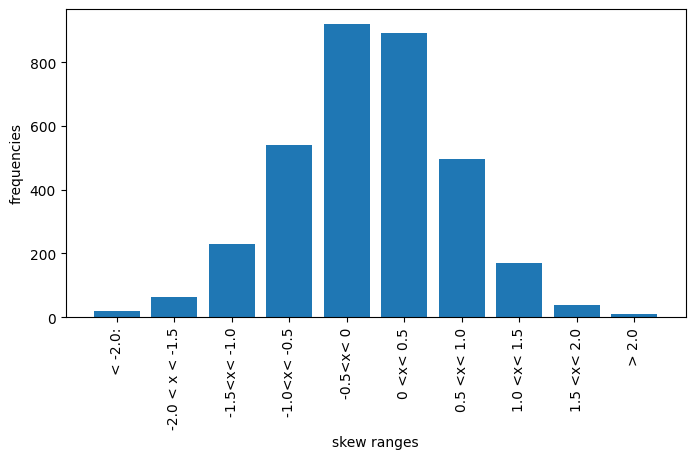

In [333]:
plt.figure(figsize=(8,4))
get_x = ['< -2.0:','-2.0 < x < -1.5','-1.5<x< -1.0','-1.0<x< -0.5', '-0.5<x< 0', '0 <x< 0.5','0.5 <x< 1.0',
        '1.0 <x< 1.5', '1.5 <x< 2.0', '> 2.0']
get_y = [18,64,231,541,921,893,496,171,38,10]
plt.bar(get_x, get_y)
plt.xticks(rotation = 90, ha = 'center')
plt.xlabel("skew ranges")
plt.ylabel("frequencies")
plt.show()

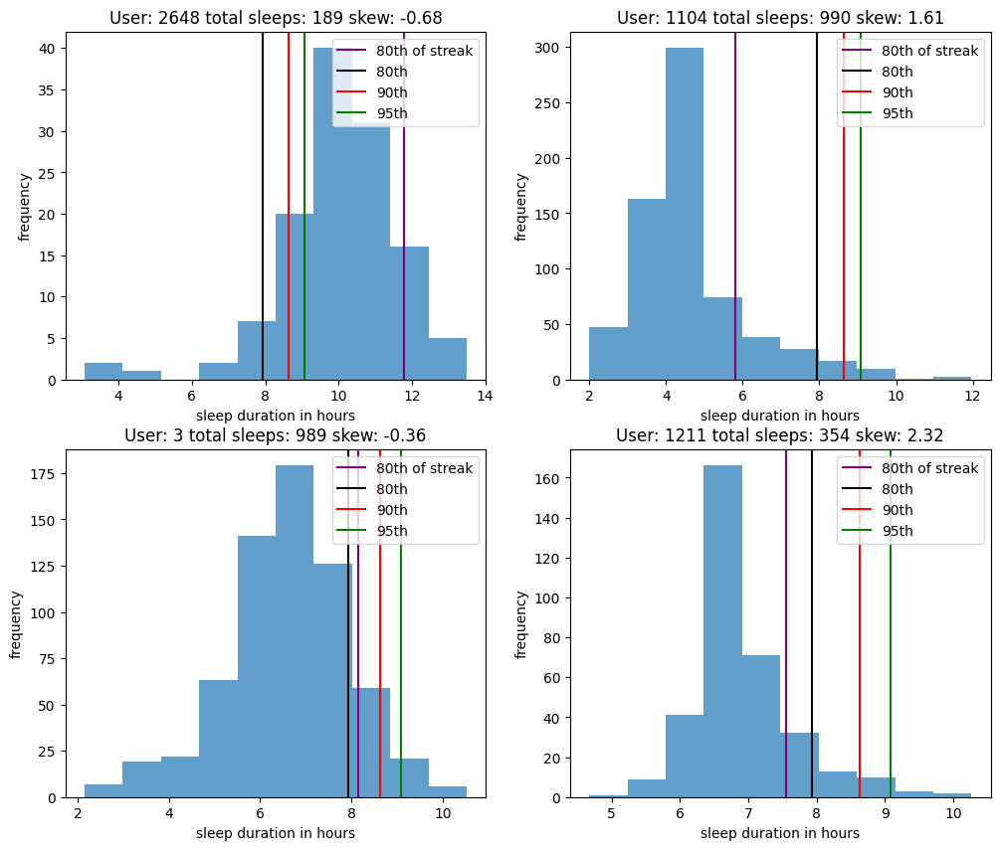

In [315]:
_id_list = [2648, 1104,3, 1211]
fig , axs = plt.subplots(2,2,figsize=(12,10))
axs = axs.flatten()
for i in range(len(_id_list)):
    _id = _id_list[i]

    data_len = len(sleep_sample[sleep_sample['user_id']== _id])
    _skewval = _skew[_skew['user_id']== _id]['sleep_duration_skew'].iloc[0]
    title_txt = "User: "+str(_id)+" total sleeps: "+str(data_len)+ " skew: "+str(np.round(_skewval,2))

    # values, base = np.histogram(PredictedVsActual_all2[PredictedVsActual_all2['user_id']==_id]['sleep_duration_round'])
#     cumulative = np.cumsum(values)
    axs[i].hist(PredictedVsActual_all2[PredictedVsActual_all2['user_id']==_id]['sleep_duration_round'],alpha = 0.7)
    axs[i].axvline(x=np.max(PredictedVsActual_all2[PredictedVsActual_all2['user_id']==_id]['catchup_sleep_length']),
               color='purple',label = '80th of streak')
    axs[i].axvline(x=_80th,color='black',label = '80th')
    axs[i].axvline(x=_90th,color='red', label = '90th')
    axs[i].axvline(x=_95th,color='green', label = '95th')
    axs[i].set_title(title_txt)
    axs[i].set_xlabel("sleep duration in hours")
    axs[i].set_ylabel("frequency")
    axs[i].legend(loc='upper right')
#     axs[i].setlegend()
plt.show()

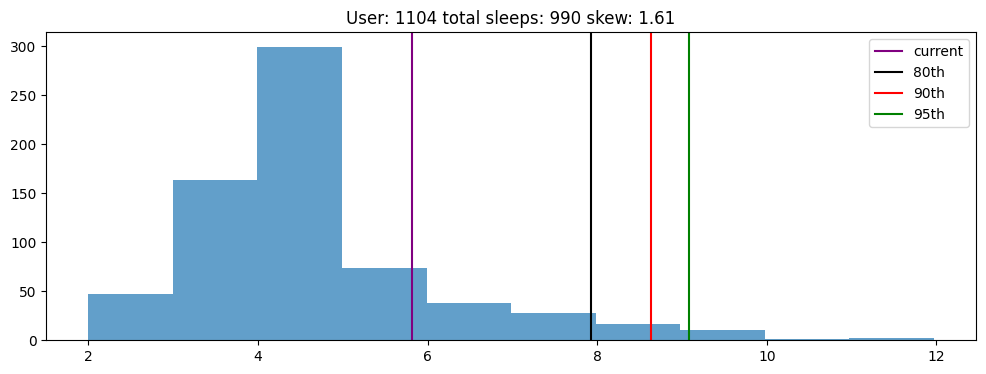

array([47.000000, 163.000000, 299.000000, 74.000000, 38.000000, 28.000000,
       17.000000, 10.000000, 1.000000, 2.000000])

In [316]:
_id =1104
data_len = len(sleep_sample[sleep_sample['user_id']== _id])
_skewval = _skew[_skew['user_id']== _id]['sleep_duration_skew'].iloc[0]
title_txt = "User: "+str(_id)+" total sleeps: "+str(data_len)+ " skew: "+str(np.round(_skewval,2))
plt.figure(figsize=(12,4))
cumulative = np.cumsum(values)
a = plt.hist(PredictedVsActual_all2[PredictedVsActual_all2['user_id']==_id]['sleep_duration_round'],alpha = 0.7)
plt.axvline(x=np.max(PredictedVsActual_all2[PredictedVsActual_all2['user_id']==_id]['catchup_sleep_length']),
           color='purple', label= "current")
plt.axvline(x=_80th,color='black',label = "80th")
plt.axvline(x=_90th,color='red',label = '90th')
plt.axvline(x=_95th,color='green', label = '95th')
plt.legend()
plt.title(title_txt)
# plt.plot(base[:-1],data_len-cumulative, c= 'green')
plt.show()
a[0]

In [317]:
## calculating 90th percentiles for all users:

user_list = list(PredictedVsActual_all2['user_id'].unique())
perc_list = []
for i in range(len(user_list)):
    _user_95th = sleep_sample[sleep_sample['user_id']== user_list[i]]['sleep_duration_round'].quantile(.9)
    perc_list.append(_user_95th)
len(perc_list)
new_catchup_95th_perc = pd.DataFrame(zip(user_list, perc_list))
new_catchup_95th_perc.columns= ['user_id','new_catchup_length']
new_catchup_95th_perc

,user_id,new_catchup_length
0,2,8.630
1,3,8.320
2,4,9.825
3,5,8.124
4,6,10.042
...,...,...
3356,3379,7.626
3357,3380,8.982
3358,3381,8.806
3359,3382,11.438


In [318]:
import numpy as np
PredictedVsActual_all2 = PredictedVsActual_all.copy()
# PredictedVsActual_all2 = PredictedVsActual_all2[PredictedVsActual_all2['user_id'] != 185]


In [319]:
# PredictedVsActual_all2.drop(columns={'new_catchup_length'},inplace=True)
PredictedVsActual_all2= PredictedVsActual_all2.merge(new_catchup_95th_perc,how='left',left_on='user_id',
                                                    right_on='user_id')

PredictedVsActual_all2['catchup_flag']= np.where(PredictedVsActual_all2['sleep_duration_round']>=
                                                 PredictedVsActual_all2['new_catchup_length'],1,0)

PredictedVsActual_all2['user_instance_date'] = PredictedVsActual_all2['user_id'].astype(str)+'-' + PredictedVsActual_all2['instance_id'].astype(str)+'-'+PredictedVsActual_all2['sleep_start_shift'].astype(str)
PredictedVsActual_all2.head()

,Unnamed: 0,sleep_start_shift,start_time_num_round,EstimatedSleepOnset_SW,MinBtwnPredAct_SW,sleep_duration_round,EstimatedSleepOnset_act,EstimatedSleepOnset_ph,EstimatedSleepOnset_SW_Ph_Act,Surplus_MinsBtwnEstActualOnset,instance_id,user_id,catchup_sleep_length,new_catchup_length,catchup_flag,user_instance_date
0,0,2017-01-15,24.75,24.55,-12.0,7.68,NaN,NaN,24.55,-12.0,0,2,7.68,8.63,0,2-0-2017-01-15
1,1,2017-01-16,24.50,24.30,-12.0,7.87,NaN,NaN,24.30,-12.0,0,2,7.68,8.63,0,2-0-2017-01-16
2,2,2017-01-17,24.75,24.30,-27.0,7.43,NaN,NaN,24.30,-27.0,0,2,7.68,8.63,0,2-0-2017-01-17
3,3,2017-01-18,24.25,24.30,3.0,7.95,NaN,NaN,24.30,3.0,0,2,7.68,8.63,0,2-0-2017-01-18
4,4,2017-01-19,25.25,24.30,-57.0,7.07,NaN,NaN,24.30,-57.0,0,2,7.68,8.63,0,2-0-2017-01-19


In [320]:
PredictedVsActual_all2[PredictedVsActual_all2['catchup_flag']==1]

,Unnamed: 0,sleep_start_shift,start_time_num_round,EstimatedSleepOnset_SW,MinBtwnPredAct_SW,sleep_duration_round,EstimatedSleepOnset_act,EstimatedSleepOnset_ph,EstimatedSleepOnset_SW_Ph_Act,Surplus_MinsBtwnEstActualOnset,instance_id,user_id,catchup_sleep_length,new_catchup_length,catchup_flag,user_instance_date
13,13,2017-01-28,25.00,25.05,3.0,9.47,NaN,NaN,25.05,3.0,0,2,7.68,8.630,1,2-0-2017-01-28
19,19,2017-02-03,25.50,25.05,-27.0,8.63,NaN,NaN,25.05,-27.0,0,2,7.68,8.630,1,2-0-2017-02-03
33,33,2017-02-17,26.75,25.30,-87.0,9.45,NaN,NaN,25.30,-87.0,0,2,7.68,8.630,1,2-0-2017-02-17
39,39,2017-02-23,21.75,23.55,108.0,9.15,NaN,NaN,23.55,108.0,0,2,7.68,8.630,1,2-0-2017-02-23
54,54,2017-03-10,26.00,31.30,318.0,9.90,NaN,NaN,31.30,318.0,0,2,7.68,8.630,1,2-0-2017-03-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1019083,56,2019-04-08,24.50,25.80,78.0,12.68,NaN,NaN,25.80,78.0,2,3382,11.12,11.438,1,3382-2-2019-04-08
1019086,59,2019-04-11,25.50,25.80,18.0,12.05,NaN,NaN,25.80,18.0,2,3382,11.12,11.438,1,3382-2-2019-04-11
1019107,14,2016-03-26,24.25,24.05,-12.0,7.58,NaN,NaN,24.05,-12.0,0,3383,6.46,7.460,1,3383-0-2016-03-26
1019132,7,2016-04-23,24.00,23.05,-57.0,8.28,NaN,NaN,23.05,-57.0,1,3383,6.43,7.460,1,3383-1-2016-04-23


## for before non catchup sleep - distribution

In [348]:
exclude_users = [1919,3355] #1919, 3355
z=0
before_catchup_sleep_surplus_arr = []
print("drawing samples for before catchup sleep distribution")
while z <1000:
#     print("z: ",z)
    catchup_instances = PredictedVsActual_all2[PredictedVsActual_all2['catchup_flag']==1]['user_instance_date']
    s = catchup_instances.sample(n=1)
    s = s.iloc[0]
#     print("chosen instance: ",s)

    _temp = PredictedVsActual_all2[PredictedVsActual_all2['user_instance_date']==s].reset_index()
    if np.max(_temp['Surplus_MinsBtwnEstActualOnset']) > 200:
        print("user skipped due to very skewed surplus at z: ",z, "user: ", _temp['user_id'].values[0],
             "max surplus: ", np.max(_temp['Surplus_MinsBtwnEstActualOnset']))
        continue
    else:
        get_user = _temp['user_id'].values[0]
    #     if get_user in exclude_users:
    #         print(get_user, " is an excluded user")
    #         z= z-1
    #         break
        get_instance = _temp['instance_id'].values[0]
        get_catchup_date = pd.to_datetime(_temp['sleep_start_shift'].values[0])
    #     print("user instance and date: ",get_user, get_instance, get_catchup_date)

        subset_sleeps = PredictedVsActual_all2[(PredictedVsActual_all2['user_id'] == get_user) & 
                                               (PredictedVsActual_all2['instance_id'] == get_instance) &
                                               (pd.to_datetime(PredictedVsActual_all2['sleep_start_shift']) <= get_catchup_date)]
        if len(subset_sleeps) >=8:
            dates_to_check_list = []
            for i in range(7):
                dates_to_check_list.append(get_catchup_date-pd.to_timedelta(i+1,unit='d'))
    #         print("Dates to check: ", dates_to_check_list )
            net_sleep_surplus = 0

            for i in range(len(dates_to_check_list)):
    #             print("checking for date: ",i, " ",dates_to_check_list[i])
                if subset_sleeps[
                    pd.to_datetime(subset_sleeps['sleep_start_shift']) == dates_to_check_list[i]]['catchup_flag'].values[0] == 0:
    #                 print("normal sleep")
                    add_surplus = subset_sleeps[
                        pd.to_datetime(subset_sleeps['sleep_start_shift']) == dates_to_check_list[i]]['Surplus_MinsBtwnEstActualOnset'].values[0]

                    net_sleep_surplus = net_sleep_surplus+np.round(add_surplus,2)
    #                 print("net sleep surplus after ",dates_to_check_list[i], " (normal) is: ",net_sleep_surplus,
    #                       " after adding ", np.round(add_surplus,2))
                else:
                    if i < 1: # if the previous sleep is also a catchup then ignore this sample
                        print("failed sample at z: ",z," user instance date: ",
                              get_user, get_instance, get_catchup_date)
    #                     z = z-1
    #                     print("catchup sleep")
    #                     print("net sleep surplus after ",dates_to_check_list[i], " (catchup) is: ",net_sleep_surplus)
                        break

                    elif (i >=1) &(i < 6):
                        before_catchup_sleep_surplus_arr.append(net_sleep_surplus)
    #                     print("appended value: ", net_sleep_surplus)
                        z+=1
                        if z%1 == 0:
                            print("samples drawn (premature termination) at z: ",z,"cond 2; user instance date",
                                 get_user, get_instance, get_catchup_date, " appended: ", net_sleep_surplus)
                        break
                    else:
                        before_catchup_sleep_surplus_arr.append(net_sleep_surplus)
    #                     print("appended value: ", net_sleep_surplus)
                        z+=1
                        if z%1 == 0:
                            print("samples drawn (full term) at z: ",z, "cond 3; user instance date",
                                 get_user, get_instance, get_catchup_date, " appended: ", net_sleep_surplus)

                if i ==6: # at the 7th date and it also is a NORMAL sleep
                    before_catchup_sleep_surplus_arr.append(net_sleep_surplus)
    #                 print("appended value: ", net_sleep_surplus)
                    z+=1
                    if z%1 == 0:
                        print("samples drawn (full term) at z: ",z, "cond 4; user instance date: ",
                                 get_user, get_instance, get_catchup_date, " appended: ", net_sleep_surplus)

    #     else:
    #         print("very short sleep run")


drawing samples for before catchup sleep distribution
failed sample at z:  0  user instance date:  2691 1 2017-06-02 00:00:00
failed sample at z:  0  user instance date:  2508 3 2017-08-03 00:00:00
samples drawn (full term) at z:  1 cond 3; user instance date 1104 10 2018-05-26 00:00:00  appended:  -762.0
samples drawn (full term) at z:  2 cond 4; user instance date:  1104 10 2018-05-26 00:00:00  appended:  -762.0
failed sample at z:  2  user instance date:  3124 2 2016-12-28 00:00:00
user skipped due to very skewed surplus at z:  2 user:  3275 max surplus:  1412.9999999999998
samples drawn (full term) at z:  3 cond 3; user instance date 755 4 2018-11-16 00:00:00  appended:  -237.0
samples drawn (full term) at z:  4 cond 4; user instance date:  755 4 2018-11-16 00:00:00  appended:  -237.0
samples drawn (premature termination) at z:  5 cond 2; user instance date 415 0 2016-02-04 00:00:00  appended:  -268.2
samples drawn (premature termination) at z:  6 cond 2; user instance date 2362 6 

failed sample at z:  41  user instance date:  2895 4 2018-02-12 00:00:00
failed sample at z:  41  user instance date:  2895 4 2017-12-03 00:00:00
failed sample at z:  41  user instance date:  2895 2 2017-03-04 00:00:00
samples drawn (premature termination) at z:  42 cond 2; user instance date 232 0 2016-01-29 00:00:00  appended:  -96.0
samples drawn (premature termination) at z:  43 cond 2; user instance date 755 2 2017-12-24 00:00:00  appended:  -117.0
failed sample at z:  43  user instance date:  2895 2 2017-04-02 00:00:00
user skipped due to very skewed surplus at z:  43 user:  3275 max surplus:  213.00000000000009
samples drawn (full term) at z:  44 cond 4; user instance date:  203 11 2018-10-07 00:00:00  appended:  -329.4
samples drawn (full term) at z:  45 cond 4; user instance date:  755 3 2018-07-27 00:00:00  appended:  -399.0
failed sample at z:  45  user instance date:  2213 1 2016-04-09 00:00:00
failed sample at z:  45  user instance date:  2895 2 2017-03-18 00:00:00
failed 

samples drawn (premature termination) at z:  86 cond 2; user instance date 284 3 2016-12-22 00:00:00  appended:  -330.0
samples drawn (premature termination) at z:  87 cond 2; user instance date 2362 2 2016-12-24 00:00:00  appended:  -162.0
failed sample at z:  87  user instance date:  2691 1 2017-03-11 00:00:00
user skipped due to very skewed surplus at z:  87 user:  3275 max surplus:  243.00000000000009
failed sample at z:  87  user instance date:  3124 0 2015-11-26 00:00:00
samples drawn (full term) at z:  88 cond 3; user instance date 67 2 2016-11-19 00:00:00  appended:  -312.0
samples drawn (full term) at z:  89 cond 4; user instance date:  67 2 2016-11-19 00:00:00  appended:  -312.0
samples drawn (premature termination) at z:  90 cond 2; user instance date 3124 0 2015-12-03 00:00:00  appended:  -27.0
samples drawn (premature termination) at z:  91 cond 2; user instance date 284 4 2017-05-21 00:00:00  appended:  -108.0
failed sample at z:  91  user instance date:  3124 0 2016-01-2

failed sample at z:  124  user instance date:  2895 1 2017-02-02 00:00:00
failed sample at z:  124  user instance date:  2691 0 2017-01-11 00:00:00
failed sample at z:  124  user instance date:  846 0 2017-04-15 00:00:00
samples drawn (full term) at z:  125 cond 3; user instance date 657 5 2017-06-10 00:00:00  appended:  -192.0
samples drawn (full term) at z:  126 cond 4; user instance date:  657 5 2017-06-10 00:00:00  appended:  -192.0
user skipped due to very skewed surplus at z:  126 user:  1211 max surplus:  692.9999999999998
failed sample at z:  126  user instance date:  3124 2 2016-12-26 00:00:00
user skipped due to very skewed surplus at z:  126 user:  2691 max surplus:  468.00000000000006
failed sample at z:  126  user instance date:  284 2 2016-11-08 00:00:00
failed sample at z:  126  user instance date:  3124 2 2017-03-16 00:00:00
failed sample at z:  126  user instance date:  3124 0 2016-01-16 00:00:00
samples drawn (premature termination) at z:  127 cond 2; user instance da

failed sample at z:  162  user instance date:  2691 0 2016-10-16 00:00:00
failed sample at z:  162  user instance date:  2691 1 2017-03-03 00:00:00
failed sample at z:  162  user instance date:  2691 1 2017-01-24 00:00:00
failed sample at z:  162  user instance date:  2895 1 2017-01-02 00:00:00
user skipped due to very skewed surplus at z:  162 user:  3275 max surplus:  1172.9999999999998
failed sample at z:  162  user instance date:  3124 0 2015-12-19 00:00:00
failed sample at z:  162  user instance date:  755 3 2018-07-28 00:00:00
failed sample at z:  162  user instance date:  2895 3 2017-07-20 00:00:00
failed sample at z:  162  user instance date:  3124 2 2016-12-23 00:00:00
user skipped due to very skewed surplus at z:  162 user:  2691 max surplus:  468.00000000000006
failed sample at z:  162  user instance date:  2895 3 2017-08-03 00:00:00
samples drawn (full term) at z:  163 cond 3; user instance date 730 1 2017-07-15 00:00:00  appended:  -312.0
samples drawn (full term) at z:  1

samples drawn (premature termination) at z:  201 cond 2; user instance date 2362 6 2018-01-12 00:00:00  appended:  -48.0
failed sample at z:  201  user instance date:  2895 0 2016-08-23 00:00:00
failed sample at z:  201  user instance date:  846 7 2018-10-07 00:00:00
samples drawn (premature termination) at z:  202 cond 2; user instance date 2691 1 2017-02-18 00:00:00  appended:  -27.0
samples drawn (premature termination) at z:  203 cond 2; user instance date 846 6 2018-07-13 00:00:00  appended:  -220.2
samples drawn (premature termination) at z:  204 cond 2; user instance date 3124 1 2016-05-31 00:00:00  appended:  -42.0
samples drawn (premature termination) at z:  205 cond 2; user instance date 284 3 2017-01-26 00:00:00  appended:  -219.0
samples drawn (premature termination) at z:  206 cond 2; user instance date 284 2 2016-11-03 00:00:00  appended:  -399.0
failed sample at z:  206  user instance date:  2895 3 2017-05-15 00:00:00
failed sample at z:  206  user instance date:  2508 0

failed sample at z:  246  user instance date:  2691 1 2017-02-02 00:00:00
failed sample at z:  246  user instance date:  2895 1 2016-10-17 00:00:00
user skipped due to very skewed surplus at z:  246 user:  730 max surplus:  273.00000000000006
samples drawn (premature termination) at z:  247 cond 2; user instance date 2508 3 2017-08-18 00:00:00  appended:  -450.0
samples drawn (full term) at z:  248 cond 4; user instance date:  2362 0 2016-05-04 00:00:00  appended:  -534.0
samples drawn (premature termination) at z:  249 cond 2; user instance date 755 4 2018-12-21 00:00:00  appended:  -120.0
user skipped due to very skewed surplus at z:  249 user:  2691 max surplus:  423.00000000000006
samples drawn (premature termination) at z:  250 cond 2; user instance date 3124 1 2016-05-09 00:00:00  appended:  -27.0
failed sample at z:  250  user instance date:  846 6 2018-08-18 00:00:00
samples drawn (full term) at z:  251 cond 4; user instance date:  2728 3 2016-08-17 00:00:00  appended:  -504.0


failed sample at z:  282  user instance date:  2691 1 2017-02-11 00:00:00
samples drawn (full term) at z:  283 cond 4; user instance date:  755 2 2018-01-27 00:00:00  appended:  -444.0
user skipped due to very skewed surplus at z:  283 user:  2691 max surplus:  468.00000000000006
samples drawn (premature termination) at z:  284 cond 2; user instance date 164 0 2016-02-13 00:00:00  appended:  -39.0
failed sample at z:  284  user instance date:  2691 0 2017-01-10 00:00:00
failed sample at z:  284  user instance date:  2895 3 2017-05-10 00:00:00
failed sample at z:  284  user instance date:  2895 2 2017-02-18 00:00:00
samples drawn (full term) at z:  285 cond 4; user instance date:  2508 5 2018-07-25 00:00:00  appended:  -969.0
samples drawn (premature termination) at z:  286 cond 2; user instance date 2468 1 2016-05-20 00:00:00  appended:  -1203.0
samples drawn (premature termination) at z:  287 cond 2; user instance date 2508 8 2019-02-27 00:00:00  appended:  -57.0
failed sample at z:  

samples drawn (premature termination) at z:  323 cond 2; user instance date 2508 4 2017-12-01 00:00:00  appended:  -76.8
samples drawn (full term) at z:  324 cond 4; user instance date:  1647 0 2017-08-08 00:00:00  appended:  -234.0
failed sample at z:  324  user instance date:  846 6 2018-07-21 00:00:00
failed sample at z:  324  user instance date:  2895 3 2017-08-08 00:00:00
failed sample at z:  324  user instance date:  3124 1 2016-07-03 00:00:00
samples drawn (full term) at z:  325 cond 4; user instance date:  1182 3 2016-10-21 00:00:00  appended:  -519.0
samples drawn (premature termination) at z:  326 cond 2; user instance date 755 4 2019-04-19 00:00:00  appended:  15.0
failed sample at z:  326  user instance date:  3124 2 2017-03-26 00:00:00
samples drawn (premature termination) at z:  327 cond 2; user instance date 2362 2 2016-12-22 00:00:00  appended:  -285.0
samples drawn (premature termination) at z:  328 cond 2; user instance date 2627 0 2015-10-10 00:00:00  appended:  -69.

user skipped due to very skewed surplus at z:  364 user:  284 max surplus:  213.00000000000009
failed sample at z:  364  user instance date:  2895 1 2017-01-21 00:00:00
samples drawn (full term) at z:  365 cond 4; user instance date:  755 4 2019-02-23 00:00:00  appended:  -429.0
samples drawn (premature termination) at z:  366 cond 2; user instance date 1104 7 2017-09-01 00:00:00  appended:  -375.0
failed sample at z:  366  user instance date:  2508 0 2016-03-26 00:00:00
failed sample at z:  366  user instance date:  2895 1 2017-01-09 00:00:00
samples drawn (premature termination) at z:  367 cond 2; user instance date 203 9 2018-05-18 00:00:00  appended:  -165.0
user skipped due to very skewed surplus at z:  367 user:  1924 max surplus:  213.00000000000009
samples drawn (full term) at z:  368 cond 3; user instance date 67 0 2016-06-11 00:00:00  appended:  -237.0
samples drawn (full term) at z:  369 cond 4; user instance date:  67 0 2016-06-11 00:00:00  appended:  -237.0
samples drawn (

samples drawn (full term) at z:  416 cond 3; user instance date 730 2 2017-12-02 00:00:00  appended:  508.2
samples drawn (full term) at z:  417 cond 4; user instance date:  730 2 2017-12-02 00:00:00  appended:  508.2
samples drawn (premature termination) at z:  418 cond 2; user instance date 755 4 2019-02-01 00:00:00  appended:  -75.0
failed sample at z:  418  user instance date:  203 9 2018-05-19 00:00:00
user skipped due to very skewed surplus at z:  418 user:  3124 max surplus:  348.00000000000006
samples drawn (premature termination) at z:  419 cond 2; user instance date 846 7 2018-09-03 00:00:00  appended:  -192.0
failed sample at z:  419  user instance date:  2895 2 2017-04-06 00:00:00
failed sample at z:  419  user instance date:  2895 3 2017-06-30 00:00:00
failed sample at z:  419  user instance date:  2691 0 2016-11-15 00:00:00
samples drawn (full term) at z:  420 cond 3; user instance date 755 4 2019-04-12 00:00:00  appended:  -192.0
samples drawn (full term) at z:  421 cond

samples drawn (premature termination) at z:  454 cond 2; user instance date 415 0 2016-02-10 00:00:00  appended:  -91.2
user skipped due to very skewed surplus at z:  454 user:  2691 max surplus:  438.00000000000006
samples drawn (premature termination) at z:  455 cond 2; user instance date 846 6 2018-07-27 00:00:00  appended:  -119.39999999999999
user skipped due to very skewed surplus at z:  455 user:  2895 max surplus:  348.00000000000006
samples drawn (premature termination) at z:  456 cond 2; user instance date 203 3 2016-11-26 00:00:00  appended:  -66.0
failed sample at z:  456  user instance date:  3124 0 2015-12-26 00:00:00
failed sample at z:  456  user instance date:  2508 6 2018-10-10 00:00:00
failed sample at z:  456  user instance date:  3124 1 2016-05-18 00:00:00
failed sample at z:  456  user instance date:  2508 8 2019-01-19 00:00:00
failed sample at z:  456  user instance date:  2895 4 2018-03-04 00:00:00
failed sample at z:  456  user instance date:  2895 1 2016-10-28

samples drawn (premature termination) at z:  488 cond 2; user instance date 2508 8 2019-03-04 00:00:00  appended:  -42.0
failed sample at z:  488  user instance date:  2895 2 2017-03-29 00:00:00
samples drawn (premature termination) at z:  489 cond 2; user instance date 1260 1 2016-04-18 00:00:00  appended:  -84.0
failed sample at z:  489  user instance date:  2895 4 2018-03-01 00:00:00
user skipped due to very skewed surplus at z:  489 user:  1211 max surplus:  737.9999999999998
failed sample at z:  489  user instance date:  2627 1 2015-12-26 00:00:00
samples drawn (premature termination) at z:  490 cond 2; user instance date 790 0 2017-02-12 00:00:00  appended:  -288.0
failed sample at z:  490  user instance date:  3124 1 2016-06-09 00:00:00
samples drawn (premature termination) at z:  491 cond 2; user instance date 2362 2 2016-11-22 00:00:00  appended:  -84.0
failed sample at z:  491  user instance date:  2508 6 2018-10-10 00:00:00
user skipped due to very skewed surplus at z:  491 

failed sample at z:  524  user instance date:  3124 2 2017-03-26 00:00:00
failed sample at z:  524  user instance date:  2895 1 2017-01-25 00:00:00
samples drawn (full term) at z:  525 cond 3; user instance date 755 2 2018-02-03 00:00:00  appended:  -237.0
samples drawn (full term) at z:  526 cond 4; user instance date:  755 2 2018-02-03 00:00:00  appended:  -237.0
failed sample at z:  526  user instance date:  2895 4 2018-03-21 00:00:00
failed sample at z:  526  user instance date:  2213 1 2016-03-26 00:00:00
failed sample at z:  526  user instance date:  2691 1 2017-05-01 00:00:00
failed sample at z:  526  user instance date:  2895 3 2017-06-07 00:00:00
samples drawn (full term) at z:  527 cond 4; user instance date:  67 2 2016-11-12 00:00:00  appended:  -579.0
failed sample at z:  527  user instance date:  846 5 2018-06-02 00:00:00
samples drawn (premature termination) at z:  528 cond 2; user instance date 3124 0 2015-11-09 00:00:00  appended:  28.2
failed sample at z:  528  user in

samples drawn (full term) at z:  564 cond 4; user instance date:  1136 1 2016-06-11 00:00:00  appended:  -324.0
failed sample at z:  564  user instance date:  2895 3 2017-05-11 00:00:00
failed sample at z:  564  user instance date:  3124 2 2017-03-08 00:00:00
failed sample at z:  564  user instance date:  2627 0 2015-09-26 00:00:00
failed sample at z:  564  user instance date:  2895 2 2017-02-23 00:00:00
failed sample at z:  564  user instance date:  2691 0 2016-11-20 00:00:00
user skipped due to very skewed surplus at z:  564 user:  2691 max surplus:  333.00000000000006
failed sample at z:  564  user instance date:  2895 1 2017-01-25 00:00:00
failed sample at z:  564  user instance date:  2895 1 2016-11-05 00:00:00
samples drawn (premature termination) at z:  565 cond 2; user instance date 203 1 2016-02-05 00:00:00  appended:  -210.0
failed sample at z:  565  user instance date:  2895 3 2017-06-20 00:00:00
failed sample at z:  565  user instance date:  755 2 2018-03-17 00:00:00
failed

samples drawn (premature termination) at z:  607 cond 2; user instance date 2508 8 2019-03-16 00:00:00  appended:  -144.0
samples drawn (premature termination) at z:  608 cond 2; user instance date 2508 0 2016-03-30 00:00:00  appended:  114.0
samples drawn (full term) at z:  609 cond 3; user instance date 2229 0 2016-07-01 00:00:00  appended:  -342.0
samples drawn (full term) at z:  610 cond 4; user instance date:  2229 0 2016-07-01 00:00:00  appended:  -342.0
failed sample at z:  610  user instance date:  3124 0 2015-12-18 00:00:00
samples drawn (full term) at z:  611 cond 3; user instance date 846 0 2017-04-29 00:00:00  appended:  1008.0
samples drawn (full term) at z:  612 cond 4; user instance date:  846 0 2017-04-29 00:00:00  appended:  1008.0
failed sample at z:  612  user instance date:  2895 1 2016-10-10 00:00:00
failed sample at z:  612  user instance date:  2895 3 2017-08-03 00:00:00
samples drawn (full term) at z:  613 cond 3; user instance date 284 7 2019-04-12 00:00:00  ap

failed sample at z:  655  user instance date:  2895 2 2017-04-13 00:00:00
samples drawn (premature termination) at z:  656 cond 2; user instance date 2508 0 2016-05-11 00:00:00  appended:  3.0
samples drawn (full term) at z:  657 cond 3; user instance date 2728 3 2016-07-16 00:00:00  appended:  -237.0
samples drawn (full term) at z:  658 cond 4; user instance date:  2728 3 2016-07-16 00:00:00  appended:  -237.0
failed sample at z:  658  user instance date:  284 2 2016-10-05 00:00:00
failed sample at z:  658  user instance date:  2508 8 2019-02-10 00:00:00
failed sample at z:  658  user instance date:  2895 1 2016-12-26 00:00:00
failed sample at z:  658  user instance date:  1104 0 2015-11-14 00:00:00
samples drawn (premature termination) at z:  659 cond 2; user instance date 2691 0 2016-10-26 00:00:00  appended:  -72.0
user skipped due to very skewed surplus at z:  659 user:  3124 max surplus:  348.00000000000006
user skipped due to very skewed surplus at z:  659 user:  2691 max surplu

samples drawn (full term) at z:  694 cond 4; user instance date:  2454 0 2016-11-20 00:00:00  appended:  -534.0
failed sample at z:  694  user instance date:  3124 1 2016-06-29 00:00:00
samples drawn (premature termination) at z:  695 cond 2; user instance date 284 7 2019-03-20 00:00:00  appended:  -438.0
failed sample at z:  695  user instance date:  2895 3 2017-08-03 00:00:00
samples drawn (full term) at z:  696 cond 3; user instance date 730 1 2017-06-24 00:00:00  appended:  -237.0
samples drawn (full term) at z:  697 cond 4; user instance date:  730 1 2017-06-24 00:00:00  appended:  -237.0
user skipped due to very skewed surplus at z:  697 user:  2691 max surplus:  423.00000000000006
failed sample at z:  697  user instance date:  2895 4 2018-02-23 00:00:00
samples drawn (full term) at z:  698 cond 4; user instance date:  203 7 2017-09-30 00:00:00  appended:  -384.0
user skipped due to very skewed surplus at z:  698 user:  3124 max surplus:  303.00000000000006
user skipped due to ve

failed sample at z:  738  user instance date:  3124 0 2016-01-22 00:00:00
failed sample at z:  738  user instance date:  2895 2 2017-04-13 00:00:00
user skipped due to very skewed surplus at z:  738 user:  2691 max surplus:  468.00000000000006
failed sample at z:  738  user instance date:  3124 2 2017-02-16 00:00:00
failed sample at z:  738  user instance date:  2895 1 2016-11-17 00:00:00
failed sample at z:  738  user instance date:  2895 1 2016-12-18 00:00:00
failed sample at z:  738  user instance date:  3124 2 2017-01-04 00:00:00
failed sample at z:  738  user instance date:  3124 0 2015-12-08 00:00:00
samples drawn (premature termination) at z:  739 cond 2; user instance date 2508 3 2017-08-09 00:00:00  appended:  -166.8
user skipped due to very skewed surplus at z:  739 user:  2895 max surplus:  348.00000000000006
samples drawn (premature termination) at z:  740 cond 2; user instance date 2468 2 2016-08-29 00:00:00  appended:  -159.0
failed sample at z:  740  user instance date: 

failed sample at z:  770  user instance date:  3124 0 2016-01-27 00:00:00
user skipped due to very skewed surplus at z:  770 user:  3275 max surplus:  857.9999999999998
failed sample at z:  770  user instance date:  2691 0 2016-11-17 00:00:00
failed sample at z:  770  user instance date:  2508 0 2016-03-21 00:00:00
samples drawn (full term) at z:  771 cond 4; user instance date:  203 11 2018-08-04 00:00:00  appended:  -434.4
failed sample at z:  771  user instance date:  2508 7 2018-11-22 00:00:00
failed sample at z:  771  user instance date:  2895 3 2017-06-17 00:00:00
failed sample at z:  771  user instance date:  3124 0 2016-03-03 00:00:00
failed sample at z:  771  user instance date:  2895 1 2016-11-08 00:00:00
samples drawn (premature termination) at z:  772 cond 2; user instance date 2468 2 2016-08-26 00:00:00  appended:  -180.0
failed sample at z:  772  user instance date:  846 4 2018-02-24 00:00:00
samples drawn (premature termination) at z:  773 cond 2; user instance date 2468

failed sample at z:  808  user instance date:  2508 6 2018-08-21 00:00:00
samples drawn (full term) at z:  809 cond 3; user instance date 755 3 2018-06-09 00:00:00  appended:  -462.0
samples drawn (full term) at z:  810 cond 4; user instance date:  755 3 2018-06-09 00:00:00  appended:  -462.0
user skipped due to very skewed surplus at z:  810 user:  3275 max surplus:  632.9999999999998
samples drawn (full term) at z:  811 cond 4; user instance date:  755 3 2018-07-27 00:00:00  appended:  -399.0
failed sample at z:  811  user instance date:  2895 4 2018-03-02 00:00:00
samples drawn (premature termination) at z:  812 cond 2; user instance date 2508 2 2016-10-14 00:00:00  appended:  -237.0
samples drawn (premature termination) at z:  813 cond 2; user instance date 2213 1 2016-04-08 00:00:00  appended:  -273.0
samples drawn (full term) at z:  814 cond 4; user instance date:  3337 0 2016-01-31 00:00:00  appended:  -459.0
samples drawn (full term) at z:  815 cond 4; user instance date:  1182

samples drawn (full term) at z:  851 cond 4; user instance date:  790 0 2017-02-07 00:00:00  appended:  -699.0
failed sample at z:  851  user instance date:  3124 2 2016-12-27 00:00:00
samples drawn (full term) at z:  852 cond 4; user instance date:  2728 3 2016-10-09 00:00:00  appended:  -399.0
failed sample at z:  852  user instance date:  2895 4 2018-01-03 00:00:00
failed sample at z:  852  user instance date:  2895 3 2017-05-17 00:00:00
samples drawn (premature termination) at z:  853 cond 2; user instance date 3124 0 2015-11-16 00:00:00  appended:  -12.0
failed sample at z:  853  user instance date:  2895 1 2016-10-14 00:00:00
samples drawn (full term) at z:  854 cond 3; user instance date 2213 2 2016-08-27 00:00:00  appended:  -252.0
samples drawn (full term) at z:  855 cond 4; user instance date:  2213 2 2016-08-27 00:00:00  appended:  -252.0
failed sample at z:  855  user instance date:  3124 0 2015-11-20 00:00:00
failed sample at z:  855  user instance date:  3124 0 2016-01-11

user skipped due to very skewed surplus at z:  897 user:  3275 max surplus:  273.00000000000006
user skipped due to very skewed surplus at z:  897 user:  3275 max surplus:  992.9999999999998
failed sample at z:  897  user instance date:  2691 1 2017-04-21 00:00:00
failed sample at z:  897  user instance date:  2895 3 2017-08-15 00:00:00
samples drawn (full term) at z:  898 cond 3; user instance date 2728 3 2016-07-16 00:00:00  appended:  -237.0
samples drawn (full term) at z:  899 cond 4; user instance date:  2728 3 2016-07-16 00:00:00  appended:  -237.0
failed sample at z:  899  user instance date:  284 3 2017-01-02 00:00:00
failed sample at z:  899  user instance date:  2627 0 2015-10-03 00:00:00
failed sample at z:  899  user instance date:  3124 1 2016-04-24 00:00:00
failed sample at z:  899  user instance date:  2691 1 2017-05-27 00:00:00
samples drawn (full term) at z:  900 cond 4; user instance date:  232 1 2016-08-24 00:00:00  appended:  -444.0
user skipped due to very skewed s

failed sample at z:  933  user instance date:  2895 2 2017-04-19 00:00:00
samples drawn (premature termination) at z:  934 cond 2; user instance date 2508 0 2016-04-07 00:00:00  appended:  72.0
failed sample at z:  934  user instance date:  2895 4 2018-01-06 00:00:00
failed sample at z:  934  user instance date:  2691 1 2017-08-15 00:00:00
failed sample at z:  934  user instance date:  2039 0 2017-01-21 00:00:00
failed sample at z:  934  user instance date:  2895 3 2017-05-30 00:00:00
failed sample at z:  934  user instance date:  2508 0 2016-04-21 00:00:00
samples drawn (full term) at z:  935 cond 4; user instance date:  203 6 2017-06-09 00:00:00  appended:  -564.0
samples drawn (premature termination) at z:  936 cond 2; user instance date 2508 5 2018-07-27 00:00:00  appended:  -87.0
failed sample at z:  936  user instance date:  2691 0 2016-12-18 00:00:00
user skipped due to very skewed surplus at z:  936 user:  2691 max surplus:  393.00000000000006
samples drawn (full term) at z:  9

failed sample at z:  977  user instance date:  2691 1 2017-05-26 00:00:00
user skipped due to very skewed surplus at z:  977 user:  2691 max surplus:  483.00000000000006
failed sample at z:  977  user instance date:  2895 0 2016-09-07 00:00:00
failed sample at z:  977  user instance date:  2691 0 2016-12-10 00:00:00
failed sample at z:  977  user instance date:  3124 0 2016-02-16 00:00:00
user skipped due to very skewed surplus at z:  977 user:  2691 max surplus:  423.00000000000006
failed sample at z:  977  user instance date:  2895 2 2017-04-02 00:00:00
failed sample at z:  977  user instance date:  2895 2 2017-03-18 00:00:00
samples drawn (premature termination) at z:  978 cond 2; user instance date 846 0 2017-05-12 00:00:00  appended:  45.0
failed sample at z:  978  user instance date:  846 6 2018-08-04 00:00:00
failed sample at z:  978  user instance date:  2895 2 2017-03-22 00:00:00
samples drawn (full term) at z:  979 cond 4; user instance date:  2508 6 2018-09-12 00:00:00  appe

In [354]:
# print(before_catchup_sleep_surplus_arr)
# 203 12 2019-05-24
PredictedVsActual_all2[(PredictedVsActual_all2['user_id']== 3275) & (PredictedVsActual_all2['instance_id']== 5) & 
                      (pd.to_datetime(PredictedVsActual_all2['sleep_start_shift'])<= '2019-01-12') &
                      (pd.to_datetime(PredictedVsActual_all2['sleep_start_shift']) >= 
                       pd.to_datetime('2019-01-12')-pd.to_timedelta(7,unit='d'))][
    ['sleep_start_shift','catchup_flag','start_time_num_round', 'EstimatedSleepOnset_SW_Ph_Act',
     'Surplus_MinsBtwnEstActualOnset']]
# np.max(temp['Surplus_MinsBtwnEstActualOnset'])

,sleep_start_shift,catchup_flag,start_time_num_round,EstimatedSleepOnset_SW_Ph_Act,Surplus_MinsBtwnEstActualOnset
983221,2019-01-05,0,25.00,27.80,168.0
983222,2019-01-06,0,23.00,28.55,333.0
983223,2019-01-07,0,24.25,28.55,258.0
983224,2019-01-08,0,22.75,28.55,348.0
983225,2019-01-09,0,24.25,28.30,243.0
983226,2019-01-10,0,23.50,28.30,288.0
983227,2019-01-11,0,25.00,28.05,183.0
983228,2019-01-12,1,25.50,28.55,183.0


In [ ]:
np.histogram(before_catchup_sleep_surplus_arr)

In [ ]:
np.histogram(before_catchup_sleep_surplus_arr)

In [351]:
for s in range(len(before_catchup_sleep_surplus_arr)):
    if before_catchup_sleep_surplus_arr[s] > 1400:
        print(s)

52
92
123
351
473
474
534


## For non catchup distribution

In [327]:
exclude_users = [1919,3355] #1919, 3355
z=0
before_noncatchup_sleep_surplus_arr = []
print("drawing samples for before non catchup sleep distribution")
while z <1000:
#     print("z: ",z)
    noncatchup_instances = PredictedVsActual_all2[PredictedVsActual_all2['catchup_flag']==0]['user_instance_date']
    s = noncatchup_instances.sample(n=1)
    s = s.iloc[0]
#     print("chosen instance: ",s)

    _temp = PredictedVsActual_all2[PredictedVsActual_all2['user_instance_date']==s].reset_index()
    if np.max(_temp['Surplus_MinsBtwnEstActualOnset']) > 200:
#         print("user skipped due to very skewed surplus")
        continue
    get_user = _temp['user_id'].values[0]
#     if get_user in exclude_users:
#         print(get_user, " is an excluded user")
#         z= z-1
#         break
    get_instance = _temp['instance_id'].values[0]
    get_catchup_date = pd.to_datetime(_temp['sleep_start_shift'].values[0])
#     print("user instance and date: ",get_user, get_instance, get_catchup_date)

    subset_sleeps = PredictedVsActual_all2[(PredictedVsActual_all2['user_id'] == get_user) & 
                                           (PredictedVsActual_all2['instance_id'] == get_instance) &
                                           (pd.to_datetime(PredictedVsActual_all2['sleep_start_shift']) <= get_catchup_date)]
    if len(subset_sleeps) >=8:
        dates_to_check_list = []
        for i in range(7):
            dates_to_check_list.append(get_catchup_date-pd.to_timedelta(i+1,unit='d'))
#         print("Dates to check: ", dates_to_check_list )
        net_sleep_surplus = 0

        for i in range(len(dates_to_check_list)):
#             print("checking for date: ",i, " ",dates_to_check_list[i])
            if subset_sleeps[
                pd.to_datetime(subset_sleeps['sleep_start_shift']) == dates_to_check_list[i]]['catchup_flag'].values[0] == 0:
#                 print("normal sleep")
                add_surplus = subset_sleeps[
                    pd.to_datetime(subset_sleeps['sleep_start_shift']) == dates_to_check_list[i]]['Surplus_MinsBtwnEstActualOnset'].values[0]

                net_sleep_surplus = net_sleep_surplus+np.round(add_surplus,2)
#                 print("net sleep surplus after ",dates_to_check_list[i], " (normal) is: ",net_sleep_surplus,
#                       " after adding ", np.round(add_surplus,2))
            else:
                if i < 1: # if the previous sleep is also a catchup then ignore this sample
                    print("failed sample at z: ",z)
#                     z = z-1
#                     print("catchup sleep")
#                     print("net sleep surplus after ",dates_to_check_list[i], " (catchup) is: ",net_sleep_surplus)
                    break
                
                elif (i >=1) &(i < 6):
                    before_noncatchup_sleep_surplus_arr.append(net_sleep_surplus)
#                     print("appended value: ", net_sleep_surplus)
                    z+=1
                    if z%1 == 0:
                        print("samples drawn (premature termination) at z: ",z,"cond 2; user instance date",
                             get_user, get_instance, get_catchup_date," appended: ", net_sleep_surplus)
                    break
                else:
                    before_noncatchup_sleep_surplus_arr.append(net_sleep_surplus)
#                     print("appended value: ", net_sleep_surplus)
                    z+=1
                    if z%1 == 0:
                        print("samples drawn (full term) at z: ",z, "cond 3; user instance date",
                             get_user, get_instance, get_catchup_date, " appended: ", net_sleep_surplus)

            if i ==6: # at the 7th date and it also is a NORMAL sleep
                before_noncatchup_sleep_surplus_arr.append(net_sleep_surplus)
#                 print("appended value: ", net_sleep_surplus)
                z+=1
                if z%1 == 0:
                    print("samples drawn (full term) at z: ",z, "cond 4; user instance date",
                             get_user, get_instance, get_catchup_date," appended: ", net_sleep_surplus)
                
#     else:
#         print("very short sleep run")


drawing samples for before non catchup sleep distribution
samples drawn (full term) at z:  1 cond 4; user instance date 2362 6 2017-12-31 00:00:00  appended:  -654.0
samples drawn (full term) at z:  2 cond 4; user instance date 2595 1 2016-03-24 00:00:00  appended:  -174.0
samples drawn (full term) at z:  3 cond 4; user instance date 1533 0 2017-03-07 00:00:00  appended:  -699.0
samples drawn (full term) at z:  4 cond 4; user instance date 2468 2 2016-08-12 00:00:00  appended:  -144.0
samples drawn (premature termination) at z:  5 cond 2; user instance date 203 11 2018-10-22 00:00:00  appended:  -22.2
samples drawn (premature termination) at z:  6 cond 2; user instance date 755 4 2019-02-19 00:00:00  appended:  -186.0
samples drawn (premature termination) at z:  7 cond 2; user instance date 1211 0 2016-02-18 00:00:00  appended:  112.8
samples drawn (premature termination) at z:  8 cond 2; user instance date 755 4 2018-12-11 00:00:00  appended:  -54.0
samples drawn (premature terminatio

samples drawn (full term) at z:  75 cond 4; user instance date 203 11 2018-11-09 00:00:00  appended:  -529.8
samples drawn (full term) at z:  76 cond 4; user instance date 2348 0 2015-12-12 00:00:00  appended:  -543.6
samples drawn (full term) at z:  77 cond 4; user instance date 67 2 2016-11-11 00:00:00  appended:  -474.0
samples drawn (full term) at z:  78 cond 4; user instance date 755 4 2019-03-18 00:00:00  appended:  -474.0
failed sample at z:  78
samples drawn (full term) at z:  79 cond 4; user instance date 1260 1 2016-07-04 00:00:00  appended:  -984.0
samples drawn (premature termination) at z:  80 cond 2; user instance date 203 1 2016-01-29 00:00:00  appended:  -210.0
samples drawn (full term) at z:  81 cond 4; user instance date 1417 1 2016-03-11 00:00:00  appended:  -534.0
samples drawn (premature termination) at z:  82 cond 2; user instance date 284 6 2018-03-12 00:00:00  appended:  -414.0
samples drawn (full term) at z:  83 cond 4; user instance date 2595 2 2017-03-23 00:0

samples drawn (premature termination) at z:  152 cond 2; user instance date 1104 0 2015-12-02 00:00:00  appended:  -276.0
samples drawn (full term) at z:  153 cond 4; user instance date 2039 2 2017-07-06 00:00:00  appended:  -564.0
samples drawn (premature termination) at z:  154 cond 2; user instance date 657 5 2017-06-06 00:00:00  appended:  -24.0
samples drawn (premature termination) at z:  155 cond 2; user instance date 755 4 2018-12-05 00:00:00  appended:  -243.0
samples drawn (premature termination) at z:  156 cond 2; user instance date 1182 5 2017-03-15 00:00:00  appended:  -198.0
samples drawn (full term) at z:  157 cond 4; user instance date 2595 2 2016-12-24 00:00:00  appended:  -69.0
samples drawn (full term) at z:  158 cond 4; user instance date 1104 1 2016-03-10 00:00:00  appended:  -714.0
samples drawn (premature termination) at z:  159 cond 2; user instance date 1104 4 2016-09-26 00:00:00  appended:  -12.0
samples drawn (full term) at z:  160 cond 4; user instance date 1

failed sample at z:  225
samples drawn (premature termination) at z:  226 cond 2; user instance date 203 9 2018-05-30 00:00:00  appended:  -183.0
samples drawn (full term) at z:  227 cond 4; user instance date 67 0 2016-06-02 00:00:00  appended:  -444.0
samples drawn (premature termination) at z:  228 cond 2; user instance date 203 7 2017-10-05 00:00:00  appended:  -318.0
samples drawn (full term) at z:  229 cond 4; user instance date 2628 3 2016-12-27 00:00:00  appended:  -609.0
samples drawn (full term) at z:  230 cond 3; user instance date 755 3 2018-06-22 00:00:00  appended:  -282.0
samples drawn (full term) at z:  231 cond 4; user instance date 755 3 2018-06-22 00:00:00  appended:  -282.0
samples drawn (full term) at z:  232 cond 4; user instance date 2454 0 2016-11-16 00:00:00  appended:  -729.0
samples drawn (premature termination) at z:  233 cond 2; user instance date 846 5 2018-05-22 00:00:00  appended:  -84.0
samples drawn (full term) at z:  234 cond 4; user instance date 203

samples drawn (full term) at z:  309 cond 4; user instance date 2628 2 2016-10-05 00:00:00  appended:  -789.0
samples drawn (premature termination) at z:  310 cond 2; user instance date 755 0 2017-06-15 00:00:00  appended:  -123.0
samples drawn (full term) at z:  311 cond 4; user instance date 1211 2 2016-08-22 00:00:00  appended:  -279.0
failed sample at z:  311
samples drawn (premature termination) at z:  312 cond 2; user instance date 1104 10 2018-05-25 00:00:00  appended:  -600.0
samples drawn (full term) at z:  313 cond 4; user instance date 730 3 2018-05-02 00:00:00  appended:  -444.0
samples drawn (premature termination) at z:  314 cond 2; user instance date 203 7 2017-09-25 00:00:00  appended:  -189.0
samples drawn (full term) at z:  315 cond 4; user instance date 1417 0 2016-02-01 00:00:00  appended:  -429.0
samples drawn (full term) at z:  316 cond 4; user instance date 67 2 2017-01-10 00:00:00  appended:  -354.0
samples drawn (full term) at z:  317 cond 4; user instance date

samples drawn (premature termination) at z:  383 cond 2; user instance date 2728 1 2015-10-18 00:00:00  appended:  -112.2
samples drawn (premature termination) at z:  384 cond 2; user instance date 1104 8 2018-02-05 00:00:00  appended:  -159.0
samples drawn (premature termination) at z:  385 cond 2; user instance date 203 1 2016-03-07 00:00:00  appended:  -189.0
samples drawn (full term) at z:  386 cond 4; user instance date 3275 2 2017-08-25 00:00:00  appended:  -264.0
failed sample at z:  386
samples drawn (full term) at z:  387 cond 3; user instance date 2728 3 2016-09-03 00:00:00  appended:  -237.0
samples drawn (full term) at z:  388 cond 4; user instance date 2728 3 2016-09-03 00:00:00  appended:  -237.0
samples drawn (full term) at z:  389 cond 4; user instance date 67 3 2017-02-17 00:00:00  appended:  -384.0
samples drawn (premature termination) at z:  390 cond 2; user instance date 284 4 2017-04-20 00:00:00  appended:  60.0
samples drawn (full term) at z:  391 cond 4; user ins

samples drawn (premature termination) at z:  462 cond 2; user instance date 1647 3 2018-10-01 00:00:00  appended:  -600.0
samples drawn (premature termination) at z:  463 cond 2; user instance date 2508 5 2018-06-24 00:00:00  appended:  -541.2
samples drawn (premature termination) at z:  464 cond 2; user instance date 755 4 2019-04-09 00:00:00  appended:  -111.0
failed sample at z:  464
samples drawn (full term) at z:  465 cond 4; user instance date 1924 4 2017-07-22 00:00:00  appended:  1251.0
samples drawn (full term) at z:  466 cond 4; user instance date 1647 3 2018-10-05 00:00:00  appended:  -684.0
failed sample at z:  466
samples drawn (premature termination) at z:  467 cond 2; user instance date 657 2 2016-12-01 00:00:00  appended:  -333.0
samples drawn (full term) at z:  468 cond 4; user instance date 67 2 2017-01-10 00:00:00  appended:  -354.0
samples drawn (premature termination) at z:  469 cond 2; user instance date 67 3 2017-02-24 00:00:00  appended:  -270.0
samples drawn (f

samples drawn (full term) at z:  540 cond 4; user instance date 1260 1 2016-04-14 00:00:00  appended:  -459.0
samples drawn (premature termination) at z:  541 cond 2; user instance date 3337 0 2016-01-04 00:00:00  appended:  -9.0
failed sample at z:  541
samples drawn (premature termination) at z:  542 cond 2; user instance date 164 0 2016-02-17 00:00:00  appended:  -201.0
samples drawn (full term) at z:  543 cond 4; user instance date 297 1 2015-09-05 00:00:00  appended:  -624.0
failed sample at z:  543
samples drawn (full term) at z:  544 cond 4; user instance date 2728 3 2016-08-08 00:00:00  appended:  -324.0
failed sample at z:  544
samples drawn (full term) at z:  545 cond 4; user instance date 2595 2 2017-05-22 00:00:00  appended:  -114.0
samples drawn (full term) at z:  546 cond 3; user instance date 3337 1 2016-04-02 00:00:00  appended:  -357.0
samples drawn (full term) at z:  547 cond 4; user instance date 3337 1 2016-04-02 00:00:00  appended:  -357.0
samples drawn (premature 

samples drawn (full term) at z:  615 cond 4; user instance date 203 2 2016-06-28 00:00:00  appended:  -519.0
samples drawn (full term) at z:  616 cond 4; user instance date 2595 1 2016-03-27 00:00:00  appended:  -99.0
samples drawn (full term) at z:  617 cond 4; user instance date 1104 7 2017-10-06 00:00:00  appended:  -759.0
samples drawn (premature termination) at z:  618 cond 2; user instance date 1417 0 2016-02-14 00:00:00  appended:  -12.0
failed sample at z:  618
samples drawn (premature termination) at z:  619 cond 2; user instance date 67 2 2016-12-21 00:00:00  appended:  -99.0
samples drawn (full term) at z:  620 cond 4; user instance date 2468 4 2016-11-06 00:00:00  appended:  -324.0
failed sample at z:  620
samples drawn (full term) at z:  621 cond 4; user instance date 1601 0 2017-09-28 00:00:00  appended:  -579.0
samples drawn (premature termination) at z:  622 cond 2; user instance date 2039 0 2016-11-03 00:00:00  appended:  -168.0
samples drawn (full term) at z:  623 con

samples drawn (full term) at z:  685 cond 4; user instance date 67 3 2017-02-12 00:00:00  appended:  -399.0
samples drawn (full term) at z:  686 cond 3; user instance date 2454 0 2016-12-05 00:00:00  appended:  -462.0
samples drawn (full term) at z:  687 cond 4; user instance date 2454 0 2016-12-05 00:00:00  appended:  -462.0
samples drawn (premature termination) at z:  688 cond 2; user instance date 755 4 2019-02-14 00:00:00  appended:  9.0
samples drawn (premature termination) at z:  689 cond 2; user instance date 203 10 2018-07-18 00:00:00  appended:  -378.0
samples drawn (premature termination) at z:  690 cond 2; user instance date 2468 0 2016-02-06 00:00:00  appended:  -120.0
samples drawn (full term) at z:  691 cond 3; user instance date 297 2 2016-04-09 00:00:00  appended:  -417.0
samples drawn (full term) at z:  692 cond 4; user instance date 297 2 2016-04-09 00:00:00  appended:  -417.0
samples drawn (full term) at z:  693 cond 4; user instance date 2039 1 2017-04-18 00:00:00  

samples drawn (full term) at z:  763 cond 4; user instance date 760 2 2016-09-06 00:00:00  appended:  -519.0
failed sample at z:  763
samples drawn (premature termination) at z:  764 cond 2; user instance date 284 2 2016-10-03 00:00:00  appended:  -57.0
samples drawn (full term) at z:  765 cond 4; user instance date 730 2 2018-01-01 00:00:00  appended:  431.4
samples drawn (full term) at z:  766 cond 4; user instance date 2728 3 2016-04-13 00:00:00  appended:  -258.6
samples drawn (premature termination) at z:  767 cond 2; user instance date 1417 0 2016-02-07 00:00:00  appended:  -159.0
samples drawn (full term) at z:  768 cond 4; user instance date 2595 3 2017-06-18 00:00:00  appended:  -69.0
samples drawn (premature termination) at z:  769 cond 2; user instance date 203 4 2017-03-22 00:00:00  appended:  -258.0
samples drawn (full term) at z:  770 cond 4; user instance date 2628 6 2017-05-27 00:00:00  appended:  -294.0
samples drawn (premature termination) at z:  771 cond 2; user inst

samples drawn (premature termination) at z:  837 cond 2; user instance date 2362 6 2017-12-25 00:00:00  appended:  -57.0
samples drawn (premature termination) at z:  838 cond 2; user instance date 1104 0 2015-11-19 00:00:00  appended:  -288.0
samples drawn (premature termination) at z:  839 cond 2; user instance date 755 0 2017-09-04 00:00:00  appended:  3.0
failed sample at z:  839
samples drawn (premature termination) at z:  840 cond 2; user instance date 755 4 2018-12-06 00:00:00  appended:  -270.0
samples drawn (full term) at z:  841 cond 4; user instance date 1901 0 2015-09-13 00:00:00  appended:  -549.0
samples drawn (full term) at z:  842 cond 4; user instance date 755 3 2018-06-27 00:00:00  appended:  -489.0
samples drawn (full term) at z:  843 cond 4; user instance date 1260 1 2016-04-14 00:00:00  appended:  -459.0
samples drawn (full term) at z:  844 cond 4; user instance date 1211 0 2015-12-30 00:00:00  appended:  -634.2
samples drawn (full term) at z:  845 cond 4; user inst

samples drawn (premature termination) at z:  913 cond 2; user instance date 2728 3 2016-05-20 00:00:00  appended:  79.8
samples drawn (premature termination) at z:  914 cond 2; user instance date 67 2 2016-11-18 00:00:00  appended:  -270.0
samples drawn (full term) at z:  915 cond 3; user instance date 755 4 2018-10-14 00:00:00  appended:  -477.0
samples drawn (full term) at z:  916 cond 4; user instance date 755 4 2018-10-14 00:00:00  appended:  -477.0
samples drawn (full term) at z:  917 cond 4; user instance date 2628 0 2016-02-16 00:00:00  appended:  -534.0
samples drawn (full term) at z:  918 cond 4; user instance date 2832 0 2017-05-15 00:00:00  appended:  -384.0
samples drawn (full term) at z:  919 cond 4; user instance date 760 0 2015-12-17 00:00:00  appended:  -544.1999999999999
samples drawn (premature termination) at z:  920 cond 2; user instance date 1136 1 2016-08-04 00:00:00  appended:  -468.0
samples drawn (full term) at z:  921 cond 4; user instance date 2362 4 2017-07-

samples drawn (full term) at z:  988 cond 4; user instance date 284 7 2019-05-19 00:00:00  appended:  276.0
samples drawn (premature termination) at z:  989 cond 2; user instance date 2728 3 2016-08-22 00:00:00  appended:  -183.0
samples drawn (full term) at z:  990 cond 4; user instance date 1073 0 2016-08-16 00:00:00  appended:  -654.0
samples drawn (full term) at z:  991 cond 4; user instance date 2595 2 2016-12-27 00:00:00  appended:  -84.0
samples drawn (full term) at z:  992 cond 4; user instance date 67 5 2017-08-21 00:00:00  appended:  -414.0
samples drawn (premature termination) at z:  993 cond 2; user instance date 1182 0 2016-03-24 00:00:00  appended:  54.0
samples drawn (premature termination) at z:  994 cond 2; user instance date 2213 2 2016-08-26 00:00:00  appended:  -45.0
samples drawn (premature termination) at z:  995 cond 2; user instance date 1104 8 2018-01-31 00:00:00  appended:  -197.39999999999998
samples drawn (premature termination) at z:  996 cond 2; user insta

In [357]:
len(before_catchup_noncatchup)

2000

catchup
[  0   2   0   0   0   2   0   0   2   1  11  24  51 116 204 228 251  54
  15  14   7   2   0  10   0   0   1   3   2   1] [-2529.000000 -2379.500000 -2230.000000 -2080.500000 -1931.000000
 -1781.500000 -1632.000000 -1482.500000 -1333.000000 -1183.500000
 -1034.000000 -884.500000 -735.000000 -585.500000 -436.000000 -286.500000
 -137.000000 12.500000 162.000000 311.500000 461.000000 610.500000
 760.000000 909.500000 1059.000000 1208.500000 1358.000000 1507.500000
 1657.000000 1806.500000 1956.000000]
non catchup
[  1   0   0   0   0   0   0   0   0   2  10  24  80 165 198 230 209  52
   9   7   3   1   1   0   3   1   0   2   0   2] [-2529.000000 -2379.500000 -2230.000000 -2080.500000 -1931.000000
 -1781.500000 -1632.000000 -1482.500000 -1333.000000 -1183.500000
 -1034.000000 -884.500000 -735.000000 -585.500000 -436.000000 -286.500000
 -137.000000 12.500000 162.000000 311.500000 461.000000 610.500000
 760.000000 909.500000 1059.000000 1208.500000 1358.000000 1507.500000
 1657.00

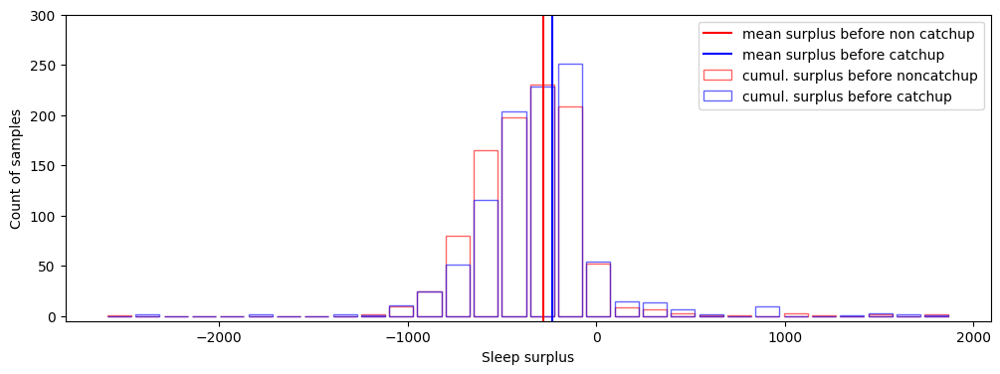

In [363]:
bins=30
before_catchup_noncatchup = before_catchup_sleep_surplus_arr+before_noncatchup_sleep_surplus_arr
'''getting the bins'''
_counts_catchup, _bins_catchup = np.histogram(before_catchup_sleep_surplus_arr, 
             range = (np.min(before_catchup_noncatchup),np.max(before_catchup_noncatchup)),bins=bins)
print("catchup")
print(_counts_catchup, _bins_catchup)
_counts_noncatchup, _bins_noncatchup = np.histogram(before_noncatchup_sleep_surplus_arr, 
             range = (np.min(before_catchup_noncatchup),np.max(before_catchup_noncatchup)), bins=bins)
print("non catchup")
print(_counts_noncatchup, _bins_noncatchup)

left_edges = _bins_noncatchup[:-1]
width = 0.85*(left_edges[1]-left_edges[0])
plt.figure(figsize=(12,4))
plt.ylim(-5,300)
plt.xlabel("Sleep surplus")
plt.ylabel("Count of samples")
plt.bar(left_edges, _counts_noncatchup, align='center',edgecolor='red',color='none',width=width,alpha=0.6, label='cumul. surplus before noncatchup')
plt.bar(left_edges, _counts_catchup,align='center',edgecolor='blue', color='none',width=width,alpha=0.6, label='cumul. surplus before catchup')
plt.axvline(x=np.mean(before_noncatchup_sleep_surplus_arr),color='red', label = 'mean surplus before non catchup')
plt.axvline(x=np.mean(before_catchup_sleep_surplus_arr),color='blue', label = 'mean surplus before catchup')
plt.legend()
plt.show()

In [356]:
print(len(before_catchup_sleep_surplus_arr), len(before_noncatchup_sleep_surplus_arr))

1001 1000


In [336]:
# print(before_catchup_sleep_surplus_arr)
# 203 12 2019-05-24
PredictedVsActual_all2[(PredictedVsActual_all2['user_id']== 203) & (PredictedVsActual_all2['instance_id']== 12) & 
                      (pd.to_datetime(PredictedVsActual_all2['sleep_start_shift'])<= '2019-05-24') &
                      (pd.to_datetime(PredictedVsActual_all2['sleep_start_shift']) >= 
                       pd.to_datetime('2019-05-07')-pd.to_timedelta(7,unit='d'))][
    ['sleep_start_shift','catchup_flag','start_time_num_round', 'EstimatedSleepOnset_SW_Ph_Act',
     'Surplus_MinsBtwnEstActualOnset']]

,sleep_start_shift,catchup_flag,start_time_num_round,EstimatedSleepOnset_SW_Ph_Act,Surplus_MinsBtwnEstActualOnset
59927,2019-04-30,0,26.00,29.55,213.0
59928,2019-05-01,0,27.00,30.05,183.0
59929,2019-05-02,0,26.50,30.30,228.0
59930,2019-05-03,0,25.75,30.55,288.0
59931,2019-05-04,0,25.25,30.30,303.0
59932,2019-05-05,0,26.00,30.05,243.0
59933,2019-05-06,0,25.50,30.30,288.0
59934,2019-05-07,0,25.25,30.05,288.0
59935,2019-05-08,0,24.75,29.80,303.0
59936,2019-05-09,0,25.50,29.55,243.0


In [ ]:
PredictedVsActual_all2[(PredictedVsActual_all2['user_id']== 3355) & (PredictedVsActual_all2['instance_id']== 5)]

In [ ]:
z=0
before_catchup_sleep_surplus_arr = []
print("drawing samples for before catchup sleep distribution")
while z <10:
    print("z: ",z)
    catchup_instances = PredictedVsActual_all2[PredictedVsActual_all2['catchup_flag']==1]['user_instance_date']
    s = catchup_instances.sample(n=1)
    s = s.iloc[0]
    print("chosen instance: ",s)

    _temp = PredictedVsActual_all2[PredictedVsActual_all2['user_instance_date']==s].reset_index()
    get_user = _temp['user_id'].values[0]
    get_instance = _temp['instance_id'].values[0]
    get_catchup_date = pd.to_datetime(_temp['sleep_start_shift'].values[0])
    print("user instance and date: ",get_user, get_instance, get_catchup_date)

    subset_sleeps = PredictedVsActual_all2[(PredictedVsActual_all2['user_id'] == get_user) & 
                                           (PredictedVsActual_all2['instance_id'] == get_instance) &
                                           (pd.to_datetime(PredictedVsActual_all2['sleep_start_shift']) <= get_catchup_date)]
    if len(subset_sleeps) >=8:
        dates_to_check_list = []
        for i in range(7):
            dates_to_check_list.append(get_catchup_date-pd.to_timedelta(i+1,unit='d'))
        print("Dates to check: ", dates_to_check_list )
        net_sleep_surplus = 0

        for i in range(len(dates_to_check_list)):
            print("checking for date: ",dates_to_check_list[i])
            if subset_sleeps[
                pd.to_datetime(subset_sleeps['sleep_start_shift']) == dates_to_check_list[i]]['catchup_flag'].values[0] == 0:
                print("normal sleep")
                add_surplus = subset_sleeps[
                    pd.to_datetime(subset_sleeps['sleep_start_shift']) == dates_to_check_list[i]]['Surplus_MinsBtwnEstActualOnset'].values[0]

                net_sleep_surplus = net_sleep_surplus+np.round(add_surplus,2)
                print("net sleep surplus after ",dates_to_check_list[i], " (normal) is: ",net_sleep_surplus,
                      " after adding ", np.round(add_surplus,2))
            else:
                if i < 1: # if the previous sleep is also a catchup then ignore this sample
                    print("failed sample")
                    z = z-1
                    print("catchup sleep")
                    print("net sleep surplus after ",dates_to_check_list[i], " (catchup) is: ",net_sleep_surplus)
                    break
                
                else:
                    before_catchup_sleep_surplus_arr.append(net_sleep_surplus)
                    print("appended value: ", net_sleep_surplus)
        
    if z%1 == 0:
        print(z," samples drawn")
        z+=1

print("drawing samples for before non-catchup sleep distribution")
before_noncatchup_sleep_surplus_arr = []
z=0    
while z <1000:
#     print("z: ",z)
    noncatchup_instances = PredictedVsActual_all2[PredictedVsActual_all2['catchup_flag']==0]['user_instance_date']
    s = noncatchup_instances.sample(n=1)
    s = s.iloc[0]
#     print("chosen instance: ",s)

    _temp = PredictedVsActual_all2[PredictedVsActual_all2['user_instance_date']==s].reset_index()
    get_user = _temp['user_id'].values[0]
    get_instance = _temp['instance_id'].values[0]
    get_catchup_date = pd.to_datetime(_temp['sleep_start_shift'].values[0])
#     print("user instance and date: ",get_user, get_instance, get_catchup_date)

    subset_sleeps = PredictedVsActual_all2[(PredictedVsActual_all2['user_id'] == get_user) & 
                                           (PredictedVsActual_all2['instance_id'] == get_instance) &
                                           (pd.to_datetime(PredictedVsActual_all2['sleep_start_shift']) <= get_catchup_date)]
    if len(subset_sleeps) >=8:
        dates_to_check_list = []
        for i in range(7):
            dates_to_check_list.append(get_catchup_date-pd.to_timedelta(i+1,unit='d'))
#             print("Dates to check: ", dates_to_check_list )
        net_sleep_surplus = 0

        for i in range(len(dates_to_check_list)):
#             print("checking for date: ",dates_to_check_list[i])
            if subset_sleeps[
                pd.to_datetime(subset_sleeps['sleep_start_shift']) == dates_to_check_list[i]]['catchup_flag'].values[0] == 0:
#                 print("normal sleep")
                add_surplus = subset_sleeps[
                    pd.to_datetime(subset_sleeps['sleep_start_shift']) == dates_to_check_list[i]]['Surplus_MinsBtwnEstActualOnset'].values[0]
                net_sleep_surplus = net_sleep_surplus+np.round(add_surplus,2)
            else:
                if i < 1: # if the previous sleep is also a catchup then ignore this sample
                    z = z-1
                    break
                else:
                    before_noncatchup_sleep_surplus_arr.append(net_sleep_surplus)
            print("net sleep surplus: ",net_sleep_surplus)
    if z%100 == 0:
        print(z," samples drawn")
    z+=1
    
print(len(before_catchup_sleep_surplus_arr), len(before_noncatchup_sleep_surplus_arr))    
            
                                  
subset_sleeps.drop(columns={'index'},inplace=True)
    xx  = subset_sleeps.iloc[7:]    
    _t0 = xx[xx['catchup_sleep']==1]['sleep_start_shift'].sample(1).values[0]
    _t_minus_1 = _t0-pd.to_timedelta(1,unit='d')
    _t_minus_d = _t_minus_1-pd.to_timedelta(obs_window-1,unit='d')




# net_surplus_arr = []
# _itr = 0
# obs_window = 4
# while _itr < 1000:
    #choose a sample from the 
#     instance_list = pd.Series(PredictedVsActual_all2['instance_id'].unique())
#     s = instance_list.sample(n=1,weights=prob_list)
#     s = s.iloc[0]
    
#     subset_sleeps = PredictedVsActual_all2[PredictedVsActual_all2['instance_id']==s].reset_index()
#     subset_sleeps.drop(columns={'index'},inplace=True)
    
#     xx  = subset_sleeps.iloc[7:]    
#     _t0 = xx[xx['catchup_sleep']==1]['sleep_start_shift'].sample(1).values[0]
#     _t_minus_1 = _t0-pd.to_timedelta(1,unit='d')
#     _t_minus_d = _t_minus_1-pd.to_timedelta(obs_window-1,unit='d')

#     temp_date = _t_minus_d
#     gross_surplus = np.sum(subset_sleeps[(subset_sleeps['sleep_start_shift']>= _t_minus_d) & 
#                              (subset_sleeps['sleep_start_shift']<= _t_minus_1) &
#                                             (subset_sleeps['catchup_sleep'] ==0)]['Surplus_MinsBtwnEstActualOnset'])
#     net_surplus = gross_surplus+ np.sum(subset_sleeps[(subset_sleeps['sleep_start_shift']>= _t_minus_d) & 
#                              (subset_sleeps['sleep_start_shift']<= _t_minus_1) &
#                                             (subset_sleeps['catchup_sleep'] ==1)]['catchup_duration_minutes'])
#     net_surplus_arr.append(net_surplus)
# #     print(" before catch up instance: ",s," catchup date: ",_t0,"net surplus: ",net_surplus)
#     _itr+=1
    
# plt.figure(figsize=(8,4))    
# plt.title("Sleep debt distribution before catchup sleep")
# plt.xlim(-1000,1000)
# plt.hist(net_surplus_arr,histtype='step',color='red',label='before catchup')
# plt.axvline(x=np.median(net_surplus_arr),color='black',label = 'median before catchup')

# net_surplus_arr = []
# _itr = 0
# # obs_window = 7
# while _itr < 1000:

#     instance_list = pd.Series(PredictedVsActual_all2['instance_id'].unique())
#     s = instance_list.sample(n=1,weights=prob_list)
#     s = s.iloc[0]
    
#     subset_sleeps = PredictedVsActual_all2[PredictedVsActual_all2['instance_id']==s].reset_index()
#     subset_sleeps.drop(columns={'index'},inplace=True)
#     xx = subset_sleeps[subset_sleeps['catchup_sleep']==0].iloc[7:]
#     _t0 = xx[xx['catchup_sleep']==0]['sleep_start_shift'].sample(1).values[0]
#     _t_minus_1 = _t0-pd.to_timedelta(1,unit='d')
#     _t_minus_d = _t_minus_1-pd.to_timedelta(obs_window-1,unit='d')

#     temp_date = _t_minus_d

#     gross_surplus = np.sum(subset_sleeps[(subset_sleeps['sleep_start_shift']>= _t_minus_d) & 
#                              (subset_sleeps['sleep_start_shift']<= _t_minus_1) &
#                                             (subset_sleeps['catchup_sleep'] ==0)]['Surplus_MinsBtwnEstActualOnset'])
#     net_surplus = gross_surplus+ np.sum(subset_sleeps[(subset_sleeps['sleep_start_shift']>= _t_minus_d) & 
#                              (subset_sleeps['sleep_start_shift']<= _t_minus_1) &
#                                             (subset_sleeps['catchup_sleep'] ==1)]['catchup_duration_minutes'])
#     net_surplus_arr.append(net_surplus)
# #     print(" before non catch up instance: ",s," catchup date: ",_t0,"net surplus: ",net_surplus)
#     _itr+=1
    
# plt.hist(net_surplus_arr,histtype='step',color='blue',label='before non-catchup')
# plt.axvline(x=np.median(net_surplus_arr),color='green',label = 'median before non-catchup')
# plt.legend(loc='upper right')
# plt.xlabel("sleep surplus")
# plt.ylabel("frequency")
# plt.show()

In [ ]:
PredictedVsActual_all2[(PredictedVsActual_all2['user_id']== 290) & (PredictedVsActual_all2['instance_id']== 0) & 
                      (pd.to_datetime(PredictedVsActual_all2['sleep_start_shift'])<= '2015-11-05')]

In [ ]:
print(dates_to_check_list[4])
# subset_sleeps[pd.to_datetime(subset_sleeps['sleep_start_shift']) == dates_to_check_list[4]]['catchup_flag'].values[0]
subset_sleeps.iloc[-7:]
# dates_to_check_list

In [ ]:
def degree_distribution_plot(degree_list):
    degrees_unique = np.unique(degree_list)
    degrees_unique_extd = np.append(degrees_unique, (max(degrees_unique)+1))
    counts, bins = np.histogram(degree_list, bins=degrees_unique_extd)
    return degrees_unique, counts

In [ ]:
before_catchup_mins, before_catchup_counts = degree_distribution_plot(before_catchup_sleep_surplus_arr)
before_noncatchup_mins, before_noncatchup_counts = degree_distribution_plot(before_noncatchup_sleep_surplus_arr)

In [ ]:
plt.hist(before_noncatchup_sleep_surplus_arr)

In [ ]:
plt.hist(before_catchup_sleep_surplus_arr)
plt.show()
plt.show(before_noncatchup_sleep_surplus_arr)
plt.show()

In [ ]:
plt.bar(before_catchup_mins, before_catchup_counts)

In [ ]:
PredictedVsActual_all2[(PredictedVsActual_all2['user_id']==2960) & (PredictedVsActual_all2['instance_id']==12) &
             (pd.to_datetime(PredictedVsActual_all2['sleep_start_shift']) <= '2018-06-04')]

In [ ]:
_t = PredictedVsActual_all2[PredictedVsActual_all2['catchup_sleep']==1].iloc[7:]['sleep_start_shift'].sample(1).values[0]
# PredictedVsActual[PredictedVsActual['sleep_start_shift']==_t]
print(_t)
_t_minus_d = _t -pd.to_timedelta(1,unit='d')
_t_minus_d

In [ ]:
prob_list = []
value_list = list(_user_sleep_stat['count'])
for j in range(len(value_list)):
    prob_list.append(np.round(value_list[j]/np.sum(value_list),2))
prob_list
    


## Distribution of sleep debt for catchup sleeps

In [ ]:
net_surplus_arr = []
_itr = 0
obs_window = 4
while _itr < 1000:
    #choose a sample from the 
    instance_list = pd.Series(PredictedVsActual_all2['instance_id'].unique())
    s = instance_list.sample(n=1,weights=prob_list)
    s = s.iloc[0]
    
    subset_sleeps = PredictedVsActual_all2[PredictedVsActual_all2['instance_id']==s].reset_index()
    subset_sleeps.drop(columns={'index'},inplace=True)
    
    xx  = subset_sleeps.iloc[7:]    
    _t0 = xx[xx['catchup_sleep']==1]['sleep_start_shift'].sample(1).values[0]
    _t_minus_1 = _t0-pd.to_timedelta(1,unit='d')
    _t_minus_d = _t_minus_1-pd.to_timedelta(obs_window-1,unit='d')

    temp_date = _t_minus_d
    gross_surplus = np.sum(subset_sleeps[(subset_sleeps['sleep_start_shift']>= _t_minus_d) & 
                             (subset_sleeps['sleep_start_shift']<= _t_minus_1) &
                                            (subset_sleeps['catchup_sleep'] ==0)]['Surplus_MinsBtwnEstActualOnset'])
    net_surplus = gross_surplus+ np.sum(subset_sleeps[(subset_sleeps['sleep_start_shift']>= _t_minus_d) & 
                             (subset_sleeps['sleep_start_shift']<= _t_minus_1) &
                                            (subset_sleeps['catchup_sleep'] ==1)]['catchup_duration_minutes'])
    net_surplus_arr.append(net_surplus)
#     print(" before catch up instance: ",s," catchup date: ",_t0,"net surplus: ",net_surplus)
    _itr+=1
    
plt.figure(figsize=(8,4))    
plt.title("Sleep debt distribution before catchup sleep")
plt.xlim(-1000,1000)
plt.hist(net_surplus_arr,histtype='step',color='red',label='before catchup')
plt.axvline(x=np.median(net_surplus_arr),color='black',label = 'median before catchup')

net_surplus_arr = []
_itr = 0
# obs_window = 7
while _itr < 1000:

    instance_list = pd.Series(PredictedVsActual_all2['instance_id'].unique())
    s = instance_list.sample(n=1,weights=prob_list)
    s = s.iloc[0]
    
    subset_sleeps = PredictedVsActual_all2[PredictedVsActual_all2['instance_id']==s].reset_index()
    subset_sleeps.drop(columns={'index'},inplace=True)
    xx = subset_sleeps[subset_sleeps['catchup_sleep']==0].iloc[7:]
    _t0 = xx[xx['catchup_sleep']==0]['sleep_start_shift'].sample(1).values[0]
    _t_minus_1 = _t0-pd.to_timedelta(1,unit='d')
    _t_minus_d = _t_minus_1-pd.to_timedelta(obs_window-1,unit='d')

    temp_date = _t_minus_d

    gross_surplus = np.sum(subset_sleeps[(subset_sleeps['sleep_start_shift']>= _t_minus_d) & 
                             (subset_sleeps['sleep_start_shift']<= _t_minus_1) &
                                            (subset_sleeps['catchup_sleep'] ==0)]['Surplus_MinsBtwnEstActualOnset'])
    net_surplus = gross_surplus+ np.sum(subset_sleeps[(subset_sleeps['sleep_start_shift']>= _t_minus_d) & 
                             (subset_sleeps['sleep_start_shift']<= _t_minus_1) &
                                            (subset_sleeps['catchup_sleep'] ==1)]['catchup_duration_minutes'])
    net_surplus_arr.append(net_surplus)
#     print(" before non catch up instance: ",s," catchup date: ",_t0,"net surplus: ",net_surplus)
    _itr+=1
    
plt.hist(net_surplus_arr,histtype='step',color='blue',label='before non-catchup')
plt.axvline(x=np.median(net_surplus_arr),color='green',label = 'median before non-catchup')
plt.legend(loc='upper right')
plt.xlabel("sleep surplus")
plt.ylabel("frequency")
plt.show()

In [ ]:
subset_sleeps[subset_sleeps['catchup_sleep']==1].iloc[7:]['sleep_start_shift']

In [ ]:
xx  = subset_sleeps.iloc[7:]
xx
xx[xx['catchup_sleep']==1]['sleep_start_shift'].sample(1).values